## Bidirectional LSTM model na predikciu hodnot DST o 3 hodiny dopredu na zaklade 18-hodinoveho vstupneho okna z atributov DST a BZ_GSM

Subor: prediction_DST+3_18H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-27 05:01:31.924364: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 3
y_col = f"DST+{shift}"

n_input = 18
atr_count = 2

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', 'bz_gsm', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])
predicators = ["DST", "bz_gsm"]

valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train[predicators].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid[predicators].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test[predicators].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  18


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 18, 2)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 18, 256)             │         134,144 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 18, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 18, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 18)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              19 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 331,412 (1.26 MB)

 Trainable params: 331,412 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H_BZ.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35:46 6s/step - loss: 0.7091 - mae: 0.7645

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.5905 - mae: 0.6661

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 110ms/step - loss: 0.5171 - mae: 0.6039

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.4627 - mae: 0.5569

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 109ms/step - loss: 0.4322 - mae: 0.5288

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 108ms/step - loss: 0.4314 - mae: 0.5131

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 107ms/step - loss: 0.4281 - mae: 0.5012

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.4259 - mae: 0.4928

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.4257 - mae: 0.4866

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - loss: 0.4222 - mae: 0.4797

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - loss: 0.4179 - mae: 0.4738

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.4127 - mae: 0.4681

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.4278 - mae: 0.4682

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.4382 - mae: 0.4674

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.4454 - mae: 0.4659

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.4499 - mae: 0.4638

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.4536 - mae: 0.4620

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.4565 - mae: 0.4604

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.4582 - mae: 0.4587

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.4598 - mae: 0.4575

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.4603 - mae: 0.4559

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.4601 - mae: 0.4543

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.4595 - mae: 0.4526

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.4592 - mae: 0.4513

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.4584 - mae: 0.4500

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.4572 - mae: 0.4486

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.4560 - mae: 0.4471

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.4545 - mae: 0.4457

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.4532 - mae: 0.4444

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.4520 - mae: 0.4432

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.4506 - mae: 0.4420

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.4490 - mae: 0.4407

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.4473 - mae: 0.4394

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.4459 - mae: 0.4384

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.4444 - mae: 0.4373

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.4429 - mae: 0.4364

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.4413 - mae: 0.4354

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.4405 - mae: 0.4346

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.4397 - mae: 0.4339

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.4389 - mae: 0.4331

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.4380 - mae: 0.4325

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.4371 - mae: 0.4318

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.4361 - mae: 0.4312

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.4351 - mae: 0.4305

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.4340 - mae: 0.4299

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.4329 - mae: 0.4293

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.4318 - mae: 0.4287

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.4306 - mae: 0.4280

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.4294 - mae: 0.4274

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.4283 - mae: 0.4268

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.4272 - mae: 0.4262

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.4261 - mae: 0.4257

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.4249 - mae: 0.4250

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.4237 - mae: 0.4244

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.4225 - mae: 0.4238

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.4213 - mae: 0.4232

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.4202 - mae: 0.4226

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.4191 - mae: 0.4220

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.4181 - mae: 0.4215

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.4172 - mae: 0.4210

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.4171 - mae: 0.4207

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.4170 - mae: 0.4204

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.4169 - mae: 0.4201

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.4168 - mae: 0.4199

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.4166 - mae: 0.4196

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.4164 - mae: 0.4194

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.4164 - mae: 0.4191

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.4166 - mae: 0.4190

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.4166 - mae: 0.4188

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.4166 - mae: 0.4186

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.4167 - mae: 0.4185

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.4168 - mae: 0.4183

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.4170 - mae: 0.4182

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.4172 - mae: 0.4180

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.4173 - mae: 0.4178

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.4174 - mae: 0.4176

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.4174 - mae: 0.4175

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.4175 - mae: 0.4174

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.4175 - mae: 0.4172

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.4175 - mae: 0.4170

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.4175 - mae: 0.4169

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.4174 - mae: 0.4167

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.4173 - mae: 0.4165

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.4172 - mae: 0.4163

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.4170 - mae: 0.4162

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.4168 - mae: 0.4160

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.4166 - mae: 0.4157

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.4164 - mae: 0.4155

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.4163 - mae: 0.4154

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.4161 - mae: 0.4152

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.4159 - mae: 0.4150

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.4157 - mae: 0.4148

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.4155 - mae: 0.4146

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.4152 - mae: 0.4144

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.4150 - mae: 0.4142

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.4149 - mae: 0.4141

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.4147 - mae: 0.4139

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.4145 - mae: 0.4137

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.4144 - mae: 0.4135

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.4142 - mae: 0.4134

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.4140 - mae: 0.4132

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.4138 - mae: 0.4131

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.4136 - mae: 0.4129

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.4134 - mae: 0.4127

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.4131 - mae: 0.4126

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.4129 - mae: 0.4124

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.4126 - mae: 0.4122

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.4124 - mae: 0.4121

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.4121 - mae: 0.4119

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.4118 - mae: 0.4117

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.4115 - mae: 0.4115

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.4111 - mae: 0.4113

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.4108 - mae: 0.4111

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.4105 - mae: 0.4109

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.4101 - mae: 0.4107

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.4098 - mae: 0.4105

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.4095 - mae: 0.4103

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.4092 - mae: 0.4101

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.4089 - mae: 0.4100

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.4085 - mae: 0.4098

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.4082 - mae: 0.4096

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.4079 - mae: 0.4094

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.4075 - mae: 0.4092

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.4072 - mae: 0.4090

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.4069 - mae: 0.4089

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.4065 - mae: 0.4087

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.4062 - mae: 0.4085

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.4059 - mae: 0.4084

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.4055 - mae: 0.4082

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.4052 - mae: 0.4081

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.4048 - mae: 0.4079

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.4045 - mae: 0.4077

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.4041 - mae: 0.4076

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.4038 - mae: 0.4074

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.4034 - mae: 0.4072

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.4031 - mae: 0.4071

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.4027 - mae: 0.4069

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.4024 - mae: 0.4067

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.4020 - mae: 0.4066

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.4016 - mae: 0.4064

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.4013 - mae: 0.4062

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.4009 - mae: 0.4060

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.4005 - mae: 0.4059

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.4002 - mae: 0.4057

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3999 - mae: 0.4056

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3996 - mae: 0.4054

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.3992 - mae: 0.4052

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3989 - mae: 0.4051

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3985 - mae: 0.4049

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3982 - mae: 0.4047

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3978 - mae: 0.4046

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3975 - mae: 0.4044

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3971 - mae: 0.4043

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3968 - mae: 0.4041

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3964 - mae: 0.4039

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3960 - mae: 0.4038

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.3957 - mae: 0.4036

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3953 - mae: 0.4034

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3949 - mae: 0.4032

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3945 - mae: 0.4031

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3942 - mae: 0.4029

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3938 - mae: 0.4027

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3934 - mae: 0.4025

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3931 - mae: 0.4024

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3927 - mae: 0.4022

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3923 - mae: 0.4020

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.3920 - mae: 0.4019

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3916 - mae: 0.4017

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3912 - mae: 0.4015

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3908 - mae: 0.4013

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3905 - mae: 0.4012

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3901 - mae: 0.4010

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3897 - mae: 0.4008

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3894 - mae: 0.4007

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3890 - mae: 0.4005

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3886 - mae: 0.4003

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.3883 - mae: 0.4002

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3879 - mae: 0.4000

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3875 - mae: 0.3998

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3871 - mae: 0.3996

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3868 - mae: 0.3995

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3864 - mae: 0.3993

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3861 - mae: 0.3991

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3858 - mae: 0.3990

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3854 - mae: 0.3988

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3851 - mae: 0.3986

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3847 - mae: 0.3985

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.3844 - mae: 0.3983

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.3840 - mae: 0.3981

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.3836 - mae: 0.3980

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.3833 - mae: 0.3978

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.3829 - mae: 0.3976

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.3826 - mae: 0.3975

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.3822 - mae: 0.3973

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.3819 - mae: 0.3972

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.3815 - mae: 0.3970

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.3812 - mae: 0.3968

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.3808 - mae: 0.3967

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.3805 - mae: 0.3965

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.3802 - mae: 0.3964

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.3798 - mae: 0.3962

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.3795 - mae: 0.3961

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.3791 - mae: 0.3959

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.3788 - mae: 0.3957

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.3785 - mae: 0.3956

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.3781 - mae: 0.3954

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.3778 - mae: 0.3953

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.3775 - mae: 0.3951

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.3772 - mae: 0.3950

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.3769 - mae: 0.3949

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.3766 - mae: 0.3947

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.3763 - mae: 0.3946

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.3760 - mae: 0.3944

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.3757 - mae: 0.3943

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.3754 - mae: 0.3942

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.3751 - mae: 0.3940

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.3748 - mae: 0.3939

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.3745 - mae: 0.3937

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.3742 - mae: 0.3936

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.3739 - mae: 0.3935

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.3736 - mae: 0.3933

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.3733 - mae: 0.3932

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.3730 - mae: 0.3931

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.3727 - mae: 0.3929

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.3724 - mae: 0.3928

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.3721 - mae: 0.3926

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.3718 - mae: 0.3925

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.3715 - mae: 0.3924

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.3712 - mae: 0.3922

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.3709 - mae: 0.3921

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.3706 - mae: 0.3919

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.3703 - mae: 0.3918

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.3700 - mae: 0.3917

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.3697 - mae: 0.3915

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.3694 - mae: 0.3914

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.3691 - mae: 0.3912

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.3689 - mae: 0.3911

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.3686 - mae: 0.3910

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.3683 - mae: 0.3908

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.3680 - mae: 0.3907

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.3678 - mae: 0.3906

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.3675 - mae: 0.3905

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.3673 - mae: 0.3903

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.3670 - mae: 0.3902

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.3667 - mae: 0.3901

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.3665 - mae: 0.3900

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.3662 - mae: 0.3898

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.3660 - mae: 0.3897

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.3657 - mae: 0.3896

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3655 - mae: 0.3895

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3652 - mae: 0.3894

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3650 - mae: 0.3893

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3647 - mae: 0.3891

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3645 - mae: 0.3890

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.3642 - mae: 0.3889

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.3640 - mae: 0.3888

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3638 - mae: 0.3887

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3635 - mae: 0.3886

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.3633 - mae: 0.3885

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3631 - mae: 0.3884

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3629 - mae: 0.3883

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3626 - mae: 0.3882

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3624 - mae: 0.3881

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3622 - mae: 0.3880

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3620 - mae: 0.3879

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3617 - mae: 0.3877

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3615 - mae: 0.3876

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.3613 - mae: 0.3875

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3611 - mae: 0.3874

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3609 - mae: 0.3873

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3607 - mae: 0.3872

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3605 - mae: 0.3872

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3603 - mae: 0.3871

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3601 - mae: 0.3870

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3599 - mae: 0.3869

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3598 - mae: 0.3868

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.3596 - mae: 0.3867

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3594 - mae: 0.3867

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3592 - mae: 0.3866

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3590 - mae: 0.3865

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3589 - mae: 0.3864

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3587 - mae: 0.3863

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3585 - mae: 0.3862

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3583 - mae: 0.3862

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3581 - mae: 0.3861

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3580 - mae: 0.3860

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.3578 - mae: 0.3859

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3576 - mae: 0.3858

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3574 - mae: 0.3858

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3573 - mae: 0.3857

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3571 - mae: 0.3856

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3569 - mae: 0.3855

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3568 - mae: 0.3855

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3566 - mae: 0.3854

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3564 - mae: 0.3853

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3563 - mae: 0.3852

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.3561 - mae: 0.3851

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3559 - mae: 0.3851 

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3558 - mae: 0.3850

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3556 - mae: 0.3849

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3555 - mae: 0.3849

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3553 - mae: 0.3848

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3551 - mae: 0.3847

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3550 - mae: 0.3846

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3548 - mae: 0.3846

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.3547 - mae: 0.3845

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3545 - mae: 0.3844

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3544 - mae: 0.3844

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3542 - mae: 0.3843

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3540 - mae: 0.3842

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3539 - mae: 0.3841

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3537 - mae: 0.3841

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3535 - mae: 0.3840

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3534 - mae: 0.3839

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3532 - mae: 0.3838

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.3531 - mae: 0.3838

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3529 - mae: 0.3837

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3528 - mae: 0.3836

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3526 - mae: 0.3836

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3525 - mae: 0.3835

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3523 - mae: 0.3834

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3521 - mae: 0.3834

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3520 - mae: 0.3833

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3518 - mae: 0.3832

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.3517 - mae: 0.3832

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3515 - mae: 0.3831

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3514 - mae: 0.3830

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3512 - mae: 0.3830

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3511 - mae: 0.3829

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3509 - mae: 0.3828

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3508 - mae: 0.3828

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3506 - mae: 0.3827

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3505 - mae: 0.3826

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3503 - mae: 0.3825

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.3502 - mae: 0.3825

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3501 - mae: 0.3824

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3499 - mae: 0.3823

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3498 - mae: 0.3823

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3496 - mae: 0.3822

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3495 - mae: 0.3822

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3494 - mae: 0.3821

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3492 - mae: 0.3820

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3491 - mae: 0.3820

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3490 - mae: 0.3819

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.3489 - mae: 0.3818

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3487 - mae: 0.3818

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3486 - mae: 0.3817

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3485 - mae: 0.3817

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3484 - mae: 0.3816

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3483 - mae: 0.3816

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3482 - mae: 0.3815

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3480 - mae: 0.3814

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3479 - mae: 0.3814

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3478 - mae: 0.3813

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.3477 - mae: 0.3813

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3476 - mae: 0.3812

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3475 - mae: 0.3812

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3474 - mae: 0.3811

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3473 - mae: 0.3811

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3472 - mae: 0.3810

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3471 - mae: 0.3810

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3470 - mae: 0.3809

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3469 - mae: 0.3809

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3468 - mae: 0.3808

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.3467 - mae: 0.3808

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3466 - mae: 0.3807

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3465 - mae: 0.3806

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3464 - mae: 0.3806

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3463 - mae: 0.3805

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3462 - mae: 0.3805

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3461 - mae: 0.3804

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3460 - mae: 0.3804

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3459 - mae: 0.3803

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3458 - mae: 0.3803

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.3457 - mae: 0.3802

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3456 - mae: 0.3802

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3455 - mae: 0.3801

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3454 - mae: 0.3801

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3453 - mae: 0.3800

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3452 - mae: 0.3800

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3451 - mae: 0.3799

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3450 - mae: 0.3799

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3449 - mae: 0.3798

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3448 - mae: 0.3798

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.3447 - mae: 0.3797

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3446 - mae: 0.3797

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3444 - mae: 0.3796

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3443 - mae: 0.3796

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3442 - mae: 0.3795

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3441 - mae: 0.3795

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3440 - mae: 0.3794

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3439 - mae: 0.3794

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3438 - mae: 0.3793

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.3437 - mae: 0.3793

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3436 - mae: 0.3792

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3435 - mae: 0.3792

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3434 - mae: 0.3791

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3433 - mae: 0.3791

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3432 - mae: 0.3790

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3431 - mae: 0.3790

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3430 - mae: 0.3789

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3429 - mae: 0.3789

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3428 - mae: 0.3788

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.3427 - mae: 0.3788

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3426 - mae: 0.3788

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3425 - mae: 0.3787

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3424 - mae: 0.3787

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3423 - mae: 0.3786

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3422 - mae: 0.3786

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3422 - mae: 0.3785

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3421 - mae: 0.3785

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3420 - mae: 0.3784

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3419 - mae: 0.3784

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.3418 - mae: 0.3784

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3417 - mae: 0.3783

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3416 - mae: 0.3783

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3415 - mae: 0.3782

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3414 - mae: 0.3782

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3413 - mae: 0.3781

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3412 - mae: 0.3781

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3411 - mae: 0.3780

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3410 - mae: 0.3780

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3409 - mae: 0.3780

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.3409 - mae: 0.3779

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3408 - mae: 0.3779

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3407 - mae: 0.3778

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3406 - mae: 0.3778

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3405 - mae: 0.3777

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3404 - mae: 0.3777

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3404 - mae: 0.3777

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3403 - mae: 0.3776

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3402 - mae: 0.3776

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3401 - mae: 0.3775

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.3400 - mae: 0.3775

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3399 - mae: 0.3775

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3399 - mae: 0.3774

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3398 - mae: 0.3774

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3397 - mae: 0.3773

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3396 - mae: 0.3773

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3395 - mae: 0.3772

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3394 - mae: 0.3772

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3394 - mae: 0.3772

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3393 - mae: 0.3771

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.3392 - mae: 0.3771

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3391 - mae: 0.3770

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3390 - mae: 0.3770

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3389 - mae: 0.3769

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3388 - mae: 0.3769

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3388 - mae: 0.3768

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3387 - mae: 0.3768

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3386 - mae: 0.3768

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3385 - mae: 0.3767

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3384 - mae: 0.3767

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.3383 - mae: 0.3766

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3382 - mae: 0.3766

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3382 - mae: 0.3765

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3381 - mae: 0.3765

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3380 - mae: 0.3765

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3379 - mae: 0.3764

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3379 - mae: 0.3764

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3378 - mae: 0.3763

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3377 - mae: 0.3763

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3377 - mae: 0.3763

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.3376 - mae: 0.3762

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3375 - mae: 0.3762

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3375 - mae: 0.3761

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3374 - mae: 0.3761

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3373 - mae: 0.3761

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3372 - mae: 0.3760

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3372 - mae: 0.3760

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3371 - mae: 0.3759

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3370 - mae: 0.3759

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3369 - mae: 0.3759

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.3369 - mae: 0.3758

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3368 - mae: 0.3758

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3367 - mae: 0.3757

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3366 - mae: 0.3757

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3366 - mae: 0.3757

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3365 - mae: 0.3756

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3364 - mae: 0.3756

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3364 - mae: 0.3755

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3363 - mae: 0.3755

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3362 - mae: 0.3755

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.3361 - mae: 0.3754

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3361 - mae: 0.3754

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3360 - mae: 0.3754

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3359 - mae: 0.3753

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3359 - mae: 0.3753

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3358 - mae: 0.3752

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3357 - mae: 0.3752

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3357 - mae: 0.3752

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3356 - mae: 0.3751

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3355 - mae: 0.3751

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.3355 - mae: 0.3751

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3354 - mae: 0.3750

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3353 - mae: 0.3750

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3353 - mae: 0.3749

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3352 - mae: 0.3749

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3351 - mae: 0.3749

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3351 - mae: 0.3748

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3350 - mae: 0.3748

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3349 - mae: 0.3748

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3349 - mae: 0.3747

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.3348 - mae: 0.3747

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3347 - mae: 0.3747

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3347 - mae: 0.3746

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3346 - mae: 0.3746

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3345 - mae: 0.3746

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3345 - mae: 0.3745

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3344 - mae: 0.3745

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3344 - mae: 0.3745

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3343 - mae: 0.3744

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3342 - mae: 0.3744

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.3342 - mae: 0.3744

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3341 - mae: 0.3743

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3340 - mae: 0.3743

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3340 - mae: 0.3743

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3339 - mae: 0.3742

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3338 - mae: 0.3742

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3338 - mae: 0.3741

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3337 - mae: 0.3741

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3337 - mae: 0.3741

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3336 - mae: 0.3740

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.3335 - mae: 0.3740

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3335 - mae: 0.3740

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3334 - mae: 0.3740

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3334 - mae: 0.3739

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3333 - mae: 0.3739

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3333 - mae: 0.3739

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3333 - mae: 0.3738

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3332 - mae: 0.3738

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3332 - mae: 0.3738

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3331 - mae: 0.3737

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.3331 - mae: 0.3737

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3330 - mae: 0.3737

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3330 - mae: 0.3737

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3330 - mae: 0.3736

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3329 - mae: 0.3736

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3329 - mae: 0.3736

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3328 - mae: 0.3735

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3328 - mae: 0.3735

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.3328 - mae: 0.3735 

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.3327 - mae: 0.3735

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.3327 - mae: 0.3734 

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.3326 - mae: 0.3734

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.3326 - mae: 0.3734

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.3326 - mae: 0.3734

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.3325 - mae: 0.3733

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.3325 - mae: 0.3733

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.3325 - mae: 0.3733

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.3324 - mae: 0.3732

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.3324 - mae: 0.3732

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.3323 - mae: 0.3732

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.3323 - mae: 0.3732

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.3323 - mae: 0.3731

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.3322 - mae: 0.3731

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.3322 - mae: 0.3731

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.3321 - mae: 0.3731

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.3321 - mae: 0.3730

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.3321 - mae: 0.3730

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.3320 - mae: 0.3730

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.3320 - mae: 0.3730

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.3320 - mae: 0.3729

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.3319 - mae: 0.3729

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.3319 - mae: 0.3729

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.3318 - mae: 0.3729

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.3318 - mae: 0.3728

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.3318 - mae: 0.3728

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.3317 - mae: 0.3728

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.3317 - mae: 0.3728

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.3317 - mae: 0.3727

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.3316 - mae: 0.3727

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.3316 - mae: 0.3727

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.3315 - mae: 0.3727

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.3315 - mae: 0.3726

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.3315 - mae: 0.3726

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.3314 - mae: 0.3726

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.3314 - mae: 0.3726

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.3314 - mae: 0.3725

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.3313 - mae: 0.3725

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.3313 - mae: 0.3725

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.3312 - mae: 0.3725

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.3312 - mae: 0.3724

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.3312 - mae: 0.3724

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.3311 - mae: 0.3724

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.3311 - mae: 0.3724

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.3311 - mae: 0.3723

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.3310 - mae: 0.3723

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.3310 - mae: 0.3723

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.3309 - mae: 0.3723

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.3309 - mae: 0.3722

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.3309 - mae: 0.3722

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.3308 - mae: 0.3722

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.3308 - mae: 0.3721

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.3307 - mae: 0.3721

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.3307 - mae: 0.3721

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.3307 - mae: 0.3721

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.3306 - mae: 0.3720

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.3306 - mae: 0.3720

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.3305 - mae: 0.3720

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.3305 - mae: 0.3720

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.3305 - mae: 0.3719

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.3304 - mae: 0.3719

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.3304 - mae: 0.3719

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.3303 - mae: 0.3719

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.3303 - mae: 0.3718

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.3303 - mae: 0.3718

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.3302 - mae: 0.3718

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.3302 - mae: 0.3718

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.3301 - mae: 0.3717

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.3301 - mae: 0.3717

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.3300 - mae: 0.3717

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.3300 - mae: 0.3717

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.3300 - mae: 0.3716

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.3299 - mae: 0.3716

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.3299 - mae: 0.3716

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.3298 - mae: 0.3716

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.3298 - mae: 0.3715

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.3297 - mae: 0.3715

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.3297 - mae: 0.3715

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.3297 - mae: 0.3714

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.3296 - mae: 0.3714

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.3296 - mae: 0.3714

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.3295 - mae: 0.3714

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.3295 - mae: 0.3713

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.3294 - mae: 0.3713

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.3294 - mae: 0.3713

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.3294 - mae: 0.3713

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.3293 - mae: 0.3712

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.3293 - mae: 0.3712

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.3292 - mae: 0.3712

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.3292 - mae: 0.3712

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.3291 - mae: 0.3711

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.3291 - mae: 0.3711

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3291 - mae: 0.3711

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3290 - mae: 0.3711

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3290 - mae: 0.3710

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3289 - mae: 0.3710

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3289 - mae: 0.3710

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3289 - mae: 0.3710

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3288 - mae: 0.3709

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3288 - mae: 0.3709

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3287 - mae: 0.3709

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.3287 - mae: 0.3709

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3287 - mae: 0.3708

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3286 - mae: 0.3708

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3286 - mae: 0.3708

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3285 - mae: 0.3708

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3285 - mae: 0.3707

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3285 - mae: 0.3707

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3284 - mae: 0.3707

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3284 - mae: 0.3707

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3283 - mae: 0.3706

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.3283 - mae: 0.3706

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3283 - mae: 0.3706

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3282 - mae: 0.3706

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3282 - mae: 0.3706

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3281 - mae: 0.3705

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3281 - mae: 0.3705

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3281 - mae: 0.3705

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3280 - mae: 0.3705

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3280 - mae: 0.3704

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3280 - mae: 0.3704

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.3279 - mae: 0.3704

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3279 - mae: 0.3704

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3279 - mae: 0.3703

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3278 - mae: 0.3703

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3278 - mae: 0.3703

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3278 - mae: 0.3703

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3277 - mae: 0.3703

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3277 - mae: 0.3702

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3277 - mae: 0.3702

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3276 - mae: 0.3702

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.3276 - mae: 0.3702

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3275 - mae: 0.3701

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3275 - mae: 0.3701

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3275 - mae: 0.3701

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3274 - mae: 0.3701

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3274 - mae: 0.3701

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3274 - mae: 0.3700

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3273 - mae: 0.3700

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3273 - mae: 0.3700

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3273 - mae: 0.3700

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.3272 - mae: 0.3700

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3272 - mae: 0.3699

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3272 - mae: 0.3699

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3271 - mae: 0.3699

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3271 - mae: 0.3699

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3270 - mae: 0.3698

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3270 - mae: 0.3698

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3270 - mae: 0.3698

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3269 - mae: 0.3698

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3269 - mae: 0.3698

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.3269 - mae: 0.3697

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3268 - mae: 0.3697

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3268 - mae: 0.3697

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3268 - mae: 0.3697

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3267 - mae: 0.3696

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3267 - mae: 0.3696

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3266 - mae: 0.3696

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3266 - mae: 0.3696

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3266 - mae: 0.3696

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3265 - mae: 0.3695

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.3265 - mae: 0.3695

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3265 - mae: 0.3695

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3264 - mae: 0.3695

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3264 - mae: 0.3694

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3263 - mae: 0.3694

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3263 - mae: 0.3694

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3263 - mae: 0.3694

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3262 - mae: 0.3693

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3262 - mae: 0.3693

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3261 - mae: 0.3693

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.3261 - mae: 0.3693

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3261 - mae: 0.3693

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3260 - mae: 0.3692

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3260 - mae: 0.3692

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3259 - mae: 0.3692

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3259 - mae: 0.3692

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3259 - mae: 0.3691

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3258 - mae: 0.3691

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3258 - mae: 0.3691

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.3257 - mae: 0.3691

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3257 - mae: 0.3690

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3257 - mae: 0.3690

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3256 - mae: 0.3690

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3256 - mae: 0.3690

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3255 - mae: 0.3689

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3255 - mae: 0.3689

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3255 - mae: 0.3689

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3254 - mae: 0.3689

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3254 - mae: 0.3688

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.3253 - mae: 0.3688

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3253 - mae: 0.3688

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3253 - mae: 0.3688

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3252 - mae: 0.3688

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3252 - mae: 0.3687

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3251 - mae: 0.3687

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3251 - mae: 0.3687

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3251 - mae: 0.3687

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3250 - mae: 0.3686

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3250 - mae: 0.3686

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.3249 - mae: 0.3686

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3249 - mae: 0.3686

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3249 - mae: 0.3685

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3248 - mae: 0.3685

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3248 - mae: 0.3685

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3247 - mae: 0.3685

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3247 - mae: 0.3684

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3247 - mae: 0.3684

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3246 - mae: 0.3684

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3246 - mae: 0.3684

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.3245 - mae: 0.3684

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3245 - mae: 0.3683

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3245 - mae: 0.3683

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3244 - mae: 0.3683

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3244 - mae: 0.3683

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3243 - mae: 0.3682

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3243 - mae: 0.3682

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.3243 - mae: 0.3682

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.3242 - mae: 0.3682

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.3242 - mae: 0.3681

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.3241 - mae: 0.3681

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3241 - mae: 0.3681

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3241 - mae: 0.3681

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3240 - mae: 0.3680

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3240 - mae: 0.3680

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3239 - mae: 0.3680

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3239 - mae: 0.3680

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3239 - mae: 0.3679

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3238 - mae: 0.3679

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3238 - mae: 0.3679

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3237 - mae: 0.3679

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.3237 - mae: 0.3678

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.3237 - mae: 0.3678

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.3236 - mae: 0.3678

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.3236 - mae: 0.3678

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.3235 - mae: 0.3678

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.3235 - mae: 0.3677

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.3234 - mae: 0.3677

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.3234 - mae: 0.3677

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.3234 - mae: 0.3677

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.3233 - mae: 0.3676

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.3233 - mae: 0.3676

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.3232 - mae: 0.3676

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.3232 - mae: 0.3676

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.3232 - mae: 0.3675

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.3231 - mae: 0.3675

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.3231 - mae: 0.3675

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.3230 - mae: 0.3675

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.3230 - mae: 0.3674

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.3229 - mae: 0.3674

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.3229 - mae: 0.3674

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.3229 - mae: 0.3674

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.3228 - mae: 0.3673 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.3228 - mae: 0.3673

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.3227 - mae: 0.3673

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.3227 - mae: 0.3673

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.3226 - mae: 0.3672

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.3226 - mae: 0.3672

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.3226 - mae: 0.3672

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.3225 - mae: 0.3672

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.3225 - mae: 0.3671

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.3224 - mae: 0.3671

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.3224 - mae: 0.3671

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.3223 - mae: 0.3671

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.3223 - mae: 0.3670

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.3222 - mae: 0.3670

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.3222 - mae: 0.3670

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.3222 - mae: 0.3670

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.3221 - mae: 0.3669

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.3221 - mae: 0.3669

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.3220 - mae: 0.3669

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.3220 - mae: 0.3669

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.3219 - mae: 0.3668

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.3219 - mae: 0.3668

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.3219 - mae: 0.3668

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.3218 - mae: 0.3668

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.3218 - mae: 0.3667

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.3217 - mae: 0.3667

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.3217 - mae: 0.3667

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.3216 - mae: 0.3667

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.3216 - mae: 0.3666

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.3215 - mae: 0.3666

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3215 - mae: 0.3666

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3215 - mae: 0.3666

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3214 - mae: 0.3665

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3214 - mae: 0.3665

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3213 - mae: 0.3665

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3213 - mae: 0.3665

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3212 - mae: 0.3664

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3212 - mae: 0.3664

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3211 - mae: 0.3664

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3211 - mae: 0.3664

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.3211 - mae: 0.3663

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.3210 - mae: 0.3663

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.3210 - mae: 0.3663

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.3209 - mae: 0.3663

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.3209 - mae: 0.3662

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.3208 - mae: 0.3662

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.3208 - mae: 0.3662

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.3207 - mae: 0.3662

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.3207 - mae: 0.3661

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.3206 - mae: 0.3661

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.3206 - mae: 0.3661

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.3205 - mae: 0.3660

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.3205 - mae: 0.3660

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.3205 - mae: 0.3660

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.3204 - mae: 0.3660

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.3204 - mae: 0.3659

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.3203 - mae: 0.3659

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.3203 - mae: 0.3659

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.3202 - mae: 0.3659

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.3202 - mae: 0.3658

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.3201 - mae: 0.3658

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.3201 - mae: 0.3658

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.3200 - mae: 0.3658

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.3200 - mae: 0.3657

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.3199 - mae: 0.3657

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.3199 - mae: 0.3657

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.3198 - mae: 0.3656

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.3198 - mae: 0.3656

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.3197 - mae: 0.3656

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.3197 - mae: 0.3656

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.3196 - mae: 0.3655

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3196 - mae: 0.3655

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3196 - mae: 0.3655

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3195 - mae: 0.3655

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3195 - mae: 0.3654

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3194 - mae: 0.3654

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3194 - mae: 0.3654

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3193 - mae: 0.3654

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3193 - mae: 0.3653

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3192 - mae: 0.3653

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.3192 - mae: 0.3653

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3191 - mae: 0.3652

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3191 - mae: 0.3652

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3190 - mae: 0.3652

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3190 - mae: 0.3652

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3189 - mae: 0.3651

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3189 - mae: 0.3651

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3188 - mae: 0.3651

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3188 - mae: 0.3651

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3187 - mae: 0.3650

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.3187 - mae: 0.3650

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3186 - mae: 0.3650

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3186 - mae: 0.3649

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3185 - mae: 0.3649

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3185 - mae: 0.3649

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3184 - mae: 0.3649

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3184 - mae: 0.3648

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3184 - mae: 0.3648

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3183 - mae: 0.3648

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3183 - mae: 0.3647

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3182 - mae: 0.3647

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.3182 - mae: 0.3647


Epoch 1: val_mae improved from inf to 0.33574, saving model to models/DST+3_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 104s 109ms/step - loss: 0.3181 - mae: 0.3647 - val_loss: 0.2967 - val_mae: 0.3357


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0783 - mae: 0.2194

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0785 - mae: 0.2171 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0830 - mae: 0.2223

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0843 - mae: 0.2244

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0898 - mae: 0.2276

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1060 - mae: 0.2393

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1194 - mae: 0.2483

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1286 - mae: 0.2550

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1354 - mae: 0.2601

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1413 - mae: 0.2644

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1451 - mae: 0.2669

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1475 - mae: 0.2685

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1490 - mae: 0.2696

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1500 - mae: 0.2703

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1507 - mae: 0.2708

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1511 - mae: 0.2712

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1513 - mae: 0.2714

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1512 - mae: 0.2714

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1514 - mae: 0.2715

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1513 - mae: 0.2715

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1513 - mae: 0.2714

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1514 - mae: 0.2712

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1513 - mae: 0.2711

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1515 - mae: 0.2711

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1516 - mae: 0.2711

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1518 - mae: 0.2712

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1519 - mae: 0.2712

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1519 - mae: 0.2712

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1518 - mae: 0.2712

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1518 - mae: 0.2711

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1519 - mae: 0.2712

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1521 - mae: 0.2713

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1522 - mae: 0.2714

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1522 - mae: 0.2715

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1522 - mae: 0.2715

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1523 - mae: 0.2716

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1524 - mae: 0.2717

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1525 - mae: 0.2718

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1526 - mae: 0.2719

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1527 - mae: 0.2719

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1527 - mae: 0.2720

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1528 - mae: 0.2720

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1529 - mae: 0.2721

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1530 - mae: 0.2722

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1531 - mae: 0.2723

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1534 - mae: 0.2724

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1542 - mae: 0.2726

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1549 - mae: 0.2728

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1555 - mae: 0.2730

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1566 - mae: 0.2733

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1576 - mae: 0.2737

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1586 - mae: 0.2740

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1595 - mae: 0.2743

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1604 - mae: 0.2746

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1612 - mae: 0.2749

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1621 - mae: 0.2752

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1630 - mae: 0.2755

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1639 - mae: 0.2758

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1647 - mae: 0.2761

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1655 - mae: 0.2764

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1663 - mae: 0.2767

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1672 - mae: 0.2770

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1679 - mae: 0.2773

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1687 - mae: 0.2776

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1693 - mae: 0.2779

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1700 - mae: 0.2781

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1706 - mae: 0.2784

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1712 - mae: 0.2786

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1717 - mae: 0.2788

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1722 - mae: 0.2790

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1727 - mae: 0.2792

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1732 - mae: 0.2794

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1736 - mae: 0.2796

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1740 - mae: 0.2797

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1744 - mae: 0.2799

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1748 - mae: 0.2801

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1751 - mae: 0.2802

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1756 - mae: 0.2804

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1759 - mae: 0.2805

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1763 - mae: 0.2807

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1767 - mae: 0.2809

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1771 - mae: 0.2810

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1775 - mae: 0.2812

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1778 - mae: 0.2813

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1782 - mae: 0.2815

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1785 - mae: 0.2816

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1788 - mae: 0.2818

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1791 - mae: 0.2819

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1794 - mae: 0.2821

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1797 - mae: 0.2822

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1800 - mae: 0.2823

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1803 - mae: 0.2825

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1806 - mae: 0.2826

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1808 - mae: 0.2827

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1811 - mae: 0.2828

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1813 - mae: 0.2829

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1816 - mae: 0.2831

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1818 - mae: 0.2832

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1820 - mae: 0.2833

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1822 - mae: 0.2834

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1824 - mae: 0.2835

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1827 - mae: 0.2836

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1829 - mae: 0.2837

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1831 - mae: 0.2839

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1834 - mae: 0.2840

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1836 - mae: 0.2841

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1838 - mae: 0.2843

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1841 - mae: 0.2844

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1843 - mae: 0.2845

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1845 - mae: 0.2846

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1847 - mae: 0.2848

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1849 - mae: 0.2849

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1852 - mae: 0.2850

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1854 - mae: 0.2852

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1856 - mae: 0.2853

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1859 - mae: 0.2854

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1861 - mae: 0.2855

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1863 - mae: 0.2856

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1865 - mae: 0.2858

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1867 - mae: 0.2859

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1869 - mae: 0.2860

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1871 - mae: 0.2861

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1873 - mae: 0.2862

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1874 - mae: 0.2863

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1876 - mae: 0.2865

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1878 - mae: 0.2866

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1880 - mae: 0.2867

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1882 - mae: 0.2868

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1883 - mae: 0.2869

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1885 - mae: 0.2870

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1887 - mae: 0.2872

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1888 - mae: 0.2873

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1890 - mae: 0.2874

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1892 - mae: 0.2875

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1894 - mae: 0.2876

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1896 - mae: 0.2877

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1898 - mae: 0.2879

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1900 - mae: 0.2880

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1902 - mae: 0.2881

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1904 - mae: 0.2883

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1906 - mae: 0.2884

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1908 - mae: 0.2885

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1910 - mae: 0.2886

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1912 - mae: 0.2888

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1914 - mae: 0.2889

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1916 - mae: 0.2890

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1918 - mae: 0.2891

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1919 - mae: 0.2892

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1921 - mae: 0.2893

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1923 - mae: 0.2894

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1924 - mae: 0.2895

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1926 - mae: 0.2896

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1927 - mae: 0.2898

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1929 - mae: 0.2898

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1930 - mae: 0.2900

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1932 - mae: 0.2900

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1933 - mae: 0.2901

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1934 - mae: 0.2902

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1936 - mae: 0.2903

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1937 - mae: 0.2904

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1939 - mae: 0.2905

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1940 - mae: 0.2906

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1942 - mae: 0.2907

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1943 - mae: 0.2908

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1944 - mae: 0.2909

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1946 - mae: 0.2910

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1947 - mae: 0.2911

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1948 - mae: 0.2912

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1950 - mae: 0.2913

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1951 - mae: 0.2914

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1953 - mae: 0.2914

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1954 - mae: 0.2915

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1955 - mae: 0.2916

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1957 - mae: 0.2917

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1958 - mae: 0.2918

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1960 - mae: 0.2919

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1961 - mae: 0.2920

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1962 - mae: 0.2921

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1964 - mae: 0.2921

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1965 - mae: 0.2922

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1966 - mae: 0.2923

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1967 - mae: 0.2924

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1969 - mae: 0.2925

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1970 - mae: 0.2925

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1971 - mae: 0.2926

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1972 - mae: 0.2927

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1973 - mae: 0.2928

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1975 - mae: 0.2928

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1976 - mae: 0.2929

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1978 - mae: 0.2930

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1979 - mae: 0.2931

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1981 - mae: 0.2931

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1982 - mae: 0.2932

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1984 - mae: 0.2933

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1985 - mae: 0.2934

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1987 - mae: 0.2934

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1988 - mae: 0.2935

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1989 - mae: 0.2936

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1991 - mae: 0.2937

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1992 - mae: 0.2937

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1993 - mae: 0.2938

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1995 - mae: 0.2939

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1996 - mae: 0.2940

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1997 - mae: 0.2940

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1998 - mae: 0.2941

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1999 - mae: 0.2942

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2001 - mae: 0.2942

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2002 - mae: 0.2943

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2003 - mae: 0.2943

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2004 - mae: 0.2944

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2005 - mae: 0.2945

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2007 - mae: 0.2945

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2008 - mae: 0.2946

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2009 - mae: 0.2947

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2010 - mae: 0.2947

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.2012 - mae: 0.2948

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2013 - mae: 0.2949

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2014 - mae: 0.2949

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2015 - mae: 0.2950

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2016 - mae: 0.2950

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2018 - mae: 0.2951

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2019 - mae: 0.2951

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2020 - mae: 0.2952

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2021 - mae: 0.2952

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2022 - mae: 0.2953

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.2023 - mae: 0.2953

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2024 - mae: 0.2954

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2025 - mae: 0.2954

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2026 - mae: 0.2955

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2027 - mae: 0.2956

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2028 - mae: 0.2956

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2029 - mae: 0.2956

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2030 - mae: 0.2957

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2031 - mae: 0.2957

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2031 - mae: 0.2958

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.2032 - mae: 0.2958

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2033 - mae: 0.2959

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2034 - mae: 0.2959

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2035 - mae: 0.2960

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2035 - mae: 0.2960

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2036 - mae: 0.2960

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2037 - mae: 0.2961

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2038 - mae: 0.2961

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2038 - mae: 0.2961

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2039 - mae: 0.2962

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.2040 - mae: 0.2962

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2041 - mae: 0.2963

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2041 - mae: 0.2963

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2042 - mae: 0.2963

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2043 - mae: 0.2964

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2043 - mae: 0.2964

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2044 - mae: 0.2964

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2045 - mae: 0.2965

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2045 - mae: 0.2965

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2046 - mae: 0.2965

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.2046 - mae: 0.2965

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2047 - mae: 0.2966

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2048 - mae: 0.2966

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2048 - mae: 0.2966

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2049 - mae: 0.2967

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2049 - mae: 0.2967

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2050 - mae: 0.2967

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2051 - mae: 0.2968

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2051 - mae: 0.2968

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2052 - mae: 0.2968

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.2052 - mae: 0.2968

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2053 - mae: 0.2969

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2053 - mae: 0.2969

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2053 - mae: 0.2969

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2054 - mae: 0.2969

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2054 - mae: 0.2969

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2055 - mae: 0.2970

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2055 - mae: 0.2970

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2055 - mae: 0.2970

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 98ms/step - loss: 0.2056 - mae: 0.2970

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.2056 - mae: 0.2970

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2057 - mae: 0.2971

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2057 - mae: 0.2971

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2057 - mae: 0.2971

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2058 - mae: 0.2971

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2058 - mae: 0.2971

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2058 - mae: 0.2972

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2058 - mae: 0.2972

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 98ms/step - loss: 0.2059 - mae: 0.2972

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2059 - mae: 0.2972

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.2059 - mae: 0.2972

287/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2060 - mae: 0.2972 

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2060 - mae: 0.2973

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2060 - mae: 0.2973

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2061 - mae: 0.2973

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2061 - mae: 0.2973

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2061 - mae: 0.2973

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2061 - mae: 0.2973

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2062 - mae: 0.2974

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2062 - mae: 0.2974

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2062 - mae: 0.2974

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.2062 - mae: 0.2974

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2063 - mae: 0.2974

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2063 - mae: 0.2974

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2063 - mae: 0.2974

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2063 - mae: 0.2974

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2063 - mae: 0.2975

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2064 - mae: 0.2975

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2064 - mae: 0.2975

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2064 - mae: 0.2975

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2064 - mae: 0.2975

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.2064 - mae: 0.2975

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2064 - mae: 0.2975

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2065 - mae: 0.2975

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2065 - mae: 0.2975

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2065 - mae: 0.2976

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2065 - mae: 0.2976

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2065 - mae: 0.2976

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2065 - mae: 0.2976

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2066 - mae: 0.2976

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2066 - mae: 0.2976

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2066 - mae: 0.2976

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.2066 - mae: 0.2976

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2066 - mae: 0.2976

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2066 - mae: 0.2976

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2066 - mae: 0.2977

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2067 - mae: 0.2977

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2067 - mae: 0.2977

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2067 - mae: 0.2977

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2067 - mae: 0.2977

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2067 - mae: 0.2977

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.2067 - mae: 0.2977

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2067 - mae: 0.2977

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2067 - mae: 0.2977

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2067 - mae: 0.2977

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2067 - mae: 0.2977

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2067 - mae: 0.2977

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2067 - mae: 0.2977

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2068 - mae: 0.2978

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2068 - mae: 0.2978

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2068 - mae: 0.2978

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.2068 - mae: 0.2978

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2068 - mae: 0.2978

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2068 - mae: 0.2978

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2068 - mae: 0.2978

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2068 - mae: 0.2978

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2068 - mae: 0.2978

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2068 - mae: 0.2978

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2068 - mae: 0.2978

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2068 - mae: 0.2978

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2068 - mae: 0.2978

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.2068 - mae: 0.2978

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2068 - mae: 0.2978

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2069 - mae: 0.2978

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2069 - mae: 0.2978

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2069 - mae: 0.2978

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2069 - mae: 0.2978

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2069 - mae: 0.2978

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2069 - mae: 0.2978

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2069 - mae: 0.2978

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2069 - mae: 0.2978

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2070 - mae: 0.2978

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.2070 - mae: 0.2979

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2070 - mae: 0.2979

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2070 - mae: 0.2979

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2070 - mae: 0.2979

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2070 - mae: 0.2979

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2070 - mae: 0.2979

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2071 - mae: 0.2979

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2071 - mae: 0.2979

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2071 - mae: 0.2979

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2071 - mae: 0.2979

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.2071 - mae: 0.2979

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2071 - mae: 0.2979

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2072 - mae: 0.2980

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2072 - mae: 0.2980

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2072 - mae: 0.2980

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2072 - mae: 0.2980

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2072 - mae: 0.2980

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2072 - mae: 0.2980

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2072 - mae: 0.2980

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2073 - mae: 0.2980

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.2073 - mae: 0.2980

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2073 - mae: 0.2980

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2073 - mae: 0.2980

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2073 - mae: 0.2980

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2073 - mae: 0.2981

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2073 - mae: 0.2981

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2073 - mae: 0.2981

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2073 - mae: 0.2981

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2074 - mae: 0.2981

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2074 - mae: 0.2981

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.2074 - mae: 0.2981

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2074 - mae: 0.2981

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2074 - mae: 0.2981

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2074 - mae: 0.2981

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2074 - mae: 0.2981

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2074 - mae: 0.2981

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.2075 - mae: 0.2981

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2075 - mae: 0.2982

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2075 - mae: 0.2982

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2075 - mae: 0.2982

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.2075 - mae: 0.2982

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2075 - mae: 0.2982

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2075 - mae: 0.2982

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2076 - mae: 0.2982

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2076 - mae: 0.2982

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2076 - mae: 0.2982

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.2076 - mae: 0.2982

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2076 - mae: 0.2982

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2076 - mae: 0.2983

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2076 - mae: 0.2983

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.2077 - mae: 0.2983

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2077 - mae: 0.2983

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2077 - mae: 0.2983

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2077 - mae: 0.2983

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2077 - mae: 0.2983

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2077 - mae: 0.2983

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2077 - mae: 0.2983

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2077 - mae: 0.2983

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2078 - mae: 0.2983

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2078 - mae: 0.2983

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - loss: 0.2078 - mae: 0.2984

419/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2078 - mae: 0.2984

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2078 - mae: 0.2984

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2078 - mae: 0.2984

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2078 - mae: 0.2984

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2079 - mae: 0.2984

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2079 - mae: 0.2984

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2079 - mae: 0.2984

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2079 - mae: 0.2984

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2079 - mae: 0.2984

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - loss: 0.2079 - mae: 0.2984

429/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2079 - mae: 0.2984

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2079 - mae: 0.2984

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2079 - mae: 0.2985

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2079 - mae: 0.2985

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2080 - mae: 0.2985

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2080 - mae: 0.2985

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2080 - mae: 0.2985

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2080 - mae: 0.2985

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2080 - mae: 0.2985

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2080 - mae: 0.2985

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 98ms/step - loss: 0.2080 - mae: 0.2985

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2080 - mae: 0.2985

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2080 - mae: 0.2985

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2080 - mae: 0.2985

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2080 - mae: 0.2985

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2080 - mae: 0.2985

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2080 - mae: 0.2985

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2080 - mae: 0.2985

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2080 - mae: 0.2985

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2080 - mae: 0.2985

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 98ms/step - loss: 0.2080 - mae: 0.2985

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2080 - mae: 0.2985

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2081 - mae: 0.2986

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2081 - mae: 0.2986

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2081 - mae: 0.2986

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2081 - mae: 0.2986

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2081 - mae: 0.2986

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2081 - mae: 0.2986

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2081 - mae: 0.2986

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2081 - mae: 0.2986

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 98ms/step - loss: 0.2081 - mae: 0.2986

460/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2081 - mae: 0.2986

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2081 - mae: 0.2986

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2081 - mae: 0.2986

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2081 - mae: 0.2986

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2081 - mae: 0.2986

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2081 - mae: 0.2986

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2081 - mae: 0.2986

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2081 - mae: 0.2986

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2081 - mae: 0.2986

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 98ms/step - loss: 0.2081 - mae: 0.2986

470/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2081 - mae: 0.2986

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2081 - mae: 0.2986

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2081 - mae: 0.2986

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2081 - mae: 0.2986

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2081 - mae: 0.2986

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2081 - mae: 0.2986

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2081 - mae: 0.2986

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2081 - mae: 0.2986

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2081 - mae: 0.2986

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 98ms/step - loss: 0.2081 - mae: 0.2986

480/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2081 - mae: 0.2986

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2081 - mae: 0.2986

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2081 - mae: 0.2986

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2081 - mae: 0.2986

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2081 - mae: 0.2986

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2081 - mae: 0.2986

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2081 - mae: 0.2986

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2081 - mae: 0.2986

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2081 - mae: 0.2986

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 98ms/step - loss: 0.2081 - mae: 0.2986

490/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2081 - mae: 0.2986

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2081 - mae: 0.2986

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2081 - mae: 0.2986

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2081 - mae: 0.2986

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2081 - mae: 0.2986

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2081 - mae: 0.2986

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2081 - mae: 0.2986

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2081 - mae: 0.2986

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2081 - mae: 0.2986

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 98ms/step - loss: 0.2081 - mae: 0.2986

500/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2081 - mae: 0.2986

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2081 - mae: 0.2986

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2081 - mae: 0.2986

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2081 - mae: 0.2986

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2081 - mae: 0.2986

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2081 - mae: 0.2986

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2081 - mae: 0.2986

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2081 - mae: 0.2986

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2081 - mae: 0.2986

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 98ms/step - loss: 0.2081 - mae: 0.2986

510/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2081 - mae: 0.2986

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2080 - mae: 0.2986

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2080 - mae: 0.2986

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2080 - mae: 0.2986

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2080 - mae: 0.2986

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2080 - mae: 0.2986

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2080 - mae: 0.2986

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2080 - mae: 0.2986

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2080 - mae: 0.2986

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2080 - mae: 0.2986

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 98ms/step - loss: 0.2080 - mae: 0.2986

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2080 - mae: 0.2986

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2080 - mae: 0.2986

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2080 - mae: 0.2986

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2080 - mae: 0.2986

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2080 - mae: 0.2986

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2080 - mae: 0.2986

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2080 - mae: 0.2986

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2080 - mae: 0.2986

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2079 - mae: 0.2986

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 98ms/step - loss: 0.2079 - mae: 0.2986

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2079 - mae: 0.2986

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2079 - mae: 0.2986

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2079 - mae: 0.2986

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2079 - mae: 0.2986

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2079 - mae: 0.2986

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2079 - mae: 0.2986

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2079 - mae: 0.2985

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2079 - mae: 0.2985

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2079 - mae: 0.2985

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.2079 - mae: 0.2985

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2078 - mae: 0.2985

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2078 - mae: 0.2985

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2078 - mae: 0.2985

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2078 - mae: 0.2985

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2078 - mae: 0.2985

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2078 - mae: 0.2985

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2078 - mae: 0.2985

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2078 - mae: 0.2985

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2078 - mae: 0.2985

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 98ms/step - loss: 0.2078 - mae: 0.2985

551/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2077 - mae: 0.2985

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2077 - mae: 0.2985

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2077 - mae: 0.2985

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2077 - mae: 0.2985

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2077 - mae: 0.2985

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2077 - mae: 0.2985

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2077 - mae: 0.2985

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2077 - mae: 0.2985

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2077 - mae: 0.2985

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 98ms/step - loss: 0.2076 - mae: 0.2985

561/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2076 - mae: 0.2984

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2076 - mae: 0.2984

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2076 - mae: 0.2984

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2076 - mae: 0.2984

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2076 - mae: 0.2984

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2076 - mae: 0.2984

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2076 - mae: 0.2984

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2076 - mae: 0.2984

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2076 - mae: 0.2984

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 98ms/step - loss: 0.2075 - mae: 0.2984

571/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2075 - mae: 0.2984

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2075 - mae: 0.2984

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2075 - mae: 0.2984

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2075 - mae: 0.2984

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2075 - mae: 0.2984

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2075 - mae: 0.2984

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2075 - mae: 0.2984

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2075 - mae: 0.2984

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2074 - mae: 0.2984

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 98ms/step - loss: 0.2074 - mae: 0.2984

581/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2074 - mae: 0.2983

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2074 - mae: 0.2983

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2074 - mae: 0.2983

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2074 - mae: 0.2983

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2074 - mae: 0.2983

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2074 - mae: 0.2983

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2074 - mae: 0.2983

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2074 - mae: 0.2983

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2073 - mae: 0.2983

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2073 - mae: 0.2983

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 98ms/step - loss: 0.2073 - mae: 0.2983

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2073 - mae: 0.2983

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2073 - mae: 0.2983

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2073 - mae: 0.2983

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2073 - mae: 0.2983

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2073 - mae: 0.2983

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2073 - mae: 0.2983

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2073 - mae: 0.2983

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2072 - mae: 0.2983

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2072 - mae: 0.2983

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 98ms/step - loss: 0.2072 - mae: 0.2982

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2072 - mae: 0.2982

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2072 - mae: 0.2982

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2072 - mae: 0.2982

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2072 - mae: 0.2982

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2072 - mae: 0.2982

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2072 - mae: 0.2982

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2072 - mae: 0.2982

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2072 - mae: 0.2982

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2071 - mae: 0.2982

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 98ms/step - loss: 0.2071 - mae: 0.2982

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2071 - mae: 0.2982

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2072 - mae: 0.2982

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2072 - mae: 0.2982

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2072 - mae: 0.2982

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2072 - mae: 0.2982

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2072 - mae: 0.2982

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2072 - mae: 0.2982

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2072 - mae: 0.2982

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2072 - mae: 0.2982

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 98ms/step - loss: 0.2072 - mae: 0.2982

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2072 - mae: 0.2982

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2072 - mae: 0.2982

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2072 - mae: 0.2982

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2072 - mae: 0.2982

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2072 - mae: 0.2982

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2073 - mae: 0.2982

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2073 - mae: 0.2982

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2073 - mae: 0.2982

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2073 - mae: 0.2982

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - loss: 0.2073 - mae: 0.2982

632/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2073 - mae: 0.2982

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2073 - mae: 0.2982

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2073 - mae: 0.2982

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2073 - mae: 0.2982

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2073 - mae: 0.2982

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2073 - mae: 0.2982

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2073 - mae: 0.2982

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2073 - mae: 0.2982

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2073 - mae: 0.2982

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 98ms/step - loss: 0.2073 - mae: 0.2982

642/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2073 - mae: 0.2982

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2073 - mae: 0.2982

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2073 - mae: 0.2982

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2074 - mae: 0.2982

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2074 - mae: 0.2982

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2074 - mae: 0.2982

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2074 - mae: 0.2982

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2074 - mae: 0.2982

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2074 - mae: 0.2982

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2074 - mae: 0.2982

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.2074 - mae: 0.2982

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2074 - mae: 0.2982

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2074 - mae: 0.2982

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2074 - mae: 0.2982

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2074 - mae: 0.2982

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2074 - mae: 0.2982

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2074 - mae: 0.2982

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2074 - mae: 0.2982

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2074 - mae: 0.2982

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2074 - mae: 0.2982

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - loss: 0.2074 - mae: 0.2981

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2074 - mae: 0.2981

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2074 - mae: 0.2981

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2074 - mae: 0.2981

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2074 - mae: 0.2981

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2074 - mae: 0.2981

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2074 - mae: 0.2981

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2074 - mae: 0.2981

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2074 - mae: 0.2981

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2074 - mae: 0.2981

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - loss: 0.2074 - mae: 0.2981

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2074 - mae: 0.2981

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2074 - mae: 0.2981

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2074 - mae: 0.2981

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2074 - mae: 0.2981

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2074 - mae: 0.2981

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2074 - mae: 0.2981

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2074 - mae: 0.2981

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2074 - mae: 0.2981

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2074 - mae: 0.2981

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.2074 - mae: 0.2981

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2074 - mae: 0.2981

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2074 - mae: 0.2981

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2074 - mae: 0.2981

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2074 - mae: 0.2981

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2074 - mae: 0.2981

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2074 - mae: 0.2981

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2074 - mae: 0.2981

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2074 - mae: 0.2981

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2074 - mae: 0.2981

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.2074 - mae: 0.2981

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2074 - mae: 0.2981

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2074 - mae: 0.2981

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2074 - mae: 0.2981

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2074 - mae: 0.2981

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2074 - mae: 0.2981

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2074 - mae: 0.2981

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2074 - mae: 0.2981

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2074 - mae: 0.2980

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2074 - mae: 0.2980

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.2074 - mae: 0.2980

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2074 - mae: 0.2980

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2074 - mae: 0.2980

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2074 - mae: 0.2980

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2074 - mae: 0.2980

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2074 - mae: 0.2980

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2074 - mae: 0.2980

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2074 - mae: 0.2980

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2074 - mae: 0.2980

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2074 - mae: 0.2980

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.2074 - mae: 0.2980

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2074 - mae: 0.2980

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2074 - mae: 0.2980

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2074 - mae: 0.2980

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2074 - mae: 0.2980

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2074 - mae: 0.2980

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2074 - mae: 0.2980

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2074 - mae: 0.2980

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2074 - mae: 0.2980

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2074 - mae: 0.2980

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.2074 - mae: 0.2980

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2074 - mae: 0.2980

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2074 - mae: 0.2980

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2074 - mae: 0.2980

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2074 - mae: 0.2980

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2074 - mae: 0.2979

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2073 - mae: 0.2979

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2073 - mae: 0.2979

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2073 - mae: 0.2979

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2073 - mae: 0.2979

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.2073 - mae: 0.2979

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2073 - mae: 0.2979

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2073 - mae: 0.2979

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2073 - mae: 0.2979

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2073 - mae: 0.2979

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2073 - mae: 0.2979

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2073 - mae: 0.2979

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2073 - mae: 0.2979

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2073 - mae: 0.2979

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2073 - mae: 0.2979

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.2073 - mae: 0.2979

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2073 - mae: 0.2979

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2073 - mae: 0.2979

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2073 - mae: 0.2979

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2073 - mae: 0.2979

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2073 - mae: 0.2979

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2073 - mae: 0.2978

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2073 - mae: 0.2978

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2072 - mae: 0.2978

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2072 - mae: 0.2978

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.2072 - mae: 0.2978

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2072 - mae: 0.2978

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2072 - mae: 0.2978

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.2072 - mae: 0.2978

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.2072 - mae: 0.2978

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.2072 - mae: 0.2978

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.2072 - mae: 0.2978

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.2072 - mae: 0.2978

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.2072 - mae: 0.2978

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.2072 - mae: 0.2978

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 97ms/step - loss: 0.2072 - mae: 0.2978

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.2072 - mae: 0.2978

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.2072 - mae: 0.2978

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.2072 - mae: 0.2978

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.2071 - mae: 0.2978

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.2071 - mae: 0.2977

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.2071 - mae: 0.2977

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.2071 - mae: 0.2977

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.2071 - mae: 0.2977

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.2071 - mae: 0.2977

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 97ms/step - loss: 0.2071 - mae: 0.2977

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2071 - mae: 0.2977

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2071 - mae: 0.2977

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2071 - mae: 0.2977

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2071 - mae: 0.2977

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2071 - mae: 0.2977

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2071 - mae: 0.2977

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2071 - mae: 0.2977

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2071 - mae: 0.2977

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2070 - mae: 0.2977

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2070 - mae: 0.2977

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - loss: 0.2070 - mae: 0.2977

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2070 - mae: 0.2977

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2070 - mae: 0.2976

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2070 - mae: 0.2976

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2070 - mae: 0.2976

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2070 - mae: 0.2976

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2070 - mae: 0.2976

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2070 - mae: 0.2976

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2070 - mae: 0.2976

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2070 - mae: 0.2976

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - loss: 0.2070 - mae: 0.2976

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2070 - mae: 0.2976 

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2069 - mae: 0.2976

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2069 - mae: 0.2976

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2069 - mae: 0.2976

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2069 - mae: 0.2976

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2069 - mae: 0.2976

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2069 - mae: 0.2976

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2069 - mae: 0.2976

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2069 - mae: 0.2975

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 97ms/step - loss: 0.2069 - mae: 0.2975

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2069 - mae: 0.2975

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2069 - mae: 0.2975

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 97ms/step - loss: 0.2069 - mae: 0.2975

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2068 - mae: 0.2975

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2068 - mae: 0.2975

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2068 - mae: 0.2975

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2068 - mae: 0.2975

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2068 - mae: 0.2975

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2068 - mae: 0.2975

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.2068 - mae: 0.2975

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2068 - mae: 0.2975

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2068 - mae: 0.2975

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2068 - mae: 0.2975

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2068 - mae: 0.2974

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2068 - mae: 0.2974

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2067 - mae: 0.2974

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2067 - mae: 0.2974

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2067 - mae: 0.2974

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2067 - mae: 0.2974

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2067 - mae: 0.2974

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.2067 - mae: 0.2974

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2067 - mae: 0.2974

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2067 - mae: 0.2974

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2067 - mae: 0.2974

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2067 - mae: 0.2974

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2066 - mae: 0.2974

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2066 - mae: 0.2974

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2066 - mae: 0.2973

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2066 - mae: 0.2973

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2066 - mae: 0.2973

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.2066 - mae: 0.2973

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2066 - mae: 0.2973

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2066 - mae: 0.2973

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2066 - mae: 0.2973

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2066 - mae: 0.2973

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2065 - mae: 0.2973

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2065 - mae: 0.2973

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2065 - mae: 0.2973

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2065 - mae: 0.2973

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2065 - mae: 0.2973

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.2065 - mae: 0.2972

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2065 - mae: 0.2972

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2065 - mae: 0.2972

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2065 - mae: 0.2972

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2064 - mae: 0.2972

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2064 - mae: 0.2972

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2064 - mae: 0.2972

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2064 - mae: 0.2972

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2064 - mae: 0.2972

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2064 - mae: 0.2972

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.2064 - mae: 0.2972

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2064 - mae: 0.2972

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2064 - mae: 0.2971

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2063 - mae: 0.2971

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2063 - mae: 0.2971

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2063 - mae: 0.2971

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2063 - mae: 0.2971

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2063 - mae: 0.2971

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2063 - mae: 0.2971

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2063 - mae: 0.2971

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2063 - mae: 0.2971

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.2063 - mae: 0.2971

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2062 - mae: 0.2971

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2062 - mae: 0.2971

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2062 - mae: 0.2971

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2062 - mae: 0.2970

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2062 - mae: 0.2970

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2062 - mae: 0.2970

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2062 - mae: 0.2970

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2062 - mae: 0.2970

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2061 - mae: 0.2970

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.2061 - mae: 0.2970

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2061 - mae: 0.2970

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2061 - mae: 0.2970

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2061 - mae: 0.2970

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2061 - mae: 0.2970

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2061 - mae: 0.2970

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2061 - mae: 0.2969

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2061 - mae: 0.2969

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2060 - mae: 0.2969

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2060 - mae: 0.2969

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.2060 - mae: 0.2969

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2060 - mae: 0.2969

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2060 - mae: 0.2969

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2060 - mae: 0.2969

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2060 - mae: 0.2969

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2060 - mae: 0.2969

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2059 - mae: 0.2969

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2059 - mae: 0.2969

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2059 - mae: 0.2969

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2059 - mae: 0.2968

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2059 - mae: 0.2968

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.2059 - mae: 0.2968


Epoch 2: val_mae improved from 0.33574 to 0.31631, saving model to models/DST+3_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.2059 - mae: 0.2968 - val_loss: 0.2548 - val_mae: 0.3163


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 134ms/step - loss: 0.1126 - mae: 0.2316

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1408 - mae: 0.2587 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1445 - mae: 0.2649

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1475 - mae: 0.2688 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1467 - mae: 0.2694

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1487 - mae: 0.2713

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1488 - mae: 0.2718

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1488 - mae: 0.2718

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1482 - mae: 0.2717

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1479 - mae: 0.2719

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1489 - mae: 0.2729

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1492 - mae: 0.2734

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1495 - mae: 0.2739

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1509 - mae: 0.2747 

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1519 - mae: 0.2754

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1524 - mae: 0.2756 

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1538 - mae: 0.2763

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1549 - mae: 0.2770

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1555 - mae: 0.2773

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1562 - mae: 0.2777

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1566 - mae: 0.2779

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1568 - mae: 0.2780

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1569 - mae: 0.2781

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1569 - mae: 0.2781

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1571 - mae: 0.2781

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1572 - mae: 0.2781

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1572 - mae: 0.2780

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1574 - mae: 0.2781

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1574 - mae: 0.2781

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1574 - mae: 0.2781

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1574 - mae: 0.2781

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1574 - mae: 0.2780

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1572 - mae: 0.2779

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1573 - mae: 0.2780

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1574 - mae: 0.2780

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1576 - mae: 0.2782

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1578 - mae: 0.2783

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1580 - mae: 0.2785

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1582 - mae: 0.2786

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1584 - mae: 0.2787

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1585 - mae: 0.2788

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1586 - mae: 0.2789

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1586 - mae: 0.2789

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1587 - mae: 0.2789

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1588 - mae: 0.2789

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1588 - mae: 0.2790

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1590 - mae: 0.2791

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1592 - mae: 0.2792

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1593 - mae: 0.2792

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1594 - mae: 0.2793

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1595 - mae: 0.2794

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1595 - mae: 0.2794

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1596 - mae: 0.2795

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1597 - mae: 0.2795

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1597 - mae: 0.2795

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1598 - mae: 0.2795

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1598 - mae: 0.2795 

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1598 - mae: 0.2795

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1598 - mae: 0.2795

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1598 - mae: 0.2795

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1599 - mae: 0.2795

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1600 - mae: 0.2795

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1600 - mae: 0.2795

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1600 - mae: 0.2795

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1601 - mae: 0.2795

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1600 - mae: 0.2794

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1600 - mae: 0.2794

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1600 - mae: 0.2793

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1599 - mae: 0.2792

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1599 - mae: 0.2792

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1598 - mae: 0.2791

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1598 - mae: 0.2790

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1597 - mae: 0.2789

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1596 - mae: 0.2789

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1596 - mae: 0.2788

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1595 - mae: 0.2787

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1594 - mae: 0.2787

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1594 - mae: 0.2786

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1593 - mae: 0.2786

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1592 - mae: 0.2785

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1591 - mae: 0.2784

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1591 - mae: 0.2784

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1590 - mae: 0.2783

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1589 - mae: 0.2782

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1588 - mae: 0.2782

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1588 - mae: 0.2781

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1587 - mae: 0.2780

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1586 - mae: 0.2780

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1586 - mae: 0.2779

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1585 - mae: 0.2779

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1585 - mae: 0.2779

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1585 - mae: 0.2778

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1584 - mae: 0.2778

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1584 - mae: 0.2777

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1583 - mae: 0.2777

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1582 - mae: 0.2776

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1582 - mae: 0.2776

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1581 - mae: 0.2775

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1580 - mae: 0.2775

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1579 - mae: 0.2774

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1579 - mae: 0.2773

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1578 - mae: 0.2773

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1577 - mae: 0.2772

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1576 - mae: 0.2771

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1575 - mae: 0.2770

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1575 - mae: 0.2770

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1574 - mae: 0.2769

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1574 - mae: 0.2769

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1575 - mae: 0.2768

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1575 - mae: 0.2768

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1574 - mae: 0.2767

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1574 - mae: 0.2767

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1574 - mae: 0.2767

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1574 - mae: 0.2766

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1574 - mae: 0.2766

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1574 - mae: 0.2766

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1575 - mae: 0.2766

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1576 - mae: 0.2766

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1577 - mae: 0.2766

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1578 - mae: 0.2766

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1579 - mae: 0.2767

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1580 - mae: 0.2767

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1581 - mae: 0.2767

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1582 - mae: 0.2767

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1583 - mae: 0.2768

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1584 - mae: 0.2768

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1586 - mae: 0.2769

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1587 - mae: 0.2769

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1588 - mae: 0.2770

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1590 - mae: 0.2771

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1591 - mae: 0.2771

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1592 - mae: 0.2771

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1593 - mae: 0.2772

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1594 - mae: 0.2772

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1595 - mae: 0.2773

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1596 - mae: 0.2773

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1598 - mae: 0.2774

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1599 - mae: 0.2774

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1600 - mae: 0.2774

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1601 - mae: 0.2775

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1602 - mae: 0.2775

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1603 - mae: 0.2776

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1604 - mae: 0.2776

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1605 - mae: 0.2777

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1607 - mae: 0.2777

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1608 - mae: 0.2777

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1609 - mae: 0.2778

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1610 - mae: 0.2778

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1612 - mae: 0.2779

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1613 - mae: 0.2779

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1614 - mae: 0.2780

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1615 - mae: 0.2780

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1617 - mae: 0.2781

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1618 - mae: 0.2781

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1619 - mae: 0.2782

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1621 - mae: 0.2782

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1622 - mae: 0.2783

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1624 - mae: 0.2783

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1625 - mae: 0.2784

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1626 - mae: 0.2784

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1627 - mae: 0.2785

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1628 - mae: 0.2785

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1630 - mae: 0.2786

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1631 - mae: 0.2786

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1632 - mae: 0.2787

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1633 - mae: 0.2787

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1635 - mae: 0.2787

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1636 - mae: 0.2788

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1637 - mae: 0.2788

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1638 - mae: 0.2789

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1639 - mae: 0.2789

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1640 - mae: 0.2790

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1641 - mae: 0.2790

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1643 - mae: 0.2790

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1644 - mae: 0.2791

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1645 - mae: 0.2791

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1646 - mae: 0.2792

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1647 - mae: 0.2792

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1648 - mae: 0.2792

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1649 - mae: 0.2793

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1650 - mae: 0.2793

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1651 - mae: 0.2793

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1652 - mae: 0.2794

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1652 - mae: 0.2794

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1653 - mae: 0.2794

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1654 - mae: 0.2795

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1655 - mae: 0.2795

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1656 - mae: 0.2795

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1657 - mae: 0.2796

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1657 - mae: 0.2796

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1658 - mae: 0.2796

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1659 - mae: 0.2796

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1660 - mae: 0.2797

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1661 - mae: 0.2797

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1662 - mae: 0.2797

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1663 - mae: 0.2798

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1664 - mae: 0.2798

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1665 - mae: 0.2798

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1666 - mae: 0.2799

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1667 - mae: 0.2799

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1668 - mae: 0.2799

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1668 - mae: 0.2799

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1669 - mae: 0.2800

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1670 - mae: 0.2800

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1671 - mae: 0.2800

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1672 - mae: 0.2800

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1672 - mae: 0.2801

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1673 - mae: 0.2801

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1674 - mae: 0.2801

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1675 - mae: 0.2801

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1675 - mae: 0.2801

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1676 - mae: 0.2802

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1677 - mae: 0.2802

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1677 - mae: 0.2802

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1678 - mae: 0.2802

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1678 - mae: 0.2802

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1679 - mae: 0.2802

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1680 - mae: 0.2803

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1680 - mae: 0.2803

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1681 - mae: 0.2803

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1681 - mae: 0.2803

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1682 - mae: 0.2803

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1682 - mae: 0.2803

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1683 - mae: 0.2803

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1683 - mae: 0.2803

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1684 - mae: 0.2803

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1684 - mae: 0.2804

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1685 - mae: 0.2804

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1685 - mae: 0.2804

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1685 - mae: 0.2804

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1686 - mae: 0.2804

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1686 - mae: 0.2804

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1687 - mae: 0.2804

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1687 - mae: 0.2804

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1688 - mae: 0.2804

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1688 - mae: 0.2804

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1689 - mae: 0.2804

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1689 - mae: 0.2804

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1690 - mae: 0.2804

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1690 - mae: 0.2804

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1690 - mae: 0.2805

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1691 - mae: 0.2805

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1691 - mae: 0.2805

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1692 - mae: 0.2805

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1692 - mae: 0.2805

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1692 - mae: 0.2805

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1693 - mae: 0.2805

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1693 - mae: 0.2805

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1693 - mae: 0.2805

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1694 - mae: 0.2805

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1694 - mae: 0.2805

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1694 - mae: 0.2805

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1695 - mae: 0.2805

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1695 - mae: 0.2805

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1696 - mae: 0.2805

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1696 - mae: 0.2805

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1696 - mae: 0.2805

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1697 - mae: 0.2805

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1697 - mae: 0.2805

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1697 - mae: 0.2805

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1697 - mae: 0.2805

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1698 - mae: 0.2805

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1698 - mae: 0.2805

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1698 - mae: 0.2805

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1699 - mae: 0.2805

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1699 - mae: 0.2805

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1699 - mae: 0.2805

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1699 - mae: 0.2805

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1699 - mae: 0.2805

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1700 - mae: 0.2805

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1700 - mae: 0.2805

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1700 - mae: 0.2805

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1700 - mae: 0.2805

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1700 - mae: 0.2805

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1700 - mae: 0.2805

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1701 - mae: 0.2805

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1701 - mae: 0.2805

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1701 - mae: 0.2805

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1702 - mae: 0.2805

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1702 - mae: 0.2805

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1702 - mae: 0.2805

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1702 - mae: 0.2805

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1703 - mae: 0.2805

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1703 - mae: 0.2805

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1703 - mae: 0.2805

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1704 - mae: 0.2805

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1704 - mae: 0.2805

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1704 - mae: 0.2805 

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1704 - mae: 0.2805

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1705 - mae: 0.2805

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1705 - mae: 0.2805

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1706 - mae: 0.2805

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1706 - mae: 0.2805

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1706 - mae: 0.2805

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1707 - mae: 0.2805

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1707 - mae: 0.2805

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1707 - mae: 0.2805

298/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1708 - mae: 0.2805

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1708 - mae: 0.2805

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1708 - mae: 0.2805

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1709 - mae: 0.2805

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1709 - mae: 0.2806

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1710 - mae: 0.2806

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1710 - mae: 0.2806

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1710 - mae: 0.2806

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1711 - mae: 0.2806

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1711 - mae: 0.2806

308/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1712 - mae: 0.2806

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1712 - mae: 0.2806

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1713 - mae: 0.2806

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1713 - mae: 0.2806

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1713 - mae: 0.2806

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1714 - mae: 0.2806

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1714 - mae: 0.2806

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1715 - mae: 0.2806

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1715 - mae: 0.2807

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1715 - mae: 0.2807

318/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1716 - mae: 0.2807

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1716 - mae: 0.2807

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1717 - mae: 0.2807

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1717 - mae: 0.2807

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1717 - mae: 0.2807

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1718 - mae: 0.2807

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1718 - mae: 0.2807

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1718 - mae: 0.2807

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1719 - mae: 0.2807

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 98ms/step - loss: 0.1719 - mae: 0.2807

328/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1719 - mae: 0.2807

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1720 - mae: 0.2807

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1720 - mae: 0.2807

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 98ms/step - loss: 0.1720 - mae: 0.2807

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1721 - mae: 0.2807

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1721 - mae: 0.2808

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1721 - mae: 0.2808

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1722 - mae: 0.2808

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1722 - mae: 0.2808

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1722 - mae: 0.2808

338/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1723 - mae: 0.2808

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1723 - mae: 0.2808

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1723 - mae: 0.2808

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1724 - mae: 0.2808

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1724 - mae: 0.2808

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1724 - mae: 0.2808

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1724 - mae: 0.2808

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1725 - mae: 0.2808

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1725 - mae: 0.2808

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1725 - mae: 0.2808

348/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1725 - mae: 0.2808

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1726 - mae: 0.2808

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1726 - mae: 0.2808

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1726 - mae: 0.2808

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1726 - mae: 0.2808

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1727 - mae: 0.2808

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1727 - mae: 0.2808

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1727 - mae: 0.2808

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1728 - mae: 0.2808

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1728 - mae: 0.2809

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1728 - mae: 0.2809

359/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1728 - mae: 0.2809

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1728 - mae: 0.2809

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1729 - mae: 0.2809

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1729 - mae: 0.2809

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1729 - mae: 0.2809

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1729 - mae: 0.2809

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1730 - mae: 0.2809

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1730 - mae: 0.2809

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1730 - mae: 0.2809

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1730 - mae: 0.2809

369/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1730 - mae: 0.2809

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1731 - mae: 0.2809

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1731 - mae: 0.2809

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1731 - mae: 0.2809

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1731 - mae: 0.2809

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1731 - mae: 0.2809

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1732 - mae: 0.2809

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1732 - mae: 0.2809

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1732 - mae: 0.2809

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1732 - mae: 0.2809

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1732 - mae: 0.2809

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1733 - mae: 0.2809

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1733 - mae: 0.2809

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1733 - mae: 0.2809

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1733 - mae: 0.2809

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1733 - mae: 0.2809

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1734 - mae: 0.2809

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1734 - mae: 0.2809

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1734 - mae: 0.2809

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1734 - mae: 0.2809

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1734 - mae: 0.2809

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1734 - mae: 0.2809

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1734 - mae: 0.2809

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1735 - mae: 0.2809

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1735 - mae: 0.2809

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1735 - mae: 0.2809

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1735 - mae: 0.2808

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1735 - mae: 0.2808

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1735 - mae: 0.2808

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1735 - mae: 0.2808

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1736 - mae: 0.2808

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1736 - mae: 0.2808

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1736 - mae: 0.2808

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1736 - mae: 0.2808

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1736 - mae: 0.2808

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1736 - mae: 0.2808

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1736 - mae: 0.2808

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1736 - mae: 0.2808

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1736 - mae: 0.2808

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1737 - mae: 0.2808

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1737 - mae: 0.2808

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1737 - mae: 0.2808

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1737 - mae: 0.2808

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1737 - mae: 0.2808

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1737 - mae: 0.2808

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1737 - mae: 0.2808

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1737 - mae: 0.2808

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1737 - mae: 0.2808

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1737 - mae: 0.2807

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1737 - mae: 0.2807

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1737 - mae: 0.2807

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1737 - mae: 0.2807

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1737 - mae: 0.2807

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1737 - mae: 0.2807

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1737 - mae: 0.2807

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1737 - mae: 0.2807

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1737 - mae: 0.2807

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1738 - mae: 0.2807

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1738 - mae: 0.2807

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1738 - mae: 0.2807

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1738 - mae: 0.2807

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1738 - mae: 0.2806

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1738 - mae: 0.2806

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1738 - mae: 0.2806

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1738 - mae: 0.2806

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1738 - mae: 0.2806

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1738 - mae: 0.2806

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1738 - mae: 0.2806

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1738 - mae: 0.2806

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1738 - mae: 0.2806

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1738 - mae: 0.2806

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1738 - mae: 0.2806

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1738 - mae: 0.2806

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1738 - mae: 0.2806

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1738 - mae: 0.2805

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1738 - mae: 0.2805

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1738 - mae: 0.2805

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1738 - mae: 0.2805

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1738 - mae: 0.2805

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1738 - mae: 0.2805

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1738 - mae: 0.2805

450/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1738 - mae: 0.2805

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1738 - mae: 0.2805

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1738 - mae: 0.2805

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1738 - mae: 0.2805

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1738 - mae: 0.2805

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1738 - mae: 0.2805

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1738 - mae: 0.2804

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1738 - mae: 0.2804

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1738 - mae: 0.2804

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1738 - mae: 0.2804

460/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1738 - mae: 0.2804

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1738 - mae: 0.2804

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1738 - mae: 0.2804

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1738 - mae: 0.2804

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1738 - mae: 0.2804

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1738 - mae: 0.2804

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1738 - mae: 0.2803

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1738 - mae: 0.2803

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1738 - mae: 0.2803

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1738 - mae: 0.2803

470/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1738 - mae: 0.2803

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1738 - mae: 0.2803

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1738 - mae: 0.2803

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1738 - mae: 0.2803

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1738 - mae: 0.2803

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1738 - mae: 0.2803

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1738 - mae: 0.2802

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1738 - mae: 0.2802

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1738 - mae: 0.2802

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1738 - mae: 0.2802

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1738 - mae: 0.2802

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1738 - mae: 0.2802

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1738 - mae: 0.2802

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1738 - mae: 0.2802

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1738 - mae: 0.2802

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1738 - mae: 0.2801

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1738 - mae: 0.2801

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1738 - mae: 0.2801

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1738 - mae: 0.2801

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1738 - mae: 0.2801

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1738 - mae: 0.2801

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1738 - mae: 0.2801

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1738 - mae: 0.2801

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1738 - mae: 0.2800

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1737 - mae: 0.2800

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1737 - mae: 0.2800

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1737 - mae: 0.2800

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1737 - mae: 0.2800

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1737 - mae: 0.2800

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1737 - mae: 0.2800

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1737 - mae: 0.2800

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1737 - mae: 0.2800

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1737 - mae: 0.2800

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1737 - mae: 0.2799

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1737 - mae: 0.2799

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1737 - mae: 0.2799

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1737 - mae: 0.2799

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1737 - mae: 0.2799

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1737 - mae: 0.2799

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1737 - mae: 0.2799

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1737 - mae: 0.2799

511/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1737 - mae: 0.2799

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1737 - mae: 0.2799

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1737 - mae: 0.2799

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1737 - mae: 0.2798

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1737 - mae: 0.2798

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1737 - mae: 0.2798

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1737 - mae: 0.2798

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1737 - mae: 0.2798

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1737 - mae: 0.2798

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1737 - mae: 0.2798

521/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1737 - mae: 0.2798

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1737 - mae: 0.2798

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1737 - mae: 0.2798

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1737 - mae: 0.2797

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1737 - mae: 0.2797

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1737 - mae: 0.2797

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1737 - mae: 0.2797

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1737 - mae: 0.2797

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1737 - mae: 0.2797

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1737 - mae: 0.2797

531/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1737 - mae: 0.2797

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1737 - mae: 0.2797

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1737 - mae: 0.2797

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1737 - mae: 0.2796

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1737 - mae: 0.2796

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1737 - mae: 0.2796

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1737 - mae: 0.2796

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1737 - mae: 0.2796

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1737 - mae: 0.2796

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1737 - mae: 0.2796

541/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1737 - mae: 0.2796

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1737 - mae: 0.2796

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1737 - mae: 0.2796

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1737 - mae: 0.2795

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1737 - mae: 0.2795

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1737 - mae: 0.2795

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1737 - mae: 0.2795

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1737 - mae: 0.2795

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1737 - mae: 0.2795

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1737 - mae: 0.2795

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1737 - mae: 0.2795

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1737 - mae: 0.2795

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1737 - mae: 0.2795

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1737 - mae: 0.2794

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1737 - mae: 0.2794

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1737 - mae: 0.2794

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1737 - mae: 0.2794

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1737 - mae: 0.2794

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1737 - mae: 0.2794

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1737 - mae: 0.2794

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1737 - mae: 0.2794

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1737 - mae: 0.2794

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1737 - mae: 0.2793

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1736 - mae: 0.2793

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1736 - mae: 0.2793

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1736 - mae: 0.2793

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1736 - mae: 0.2793

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1736 - mae: 0.2793

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1736 - mae: 0.2793

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1736 - mae: 0.2793

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1736 - mae: 0.2793

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1736 - mae: 0.2793

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1736 - mae: 0.2792

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1736 - mae: 0.2792

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1736 - mae: 0.2792

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1736 - mae: 0.2792

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1736 - mae: 0.2792

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1736 - mae: 0.2792

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1736 - mae: 0.2792

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1736 - mae: 0.2792

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1736 - mae: 0.2792

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1736 - mae: 0.2792

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1736 - mae: 0.2791

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1736 - mae: 0.2791

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1736 - mae: 0.2791

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1736 - mae: 0.2791

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1736 - mae: 0.2791

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1736 - mae: 0.2791

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1736 - mae: 0.2791

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1736 - mae: 0.2791

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1736 - mae: 0.2791

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1736 - mae: 0.2791

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1735 - mae: 0.2791

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1735 - mae: 0.2790

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1735 - mae: 0.2790

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1735 - mae: 0.2790

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1735 - mae: 0.2790

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1735 - mae: 0.2790

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1735 - mae: 0.2790

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1735 - mae: 0.2790

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1735 - mae: 0.2790

602/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1735 - mae: 0.2790

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1735 - mae: 0.2790

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1735 - mae: 0.2790

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1735 - mae: 0.2789

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1735 - mae: 0.2789

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1735 - mae: 0.2789

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1735 - mae: 0.2789

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1735 - mae: 0.2789

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1735 - mae: 0.2789

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1735 - mae: 0.2789

612/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1735 - mae: 0.2789

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1735 - mae: 0.2789

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1735 - mae: 0.2789

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1735 - mae: 0.2789

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1735 - mae: 0.2789

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1735 - mae: 0.2788

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1735 - mae: 0.2788

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1735 - mae: 0.2788

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1735 - mae: 0.2788

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1735 - mae: 0.2788

622/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1735 - mae: 0.2788

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1735 - mae: 0.2788

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1735 - mae: 0.2788

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1735 - mae: 0.2788

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1735 - mae: 0.2788

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1735 - mae: 0.2788

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1735 - mae: 0.2788

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1735 - mae: 0.2788

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1735 - mae: 0.2788

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1735 - mae: 0.2787

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1735 - mae: 0.2787

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1735 - mae: 0.2787

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1735 - mae: 0.2787

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1735 - mae: 0.2787

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1735 - mae: 0.2787

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1735 - mae: 0.2787

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1735 - mae: 0.2787

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1735 - mae: 0.2787

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1735 - mae: 0.2787

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1735 - mae: 0.2787

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1735 - mae: 0.2787

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1735 - mae: 0.2787

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1735 - mae: 0.2786

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1735 - mae: 0.2786

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1735 - mae: 0.2786

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 98ms/step - loss: 0.1735 - mae: 0.2786

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1735 - mae: 0.2786

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1735 - mae: 0.2786

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1735 - mae: 0.2786

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1735 - mae: 0.2786

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1735 - mae: 0.2786

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1735 - mae: 0.2786

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1735 - mae: 0.2786

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1735 - mae: 0.2786

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1735 - mae: 0.2786

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1735 - mae: 0.2785

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1735 - mae: 0.2785

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1735 - mae: 0.2785

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1735 - mae: 0.2785

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1735 - mae: 0.2785

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1735 - mae: 0.2785

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1734 - mae: 0.2785

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1734 - mae: 0.2785

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1734 - mae: 0.2785

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1734 - mae: 0.2785

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1734 - mae: 0.2785

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1734 - mae: 0.2785

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1734 - mae: 0.2784

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1734 - mae: 0.2784

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1734 - mae: 0.2784

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1734 - mae: 0.2784

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1734 - mae: 0.2784

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1734 - mae: 0.2784

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1734 - mae: 0.2784

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1734 - mae: 0.2784

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1734 - mae: 0.2784

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1734 - mae: 0.2784

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1734 - mae: 0.2784

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1734 - mae: 0.2784

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1734 - mae: 0.2783

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 98ms/step - loss: 0.1734 - mae: 0.2783

683/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1734 - mae: 0.2783

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1734 - mae: 0.2783

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1734 - mae: 0.2783

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1734 - mae: 0.2783

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1734 - mae: 0.2783

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1734 - mae: 0.2783

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1734 - mae: 0.2783

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1734 - mae: 0.2783

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1734 - mae: 0.2783

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 0.1734 - mae: 0.2783

693/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1734 - mae: 0.2783

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1734 - mae: 0.2783

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1734 - mae: 0.2782

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1734 - mae: 0.2782

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1734 - mae: 0.2782

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1734 - mae: 0.2782

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1734 - mae: 0.2782

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1734 - mae: 0.2782

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1734 - mae: 0.2782

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1734 - mae: 0.2782

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1734 - mae: 0.2782

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1734 - mae: 0.2782

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1734 - mae: 0.2782

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1734 - mae: 0.2782

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1734 - mae: 0.2782

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1734 - mae: 0.2782

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1734 - mae: 0.2781

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1734 - mae: 0.2781

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1734 - mae: 0.2781

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1734 - mae: 0.2781

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1734 - mae: 0.2781

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1734 - mae: 0.2781

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1734 - mae: 0.2781

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1734 - mae: 0.2781

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1734 - mae: 0.2781

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1734 - mae: 0.2781

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1734 - mae: 0.2781

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1734 - mae: 0.2781

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1734 - mae: 0.2781

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1734 - mae: 0.2781

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1734 - mae: 0.2781

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1734 - mae: 0.2780

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1734 - mae: 0.2780

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1734 - mae: 0.2780

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1734 - mae: 0.2780

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1734 - mae: 0.2780

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1734 - mae: 0.2780

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1734 - mae: 0.2780

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1734 - mae: 0.2780

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1733 - mae: 0.2780

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1733 - mae: 0.2780

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1733 - mae: 0.2780

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1733 - mae: 0.2780

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1733 - mae: 0.2780

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1733 - mae: 0.2780

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1733 - mae: 0.2780

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1733 - mae: 0.2779

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1733 - mae: 0.2779

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1733 - mae: 0.2779

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1733 - mae: 0.2779

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1733 - mae: 0.2779

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1733 - mae: 0.2779

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1733 - mae: 0.2779

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1733 - mae: 0.2779

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1733 - mae: 0.2779

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1733 - mae: 0.2779

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1733 - mae: 0.2779

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1733 - mae: 0.2779

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1733 - mae: 0.2779

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1733 - mae: 0.2779

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1733 - mae: 0.2779

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1733 - mae: 0.2779

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1733 - mae: 0.2779

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1733 - mae: 0.2778

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1733 - mae: 0.2778

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1733 - mae: 0.2778

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1733 - mae: 0.2778

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1733 - mae: 0.2778

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1733 - mae: 0.2778

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1733 - mae: 0.2778

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1733 - mae: 0.2778

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1733 - mae: 0.2778

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1733 - mae: 0.2778

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1733 - mae: 0.2778

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1733 - mae: 0.2778

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1733 - mae: 0.2778

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1733 - mae: 0.2778

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1733 - mae: 0.2778

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1733 - mae: 0.2778

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1733 - mae: 0.2777

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1733 - mae: 0.2777

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1733 - mae: 0.2777

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1733 - mae: 0.2777

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1733 - mae: 0.2777

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1733 - mae: 0.2777

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1733 - mae: 0.2777

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1733 - mae: 0.2777

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1733 - mae: 0.2777

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1733 - mae: 0.2777

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1733 - mae: 0.2777

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1733 - mae: 0.2777

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1733 - mae: 0.2777

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1733 - mae: 0.2777

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1733 - mae: 0.2777

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1733 - mae: 0.2777

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1733 - mae: 0.2776

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1733 - mae: 0.2776

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1733 - mae: 0.2776

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1733 - mae: 0.2776

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1733 - mae: 0.2776

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1733 - mae: 0.2776

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1733 - mae: 0.2776 

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1733 - mae: 0.2776

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1733 - mae: 0.2776

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1733 - mae: 0.2776

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1733 - mae: 0.2776

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1733 - mae: 0.2776

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1733 - mae: 0.2776

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1733 - mae: 0.2776

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1733 - mae: 0.2776

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1733 - mae: 0.2776

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1733 - mae: 0.2776

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1733 - mae: 0.2776

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1733 - mae: 0.2775

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1733 - mae: 0.2775

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1733 - mae: 0.2775

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1733 - mae: 0.2775

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1733 - mae: 0.2775

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1733 - mae: 0.2775

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1733 - mae: 0.2775

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1733 - mae: 0.2775

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1733 - mae: 0.2775

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1733 - mae: 0.2775

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1733 - mae: 0.2775

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1733 - mae: 0.2775

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1732 - mae: 0.2775

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1732 - mae: 0.2775

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1732 - mae: 0.2775

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1732 - mae: 0.2775

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1732 - mae: 0.2775

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1732 - mae: 0.2775

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1732 - mae: 0.2774

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1732 - mae: 0.2774

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1732 - mae: 0.2774

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1732 - mae: 0.2774

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1732 - mae: 0.2774

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1732 - mae: 0.2774

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1732 - mae: 0.2774

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1732 - mae: 0.2774

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1732 - mae: 0.2774

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1732 - mae: 0.2774

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1732 - mae: 0.2774

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1732 - mae: 0.2774

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1732 - mae: 0.2774

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1732 - mae: 0.2774

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1732 - mae: 0.2774

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1732 - mae: 0.2774

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1732 - mae: 0.2774

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1732 - mae: 0.2774

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1732 - mae: 0.2773

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1732 - mae: 0.2773

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1732 - mae: 0.2773

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1732 - mae: 0.2773

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1732 - mae: 0.2773

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1732 - mae: 0.2773

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1732 - mae: 0.2773

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1732 - mae: 0.2773

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1732 - mae: 0.2773

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1732 - mae: 0.2773

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1732 - mae: 0.2773

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1732 - mae: 0.2773

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1732 - mae: 0.2773

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1732 - mae: 0.2773

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1732 - mae: 0.2773

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1732 - mae: 0.2773

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1732 - mae: 0.2773

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1732 - mae: 0.2772

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1732 - mae: 0.2772

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1732 - mae: 0.2772

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1732 - mae: 0.2772

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1732 - mae: 0.2772

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1732 - mae: 0.2772

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1732 - mae: 0.2772

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1732 - mae: 0.2772

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1732 - mae: 0.2772

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1732 - mae: 0.2772

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1732 - mae: 0.2772

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1732 - mae: 0.2772

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1732 - mae: 0.2772

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1732 - mae: 0.2772

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1732 - mae: 0.2772

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1732 - mae: 0.2772

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1731 - mae: 0.2772

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1731 - mae: 0.2772

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1731 - mae: 0.2772

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1731 - mae: 0.2771

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1731 - mae: 0.2771

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1731 - mae: 0.2771

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1731 - mae: 0.2771

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1731 - mae: 0.2771

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1731 - mae: 0.2771

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1731 - mae: 0.2771

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1731 - mae: 0.2771

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1731 - mae: 0.2771

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1731 - mae: 0.2771

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1731 - mae: 0.2771

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1731 - mae: 0.2771

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1731 - mae: 0.2771

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1731 - mae: 0.2771

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1731 - mae: 0.2771

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1731 - mae: 0.2771

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1731 - mae: 0.2771

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1731 - mae: 0.2771

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1731 - mae: 0.2770


Epoch 3: val_mae improved from 0.31631 to 0.30969, saving model to models/DST+3_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1731 - mae: 0.2770 - val_loss: 0.2620 - val_mae: 0.3097


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 145ms/step - loss: 0.0953 - mae: 0.2326

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0888 - mae: 0.2245

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.0918 - mae: 0.2261

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.1025 - mae: 0.2329

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1069 - mae: 0.2356

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1082 - mae: 0.2362

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1097 - mae: 0.2377

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1095 - mae: 0.2372

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1099 - mae: 0.2371

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1098 - mae: 0.2366

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1104 - mae: 0.2367

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1107 - mae: 0.2368

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1109 - mae: 0.2370

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1112 - mae: 0.2373

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1115 - mae: 0.2377 

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1117 - mae: 0.2379

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1117 - mae: 0.2381

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1117 - mae: 0.2382

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1116 - mae: 0.2382

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1118 - mae: 0.2385

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1126 - mae: 0.2389

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1165 - mae: 0.2401

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1205 - mae: 0.2413

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1240 - mae: 0.2423

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1271 - mae: 0.2432

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1300 - mae: 0.2442

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1325 - mae: 0.2451

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1348 - mae: 0.2460

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1368 - mae: 0.2467

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1387 - mae: 0.2473

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1403 - mae: 0.2479

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1418 - mae: 0.2485

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1431 - mae: 0.2490

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1442 - mae: 0.2494

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1452 - mae: 0.2497

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1461 - mae: 0.2501

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1469 - mae: 0.2504

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1476 - mae: 0.2507

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1483 - mae: 0.2509

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1489 - mae: 0.2512

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1494 - mae: 0.2514

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1499 - mae: 0.2516

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1504 - mae: 0.2518

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1509 - mae: 0.2520

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1514 - mae: 0.2523

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1519 - mae: 0.2525

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1523 - mae: 0.2527

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1527 - mae: 0.2529

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1530 - mae: 0.2531

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1536 - mae: 0.2533

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1541 - mae: 0.2536

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1545 - mae: 0.2538

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 98ms/step - loss: 0.1549 - mae: 0.2540

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1553 - mae: 0.2542

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1557 - mae: 0.2544

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1561 - mae: 0.2547

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1565 - mae: 0.2549

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1569 - mae: 0.2551

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1572 - mae: 0.2553

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1576 - mae: 0.2556

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1580 - mae: 0.2558

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1583 - mae: 0.2560

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 98ms/step - loss: 0.1587 - mae: 0.2562

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1590 - mae: 0.2564

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1593 - mae: 0.2566

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1595 - mae: 0.2568

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1598 - mae: 0.2569

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1600 - mae: 0.2571

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1603 - mae: 0.2573

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1605 - mae: 0.2574

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1607 - mae: 0.2576

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1609 - mae: 0.2578

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1612 - mae: 0.2579

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1614 - mae: 0.2581

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1617 - mae: 0.2582

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1619 - mae: 0.2584

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1621 - mae: 0.2585

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1623 - mae: 0.2587

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1625 - mae: 0.2588

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1627 - mae: 0.2589

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1629 - mae: 0.2591

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1631 - mae: 0.2592

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1633 - mae: 0.2593

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1635 - mae: 0.2595

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1636 - mae: 0.2596

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1638 - mae: 0.2597

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1639 - mae: 0.2598

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1641 - mae: 0.2599

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1642 - mae: 0.2600

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1643 - mae: 0.2601

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1644 - mae: 0.2602

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1645 - mae: 0.2603

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1645 - mae: 0.2603

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1646 - mae: 0.2604

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1647 - mae: 0.2605

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1648 - mae: 0.2606

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1649 - mae: 0.2606

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1650 - mae: 0.2607

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1651 - mae: 0.2608

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1652 - mae: 0.2609

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1654 - mae: 0.2610

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1655 - mae: 0.2611

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1657 - mae: 0.2612

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1658 - mae: 0.2613

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1660 - mae: 0.2614

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1661 - mae: 0.2615

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1662 - mae: 0.2615

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1663 - mae: 0.2616

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1664 - mae: 0.2617

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1665 - mae: 0.2617

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1665 - mae: 0.2618

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1666 - mae: 0.2618

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1667 - mae: 0.2619

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1667 - mae: 0.2619

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1668 - mae: 0.2620

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1668 - mae: 0.2620

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1669 - mae: 0.2621

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1669 - mae: 0.2621

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1669 - mae: 0.2621

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1670 - mae: 0.2622

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1670 - mae: 0.2622

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1670 - mae: 0.2623

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1670 - mae: 0.2623

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1671 - mae: 0.2623

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1671 - mae: 0.2624

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1671 - mae: 0.2624

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1671 - mae: 0.2624

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1672 - mae: 0.2625

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1672 - mae: 0.2625

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1673 - mae: 0.2626

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1673 - mae: 0.2626

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1674 - mae: 0.2626

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1674 - mae: 0.2626

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1675 - mae: 0.2627

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1675 - mae: 0.2627

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1675 - mae: 0.2627

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1676 - mae: 0.2628

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1676 - mae: 0.2628

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1676 - mae: 0.2628

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1676 - mae: 0.2628

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1676 - mae: 0.2628

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1676 - mae: 0.2628

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1677 - mae: 0.2628

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1677 - mae: 0.2628

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1677 - mae: 0.2629

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1677 - mae: 0.2629

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1677 - mae: 0.2629

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1677 - mae: 0.2629

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1677 - mae: 0.2629

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1677 - mae: 0.2629

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1677 - mae: 0.2629

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1677 - mae: 0.2629

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1677 - mae: 0.2629

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1677 - mae: 0.2629

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1677 - mae: 0.2629

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1677 - mae: 0.2629

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1676 - mae: 0.2629

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1676 - mae: 0.2629

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1676 - mae: 0.2629

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1676 - mae: 0.2629

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1676 - mae: 0.2629

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1675 - mae: 0.2629

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1675 - mae: 0.2629

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1675 - mae: 0.2629

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1675 - mae: 0.2629

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1674 - mae: 0.2629

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1674 - mae: 0.2629

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1674 - mae: 0.2629

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1674 - mae: 0.2629

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1674 - mae: 0.2629

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1674 - mae: 0.2629

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1673 - mae: 0.2629

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1673 - mae: 0.2629

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1673 - mae: 0.2629

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1673 - mae: 0.2629

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1673 - mae: 0.2629

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1672 - mae: 0.2628

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1672 - mae: 0.2628

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1672 - mae: 0.2628

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1672 - mae: 0.2628

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1672 - mae: 0.2628

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1671 - mae: 0.2628

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1671 - mae: 0.2628

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 98ms/step - loss: 0.1671 - mae: 0.2628

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1671 - mae: 0.2628

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1670 - mae: 0.2628

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1670 - mae: 0.2628

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1670 - mae: 0.2628

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1669 - mae: 0.2627

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1669 - mae: 0.2627

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1668 - mae: 0.2627

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1668 - mae: 0.2627

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1668 - mae: 0.2627

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1667 - mae: 0.2627

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1667 - mae: 0.2626

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1667 - mae: 0.2626

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1666 - mae: 0.2626

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1666 - mae: 0.2626

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1665 - mae: 0.2626

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1665 - mae: 0.2626

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1665 - mae: 0.2626

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1664 - mae: 0.2625

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1664 - mae: 0.2625

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1664 - mae: 0.2625

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1664 - mae: 0.2625

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1664 - mae: 0.2625

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1664 - mae: 0.2625

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1663 - mae: 0.2625

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1663 - mae: 0.2625

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1663 - mae: 0.2625

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1663 - mae: 0.2625

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1663 - mae: 0.2625

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1663 - mae: 0.2625

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1663 - mae: 0.2625

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1662 - mae: 0.2625

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1662 - mae: 0.2625

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1662 - mae: 0.2625

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1662 - mae: 0.2625

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1662 - mae: 0.2625

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1662 - mae: 0.2625

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1662 - mae: 0.2625

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1661 - mae: 0.2625

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1661 - mae: 0.2625

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1661 - mae: 0.2625

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1661 - mae: 0.2625

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1661 - mae: 0.2625

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1660 - mae: 0.2624

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1660 - mae: 0.2624

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1660 - mae: 0.2624

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1660 - mae: 0.2624

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1660 - mae: 0.2624

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1659 - mae: 0.2624

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1659 - mae: 0.2624

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1659 - mae: 0.2624

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1659 - mae: 0.2624

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1658 - mae: 0.2624

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1658 - mae: 0.2624

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1658 - mae: 0.2624

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1657 - mae: 0.2624

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1657 - mae: 0.2623

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1657 - mae: 0.2623

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1656 - mae: 0.2623

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1656 - mae: 0.2623

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1656 - mae: 0.2623

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1655 - mae: 0.2623

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1655 - mae: 0.2623

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1655 - mae: 0.2623

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1654 - mae: 0.2623

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1654 - mae: 0.2622

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1654 - mae: 0.2622

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1653 - mae: 0.2622

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1653 - mae: 0.2622

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1653 - mae: 0.2622

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1652 - mae: 0.2622

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1652 - mae: 0.2622

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1652 - mae: 0.2622

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1651 - mae: 0.2622

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1651 - mae: 0.2622

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1651 - mae: 0.2621

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1650 - mae: 0.2621

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1650 - mae: 0.2621

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1650 - mae: 0.2621

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1649 - mae: 0.2621

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1649 - mae: 0.2621

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1649 - mae: 0.2621

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1648 - mae: 0.2621

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1648 - mae: 0.2621

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1648 - mae: 0.2620

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1647 - mae: 0.2620

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1647 - mae: 0.2620

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1647 - mae: 0.2620

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1646 - mae: 0.2620

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1646 - mae: 0.2620

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1646 - mae: 0.2620

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1645 - mae: 0.2620

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1645 - mae: 0.2620

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1645 - mae: 0.2620

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1644 - mae: 0.2620

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1644 - mae: 0.2619

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1644 - mae: 0.2619

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1644 - mae: 0.2619

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1643 - mae: 0.2619

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1643 - mae: 0.2619

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1643 - mae: 0.2619

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1642 - mae: 0.2619

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1642 - mae: 0.2619

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1642 - mae: 0.2619

288/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1641 - mae: 0.2619 

289/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1641 - mae: 0.2619

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1641 - mae: 0.2619

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1641 - mae: 0.2619

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1640 - mae: 0.2619

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1640 - mae: 0.2618

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1640 - mae: 0.2618

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1639 - mae: 0.2618

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1639 - mae: 0.2618

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1639 - mae: 0.2618

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1638 - mae: 0.2618

299/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1638 - mae: 0.2618

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1638 - mae: 0.2618

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1638 - mae: 0.2618

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1637 - mae: 0.2618

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1637 - mae: 0.2618

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1637 - mae: 0.2618

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1636 - mae: 0.2617

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1636 - mae: 0.2617

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1636 - mae: 0.2617

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1635 - mae: 0.2617

309/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1635 - mae: 0.2617

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1635 - mae: 0.2617

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1634 - mae: 0.2617

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1634 - mae: 0.2617

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1634 - mae: 0.2617

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1633 - mae: 0.2616

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1633 - mae: 0.2616

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1633 - mae: 0.2616

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1633 - mae: 0.2616

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1632 - mae: 0.2616

319/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1632 - mae: 0.2616

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1632 - mae: 0.2616

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1632 - mae: 0.2616

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1631 - mae: 0.2616

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1631 - mae: 0.2616

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1631 - mae: 0.2616

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1631 - mae: 0.2616

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1630 - mae: 0.2615

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1630 - mae: 0.2615

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1630 - mae: 0.2615

329/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1630 - mae: 0.2615

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1629 - mae: 0.2615

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1629 - mae: 0.2615

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1629 - mae: 0.2615

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1628 - mae: 0.2615

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1628 - mae: 0.2615

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1628 - mae: 0.2615

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1628 - mae: 0.2615

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1627 - mae: 0.2614

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1627 - mae: 0.2614

339/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1627 - mae: 0.2614

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1627 - mae: 0.2614

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1626 - mae: 0.2614

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1626 - mae: 0.2614

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1626 - mae: 0.2614

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1625 - mae: 0.2614

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1625 - mae: 0.2614

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1625 - mae: 0.2614

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1625 - mae: 0.2614

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1625 - mae: 0.2614

349/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1624 - mae: 0.2614

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1624 - mae: 0.2613

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1624 - mae: 0.2613

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1624 - mae: 0.2613

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1623 - mae: 0.2613

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1623 - mae: 0.2613

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1623 - mae: 0.2613

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1623 - mae: 0.2613

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1622 - mae: 0.2613

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1622 - mae: 0.2613

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1622 - mae: 0.2613

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1622 - mae: 0.2613

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1621 - mae: 0.2613

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1621 - mae: 0.2613

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1621 - mae: 0.2613

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1621 - mae: 0.2613

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1621 - mae: 0.2613

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1621 - mae: 0.2613

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1621 - mae: 0.2613

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1621 - mae: 0.2613

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1621 - mae: 0.2613

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1621 - mae: 0.2613

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1621 - mae: 0.2613

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1621 - mae: 0.2613

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1621 - mae: 0.2613

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1620 - mae: 0.2613

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1620 - mae: 0.2613

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1620 - mae: 0.2613

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1620 - mae: 0.2613

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1620 - mae: 0.2613

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1621 - mae: 0.2613

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1621 - mae: 0.2613

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1621 - mae: 0.2613

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1621 - mae: 0.2613

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1621 - mae: 0.2613

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1621 - mae: 0.2613

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1621 - mae: 0.2613

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1621 - mae: 0.2613

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1621 - mae: 0.2613

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1621 - mae: 0.2613

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1621 - mae: 0.2613

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1621 - mae: 0.2613

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1621 - mae: 0.2613

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1621 - mae: 0.2613

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1621 - mae: 0.2613

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1621 - mae: 0.2613

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1621 - mae: 0.2613

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1621 - mae: 0.2613

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1621 - mae: 0.2613

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1621 - mae: 0.2613

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1621 - mae: 0.2613

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1621 - mae: 0.2613

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1622 - mae: 0.2613

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1622 - mae: 0.2613

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1622 - mae: 0.2613

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1622 - mae: 0.2613

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1622 - mae: 0.2614

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1622 - mae: 0.2614

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1622 - mae: 0.2614

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1622 - mae: 0.2614

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1622 - mae: 0.2614

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1622 - mae: 0.2614

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1622 - mae: 0.2614

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1622 - mae: 0.2614

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1622 - mae: 0.2614

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1622 - mae: 0.2614

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1623 - mae: 0.2614

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1623 - mae: 0.2614

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1623 - mae: 0.2614

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1623 - mae: 0.2614

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1623 - mae: 0.2614

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1623 - mae: 0.2614

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1623 - mae: 0.2614

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1623 - mae: 0.2615

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1623 - mae: 0.2615

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1623 - mae: 0.2615

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1623 - mae: 0.2615

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1623 - mae: 0.2615

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1623 - mae: 0.2615

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1623 - mae: 0.2615

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1623 - mae: 0.2615

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1623 - mae: 0.2615

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1623 - mae: 0.2615

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1624 - mae: 0.2615

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1624 - mae: 0.2615

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1624 - mae: 0.2615

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1624 - mae: 0.2615

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1624 - mae: 0.2615

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1624 - mae: 0.2615

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1624 - mae: 0.2615

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1624 - mae: 0.2615

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1624 - mae: 0.2615

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1624 - mae: 0.2616

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1624 - mae: 0.2616

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1624 - mae: 0.2616

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1624 - mae: 0.2616

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1624 - mae: 0.2616

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1624 - mae: 0.2616

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1624 - mae: 0.2616

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1624 - mae: 0.2616

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1624 - mae: 0.2616

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1624 - mae: 0.2616

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1624 - mae: 0.2616

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1624 - mae: 0.2616

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1624 - mae: 0.2616

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1624 - mae: 0.2616

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1624 - mae: 0.2616

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1624 - mae: 0.2616

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1624 - mae: 0.2616

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1624 - mae: 0.2616

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1624 - mae: 0.2616

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1624 - mae: 0.2616

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1624 - mae: 0.2616

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1624 - mae: 0.2616

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1624 - mae: 0.2616

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1624 - mae: 0.2616

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1624 - mae: 0.2616

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1624 - mae: 0.2616

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1624 - mae: 0.2616

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1624 - mae: 0.2616

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1624 - mae: 0.2616

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1624 - mae: 0.2616

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1624 - mae: 0.2616

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1624 - mae: 0.2616

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1624 - mae: 0.2616

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1624 - mae: 0.2616

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1624 - mae: 0.2616

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1624 - mae: 0.2616

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1624 - mae: 0.2616

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1624 - mae: 0.2616

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1624 - mae: 0.2616

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1624 - mae: 0.2617

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1624 - mae: 0.2617

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1623 - mae: 0.2617

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1623 - mae: 0.2617

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1623 - mae: 0.2617

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1623 - mae: 0.2617

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1623 - mae: 0.2617

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1623 - mae: 0.2617

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1623 - mae: 0.2617

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1623 - mae: 0.2617

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1623 - mae: 0.2617

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1623 - mae: 0.2617

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1623 - mae: 0.2617

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1623 - mae: 0.2617

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1623 - mae: 0.2617

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1623 - mae: 0.2617

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1623 - mae: 0.2617

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1623 - mae: 0.2617

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1623 - mae: 0.2617

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1623 - mae: 0.2617

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1623 - mae: 0.2617

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1623 - mae: 0.2617

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1623 - mae: 0.2617

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1623 - mae: 0.2617

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1623 - mae: 0.2617

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1623 - mae: 0.2617

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1623 - mae: 0.2617

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1623 - mae: 0.2617

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1623 - mae: 0.2617

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1623 - mae: 0.2617

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1623 - mae: 0.2617

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1623 - mae: 0.2617

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1623 - mae: 0.2617

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1623 - mae: 0.2617

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1623 - mae: 0.2617

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1623 - mae: 0.2617

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1623 - mae: 0.2617

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1623 - mae: 0.2617

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1623 - mae: 0.2617

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1623 - mae: 0.2618

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1623 - mae: 0.2618

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1623 - mae: 0.2618

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1623 - mae: 0.2618

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1623 - mae: 0.2618

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1623 - mae: 0.2618

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1623 - mae: 0.2618

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1623 - mae: 0.2618

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1623 - mae: 0.2618

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1623 - mae: 0.2618

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1623 - mae: 0.2618

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1623 - mae: 0.2618

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1623 - mae: 0.2618

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1623 - mae: 0.2618

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1623 - mae: 0.2618

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1623 - mae: 0.2618

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1623 - mae: 0.2618

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1623 - mae: 0.2618

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1623 - mae: 0.2618

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1623 - mae: 0.2618

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1623 - mae: 0.2618

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1623 - mae: 0.2618

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1623 - mae: 0.2618

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1623 - mae: 0.2618

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1623 - mae: 0.2618

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1623 - mae: 0.2618

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1623 - mae: 0.2618

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1623 - mae: 0.2618

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1623 - mae: 0.2618

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1623 - mae: 0.2618

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1623 - mae: 0.2618

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1623 - mae: 0.2619

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1623 - mae: 0.2619

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1623 - mae: 0.2619

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1623 - mae: 0.2619

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1623 - mae: 0.2619

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1623 - mae: 0.2619

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1623 - mae: 0.2619

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1623 - mae: 0.2619

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1623 - mae: 0.2619

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1623 - mae: 0.2619

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1623 - mae: 0.2619

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1623 - mae: 0.2619

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1623 - mae: 0.2619

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1623 - mae: 0.2619

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1623 - mae: 0.2619

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1623 - mae: 0.2619

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1623 - mae: 0.2619

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1623 - mae: 0.2619

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1623 - mae: 0.2619

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1623 - mae: 0.2619

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1623 - mae: 0.2619

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1623 - mae: 0.2619

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1623 - mae: 0.2619

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1623 - mae: 0.2619

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1623 - mae: 0.2619

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1623 - mae: 0.2619

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1623 - mae: 0.2619

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1623 - mae: 0.2619

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1623 - mae: 0.2619

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1623 - mae: 0.2619

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1623 - mae: 0.2619

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1623 - mae: 0.2619

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1623 - mae: 0.2619

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1623 - mae: 0.2620

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1623 - mae: 0.2620

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1623 - mae: 0.2620

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1622 - mae: 0.2620

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1622 - mae: 0.2620

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1622 - mae: 0.2620

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1622 - mae: 0.2620

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1622 - mae: 0.2620

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1622 - mae: 0.2620

592/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1622 - mae: 0.2620

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1622 - mae: 0.2620

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1622 - mae: 0.2620

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1622 - mae: 0.2620

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1622 - mae: 0.2620

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1622 - mae: 0.2620

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1622 - mae: 0.2620

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1622 - mae: 0.2620

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1622 - mae: 0.2620

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1622 - mae: 0.2620

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1622 - mae: 0.2620

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1622 - mae: 0.2620

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1622 - mae: 0.2620

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1622 - mae: 0.2620

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1622 - mae: 0.2620

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1622 - mae: 0.2620

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1622 - mae: 0.2620

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1622 - mae: 0.2620

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1622 - mae: 0.2620

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1622 - mae: 0.2620

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1622 - mae: 0.2620

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1622 - mae: 0.2620

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1621 - mae: 0.2620

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1621 - mae: 0.2620

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1621 - mae: 0.2620

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1621 - mae: 0.2620

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1621 - mae: 0.2620

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1621 - mae: 0.2620

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1621 - mae: 0.2620

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1621 - mae: 0.2620

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1621 - mae: 0.2620

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1621 - mae: 0.2620

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1621 - mae: 0.2620

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1621 - mae: 0.2620

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1621 - mae: 0.2620

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1621 - mae: 0.2620

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1621 - mae: 0.2620

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1621 - mae: 0.2620

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1621 - mae: 0.2620

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1621 - mae: 0.2620

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1621 - mae: 0.2620

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1621 - mae: 0.2620

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1621 - mae: 0.2620

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1620 - mae: 0.2620

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1620 - mae: 0.2620

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1620 - mae: 0.2620

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1620 - mae: 0.2620

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1620 - mae: 0.2620

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1620 - mae: 0.2620

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1620 - mae: 0.2620

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1620 - mae: 0.2620

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1620 - mae: 0.2620

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1620 - mae: 0.2620

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1620 - mae: 0.2620

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1620 - mae: 0.2620

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1620 - mae: 0.2620

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1620 - mae: 0.2620

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1620 - mae: 0.2620

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1620 - mae: 0.2620

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1620 - mae: 0.2620

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1620 - mae: 0.2620

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1620 - mae: 0.2620

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1620 - mae: 0.2620

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1620 - mae: 0.2620

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1619 - mae: 0.2620

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1619 - mae: 0.2620

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1619 - mae: 0.2620

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1619 - mae: 0.2620

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1619 - mae: 0.2620

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1619 - mae: 0.2620

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1619 - mae: 0.2620

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1619 - mae: 0.2620

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1619 - mae: 0.2620

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1619 - mae: 0.2620

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1619 - mae: 0.2620

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1619 - mae: 0.2620

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1619 - mae: 0.2620

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1619 - mae: 0.2620

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1619 - mae: 0.2620

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1619 - mae: 0.2620

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1619 - mae: 0.2620

673/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1619 - mae: 0.2620

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1619 - mae: 0.2620

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1618 - mae: 0.2620

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1618 - mae: 0.2620

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1618 - mae: 0.2620

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1618 - mae: 0.2620

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1618 - mae: 0.2620

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1618 - mae: 0.2620

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1618 - mae: 0.2620

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1618 - mae: 0.2620

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1618 - mae: 0.2620

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1618 - mae: 0.2620

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1618 - mae: 0.2620

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1618 - mae: 0.2620

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1618 - mae: 0.2620

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1618 - mae: 0.2620

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1618 - mae: 0.2620

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1618 - mae: 0.2620

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1618 - mae: 0.2620

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1617 - mae: 0.2620

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1617 - mae: 0.2620

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1617 - mae: 0.2620

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1617 - mae: 0.2620

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1617 - mae: 0.2620

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1617 - mae: 0.2620

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1617 - mae: 0.2620

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1617 - mae: 0.2620

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1617 - mae: 0.2620

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1617 - mae: 0.2620

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 98ms/step - loss: 0.1617 - mae: 0.2620

703/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1617 - mae: 0.2620

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1617 - mae: 0.2620

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1617 - mae: 0.2620

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1617 - mae: 0.2620

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1617 - mae: 0.2620

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1617 - mae: 0.2620

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1617 - mae: 0.2620

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1617 - mae: 0.2620

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1617 - mae: 0.2620

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1617 - mae: 0.2620

713/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1617 - mae: 0.2620

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1617 - mae: 0.2620

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1617 - mae: 0.2620

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1616 - mae: 0.2620

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1616 - mae: 0.2620

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1616 - mae: 0.2620

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1616 - mae: 0.2620

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1616 - mae: 0.2620

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1616 - mae: 0.2620

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1616 - mae: 0.2620

723/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1616 - mae: 0.2620

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1616 - mae: 0.2620

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1616 - mae: 0.2620

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1616 - mae: 0.2620

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1616 - mae: 0.2620

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1616 - mae: 0.2620

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1616 - mae: 0.2620

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1616 - mae: 0.2620

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1616 - mae: 0.2620

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1616 - mae: 0.2620

733/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1616 - mae: 0.2620

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1616 - mae: 0.2620

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1616 - mae: 0.2620

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1616 - mae: 0.2620

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1616 - mae: 0.2620

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1616 - mae: 0.2620

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1616 - mae: 0.2620

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1616 - mae: 0.2620

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1616 - mae: 0.2620

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1615 - mae: 0.2620

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1615 - mae: 0.2620

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1615 - mae: 0.2620

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1615 - mae: 0.2620

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1615 - mae: 0.2620

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1615 - mae: 0.2620

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1615 - mae: 0.2620

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1615 - mae: 0.2620

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1615 - mae: 0.2621

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1615 - mae: 0.2621

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1615 - mae: 0.2621

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1615 - mae: 0.2621

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1615 - mae: 0.2621

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1615 - mae: 0.2621

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1615 - mae: 0.2621

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1615 - mae: 0.2621

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1615 - mae: 0.2621

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1615 - mae: 0.2621

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1615 - mae: 0.2621

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1615 - mae: 0.2621

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1615 - mae: 0.2621

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1615 - mae: 0.2621

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1615 - mae: 0.2621

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1615 - mae: 0.2621

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1615 - mae: 0.2621

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1615 - mae: 0.2621

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1615 - mae: 0.2621

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1615 - mae: 0.2621

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1615 - mae: 0.2621

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1615 - mae: 0.2621

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1615 - mae: 0.2621

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1615 - mae: 0.2621

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1615 - mae: 0.2621

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1615 - mae: 0.2621

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1615 - mae: 0.2621

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1615 - mae: 0.2621

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1615 - mae: 0.2621

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1615 - mae: 0.2621

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1615 - mae: 0.2621

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1614 - mae: 0.2621

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1614 - mae: 0.2621

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1614 - mae: 0.2621

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1614 - mae: 0.2621

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1614 - mae: 0.2621

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1614 - mae: 0.2621

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1614 - mae: 0.2621

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1614 - mae: 0.2621

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1614 - mae: 0.2621

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1614 - mae: 0.2621

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1614 - mae: 0.2621

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1614 - mae: 0.2621

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1614 - mae: 0.2621

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1614 - mae: 0.2621 

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1614 - mae: 0.2621

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1614 - mae: 0.2621

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1614 - mae: 0.2621

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1614 - mae: 0.2621

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1614 - mae: 0.2621

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1614 - mae: 0.2621

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1614 - mae: 0.2621

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1614 - mae: 0.2621

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1614 - mae: 0.2621

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1614 - mae: 0.2621

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1614 - mae: 0.2621

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1614 - mae: 0.2621

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1614 - mae: 0.2621

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1614 - mae: 0.2621

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1614 - mae: 0.2622

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1614 - mae: 0.2622

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1614 - mae: 0.2622

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1614 - mae: 0.2622

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1614 - mae: 0.2622

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1614 - mae: 0.2622

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1614 - mae: 0.2622

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1614 - mae: 0.2622

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1614 - mae: 0.2622

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1614 - mae: 0.2622

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1614 - mae: 0.2622

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1614 - mae: 0.2622

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1614 - mae: 0.2622

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1614 - mae: 0.2622

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1614 - mae: 0.2622

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1613 - mae: 0.2622

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1613 - mae: 0.2622

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1613 - mae: 0.2622

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1613 - mae: 0.2622

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1613 - mae: 0.2622

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1613 - mae: 0.2622

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1613 - mae: 0.2622

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1613 - mae: 0.2622

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1613 - mae: 0.2622

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1613 - mae: 0.2622

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1613 - mae: 0.2622

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1613 - mae: 0.2622

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1613 - mae: 0.2622

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1613 - mae: 0.2622

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1613 - mae: 0.2622

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1613 - mae: 0.2622

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1613 - mae: 0.2622

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1613 - mae: 0.2622

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1613 - mae: 0.2622

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1613 - mae: 0.2622

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1613 - mae: 0.2622

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1613 - mae: 0.2622

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1613 - mae: 0.2622

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1613 - mae: 0.2622

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1613 - mae: 0.2622

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1613 - mae: 0.2622

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1613 - mae: 0.2622

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1613 - mae: 0.2622

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1613 - mae: 0.2622

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1613 - mae: 0.2622

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1613 - mae: 0.2622

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1613 - mae: 0.2622

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1613 - mae: 0.2622

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1613 - mae: 0.2622

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1613 - mae: 0.2622

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1613 - mae: 0.2622

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1613 - mae: 0.2622

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1613 - mae: 0.2622

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1613 - mae: 0.2622

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1613 - mae: 0.2622

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1613 - mae: 0.2622

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1613 - mae: 0.2622

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1613 - mae: 0.2622

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1613 - mae: 0.2622

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1613 - mae: 0.2622

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1613 - mae: 0.2622

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1613 - mae: 0.2622

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1613 - mae: 0.2622

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1613 - mae: 0.2622

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1613 - mae: 0.2622

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1613 - mae: 0.2622

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1613 - mae: 0.2622

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1613 - mae: 0.2622

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1613 - mae: 0.2622

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1613 - mae: 0.2622

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1613 - mae: 0.2623

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1612 - mae: 0.2623

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1612 - mae: 0.2623

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1612 - mae: 0.2623

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1612 - mae: 0.2623

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1612 - mae: 0.2623

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1612 - mae: 0.2623

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2623

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2623

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2623

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2623

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2623

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2623

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2623

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2623

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2623

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2623

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2623


Epoch 4: val_mae improved from 0.30969 to 0.30802, saving model to models/DST+3_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1612 - mae: 0.2623 - val_loss: 0.2460 - val_mae: 0.3080


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.0718 - mae: 0.2104

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1140 - mae: 0.2456

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1322 - mae: 0.2616

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.2010 - mae: 0.2895

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.2280 - mae: 0.2985

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.2407 - mae: 0.3028

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.2460 - mae: 0.3046

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.2481 - mae: 0.3051

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2476 - mae: 0.3044

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2462 - mae: 0.3036

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2441 - mae: 0.3025

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2415 - mae: 0.3012

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2393 - mae: 0.3004

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2383 - mae: 0.2999

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2378 - mae: 0.2993

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2371 - mae: 0.2988

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2362 - mae: 0.2983

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2360 - mae: 0.2982

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2353 - mae: 0.2977 

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2344 - mae: 0.2972

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2334 - mae: 0.2966

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2325 - mae: 0.2961

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2313 - mae: 0.2954

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2302 - mae: 0.2948

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2291 - mae: 0.2942

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.2278 - mae: 0.2935

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2265 - mae: 0.2928

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2251 - mae: 0.2920

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2237 - mae: 0.2913

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2224 - mae: 0.2907

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2213 - mae: 0.2901

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2202 - mae: 0.2896

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2191 - mae: 0.2890

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2180 - mae: 0.2885

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2171 - mae: 0.2881

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2162 - mae: 0.2876

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.2153 - mae: 0.2872

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2145 - mae: 0.2868

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2137 - mae: 0.2865

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2130 - mae: 0.2862

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2122 - mae: 0.2859

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2114 - mae: 0.2856

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2107 - mae: 0.2853

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2099 - mae: 0.2850

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2091 - mae: 0.2846

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2083 - mae: 0.2843

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.2076 - mae: 0.2840

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2069 - mae: 0.2837

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2062 - mae: 0.2834

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2055 - mae: 0.2831

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2048 - mae: 0.2828

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2041 - mae: 0.2825

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2035 - mae: 0.2822

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2029 - mae: 0.2819

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.2023 - mae: 0.2816

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2018 - mae: 0.2814

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2013 - mae: 0.2811

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2007 - mae: 0.2809

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.2002 - mae: 0.2806

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1997 - mae: 0.2804

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1992 - mae: 0.2802

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1986 - mae: 0.2800

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1981 - mae: 0.2797

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1976 - mae: 0.2795

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1972 - mae: 0.2793

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1967 - mae: 0.2791

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1962 - mae: 0.2789

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1957 - mae: 0.2787

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1952 - mae: 0.2784

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1947 - mae: 0.2782

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1942 - mae: 0.2780

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1937 - mae: 0.2778

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1933 - mae: 0.2776

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1928 - mae: 0.2773

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1924 - mae: 0.2771

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1919 - mae: 0.2769

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1915 - mae: 0.2767

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1911 - mae: 0.2765

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1906 - mae: 0.2764

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1902 - mae: 0.2762

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1898 - mae: 0.2760

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1894 - mae: 0.2758

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1889 - mae: 0.2756

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1885 - mae: 0.2754

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1881 - mae: 0.2752

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1877 - mae: 0.2750

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1873 - mae: 0.2749

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1869 - mae: 0.2747

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1865 - mae: 0.2745

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1861 - mae: 0.2743

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1858 - mae: 0.2742

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1854 - mae: 0.2740

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1850 - mae: 0.2738

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1846 - mae: 0.2736

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1842 - mae: 0.2734

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1838 - mae: 0.2733

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1835 - mae: 0.2731

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1832 - mae: 0.2730

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1828 - mae: 0.2728

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1825 - mae: 0.2727

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1822 - mae: 0.2725

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1819 - mae: 0.2724

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1815 - mae: 0.2722

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1812 - mae: 0.2721

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1809 - mae: 0.2719

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1806 - mae: 0.2718

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1804 - mae: 0.2717

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1801 - mae: 0.2715

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1799 - mae: 0.2714

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1797 - mae: 0.2713

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1795 - mae: 0.2712

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1793 - mae: 0.2711

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1791 - mae: 0.2710

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1789 - mae: 0.2709

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1787 - mae: 0.2708

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1784 - mae: 0.2707

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1782 - mae: 0.2705

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1780 - mae: 0.2704

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1778 - mae: 0.2703

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1776 - mae: 0.2702

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1774 - mae: 0.2701

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1772 - mae: 0.2700

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1770 - mae: 0.2699

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1768 - mae: 0.2698

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1766 - mae: 0.2698

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1764 - mae: 0.2697

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1762 - mae: 0.2696

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1760 - mae: 0.2695

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1758 - mae: 0.2694

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1756 - mae: 0.2693

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1754 - mae: 0.2692

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1752 - mae: 0.2691

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1751 - mae: 0.2690

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1749 - mae: 0.2689

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1747 - mae: 0.2688

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1745 - mae: 0.2687

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1743 - mae: 0.2687

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1742 - mae: 0.2686

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1740 - mae: 0.2685

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1739 - mae: 0.2684

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1737 - mae: 0.2683

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1736 - mae: 0.2683

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1734 - mae: 0.2682

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1733 - mae: 0.2681

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1732 - mae: 0.2681

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1731 - mae: 0.2680

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1729 - mae: 0.2680

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1728 - mae: 0.2679

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1727 - mae: 0.2678

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1726 - mae: 0.2678

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1725 - mae: 0.2677

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1723 - mae: 0.2677

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1722 - mae: 0.2676

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1721 - mae: 0.2676

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1720 - mae: 0.2675

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1719 - mae: 0.2675

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1718 - mae: 0.2674

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1717 - mae: 0.2674

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1717 - mae: 0.2673

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1716 - mae: 0.2673

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1715 - mae: 0.2673

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1715 - mae: 0.2672

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1714 - mae: 0.2672

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1713 - mae: 0.2672

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1713 - mae: 0.2671

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1712 - mae: 0.2671

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1712 - mae: 0.2671

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1711 - mae: 0.2671

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1711 - mae: 0.2670

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1710 - mae: 0.2670

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1710 - mae: 0.2670

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1709 - mae: 0.2670

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1709 - mae: 0.2669

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1708 - mae: 0.2669

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1707 - mae: 0.2669

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1707 - mae: 0.2669

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1706 - mae: 0.2668

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1706 - mae: 0.2668

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1705 - mae: 0.2668

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1704 - mae: 0.2667

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1704 - mae: 0.2667

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1703 - mae: 0.2667

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1703 - mae: 0.2666

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1702 - mae: 0.2666

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1702 - mae: 0.2666

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1701 - mae: 0.2666

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1701 - mae: 0.2666

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1701 - mae: 0.2666

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1701 - mae: 0.2666

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1702 - mae: 0.2666

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1702 - mae: 0.2666

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1702 - mae: 0.2666

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1702 - mae: 0.2665

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1702 - mae: 0.2665

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1702 - mae: 0.2665

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1702 - mae: 0.2665

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1703 - mae: 0.2665

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1703 - mae: 0.2665

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1703 - mae: 0.2665

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1703 - mae: 0.2665

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1703 - mae: 0.2665

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1703 - mae: 0.2665

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1703 - mae: 0.2665

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1703 - mae: 0.2665

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1703 - mae: 0.2665

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1703 - mae: 0.2665

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1703 - mae: 0.2665

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1704 - mae: 0.2665

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1704 - mae: 0.2665

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1704 - mae: 0.2665

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1704 - mae: 0.2665

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1704 - mae: 0.2665

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1704 - mae: 0.2665

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1704 - mae: 0.2665

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1704 - mae: 0.2665

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1704 - mae: 0.2665

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1705 - mae: 0.2665

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1705 - mae: 0.2665

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1705 - mae: 0.2665

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1705 - mae: 0.2665

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1705 - mae: 0.2665

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1705 - mae: 0.2665

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1705 - mae: 0.2665

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1705 - mae: 0.2665

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1705 - mae: 0.2665

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1705 - mae: 0.2665

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1705 - mae: 0.2665

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1705 - mae: 0.2665

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1705 - mae: 0.2665

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1705 - mae: 0.2665

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1705 - mae: 0.2665

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1705 - mae: 0.2665

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1705 - mae: 0.2665

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1705 - mae: 0.2665

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1705 - mae: 0.2665

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1705 - mae: 0.2665

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1705 - mae: 0.2665

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1705 - mae: 0.2665

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1705 - mae: 0.2665

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1705 - mae: 0.2665

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1705 - mae: 0.2665

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1705 - mae: 0.2665

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1705 - mae: 0.2665

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1705 - mae: 0.2665

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1705 - mae: 0.2665

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1704 - mae: 0.2665

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1704 - mae: 0.2665

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1704 - mae: 0.2665

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1704 - mae: 0.2665

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1704 - mae: 0.2665

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1704 - mae: 0.2665

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1704 - mae: 0.2665

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1704 - mae: 0.2664

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1704 - mae: 0.2664

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1704 - mae: 0.2664

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1704 - mae: 0.2664

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1704 - mae: 0.2664

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1704 - mae: 0.2664

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1704 - mae: 0.2664

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1704 - mae: 0.2664

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1704 - mae: 0.2664

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1704 - mae: 0.2664

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1704 - mae: 0.2664

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1704 - mae: 0.2664

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1704 - mae: 0.2664

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1704 - mae: 0.2664

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1704 - mae: 0.2664

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1704 - mae: 0.2664

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1704 - mae: 0.2664

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1704 - mae: 0.2664

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1704 - mae: 0.2664

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1704 - mae: 0.2664

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1704 - mae: 0.2664

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1704 - mae: 0.2664

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1704 - mae: 0.2664

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1704 - mae: 0.2664

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1704 - mae: 0.2664

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1704 - mae: 0.2664

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1704 - mae: 0.2664

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1704 - mae: 0.2664

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1704 - mae: 0.2664

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1704 - mae: 0.2664

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1704 - mae: 0.2664

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1704 - mae: 0.2664

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1704 - mae: 0.2664

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1704 - mae: 0.2664

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1704 - mae: 0.2664

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1704 - mae: 0.2664

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1704 - mae: 0.2664

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1704 - mae: 0.2664 

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1704 - mae: 0.2664

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1704 - mae: 0.2664

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1704 - mae: 0.2664

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1704 - mae: 0.2664

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1704 - mae: 0.2664

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1704 - mae: 0.2664

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1704 - mae: 0.2664

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1703 - mae: 0.2664

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1703 - mae: 0.2664

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1703 - mae: 0.2664

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1703 - mae: 0.2664

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1703 - mae: 0.2664

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1703 - mae: 0.2664

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1703 - mae: 0.2664

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1703 - mae: 0.2664

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1703 - mae: 0.2664

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1703 - mae: 0.2664

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1703 - mae: 0.2664

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1703 - mae: 0.2664

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1702 - mae: 0.2664

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1702 - mae: 0.2663

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1702 - mae: 0.2663

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1702 - mae: 0.2663

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1702 - mae: 0.2663

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1702 - mae: 0.2663

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1702 - mae: 0.2663

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1702 - mae: 0.2663

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1701 - mae: 0.2663

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1701 - mae: 0.2663

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1701 - mae: 0.2663

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1701 - mae: 0.2663

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1701 - mae: 0.2663

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1701 - mae: 0.2663

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1701 - mae: 0.2663

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1701 - mae: 0.2663

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1700 - mae: 0.2663

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1700 - mae: 0.2662

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1700 - mae: 0.2662

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1700 - mae: 0.2662

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1700 - mae: 0.2662

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1700 - mae: 0.2662

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1700 - mae: 0.2662

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1700 - mae: 0.2662

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1699 - mae: 0.2662

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1699 - mae: 0.2662

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1699 - mae: 0.2662

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1699 - mae: 0.2662

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1699 - mae: 0.2662

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1699 - mae: 0.2662

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1699 - mae: 0.2662

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1698 - mae: 0.2662

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1698 - mae: 0.2662

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1698 - mae: 0.2661

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1698 - mae: 0.2661

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1698 - mae: 0.2661

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1698 - mae: 0.2661

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1697 - mae: 0.2661

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1697 - mae: 0.2661

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1697 - mae: 0.2661

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1697 - mae: 0.2661

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1697 - mae: 0.2661

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1697 - mae: 0.2661

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1697 - mae: 0.2661

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1696 - mae: 0.2661

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1696 - mae: 0.2661

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1696 - mae: 0.2661

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1696 - mae: 0.2660

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1696 - mae: 0.2660

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1695 - mae: 0.2660

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1695 - mae: 0.2660

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1695 - mae: 0.2660

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1695 - mae: 0.2660

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1695 - mae: 0.2660

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1695 - mae: 0.2660

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1694 - mae: 0.2660

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1694 - mae: 0.2660

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1694 - mae: 0.2660

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1694 - mae: 0.2660

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1694 - mae: 0.2660

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1694 - mae: 0.2660

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1693 - mae: 0.2659

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1693 - mae: 0.2659

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1693 - mae: 0.2659

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1693 - mae: 0.2659

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1693 - mae: 0.2659

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1692 - mae: 0.2659

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1692 - mae: 0.2659

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1692 - mae: 0.2659

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1692 - mae: 0.2659

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1692 - mae: 0.2659

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1691 - mae: 0.2659

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1691 - mae: 0.2659

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1691 - mae: 0.2659

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1691 - mae: 0.2658

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1691 - mae: 0.2658

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1690 - mae: 0.2658

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1690 - mae: 0.2658

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1690 - mae: 0.2658

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1690 - mae: 0.2658

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1690 - mae: 0.2658

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1689 - mae: 0.2658

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1689 - mae: 0.2658

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1689 - mae: 0.2658

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1689 - mae: 0.2658

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1689 - mae: 0.2658

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1688 - mae: 0.2658

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1688 - mae: 0.2657

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1688 - mae: 0.2657

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1688 - mae: 0.2657

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1688 - mae: 0.2657

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1687 - mae: 0.2657

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1687 - mae: 0.2657

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1687 - mae: 0.2657

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1687 - mae: 0.2657

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1687 - mae: 0.2657

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1686 - mae: 0.2657

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1686 - mae: 0.2657

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1686 - mae: 0.2657

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1686 - mae: 0.2657

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1686 - mae: 0.2656

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1685 - mae: 0.2656

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1685 - mae: 0.2656

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1685 - mae: 0.2656

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1685 - mae: 0.2656

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1685 - mae: 0.2656

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1684 - mae: 0.2656

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1684 - mae: 0.2656

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1684 - mae: 0.2656

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1684 - mae: 0.2656

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1683 - mae: 0.2656

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1683 - mae: 0.2656

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1683 - mae: 0.2655

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1683 - mae: 0.2655

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1683 - mae: 0.2655

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1682 - mae: 0.2655

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1682 - mae: 0.2655

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1682 - mae: 0.2655

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1682 - mae: 0.2655

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1681 - mae: 0.2655

430/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1681 - mae: 0.2655

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1681 - mae: 0.2655

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1681 - mae: 0.2654

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1680 - mae: 0.2654

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1680 - mae: 0.2654

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1680 - mae: 0.2654

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1680 - mae: 0.2654

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1679 - mae: 0.2654

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1679 - mae: 0.2654

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1679 - mae: 0.2654

440/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1679 - mae: 0.2654

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1678 - mae: 0.2654

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1678 - mae: 0.2653

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1678 - mae: 0.2653

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1678 - mae: 0.2653

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1677 - mae: 0.2653

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1677 - mae: 0.2653

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1677 - mae: 0.2653

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1677 - mae: 0.2653

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1677 - mae: 0.2653

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1676 - mae: 0.2653

451/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1676 - mae: 0.2653

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1676 - mae: 0.2652

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1676 - mae: 0.2652

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1675 - mae: 0.2652

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1675 - mae: 0.2652

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1675 - mae: 0.2652

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1675 - mae: 0.2652

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1674 - mae: 0.2652

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1674 - mae: 0.2652

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1674 - mae: 0.2652

461/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1674 - mae: 0.2652

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1674 - mae: 0.2652

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1673 - mae: 0.2652

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1673 - mae: 0.2651

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1673 - mae: 0.2651

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1673 - mae: 0.2651

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1672 - mae: 0.2651

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1672 - mae: 0.2651

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1672 - mae: 0.2651

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1672 - mae: 0.2651

471/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1672 - mae: 0.2651

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1671 - mae: 0.2651

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1671 - mae: 0.2651

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1671 - mae: 0.2651

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1671 - mae: 0.2651

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1670 - mae: 0.2650

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1670 - mae: 0.2650

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1670 - mae: 0.2650

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1670 - mae: 0.2650

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1669 - mae: 0.2650

481/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1669 - mae: 0.2650

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1669 - mae: 0.2650

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1669 - mae: 0.2650

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1669 - mae: 0.2650

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1668 - mae: 0.2650

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1668 - mae: 0.2650

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1668 - mae: 0.2650

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1668 - mae: 0.2649

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1668 - mae: 0.2649

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1667 - mae: 0.2649

491/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1667 - mae: 0.2649

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1667 - mae: 0.2649

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1667 - mae: 0.2649

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1666 - mae: 0.2649

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1666 - mae: 0.2649

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1666 - mae: 0.2649

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1666 - mae: 0.2649

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1666 - mae: 0.2649

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1665 - mae: 0.2649

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1665 - mae: 0.2648

501/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1665 - mae: 0.2648

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1665 - mae: 0.2648

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1664 - mae: 0.2648

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1664 - mae: 0.2648

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1664 - mae: 0.2648

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1664 - mae: 0.2648

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1664 - mae: 0.2648

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1663 - mae: 0.2648

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1663 - mae: 0.2648

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1663 - mae: 0.2648

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1663 - mae: 0.2648

512/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1662 - mae: 0.2648

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1662 - mae: 0.2647

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1662 - mae: 0.2647

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1662 - mae: 0.2647

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1662 - mae: 0.2647

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1661 - mae: 0.2647

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1661 - mae: 0.2647

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1661 - mae: 0.2647

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1661 - mae: 0.2647

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1661 - mae: 0.2647

522/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1661 - mae: 0.2647

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1660 - mae: 0.2647

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1660 - mae: 0.2647

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1660 - mae: 0.2647

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1660 - mae: 0.2647

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1660 - mae: 0.2647

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1660 - mae: 0.2647

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1660 - mae: 0.2646

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1659 - mae: 0.2646

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1659 - mae: 0.2646

532/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1659 - mae: 0.2646

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1659 - mae: 0.2646

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1659 - mae: 0.2646

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1659 - mae: 0.2646

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1658 - mae: 0.2646

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1658 - mae: 0.2646

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1658 - mae: 0.2646

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1658 - mae: 0.2646

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1658 - mae: 0.2646

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1658 - mae: 0.2646

542/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1657 - mae: 0.2646

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1657 - mae: 0.2646

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1657 - mae: 0.2646

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1657 - mae: 0.2646

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1657 - mae: 0.2646

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1657 - mae: 0.2646

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1656 - mae: 0.2645

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1656 - mae: 0.2645

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1656 - mae: 0.2645

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1656 - mae: 0.2645

552/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1656 - mae: 0.2645

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1656 - mae: 0.2645

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1655 - mae: 0.2645

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1655 - mae: 0.2645

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1655 - mae: 0.2645

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1655 - mae: 0.2645

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1655 - mae: 0.2645

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1655 - mae: 0.2645

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1654 - mae: 0.2645

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1654 - mae: 0.2645

562/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1654 - mae: 0.2645

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1654 - mae: 0.2644

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1654 - mae: 0.2644

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1654 - mae: 0.2644

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1653 - mae: 0.2644

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1653 - mae: 0.2644

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1653 - mae: 0.2644

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1653 - mae: 0.2644

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1653 - mae: 0.2644

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1653 - mae: 0.2644

572/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1652 - mae: 0.2644

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1652 - mae: 0.2644

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1652 - mae: 0.2644

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1652 - mae: 0.2644

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1652 - mae: 0.2644

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1652 - mae: 0.2644

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1652 - mae: 0.2644

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1651 - mae: 0.2644

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1651 - mae: 0.2643

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1651 - mae: 0.2643

582/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1651 - mae: 0.2643

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1651 - mae: 0.2643

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1651 - mae: 0.2643

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1650 - mae: 0.2643

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1650 - mae: 0.2643

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1650 - mae: 0.2643

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1650 - mae: 0.2643

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1650 - mae: 0.2643

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1650 - mae: 0.2643

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1649 - mae: 0.2643

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1649 - mae: 0.2643

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1649 - mae: 0.2643

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1649 - mae: 0.2643

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1649 - mae: 0.2643

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1649 - mae: 0.2642

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1648 - mae: 0.2642

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1648 - mae: 0.2642

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1648 - mae: 0.2642

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1648 - mae: 0.2642

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1648 - mae: 0.2642

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1648 - mae: 0.2642

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1647 - mae: 0.2642

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1647 - mae: 0.2642

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1647 - mae: 0.2642

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1647 - mae: 0.2642

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1647 - mae: 0.2642

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1647 - mae: 0.2642

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1646 - mae: 0.2642

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1646 - mae: 0.2642

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1646 - mae: 0.2641

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1646 - mae: 0.2641

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1646 - mae: 0.2641

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1646 - mae: 0.2641

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1645 - mae: 0.2641

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1645 - mae: 0.2641

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1645 - mae: 0.2641

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1645 - mae: 0.2641

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1645 - mae: 0.2641

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1645 - mae: 0.2641

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1644 - mae: 0.2641

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1644 - mae: 0.2641

623/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1644 - mae: 0.2641

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1644 - mae: 0.2641

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1644 - mae: 0.2641

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1644 - mae: 0.2641

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1644 - mae: 0.2641

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1643 - mae: 0.2640

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1643 - mae: 0.2640

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1643 - mae: 0.2640

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1643 - mae: 0.2640

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1643 - mae: 0.2640

633/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1643 - mae: 0.2640

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1642 - mae: 0.2640

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1642 - mae: 0.2640

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1642 - mae: 0.2640

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1642 - mae: 0.2640

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1642 - mae: 0.2640

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1642 - mae: 0.2640

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1641 - mae: 0.2640

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1641 - mae: 0.2640

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1641 - mae: 0.2640

643/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1641 - mae: 0.2640

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1641 - mae: 0.2640

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1641 - mae: 0.2639

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1641 - mae: 0.2639

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1640 - mae: 0.2639

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1640 - mae: 0.2639

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1640 - mae: 0.2639

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1640 - mae: 0.2639

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1640 - mae: 0.2639

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1640 - mae: 0.2639

653/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1639 - mae: 0.2639

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1639 - mae: 0.2639

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1639 - mae: 0.2639

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1639 - mae: 0.2639

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1639 - mae: 0.2639

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1639 - mae: 0.2639

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1638 - mae: 0.2639

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1638 - mae: 0.2638

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1638 - mae: 0.2638

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1638 - mae: 0.2638

663/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1638 - mae: 0.2638

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1638 - mae: 0.2638

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1637 - mae: 0.2638

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1637 - mae: 0.2638

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1637 - mae: 0.2638

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1637 - mae: 0.2638

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1637 - mae: 0.2638

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1637 - mae: 0.2638

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1636 - mae: 0.2638

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1636 - mae: 0.2638

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1636 - mae: 0.2638

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1636 - mae: 0.2637

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1636 - mae: 0.2637

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1636 - mae: 0.2637

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1635 - mae: 0.2637

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1635 - mae: 0.2637

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1635 - mae: 0.2637

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1635 - mae: 0.2637

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1635 - mae: 0.2637

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1634 - mae: 0.2637

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1634 - mae: 0.2637

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1634 - mae: 0.2637

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1634 - mae: 0.2637

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1634 - mae: 0.2637

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1634 - mae: 0.2637

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1633 - mae: 0.2636

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1633 - mae: 0.2636

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1633 - mae: 0.2636

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1633 - mae: 0.2636

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1633 - mae: 0.2636

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1633 - mae: 0.2636

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1632 - mae: 0.2636

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1632 - mae: 0.2636

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1632 - mae: 0.2636

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1632 - mae: 0.2636

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1632 - mae: 0.2636

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1632 - mae: 0.2636

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1631 - mae: 0.2636

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1631 - mae: 0.2636

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1631 - mae: 0.2636

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1631 - mae: 0.2635

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1631 - mae: 0.2635

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1631 - mae: 0.2635

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1631 - mae: 0.2635

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1630 - mae: 0.2635

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1630 - mae: 0.2635

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1630 - mae: 0.2635

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1630 - mae: 0.2635

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1630 - mae: 0.2635

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1630 - mae: 0.2635

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 98ms/step - loss: 0.1629 - mae: 0.2635

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1629 - mae: 0.2635

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1629 - mae: 0.2635

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1629 - mae: 0.2635

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1629 - mae: 0.2635

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1629 - mae: 0.2635

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1629 - mae: 0.2634

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1629 - mae: 0.2634

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1628 - mae: 0.2634

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1628 - mae: 0.2634

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 98ms/step - loss: 0.1628 - mae: 0.2634

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1628 - mae: 0.2634

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1628 - mae: 0.2634

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1628 - mae: 0.2634

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1628 - mae: 0.2634

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1628 - mae: 0.2634

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1627 - mae: 0.2634

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1627 - mae: 0.2634

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1627 - mae: 0.2634

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1627 - mae: 0.2634

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 98ms/step - loss: 0.1627 - mae: 0.2634

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1627 - mae: 0.2634

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1627 - mae: 0.2634

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1626 - mae: 0.2633

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1626 - mae: 0.2633

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1626 - mae: 0.2633

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1626 - mae: 0.2633

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1626 - mae: 0.2633

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1626 - mae: 0.2633

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1626 - mae: 0.2633

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 98ms/step - loss: 0.1626 - mae: 0.2633

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1625 - mae: 0.2633

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1625 - mae: 0.2633

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1625 - mae: 0.2633

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1625 - mae: 0.2633

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1625 - mae: 0.2633

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1625 - mae: 0.2633

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1625 - mae: 0.2633

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1625 - mae: 0.2633

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1624 - mae: 0.2633

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1624 - mae: 0.2633

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1624 - mae: 0.2632

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1624 - mae: 0.2632

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1624 - mae: 0.2632

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1624 - mae: 0.2632

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1624 - mae: 0.2632

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1624 - mae: 0.2632

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1624 - mae: 0.2632

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1623 - mae: 0.2632

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1623 - mae: 0.2632

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1623 - mae: 0.2632

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1623 - mae: 0.2632

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1623 - mae: 0.2632

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1623 - mae: 0.2632

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1623 - mae: 0.2632

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1623 - mae: 0.2632

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1622 - mae: 0.2632

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1622 - mae: 0.2632

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1622 - mae: 0.2632

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1622 - mae: 0.2632

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1622 - mae: 0.2631

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1622 - mae: 0.2631

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1622 - mae: 0.2631

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1622 - mae: 0.2631

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1622 - mae: 0.2631

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1621 - mae: 0.2631

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1621 - mae: 0.2631

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1621 - mae: 0.2631

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1621 - mae: 0.2631

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1621 - mae: 0.2631

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1621 - mae: 0.2631

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1621 - mae: 0.2631

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1621 - mae: 0.2631

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1621 - mae: 0.2631

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1621 - mae: 0.2631

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1620 - mae: 0.2631

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1620 - mae: 0.2631

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1620 - mae: 0.2631

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1620 - mae: 0.2631

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1620 - mae: 0.2630

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1620 - mae: 0.2630

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1620 - mae: 0.2630 

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1620 - mae: 0.2630

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1620 - mae: 0.2630

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1619 - mae: 0.2630

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1619 - mae: 0.2630

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1619 - mae: 0.2630

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1619 - mae: 0.2630

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1619 - mae: 0.2630

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1619 - mae: 0.2630

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1619 - mae: 0.2630

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1619 - mae: 0.2630

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1619 - mae: 0.2630

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1619 - mae: 0.2630

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1619 - mae: 0.2630

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1618 - mae: 0.2630

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1618 - mae: 0.2630

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1618 - mae: 0.2630

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1618 - mae: 0.2630

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1618 - mae: 0.2630

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1618 - mae: 0.2630

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1618 - mae: 0.2630

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1618 - mae: 0.2630

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1618 - mae: 0.2629

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1618 - mae: 0.2629

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1618 - mae: 0.2629

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1618 - mae: 0.2629

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1617 - mae: 0.2629

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1617 - mae: 0.2629

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1617 - mae: 0.2629

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1617 - mae: 0.2629

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1617 - mae: 0.2629

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1617 - mae: 0.2629

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1617 - mae: 0.2629

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1617 - mae: 0.2629

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1617 - mae: 0.2629

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1617 - mae: 0.2629

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1617 - mae: 0.2629

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1616 - mae: 0.2629

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1616 - mae: 0.2629

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1616 - mae: 0.2629

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1616 - mae: 0.2629

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1616 - mae: 0.2629

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1616 - mae: 0.2629

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1616 - mae: 0.2629

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1616 - mae: 0.2629

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1616 - mae: 0.2629

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1616 - mae: 0.2629

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1616 - mae: 0.2629

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1616 - mae: 0.2629

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1615 - mae: 0.2629

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1615 - mae: 0.2629

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1615 - mae: 0.2628

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1615 - mae: 0.2628

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1615 - mae: 0.2628

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1615 - mae: 0.2628

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1615 - mae: 0.2628

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1615 - mae: 0.2628

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1615 - mae: 0.2628

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1615 - mae: 0.2628

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1615 - mae: 0.2628

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1615 - mae: 0.2628

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1615 - mae: 0.2628

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1615 - mae: 0.2628

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1615 - mae: 0.2628

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1614 - mae: 0.2628

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1614 - mae: 0.2628

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1614 - mae: 0.2628

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1614 - mae: 0.2628

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1614 - mae: 0.2628

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1614 - mae: 0.2628

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1614 - mae: 0.2628

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1614 - mae: 0.2628

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1614 - mae: 0.2628

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1614 - mae: 0.2628

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1614 - mae: 0.2628

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1614 - mae: 0.2628

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1614 - mae: 0.2628

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1614 - mae: 0.2628

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1614 - mae: 0.2628

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1613 - mae: 0.2628

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1613 - mae: 0.2628

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1613 - mae: 0.2628

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1613 - mae: 0.2628

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1613 - mae: 0.2628

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1613 - mae: 0.2628

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1613 - mae: 0.2628

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1613 - mae: 0.2628

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1613 - mae: 0.2628

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1613 - mae: 0.2627

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1613 - mae: 0.2627

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1613 - mae: 0.2627

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1613 - mae: 0.2627

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1613 - mae: 0.2627

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2627

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2627

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2627

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2627

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2627

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2627

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2627

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2627

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2627

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1612 - mae: 0.2627


Epoch 5: val_mae did not improve from 0.30802


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1612 - mae: 0.2627 - val_loss: 0.2541 - val_mae: 0.3102


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 133ms/step - loss: 0.2305 - mae: 0.3306

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2038 - mae: 0.3099 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1951 - mae: 0.3053

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1838 - mae: 0.2969

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1770 - mae: 0.2925 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1730 - mae: 0.2906

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1695 - mae: 0.2889

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1658 - mae: 0.2866

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1634 - mae: 0.2853

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1616 - mae: 0.2842 

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1597 - mae: 0.2830

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1579 - mae: 0.2818

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1611 - mae: 0.2824

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1633 - mae: 0.2827

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1652 - mae: 0.2829

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1667 - mae: 0.2830

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1679 - mae: 0.2829

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1689 - mae: 0.2829

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1698 - mae: 0.2831

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1704 - mae: 0.2830

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1710 - mae: 0.2829

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1714 - mae: 0.2828

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1719 - mae: 0.2829

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1721 - mae: 0.2827

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1724 - mae: 0.2828

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1726 - mae: 0.2827

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1727 - mae: 0.2825

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1727 - mae: 0.2823

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1727 - mae: 0.2822

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1726 - mae: 0.2820

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1725 - mae: 0.2818

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1724 - mae: 0.2816

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1723 - mae: 0.2814

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1722 - mae: 0.2813

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1721 - mae: 0.2811

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1719 - mae: 0.2810

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1717 - mae: 0.2808

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1715 - mae: 0.2806

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1713 - mae: 0.2804

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1711 - mae: 0.2803

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1709 - mae: 0.2802

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1708 - mae: 0.2801

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1707 - mae: 0.2801

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1705 - mae: 0.2800

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1704 - mae: 0.2799

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1702 - mae: 0.2798

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1701 - mae: 0.2797

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1699 - mae: 0.2796

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1697 - mae: 0.2794

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1694 - mae: 0.2793

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1692 - mae: 0.2791

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1690 - mae: 0.2790

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1688 - mae: 0.2789

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1686 - mae: 0.2787

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1683 - mae: 0.2786

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1681 - mae: 0.2784

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1678 - mae: 0.2782

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1676 - mae: 0.2781

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1673 - mae: 0.2779

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1670 - mae: 0.2777

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1667 - mae: 0.2775

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1664 - mae: 0.2773

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1662 - mae: 0.2771

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1659 - mae: 0.2769

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1656 - mae: 0.2767

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1654 - mae: 0.2765

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1651 - mae: 0.2763

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1649 - mae: 0.2761

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1647 - mae: 0.2760

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1645 - mae: 0.2758

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1642 - mae: 0.2757

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1640 - mae: 0.2755

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1638 - mae: 0.2754

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1636 - mae: 0.2752

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1633 - mae: 0.2750

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1631 - mae: 0.2748

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1628 - mae: 0.2747

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1626 - mae: 0.2745

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1623 - mae: 0.2743

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1621 - mae: 0.2741

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1619 - mae: 0.2739

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1617 - mae: 0.2737

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1615 - mae: 0.2736

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1613 - mae: 0.2734

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1611 - mae: 0.2732

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1609 - mae: 0.2730

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1607 - mae: 0.2729

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1605 - mae: 0.2727

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1603 - mae: 0.2725

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1600 - mae: 0.2723

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1599 - mae: 0.2722

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1597 - mae: 0.2720

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1595 - mae: 0.2719

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1594 - mae: 0.2717

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1593 - mae: 0.2716

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1592 - mae: 0.2715

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1591 - mae: 0.2714

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1590 - mae: 0.2713

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1589 - mae: 0.2711

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1588 - mae: 0.2710

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1587 - mae: 0.2709

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1586 - mae: 0.2708

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1585 - mae: 0.2707

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1584 - mae: 0.2706

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1583 - mae: 0.2704

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1582 - mae: 0.2703

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1581 - mae: 0.2702

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1580 - mae: 0.2701

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1579 - mae: 0.2700

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1578 - mae: 0.2699

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1577 - mae: 0.2698

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1576 - mae: 0.2697

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1575 - mae: 0.2696

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1574 - mae: 0.2695

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1573 - mae: 0.2694

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1572 - mae: 0.2693

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1570 - mae: 0.2692

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1570 - mae: 0.2691

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1569 - mae: 0.2690

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1568 - mae: 0.2689

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1567 - mae: 0.2688

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1567 - mae: 0.2687

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1566 - mae: 0.2687

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1565 - mae: 0.2686

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1564 - mae: 0.2685

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1564 - mae: 0.2684

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1563 - mae: 0.2683

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1562 - mae: 0.2682

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1561 - mae: 0.2681

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1560 - mae: 0.2680

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1559 - mae: 0.2679

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1559 - mae: 0.2679

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1558 - mae: 0.2678

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1557 - mae: 0.2677

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1556 - mae: 0.2676

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1555 - mae: 0.2675

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1554 - mae: 0.2674

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1553 - mae: 0.2673

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1552 - mae: 0.2672

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1551 - mae: 0.2672

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1550 - mae: 0.2671

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1549 - mae: 0.2670

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1548 - mae: 0.2669

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1547 - mae: 0.2668

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1546 - mae: 0.2667

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1545 - mae: 0.2666

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1544 - mae: 0.2665

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1543 - mae: 0.2664

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1542 - mae: 0.2663

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1541 - mae: 0.2662

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1540 - mae: 0.2661

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1539 - mae: 0.2660

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1538 - mae: 0.2659

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1537 - mae: 0.2658

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1536 - mae: 0.2657

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1535 - mae: 0.2657

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1534 - mae: 0.2656

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1533 - mae: 0.2655

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1532 - mae: 0.2654

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1532 - mae: 0.2654

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1531 - mae: 0.2653

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1530 - mae: 0.2652

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1529 - mae: 0.2652

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1529 - mae: 0.2651

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1528 - mae: 0.2650

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1527 - mae: 0.2649

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1527 - mae: 0.2649

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1526 - mae: 0.2648

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1525 - mae: 0.2647

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1524 - mae: 0.2647

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1524 - mae: 0.2646

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1523 - mae: 0.2645

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1523 - mae: 0.2645

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1522 - mae: 0.2644

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1521 - mae: 0.2644

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1521 - mae: 0.2643

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1520 - mae: 0.2642

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1520 - mae: 0.2642

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1519 - mae: 0.2641

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1519 - mae: 0.2641

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1518 - mae: 0.2640

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1517 - mae: 0.2640

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1517 - mae: 0.2639

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1516 - mae: 0.2638

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1516 - mae: 0.2638

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1515 - mae: 0.2637

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1514 - mae: 0.2637

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1514 - mae: 0.2636

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1513 - mae: 0.2636

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1513 - mae: 0.2635

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1512 - mae: 0.2635

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1511 - mae: 0.2634

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1511 - mae: 0.2634

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1510 - mae: 0.2633

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1510 - mae: 0.2633

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1509 - mae: 0.2632

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1508 - mae: 0.2632

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1508 - mae: 0.2631

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1507 - mae: 0.2630

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1507 - mae: 0.2630

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1506 - mae: 0.2629

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1505 - mae: 0.2629

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1505 - mae: 0.2628

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1504 - mae: 0.2628

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1504 - mae: 0.2627

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1503 - mae: 0.2627

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1502 - mae: 0.2626

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1502 - mae: 0.2626

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1501 - mae: 0.2625

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1500 - mae: 0.2624

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1500 - mae: 0.2624

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1499 - mae: 0.2623

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1498 - mae: 0.2623

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1498 - mae: 0.2622

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1497 - mae: 0.2622

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1496 - mae: 0.2621

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1496 - mae: 0.2620

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1495 - mae: 0.2620

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1495 - mae: 0.2619

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1494 - mae: 0.2619

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1493 - mae: 0.2618

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1493 - mae: 0.2618

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1492 - mae: 0.2617

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1492 - mae: 0.2617

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1491 - mae: 0.2616

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1491 - mae: 0.2616

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1490 - mae: 0.2615

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1490 - mae: 0.2615

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1489 - mae: 0.2614

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1489 - mae: 0.2614

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1489 - mae: 0.2614

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1488 - mae: 0.2613

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1488 - mae: 0.2613

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1488 - mae: 0.2612

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1487 - mae: 0.2612

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1487 - mae: 0.2612

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1487 - mae: 0.2611

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1486 - mae: 0.2611

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1486 - mae: 0.2611

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1486 - mae: 0.2610

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1486 - mae: 0.2610

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1486 - mae: 0.2610

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1485 - mae: 0.2609

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1485 - mae: 0.2609

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1485 - mae: 0.2609

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1485 - mae: 0.2608

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1484 - mae: 0.2608

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1484 - mae: 0.2608

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1484 - mae: 0.2608

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1484 - mae: 0.2607

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1484 - mae: 0.2607

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1483 - mae: 0.2607

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1483 - mae: 0.2606

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1483 - mae: 0.2606

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1483 - mae: 0.2606

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1483 - mae: 0.2606

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1482 - mae: 0.2605

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1482 - mae: 0.2605

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1482 - mae: 0.2605

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1482 - mae: 0.2604

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1482 - mae: 0.2604

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1481 - mae: 0.2604

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1481 - mae: 0.2604

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1481 - mae: 0.2603

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1481 - mae: 0.2603

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1481 - mae: 0.2603

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1481 - mae: 0.2603

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1480 - mae: 0.2603

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1480 - mae: 0.2602

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1480 - mae: 0.2602

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1480 - mae: 0.2602

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1480 - mae: 0.2602

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1480 - mae: 0.2601

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1480 - mae: 0.2601

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1479 - mae: 0.2601

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1479 - mae: 0.2601

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1479 - mae: 0.2601

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1479 - mae: 0.2601

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1479 - mae: 0.2600

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1479 - mae: 0.2600

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1479 - mae: 0.2600

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1479 - mae: 0.2600

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1479 - mae: 0.2600

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1479 - mae: 0.2600

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1479 - mae: 0.2600

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1479 - mae: 0.2600

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1479 - mae: 0.2599

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1479 - mae: 0.2599

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1479 - mae: 0.2599

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1479 - mae: 0.2599

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1479 - mae: 0.2599 

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1479 - mae: 0.2599

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1479 - mae: 0.2599

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1479 - mae: 0.2599

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1479 - mae: 0.2599

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1479 - mae: 0.2599

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1479 - mae: 0.2599

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1479 - mae: 0.2599

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1479 - mae: 0.2599

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1479 - mae: 0.2598

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1479 - mae: 0.2598

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1479 - mae: 0.2598

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1479 - mae: 0.2598

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1479 - mae: 0.2598

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1479 - mae: 0.2598

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1479 - mae: 0.2598

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1479 - mae: 0.2598

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1479 - mae: 0.2598

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1479 - mae: 0.2598

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1479 - mae: 0.2598

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1479 - mae: 0.2598

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1479 - mae: 0.2597

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1479 - mae: 0.2597

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1479 - mae: 0.2597

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1479 - mae: 0.2597

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1479 - mae: 0.2597

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1479 - mae: 0.2597

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1479 - mae: 0.2597

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1479 - mae: 0.2597

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1479 - mae: 0.2597

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1479 - mae: 0.2597

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1479 - mae: 0.2597

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1479 - mae: 0.2597

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1479 - mae: 0.2597

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1479 - mae: 0.2596

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1479 - mae: 0.2596

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1479 - mae: 0.2596

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1479 - mae: 0.2596

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1479 - mae: 0.2596

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1479 - mae: 0.2596

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1479 - mae: 0.2596

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1479 - mae: 0.2596

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1479 - mae: 0.2596

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1479 - mae: 0.2596

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1479 - mae: 0.2596

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1479 - mae: 0.2596

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1479 - mae: 0.2596

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1479 - mae: 0.2596

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1479 - mae: 0.2596

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1479 - mae: 0.2595

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1479 - mae: 0.2595

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1479 - mae: 0.2595

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1479 - mae: 0.2595

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1478 - mae: 0.2595

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1478 - mae: 0.2595

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1479 - mae: 0.2595

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1479 - mae: 0.2595

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1479 - mae: 0.2595

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1479 - mae: 0.2595

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1479 - mae: 0.2595

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1479 - mae: 0.2595

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1479 - mae: 0.2595

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1479 - mae: 0.2595

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1479 - mae: 0.2595

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1479 - mae: 0.2595

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1479 - mae: 0.2595

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1479 - mae: 0.2595

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1479 - mae: 0.2595

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1479 - mae: 0.2595

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1479 - mae: 0.2595

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1479 - mae: 0.2595

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1479 - mae: 0.2594

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1479 - mae: 0.2594

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1479 - mae: 0.2594

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1479 - mae: 0.2594

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1479 - mae: 0.2594

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1479 - mae: 0.2594

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1479 - mae: 0.2594

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1479 - mae: 0.2594

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1479 - mae: 0.2594

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1480 - mae: 0.2594

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1480 - mae: 0.2594

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1480 - mae: 0.2594

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1480 - mae: 0.2594

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1480 - mae: 0.2594

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1480 - mae: 0.2594

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1480 - mae: 0.2594

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1480 - mae: 0.2594

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1480 - mae: 0.2594

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1480 - mae: 0.2594

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2594

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2594

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2594

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2594

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2594

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2594

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2593

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2593

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2593

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2593

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1480 - mae: 0.2593

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1480 - mae: 0.2593

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1480 - mae: 0.2593

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1480 - mae: 0.2593

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1480 - mae: 0.2593

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1480 - mae: 0.2593

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1481 - mae: 0.2593

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1481 - mae: 0.2593

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1481 - mae: 0.2593

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1481 - mae: 0.2593

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1481 - mae: 0.2593

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1481 - mae: 0.2593

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1481 - mae: 0.2593

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1481 - mae: 0.2593

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1481 - mae: 0.2593

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1481 - mae: 0.2593

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1481 - mae: 0.2593

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1481 - mae: 0.2593

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1481 - mae: 0.2593

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1481 - mae: 0.2593

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1481 - mae: 0.2593

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1481 - mae: 0.2593

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1481 - mae: 0.2593

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1481 - mae: 0.2593

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1481 - mae: 0.2593

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1482 - mae: 0.2593

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1482 - mae: 0.2593

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1482 - mae: 0.2593

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1482 - mae: 0.2593

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1482 - mae: 0.2593

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1482 - mae: 0.2593

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1482 - mae: 0.2593

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1482 - mae: 0.2593

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1482 - mae: 0.2593

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1482 - mae: 0.2593

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1482 - mae: 0.2593

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1482 - mae: 0.2593

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1482 - mae: 0.2593

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1482 - mae: 0.2593

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1482 - mae: 0.2593

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1482 - mae: 0.2593

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1482 - mae: 0.2592

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1482 - mae: 0.2592

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1482 - mae: 0.2592

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1482 - mae: 0.2592

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1482 - mae: 0.2592

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1482 - mae: 0.2592

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1482 - mae: 0.2592

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1482 - mae: 0.2592

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1482 - mae: 0.2592

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1482 - mae: 0.2592

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1482 - mae: 0.2592

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1482 - mae: 0.2592

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1482 - mae: 0.2592

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1482 - mae: 0.2592

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1482 - mae: 0.2592

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1482 - mae: 0.2592

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1482 - mae: 0.2592

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1482 - mae: 0.2592

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1482 - mae: 0.2592

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1482 - mae: 0.2592

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1482 - mae: 0.2592

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1482 - mae: 0.2592

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1482 - mae: 0.2592

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1482 - mae: 0.2591

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1482 - mae: 0.2591

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1482 - mae: 0.2591

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1482 - mae: 0.2591

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1482 - mae: 0.2591

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1482 - mae: 0.2591

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1482 - mae: 0.2591

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1482 - mae: 0.2591

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1482 - mae: 0.2591

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1482 - mae: 0.2591

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1482 - mae: 0.2591

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1482 - mae: 0.2591

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1482 - mae: 0.2591

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1482 - mae: 0.2591

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1482 - mae: 0.2591

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1482 - mae: 0.2591

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1482 - mae: 0.2591

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1482 - mae: 0.2591

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1482 - mae: 0.2591

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1482 - mae: 0.2591

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1482 - mae: 0.2591

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1482 - mae: 0.2591

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1482 - mae: 0.2591

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1482 - mae: 0.2591

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1482 - mae: 0.2591

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1482 - mae: 0.2591

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1482 - mae: 0.2591

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1482 - mae: 0.2591

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1482 - mae: 0.2591

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1482 - mae: 0.2591

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1482 - mae: 0.2591

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1482 - mae: 0.2590

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1482 - mae: 0.2590

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1482 - mae: 0.2590

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1483 - mae: 0.2590

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1483 - mae: 0.2590

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1483 - mae: 0.2590

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1483 - mae: 0.2590

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1483 - mae: 0.2590

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1483 - mae: 0.2590

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1483 - mae: 0.2590

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1483 - mae: 0.2590

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1483 - mae: 0.2590

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1483 - mae: 0.2590

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1483 - mae: 0.2590

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1483 - mae: 0.2590

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1483 - mae: 0.2590

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1483 - mae: 0.2590

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1483 - mae: 0.2590

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1483 - mae: 0.2590

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1483 - mae: 0.2590

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1483 - mae: 0.2590

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1483 - mae: 0.2590

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1483 - mae: 0.2590

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1483 - mae: 0.2590

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1483 - mae: 0.2590

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1483 - mae: 0.2590

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1483 - mae: 0.2590

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1483 - mae: 0.2589

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1483 - mae: 0.2589

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1483 - mae: 0.2589

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1483 - mae: 0.2589

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1483 - mae: 0.2589

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1483 - mae: 0.2589

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1483 - mae: 0.2589

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1483 - mae: 0.2589

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1483 - mae: 0.2589

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1483 - mae: 0.2589

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1483 - mae: 0.2589

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1483 - mae: 0.2589

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1483 - mae: 0.2589

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1483 - mae: 0.2589

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1483 - mae: 0.2589

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1483 - mae: 0.2589

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1483 - mae: 0.2589

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1483 - mae: 0.2589

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1483 - mae: 0.2589

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1483 - mae: 0.2589

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1483 - mae: 0.2589

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1483 - mae: 0.2589

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1483 - mae: 0.2589

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1483 - mae: 0.2589

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1483 - mae: 0.2588

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1483 - mae: 0.2588

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1483 - mae: 0.2588

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1483 - mae: 0.2588

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1483 - mae: 0.2588

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1483 - mae: 0.2588

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1483 - mae: 0.2588

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1483 - mae: 0.2588

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1483 - mae: 0.2588

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1483 - mae: 0.2588

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1483 - mae: 0.2588

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1483 - mae: 0.2588

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1483 - mae: 0.2588

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1483 - mae: 0.2588

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1483 - mae: 0.2588

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1483 - mae: 0.2588

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1483 - mae: 0.2588

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1483 - mae: 0.2588

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1483 - mae: 0.2588

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1483 - mae: 0.2588

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1483 - mae: 0.2588

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1483 - mae: 0.2588

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1483 - mae: 0.2588

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1483 - mae: 0.2588

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1483 - mae: 0.2588

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1483 - mae: 0.2588

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1483 - mae: 0.2588

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1483 - mae: 0.2588

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1483 - mae: 0.2587

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1483 - mae: 0.2587

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1483 - mae: 0.2587

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1483 - mae: 0.2587

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1483 - mae: 0.2587

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1483 - mae: 0.2587

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1483 - mae: 0.2587

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1483 - mae: 0.2587

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1483 - mae: 0.2587

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1483 - mae: 0.2587

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1483 - mae: 0.2587

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1483 - mae: 0.2587

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1483 - mae: 0.2587

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1483 - mae: 0.2587

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1483 - mae: 0.2587

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1483 - mae: 0.2587

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1483 - mae: 0.2587

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1483 - mae: 0.2587

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1483 - mae: 0.2587

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1483 - mae: 0.2587

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1483 - mae: 0.2587

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1483 - mae: 0.2587

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1483 - mae: 0.2587

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1483 - mae: 0.2587

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1483 - mae: 0.2587

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1483 - mae: 0.2586

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1483 - mae: 0.2586

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1483 - mae: 0.2586

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1483 - mae: 0.2586

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1483 - mae: 0.2586

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1483 - mae: 0.2586

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1483 - mae: 0.2586

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1483 - mae: 0.2586

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1483 - mae: 0.2586

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1483 - mae: 0.2586

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1483 - mae: 0.2586

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1483 - mae: 0.2586

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1483 - mae: 0.2586

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1483 - mae: 0.2586

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1483 - mae: 0.2586

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1482 - mae: 0.2586

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1482 - mae: 0.2586

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1482 - mae: 0.2586

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1482 - mae: 0.2586

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1482 - mae: 0.2586

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1482 - mae: 0.2586

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1482 - mae: 0.2586

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1482 - mae: 0.2586

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1482 - mae: 0.2585

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1482 - mae: 0.2585

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1482 - mae: 0.2585

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1482 - mae: 0.2585

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1482 - mae: 0.2585

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1482 - mae: 0.2585

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1482 - mae: 0.2585

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1482 - mae: 0.2585

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1482 - mae: 0.2585

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1482 - mae: 0.2585

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1482 - mae: 0.2585

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1482 - mae: 0.2585

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1482 - mae: 0.2585

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1482 - mae: 0.2585

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1482 - mae: 0.2585

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1482 - mae: 0.2585

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1482 - mae: 0.2585

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1482 - mae: 0.2585

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1482 - mae: 0.2585

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1482 - mae: 0.2585

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1482 - mae: 0.2585

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1482 - mae: 0.2585

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1482 - mae: 0.2585

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1482 - mae: 0.2584

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1482 - mae: 0.2584

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1482 - mae: 0.2584

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1482 - mae: 0.2584

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1482 - mae: 0.2584

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1482 - mae: 0.2584

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1482 - mae: 0.2584

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1482 - mae: 0.2584

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1482 - mae: 0.2584

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1482 - mae: 0.2584

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1482 - mae: 0.2584

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1482 - mae: 0.2584

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1482 - mae: 0.2584

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1482 - mae: 0.2584

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1482 - mae: 0.2584

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1482 - mae: 0.2584

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1482 - mae: 0.2584

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1481 - mae: 0.2584

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1481 - mae: 0.2584

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1482 - mae: 0.2584

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1482 - mae: 0.2584

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1482 - mae: 0.2584

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1482 - mae: 0.2584

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1482 - mae: 0.2584

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1482 - mae: 0.2584

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1482 - mae: 0.2584

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1482 - mae: 0.2584

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1482 - mae: 0.2583

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1482 - mae: 0.2583

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1482 - mae: 0.2583

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1482 - mae: 0.2583

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1482 - mae: 0.2583

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1482 - mae: 0.2583

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1482 - mae: 0.2583

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1482 - mae: 0.2583

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1482 - mae: 0.2583

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1482 - mae: 0.2583

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1482 - mae: 0.2583

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1482 - mae: 0.2583

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1482 - mae: 0.2583

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1482 - mae: 0.2583

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1482 - mae: 0.2583

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1482 - mae: 0.2583

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1482 - mae: 0.2583

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1482 - mae: 0.2583

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1482 - mae: 0.2583

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1482 - mae: 0.2583

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1482 - mae: 0.2583

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1482 - mae: 0.2583

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1482 - mae: 0.2583

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1482 - mae: 0.2583

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1482 - mae: 0.2583

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1482 - mae: 0.2583

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1482 - mae: 0.2583

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1482 - mae: 0.2583

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1482 - mae: 0.2583

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1482 - mae: 0.2583

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1482 - mae: 0.2583

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1482 - mae: 0.2583

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1482 - mae: 0.2583

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1482 - mae: 0.2583

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1482 - mae: 0.2583

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1482 - mae: 0.2583

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1482 - mae: 0.2583

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1482 - mae: 0.2583

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1482 - mae: 0.2583

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1482 - mae: 0.2583

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1482 - mae: 0.2583

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1482 - mae: 0.2583

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1482 - mae: 0.2582

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1482 - mae: 0.2582

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1482 - mae: 0.2582

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1482 - mae: 0.2582

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1482 - mae: 0.2582

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1482 - mae: 0.2582

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1482 - mae: 0.2582

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1482 - mae: 0.2582

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1482 - mae: 0.2582

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1482 - mae: 0.2582

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1482 - mae: 0.2582

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1482 - mae: 0.2582

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1482 - mae: 0.2582

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1482 - mae: 0.2582

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1482 - mae: 0.2582

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1482 - mae: 0.2582

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1482 - mae: 0.2582

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1482 - mae: 0.2582

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1482 - mae: 0.2582

724/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1482 - mae: 0.2582

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1482 - mae: 0.2582

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1482 - mae: 0.2582

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1482 - mae: 0.2582

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1482 - mae: 0.2582

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1482 - mae: 0.2582

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1482 - mae: 0.2582

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1482 - mae: 0.2582

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1482 - mae: 0.2582

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1482 - mae: 0.2582

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1482 - mae: 0.2582

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1482 - mae: 0.2582

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1482 - mae: 0.2582

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1482 - mae: 0.2582

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1482 - mae: 0.2582

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1482 - mae: 0.2582

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1482 - mae: 0.2582

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1482 - mae: 0.2582

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1482 - mae: 0.2582

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1482 - mae: 0.2582

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1482 - mae: 0.2582

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1482 - mae: 0.2582

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1482 - mae: 0.2582

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1482 - mae: 0.2582

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1482 - mae: 0.2582

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1482 - mae: 0.2582

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1482 - mae: 0.2582

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1482 - mae: 0.2581

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1482 - mae: 0.2581

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - loss: 0.1482 - mae: 0.2581

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1482 - mae: 0.2581

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1482 - mae: 0.2581

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1482 - mae: 0.2581

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1482 - mae: 0.2581

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1482 - mae: 0.2581

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1482 - mae: 0.2581

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1482 - mae: 0.2581

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1482 - mae: 0.2581

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1482 - mae: 0.2581

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1482 - mae: 0.2581

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1482 - mae: 0.2581

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1482 - mae: 0.2581

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1482 - mae: 0.2581

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1482 - mae: 0.2581

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1482 - mae: 0.2581

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1482 - mae: 0.2581

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1482 - mae: 0.2581

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1482 - mae: 0.2581

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1482 - mae: 0.2581

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1482 - mae: 0.2581

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1482 - mae: 0.2581

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1482 - mae: 0.2581

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1482 - mae: 0.2581

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1482 - mae: 0.2581

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1482 - mae: 0.2581

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1482 - mae: 0.2581

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1482 - mae: 0.2581

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1482 - mae: 0.2581

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1482 - mae: 0.2581

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1482 - mae: 0.2581

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1482 - mae: 0.2581

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1482 - mae: 0.2581

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1482 - mae: 0.2581

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1482 - mae: 0.2581

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1482 - mae: 0.2581

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1482 - mae: 0.2581

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1482 - mae: 0.2581

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1482 - mae: 0.2581

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1482 - mae: 0.2581

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1482 - mae: 0.2581

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1482 - mae: 0.2581

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1482 - mae: 0.2581 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1482 - mae: 0.2581

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1482 - mae: 0.2581

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1482 - mae: 0.2581

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1482 - mae: 0.2580

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1482 - mae: 0.2580

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1482 - mae: 0.2580

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1482 - mae: 0.2580

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1482 - mae: 0.2580

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1482 - mae: 0.2580

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1482 - mae: 0.2580

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1482 - mae: 0.2580

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1482 - mae: 0.2580

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1482 - mae: 0.2580

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1482 - mae: 0.2580

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1482 - mae: 0.2580

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1482 - mae: 0.2580

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1482 - mae: 0.2580

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1482 - mae: 0.2580

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1482 - mae: 0.2580

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1482 - mae: 0.2580

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1482 - mae: 0.2580

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1482 - mae: 0.2580

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1482 - mae: 0.2580

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1482 - mae: 0.2580

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1482 - mae: 0.2580

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1482 - mae: 0.2580

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1482 - mae: 0.2580

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1482 - mae: 0.2580

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1482 - mae: 0.2580

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1482 - mae: 0.2580

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1482 - mae: 0.2580

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1482 - mae: 0.2580

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1482 - mae: 0.2580

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1482 - mae: 0.2580

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1482 - mae: 0.2580

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1482 - mae: 0.2580

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1482 - mae: 0.2580

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1482 - mae: 0.2580

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1482 - mae: 0.2580

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1482 - mae: 0.2580

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1482 - mae: 0.2580

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1482 - mae: 0.2580

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1482 - mae: 0.2580

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1482 - mae: 0.2580

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1482 - mae: 0.2580

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1482 - mae: 0.2580

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1482 - mae: 0.2580

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1482 - mae: 0.2580

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1482 - mae: 0.2580

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1482 - mae: 0.2580

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1482 - mae: 0.2580

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1482 - mae: 0.2580

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1483 - mae: 0.2580

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1483 - mae: 0.2580

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1483 - mae: 0.2580

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1483 - mae: 0.2580

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1483 - mae: 0.2580

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1483 - mae: 0.2580

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1483 - mae: 0.2580

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1483 - mae: 0.2580

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1483 - mae: 0.2580

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1483 - mae: 0.2580

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1483 - mae: 0.2580

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1483 - mae: 0.2580

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1483 - mae: 0.2580

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1483 - mae: 0.2580

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1483 - mae: 0.2580

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1483 - mae: 0.2580

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1483 - mae: 0.2580

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1483 - mae: 0.2580

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1483 - mae: 0.2580

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1484 - mae: 0.2580

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1484 - mae: 0.2580

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1484 - mae: 0.2580

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1484 - mae: 0.2580

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1484 - mae: 0.2580

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1484 - mae: 0.2580

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1484 - mae: 0.2580

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1484 - mae: 0.2580

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1484 - mae: 0.2580

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1484 - mae: 0.2580

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1484 - mae: 0.2580

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1484 - mae: 0.2580

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1484 - mae: 0.2580

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1484 - mae: 0.2580

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1484 - mae: 0.2580

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1484 - mae: 0.2580

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1484 - mae: 0.2580

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1484 - mae: 0.2580

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1484 - mae: 0.2580

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1485 - mae: 0.2580

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1485 - mae: 0.2580

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1485 - mae: 0.2580

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1485 - mae: 0.2580

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1485 - mae: 0.2580

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1485 - mae: 0.2580

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1485 - mae: 0.2580

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1485 - mae: 0.2580

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1485 - mae: 0.2580

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1485 - mae: 0.2580

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1485 - mae: 0.2580


Epoch 6: val_mae did not improve from 0.30802


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1485 - mae: 0.2580 - val_loss: 0.3432 - val_mae: 0.3635


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 136ms/step - loss: 0.1874 - mae: 0.2895

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.2044 - mae: 0.3019

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2073 - mae: 0.3107 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.2017 - mae: 0.3103

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1960 - mae: 0.3083

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1907 - mae: 0.3054

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1852 - mae: 0.3020

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1801 - mae: 0.2987

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1756 - mae: 0.2957

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1732 - mae: 0.2937

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1715 - mae: 0.2922

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1703 - mae: 0.2912

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1718 - mae: 0.2911

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1726 - mae: 0.2909

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1731 - mae: 0.2905

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1818 - mae: 0.2922

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1890 - mae: 0.2937

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1951 - mae: 0.2951 

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2004 - mae: 0.2964

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2046 - mae: 0.2974

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2081 - mae: 0.2982

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.2109 - mae: 0.2987

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2132 - mae: 0.2991

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2149 - mae: 0.2992

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2164 - mae: 0.2993

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2179 - mae: 0.2997

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2191 - mae: 0.2999

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2200 - mae: 0.3000

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2207 - mae: 0.3001

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2214 - mae: 0.3002

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2219 - mae: 0.3003

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2223 - mae: 0.3003

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2225 - mae: 0.3003

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.2229 - mae: 0.3003

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2232 - mae: 0.3003

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2235 - mae: 0.3003

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2236 - mae: 0.3002

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2237 - mae: 0.3002

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2236 - mae: 0.3001

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2236 - mae: 0.3000

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2235 - mae: 0.2999

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2234 - mae: 0.2998

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2232 - mae: 0.2997

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2230 - mae: 0.2995

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2227 - mae: 0.2994

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2225 - mae: 0.2992

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2223 - mae: 0.2990

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.2219 - mae: 0.2988

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2216 - mae: 0.2986

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2213 - mae: 0.2985

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2210 - mae: 0.2983

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2206 - mae: 0.2980

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2202 - mae: 0.2978

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2198 - mae: 0.2976

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2193 - mae: 0.2973

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.2189 - mae: 0.2971

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2185 - mae: 0.2968

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2180 - mae: 0.2966

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2175 - mae: 0.2963

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2171 - mae: 0.2960

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2166 - mae: 0.2957

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2161 - mae: 0.2954

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2159 - mae: 0.2952

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2157 - mae: 0.2950

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2155 - mae: 0.2948

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.2154 - mae: 0.2946

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2151 - mae: 0.2944

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2149 - mae: 0.2942

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2148 - mae: 0.2940

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2147 - mae: 0.2939

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2145 - mae: 0.2937

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2143 - mae: 0.2936

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2141 - mae: 0.2934

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2140 - mae: 0.2933

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.2138 - mae: 0.2931

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2135 - mae: 0.2929

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2133 - mae: 0.2928

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2131 - mae: 0.2926

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2128 - mae: 0.2924

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2126 - mae: 0.2922

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2123 - mae: 0.2921

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2121 - mae: 0.2919

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2118 - mae: 0.2917

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2116 - mae: 0.2916

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.2114 - mae: 0.2914

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2111 - mae: 0.2913

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2109 - mae: 0.2911

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2106 - mae: 0.2909

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2103 - mae: 0.2908

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2101 - mae: 0.2906

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2098 - mae: 0.2904

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2095 - mae: 0.2903

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2092 - mae: 0.2901

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2089 - mae: 0.2899

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.2087 - mae: 0.2898

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2084 - mae: 0.2896

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2082 - mae: 0.2895

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2079 - mae: 0.2893

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2077 - mae: 0.2891

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2074 - mae: 0.2890

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2071 - mae: 0.2888

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2069 - mae: 0.2887

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2066 - mae: 0.2885

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2063 - mae: 0.2883

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.2061 - mae: 0.2882

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2058 - mae: 0.2880

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2055 - mae: 0.2879

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2053 - mae: 0.2877

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2050 - mae: 0.2876

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2047 - mae: 0.2874

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2044 - mae: 0.2872

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2042 - mae: 0.2871

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2039 - mae: 0.2869

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.2036 - mae: 0.2867

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2033 - mae: 0.2866

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2031 - mae: 0.2864

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2028 - mae: 0.2863

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2026 - mae: 0.2861

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2023 - mae: 0.2860

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2021 - mae: 0.2859

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2018 - mae: 0.2857

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2015 - mae: 0.2856

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2013 - mae: 0.2854

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.2010 - mae: 0.2853

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2008 - mae: 0.2852

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2005 - mae: 0.2850

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2003 - mae: 0.2849

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.2000 - mae: 0.2848

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1998 - mae: 0.2846

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1995 - mae: 0.2845

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1993 - mae: 0.2843

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1990 - mae: 0.2842

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1988 - mae: 0.2841

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1985 - mae: 0.2839

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1983 - mae: 0.2838

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1980 - mae: 0.2837

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1978 - mae: 0.2835

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1975 - mae: 0.2834

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1973 - mae: 0.2832

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1970 - mae: 0.2831

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1968 - mae: 0.2830

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1965 - mae: 0.2828

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1963 - mae: 0.2827

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1961 - mae: 0.2826

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1959 - mae: 0.2824

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1957 - mae: 0.2823

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1955 - mae: 0.2822

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1953 - mae: 0.2821

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1951 - mae: 0.2820

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1949 - mae: 0.2818

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1947 - mae: 0.2817

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1945 - mae: 0.2816

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1943 - mae: 0.2815

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1941 - mae: 0.2814 

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1939 - mae: 0.2813

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1937 - mae: 0.2812

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1935 - mae: 0.2811

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1933 - mae: 0.2810 

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1932 - mae: 0.2808

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1930 - mae: 0.2807

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1928 - mae: 0.2806

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1926 - mae: 0.2805

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1924 - mae: 0.2804

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1922 - mae: 0.2803

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1921 - mae: 0.2802

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1919 - mae: 0.2801

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1917 - mae: 0.2800

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1915 - mae: 0.2799

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1914 - mae: 0.2798

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1912 - mae: 0.2797

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1910 - mae: 0.2796

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1909 - mae: 0.2795

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1907 - mae: 0.2794

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1905 - mae: 0.2793

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1904 - mae: 0.2792

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1903 - mae: 0.2792

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1902 - mae: 0.2791

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1901 - mae: 0.2790

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1900 - mae: 0.2789

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1899 - mae: 0.2788

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1898 - mae: 0.2788

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1897 - mae: 0.2787

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1896 - mae: 0.2786

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1895 - mae: 0.2785

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1893 - mae: 0.2785

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1892 - mae: 0.2784

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1891 - mae: 0.2783

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1890 - mae: 0.2782

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1889 - mae: 0.2781

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1888 - mae: 0.2781

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1887 - mae: 0.2780

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1886 - mae: 0.2779

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1885 - mae: 0.2779

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1884 - mae: 0.2778

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1883 - mae: 0.2777

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1882 - mae: 0.2776

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1881 - mae: 0.2776

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1880 - mae: 0.2775

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1879 - mae: 0.2774

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1878 - mae: 0.2774

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1877 - mae: 0.2773

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1876 - mae: 0.2773

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1875 - mae: 0.2772

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1874 - mae: 0.2771

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1873 - mae: 0.2771

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1872 - mae: 0.2770

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1871 - mae: 0.2769

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1870 - mae: 0.2769

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1869 - mae: 0.2768

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1868 - mae: 0.2768

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1867 - mae: 0.2767

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1867 - mae: 0.2766

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1866 - mae: 0.2766

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1865 - mae: 0.2765

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1864 - mae: 0.2765

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1863 - mae: 0.2764

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1862 - mae: 0.2763

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1861 - mae: 0.2763

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1860 - mae: 0.2762

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1859 - mae: 0.2762

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1859 - mae: 0.2761

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1858 - mae: 0.2761

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1857 - mae: 0.2760

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1856 - mae: 0.2760

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1855 - mae: 0.2759

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1854 - mae: 0.2758

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1853 - mae: 0.2758

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1853 - mae: 0.2757

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1852 - mae: 0.2757

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1851 - mae: 0.2756

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1850 - mae: 0.2756

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1849 - mae: 0.2755

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1848 - mae: 0.2755

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1847 - mae: 0.2754

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1846 - mae: 0.2754

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1845 - mae: 0.2753

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1845 - mae: 0.2752

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1844 - mae: 0.2752

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1843 - mae: 0.2751

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1842 - mae: 0.2751

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1841 - mae: 0.2750

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1840 - mae: 0.2750

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1839 - mae: 0.2749

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1838 - mae: 0.2748

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1837 - mae: 0.2748

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1837 - mae: 0.2747

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1836 - mae: 0.2747

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1835 - mae: 0.2746

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1834 - mae: 0.2746

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1833 - mae: 0.2745

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1832 - mae: 0.2744

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1831 - mae: 0.2744

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1831 - mae: 0.2743

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1830 - mae: 0.2743

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1829 - mae: 0.2742

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1829 - mae: 0.2742

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1828 - mae: 0.2741

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1827 - mae: 0.2741

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1827 - mae: 0.2741

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1826 - mae: 0.2740

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1825 - mae: 0.2740

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1824 - mae: 0.2739

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1824 - mae: 0.2739

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1823 - mae: 0.2738

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1822 - mae: 0.2738

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1822 - mae: 0.2737

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1821 - mae: 0.2737

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1820 - mae: 0.2736

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1819 - mae: 0.2736

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1819 - mae: 0.2735

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1818 - mae: 0.2735

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1817 - mae: 0.2734

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1817 - mae: 0.2734

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1816 - mae: 0.2733

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1815 - mae: 0.2733

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1815 - mae: 0.2733

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1814 - mae: 0.2732

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1813 - mae: 0.2732

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1813 - mae: 0.2731

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1812 - mae: 0.2731

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1811 - mae: 0.2730

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1811 - mae: 0.2730

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1810 - mae: 0.2730

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1809 - mae: 0.2729

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1809 - mae: 0.2729

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1808 - mae: 0.2728

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1807 - mae: 0.2728

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1807 - mae: 0.2728

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1806 - mae: 0.2727

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1805 - mae: 0.2727

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1805 - mae: 0.2726 

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1804 - mae: 0.2726

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1803 - mae: 0.2725

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1803 - mae: 0.2725

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1802 - mae: 0.2725

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1801 - mae: 0.2724

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1801 - mae: 0.2724

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1800 - mae: 0.2723

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1800 - mae: 0.2723

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1799 - mae: 0.2723

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1798 - mae: 0.2722

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1798 - mae: 0.2722

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1797 - mae: 0.2722

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1796 - mae: 0.2721

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1796 - mae: 0.2721

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1795 - mae: 0.2720

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1794 - mae: 0.2720

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1794 - mae: 0.2720

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1793 - mae: 0.2719

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1792 - mae: 0.2719

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1792 - mae: 0.2718

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1791 - mae: 0.2718

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1790 - mae: 0.2718

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1790 - mae: 0.2717

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1789 - mae: 0.2717

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1789 - mae: 0.2717

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1788 - mae: 0.2716

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1787 - mae: 0.2716

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1787 - mae: 0.2716

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1786 - mae: 0.2715

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1785 - mae: 0.2715

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1785 - mae: 0.2715

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1784 - mae: 0.2714

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1784 - mae: 0.2714

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1783 - mae: 0.2714

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1782 - mae: 0.2713

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1782 - mae: 0.2713

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1781 - mae: 0.2713

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1781 - mae: 0.2712

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1780 - mae: 0.2712

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1779 - mae: 0.2712

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1779 - mae: 0.2711

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1778 - mae: 0.2711

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1778 - mae: 0.2711

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1777 - mae: 0.2710

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1777 - mae: 0.2710

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1776 - mae: 0.2710

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1775 - mae: 0.2710

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1775 - mae: 0.2709

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1774 - mae: 0.2709

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1774 - mae: 0.2709

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1773 - mae: 0.2708

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1773 - mae: 0.2708

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1772 - mae: 0.2708

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1771 - mae: 0.2707

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1771 - mae: 0.2707

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1770 - mae: 0.2707

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1770 - mae: 0.2707

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1769 - mae: 0.2706

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1769 - mae: 0.2706

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1768 - mae: 0.2706

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1768 - mae: 0.2705

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1767 - mae: 0.2705

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1767 - mae: 0.2705

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1766 - mae: 0.2705

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1766 - mae: 0.2704

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1765 - mae: 0.2704

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1765 - mae: 0.2704

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1764 - mae: 0.2703

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1763 - mae: 0.2703

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1763 - mae: 0.2703

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1762 - mae: 0.2703

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1762 - mae: 0.2702

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1761 - mae: 0.2702

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1761 - mae: 0.2702

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1760 - mae: 0.2702

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1760 - mae: 0.2701

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1760 - mae: 0.2701

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1759 - mae: 0.2701

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1759 - mae: 0.2700

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1758 - mae: 0.2700

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1758 - mae: 0.2700

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1757 - mae: 0.2700

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1757 - mae: 0.2699

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1756 - mae: 0.2699

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1756 - mae: 0.2699

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1755 - mae: 0.2699

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1755 - mae: 0.2698

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1754 - mae: 0.2698

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1754 - mae: 0.2698

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1754 - mae: 0.2698

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1753 - mae: 0.2698

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1753 - mae: 0.2697

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1753 - mae: 0.2697

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1752 - mae: 0.2697

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1752 - mae: 0.2697

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1751 - mae: 0.2697

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1751 - mae: 0.2696

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1751 - mae: 0.2696

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1750 - mae: 0.2696

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1750 - mae: 0.2696

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1750 - mae: 0.2696

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1749 - mae: 0.2695

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1749 - mae: 0.2695

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1748 - mae: 0.2695

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1748 - mae: 0.2695

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1748 - mae: 0.2695

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1747 - mae: 0.2694

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1747 - mae: 0.2694

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1747 - mae: 0.2694

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1746 - mae: 0.2694

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1746 - mae: 0.2694

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1746 - mae: 0.2693

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1745 - mae: 0.2693

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1745 - mae: 0.2693

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1744 - mae: 0.2693

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1744 - mae: 0.2693

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1744 - mae: 0.2692

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1743 - mae: 0.2692

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1743 - mae: 0.2692

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1743 - mae: 0.2692

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1742 - mae: 0.2692

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1742 - mae: 0.2691

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1742 - mae: 0.2691

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1741 - mae: 0.2691

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1741 - mae: 0.2691

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1740 - mae: 0.2691

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1740 - mae: 0.2691

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1740 - mae: 0.2690

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1739 - mae: 0.2690

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1739 - mae: 0.2690

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1739 - mae: 0.2690

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1738 - mae: 0.2690

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1738 - mae: 0.2689

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1737 - mae: 0.2689

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1737 - mae: 0.2689

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1737 - mae: 0.2689

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1736 - mae: 0.2689

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1736 - mae: 0.2688

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1736 - mae: 0.2688

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1735 - mae: 0.2688

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1735 - mae: 0.2688

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1735 - mae: 0.2688

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1734 - mae: 0.2687

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1734 - mae: 0.2687

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1733 - mae: 0.2687

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1733 - mae: 0.2687

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1733 - mae: 0.2687

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1732 - mae: 0.2686

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1732 - mae: 0.2686

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1732 - mae: 0.2686

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1731 - mae: 0.2686

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1731 - mae: 0.2686

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1731 - mae: 0.2686

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1730 - mae: 0.2685

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1730 - mae: 0.2685

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1730 - mae: 0.2685

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1729 - mae: 0.2685

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1729 - mae: 0.2685

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1729 - mae: 0.2685

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1728 - mae: 0.2684

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1728 - mae: 0.2684

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1728 - mae: 0.2684

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1727 - mae: 0.2684

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1727 - mae: 0.2684

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1727 - mae: 0.2684

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1726 - mae: 0.2683

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1726 - mae: 0.2683

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1726 - mae: 0.2683

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1725 - mae: 0.2683

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1725 - mae: 0.2683

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1725 - mae: 0.2683

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1725 - mae: 0.2683

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1724 - mae: 0.2682

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1724 - mae: 0.2682

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1724 - mae: 0.2682

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1723 - mae: 0.2682

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1723 - mae: 0.2682

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1723 - mae: 0.2682

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1722 - mae: 0.2681

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1722 - mae: 0.2681

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1722 - mae: 0.2681

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1722 - mae: 0.2681

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1721 - mae: 0.2681

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1721 - mae: 0.2681

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1721 - mae: 0.2680

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1720 - mae: 0.2680

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1720 - mae: 0.2680

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1720 - mae: 0.2680

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1719 - mae: 0.2680

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1719 - mae: 0.2680

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1719 - mae: 0.2680

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1718 - mae: 0.2679

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1718 - mae: 0.2679

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1718 - mae: 0.2679

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1718 - mae: 0.2679

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1717 - mae: 0.2679

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1717 - mae: 0.2679

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1717 - mae: 0.2679

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1717 - mae: 0.2678

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1716 - mae: 0.2678

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1716 - mae: 0.2678

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1716 - mae: 0.2678

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1716 - mae: 0.2678

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1716 - mae: 0.2678

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1715 - mae: 0.2678

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1715 - mae: 0.2677

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1715 - mae: 0.2677

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1715 - mae: 0.2677

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1714 - mae: 0.2677

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1714 - mae: 0.2677

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1714 - mae: 0.2677

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1714 - mae: 0.2677

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1714 - mae: 0.2676

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1713 - mae: 0.2676

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1713 - mae: 0.2676

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1713 - mae: 0.2676

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1713 - mae: 0.2676

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1712 - mae: 0.2676

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1712 - mae: 0.2676

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1712 - mae: 0.2675

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1712 - mae: 0.2675

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1711 - mae: 0.2675

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1711 - mae: 0.2675

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1711 - mae: 0.2675

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1711 - mae: 0.2675

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1710 - mae: 0.2675

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1710 - mae: 0.2675

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1710 - mae: 0.2674

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1710 - mae: 0.2674

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1709 - mae: 0.2674

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1709 - mae: 0.2674

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1709 - mae: 0.2674

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1709 - mae: 0.2674

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1708 - mae: 0.2673

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1708 - mae: 0.2673

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1708 - mae: 0.2673

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1708 - mae: 0.2673

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1708 - mae: 0.2673

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1707 - mae: 0.2673

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1707 - mae: 0.2673

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1707 - mae: 0.2672

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1707 - mae: 0.2672

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1706 - mae: 0.2672

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1706 - mae: 0.2672

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1706 - mae: 0.2672

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1706 - mae: 0.2672

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1705 - mae: 0.2672

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1705 - mae: 0.2672

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1705 - mae: 0.2671

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1705 - mae: 0.2671

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1705 - mae: 0.2671

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1704 - mae: 0.2671

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1704 - mae: 0.2671

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1704 - mae: 0.2671

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1704 - mae: 0.2671

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1703 - mae: 0.2670

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1703 - mae: 0.2670

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1703 - mae: 0.2670

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1703 - mae: 0.2670

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1702 - mae: 0.2670

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1702 - mae: 0.2670

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1702 - mae: 0.2670

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1702 - mae: 0.2670

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1702 - mae: 0.2669

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1701 - mae: 0.2669

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1701 - mae: 0.2669

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1701 - mae: 0.2669

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1701 - mae: 0.2669

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1700 - mae: 0.2669

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1700 - mae: 0.2669

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1700 - mae: 0.2668

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1700 - mae: 0.2668

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1700 - mae: 0.2668

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1699 - mae: 0.2668

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1699 - mae: 0.2668

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1699 - mae: 0.2668

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1699 - mae: 0.2668

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1698 - mae: 0.2668

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1698 - mae: 0.2667

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1698 - mae: 0.2667

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1698 - mae: 0.2667

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1697 - mae: 0.2667

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1697 - mae: 0.2667

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1697 - mae: 0.2667

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1697 - mae: 0.2667

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1696 - mae: 0.2666

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1696 - mae: 0.2666

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1696 - mae: 0.2666

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1696 - mae: 0.2666

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1696 - mae: 0.2666

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1695 - mae: 0.2666

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1695 - mae: 0.2666

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1695 - mae: 0.2665

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1695 - mae: 0.2665

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1694 - mae: 0.2665

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1694 - mae: 0.2665

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1694 - mae: 0.2665

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1694 - mae: 0.2665

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1694 - mae: 0.2665

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1693 - mae: 0.2665

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1693 - mae: 0.2664

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1693 - mae: 0.2664

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1693 - mae: 0.2664

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1693 - mae: 0.2664

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1692 - mae: 0.2664

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1692 - mae: 0.2664

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1692 - mae: 0.2664

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1692 - mae: 0.2664

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1692 - mae: 0.2663

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1691 - mae: 0.2663

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1691 - mae: 0.2663

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1691 - mae: 0.2663

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1691 - mae: 0.2663

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1691 - mae: 0.2663

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1690 - mae: 0.2663

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1690 - mae: 0.2663

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1690 - mae: 0.2663

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1690 - mae: 0.2662

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1690 - mae: 0.2662

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1689 - mae: 0.2662

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1689 - mae: 0.2662

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1689 - mae: 0.2662

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1689 - mae: 0.2662

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1689 - mae: 0.2662

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1688 - mae: 0.2662

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1688 - mae: 0.2661

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1688 - mae: 0.2661

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1688 - mae: 0.2661

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1688 - mae: 0.2661

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1687 - mae: 0.2661

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1687 - mae: 0.2661

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1687 - mae: 0.2661

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1687 - mae: 0.2661

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1686 - mae: 0.2661

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1686 - mae: 0.2660

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1686 - mae: 0.2660

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1686 - mae: 0.2660

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1686 - mae: 0.2660

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1685 - mae: 0.2660

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1685 - mae: 0.2660

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1685 - mae: 0.2660

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1685 - mae: 0.2660

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1685 - mae: 0.2659

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1684 - mae: 0.2659

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1684 - mae: 0.2659

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1684 - mae: 0.2659

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1684 - mae: 0.2659

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1684 - mae: 0.2659

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1683 - mae: 0.2659

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1683 - mae: 0.2659

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1683 - mae: 0.2658

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1683 - mae: 0.2658

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1682 - mae: 0.2658

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1682 - mae: 0.2658

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1682 - mae: 0.2658

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1682 - mae: 0.2658

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1682 - mae: 0.2658

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1681 - mae: 0.2658

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1681 - mae: 0.2658

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1681 - mae: 0.2657

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1681 - mae: 0.2657

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1681 - mae: 0.2657

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1680 - mae: 0.2657

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1680 - mae: 0.2657

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1680 - mae: 0.2657

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1680 - mae: 0.2657

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1680 - mae: 0.2657

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1679 - mae: 0.2656

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1679 - mae: 0.2656

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1679 - mae: 0.2656

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1679 - mae: 0.2656

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1679 - mae: 0.2656

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1678 - mae: 0.2656

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1678 - mae: 0.2656

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1678 - mae: 0.2656

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1678 - mae: 0.2656

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1678 - mae: 0.2655

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1677 - mae: 0.2655

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1677 - mae: 0.2655

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1677 - mae: 0.2655

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1677 - mae: 0.2655

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1677 - mae: 0.2655

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1676 - mae: 0.2655

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1676 - mae: 0.2655

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1676 - mae: 0.2655

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1676 - mae: 0.2654

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1676 - mae: 0.2654

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1676 - mae: 0.2654

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1675 - mae: 0.2654

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1675 - mae: 0.2654

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1675 - mae: 0.2654

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1675 - mae: 0.2654

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1675 - mae: 0.2654

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1674 - mae: 0.2654

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1674 - mae: 0.2654

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1674 - mae: 0.2653

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1674 - mae: 0.2653

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1674 - mae: 0.2653

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1674 - mae: 0.2653

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1673 - mae: 0.2653

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1673 - mae: 0.2653

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1673 - mae: 0.2653

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1673 - mae: 0.2653

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1673 - mae: 0.2653

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1673 - mae: 0.2653

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1672 - mae: 0.2652

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1672 - mae: 0.2652

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1672 - mae: 0.2652

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1672 - mae: 0.2652

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1672 - mae: 0.2652

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1672 - mae: 0.2652

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1671 - mae: 0.2652

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1671 - mae: 0.2652

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1671 - mae: 0.2652

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1671 - mae: 0.2652

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1671 - mae: 0.2651

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1671 - mae: 0.2651

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1670 - mae: 0.2651

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1670 - mae: 0.2651

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1670 - mae: 0.2651

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1670 - mae: 0.2651

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1670 - mae: 0.2651

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1670 - mae: 0.2651

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1669 - mae: 0.2651

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1669 - mae: 0.2651

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1669 - mae: 0.2651

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1669 - mae: 0.2650

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1669 - mae: 0.2650

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1669 - mae: 0.2650

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1668 - mae: 0.2650

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1668 - mae: 0.2650

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1668 - mae: 0.2650

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1668 - mae: 0.2650

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1668 - mae: 0.2650

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1668 - mae: 0.2650

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1667 - mae: 0.2650

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1667 - mae: 0.2649

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1667 - mae: 0.2649

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1667 - mae: 0.2649

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1667 - mae: 0.2649

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1667 - mae: 0.2649

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1666 - mae: 0.2649

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1666 - mae: 0.2649

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1666 - mae: 0.2649

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1666 - mae: 0.2649

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1666 - mae: 0.2649

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1666 - mae: 0.2649

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1665 - mae: 0.2648

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1665 - mae: 0.2648

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1665 - mae: 0.2648

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1665 - mae: 0.2648

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1665 - mae: 0.2648

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1665 - mae: 0.2648

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1664 - mae: 0.2648

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1664 - mae: 0.2648

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1664 - mae: 0.2648

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1664 - mae: 0.2648

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1664 - mae: 0.2648

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1664 - mae: 0.2647

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1663 - mae: 0.2647

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1663 - mae: 0.2647

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1663 - mae: 0.2647

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1663 - mae: 0.2647

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1663 - mae: 0.2647

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1663 - mae: 0.2647

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1663 - mae: 0.2647

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1662 - mae: 0.2647

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1662 - mae: 0.2647

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1662 - mae: 0.2647

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1662 - mae: 0.2646

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1662 - mae: 0.2646

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1662 - mae: 0.2646

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1662 - mae: 0.2646

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1661 - mae: 0.2646

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1661 - mae: 0.2646

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1661 - mae: 0.2646

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1661 - mae: 0.2646

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1661 - mae: 0.2646

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1661 - mae: 0.2646

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1661 - mae: 0.2646

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1660 - mae: 0.2646

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1660 - mae: 0.2646

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1660 - mae: 0.2646

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1660 - mae: 0.2645

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1660 - mae: 0.2645

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1660 - mae: 0.2645

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1660 - mae: 0.2645

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1660 - mae: 0.2645

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1659 - mae: 0.2645

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1659 - mae: 0.2645

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1659 - mae: 0.2645

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1659 - mae: 0.2645

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1659 - mae: 0.2645

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1659 - mae: 0.2645

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1659 - mae: 0.2645

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1659 - mae: 0.2645

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1658 - mae: 0.2645

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1658 - mae: 0.2644

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1658 - mae: 0.2644

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1658 - mae: 0.2644

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1658 - mae: 0.2644

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1658 - mae: 0.2644

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1658 - mae: 0.2644

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1657 - mae: 0.2644 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1657 - mae: 0.2644

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1657 - mae: 0.2644

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1657 - mae: 0.2644

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1657 - mae: 0.2644

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1657 - mae: 0.2644

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1657 - mae: 0.2644

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1657 - mae: 0.2644

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1656 - mae: 0.2643

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1656 - mae: 0.2643

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1656 - mae: 0.2643

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1656 - mae: 0.2643

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1656 - mae: 0.2643

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1656 - mae: 0.2643

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1656 - mae: 0.2643

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1656 - mae: 0.2643

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1655 - mae: 0.2643

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1655 - mae: 0.2643

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1655 - mae: 0.2643

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1655 - mae: 0.2643

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1655 - mae: 0.2643

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1655 - mae: 0.2643

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1655 - mae: 0.2643

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1655 - mae: 0.2642

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1654 - mae: 0.2642

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1654 - mae: 0.2642

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1654 - mae: 0.2642

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1654 - mae: 0.2642

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1654 - mae: 0.2642

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1654 - mae: 0.2642

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1654 - mae: 0.2642

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1654 - mae: 0.2642

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1653 - mae: 0.2642

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1653 - mae: 0.2642

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1653 - mae: 0.2642

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1653 - mae: 0.2642

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1653 - mae: 0.2642

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1653 - mae: 0.2642

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1653 - mae: 0.2642

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1653 - mae: 0.2641

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1652 - mae: 0.2641

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1652 - mae: 0.2641

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1652 - mae: 0.2641

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1652 - mae: 0.2641

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1652 - mae: 0.2641

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1652 - mae: 0.2641

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1652 - mae: 0.2641

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1652 - mae: 0.2641

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1651 - mae: 0.2641

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1651 - mae: 0.2641

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1651 - mae: 0.2641

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1651 - mae: 0.2641

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1651 - mae: 0.2641

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1651 - mae: 0.2641

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1651 - mae: 0.2641

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1651 - mae: 0.2641

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1650 - mae: 0.2640

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1650 - mae: 0.2640

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1650 - mae: 0.2640

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1650 - mae: 0.2640

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1650 - mae: 0.2640

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1650 - mae: 0.2640

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1650 - mae: 0.2640

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1650 - mae: 0.2640

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1649 - mae: 0.2640

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1649 - mae: 0.2640

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1649 - mae: 0.2640

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1649 - mae: 0.2640

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1649 - mae: 0.2640

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1649 - mae: 0.2640

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1649 - mae: 0.2640

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1649 - mae: 0.2640

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1649 - mae: 0.2639

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1648 - mae: 0.2639

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1648 - mae: 0.2639

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1648 - mae: 0.2639

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1648 - mae: 0.2639

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1648 - mae: 0.2639

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1648 - mae: 0.2639

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1648 - mae: 0.2639

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1648 - mae: 0.2639

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1647 - mae: 0.2639

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1647 - mae: 0.2639

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1647 - mae: 0.2639

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1647 - mae: 0.2639

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1647 - mae: 0.2639

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1647 - mae: 0.2639

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1647 - mae: 0.2639

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1647 - mae: 0.2639

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1647 - mae: 0.2638

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1646 - mae: 0.2638

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1646 - mae: 0.2638

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1646 - mae: 0.2638

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1646 - mae: 0.2638

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1646 - mae: 0.2638

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1646 - mae: 0.2638

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1646 - mae: 0.2638

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1646 - mae: 0.2638

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1645 - mae: 0.2638

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1645 - mae: 0.2638

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1645 - mae: 0.2638

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1645 - mae: 0.2638


Epoch 7: val_mae improved from 0.30802 to 0.30072, saving model to models/DST+3_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1645 - mae: 0.2638 - val_loss: 0.2380 - val_mae: 0.3007


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 149ms/step - loss: 0.3198 - mae: 0.4175

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.2901 - mae: 0.3924 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.2706 - mae: 0.3769

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.2565 - mae: 0.3642

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.2438 - mae: 0.3535

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.2312 - mae: 0.3422

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.2201 - mae: 0.3321

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.2103 - mae: 0.3233

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.2027 - mae: 0.3165

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1957 - mae: 0.3102

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1909 - mae: 0.3058

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1868 - mae: 0.3020

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1831 - mae: 0.2986

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1797 - mae: 0.2958

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1768 - mae: 0.2932

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1739 - mae: 0.2906

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1711 - mae: 0.2881

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1684 - mae: 0.2857

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1662 - mae: 0.2838

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1640 - mae: 0.2819

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1621 - mae: 0.2802

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1604 - mae: 0.2787

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1588 - mae: 0.2773

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1572 - mae: 0.2759

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1557 - mae: 0.2747

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1549 - mae: 0.2739

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1541 - mae: 0.2730

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1533 - mae: 0.2722

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1525 - mae: 0.2715

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1516 - mae: 0.2707

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1510 - mae: 0.2700

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1504 - mae: 0.2695

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1498 - mae: 0.2689

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1492 - mae: 0.2684

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1486 - mae: 0.2678

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1480 - mae: 0.2673

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1474 - mae: 0.2668

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1468 - mae: 0.2663

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1462 - mae: 0.2658

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1456 - mae: 0.2652

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1450 - mae: 0.2647

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1445 - mae: 0.2641

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1439 - mae: 0.2636

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1433 - mae: 0.2632

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1428 - mae: 0.2627

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1423 - mae: 0.2623

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1419 - mae: 0.2619

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1415 - mae: 0.2615

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1415 - mae: 0.2613

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1416 - mae: 0.2611

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1416 - mae: 0.2609

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1415 - mae: 0.2607

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1416 - mae: 0.2606

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1416 - mae: 0.2604

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1417 - mae: 0.2602

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1417 - mae: 0.2601

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1417 - mae: 0.2599

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1417 - mae: 0.2598

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1417 - mae: 0.2596

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1418 - mae: 0.2595

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1417 - mae: 0.2593

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1417 - mae: 0.2592

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1417 - mae: 0.2591

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1417 - mae: 0.2589

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1416 - mae: 0.2588

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1417 - mae: 0.2587

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1417 - mae: 0.2586

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1417 - mae: 0.2585

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1417 - mae: 0.2584

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1417 - mae: 0.2582

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1416 - mae: 0.2581

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1416 - mae: 0.2580

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1416 - mae: 0.2579

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1415 - mae: 0.2577

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1414 - mae: 0.2576

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1414 - mae: 0.2575

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1413 - mae: 0.2574

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1412 - mae: 0.2572

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1411 - mae: 0.2571

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1410 - mae: 0.2569

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1409 - mae: 0.2568

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1408 - mae: 0.2566

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1407 - mae: 0.2565

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1406 - mae: 0.2564

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1406 - mae: 0.2562

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1405 - mae: 0.2561

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1404 - mae: 0.2560

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1404 - mae: 0.2559

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1404 - mae: 0.2558 

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1404 - mae: 0.2557

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1405 - mae: 0.2556

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1405 - mae: 0.2555 

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1405 - mae: 0.2555

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1406 - mae: 0.2554

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1406 - mae: 0.2554 

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1407 - mae: 0.2553

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1407 - mae: 0.2553

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1407 - mae: 0.2552

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1408 - mae: 0.2552

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1408 - mae: 0.2552

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1409 - mae: 0.2551

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1409 - mae: 0.2551

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1409 - mae: 0.2550

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1410 - mae: 0.2550

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1410 - mae: 0.2550

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1411 - mae: 0.2549

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1411 - mae: 0.2549

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1411 - mae: 0.2549

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1411 - mae: 0.2549

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1412 - mae: 0.2548

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1412 - mae: 0.2548

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1412 - mae: 0.2547

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1412 - mae: 0.2547

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1412 - mae: 0.2547

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1412 - mae: 0.2546

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1412 - mae: 0.2546

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1413 - mae: 0.2546

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1413 - mae: 0.2546

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1414 - mae: 0.2546

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1414 - mae: 0.2546

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1414 - mae: 0.2546

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1415 - mae: 0.2546

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1415 - mae: 0.2546

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1416 - mae: 0.2546

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1416 - mae: 0.2546

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1417 - mae: 0.2546

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1417 - mae: 0.2546

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1417 - mae: 0.2546

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1417 - mae: 0.2546

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1418 - mae: 0.2546

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1418 - mae: 0.2546

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1418 - mae: 0.2546

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1418 - mae: 0.2545

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1419 - mae: 0.2545

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1419 - mae: 0.2545

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1419 - mae: 0.2545

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1419 - mae: 0.2545

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1419 - mae: 0.2545

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1419 - mae: 0.2545

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1419 - mae: 0.2545

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1420 - mae: 0.2545

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1420 - mae: 0.2545

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1420 - mae: 0.2545

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1420 - mae: 0.2544

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1420 - mae: 0.2544

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1420 - mae: 0.2544

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1420 - mae: 0.2544

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1420 - mae: 0.2544

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1421 - mae: 0.2544

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1421 - mae: 0.2544

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1421 - mae: 0.2544

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1421 - mae: 0.2544

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1421 - mae: 0.2544

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1421 - mae: 0.2543

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1421 - mae: 0.2543

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1421 - mae: 0.2543

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1421 - mae: 0.2543

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1422 - mae: 0.2543

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1422 - mae: 0.2543

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1422 - mae: 0.2543

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1422 - mae: 0.2543

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1422 - mae: 0.2543

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1422 - mae: 0.2543

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1422 - mae: 0.2543

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1422 - mae: 0.2543

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1422 - mae: 0.2543

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1422 - mae: 0.2543

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1422 - mae: 0.2542

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1422 - mae: 0.2542

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1422 - mae: 0.2542

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1422 - mae: 0.2542

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1422 - mae: 0.2542

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1422 - mae: 0.2541

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1421 - mae: 0.2541

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1421 - mae: 0.2541

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1421 - mae: 0.2541

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1421 - mae: 0.2541

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1421 - mae: 0.2541

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1421 - mae: 0.2541

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1421 - mae: 0.2540

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1421 - mae: 0.2540

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1421 - mae: 0.2540

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1421 - mae: 0.2540

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1421 - mae: 0.2540

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1421 - mae: 0.2540

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1421 - mae: 0.2540

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1421 - mae: 0.2540

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1421 - mae: 0.2540

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1421 - mae: 0.2539

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1421 - mae: 0.2539

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1421 - mae: 0.2539

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1421 - mae: 0.2539

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1421 - mae: 0.2539

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1421 - mae: 0.2539

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1420 - mae: 0.2539

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1420 - mae: 0.2538

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1420 - mae: 0.2538

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1420 - mae: 0.2538

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1420 - mae: 0.2538

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1420 - mae: 0.2538

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1420 - mae: 0.2538

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1419 - mae: 0.2537

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1419 - mae: 0.2537

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1419 - mae: 0.2537

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1419 - mae: 0.2537

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1419 - mae: 0.2537

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1419 - mae: 0.2537

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1419 - mae: 0.2537

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1418 - mae: 0.2536

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1418 - mae: 0.2536

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1418 - mae: 0.2536

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1418 - mae: 0.2536

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1418 - mae: 0.2536

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1418 - mae: 0.2536

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1418 - mae: 0.2536

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1418 - mae: 0.2536

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1418 - mae: 0.2535

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1418 - mae: 0.2535

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1417 - mae: 0.2535

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1417 - mae: 0.2535

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1417 - mae: 0.2535

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1417 - mae: 0.2535

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1417 - mae: 0.2535

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1417 - mae: 0.2535

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1417 - mae: 0.2535

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1417 - mae: 0.2534

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1417 - mae: 0.2534

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1416 - mae: 0.2534

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1416 - mae: 0.2534

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1416 - mae: 0.2534

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1416 - mae: 0.2534

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1416 - mae: 0.2534

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1416 - mae: 0.2534

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1416 - mae: 0.2534

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1416 - mae: 0.2533

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1415 - mae: 0.2533

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1415 - mae: 0.2533

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1415 - mae: 0.2533

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1415 - mae: 0.2533

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1415 - mae: 0.2533

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1415 - mae: 0.2533

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1415 - mae: 0.2533

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1415 - mae: 0.2533

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1414 - mae: 0.2533

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1414 - mae: 0.2532

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1414 - mae: 0.2532

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1414 - mae: 0.2532

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1414 - mae: 0.2532

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1413 - mae: 0.2532

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1413 - mae: 0.2532

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1413 - mae: 0.2532

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1413 - mae: 0.2532

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1413 - mae: 0.2531

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1413 - mae: 0.2531

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1413 - mae: 0.2531

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1413 - mae: 0.2531

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1412 - mae: 0.2531

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1412 - mae: 0.2531

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1412 - mae: 0.2531

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1412 - mae: 0.2531

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1412 - mae: 0.2531

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1412 - mae: 0.2531

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1412 - mae: 0.2531

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1412 - mae: 0.2531

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1412 - mae: 0.2531

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1412 - mae: 0.2530

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1412 - mae: 0.2530

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1412 - mae: 0.2530

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1412 - mae: 0.2530

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1411 - mae: 0.2530

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1411 - mae: 0.2530

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1411 - mae: 0.2530

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1411 - mae: 0.2530

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1411 - mae: 0.2530

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1411 - mae: 0.2530

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1411 - mae: 0.2530

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1411 - mae: 0.2530

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1411 - mae: 0.2530

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1411 - mae: 0.2529

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1410 - mae: 0.2529

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1410 - mae: 0.2529

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1410 - mae: 0.2529

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1410 - mae: 0.2529

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1410 - mae: 0.2529

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1410 - mae: 0.2529

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1410 - mae: 0.2529

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1410 - mae: 0.2529

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1410 - mae: 0.2529

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1410 - mae: 0.2529

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1410 - mae: 0.2529

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1409 - mae: 0.2529

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1409 - mae: 0.2528

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1409 - mae: 0.2528 

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1409 - mae: 0.2528

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1409 - mae: 0.2528

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1409 - mae: 0.2528

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1409 - mae: 0.2528

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1409 - mae: 0.2528

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1409 - mae: 0.2528

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1409 - mae: 0.2528

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1409 - mae: 0.2528

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1409 - mae: 0.2528

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1409 - mae: 0.2528

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1409 - mae: 0.2528

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1409 - mae: 0.2528

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1409 - mae: 0.2528

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1409 - mae: 0.2528

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1409 - mae: 0.2528

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1409 - mae: 0.2528

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1409 - mae: 0.2528

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1409 - mae: 0.2528

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1409 - mae: 0.2528

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1409 - mae: 0.2528

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1409 - mae: 0.2527

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1409 - mae: 0.2527

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1409 - mae: 0.2527

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1409 - mae: 0.2527

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1409 - mae: 0.2527

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1409 - mae: 0.2527

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1409 - mae: 0.2527

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1409 - mae: 0.2527

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1409 - mae: 0.2527

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1409 - mae: 0.2527

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1409 - mae: 0.2527

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1409 - mae: 0.2527

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1409 - mae: 0.2527

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1409 - mae: 0.2527

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1409 - mae: 0.2527

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1409 - mae: 0.2527

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1409 - mae: 0.2527

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1409 - mae: 0.2527

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1409 - mae: 0.2527

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1409 - mae: 0.2527

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1409 - mae: 0.2527

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1409 - mae: 0.2527

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1409 - mae: 0.2527

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1409 - mae: 0.2527

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1409 - mae: 0.2527

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1409 - mae: 0.2527 

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1409 - mae: 0.2527

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1409 - mae: 0.2527

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1409 - mae: 0.2527

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1409 - mae: 0.2527

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1409 - mae: 0.2527 

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1409 - mae: 0.2527

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1409 - mae: 0.2527

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1409 - mae: 0.2527 

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1409 - mae: 0.2526

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1409 - mae: 0.2526 

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1409 - mae: 0.2526

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1409 - mae: 0.2526

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1409 - mae: 0.2526

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1409 - mae: 0.2526

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1409 - mae: 0.2526

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1410 - mae: 0.2526

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1410 - mae: 0.2526

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1410 - mae: 0.2526

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1410 - mae: 0.2526

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1410 - mae: 0.2526

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1410 - mae: 0.2526

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1410 - mae: 0.2526

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1410 - mae: 0.2526

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1410 - mae: 0.2526

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1410 - mae: 0.2526

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1410 - mae: 0.2526

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1410 - mae: 0.2526

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1410 - mae: 0.2526

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1410 - mae: 0.2526

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1410 - mae: 0.2526

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1410 - mae: 0.2526

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1410 - mae: 0.2526

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1410 - mae: 0.2526

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1410 - mae: 0.2526

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1410 - mae: 0.2526

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1410 - mae: 0.2526 

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1410 - mae: 0.2526

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1411 - mae: 0.2526

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1411 - mae: 0.2526

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1411 - mae: 0.2526

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1411 - mae: 0.2526

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1411 - mae: 0.2526

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1411 - mae: 0.2526

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1411 - mae: 0.2526

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1411 - mae: 0.2526

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1411 - mae: 0.2526

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1411 - mae: 0.2526

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1411 - mae: 0.2526

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1411 - mae: 0.2526

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1411 - mae: 0.2526

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1411 - mae: 0.2526

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1411 - mae: 0.2526

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1411 - mae: 0.2526

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1411 - mae: 0.2526

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1411 - mae: 0.2526

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1411 - mae: 0.2526

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1411 - mae: 0.2526

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1411 - mae: 0.2526

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1411 - mae: 0.2526

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1412 - mae: 0.2526

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1412 - mae: 0.2526

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1412 - mae: 0.2526

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1412 - mae: 0.2526

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1412 - mae: 0.2526

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1412 - mae: 0.2526

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1412 - mae: 0.2526

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1412 - mae: 0.2526

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1412 - mae: 0.2526

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1412 - mae: 0.2526

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1412 - mae: 0.2526

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1412 - mae: 0.2526

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1412 - mae: 0.2526

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1412 - mae: 0.2526

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1413 - mae: 0.2526

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1413 - mae: 0.2526

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1413 - mae: 0.2526

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1413 - mae: 0.2526

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1413 - mae: 0.2526

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1413 - mae: 0.2526

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1413 - mae: 0.2526

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1413 - mae: 0.2526

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1413 - mae: 0.2526

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1413 - mae: 0.2526

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1413 - mae: 0.2526

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1413 - mae: 0.2526

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1413 - mae: 0.2526

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1413 - mae: 0.2526

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1414 - mae: 0.2526

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1414 - mae: 0.2526

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1414 - mae: 0.2526

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1414 - mae: 0.2526

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1414 - mae: 0.2526

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1414 - mae: 0.2526

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1414 - mae: 0.2526

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1415 - mae: 0.2526

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1415 - mae: 0.2526

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1415 - mae: 0.2526

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1415 - mae: 0.2526

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1415 - mae: 0.2526

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1415 - mae: 0.2526

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1416 - mae: 0.2526

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1416 - mae: 0.2526

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1416 - mae: 0.2526

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1416 - mae: 0.2526

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1416 - mae: 0.2526

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1416 - mae: 0.2527

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1416 - mae: 0.2527

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1417 - mae: 0.2527

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1417 - mae: 0.2527

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1417 - mae: 0.2527

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1417 - mae: 0.2527

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1417 - mae: 0.2527

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1417 - mae: 0.2527

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1417 - mae: 0.2527

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1418 - mae: 0.2527

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1418 - mae: 0.2527

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1418 - mae: 0.2527

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1418 - mae: 0.2527

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1418 - mae: 0.2527

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1418 - mae: 0.2527

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1418 - mae: 0.2527

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1419 - mae: 0.2527

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1419 - mae: 0.2527

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1419 - mae: 0.2527

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1419 - mae: 0.2527

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1419 - mae: 0.2527

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1419 - mae: 0.2527

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1419 - mae: 0.2527

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1420 - mae: 0.2527

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1420 - mae: 0.2527

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1420 - mae: 0.2527

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1420 - mae: 0.2527

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1420 - mae: 0.2528

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1420 - mae: 0.2528

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1421 - mae: 0.2528

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1421 - mae: 0.2528

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1421 - mae: 0.2528

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1421 - mae: 0.2528

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1421 - mae: 0.2528

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1421 - mae: 0.2528

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1422 - mae: 0.2528

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1422 - mae: 0.2528

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1422 - mae: 0.2528

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1422 - mae: 0.2528

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1422 - mae: 0.2528

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1422 - mae: 0.2528

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1423 - mae: 0.2528

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1423 - mae: 0.2528

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1423 - mae: 0.2528

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1423 - mae: 0.2528

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1423 - mae: 0.2529

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1424 - mae: 0.2529

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1424 - mae: 0.2529

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1424 - mae: 0.2529

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1424 - mae: 0.2529

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1424 - mae: 0.2529

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1425 - mae: 0.2529

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1425 - mae: 0.2529

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1425 - mae: 0.2529

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1425 - mae: 0.2529

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1425 - mae: 0.2529

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1425 - mae: 0.2529

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1426 - mae: 0.2529

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1426 - mae: 0.2529

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1426 - mae: 0.2529

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1426 - mae: 0.2529

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1426 - mae: 0.2529

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1426 - mae: 0.2530

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1427 - mae: 0.2530

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1427 - mae: 0.2530

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1427 - mae: 0.2530

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1427 - mae: 0.2530

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1427 - mae: 0.2530

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1428 - mae: 0.2530

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1428 - mae: 0.2530

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1428 - mae: 0.2530

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1428 - mae: 0.2530

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1428 - mae: 0.2530

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1428 - mae: 0.2530

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1429 - mae: 0.2530

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1429 - mae: 0.2530

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1429 - mae: 0.2530

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1429 - mae: 0.2530

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1429 - mae: 0.2530

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1429 - mae: 0.2531

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1430 - mae: 0.2531

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1430 - mae: 0.2531

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1430 - mae: 0.2531

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1430 - mae: 0.2531

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1430 - mae: 0.2531

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1430 - mae: 0.2531

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1431 - mae: 0.2531

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1431 - mae: 0.2531

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1431 - mae: 0.2531

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1431 - mae: 0.2531

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1431 - mae: 0.2531

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1431 - mae: 0.2531

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1432 - mae: 0.2531

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1432 - mae: 0.2531

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1432 - mae: 0.2531

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1432 - mae: 0.2531

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1432 - mae: 0.2532

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1432 - mae: 0.2532

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1432 - mae: 0.2532

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1433 - mae: 0.2532

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1433 - mae: 0.2532

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1433 - mae: 0.2532

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1433 - mae: 0.2532

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1433 - mae: 0.2532

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1433 - mae: 0.2532

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1434 - mae: 0.2532

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1434 - mae: 0.2532

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1434 - mae: 0.2532

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1434 - mae: 0.2532

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1434 - mae: 0.2532

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1434 - mae: 0.2532

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1434 - mae: 0.2532

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1434 - mae: 0.2532

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1435 - mae: 0.2532

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1435 - mae: 0.2532

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1435 - mae: 0.2532

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1435 - mae: 0.2533

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1435 - mae: 0.2533

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1435 - mae: 0.2533

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1435 - mae: 0.2533

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1435 - mae: 0.2533

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1436 - mae: 0.2533

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1436 - mae: 0.2533

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1436 - mae: 0.2533

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1436 - mae: 0.2533

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1436 - mae: 0.2533

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1436 - mae: 0.2533

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1436 - mae: 0.2533

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1436 - mae: 0.2533

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1437 - mae: 0.2533

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1437 - mae: 0.2533

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1437 - mae: 0.2533

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1437 - mae: 0.2533

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1437 - mae: 0.2533

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1437 - mae: 0.2533

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1437 - mae: 0.2533

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1437 - mae: 0.2533

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1437 - mae: 0.2533

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1437 - mae: 0.2533

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1438 - mae: 0.2533

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1438 - mae: 0.2533

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1438 - mae: 0.2533

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1438 - mae: 0.2533

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1438 - mae: 0.2533

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1438 - mae: 0.2534

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1438 - mae: 0.2534

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1438 - mae: 0.2534

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1438 - mae: 0.2534

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1439 - mae: 0.2534

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1439 - mae: 0.2534

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1439 - mae: 0.2534

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1439 - mae: 0.2534

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1439 - mae: 0.2534

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1439 - mae: 0.2534

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1439 - mae: 0.2534

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1439 - mae: 0.2534

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1440 - mae: 0.2534

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1440 - mae: 0.2534

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1440 - mae: 0.2534

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1440 - mae: 0.2534

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1440 - mae: 0.2534

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1440 - mae: 0.2534

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1440 - mae: 0.2534

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1441 - mae: 0.2534

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1441 - mae: 0.2534

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1441 - mae: 0.2534

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1441 - mae: 0.2535

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1441 - mae: 0.2535

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1441 - mae: 0.2535

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1441 - mae: 0.2535

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1442 - mae: 0.2535

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1442 - mae: 0.2535

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1442 - mae: 0.2535

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1442 - mae: 0.2535

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1442 - mae: 0.2535

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1442 - mae: 0.2535

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1442 - mae: 0.2535

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1442 - mae: 0.2535

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1443 - mae: 0.2535

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1443 - mae: 0.2535

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1443 - mae: 0.2535

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1443 - mae: 0.2535

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1443 - mae: 0.2535

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1443 - mae: 0.2535

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1443 - mae: 0.2535

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1443 - mae: 0.2535

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1444 - mae: 0.2535

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1444 - mae: 0.2535

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1444 - mae: 0.2535

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1444 - mae: 0.2535

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1444 - mae: 0.2535

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1444 - mae: 0.2535

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1444 - mae: 0.2536

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1444 - mae: 0.2536

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1444 - mae: 0.2536

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1445 - mae: 0.2536

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1445 - mae: 0.2536

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1445 - mae: 0.2536

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1445 - mae: 0.2536

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1445 - mae: 0.2536

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1445 - mae: 0.2536

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1445 - mae: 0.2536

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1445 - mae: 0.2536

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1445 - mae: 0.2536

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1446 - mae: 0.2536

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1446 - mae: 0.2536

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1446 - mae: 0.2536

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1446 - mae: 0.2536

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1446 - mae: 0.2536

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1446 - mae: 0.2536

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1446 - mae: 0.2536

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1446 - mae: 0.2536

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1446 - mae: 0.2536

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1446 - mae: 0.2536

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1447 - mae: 0.2536

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1447 - mae: 0.2536

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1447 - mae: 0.2536

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1447 - mae: 0.2536

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1447 - mae: 0.2536

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1447 - mae: 0.2536

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1447 - mae: 0.2536

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1447 - mae: 0.2536

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1447 - mae: 0.2536

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1447 - mae: 0.2536

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1447 - mae: 0.2537

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1448 - mae: 0.2537

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1448 - mae: 0.2537

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1448 - mae: 0.2537

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1448 - mae: 0.2537

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1448 - mae: 0.2537

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1448 - mae: 0.2537

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1448 - mae: 0.2537

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1448 - mae: 0.2537

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1448 - mae: 0.2537

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1448 - mae: 0.2537

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1448 - mae: 0.2537

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1449 - mae: 0.2537

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1449 - mae: 0.2537

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1449 - mae: 0.2537

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1449 - mae: 0.2537

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1449 - mae: 0.2537

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1449 - mae: 0.2537

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1449 - mae: 0.2537

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1449 - mae: 0.2537

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1449 - mae: 0.2537

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1449 - mae: 0.2537

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1449 - mae: 0.2537

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1449 - mae: 0.2537

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1450 - mae: 0.2537

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1450 - mae: 0.2537

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1450 - mae: 0.2537

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1450 - mae: 0.2537

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1450 - mae: 0.2537

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1450 - mae: 0.2537

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1450 - mae: 0.2537

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1450 - mae: 0.2537

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1450 - mae: 0.2537

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1450 - mae: 0.2537

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1450 - mae: 0.2537

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1450 - mae: 0.2537

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1451 - mae: 0.2537

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1451 - mae: 0.2538

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1451 - mae: 0.2538

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1451 - mae: 0.2538

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1451 - mae: 0.2538

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1451 - mae: 0.2538

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1451 - mae: 0.2538

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1451 - mae: 0.2538

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1451 - mae: 0.2538

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1451 - mae: 0.2538

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1451 - mae: 0.2538

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1451 - mae: 0.2538

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1451 - mae: 0.2538

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1452 - mae: 0.2538

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1452 - mae: 0.2538 

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1452 - mae: 0.2538

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1452 - mae: 0.2538

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1452 - mae: 0.2538

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1452 - mae: 0.2538

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1452 - mae: 0.2538

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1452 - mae: 0.2538

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1452 - mae: 0.2538

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1452 - mae: 0.2538

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1452 - mae: 0.2538

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1452 - mae: 0.2538

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1452 - mae: 0.2538

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1452 - mae: 0.2538

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1453 - mae: 0.2538

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1453 - mae: 0.2538

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1453 - mae: 0.2538

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1453 - mae: 0.2538

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1453 - mae: 0.2538

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1453 - mae: 0.2538

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1453 - mae: 0.2538

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1453 - mae: 0.2538

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1453 - mae: 0.2538

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1453 - mae: 0.2538

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1453 - mae: 0.2538

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1453 - mae: 0.2538

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1453 - mae: 0.2538

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1453 - mae: 0.2538

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1453 - mae: 0.2539

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1453 - mae: 0.2539

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1454 - mae: 0.2539

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1454 - mae: 0.2539

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1454 - mae: 0.2539

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1454 - mae: 0.2539

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1454 - mae: 0.2539

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1454 - mae: 0.2539

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1454 - mae: 0.2539

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1454 - mae: 0.2539

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1454 - mae: 0.2539

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1454 - mae: 0.2539

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1454 - mae: 0.2539

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1454 - mae: 0.2539

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1454 - mae: 0.2539

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1454 - mae: 0.2539

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1455 - mae: 0.2539

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1455 - mae: 0.2539

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1455 - mae: 0.2539

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1455 - mae: 0.2539

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1455 - mae: 0.2539

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1455 - mae: 0.2539

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1455 - mae: 0.2539

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1455 - mae: 0.2539

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1455 - mae: 0.2539

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1455 - mae: 0.2539

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1455 - mae: 0.2539

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1455 - mae: 0.2539

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1455 - mae: 0.2539

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1455 - mae: 0.2539

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1456 - mae: 0.2539

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1456 - mae: 0.2539

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1456 - mae: 0.2539

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1456 - mae: 0.2539

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1456 - mae: 0.2539

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1456 - mae: 0.2539

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1456 - mae: 0.2539

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1456 - mae: 0.2540

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1456 - mae: 0.2540

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1456 - mae: 0.2540

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1456 - mae: 0.2540

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1456 - mae: 0.2540

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1456 - mae: 0.2540

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1456 - mae: 0.2540

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1456 - mae: 0.2540

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1456 - mae: 0.2540

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1457 - mae: 0.2540

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1457 - mae: 0.2540

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1457 - mae: 0.2540

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2540 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2540

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2540

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2540

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2540

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2540

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2540

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2540

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2540

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1457 - mae: 0.2540

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1457 - mae: 0.2540

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1457 - mae: 0.2540

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1457 - mae: 0.2540

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1457 - mae: 0.2540

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1458 - mae: 0.2540

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1458 - mae: 0.2540

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1458 - mae: 0.2540

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1458 - mae: 0.2540

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1458 - mae: 0.2540

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1458 - mae: 0.2540

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1458 - mae: 0.2540

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1458 - mae: 0.2540

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1458 - mae: 0.2540

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1458 - mae: 0.2540

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1458 - mae: 0.2540

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1458 - mae: 0.2540

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1458 - mae: 0.2540

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1458 - mae: 0.2540

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1458 - mae: 0.2540

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1458 - mae: 0.2540

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1458 - mae: 0.2541

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1458 - mae: 0.2541

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1458 - mae: 0.2541

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1459 - mae: 0.2541

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1459 - mae: 0.2541

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1459 - mae: 0.2541

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1459 - mae: 0.2541

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1459 - mae: 0.2541

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1459 - mae: 0.2541

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1459 - mae: 0.2541

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1459 - mae: 0.2541

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1459 - mae: 0.2541

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1459 - mae: 0.2541

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1459 - mae: 0.2541

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1459 - mae: 0.2541

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1459 - mae: 0.2541

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1459 - mae: 0.2541

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1459 - mae: 0.2541

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1459 - mae: 0.2541

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1459 - mae: 0.2541

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1459 - mae: 0.2541

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1459 - mae: 0.2541

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1459 - mae: 0.2541

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1459 - mae: 0.2541

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1459 - mae: 0.2541

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1459 - mae: 0.2541

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1459 - mae: 0.2541

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1459 - mae: 0.2541

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1460 - mae: 0.2541

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1460 - mae: 0.2541

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1460 - mae: 0.2541

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1460 - mae: 0.2541

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1460 - mae: 0.2541

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1460 - mae: 0.2541

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1460 - mae: 0.2541

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1460 - mae: 0.2541

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1460 - mae: 0.2541

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1460 - mae: 0.2541

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1460 - mae: 0.2541

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1460 - mae: 0.2541

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1460 - mae: 0.2541

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1460 - mae: 0.2541

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1460 - mae: 0.2541

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1460 - mae: 0.2541

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1460 - mae: 0.2541

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1460 - mae: 0.2541

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1460 - mae: 0.2541

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1460 - mae: 0.2541

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1460 - mae: 0.2541

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1460 - mae: 0.2541

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1460 - mae: 0.2541

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1460 - mae: 0.2541

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1460 - mae: 0.2541

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1460 - mae: 0.2541

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1460 - mae: 0.2541

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1460 - mae: 0.2541

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1460 - mae: 0.2541

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1460 - mae: 0.2541

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1460 - mae: 0.2541

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1460 - mae: 0.2541

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1460 - mae: 0.2541

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1460 - mae: 0.2541

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1460 - mae: 0.2541

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1461 - mae: 0.2541

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1461 - mae: 0.2541

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1461 - mae: 0.2541

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1461 - mae: 0.2541

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1461 - mae: 0.2541

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1461 - mae: 0.2541

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1461 - mae: 0.2541

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1461 - mae: 0.2541

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1461 - mae: 0.2542


Epoch 8: val_mae did not improve from 0.30072


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.1461 - mae: 0.2542 - val_loss: 0.2517 - val_mae: 0.3045


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1871 - mae: 0.2880

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1561 - mae: 0.2655 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1492 - mae: 0.2652

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1498 - mae: 0.2683

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1475 - mae: 0.2681

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1451 - mae: 0.2680

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1443 - mae: 0.2690

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1442 - mae: 0.2701

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1430 - mae: 0.2699

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1419 - mae: 0.2694

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1404 - mae: 0.2683

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1387 - mae: 0.2669

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1371 - mae: 0.2655

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1356 - mae: 0.2642

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1351 - mae: 0.2635

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1346 - mae: 0.2628

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1340 - mae: 0.2620

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1334 - mae: 0.2612

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1330 - mae: 0.2604

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1326 - mae: 0.2597

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1322 - mae: 0.2590

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1317 - mae: 0.2583

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1313 - mae: 0.2576

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1309 - mae: 0.2570

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1306 - mae: 0.2565

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1302 - mae: 0.2560

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1298 - mae: 0.2555

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1294 - mae: 0.2551

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1291 - mae: 0.2547

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1287 - mae: 0.2542

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1283 - mae: 0.2538

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1281 - mae: 0.2535

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1278 - mae: 0.2531

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1275 - mae: 0.2527

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1274 - mae: 0.2524

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1274 - mae: 0.2522

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1275 - mae: 0.2520

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1275 - mae: 0.2518

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1276 - mae: 0.2517

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1279 - mae: 0.2517

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1282 - mae: 0.2516

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1285 - mae: 0.2515

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1287 - mae: 0.2515

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1291 - mae: 0.2515

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1294 - mae: 0.2515

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1297 - mae: 0.2515

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1300 - mae: 0.2515

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1303 - mae: 0.2515

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1306 - mae: 0.2516

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1308 - mae: 0.2516

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1311 - mae: 0.2516

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1313 - mae: 0.2517

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1316 - mae: 0.2518

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1318 - mae: 0.2518

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1320 - mae: 0.2518

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1321 - mae: 0.2518

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1322 - mae: 0.2518

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1324 - mae: 0.2518

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1326 - mae: 0.2518

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1328 - mae: 0.2518

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1329 - mae: 0.2518

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1331 - mae: 0.2519

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1332 - mae: 0.2519

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1334 - mae: 0.2519

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1336 - mae: 0.2520

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1338 - mae: 0.2520

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1340 - mae: 0.2520

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1342 - mae: 0.2520

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1343 - mae: 0.2520

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1346 - mae: 0.2521

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1349 - mae: 0.2521

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1351 - mae: 0.2522

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1354 - mae: 0.2522

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1356 - mae: 0.2523

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1359 - mae: 0.2524

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1361 - mae: 0.2524

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1364 - mae: 0.2525

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1366 - mae: 0.2525

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1368 - mae: 0.2526

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1370 - mae: 0.2526

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1372 - mae: 0.2527

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1374 - mae: 0.2527

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1375 - mae: 0.2528

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1377 - mae: 0.2528

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1379 - mae: 0.2529

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1380 - mae: 0.2529

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1381 - mae: 0.2530

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1383 - mae: 0.2530

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1384 - mae: 0.2531

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1385 - mae: 0.2531

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1387 - mae: 0.2532

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1388 - mae: 0.2532

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1389 - mae: 0.2533

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1390 - mae: 0.2533

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1391 - mae: 0.2533

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1392 - mae: 0.2534

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1393 - mae: 0.2534

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1394 - mae: 0.2535

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1395 - mae: 0.2535

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1396 - mae: 0.2535

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1397 - mae: 0.2536

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1398 - mae: 0.2536

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1399 - mae: 0.2537

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1401 - mae: 0.2537

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1402 - mae: 0.2537

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1403 - mae: 0.2538

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1404 - mae: 0.2538

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1405 - mae: 0.2539

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1406 - mae: 0.2539

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1407 - mae: 0.2540

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1408 - mae: 0.2540

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1409 - mae: 0.2541

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1410 - mae: 0.2541

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1411 - mae: 0.2541

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1413 - mae: 0.2542

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1414 - mae: 0.2543

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1415 - mae: 0.2543

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1416 - mae: 0.2544

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1417 - mae: 0.2544

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1418 - mae: 0.2544

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1419 - mae: 0.2545

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1420 - mae: 0.2545

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1421 - mae: 0.2546

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1422 - mae: 0.2546

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1423 - mae: 0.2547

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1424 - mae: 0.2547

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1425 - mae: 0.2547

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1426 - mae: 0.2548

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1427 - mae: 0.2548

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1427 - mae: 0.2548

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1428 - mae: 0.2549

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1429 - mae: 0.2549

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1430 - mae: 0.2549

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1430 - mae: 0.2550

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1431 - mae: 0.2550

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1432 - mae: 0.2550

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1432 - mae: 0.2550

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1433 - mae: 0.2551

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1433 - mae: 0.2551

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1434 - mae: 0.2551

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1434 - mae: 0.2551

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1435 - mae: 0.2552

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1436 - mae: 0.2552

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1436 - mae: 0.2552

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1437 - mae: 0.2552

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1438 - mae: 0.2553

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1438 - mae: 0.2553

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1439 - mae: 0.2553

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1439 - mae: 0.2553

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1440 - mae: 0.2553

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1440 - mae: 0.2553

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1441 - mae: 0.2553

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1441 - mae: 0.2554

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1441 - mae: 0.2554

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1442 - mae: 0.2554

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1443 - mae: 0.2554

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1443 - mae: 0.2554

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1443 - mae: 0.2555

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1444 - mae: 0.2555

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1444 - mae: 0.2555

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1445 - mae: 0.2555

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1445 - mae: 0.2555

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1445 - mae: 0.2555

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1446 - mae: 0.2555

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1446 - mae: 0.2556

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1446 - mae: 0.2556

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1447 - mae: 0.2556

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1447 - mae: 0.2556

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1447 - mae: 0.2556

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1447 - mae: 0.2556

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1448 - mae: 0.2556

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1448 - mae: 0.2556

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1448 - mae: 0.2556

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1449 - mae: 0.2556

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1449 - mae: 0.2556

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1449 - mae: 0.2556

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1449 - mae: 0.2557

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1450 - mae: 0.2557

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1450 - mae: 0.2557

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1450 - mae: 0.2557

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1451 - mae: 0.2557

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1451 - mae: 0.2557

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1451 - mae: 0.2557

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1451 - mae: 0.2557

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1451 - mae: 0.2557

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1451 - mae: 0.2557

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1452 - mae: 0.2557

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1452 - mae: 0.2557

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1452 - mae: 0.2557

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1452 - mae: 0.2557

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1452 - mae: 0.2557

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1452 - mae: 0.2557

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1452 - mae: 0.2557

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1452 - mae: 0.2557

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1453 - mae: 0.2557

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1453 - mae: 0.2557

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1453 - mae: 0.2557

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1453 - mae: 0.2558

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1453 - mae: 0.2558

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1454 - mae: 0.2558

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1454 - mae: 0.2558

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1454 - mae: 0.2558

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1455 - mae: 0.2558

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1455 - mae: 0.2558

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1455 - mae: 0.2558

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1455 - mae: 0.2558

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1456 - mae: 0.2558

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1456 - mae: 0.2558

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1456 - mae: 0.2558

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1457 - mae: 0.2558

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1457 - mae: 0.2558

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1457 - mae: 0.2558

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1457 - mae: 0.2558

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1457 - mae: 0.2558

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1457 - mae: 0.2558

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1458 - mae: 0.2558

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1458 - mae: 0.2558

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1458 - mae: 0.2558

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1458 - mae: 0.2558

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1459 - mae: 0.2558

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1459 - mae: 0.2558

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1459 - mae: 0.2558

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1459 - mae: 0.2558

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1460 - mae: 0.2558

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1460 - mae: 0.2558

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1460 - mae: 0.2559

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1460 - mae: 0.2559

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1461 - mae: 0.2559

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1461 - mae: 0.2559

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1461 - mae: 0.2559

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1461 - mae: 0.2559

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1461 - mae: 0.2559

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1462 - mae: 0.2559

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1462 - mae: 0.2559

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1462 - mae: 0.2559

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1462 - mae: 0.2559

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1462 - mae: 0.2559

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1463 - mae: 0.2559

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1463 - mae: 0.2559

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1463 - mae: 0.2559

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1463 - mae: 0.2559

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1464 - mae: 0.2559

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1464 - mae: 0.2559

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1464 - mae: 0.2559

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1464 - mae: 0.2559

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1465 - mae: 0.2560

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1465 - mae: 0.2560

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1465 - mae: 0.2560

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1465 - mae: 0.2560

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1465 - mae: 0.2560

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1466 - mae: 0.2560

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1466 - mae: 0.2560

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1466 - mae: 0.2560

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1466 - mae: 0.2560

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1466 - mae: 0.2560

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1466 - mae: 0.2560

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1467 - mae: 0.2560

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1467 - mae: 0.2560

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1467 - mae: 0.2560

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1467 - mae: 0.2560

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1467 - mae: 0.2560

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1467 - mae: 0.2560

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1467 - mae: 0.2560

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1467 - mae: 0.2560

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1467 - mae: 0.2560

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1468 - mae: 0.2560

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1468 - mae: 0.2560

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1468 - mae: 0.2560

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1468 - mae: 0.2560

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1468 - mae: 0.2560

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1468 - mae: 0.2560

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1468 - mae: 0.2560

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1469 - mae: 0.2560

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1469 - mae: 0.2560

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1469 - mae: 0.2560

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1469 - mae: 0.2560

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1469 - mae: 0.2560

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1469 - mae: 0.2560

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1470 - mae: 0.2560

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1470 - mae: 0.2560

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1470 - mae: 0.2560

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1470 - mae: 0.2560

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1470 - mae: 0.2560

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1471 - mae: 0.2560

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1471 - mae: 0.2560

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1471 - mae: 0.2560

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1471 - mae: 0.2560

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1471 - mae: 0.2560

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1471 - mae: 0.2560

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1472 - mae: 0.2560 

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1472 - mae: 0.2560

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1472 - mae: 0.2560

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1472 - mae: 0.2560

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1472 - mae: 0.2560

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1472 - mae: 0.2560

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1473 - mae: 0.2560

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1473 - mae: 0.2560

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1473 - mae: 0.2561

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1473 - mae: 0.2561

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1474 - mae: 0.2561

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1474 - mae: 0.2561

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1474 - mae: 0.2561

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1474 - mae: 0.2561

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1474 - mae: 0.2561

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1474 - mae: 0.2561

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1475 - mae: 0.2561

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1475 - mae: 0.2561

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1475 - mae: 0.2561

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1475 - mae: 0.2561

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1475 - mae: 0.2561

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1475 - mae: 0.2561

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1475 - mae: 0.2561

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1476 - mae: 0.2561

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1476 - mae: 0.2561

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1476 - mae: 0.2561

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1476 - mae: 0.2561

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1476 - mae: 0.2561

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1476 - mae: 0.2561

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1476 - mae: 0.2561

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1476 - mae: 0.2561

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1476 - mae: 0.2561

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1477 - mae: 0.2561

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1477 - mae: 0.2561

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1477 - mae: 0.2561

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1477 - mae: 0.2561

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1477 - mae: 0.2561

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1477 - mae: 0.2561

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1477 - mae: 0.2561

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1477 - mae: 0.2561

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1477 - mae: 0.2561

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1478 - mae: 0.2561

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1478 - mae: 0.2561

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1478 - mae: 0.2561

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1478 - mae: 0.2561

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1478 - mae: 0.2561

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1478 - mae: 0.2561

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1478 - mae: 0.2561

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1478 - mae: 0.2561

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1478 - mae: 0.2561

340/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1478 - mae: 0.2561

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1478 - mae: 0.2561

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1479 - mae: 0.2561

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1479 - mae: 0.2561

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1479 - mae: 0.2561

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1479 - mae: 0.2561

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1479 - mae: 0.2561

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1479 - mae: 0.2561

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1479 - mae: 0.2561

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1479 - mae: 0.2561

350/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1479 - mae: 0.2561

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1479 - mae: 0.2561

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1479 - mae: 0.2561

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1479 - mae: 0.2560

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1479 - mae: 0.2560

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1479 - mae: 0.2560

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1479 - mae: 0.2560

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1479 - mae: 0.2560

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1479 - mae: 0.2560

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1480 - mae: 0.2560

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1480 - mae: 0.2560

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1480 - mae: 0.2560

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1480 - mae: 0.2560

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1480 - mae: 0.2560

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1480 - mae: 0.2560

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1480 - mae: 0.2560

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1480 - mae: 0.2560

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1480 - mae: 0.2560

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1480 - mae: 0.2560

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1480 - mae: 0.2560

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1480 - mae: 0.2560

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1480 - mae: 0.2560

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1480 - mae: 0.2560

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1480 - mae: 0.2560

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1480 - mae: 0.2560

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1480 - mae: 0.2560

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1480 - mae: 0.2560

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1480 - mae: 0.2560

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1480 - mae: 0.2560

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1480 - mae: 0.2560

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1480 - mae: 0.2560

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2560

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2560

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2560

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2559

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2559

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2559

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2559

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2559

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2559

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2559

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1480 - mae: 0.2559

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1480 - mae: 0.2559

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1480 - mae: 0.2559

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1480 - mae: 0.2559

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1480 - mae: 0.2559

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1480 - mae: 0.2559

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1480 - mae: 0.2559

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1480 - mae: 0.2559

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1480 - mae: 0.2559

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1480 - mae: 0.2559

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1480 - mae: 0.2559

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1480 - mae: 0.2559

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1480 - mae: 0.2559

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1480 - mae: 0.2559

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1480 - mae: 0.2559

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1480 - mae: 0.2559

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1480 - mae: 0.2559

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1480 - mae: 0.2559

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1480 - mae: 0.2559

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1480 - mae: 0.2559

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1480 - mae: 0.2559

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1480 - mae: 0.2559

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1480 - mae: 0.2559

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1480 - mae: 0.2559

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1480 - mae: 0.2559

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1480 - mae: 0.2559

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1480 - mae: 0.2559

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1480 - mae: 0.2559

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1480 - mae: 0.2559

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1480 - mae: 0.2559

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1480 - mae: 0.2559

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1480 - mae: 0.2559

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1480 - mae: 0.2559

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1480 - mae: 0.2559

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1480 - mae: 0.2559

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1480 - mae: 0.2559

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1480 - mae: 0.2559

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1480 - mae: 0.2559

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1480 - mae: 0.2559

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1480 - mae: 0.2559

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1480 - mae: 0.2559

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1480 - mae: 0.2558

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1480 - mae: 0.2558

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1480 - mae: 0.2558

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1480 - mae: 0.2558

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1480 - mae: 0.2558

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1480 - mae: 0.2558

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1480 - mae: 0.2558

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1480 - mae: 0.2558

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1480 - mae: 0.2558

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1480 - mae: 0.2558

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1480 - mae: 0.2558

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1480 - mae: 0.2558

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1480 - mae: 0.2558

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1480 - mae: 0.2558

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1480 - mae: 0.2558

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1479 - mae: 0.2558

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1479 - mae: 0.2558

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1479 - mae: 0.2558

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1479 - mae: 0.2558

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1479 - mae: 0.2558

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1479 - mae: 0.2558

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1479 - mae: 0.2558

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1479 - mae: 0.2558

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1479 - mae: 0.2558

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1479 - mae: 0.2558

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1479 - mae: 0.2558

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1479 - mae: 0.2558

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1479 - mae: 0.2558

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1479 - mae: 0.2558

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1479 - mae: 0.2558

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1479 - mae: 0.2558

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1479 - mae: 0.2558

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1479 - mae: 0.2557

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1479 - mae: 0.2557

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1479 - mae: 0.2557

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1479 - mae: 0.2557

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1479 - mae: 0.2557

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1479 - mae: 0.2557

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1479 - mae: 0.2557

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1479 - mae: 0.2557

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1479 - mae: 0.2557

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1479 - mae: 0.2557

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1478 - mae: 0.2557

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1478 - mae: 0.2557

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1478 - mae: 0.2557

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1478 - mae: 0.2557

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1478 - mae: 0.2557

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1478 - mae: 0.2557

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1478 - mae: 0.2557

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1478 - mae: 0.2557

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1478 - mae: 0.2557

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1478 - mae: 0.2557

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1478 - mae: 0.2557

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1478 - mae: 0.2557

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1478 - mae: 0.2557

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1478 - mae: 0.2557

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1478 - mae: 0.2557

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1478 - mae: 0.2557

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1478 - mae: 0.2557

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1478 - mae: 0.2557

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1478 - mae: 0.2557

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1478 - mae: 0.2557

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1478 - mae: 0.2557

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1478 - mae: 0.2557

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1478 - mae: 0.2557

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1478 - mae: 0.2557

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1478 - mae: 0.2557

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1478 - mae: 0.2557

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1478 - mae: 0.2557

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1478 - mae: 0.2557

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1478 - mae: 0.2557

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1478 - mae: 0.2557

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1478 - mae: 0.2557

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1478 - mae: 0.2557

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1478 - mae: 0.2557

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1478 - mae: 0.2557

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1478 - mae: 0.2556

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1477 - mae: 0.2556

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1477 - mae: 0.2556

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1477 - mae: 0.2556

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1477 - mae: 0.2556

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1477 - mae: 0.2556

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1477 - mae: 0.2556

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1477 - mae: 0.2556

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1477 - mae: 0.2556

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1477 - mae: 0.2556

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1477 - mae: 0.2556

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1477 - mae: 0.2556

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1477 - mae: 0.2556

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1477 - mae: 0.2556

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1477 - mae: 0.2556

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1477 - mae: 0.2556

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1477 - mae: 0.2556

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1477 - mae: 0.2556

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1477 - mae: 0.2556

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1477 - mae: 0.2556

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1477 - mae: 0.2556

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1477 - mae: 0.2556

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1477 - mae: 0.2556

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1477 - mae: 0.2556

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1477 - mae: 0.2556

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1477 - mae: 0.2556

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1477 - mae: 0.2556

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1477 - mae: 0.2556

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1477 - mae: 0.2556

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1477 - mae: 0.2556

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1477 - mae: 0.2556

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1477 - mae: 0.2556

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1477 - mae: 0.2556

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1477 - mae: 0.2556

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1477 - mae: 0.2556

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1477 - mae: 0.2556

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1477 - mae: 0.2556

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1477 - mae: 0.2555

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1477 - mae: 0.2555

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1477 - mae: 0.2555

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1477 - mae: 0.2555

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1477 - mae: 0.2555

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1477 - mae: 0.2555

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1477 - mae: 0.2555

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1476 - mae: 0.2555

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1476 - mae: 0.2555

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1476 - mae: 0.2555

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1476 - mae: 0.2555

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1476 - mae: 0.2555

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1476 - mae: 0.2555

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1476 - mae: 0.2555

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1476 - mae: 0.2555

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1476 - mae: 0.2555

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1476 - mae: 0.2555

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1476 - mae: 0.2555

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1476 - mae: 0.2555

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1476 - mae: 0.2555

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1476 - mae: 0.2555

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1476 - mae: 0.2555

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1476 - mae: 0.2555

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1476 - mae: 0.2555

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1476 - mae: 0.2555

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1476 - mae: 0.2555

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1476 - mae: 0.2555

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1477 - mae: 0.2555

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1477 - mae: 0.2555

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1477 - mae: 0.2555

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1477 - mae: 0.2555

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1477 - mae: 0.2555

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1477 - mae: 0.2555

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1477 - mae: 0.2555

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1477 - mae: 0.2555

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1477 - mae: 0.2555

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1477 - mae: 0.2555

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1477 - mae: 0.2555

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1477 - mae: 0.2555

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1477 - mae: 0.2555

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1477 - mae: 0.2555

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1477 - mae: 0.2555

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1477 - mae: 0.2555

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1477 - mae: 0.2555

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1478 - mae: 0.2555

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1478 - mae: 0.2555

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1478 - mae: 0.2555

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1478 - mae: 0.2555

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1478 - mae: 0.2555

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1478 - mae: 0.2555

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1478 - mae: 0.2555

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1478 - mae: 0.2555

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1479 - mae: 0.2555

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1479 - mae: 0.2555

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1479 - mae: 0.2555

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1479 - mae: 0.2555

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1479 - mae: 0.2556

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1479 - mae: 0.2556

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1479 - mae: 0.2556

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1479 - mae: 0.2556

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1479 - mae: 0.2556

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1480 - mae: 0.2556

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1480 - mae: 0.2556

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1480 - mae: 0.2556

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1480 - mae: 0.2556

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1480 - mae: 0.2556

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1480 - mae: 0.2556

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1480 - mae: 0.2556

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1480 - mae: 0.2556

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1480 - mae: 0.2556

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1480 - mae: 0.2556

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1480 - mae: 0.2556

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1481 - mae: 0.2556

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1481 - mae: 0.2556

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1481 - mae: 0.2556

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1481 - mae: 0.2556

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1481 - mae: 0.2556

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1481 - mae: 0.2556

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1481 - mae: 0.2556

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1481 - mae: 0.2556

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1481 - mae: 0.2556

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1481 - mae: 0.2556

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1482 - mae: 0.2556

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1482 - mae: 0.2556

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1482 - mae: 0.2556

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1482 - mae: 0.2556

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1482 - mae: 0.2556

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1482 - mae: 0.2556

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1482 - mae: 0.2556

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1482 - mae: 0.2556

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1482 - mae: 0.2556

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1482 - mae: 0.2556

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1482 - mae: 0.2556

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1483 - mae: 0.2556

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1483 - mae: 0.2556

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1483 - mae: 0.2557

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1483 - mae: 0.2557

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1483 - mae: 0.2557

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1483 - mae: 0.2557

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1483 - mae: 0.2557

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1483 - mae: 0.2557

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1483 - mae: 0.2557

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1483 - mae: 0.2557

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1483 - mae: 0.2557

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1483 - mae: 0.2557

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1483 - mae: 0.2557

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1484 - mae: 0.2557

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1484 - mae: 0.2557

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1484 - mae: 0.2557

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1484 - mae: 0.2557

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1484 - mae: 0.2557

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1484 - mae: 0.2557

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1484 - mae: 0.2557

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1484 - mae: 0.2557

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1484 - mae: 0.2557

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1484 - mae: 0.2557

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1484 - mae: 0.2557

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1484 - mae: 0.2557

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1484 - mae: 0.2557

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1485 - mae: 0.2557

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1485 - mae: 0.2557

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1485 - mae: 0.2557

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1485 - mae: 0.2557

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1485 - mae: 0.2557

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1485 - mae: 0.2557

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1485 - mae: 0.2557

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1485 - mae: 0.2557

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1485 - mae: 0.2557

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1485 - mae: 0.2557

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1485 - mae: 0.2557

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1485 - mae: 0.2557

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1485 - mae: 0.2557

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1485 - mae: 0.2557

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1485 - mae: 0.2557

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1486 - mae: 0.2557

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1486 - mae: 0.2557

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1486 - mae: 0.2557

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1486 - mae: 0.2557

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1486 - mae: 0.2557

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1486 - mae: 0.2557

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1486 - mae: 0.2557

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1486 - mae: 0.2557

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1486 - mae: 0.2557

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1486 - mae: 0.2557

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1486 - mae: 0.2557

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1486 - mae: 0.2557

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1486 - mae: 0.2557

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1486 - mae: 0.2557

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1486 - mae: 0.2557

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1487 - mae: 0.2558

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1487 - mae: 0.2558

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1487 - mae: 0.2558

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1487 - mae: 0.2558

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1487 - mae: 0.2558

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1487 - mae: 0.2558

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1487 - mae: 0.2558

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1487 - mae: 0.2558

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1487 - mae: 0.2558

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1487 - mae: 0.2558

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1487 - mae: 0.2558

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1487 - mae: 0.2558

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1487 - mae: 0.2558

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1487 - mae: 0.2558

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1487 - mae: 0.2558

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1487 - mae: 0.2558

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1488 - mae: 0.2558

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1488 - mae: 0.2558

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1488 - mae: 0.2558

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1488 - mae: 0.2558

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1488 - mae: 0.2558

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1488 - mae: 0.2558

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1488 - mae: 0.2558

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1488 - mae: 0.2558

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1488 - mae: 0.2558

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1488 - mae: 0.2558

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1488 - mae: 0.2558

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1488 - mae: 0.2558

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1488 - mae: 0.2558

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1488 - mae: 0.2558

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1488 - mae: 0.2558

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1488 - mae: 0.2558

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1488 - mae: 0.2558

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1488 - mae: 0.2558

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1488 - mae: 0.2558

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1488 - mae: 0.2558

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1488 - mae: 0.2558

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1489 - mae: 0.2558

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1489 - mae: 0.2558

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1489 - mae: 0.2558

734/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1489 - mae: 0.2558

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1489 - mae: 0.2558

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1489 - mae: 0.2558

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1489 - mae: 0.2558

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1489 - mae: 0.2558

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1489 - mae: 0.2558

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1489 - mae: 0.2558

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1489 - mae: 0.2558

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1489 - mae: 0.2558

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1489 - mae: 0.2558

744/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1489 - mae: 0.2558

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1489 - mae: 0.2558

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1489 - mae: 0.2558

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1489 - mae: 0.2558

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1489 - mae: 0.2558

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1489 - mae: 0.2558

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1489 - mae: 0.2558

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1489 - mae: 0.2558

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1489 - mae: 0.2558

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1489 - mae: 0.2558

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1489 - mae: 0.2558

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1490 - mae: 0.2558

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1490 - mae: 0.2558

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1490 - mae: 0.2558

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1490 - mae: 0.2558

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1490 - mae: 0.2558

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1490 - mae: 0.2558

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1490 - mae: 0.2558

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1490 - mae: 0.2558

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 98ms/step - loss: 0.1490 - mae: 0.2558

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1490 - mae: 0.2558

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1490 - mae: 0.2558

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1490 - mae: 0.2558

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1490 - mae: 0.2558

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1490 - mae: 0.2558

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1490 - mae: 0.2558

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1490 - mae: 0.2558

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1490 - mae: 0.2558

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1490 - mae: 0.2558

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1490 - mae: 0.2558

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1490 - mae: 0.2558

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1490 - mae: 0.2558

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1490 - mae: 0.2558

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1490 - mae: 0.2558

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1490 - mae: 0.2558

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1490 - mae: 0.2558

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1491 - mae: 0.2558

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1491 - mae: 0.2558

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1491 - mae: 0.2558

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1491 - mae: 0.2558

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1491 - mae: 0.2558

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1491 - mae: 0.2558

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1491 - mae: 0.2558

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1491 - mae: 0.2558

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1491 - mae: 0.2558

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1491 - mae: 0.2558

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1491 - mae: 0.2558

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1491 - mae: 0.2558

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1491 - mae: 0.2558

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1491 - mae: 0.2558

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1491 - mae: 0.2558

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1491 - mae: 0.2558 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1491 - mae: 0.2558

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1491 - mae: 0.2558

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1491 - mae: 0.2558

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1491 - mae: 0.2558

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1491 - mae: 0.2558

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1491 - mae: 0.2558

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1491 - mae: 0.2558

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1491 - mae: 0.2558

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1491 - mae: 0.2558

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1491 - mae: 0.2558

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1491 - mae: 0.2558

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1491 - mae: 0.2558

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1491 - mae: 0.2558

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1491 - mae: 0.2558

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1492 - mae: 0.2558

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1492 - mae: 0.2558

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1492 - mae: 0.2558

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1492 - mae: 0.2558

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1492 - mae: 0.2558

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1492 - mae: 0.2558

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1492 - mae: 0.2558

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1492 - mae: 0.2558

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1492 - mae: 0.2558

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1492 - mae: 0.2558

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1492 - mae: 0.2558

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1492 - mae: 0.2558

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1492 - mae: 0.2558

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1492 - mae: 0.2558

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1492 - mae: 0.2558

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1492 - mae: 0.2558

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1492 - mae: 0.2558

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1492 - mae: 0.2558

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1492 - mae: 0.2558

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1492 - mae: 0.2558

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1492 - mae: 0.2558

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1492 - mae: 0.2558

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1492 - mae: 0.2558

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1492 - mae: 0.2558

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1492 - mae: 0.2558

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1492 - mae: 0.2558

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1492 - mae: 0.2558

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1492 - mae: 0.2558

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1492 - mae: 0.2558

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1492 - mae: 0.2558

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1492 - mae: 0.2558

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1493 - mae: 0.2558

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1493 - mae: 0.2558

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1493 - mae: 0.2558

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1493 - mae: 0.2558

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1493 - mae: 0.2558

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1493 - mae: 0.2558

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1493 - mae: 0.2558

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1493 - mae: 0.2558

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1493 - mae: 0.2558

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1493 - mae: 0.2558

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1493 - mae: 0.2558

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1493 - mae: 0.2558

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1493 - mae: 0.2558

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1493 - mae: 0.2558

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1493 - mae: 0.2558

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1493 - mae: 0.2558

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1493 - mae: 0.2558

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1493 - mae: 0.2558

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1493 - mae: 0.2558

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1493 - mae: 0.2558

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1493 - mae: 0.2558

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1493 - mae: 0.2558

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1493 - mae: 0.2558

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1493 - mae: 0.2558

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1493 - mae: 0.2558

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1493 - mae: 0.2558

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1493 - mae: 0.2558

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1493 - mae: 0.2558

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1493 - mae: 0.2558

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1493 - mae: 0.2558

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1493 - mae: 0.2558

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1494 - mae: 0.2558

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1494 - mae: 0.2558

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1494 - mae: 0.2558

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1494 - mae: 0.2558

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1494 - mae: 0.2559

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1494 - mae: 0.2559

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1494 - mae: 0.2559

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1494 - mae: 0.2559

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1494 - mae: 0.2559

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1494 - mae: 0.2559

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1494 - mae: 0.2559

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1494 - mae: 0.2559

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1494 - mae: 0.2559

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1494 - mae: 0.2559

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1494 - mae: 0.2559

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1494 - mae: 0.2559

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1494 - mae: 0.2559

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1494 - mae: 0.2559

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1494 - mae: 0.2559

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1494 - mae: 0.2559

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1494 - mae: 0.2559

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1494 - mae: 0.2559

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1494 - mae: 0.2559

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1494 - mae: 0.2559

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1494 - mae: 0.2559


Epoch 9: val_mae did not improve from 0.30072


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1495 - mae: 0.2559 - val_loss: 0.2380 - val_mae: 0.3213


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.1879 - mae: 0.3237

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1705 - mae: 0.3083 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1901 - mae: 0.3195

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1897 - mae: 0.3154

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1982 - mae: 0.3138

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2002 - mae: 0.3109

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2017 - mae: 0.3090

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.2004 - mae: 0.3057

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1996 - mae: 0.3036

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1983 - mae: 0.3015

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1960 - mae: 0.2989

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1969 - mae: 0.2974

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1981 - mae: 0.2965

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1990 - mae: 0.2957

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1992 - mae: 0.2948

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1989 - mae: 0.2937

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1982 - mae: 0.2925

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1975 - mae: 0.2915

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1967 - mae: 0.2905

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1958 - mae: 0.2896

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1950 - mae: 0.2888

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1941 - mae: 0.2879

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1930 - mae: 0.2871

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1919 - mae: 0.2862

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1913 - mae: 0.2855

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1910 - mae: 0.2851

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1906 - mae: 0.2846

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1901 - mae: 0.2841

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1895 - mae: 0.2836

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1889 - mae: 0.2830

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1882 - mae: 0.2824

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1875 - mae: 0.2818

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1868 - mae: 0.2813

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1862 - mae: 0.2808

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1855 - mae: 0.2803

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1848 - mae: 0.2798

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1842 - mae: 0.2793

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1835 - mae: 0.2788

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1829 - mae: 0.2784

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1823 - mae: 0.2780

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1817 - mae: 0.2776

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1812 - mae: 0.2772

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1809 - mae: 0.2770

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1806 - mae: 0.2768

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1803 - mae: 0.2765

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1799 - mae: 0.2763

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1796 - mae: 0.2760

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1793 - mae: 0.2758

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1791 - mae: 0.2757

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1788 - mae: 0.2755

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1785 - mae: 0.2753

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1782 - mae: 0.2751

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1779 - mae: 0.2749

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1776 - mae: 0.2747

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1772 - mae: 0.2745

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1769 - mae: 0.2743

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1766 - mae: 0.2741

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1764 - mae: 0.2740

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1761 - mae: 0.2738

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1759 - mae: 0.2737

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1756 - mae: 0.2735

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1753 - mae: 0.2733

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1750 - mae: 0.2731

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1748 - mae: 0.2730

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1745 - mae: 0.2728

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1742 - mae: 0.2727

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1740 - mae: 0.2725

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1738 - mae: 0.2724

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1736 - mae: 0.2723

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1734 - mae: 0.2721

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1732 - mae: 0.2720

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1730 - mae: 0.2719

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1728 - mae: 0.2717

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1727 - mae: 0.2716

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1725 - mae: 0.2715

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1723 - mae: 0.2714

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1722 - mae: 0.2713

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1720 - mae: 0.2712

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1719 - mae: 0.2711

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1717 - mae: 0.2711

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1716 - mae: 0.2710

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1714 - mae: 0.2709

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1714 - mae: 0.2708

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1713 - mae: 0.2708

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1712 - mae: 0.2707

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1711 - mae: 0.2706

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1710 - mae: 0.2706

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1709 - mae: 0.2705

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1708 - mae: 0.2704

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1707 - mae: 0.2704

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1706 - mae: 0.2703

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1704 - mae: 0.2702

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1703 - mae: 0.2701

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1701 - mae: 0.2699

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1700 - mae: 0.2698

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1698 - mae: 0.2697

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1696 - mae: 0.2696

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1695 - mae: 0.2695

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1693 - mae: 0.2694

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1692 - mae: 0.2693

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1690 - mae: 0.2692

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1688 - mae: 0.2691

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1687 - mae: 0.2690

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1685 - mae: 0.2689

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1683 - mae: 0.2688

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1682 - mae: 0.2686

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1680 - mae: 0.2685

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1678 - mae: 0.2684

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1676 - mae: 0.2683

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1675 - mae: 0.2682

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1673 - mae: 0.2681

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1672 - mae: 0.2680

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1670 - mae: 0.2678

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1669 - mae: 0.2677

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1667 - mae: 0.2676

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1666 - mae: 0.2675

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1664 - mae: 0.2674

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1663 - mae: 0.2673

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1662 - mae: 0.2672

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1660 - mae: 0.2671

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1659 - mae: 0.2670

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1658 - mae: 0.2669

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1656 - mae: 0.2668

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1655 - mae: 0.2667

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1654 - mae: 0.2666

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1652 - mae: 0.2665

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1651 - mae: 0.2664

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1649 - mae: 0.2663

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1648 - mae: 0.2662

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1647 - mae: 0.2661

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1645 - mae: 0.2659

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1644 - mae: 0.2658

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1642 - mae: 0.2657

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1641 - mae: 0.2656

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1639 - mae: 0.2655

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1638 - mae: 0.2654

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1636 - mae: 0.2653

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1635 - mae: 0.2652

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1634 - mae: 0.2651

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1632 - mae: 0.2650

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1631 - mae: 0.2649

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1630 - mae: 0.2648

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1629 - mae: 0.2647

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1627 - mae: 0.2646

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1626 - mae: 0.2645

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1625 - mae: 0.2644

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1624 - mae: 0.2644

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1623 - mae: 0.2643

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1621 - mae: 0.2642

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1620 - mae: 0.2641

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1619 - mae: 0.2640

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1618 - mae: 0.2640

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1617 - mae: 0.2639

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1616 - mae: 0.2638

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1615 - mae: 0.2637

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1614 - mae: 0.2637

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1613 - mae: 0.2636

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1612 - mae: 0.2635

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1611 - mae: 0.2634

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1610 - mae: 0.2634

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1609 - mae: 0.2633

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1608 - mae: 0.2632

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1607 - mae: 0.2631

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1606 - mae: 0.2631

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1605 - mae: 0.2630

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1604 - mae: 0.2629

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1603 - mae: 0.2628

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1602 - mae: 0.2628

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1601 - mae: 0.2627

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1600 - mae: 0.2626

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1599 - mae: 0.2626

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1598 - mae: 0.2625

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1597 - mae: 0.2624

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1596 - mae: 0.2624

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1595 - mae: 0.2623

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1594 - mae: 0.2622

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1594 - mae: 0.2622

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1593 - mae: 0.2621

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1592 - mae: 0.2620

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1591 - mae: 0.2620

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1590 - mae: 0.2619

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1589 - mae: 0.2619

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1588 - mae: 0.2618

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1588 - mae: 0.2617

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1587 - mae: 0.2617

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1586 - mae: 0.2616

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1585 - mae: 0.2616

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1585 - mae: 0.2615

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1584 - mae: 0.2615

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1583 - mae: 0.2614

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1583 - mae: 0.2613

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1582 - mae: 0.2613

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1581 - mae: 0.2612

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1580 - mae: 0.2612

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1580 - mae: 0.2611

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1579 - mae: 0.2611

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1578 - mae: 0.2610

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1578 - mae: 0.2610

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1577 - mae: 0.2609

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1577 - mae: 0.2609

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1576 - mae: 0.2608

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1575 - mae: 0.2608

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1575 - mae: 0.2607

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1574 - mae: 0.2607

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1574 - mae: 0.2606

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1573 - mae: 0.2606

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1573 - mae: 0.2606

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1572 - mae: 0.2605

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1572 - mae: 0.2605

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1571 - mae: 0.2604

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1571 - mae: 0.2604

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1570 - mae: 0.2604

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1569 - mae: 0.2603

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1569 - mae: 0.2603

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1568 - mae: 0.2602

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1568 - mae: 0.2602

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1567 - mae: 0.2602

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1567 - mae: 0.2601

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1566 - mae: 0.2601

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1566 - mae: 0.2600

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1565 - mae: 0.2600

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1565 - mae: 0.2600

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1564 - mae: 0.2599

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1564 - mae: 0.2599

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1563 - mae: 0.2598

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1562 - mae: 0.2598

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1562 - mae: 0.2598

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1561 - mae: 0.2597

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1561 - mae: 0.2597

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1560 - mae: 0.2597

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1560 - mae: 0.2596

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1559 - mae: 0.2596

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1559 - mae: 0.2596

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1558 - mae: 0.2595

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1558 - mae: 0.2595

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1557 - mae: 0.2594

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1556 - mae: 0.2594

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1556 - mae: 0.2594

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1555 - mae: 0.2593

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1555 - mae: 0.2593

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1554 - mae: 0.2593

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1554 - mae: 0.2592

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1553 - mae: 0.2592

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1552 - mae: 0.2591

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1552 - mae: 0.2591

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1551 - mae: 0.2591

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1551 - mae: 0.2590

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1550 - mae: 0.2590

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1550 - mae: 0.2590

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1549 - mae: 0.2589

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1548 - mae: 0.2589

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1548 - mae: 0.2589

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1547 - mae: 0.2588

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1547 - mae: 0.2588

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1546 - mae: 0.2588

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1546 - mae: 0.2587

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1545 - mae: 0.2587

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1544 - mae: 0.2586

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1544 - mae: 0.2586

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1543 - mae: 0.2586

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1543 - mae: 0.2585

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1542 - mae: 0.2585

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1542 - mae: 0.2585

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1541 - mae: 0.2584

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1541 - mae: 0.2584

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1540 - mae: 0.2584

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1539 - mae: 0.2583

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1539 - mae: 0.2583

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1538 - mae: 0.2583

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1538 - mae: 0.2582

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1537 - mae: 0.2582

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1537 - mae: 0.2582

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1536 - mae: 0.2581

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1536 - mae: 0.2581

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1535 - mae: 0.2581

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1535 - mae: 0.2580

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1534 - mae: 0.2580

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1534 - mae: 0.2580

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1533 - mae: 0.2580

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1533 - mae: 0.2579

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1532 - mae: 0.2579

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1532 - mae: 0.2579

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1532 - mae: 0.2578

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1531 - mae: 0.2578

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1531 - mae: 0.2578

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1530 - mae: 0.2578

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1530 - mae: 0.2577

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1529 - mae: 0.2577

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1529 - mae: 0.2577

290/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1528 - mae: 0.2576 

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1528 - mae: 0.2576

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1527 - mae: 0.2576

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1527 - mae: 0.2576

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1526 - mae: 0.2575

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1526 - mae: 0.2575

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1525 - mae: 0.2575

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1525 - mae: 0.2574

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1525 - mae: 0.2574

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1524 - mae: 0.2574

300/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1524 - mae: 0.2574

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1523 - mae: 0.2573

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1523 - mae: 0.2573

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1523 - mae: 0.2573

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1522 - mae: 0.2573

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1522 - mae: 0.2573

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1522 - mae: 0.2572

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1521 - mae: 0.2572

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1521 - mae: 0.2572

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1521 - mae: 0.2572

310/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1521 - mae: 0.2572

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1520 - mae: 0.2571

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1520 - mae: 0.2571

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1520 - mae: 0.2571

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1519 - mae: 0.2571

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1519 - mae: 0.2570

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1518 - mae: 0.2570

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1518 - mae: 0.2570

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1518 - mae: 0.2570

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1517 - mae: 0.2570

320/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1517 - mae: 0.2569

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1517 - mae: 0.2569

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1517 - mae: 0.2569

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1517 - mae: 0.2569

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1517 - mae: 0.2569

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1517 - mae: 0.2569

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1517 - mae: 0.2568

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1517 - mae: 0.2568

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1516 - mae: 0.2568

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1516 - mae: 0.2568

330/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1516 - mae: 0.2568

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1516 - mae: 0.2568

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1516 - mae: 0.2568

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1516 - mae: 0.2567

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1516 - mae: 0.2567

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1516 - mae: 0.2567

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1516 - mae: 0.2567

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1516 - mae: 0.2567

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1516 - mae: 0.2567

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1516 - mae: 0.2567

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1516 - mae: 0.2567

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1516 - mae: 0.2566

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1516 - mae: 0.2566

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1515 - mae: 0.2566

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1515 - mae: 0.2566

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1515 - mae: 0.2566

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1515 - mae: 0.2566

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1515 - mae: 0.2566

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1515 - mae: 0.2566

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1515 - mae: 0.2566

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1515 - mae: 0.2566

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1515 - mae: 0.2566

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1515 - mae: 0.2566

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1515 - mae: 0.2565

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1515 - mae: 0.2565

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1515 - mae: 0.2565

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1515 - mae: 0.2565

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1515 - mae: 0.2565

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1515 - mae: 0.2565

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1515 - mae: 0.2565

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1515 - mae: 0.2565

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1515 - mae: 0.2565

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1515 - mae: 0.2565

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1515 - mae: 0.2565

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1515 - mae: 0.2565

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1515 - mae: 0.2565

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1515 - mae: 0.2565

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1515 - mae: 0.2564

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1515 - mae: 0.2564

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1515 - mae: 0.2564

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1515 - mae: 0.2564

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1515 - mae: 0.2564

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1515 - mae: 0.2564

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1515 - mae: 0.2564

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1515 - mae: 0.2564

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1515 - mae: 0.2564

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1515 - mae: 0.2564

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1515 - mae: 0.2564

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1515 - mae: 0.2564

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1514 - mae: 0.2564

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1514 - mae: 0.2564

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1514 - mae: 0.2563

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1514 - mae: 0.2563

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1514 - mae: 0.2563

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1514 - mae: 0.2563

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1514 - mae: 0.2563

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1514 - mae: 0.2563

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1514 - mae: 0.2563

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1514 - mae: 0.2563

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1514 - mae: 0.2563

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1514 - mae: 0.2563

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1514 - mae: 0.2563

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1514 - mae: 0.2563

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1514 - mae: 0.2563

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1514 - mae: 0.2563

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1514 - mae: 0.2563

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1514 - mae: 0.2563

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1514 - mae: 0.2563

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1514 - mae: 0.2563

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1514 - mae: 0.2563

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1514 - mae: 0.2563

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1514 - mae: 0.2563

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1515 - mae: 0.2563

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1515 - mae: 0.2563

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1515 - mae: 0.2563

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1515 - mae: 0.2563

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1515 - mae: 0.2563

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1515 - mae: 0.2563

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1514 - mae: 0.2563

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1514 - mae: 0.2563

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1514 - mae: 0.2563

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1514 - mae: 0.2563

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1514 - mae: 0.2563

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1514 - mae: 0.2563

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1514 - mae: 0.2563

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1514 - mae: 0.2563

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1514 - mae: 0.2563

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1514 - mae: 0.2563

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1514 - mae: 0.2562

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1514 - mae: 0.2562

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1514 - mae: 0.2562

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1514 - mae: 0.2562

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1514 - mae: 0.2562

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1514 - mae: 0.2562

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1514 - mae: 0.2562

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1514 - mae: 0.2562

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1514 - mae: 0.2562

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1514 - mae: 0.2562

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1514 - mae: 0.2562

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1514 - mae: 0.2562

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1515 - mae: 0.2562

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1515 - mae: 0.2562

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1515 - mae: 0.2562

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1515 - mae: 0.2562

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1515 - mae: 0.2562

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1515 - mae: 0.2562

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1515 - mae: 0.2562

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1515 - mae: 0.2562

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1515 - mae: 0.2562

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1515 - mae: 0.2562

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1515 - mae: 0.2562

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1515 - mae: 0.2562

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1515 - mae: 0.2562

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1515 - mae: 0.2562

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1515 - mae: 0.2562

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1515 - mae: 0.2562

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1515 - mae: 0.2562

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1515 - mae: 0.2562

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1515 - mae: 0.2562

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1515 - mae: 0.2562

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1515 - mae: 0.2562

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1515 - mae: 0.2562

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1515 - mae: 0.2562

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1515 - mae: 0.2562

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1515 - mae: 0.2562

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1515 - mae: 0.2562

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1515 - mae: 0.2562

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1515 - mae: 0.2562

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1515 - mae: 0.2562

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1515 - mae: 0.2562

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1515 - mae: 0.2562

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1515 - mae: 0.2562

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1515 - mae: 0.2562

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1515 - mae: 0.2561

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1515 - mae: 0.2561

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1515 - mae: 0.2561

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1515 - mae: 0.2561

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1515 - mae: 0.2561

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1515 - mae: 0.2561

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1515 - mae: 0.2561

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1515 - mae: 0.2561

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1515 - mae: 0.2561

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1515 - mae: 0.2561

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1515 - mae: 0.2561

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1515 - mae: 0.2561

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1515 - mae: 0.2561

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1515 - mae: 0.2561

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1515 - mae: 0.2561

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1515 - mae: 0.2561

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1515 - mae: 0.2561

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1515 - mae: 0.2561

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1515 - mae: 0.2561

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1515 - mae: 0.2561

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1515 - mae: 0.2561

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1515 - mae: 0.2561

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1515 - mae: 0.2561

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1515 - mae: 0.2561

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1515 - mae: 0.2561

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1515 - mae: 0.2561

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1515 - mae: 0.2561

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1515 - mae: 0.2561

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1515 - mae: 0.2561

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1515 - mae: 0.2560

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1515 - mae: 0.2560

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1515 - mae: 0.2560

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1515 - mae: 0.2560

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1515 - mae: 0.2560

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1515 - mae: 0.2560

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1515 - mae: 0.2560

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1515 - mae: 0.2560

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1515 - mae: 0.2560

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1515 - mae: 0.2560

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1515 - mae: 0.2560

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1515 - mae: 0.2560

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1515 - mae: 0.2560

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1515 - mae: 0.2560

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1515 - mae: 0.2560

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1514 - mae: 0.2560

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1514 - mae: 0.2560

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1514 - mae: 0.2560

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1514 - mae: 0.2560

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1514 - mae: 0.2560

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1514 - mae: 0.2560

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1514 - mae: 0.2560

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1514 - mae: 0.2560

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1514 - mae: 0.2560

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1514 - mae: 0.2559

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1514 - mae: 0.2559

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1514 - mae: 0.2559

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1514 - mae: 0.2559

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1514 - mae: 0.2559

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1514 - mae: 0.2559

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1514 - mae: 0.2559

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1514 - mae: 0.2559

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1514 - mae: 0.2559

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1514 - mae: 0.2559

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1514 - mae: 0.2559

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1514 - mae: 0.2559

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1514 - mae: 0.2559

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1513 - mae: 0.2559

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1513 - mae: 0.2559

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1513 - mae: 0.2559

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1513 - mae: 0.2559

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1513 - mae: 0.2559

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1513 - mae: 0.2559

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1513 - mae: 0.2559

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1513 - mae: 0.2559

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1513 - mae: 0.2559

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1513 - mae: 0.2559

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1513 - mae: 0.2559

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1513 - mae: 0.2558

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1513 - mae: 0.2558

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1513 - mae: 0.2558

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1513 - mae: 0.2558

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1513 - mae: 0.2558

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1513 - mae: 0.2558

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1513 - mae: 0.2558

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1513 - mae: 0.2558

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1513 - mae: 0.2558

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1513 - mae: 0.2558

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1513 - mae: 0.2558

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1513 - mae: 0.2558

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1513 - mae: 0.2558

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1513 - mae: 0.2558

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1513 - mae: 0.2558

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1513 - mae: 0.2558

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1513 - mae: 0.2558

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1513 - mae: 0.2558

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1513 - mae: 0.2558

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1513 - mae: 0.2558

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1513 - mae: 0.2558

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1513 - mae: 0.2558

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1513 - mae: 0.2558

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1513 - mae: 0.2558

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1513 - mae: 0.2558

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1513 - mae: 0.2558

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1513 - mae: 0.2558

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1513 - mae: 0.2558

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1513 - mae: 0.2558

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1513 - mae: 0.2558

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1513 - mae: 0.2558

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1513 - mae: 0.2558

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1513 - mae: 0.2558

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1513 - mae: 0.2558

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1513 - mae: 0.2558

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1513 - mae: 0.2558

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1513 - mae: 0.2558

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1513 - mae: 0.2558

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1513 - mae: 0.2558

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1513 - mae: 0.2558

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1513 - mae: 0.2558

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1513 - mae: 0.2558

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1513 - mae: 0.2558

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1513 - mae: 0.2558

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1513 - mae: 0.2558

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1513 - mae: 0.2558

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1513 - mae: 0.2558

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1513 - mae: 0.2558

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1513 - mae: 0.2558

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1513 - mae: 0.2558

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1513 - mae: 0.2558

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1513 - mae: 0.2558

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1513 - mae: 0.2558

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1513 - mae: 0.2558

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1513 - mae: 0.2558

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1513 - mae: 0.2558

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1513 - mae: 0.2558

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1513 - mae: 0.2558

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1513 - mae: 0.2558

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1513 - mae: 0.2558

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1513 - mae: 0.2558

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1513 - mae: 0.2558

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1513 - mae: 0.2558

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1513 - mae: 0.2558

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1513 - mae: 0.2558

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1513 - mae: 0.2558

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1513 - mae: 0.2558

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1513 - mae: 0.2558

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1513 - mae: 0.2558

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1513 - mae: 0.2558

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1513 - mae: 0.2558

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1513 - mae: 0.2558

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1513 - mae: 0.2558

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1513 - mae: 0.2557

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1513 - mae: 0.2557

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1513 - mae: 0.2557

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1513 - mae: 0.2557

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1513 - mae: 0.2557

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1513 - mae: 0.2557

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1513 - mae: 0.2557

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1513 - mae: 0.2557

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1513 - mae: 0.2557

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1513 - mae: 0.2557

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1513 - mae: 0.2557

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1513 - mae: 0.2557

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1513 - mae: 0.2557

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1513 - mae: 0.2557

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1513 - mae: 0.2557

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1513 - mae: 0.2557

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1513 - mae: 0.2557

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1513 - mae: 0.2557

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1513 - mae: 0.2557

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1513 - mae: 0.2557

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1513 - mae: 0.2557

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1513 - mae: 0.2557

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1513 - mae: 0.2557

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1513 - mae: 0.2557

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1513 - mae: 0.2557

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1513 - mae: 0.2557

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1513 - mae: 0.2557

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1513 - mae: 0.2557

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1513 - mae: 0.2557

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1513 - mae: 0.2557

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1513 - mae: 0.2557

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1513 - mae: 0.2557

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1513 - mae: 0.2557

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1513 - mae: 0.2557

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1513 - mae: 0.2557

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1513 - mae: 0.2557

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1513 - mae: 0.2557

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1513 - mae: 0.2557

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1513 - mae: 0.2557

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1513 - mae: 0.2557

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1513 - mae: 0.2557

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1513 - mae: 0.2557

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1513 - mae: 0.2557

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1513 - mae: 0.2557

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1513 - mae: 0.2557

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1513 - mae: 0.2557

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1513 - mae: 0.2557

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1513 - mae: 0.2557

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1513 - mae: 0.2557

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1513 - mae: 0.2557

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1512 - mae: 0.2557

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1512 - mae: 0.2557

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1512 - mae: 0.2557

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1512 - mae: 0.2557

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1512 - mae: 0.2557

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1512 - mae: 0.2557

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1512 - mae: 0.2557

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1512 - mae: 0.2557

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1512 - mae: 0.2557

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1512 - mae: 0.2557

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1512 - mae: 0.2557

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1512 - mae: 0.2557

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1512 - mae: 0.2557

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1512 - mae: 0.2557

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1512 - mae: 0.2557

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1512 - mae: 0.2557

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1512 - mae: 0.2557

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1512 - mae: 0.2557

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1512 - mae: 0.2557

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1512 - mae: 0.2557

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1512 - mae: 0.2557

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1512 - mae: 0.2557

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1512 - mae: 0.2557

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1512 - mae: 0.2556

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1512 - mae: 0.2556

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1512 - mae: 0.2556

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1512 - mae: 0.2556

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1512 - mae: 0.2556

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1512 - mae: 0.2556

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1512 - mae: 0.2556

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1512 - mae: 0.2556

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1512 - mae: 0.2556

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1512 - mae: 0.2556

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1512 - mae: 0.2556

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1512 - mae: 0.2556

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1512 - mae: 0.2556

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1512 - mae: 0.2556

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1512 - mae: 0.2556

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1512 - mae: 0.2556

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1511 - mae: 0.2556

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1511 - mae: 0.2556

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1511 - mae: 0.2556

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1511 - mae: 0.2556

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1511 - mae: 0.2556

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1511 - mae: 0.2556

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1511 - mae: 0.2556

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1511 - mae: 0.2556

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1511 - mae: 0.2556

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1511 - mae: 0.2556

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1511 - mae: 0.2556

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1511 - mae: 0.2556

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1511 - mae: 0.2556

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1511 - mae: 0.2556

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1511 - mae: 0.2556

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1511 - mae: 0.2556

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1511 - mae: 0.2556

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1511 - mae: 0.2556

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1511 - mae: 0.2556

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1511 - mae: 0.2556

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1511 - mae: 0.2556

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1511 - mae: 0.2556

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1511 - mae: 0.2556

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1511 - mae: 0.2556

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1511 - mae: 0.2556

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1511 - mae: 0.2555

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1511 - mae: 0.2555

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1510 - mae: 0.2555

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1510 - mae: 0.2555

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1510 - mae: 0.2555

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1510 - mae: 0.2555

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1510 - mae: 0.2555

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1510 - mae: 0.2555

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1510 - mae: 0.2555

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1510 - mae: 0.2555

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1510 - mae: 0.2555

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1510 - mae: 0.2555

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1510 - mae: 0.2555

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1510 - mae: 0.2555

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1510 - mae: 0.2555

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1510 - mae: 0.2555

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1510 - mae: 0.2555

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1510 - mae: 0.2555

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1510 - mae: 0.2555

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1510 - mae: 0.2555

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1510 - mae: 0.2555

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1510 - mae: 0.2555

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1510 - mae: 0.2555

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1510 - mae: 0.2555

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1510 - mae: 0.2555

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1510 - mae: 0.2555

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1510 - mae: 0.2555

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1510 - mae: 0.2555

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1509 - mae: 0.2555

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1509 - mae: 0.2555

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1509 - mae: 0.2555

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1509 - mae: 0.2555

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1509 - mae: 0.2555

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1509 - mae: 0.2555

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1509 - mae: 0.2555

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1509 - mae: 0.2555

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1509 - mae: 0.2555

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1509 - mae: 0.2555

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1509 - mae: 0.2555

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1509 - mae: 0.2555

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1509 - mae: 0.2555

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1509 - mae: 0.2555

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1509 - mae: 0.2555

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1509 - mae: 0.2555

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1509 - mae: 0.2555

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1509 - mae: 0.2555

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1509 - mae: 0.2555

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1509 - mae: 0.2555

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1509 - mae: 0.2555

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1509 - mae: 0.2555

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1509 - mae: 0.2555

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1509 - mae: 0.2555

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1509 - mae: 0.2555

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1509 - mae: 0.2554

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1509 - mae: 0.2554

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1509 - mae: 0.2554

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1509 - mae: 0.2554

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1509 - mae: 0.2554

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1508 - mae: 0.2554

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1508 - mae: 0.2554

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1508 - mae: 0.2554

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1508 - mae: 0.2554

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1508 - mae: 0.2554

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1508 - mae: 0.2554

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1508 - mae: 0.2554

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1508 - mae: 0.2554

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1508 - mae: 0.2554

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1508 - mae: 0.2554

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1508 - mae: 0.2554 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1508 - mae: 0.2554

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1508 - mae: 0.2554

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1508 - mae: 0.2554

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1508 - mae: 0.2554

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1508 - mae: 0.2554

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1508 - mae: 0.2554

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1508 - mae: 0.2554

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1508 - mae: 0.2554

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1508 - mae: 0.2554

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1508 - mae: 0.2554

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1508 - mae: 0.2554

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1508 - mae: 0.2554

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1508 - mae: 0.2554

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1508 - mae: 0.2554

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1508 - mae: 0.2554

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1508 - mae: 0.2554

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1508 - mae: 0.2554

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1508 - mae: 0.2554

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1508 - mae: 0.2554

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1508 - mae: 0.2554

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1508 - mae: 0.2554

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1508 - mae: 0.2554

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1508 - mae: 0.2554

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1508 - mae: 0.2554

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1507 - mae: 0.2554

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1507 - mae: 0.2554

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1507 - mae: 0.2554

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1507 - mae: 0.2554

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1507 - mae: 0.2554

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1507 - mae: 0.2554

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1507 - mae: 0.2554

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1507 - mae: 0.2554

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1507 - mae: 0.2554

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1507 - mae: 0.2554

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1507 - mae: 0.2554

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1507 - mae: 0.2554

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1507 - mae: 0.2554

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1507 - mae: 0.2554

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1507 - mae: 0.2554

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1507 - mae: 0.2554

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1507 - mae: 0.2554

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1507 - mae: 0.2554

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1507 - mae: 0.2554

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1507 - mae: 0.2554

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1507 - mae: 0.2554

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1507 - mae: 0.2554

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1507 - mae: 0.2554

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1507 - mae: 0.2554

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1507 - mae: 0.2554

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1507 - mae: 0.2554

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1507 - mae: 0.2554

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1507 - mae: 0.2554

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1507 - mae: 0.2554

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1507 - mae: 0.2554

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1507 - mae: 0.2554

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1507 - mae: 0.2554

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1507 - mae: 0.2554

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1507 - mae: 0.2554

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1506 - mae: 0.2554

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1506 - mae: 0.2553

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1506 - mae: 0.2553

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1506 - mae: 0.2553

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1506 - mae: 0.2553

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1506 - mae: 0.2553

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1506 - mae: 0.2553

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1506 - mae: 0.2553

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1506 - mae: 0.2553

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1506 - mae: 0.2553

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1506 - mae: 0.2553

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1506 - mae: 0.2553

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1506 - mae: 0.2553

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1506 - mae: 0.2553

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1506 - mae: 0.2553

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1506 - mae: 0.2553

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1506 - mae: 0.2553

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1506 - mae: 0.2553

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1506 - mae: 0.2553

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1506 - mae: 0.2553

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1506 - mae: 0.2553

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1506 - mae: 0.2553

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1506 - mae: 0.2553

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1506 - mae: 0.2553

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1506 - mae: 0.2553

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1506 - mae: 0.2553

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1506 - mae: 0.2553

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1506 - mae: 0.2553

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1506 - mae: 0.2553

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1506 - mae: 0.2553

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1506 - mae: 0.2553

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1506 - mae: 0.2553

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1506 - mae: 0.2553

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1506 - mae: 0.2553

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1506 - mae: 0.2553

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1505 - mae: 0.2553

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1505 - mae: 0.2553

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1505 - mae: 0.2553

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1505 - mae: 0.2553

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1505 - mae: 0.2553

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1505 - mae: 0.2553

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1505 - mae: 0.2553

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1505 - mae: 0.2553


Epoch 10: val_mae did not improve from 0.30072


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1505 - mae: 0.2553 - val_loss: 0.2328 - val_mae: 0.3026


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.0479 - mae: 0.1690

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.0481 - mae: 0.1679 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0531 - mae: 0.1750

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0597 - mae: 0.1836

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0641 - mae: 0.1896

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.0667 - mae: 0.1932

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.0691 - mae: 0.1957

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0713 - mae: 0.1981

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.0733 - mae: 0.2003

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.0750 - mae: 0.2023

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.0796 - mae: 0.2048

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.0838 - mae: 0.2074

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.0877 - mae: 0.2096

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.0907 - mae: 0.2113

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.0931 - mae: 0.2126

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.0950 - mae: 0.2139

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.0967 - mae: 0.2149

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.0982 - mae: 0.2159

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.0999 - mae: 0.2170

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1012 - mae: 0.2179

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1021 - mae: 0.2184

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1031 - mae: 0.2190

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1038 - mae: 0.2196

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1044 - mae: 0.2201

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1049 - mae: 0.2205

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1053 - mae: 0.2208

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1057 - mae: 0.2211

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1060 - mae: 0.2214

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1062 - mae: 0.2216

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1065 - mae: 0.2219

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1068 - mae: 0.2222

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1070 - mae: 0.2225

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1072 - mae: 0.2228

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1075 - mae: 0.2231

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1077 - mae: 0.2234

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1079 - mae: 0.2236

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1081 - mae: 0.2239

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1092 - mae: 0.2244

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1101 - mae: 0.2248

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1110 - mae: 0.2253

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1119 - mae: 0.2257

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1126 - mae: 0.2261

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1134 - mae: 0.2265

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1141 - mae: 0.2269

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1148 - mae: 0.2273

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1156 - mae: 0.2278

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1163 - mae: 0.2282

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1169 - mae: 0.2286

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1179 - mae: 0.2291

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1188 - mae: 0.2296

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1196 - mae: 0.2301

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1204 - mae: 0.2306

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1211 - mae: 0.2310

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1218 - mae: 0.2314

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1224 - mae: 0.2317

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1230 - mae: 0.2320

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1235 - mae: 0.2323

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1240 - mae: 0.2326

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1244 - mae: 0.2329

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1249 - mae: 0.2331

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1253 - mae: 0.2334

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1257 - mae: 0.2336

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1261 - mae: 0.2338

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1264 - mae: 0.2340

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1268 - mae: 0.2342

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1271 - mae: 0.2344

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1274 - mae: 0.2346

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1277 - mae: 0.2348

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1280 - mae: 0.2349

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1282 - mae: 0.2351

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1285 - mae: 0.2352

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1288 - mae: 0.2354

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1290 - mae: 0.2356

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1293 - mae: 0.2357

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1296 - mae: 0.2359

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1298 - mae: 0.2361

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1301 - mae: 0.2362

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1303 - mae: 0.2364

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1305 - mae: 0.2365

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1307 - mae: 0.2367

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1309 - mae: 0.2368

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1311 - mae: 0.2370

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1313 - mae: 0.2371

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1315 - mae: 0.2373

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1317 - mae: 0.2374

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1319 - mae: 0.2375

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1322 - mae: 0.2377

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1323 - mae: 0.2378

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1325 - mae: 0.2379

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1327 - mae: 0.2380

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1328 - mae: 0.2381

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1330 - mae: 0.2382

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1331 - mae: 0.2383

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1332 - mae: 0.2384

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1334 - mae: 0.2385

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1335 - mae: 0.2386

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1336 - mae: 0.2387

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1337 - mae: 0.2387

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1338 - mae: 0.2388

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1339 - mae: 0.2389

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1339 - mae: 0.2389

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1340 - mae: 0.2390

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1341 - mae: 0.2390

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1341 - mae: 0.2391

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1342 - mae: 0.2391

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1343 - mae: 0.2392

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1343 - mae: 0.2392

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1344 - mae: 0.2393

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1344 - mae: 0.2393

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1345 - mae: 0.2393

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1345 - mae: 0.2394

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1345 - mae: 0.2394

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1346 - mae: 0.2395

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1346 - mae: 0.2395

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1346 - mae: 0.2395

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1346 - mae: 0.2396

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1347 - mae: 0.2396

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1347 - mae: 0.2396

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1347 - mae: 0.2396

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1347 - mae: 0.2397

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1347 - mae: 0.2397

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1347 - mae: 0.2397

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1347 - mae: 0.2397

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1347 - mae: 0.2397

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1347 - mae: 0.2398

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1347 - mae: 0.2398

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1347 - mae: 0.2398

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1348 - mae: 0.2398

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1348 - mae: 0.2399

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1348 - mae: 0.2399

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1348 - mae: 0.2399

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1348 - mae: 0.2400

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1348 - mae: 0.2400

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1348 - mae: 0.2400

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1349 - mae: 0.2401

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1349 - mae: 0.2401

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1349 - mae: 0.2401

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1349 - mae: 0.2401

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1349 - mae: 0.2402

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1349 - mae: 0.2402

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1349 - mae: 0.2402

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1349 - mae: 0.2403

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1349 - mae: 0.2403

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1349 - mae: 0.2403

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1349 - mae: 0.2403

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1349 - mae: 0.2404

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1349 - mae: 0.2404

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1349 - mae: 0.2404

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1349 - mae: 0.2404

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1349 - mae: 0.2405

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1349 - mae: 0.2405

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1349 - mae: 0.2405

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1350 - mae: 0.2405

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1350 - mae: 0.2406

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1350 - mae: 0.2406

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1350 - mae: 0.2406

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1350 - mae: 0.2406

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1350 - mae: 0.2406

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1350 - mae: 0.2407

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1350 - mae: 0.2407

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1350 - mae: 0.2407

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1350 - mae: 0.2408

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1350 - mae: 0.2408

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1350 - mae: 0.2408

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1350 - mae: 0.2408

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1350 - mae: 0.2409

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1350 - mae: 0.2409

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1350 - mae: 0.2409

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1350 - mae: 0.2409

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1350 - mae: 0.2410

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1350 - mae: 0.2410

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1351 - mae: 0.2411

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1351 - mae: 0.2411

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1351 - mae: 0.2411

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1352 - mae: 0.2412

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1352 - mae: 0.2412

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1352 - mae: 0.2413

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1353 - mae: 0.2413

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1353 - mae: 0.2413

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1354 - mae: 0.2414

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1354 - mae: 0.2414

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1355 - mae: 0.2414

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1355 - mae: 0.2415

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1356 - mae: 0.2415

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1356 - mae: 0.2416

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1357 - mae: 0.2416

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1357 - mae: 0.2416

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1357 - mae: 0.2417

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1358 - mae: 0.2417

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1358 - mae: 0.2417

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1358 - mae: 0.2417

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1359 - mae: 0.2418

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1359 - mae: 0.2418

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1359 - mae: 0.2418

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1360 - mae: 0.2419

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1360 - mae: 0.2419

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1360 - mae: 0.2419

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1361 - mae: 0.2420

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1361 - mae: 0.2420

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1361 - mae: 0.2420

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1361 - mae: 0.2420

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1362 - mae: 0.2421

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1362 - mae: 0.2421

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1362 - mae: 0.2421

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1362 - mae: 0.2421

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1363 - mae: 0.2421

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1363 - mae: 0.2422

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1363 - mae: 0.2422

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1363 - mae: 0.2422

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1363 - mae: 0.2422

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1363 - mae: 0.2422

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1364 - mae: 0.2423

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1364 - mae: 0.2423

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1364 - mae: 0.2423

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1364 - mae: 0.2423

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1364 - mae: 0.2423

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1364 - mae: 0.2424

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1365 - mae: 0.2424

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1365 - mae: 0.2424

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1365 - mae: 0.2424

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1365 - mae: 0.2425

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1365 - mae: 0.2425

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1365 - mae: 0.2425

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1365 - mae: 0.2425

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1365 - mae: 0.2425

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1366 - mae: 0.2426

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1366 - mae: 0.2426

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1366 - mae: 0.2426

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1366 - mae: 0.2426

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1366 - mae: 0.2426

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1367 - mae: 0.2427

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1367 - mae: 0.2427

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1367 - mae: 0.2427

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1367 - mae: 0.2427

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1368 - mae: 0.2428

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1368 - mae: 0.2428

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1368 - mae: 0.2428

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1368 - mae: 0.2429

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1369 - mae: 0.2429

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1369 - mae: 0.2429

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1369 - mae: 0.2429

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1370 - mae: 0.2430

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1370 - mae: 0.2430

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1370 - mae: 0.2430

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1370 - mae: 0.2430

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1371 - mae: 0.2431

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1371 - mae: 0.2431

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1371 - mae: 0.2431

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1372 - mae: 0.2431

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1372 - mae: 0.2432

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1372 - mae: 0.2432

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1372 - mae: 0.2432

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1372 - mae: 0.2432

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1373 - mae: 0.2433

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1373 - mae: 0.2433

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1373 - mae: 0.2433

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1373 - mae: 0.2433

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1374 - mae: 0.2434

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1374 - mae: 0.2434

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1374 - mae: 0.2434

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1374 - mae: 0.2434

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1374 - mae: 0.2435

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1375 - mae: 0.2435

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1375 - mae: 0.2435

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1375 - mae: 0.2435

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1375 - mae: 0.2435

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1375 - mae: 0.2436

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1376 - mae: 0.2436

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1376 - mae: 0.2436

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1376 - mae: 0.2436

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1376 - mae: 0.2437

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1377 - mae: 0.2437

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1377 - mae: 0.2437

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1377 - mae: 0.2437

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1377 - mae: 0.2438

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1377 - mae: 0.2438

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1378 - mae: 0.2438

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1378 - mae: 0.2438

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1378 - mae: 0.2439

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1378 - mae: 0.2439

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1378 - mae: 0.2439

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1379 - mae: 0.2439

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1379 - mae: 0.2439

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1379 - mae: 0.2440

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1379 - mae: 0.2440

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1379 - mae: 0.2440

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1379 - mae: 0.2440

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1379 - mae: 0.2440

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1379 - mae: 0.2441

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1380 - mae: 0.2441

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1380 - mae: 0.2441 

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1380 - mae: 0.2441

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1380 - mae: 0.2441

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1380 - mae: 0.2441

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1380 - mae: 0.2442

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1380 - mae: 0.2442

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1380 - mae: 0.2442

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1381 - mae: 0.2442

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1381 - mae: 0.2442

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1381 - mae: 0.2443

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1381 - mae: 0.2443

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1381 - mae: 0.2443

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1381 - mae: 0.2443

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1381 - mae: 0.2443

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1381 - mae: 0.2443

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1382 - mae: 0.2444

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1382 - mae: 0.2444

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1382 - mae: 0.2444

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1382 - mae: 0.2444

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1382 - mae: 0.2444

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1382 - mae: 0.2444

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1382 - mae: 0.2445

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1382 - mae: 0.2445

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1382 - mae: 0.2445

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1382 - mae: 0.2445

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1383 - mae: 0.2445

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1383 - mae: 0.2445

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1383 - mae: 0.2446

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1383 - mae: 0.2446

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1383 - mae: 0.2446

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1383 - mae: 0.2446

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1383 - mae: 0.2446

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1383 - mae: 0.2446

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1384 - mae: 0.2447

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1384 - mae: 0.2447

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1384 - mae: 0.2447

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1384 - mae: 0.2447

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1384 - mae: 0.2447

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1384 - mae: 0.2448

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1385 - mae: 0.2448

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1385 - mae: 0.2448

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1385 - mae: 0.2448

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1385 - mae: 0.2448

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1385 - mae: 0.2449

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1385 - mae: 0.2449

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1386 - mae: 0.2449

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1386 - mae: 0.2449

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1386 - mae: 0.2449

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1386 - mae: 0.2449

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1386 - mae: 0.2450

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1386 - mae: 0.2450

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1386 - mae: 0.2450

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1387 - mae: 0.2450

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1387 - mae: 0.2450

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1387 - mae: 0.2450

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1387 - mae: 0.2451

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1387 - mae: 0.2451

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1387 - mae: 0.2451

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1387 - mae: 0.2451

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1388 - mae: 0.2451

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1388 - mae: 0.2451

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1388 - mae: 0.2452

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1388 - mae: 0.2452

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1388 - mae: 0.2452

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1388 - mae: 0.2452

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1388 - mae: 0.2452

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1389 - mae: 0.2452

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1389 - mae: 0.2453

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1389 - mae: 0.2453

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1389 - mae: 0.2453

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1389 - mae: 0.2453

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1389 - mae: 0.2453

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1389 - mae: 0.2453

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1390 - mae: 0.2453

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1390 - mae: 0.2454

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1390 - mae: 0.2454

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1390 - mae: 0.2454

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1390 - mae: 0.2454

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1390 - mae: 0.2454

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1390 - mae: 0.2454

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1390 - mae: 0.2455

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1391 - mae: 0.2455

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1391 - mae: 0.2455

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1391 - mae: 0.2455

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1391 - mae: 0.2455

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1391 - mae: 0.2455

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1391 - mae: 0.2455

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1391 - mae: 0.2455

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1391 - mae: 0.2456

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1392 - mae: 0.2456

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1392 - mae: 0.2456

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1392 - mae: 0.2456

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1392 - mae: 0.2456

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1392 - mae: 0.2456

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1392 - mae: 0.2456

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1392 - mae: 0.2457

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1392 - mae: 0.2457

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1393 - mae: 0.2457

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1393 - mae: 0.2457

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1393 - mae: 0.2457

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1393 - mae: 0.2457

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1393 - mae: 0.2457

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1393 - mae: 0.2458

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1393 - mae: 0.2458

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1394 - mae: 0.2458

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1394 - mae: 0.2458

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1394 - mae: 0.2458

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1394 - mae: 0.2458

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1394 - mae: 0.2458

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1394 - mae: 0.2459

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1395 - mae: 0.2459

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1395 - mae: 0.2459

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1395 - mae: 0.2459

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1395 - mae: 0.2459

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1395 - mae: 0.2459

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1395 - mae: 0.2460

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1396 - mae: 0.2460

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1396 - mae: 0.2460

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1396 - mae: 0.2460

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1396 - mae: 0.2460

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1396 - mae: 0.2460

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1396 - mae: 0.2461

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1396 - mae: 0.2461

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1397 - mae: 0.2461

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1397 - mae: 0.2461

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1397 - mae: 0.2461

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1397 - mae: 0.2461

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1397 - mae: 0.2461

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1397 - mae: 0.2462

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1398 - mae: 0.2462

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1398 - mae: 0.2462

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1398 - mae: 0.2462

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1398 - mae: 0.2462

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1398 - mae: 0.2462

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1398 - mae: 0.2463

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1399 - mae: 0.2463

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1399 - mae: 0.2463

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1399 - mae: 0.2463

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1399 - mae: 0.2463

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1399 - mae: 0.2463

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1400 - mae: 0.2464

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1400 - mae: 0.2464

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1400 - mae: 0.2464

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1400 - mae: 0.2464

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1400 - mae: 0.2464

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1400 - mae: 0.2464

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1401 - mae: 0.2465

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1401 - mae: 0.2465

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1401 - mae: 0.2465

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1401 - mae: 0.2465

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1401 - mae: 0.2465

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1402 - mae: 0.2465

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1402 - mae: 0.2465

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1402 - mae: 0.2466

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1402 - mae: 0.2466

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1402 - mae: 0.2466

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1403 - mae: 0.2466

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1403 - mae: 0.2466

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1403 - mae: 0.2466

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1403 - mae: 0.2467

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1403 - mae: 0.2467

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1403 - mae: 0.2467

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1404 - mae: 0.2467

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1404 - mae: 0.2467

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1404 - mae: 0.2467

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1404 - mae: 0.2468

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1404 - mae: 0.2468

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1405 - mae: 0.2468

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1405 - mae: 0.2468

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1405 - mae: 0.2468

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1405 - mae: 0.2468

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1406 - mae: 0.2469

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1406 - mae: 0.2469

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1406 - mae: 0.2469

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1406 - mae: 0.2469

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1406 - mae: 0.2469

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1407 - mae: 0.2469

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1407 - mae: 0.2470

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1407 - mae: 0.2470

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1407 - mae: 0.2470

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1407 - mae: 0.2470

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1408 - mae: 0.2470

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1408 - mae: 0.2470

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1408 - mae: 0.2471

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1408 - mae: 0.2471

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1408 - mae: 0.2471

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1409 - mae: 0.2471

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1409 - mae: 0.2471

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1409 - mae: 0.2471

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1409 - mae: 0.2472

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1410 - mae: 0.2472

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1410 - mae: 0.2472

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1410 - mae: 0.2472

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1411 - mae: 0.2472

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1411 - mae: 0.2472

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1411 - mae: 0.2473

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1411 - mae: 0.2473

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1412 - mae: 0.2473

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1412 - mae: 0.2473

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1412 - mae: 0.2473

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1413 - mae: 0.2474

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1413 - mae: 0.2474

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1413 - mae: 0.2474

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1413 - mae: 0.2474

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1414 - mae: 0.2474

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1414 - mae: 0.2474

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1414 - mae: 0.2475

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1414 - mae: 0.2475

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1415 - mae: 0.2475

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1415 - mae: 0.2475

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1415 - mae: 0.2475

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1415 - mae: 0.2475

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1416 - mae: 0.2476

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1416 - mae: 0.2476

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1416 - mae: 0.2476

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1416 - mae: 0.2476

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1417 - mae: 0.2476

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1417 - mae: 0.2476

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1417 - mae: 0.2477

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1417 - mae: 0.2477

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1418 - mae: 0.2477

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1418 - mae: 0.2477

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1418 - mae: 0.2477

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1418 - mae: 0.2477

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1419 - mae: 0.2477

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1419 - mae: 0.2478

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1419 - mae: 0.2478

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1419 - mae: 0.2478

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1420 - mae: 0.2478

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1420 - mae: 0.2478

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1420 - mae: 0.2478

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1420 - mae: 0.2479

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1420 - mae: 0.2479

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1421 - mae: 0.2479

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1421 - mae: 0.2479

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1421 - mae: 0.2479

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1421 - mae: 0.2479

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1422 - mae: 0.2479

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1422 - mae: 0.2480

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1422 - mae: 0.2480

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1422 - mae: 0.2480

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1422 - mae: 0.2480

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1423 - mae: 0.2480

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1423 - mae: 0.2480

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1423 - mae: 0.2480

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1423 - mae: 0.2481

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1424 - mae: 0.2481

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1424 - mae: 0.2481

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1424 - mae: 0.2481

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1424 - mae: 0.2481

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1424 - mae: 0.2481

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1425 - mae: 0.2481

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1425 - mae: 0.2482

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1425 - mae: 0.2482

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1425 - mae: 0.2482

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1425 - mae: 0.2482

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1426 - mae: 0.2482

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1426 - mae: 0.2482

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1426 - mae: 0.2482

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1426 - mae: 0.2482

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1426 - mae: 0.2483

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1426 - mae: 0.2483

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1427 - mae: 0.2483

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1427 - mae: 0.2483

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1427 - mae: 0.2483

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1427 - mae: 0.2483

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1427 - mae: 0.2483

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1428 - mae: 0.2484

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1428 - mae: 0.2484

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1428 - mae: 0.2484

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1428 - mae: 0.2484

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1428 - mae: 0.2484

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1428 - mae: 0.2484

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1429 - mae: 0.2484

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1429 - mae: 0.2484

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1429 - mae: 0.2484

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1429 - mae: 0.2485

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1429 - mae: 0.2485

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1429 - mae: 0.2485

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1429 - mae: 0.2485

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1430 - mae: 0.2485

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1430 - mae: 0.2485

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1430 - mae: 0.2485

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1430 - mae: 0.2485

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1430 - mae: 0.2485

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1430 - mae: 0.2486

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1430 - mae: 0.2486

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1431 - mae: 0.2486

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1431 - mae: 0.2486

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1431 - mae: 0.2486

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1431 - mae: 0.2486

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1431 - mae: 0.2486

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1431 - mae: 0.2486

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1431 - mae: 0.2486

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1431 - mae: 0.2486

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1431 - mae: 0.2486

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1432 - mae: 0.2487

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1432 - mae: 0.2487

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1432 - mae: 0.2487

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1432 - mae: 0.2487

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1432 - mae: 0.2487

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1432 - mae: 0.2487

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1432 - mae: 0.2487

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1432 - mae: 0.2487

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1433 - mae: 0.2487

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1433 - mae: 0.2487

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1433 - mae: 0.2487

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1433 - mae: 0.2488

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1433 - mae: 0.2488

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1433 - mae: 0.2488

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1433 - mae: 0.2488

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1433 - mae: 0.2488

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1433 - mae: 0.2488

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1434 - mae: 0.2488

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1434 - mae: 0.2488

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1434 - mae: 0.2488

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1434 - mae: 0.2488

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1434 - mae: 0.2489

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1434 - mae: 0.2489

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1434 - mae: 0.2489

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1434 - mae: 0.2489

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1435 - mae: 0.2489

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1435 - mae: 0.2489

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1435 - mae: 0.2489

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1435 - mae: 0.2489

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1435 - mae: 0.2489

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1435 - mae: 0.2489

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1435 - mae: 0.2489

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1435 - mae: 0.2490

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1435 - mae: 0.2490

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1436 - mae: 0.2490

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1436 - mae: 0.2490

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1436 - mae: 0.2490

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1436 - mae: 0.2490

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1436 - mae: 0.2490

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1436 - mae: 0.2490

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1436 - mae: 0.2490

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1436 - mae: 0.2490

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1437 - mae: 0.2491

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1437 - mae: 0.2491

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1437 - mae: 0.2491

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1437 - mae: 0.2491

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1437 - mae: 0.2491

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1437 - mae: 0.2491

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1437 - mae: 0.2491

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1437 - mae: 0.2491

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1437 - mae: 0.2491

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1438 - mae: 0.2491

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1438 - mae: 0.2491

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1438 - mae: 0.2492

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1438 - mae: 0.2492

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1438 - mae: 0.2492

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1438 - mae: 0.2492

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1438 - mae: 0.2492

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1438 - mae: 0.2492

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1439 - mae: 0.2492

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1439 - mae: 0.2492

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1439 - mae: 0.2492

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1439 - mae: 0.2492

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1439 - mae: 0.2493

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1439 - mae: 0.2493

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1439 - mae: 0.2493

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1439 - mae: 0.2493

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1439 - mae: 0.2493

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1439 - mae: 0.2493

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1440 - mae: 0.2493

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1440 - mae: 0.2493

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1440 - mae: 0.2493

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1440 - mae: 0.2493

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1440 - mae: 0.2493

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1440 - mae: 0.2494

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1440 - mae: 0.2494

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1440 - mae: 0.2494

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1440 - mae: 0.2494

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1441 - mae: 0.2494

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1441 - mae: 0.2494

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1441 - mae: 0.2494

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1441 - mae: 0.2494

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1441 - mae: 0.2494

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1441 - mae: 0.2494

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1441 - mae: 0.2494

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1441 - mae: 0.2495

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1441 - mae: 0.2495

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1442 - mae: 0.2495

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1442 - mae: 0.2495

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1442 - mae: 0.2495

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1442 - mae: 0.2495

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1442 - mae: 0.2495

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1442 - mae: 0.2495

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1442 - mae: 0.2495

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1442 - mae: 0.2495

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1442 - mae: 0.2496

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1443 - mae: 0.2496

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1443 - mae: 0.2496

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1443 - mae: 0.2496

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1443 - mae: 0.2496

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1443 - mae: 0.2496

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1443 - mae: 0.2496

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1443 - mae: 0.2496

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1443 - mae: 0.2496

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1443 - mae: 0.2496

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1443 - mae: 0.2496

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1444 - mae: 0.2496

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1444 - mae: 0.2497

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1444 - mae: 0.2497

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1444 - mae: 0.2497

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1444 - mae: 0.2497

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1444 - mae: 0.2497

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1444 - mae: 0.2497

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1444 - mae: 0.2497

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1444 - mae: 0.2497

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1444 - mae: 0.2497

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1445 - mae: 0.2497

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1445 - mae: 0.2497

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1445 - mae: 0.2498

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1445 - mae: 0.2498

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1445 - mae: 0.2498

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1445 - mae: 0.2498

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1445 - mae: 0.2498

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1445 - mae: 0.2498

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1445 - mae: 0.2498

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1445 - mae: 0.2498

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1445 - mae: 0.2498

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1446 - mae: 0.2498

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1446 - mae: 0.2498

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1446 - mae: 0.2498

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1446 - mae: 0.2498

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1446 - mae: 0.2499

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1446 - mae: 0.2499

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1446 - mae: 0.2499

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1446 - mae: 0.2499

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1446 - mae: 0.2499

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1446 - mae: 0.2499

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1446 - mae: 0.2499

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1446 - mae: 0.2499

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1446 - mae: 0.2499

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1447 - mae: 0.2499

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1447 - mae: 0.2499

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1447 - mae: 0.2499

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1447 - mae: 0.2499

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1447 - mae: 0.2500

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1447 - mae: 0.2500

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1447 - mae: 0.2500

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1447 - mae: 0.2500

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1447 - mae: 0.2500

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1447 - mae: 0.2500

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1447 - mae: 0.2500

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1447 - mae: 0.2500

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1447 - mae: 0.2500

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1448 - mae: 0.2500

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1448 - mae: 0.2500

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1448 - mae: 0.2500

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1448 - mae: 0.2500

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1448 - mae: 0.2500

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1448 - mae: 0.2501

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1448 - mae: 0.2501

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1448 - mae: 0.2501

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1448 - mae: 0.2501

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1448 - mae: 0.2501

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1448 - mae: 0.2501

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1448 - mae: 0.2501

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1448 - mae: 0.2501

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1448 - mae: 0.2501

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1448 - mae: 0.2501

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1449 - mae: 0.2501

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1449 - mae: 0.2501

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1449 - mae: 0.2501

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1449 - mae: 0.2501

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1449 - mae: 0.2501

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1449 - mae: 0.2502

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1449 - mae: 0.2502

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1449 - mae: 0.2502

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1449 - mae: 0.2502

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1449 - mae: 0.2502

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1449 - mae: 0.2502

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1449 - mae: 0.2502

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1449 - mae: 0.2502

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1449 - mae: 0.2502

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1449 - mae: 0.2502

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1449 - mae: 0.2502

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1449 - mae: 0.2502

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1449 - mae: 0.2502

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1450 - mae: 0.2502

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - loss: 0.1450 - mae: 0.2502

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1450 - mae: 0.2502

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1450 - mae: 0.2502

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1450 - mae: 0.2503

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1450 - mae: 0.2503

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1450 - mae: 0.2503

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1450 - mae: 0.2503

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1450 - mae: 0.2503

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1450 - mae: 0.2503

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1450 - mae: 0.2503

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 98ms/step - loss: 0.1450 - mae: 0.2503

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1450 - mae: 0.2503

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1450 - mae: 0.2503

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1450 - mae: 0.2503

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1450 - mae: 0.2503

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1450 - mae: 0.2503

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1450 - mae: 0.2503

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1450 - mae: 0.2503

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1450 - mae: 0.2503

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1450 - mae: 0.2503

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1451 - mae: 0.2503

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1451 - mae: 0.2503 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1451 - mae: 0.2504

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1451 - mae: 0.2504

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1451 - mae: 0.2504

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1451 - mae: 0.2504

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1451 - mae: 0.2504

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1451 - mae: 0.2504

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1451 - mae: 0.2504

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1451 - mae: 0.2504

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1451 - mae: 0.2504

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1451 - mae: 0.2504

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1451 - mae: 0.2504

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1451 - mae: 0.2504

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1451 - mae: 0.2504

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1451 - mae: 0.2504

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1451 - mae: 0.2504

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1451 - mae: 0.2504

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1451 - mae: 0.2504

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1451 - mae: 0.2504

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1451 - mae: 0.2504

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1451 - mae: 0.2504

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1451 - mae: 0.2504

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1451 - mae: 0.2504

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1452 - mae: 0.2504

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1452 - mae: 0.2504

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1452 - mae: 0.2505

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1452 - mae: 0.2505

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1452 - mae: 0.2505

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1452 - mae: 0.2505

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1452 - mae: 0.2505

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1452 - mae: 0.2505

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1452 - mae: 0.2505

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1452 - mae: 0.2505

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1452 - mae: 0.2505

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1452 - mae: 0.2505

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1452 - mae: 0.2505

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1452 - mae: 0.2505

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1452 - mae: 0.2505

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1452 - mae: 0.2505

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1452 - mae: 0.2505

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1452 - mae: 0.2505

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1452 - mae: 0.2505

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1452 - mae: 0.2505

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1452 - mae: 0.2505

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1452 - mae: 0.2505

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1452 - mae: 0.2505

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1452 - mae: 0.2505

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1452 - mae: 0.2505

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1452 - mae: 0.2505

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1452 - mae: 0.2505

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1452 - mae: 0.2505

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1452 - mae: 0.2505

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1452 - mae: 0.2506

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1452 - mae: 0.2506

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1453 - mae: 0.2506

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1453 - mae: 0.2506

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1453 - mae: 0.2506

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1453 - mae: 0.2506

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1453 - mae: 0.2506

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1453 - mae: 0.2506

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1453 - mae: 0.2506

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1453 - mae: 0.2506

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1453 - mae: 0.2506

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1453 - mae: 0.2506

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1453 - mae: 0.2506

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1453 - mae: 0.2506

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1453 - mae: 0.2506

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1453 - mae: 0.2506

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1453 - mae: 0.2506

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1453 - mae: 0.2506

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1453 - mae: 0.2506

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1453 - mae: 0.2506

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1453 - mae: 0.2506

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1453 - mae: 0.2506

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1453 - mae: 0.2506

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1453 - mae: 0.2506

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1453 - mae: 0.2506

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1453 - mae: 0.2506

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1453 - mae: 0.2507

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1453 - mae: 0.2507

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1453 - mae: 0.2507

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1453 - mae: 0.2507

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1453 - mae: 0.2507

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1453 - mae: 0.2507

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1454 - mae: 0.2507

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1454 - mae: 0.2507

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1454 - mae: 0.2507

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1454 - mae: 0.2507

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1454 - mae: 0.2507

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1454 - mae: 0.2507

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1454 - mae: 0.2507

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1454 - mae: 0.2507

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1454 - mae: 0.2507

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1454 - mae: 0.2507

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1454 - mae: 0.2507

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1454 - mae: 0.2507

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1454 - mae: 0.2507

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1454 - mae: 0.2507

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1454 - mae: 0.2507

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1454 - mae: 0.2507

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1454 - mae: 0.2507

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1454 - mae: 0.2507


Epoch 11: val_mae improved from 0.30072 to 0.29583, saving model to models/DST+3_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1454 - mae: 0.2507 - val_loss: 0.2269 - val_mae: 0.2958


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 146ms/step - loss: 0.1179 - mae: 0.2632

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1198 - mae: 0.2620

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1236 - mae: 0.2664

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1224 - mae: 0.2647 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1266 - mae: 0.2672

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1273 - mae: 0.2666

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1276 - mae: 0.2663

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1268 - mae: 0.2648

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1274 - mae: 0.2644

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1278 - mae: 0.2638

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1274 - mae: 0.2625

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1272 - mae: 0.2613

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1296 - mae: 0.2619

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1313 - mae: 0.2621

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1323 - mae: 0.2619

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1330 - mae: 0.2616

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1335 - mae: 0.2612

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1339 - mae: 0.2607

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1340 - mae: 0.2603

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1343 - mae: 0.2600

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1346 - mae: 0.2598

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1350 - mae: 0.2595

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1351 - mae: 0.2592

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1353 - mae: 0.2590

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1354 - mae: 0.2588

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1359 - mae: 0.2586

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1365 - mae: 0.2585

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1370 - mae: 0.2584

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1377 - mae: 0.2584 

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1382 - mae: 0.2584

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1389 - mae: 0.2585

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1395 - mae: 0.2585

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1399 - mae: 0.2585

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1403 - mae: 0.2585

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1406 - mae: 0.2584

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1408 - mae: 0.2583

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1410 - mae: 0.2582

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1411 - mae: 0.2581

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1413 - mae: 0.2580

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1414 - mae: 0.2578

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1415 - mae: 0.2577

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1415 - mae: 0.2576

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1415 - mae: 0.2575

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1417 - mae: 0.2574

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1417 - mae: 0.2573

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1418 - mae: 0.2572

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1419 - mae: 0.2571

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1420 - mae: 0.2571

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1421 - mae: 0.2570

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1422 - mae: 0.2569

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1422 - mae: 0.2568

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1423 - mae: 0.2567

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1423 - mae: 0.2566

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1424 - mae: 0.2566

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1424 - mae: 0.2565

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1425 - mae: 0.2564

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1426 - mae: 0.2564

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1427 - mae: 0.2564

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1428 - mae: 0.2564

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1429 - mae: 0.2564

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1430 - mae: 0.2564

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1430 - mae: 0.2564

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1430 - mae: 0.2563

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1431 - mae: 0.2563

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1431 - mae: 0.2563

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1431 - mae: 0.2563

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1432 - mae: 0.2562

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1432 - mae: 0.2562

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1432 - mae: 0.2562

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1432 - mae: 0.2562

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1432 - mae: 0.2562

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1432 - mae: 0.2562

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1432 - mae: 0.2561

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1432 - mae: 0.2561

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1434 - mae: 0.2562

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1435 - mae: 0.2562

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1436 - mae: 0.2562

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1437 - mae: 0.2562

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1438 - mae: 0.2563

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1439 - mae: 0.2563

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1439 - mae: 0.2563

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1440 - mae: 0.2563

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1440 - mae: 0.2563

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1441 - mae: 0.2563

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1441 - mae: 0.2563

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1442 - mae: 0.2563

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1442 - mae: 0.2563

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1443 - mae: 0.2563

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1444 - mae: 0.2563

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1444 - mae: 0.2563

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1445 - mae: 0.2563 

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1446 - mae: 0.2563

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1446 - mae: 0.2563

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1447 - mae: 0.2563

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1447 - mae: 0.2563

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1448 - mae: 0.2563

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1449 - mae: 0.2564

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1449 - mae: 0.2564

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1450 - mae: 0.2564

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1450 - mae: 0.2564

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1451 - mae: 0.2564

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1451 - mae: 0.2564

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1451 - mae: 0.2564

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1452 - mae: 0.2564

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1452 - mae: 0.2564

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1452 - mae: 0.2564

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1452 - mae: 0.2564

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1453 - mae: 0.2564

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1453 - mae: 0.2564

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1453 - mae: 0.2564

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1453 - mae: 0.2564

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1452 - mae: 0.2564

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1452 - mae: 0.2563 

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1452 - mae: 0.2563

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1452 - mae: 0.2563

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1451 - mae: 0.2562

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1451 - mae: 0.2562

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1451 - mae: 0.2562

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1451 - mae: 0.2562

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1451 - mae: 0.2562

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1451 - mae: 0.2561

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1451 - mae: 0.2561

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1452 - mae: 0.2561

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1452 - mae: 0.2561

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1452 - mae: 0.2561

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1452 - mae: 0.2561

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1452 - mae: 0.2561

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1452 - mae: 0.2561

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1452 - mae: 0.2560

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1452 - mae: 0.2560

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1451 - mae: 0.2560

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1451 - mae: 0.2560

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1451 - mae: 0.2560

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1451 - mae: 0.2560

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1451 - mae: 0.2559

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1451 - mae: 0.2559

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1451 - mae: 0.2559

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1451 - mae: 0.2559

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1451 - mae: 0.2559

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1451 - mae: 0.2559

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1451 - mae: 0.2558

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1451 - mae: 0.2558

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1451 - mae: 0.2558

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1451 - mae: 0.2558

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1451 - mae: 0.2558

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1451 - mae: 0.2558

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1451 - mae: 0.2557

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1451 - mae: 0.2557

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1451 - mae: 0.2557

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1451 - mae: 0.2557

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1451 - mae: 0.2557

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1450 - mae: 0.2557

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1450 - mae: 0.2556

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1450 - mae: 0.2556

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1450 - mae: 0.2556

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1450 - mae: 0.2556

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1450 - mae: 0.2556

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1450 - mae: 0.2556

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1450 - mae: 0.2556

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1450 - mae: 0.2555

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1450 - mae: 0.2555

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1450 - mae: 0.2555

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1450 - mae: 0.2555

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1450 - mae: 0.2555

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1450 - mae: 0.2555

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1450 - mae: 0.2555

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1450 - mae: 0.2555

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1450 - mae: 0.2555

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1450 - mae: 0.2554

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1450 - mae: 0.2554

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1450 - mae: 0.2554

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1450 - mae: 0.2554

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1450 - mae: 0.2554

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1450 - mae: 0.2554

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1450 - mae: 0.2554

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1450 - mae: 0.2554

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1450 - mae: 0.2553

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1450 - mae: 0.2553

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1450 - mae: 0.2553

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1450 - mae: 0.2553

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1450 - mae: 0.2553

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1450 - mae: 0.2553

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1450 - mae: 0.2553

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1450 - mae: 0.2552

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1449 - mae: 0.2552

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1449 - mae: 0.2552

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1449 - mae: 0.2552

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1449 - mae: 0.2552

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1449 - mae: 0.2552

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1449 - mae: 0.2552

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1450 - mae: 0.2552

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1450 - mae: 0.2552

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1450 - mae: 0.2551

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1450 - mae: 0.2551

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1450 - mae: 0.2551

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1450 - mae: 0.2551

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1450 - mae: 0.2551

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1451 - mae: 0.2551

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1451 - mae: 0.2551

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1451 - mae: 0.2551

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1451 - mae: 0.2551

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1451 - mae: 0.2551

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1451 - mae: 0.2551

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1452 - mae: 0.2551

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1452 - mae: 0.2551

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1452 - mae: 0.2551

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1452 - mae: 0.2551

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1452 - mae: 0.2550

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1452 - mae: 0.2550

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1452 - mae: 0.2550

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1452 - mae: 0.2550

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1452 - mae: 0.2550

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1452 - mae: 0.2550

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1452 - mae: 0.2550

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1452 - mae: 0.2550

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1452 - mae: 0.2549

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1452 - mae: 0.2549

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1453 - mae: 0.2549

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1453 - mae: 0.2549

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1453 - mae: 0.2549

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1453 - mae: 0.2549

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1453 - mae: 0.2549

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1453 - mae: 0.2549

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1453 - mae: 0.2549

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1453 - mae: 0.2549

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1453 - mae: 0.2549

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1453 - mae: 0.2549

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1453 - mae: 0.2549

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1453 - mae: 0.2548

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1453 - mae: 0.2548

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1453 - mae: 0.2548

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1454 - mae: 0.2548

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1454 - mae: 0.2548

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1454 - mae: 0.2548

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1454 - mae: 0.2548

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1454 - mae: 0.2548

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1454 - mae: 0.2548

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1454 - mae: 0.2548

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1454 - mae: 0.2548

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1454 - mae: 0.2548

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1454 - mae: 0.2547

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1454 - mae: 0.2547

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1453 - mae: 0.2547

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1453 - mae: 0.2547

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1453 - mae: 0.2547

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1453 - mae: 0.2547

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1453 - mae: 0.2547

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1453 - mae: 0.2547

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1453 - mae: 0.2546

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1453 - mae: 0.2546

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1453 - mae: 0.2546

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1453 - mae: 0.2546

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1453 - mae: 0.2546

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1453 - mae: 0.2546

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1453 - mae: 0.2546

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1453 - mae: 0.2546

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1453 - mae: 0.2546

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1453 - mae: 0.2545

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1453 - mae: 0.2545

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1453 - mae: 0.2545

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1453 - mae: 0.2545

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1453 - mae: 0.2545

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1453 - mae: 0.2545

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1453 - mae: 0.2545

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1453 - mae: 0.2545

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1453 - mae: 0.2545

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1452 - mae: 0.2544

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1452 - mae: 0.2544

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1452 - mae: 0.2544

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1452 - mae: 0.2544

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1452 - mae: 0.2544

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1452 - mae: 0.2544

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1452 - mae: 0.2544

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1452 - mae: 0.2544

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1452 - mae: 0.2543

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1452 - mae: 0.2543

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1452 - mae: 0.2543

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1452 - mae: 0.2543

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1452 - mae: 0.2543

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1452 - mae: 0.2543

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1452 - mae: 0.2543

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1452 - mae: 0.2543

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1452 - mae: 0.2543

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1452 - mae: 0.2543

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1452 - mae: 0.2542

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1452 - mae: 0.2542

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1452 - mae: 0.2542

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1452 - mae: 0.2542

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1451 - mae: 0.2542

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1451 - mae: 0.2542

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1451 - mae: 0.2542 

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1451 - mae: 0.2542

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1451 - mae: 0.2542

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1451 - mae: 0.2542

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1451 - mae: 0.2541

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1451 - mae: 0.2541

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1451 - mae: 0.2541

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1451 - mae: 0.2541

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1451 - mae: 0.2541

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1451 - mae: 0.2541

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1451 - mae: 0.2541

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1450 - mae: 0.2541

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1450 - mae: 0.2541

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1450 - mae: 0.2540

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1450 - mae: 0.2540

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1450 - mae: 0.2540

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1450 - mae: 0.2540

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1450 - mae: 0.2540

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1450 - mae: 0.2540

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1450 - mae: 0.2540

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1450 - mae: 0.2540

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1450 - mae: 0.2540

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1449 - mae: 0.2540

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1449 - mae: 0.2540

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1449 - mae: 0.2539

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1449 - mae: 0.2539

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1449 - mae: 0.2539

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1449 - mae: 0.2539

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1449 - mae: 0.2539

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1449 - mae: 0.2539

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1449 - mae: 0.2539

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1449 - mae: 0.2539

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1449 - mae: 0.2539

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1449 - mae: 0.2539

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1449 - mae: 0.2539

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1449 - mae: 0.2539

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1449 - mae: 0.2539

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1449 - mae: 0.2538

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1449 - mae: 0.2538

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1449 - mae: 0.2538

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1449 - mae: 0.2538

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1449 - mae: 0.2538

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1449 - mae: 0.2538

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1449 - mae: 0.2538

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1449 - mae: 0.2538

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1449 - mae: 0.2538

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1449 - mae: 0.2538

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1449 - mae: 0.2538

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1449 - mae: 0.2538

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1449 - mae: 0.2538

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1449 - mae: 0.2538

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1449 - mae: 0.2537

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1449 - mae: 0.2537

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1449 - mae: 0.2537

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1449 - mae: 0.2537

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1449 - mae: 0.2537

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1448 - mae: 0.2537

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1448 - mae: 0.2537

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1448 - mae: 0.2537

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1448 - mae: 0.2537

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1448 - mae: 0.2537

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1448 - mae: 0.2537

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1448 - mae: 0.2537

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1448 - mae: 0.2537

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1448 - mae: 0.2537

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1448 - mae: 0.2537

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1448 - mae: 0.2537

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1448 - mae: 0.2536

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1448 - mae: 0.2536

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1448 - mae: 0.2536

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1448 - mae: 0.2536

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1448 - mae: 0.2536

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1448 - mae: 0.2536

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1448 - mae: 0.2536

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1448 - mae: 0.2536

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1448 - mae: 0.2536

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1448 - mae: 0.2536

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1448 - mae: 0.2536

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1448 - mae: 0.2536

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1448 - mae: 0.2536

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1448 - mae: 0.2536

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1448 - mae: 0.2536

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1448 - mae: 0.2536

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1449 - mae: 0.2536

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1449 - mae: 0.2536

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1449 - mae: 0.2536

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1449 - mae: 0.2536

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1449 - mae: 0.2536

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1449 - mae: 0.2536

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1449 - mae: 0.2536

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1449 - mae: 0.2536

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1449 - mae: 0.2536

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1449 - mae: 0.2536

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1449 - mae: 0.2536

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1449 - mae: 0.2536

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1450 - mae: 0.2536

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1450 - mae: 0.2536

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1450 - mae: 0.2536

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1450 - mae: 0.2536

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1450 - mae: 0.2536

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1450 - mae: 0.2536

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1450 - mae: 0.2536

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1450 - mae: 0.2536

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1450 - mae: 0.2536

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1450 - mae: 0.2536

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1451 - mae: 0.2536

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1451 - mae: 0.2536

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1451 - mae: 0.2536

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1451 - mae: 0.2536

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1451 - mae: 0.2536

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1451 - mae: 0.2536

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1451 - mae: 0.2536

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1451 - mae: 0.2536

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1451 - mae: 0.2536

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1451 - mae: 0.2536

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1452 - mae: 0.2536

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1452 - mae: 0.2536

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1452 - mae: 0.2536

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1452 - mae: 0.2536

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1452 - mae: 0.2536

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1452 - mae: 0.2536

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1452 - mae: 0.2536

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1452 - mae: 0.2537

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1452 - mae: 0.2537

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1452 - mae: 0.2537

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1452 - mae: 0.2537

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1452 - mae: 0.2537

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1453 - mae: 0.2537

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1453 - mae: 0.2537

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1453 - mae: 0.2537

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1453 - mae: 0.2537

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1453 - mae: 0.2537

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1453 - mae: 0.2537

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1453 - mae: 0.2537

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1453 - mae: 0.2537

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1453 - mae: 0.2537

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1453 - mae: 0.2537

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1453 - mae: 0.2537

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1453 - mae: 0.2537

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1453 - mae: 0.2537

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1453 - mae: 0.2537

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1453 - mae: 0.2537

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1453 - mae: 0.2537

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1453 - mae: 0.2537

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1453 - mae: 0.2537

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1453 - mae: 0.2537

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1453 - mae: 0.2537

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1453 - mae: 0.2537

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1454 - mae: 0.2537

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1454 - mae: 0.2537

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1454 - mae: 0.2537

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1454 - mae: 0.2537

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1454 - mae: 0.2537

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1454 - mae: 0.2537

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1454 - mae: 0.2537

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1454 - mae: 0.2537

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1454 - mae: 0.2537

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1454 - mae: 0.2537

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1454 - mae: 0.2537

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1454 - mae: 0.2537

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1454 - mae: 0.2537

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1454 - mae: 0.2537

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1454 - mae: 0.2537

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1454 - mae: 0.2537

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1454 - mae: 0.2537

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1454 - mae: 0.2537

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1454 - mae: 0.2537

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1454 - mae: 0.2537

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1454 - mae: 0.2537

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1454 - mae: 0.2537

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1454 - mae: 0.2537

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1454 - mae: 0.2537

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1454 - mae: 0.2537

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1454 - mae: 0.2537

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1454 - mae: 0.2537

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1454 - mae: 0.2537

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1454 - mae: 0.2537

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1454 - mae: 0.2537

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1454 - mae: 0.2537

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1454 - mae: 0.2537

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1454 - mae: 0.2537

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1454 - mae: 0.2537

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1454 - mae: 0.2537

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1454 - mae: 0.2537

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1454 - mae: 0.2537

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1454 - mae: 0.2537

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1454 - mae: 0.2537

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1454 - mae: 0.2537

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1454 - mae: 0.2537

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1454 - mae: 0.2537

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1454 - mae: 0.2537

482/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1454 - mae: 0.2536

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1454 - mae: 0.2536

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1454 - mae: 0.2536

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1454 - mae: 0.2536

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1454 - mae: 0.2536

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1454 - mae: 0.2536

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1454 - mae: 0.2536

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1454 - mae: 0.2536

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1454 - mae: 0.2536

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1454 - mae: 0.2536

492/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1454 - mae: 0.2536

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1454 - mae: 0.2536

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1454 - mae: 0.2536

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1454 - mae: 0.2536

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1454 - mae: 0.2536

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1454 - mae: 0.2536

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1454 - mae: 0.2536

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1454 - mae: 0.2536

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1454 - mae: 0.2536

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1454 - mae: 0.2536

502/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1454 - mae: 0.2536

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1454 - mae: 0.2536

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1454 - mae: 0.2536

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1454 - mae: 0.2536

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1454 - mae: 0.2536

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1454 - mae: 0.2536

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1454 - mae: 0.2536

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1454 - mae: 0.2536

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1454 - mae: 0.2536

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1454 - mae: 0.2536

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1454 - mae: 0.2536

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1454 - mae: 0.2536

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1454 - mae: 0.2536

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1454 - mae: 0.2536

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1454 - mae: 0.2536

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1454 - mae: 0.2536

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1454 - mae: 0.2536

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1454 - mae: 0.2536

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1455 - mae: 0.2536

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1455 - mae: 0.2536

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1455 - mae: 0.2536

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1455 - mae: 0.2536

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1455 - mae: 0.2536

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1455 - mae: 0.2536

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1455 - mae: 0.2536

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1455 - mae: 0.2536

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1455 - mae: 0.2536

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1455 - mae: 0.2536

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1455 - mae: 0.2536

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1455 - mae: 0.2536

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1455 - mae: 0.2536

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1455 - mae: 0.2536

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1455 - mae: 0.2536

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1455 - mae: 0.2536

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1455 - mae: 0.2536

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1455 - mae: 0.2536

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1455 - mae: 0.2536

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1455 - mae: 0.2536

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1455 - mae: 0.2536

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1455 - mae: 0.2536

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1455 - mae: 0.2536

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1455 - mae: 0.2536

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1456 - mae: 0.2536

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1456 - mae: 0.2536

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1456 - mae: 0.2536

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1456 - mae: 0.2536

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1456 - mae: 0.2536

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1456 - mae: 0.2536

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1456 - mae: 0.2536

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1456 - mae: 0.2536

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1456 - mae: 0.2536

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1456 - mae: 0.2536

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1456 - mae: 0.2536

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1456 - mae: 0.2536

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1456 - mae: 0.2536

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1456 - mae: 0.2536

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1456 - mae: 0.2536

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1456 - mae: 0.2536

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1456 - mae: 0.2536

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1456 - mae: 0.2536

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1456 - mae: 0.2536

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1456 - mae: 0.2536

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1456 - mae: 0.2536

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1456 - mae: 0.2537

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1456 - mae: 0.2537

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1456 - mae: 0.2537

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1456 - mae: 0.2537

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1456 - mae: 0.2537

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1456 - mae: 0.2537

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1456 - mae: 0.2537

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1456 - mae: 0.2537

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1456 - mae: 0.2537

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1456 - mae: 0.2537

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1456 - mae: 0.2537

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1457 - mae: 0.2537

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1457 - mae: 0.2537

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1457 - mae: 0.2537

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1457 - mae: 0.2537

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1457 - mae: 0.2537

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1457 - mae: 0.2537

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1457 - mae: 0.2537

583/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1457 - mae: 0.2537

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1457 - mae: 0.2537

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1457 - mae: 0.2537

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1457 - mae: 0.2537

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1457 - mae: 0.2537

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1457 - mae: 0.2537

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1457 - mae: 0.2537

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1457 - mae: 0.2537

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1457 - mae: 0.2537

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1457 - mae: 0.2537

593/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1457 - mae: 0.2537

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1457 - mae: 0.2537

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1457 - mae: 0.2537

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1457 - mae: 0.2537

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1457 - mae: 0.2537

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1457 - mae: 0.2537

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1457 - mae: 0.2537

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1457 - mae: 0.2537

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1458 - mae: 0.2537

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1458 - mae: 0.2537

603/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1458 - mae: 0.2537

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1458 - mae: 0.2537

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1458 - mae: 0.2537

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1458 - mae: 0.2537

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1458 - mae: 0.2537

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1458 - mae: 0.2537

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1458 - mae: 0.2537

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1458 - mae: 0.2537

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1458 - mae: 0.2537

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1458 - mae: 0.2537

613/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1458 - mae: 0.2537

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1458 - mae: 0.2537

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1458 - mae: 0.2537

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1458 - mae: 0.2537

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1458 - mae: 0.2537

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1458 - mae: 0.2537

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1458 - mae: 0.2537

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1458 - mae: 0.2537

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1458 - mae: 0.2537

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1458 - mae: 0.2537

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1458 - mae: 0.2537

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1458 - mae: 0.2537

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1458 - mae: 0.2537

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1458 - mae: 0.2537

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1458 - mae: 0.2537

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1458 - mae: 0.2537

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1458 - mae: 0.2537

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1458 - mae: 0.2537

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1458 - mae: 0.2537

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1458 - mae: 0.2537

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1458 - mae: 0.2537

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1458 - mae: 0.2537

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1459 - mae: 0.2537

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1459 - mae: 0.2537

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1459 - mae: 0.2537

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1459 - mae: 0.2537

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1459 - mae: 0.2537

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1459 - mae: 0.2537

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1459 - mae: 0.2537

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1459 - mae: 0.2537

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1459 - mae: 0.2537

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1459 - mae: 0.2537

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1459 - mae: 0.2537

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1459 - mae: 0.2537

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1459 - mae: 0.2537

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1459 - mae: 0.2537

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1459 - mae: 0.2537

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1459 - mae: 0.2537

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1459 - mae: 0.2537

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1459 - mae: 0.2537

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1459 - mae: 0.2537

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1459 - mae: 0.2537

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1459 - mae: 0.2537

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1459 - mae: 0.2537

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1459 - mae: 0.2537

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1459 - mae: 0.2537

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1459 - mae: 0.2537

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1459 - mae: 0.2537

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1460 - mae: 0.2537

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1460 - mae: 0.2537

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1460 - mae: 0.2537

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1460 - mae: 0.2537

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1460 - mae: 0.2537

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1460 - mae: 0.2537

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1460 - mae: 0.2537

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1460 - mae: 0.2537

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1460 - mae: 0.2537

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1460 - mae: 0.2537

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1460 - mae: 0.2537

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1460 - mae: 0.2537

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1460 - mae: 0.2537

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1460 - mae: 0.2537

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1460 - mae: 0.2537

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1460 - mae: 0.2537

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1460 - mae: 0.2537

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1460 - mae: 0.2537

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1460 - mae: 0.2537

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1460 - mae: 0.2537

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1460 - mae: 0.2537

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1460 - mae: 0.2537

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1460 - mae: 0.2537

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1460 - mae: 0.2537

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1460 - mae: 0.2537

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1460 - mae: 0.2537

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1460 - mae: 0.2537

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1460 - mae: 0.2537

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1460 - mae: 0.2537

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1460 - mae: 0.2537

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1460 - mae: 0.2537

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1460 - mae: 0.2537

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1460 - mae: 0.2537

694/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1461 - mae: 0.2537

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1461 - mae: 0.2537

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1461 - mae: 0.2537

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1461 - mae: 0.2537

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1461 - mae: 0.2537

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1461 - mae: 0.2537

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1461 - mae: 0.2537

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1461 - mae: 0.2537

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1461 - mae: 0.2537

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1461 - mae: 0.2537

704/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1461 - mae: 0.2537

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1461 - mae: 0.2537

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1461 - mae: 0.2537

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1461 - mae: 0.2537

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1461 - mae: 0.2537

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1461 - mae: 0.2537

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1461 - mae: 0.2537

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1461 - mae: 0.2537

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1461 - mae: 0.2537

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1461 - mae: 0.2537

714/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1461 - mae: 0.2537

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1461 - mae: 0.2537

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1461 - mae: 0.2537

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1461 - mae: 0.2537

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1461 - mae: 0.2537

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1461 - mae: 0.2537

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1461 - mae: 0.2537

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1461 - mae: 0.2537

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1461 - mae: 0.2537

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1461 - mae: 0.2537

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1461 - mae: 0.2537

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1461 - mae: 0.2537

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1461 - mae: 0.2537

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1461 - mae: 0.2537

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1461 - mae: 0.2537

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1461 - mae: 0.2537

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1461 - mae: 0.2537

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1461 - mae: 0.2537

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1461 - mae: 0.2537

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1461 - mae: 0.2537

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1461 - mae: 0.2537

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1461 - mae: 0.2537

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1461 - mae: 0.2537

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1461 - mae: 0.2537

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1461 - mae: 0.2537

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1461 - mae: 0.2537

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1461 - mae: 0.2537

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1461 - mae: 0.2537

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1461 - mae: 0.2537

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1461 - mae: 0.2537

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1461 - mae: 0.2537

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1462 - mae: 0.2537

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1462 - mae: 0.2537

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1462 - mae: 0.2537

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1462 - mae: 0.2537

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1462 - mae: 0.2537

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1462 - mae: 0.2537

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1462 - mae: 0.2537

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1462 - mae: 0.2537

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1462 - mae: 0.2537

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1462 - mae: 0.2537

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1462 - mae: 0.2537

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1462 - mae: 0.2537

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1462 - mae: 0.2537

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1462 - mae: 0.2537

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1462 - mae: 0.2537

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1462 - mae: 0.2537

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1462 - mae: 0.2537

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1462 - mae: 0.2537

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1462 - mae: 0.2537

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1462 - mae: 0.2537

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1462 - mae: 0.2537

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1462 - mae: 0.2537

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1462 - mae: 0.2537

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1462 - mae: 0.2537

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1462 - mae: 0.2537

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1462 - mae: 0.2537

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1462 - mae: 0.2537

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1462 - mae: 0.2537

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1462 - mae: 0.2537

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1462 - mae: 0.2537

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1462 - mae: 0.2537

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1462 - mae: 0.2537

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1462 - mae: 0.2537

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1462 - mae: 0.2537

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1462 - mae: 0.2537

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1462 - mae: 0.2537

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1462 - mae: 0.2537

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1462 - mae: 0.2537

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1463 - mae: 0.2537

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1463 - mae: 0.2537

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1463 - mae: 0.2537

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1463 - mae: 0.2537

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1463 - mae: 0.2537

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1463 - mae: 0.2537

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1463 - mae: 0.2537

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1463 - mae: 0.2537

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1463 - mae: 0.2537

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1463 - mae: 0.2537

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1463 - mae: 0.2537

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 98ms/step - loss: 0.1463 - mae: 0.2537

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1463 - mae: 0.2537 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1463 - mae: 0.2537

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1463 - mae: 0.2537

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1463 - mae: 0.2537

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1463 - mae: 0.2537

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1463 - mae: 0.2537

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1463 - mae: 0.2537

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1463 - mae: 0.2537

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1463 - mae: 0.2537

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 98ms/step - loss: 0.1463 - mae: 0.2537

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1463 - mae: 0.2537

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1463 - mae: 0.2537

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1463 - mae: 0.2537

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1463 - mae: 0.2537

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1463 - mae: 0.2537

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1463 - mae: 0.2537

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1463 - mae: 0.2537

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1463 - mae: 0.2537

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1463 - mae: 0.2537

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1463 - mae: 0.2537

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1463 - mae: 0.2537

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1463 - mae: 0.2537

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1463 - mae: 0.2537

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1463 - mae: 0.2537

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1463 - mae: 0.2537

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1463 - mae: 0.2537

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1463 - mae: 0.2537

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1463 - mae: 0.2537

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1463 - mae: 0.2537

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1463 - mae: 0.2537

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1463 - mae: 0.2537

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1463 - mae: 0.2537

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1463 - mae: 0.2537

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1463 - mae: 0.2537

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1463 - mae: 0.2537

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1463 - mae: 0.2537

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1463 - mae: 0.2537

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1463 - mae: 0.2537

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1463 - mae: 0.2537

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1464 - mae: 0.2537

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1464 - mae: 0.2537

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1464 - mae: 0.2537

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1464 - mae: 0.2537

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1464 - mae: 0.2537

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1464 - mae: 0.2537

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1464 - mae: 0.2537

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1464 - mae: 0.2537

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1464 - mae: 0.2537

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1464 - mae: 0.2537

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1464 - mae: 0.2537

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1464 - mae: 0.2537

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1464 - mae: 0.2537

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1464 - mae: 0.2537

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1464 - mae: 0.2537

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1464 - mae: 0.2537

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1464 - mae: 0.2537

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1464 - mae: 0.2537

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1464 - mae: 0.2537

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1464 - mae: 0.2537

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1464 - mae: 0.2537

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1464 - mae: 0.2537

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1464 - mae: 0.2537

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1464 - mae: 0.2537

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1464 - mae: 0.2537

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1464 - mae: 0.2537

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1464 - mae: 0.2537

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1464 - mae: 0.2537

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1464 - mae: 0.2537

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1464 - mae: 0.2537

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1464 - mae: 0.2537

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1464 - mae: 0.2537

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1464 - mae: 0.2537

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1464 - mae: 0.2537

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1464 - mae: 0.2537

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1464 - mae: 0.2537

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1464 - mae: 0.2537

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1464 - mae: 0.2537

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1464 - mae: 0.2537

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1464 - mae: 0.2537

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1464 - mae: 0.2537

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1464 - mae: 0.2537

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1464 - mae: 0.2537

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1464 - mae: 0.2537

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1464 - mae: 0.2537

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1464 - mae: 0.2537

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1464 - mae: 0.2537

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1464 - mae: 0.2537

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1464 - mae: 0.2537

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1464 - mae: 0.2537

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1464 - mae: 0.2537

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1464 - mae: 0.2537

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1464 - mae: 0.2537

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1464 - mae: 0.2537

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1464 - mae: 0.2537

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1464 - mae: 0.2537

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1464 - mae: 0.2537

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1464 - mae: 0.2537

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1464 - mae: 0.2537

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1464 - mae: 0.2537

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1464 - mae: 0.2537

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1464 - mae: 0.2537

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1464 - mae: 0.2537


Epoch 12: val_mae did not improve from 0.29583


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1464 - mae: 0.2537 - val_loss: 0.2505 - val_mae: 0.3128


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.0659 - mae: 0.2072

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0636 - mae: 0.2001

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0648 - mae: 0.1999

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0879 - mae: 0.2100

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1033 - mae: 0.2170 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1105 - mae: 0.2199

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1141 - mae: 0.2212

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1170 - mae: 0.2231

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1192 - mae: 0.2248

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1206 - mae: 0.2260

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1213 - mae: 0.2270

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1218 - mae: 0.2277

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1217 - mae: 0.2281

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1216 - mae: 0.2284

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1215 - mae: 0.2287

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1214 - mae: 0.2291

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1212 - mae: 0.2294 

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1209 - mae: 0.2296

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1210 - mae: 0.2301

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1212 - mae: 0.2306

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1212 - mae: 0.2310

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1211 - mae: 0.2312

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1210 - mae: 0.2315

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1209 - mae: 0.2316

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1207 - mae: 0.2317

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1205 - mae: 0.2318

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1202 - mae: 0.2319

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1199 - mae: 0.2318

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1197 - mae: 0.2319

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1194 - mae: 0.2319

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1193 - mae: 0.2320

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1194 - mae: 0.2321

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1194 - mae: 0.2322

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1194 - mae: 0.2323

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1193 - mae: 0.2323

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1192 - mae: 0.2323

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1192 - mae: 0.2323

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1197 - mae: 0.2326

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1201 - mae: 0.2328

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1204 - mae: 0.2330

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1208 - mae: 0.2332

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1211 - mae: 0.2334

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1214 - mae: 0.2336

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1222 - mae: 0.2340

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1229 - mae: 0.2343

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1235 - mae: 0.2347 

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1240 - mae: 0.2350

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1245 - mae: 0.2353

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1250 - mae: 0.2355

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1254 - mae: 0.2358

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1259 - mae: 0.2360

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1262 - mae: 0.2362

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1266 - mae: 0.2364

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1269 - mae: 0.2367

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1273 - mae: 0.2369

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1276 - mae: 0.2371

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1279 - mae: 0.2372

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1282 - mae: 0.2374

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1286 - mae: 0.2376

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1289 - mae: 0.2378

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1292 - mae: 0.2380

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1295 - mae: 0.2382

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1298 - mae: 0.2384

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1301 - mae: 0.2386

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1304 - mae: 0.2388

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1308 - mae: 0.2391

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1311 - mae: 0.2393

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1313 - mae: 0.2395

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1316 - mae: 0.2397

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1318 - mae: 0.2398

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1320 - mae: 0.2400

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1323 - mae: 0.2402

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1325 - mae: 0.2403

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1326 - mae: 0.2405

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1328 - mae: 0.2406

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1330 - mae: 0.2407

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1331 - mae: 0.2408

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1333 - mae: 0.2410

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1335 - mae: 0.2411

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1337 - mae: 0.2413

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1338 - mae: 0.2415

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1340 - mae: 0.2416

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1342 - mae: 0.2418

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1343 - mae: 0.2419

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1345 - mae: 0.2420

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1346 - mae: 0.2422

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1348 - mae: 0.2423

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1349 - mae: 0.2424

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1351 - mae: 0.2426

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1352 - mae: 0.2427

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1353 - mae: 0.2428

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1354 - mae: 0.2429

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1355 - mae: 0.2430

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1356 - mae: 0.2431

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1357 - mae: 0.2432

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1358 - mae: 0.2432

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1359 - mae: 0.2433

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1360 - mae: 0.2434

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1360 - mae: 0.2435

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1361 - mae: 0.2436

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1362 - mae: 0.2436

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1362 - mae: 0.2437

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1363 - mae: 0.2437

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1364 - mae: 0.2438

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1364 - mae: 0.2438

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1365 - mae: 0.2439

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1365 - mae: 0.2439

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1366 - mae: 0.2440

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1366 - mae: 0.2440

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1366 - mae: 0.2440

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1367 - mae: 0.2441

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1367 - mae: 0.2441

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1367 - mae: 0.2442

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1368 - mae: 0.2442

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1368 - mae: 0.2442

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1368 - mae: 0.2443

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1369 - mae: 0.2443

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1369 - mae: 0.2444

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1369 - mae: 0.2444

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1369 - mae: 0.2444

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1369 - mae: 0.2444

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1370 - mae: 0.2445

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1370 - mae: 0.2445 

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1370 - mae: 0.2445

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1370 - mae: 0.2446

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1370 - mae: 0.2446

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1370 - mae: 0.2446

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1370 - mae: 0.2446

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1370 - mae: 0.2446

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1371 - mae: 0.2447

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1371 - mae: 0.2447

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1371 - mae: 0.2447

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1371 - mae: 0.2447

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1372 - mae: 0.2447

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1372 - mae: 0.2448

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1372 - mae: 0.2448

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1372 - mae: 0.2448

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1373 - mae: 0.2448

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1374 - mae: 0.2449

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1374 - mae: 0.2449

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1375 - mae: 0.2449

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1376 - mae: 0.2450

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1376 - mae: 0.2450

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1377 - mae: 0.2451

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1378 - mae: 0.2451

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1379 - mae: 0.2451

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1379 - mae: 0.2452

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1380 - mae: 0.2452

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1380 - mae: 0.2452

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1381 - mae: 0.2453

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1381 - mae: 0.2453

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1382 - mae: 0.2453

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1382 - mae: 0.2454

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1383 - mae: 0.2454

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1384 - mae: 0.2454 

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1384 - mae: 0.2455

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1385 - mae: 0.2455

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1385 - mae: 0.2455

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1386 - mae: 0.2456

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1386 - mae: 0.2456

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1387 - mae: 0.2456

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1387 - mae: 0.2457

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1388 - mae: 0.2457

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1388 - mae: 0.2457

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1389 - mae: 0.2458

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1389 - mae: 0.2458

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1389 - mae: 0.2458

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1390 - mae: 0.2458

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1390 - mae: 0.2459

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1390 - mae: 0.2459

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1391 - mae: 0.2459

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1391 - mae: 0.2459

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1391 - mae: 0.2460

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1391 - mae: 0.2460

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1392 - mae: 0.2460

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1392 - mae: 0.2460

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1392 - mae: 0.2461

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1393 - mae: 0.2461

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1393 - mae: 0.2461

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1393 - mae: 0.2461

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1393 - mae: 0.2461

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1393 - mae: 0.2462

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1394 - mae: 0.2462

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1394 - mae: 0.2462

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1394 - mae: 0.2462

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1394 - mae: 0.2462

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1394 - mae: 0.2463

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1394 - mae: 0.2463

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1395 - mae: 0.2463

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1395 - mae: 0.2463

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1395 - mae: 0.2463

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1395 - mae: 0.2463

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1395 - mae: 0.2464

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1395 - mae: 0.2464

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1395 - mae: 0.2464

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1395 - mae: 0.2464

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1395 - mae: 0.2464

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1395 - mae: 0.2464

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1395 - mae: 0.2464

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1395 - mae: 0.2464

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1395 - mae: 0.2465

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1395 - mae: 0.2465

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1395 - mae: 0.2465

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1395 - mae: 0.2465

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1395 - mae: 0.2465

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1395 - mae: 0.2465

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1395 - mae: 0.2465

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1395 - mae: 0.2465

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1395 - mae: 0.2465

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1395 - mae: 0.2465

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1395 - mae: 0.2465

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1395 - mae: 0.2465

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1395 - mae: 0.2466

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1395 - mae: 0.2466

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1395 - mae: 0.2466

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1395 - mae: 0.2466

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1395 - mae: 0.2466

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1395 - mae: 0.2466

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1395 - mae: 0.2466

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1395 - mae: 0.2466

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1395 - mae: 0.2466

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1395 - mae: 0.2466

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1395 - mae: 0.2466

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1395 - mae: 0.2467

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1395 - mae: 0.2467

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1395 - mae: 0.2467 

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1395 - mae: 0.2467

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1395 - mae: 0.2467

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1395 - mae: 0.2467

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1395 - mae: 0.2467

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1395 - mae: 0.2467

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1395 - mae: 0.2467

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1394 - mae: 0.2467

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1394 - mae: 0.2467

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1394 - mae: 0.2467

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1394 - mae: 0.2468

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1394 - mae: 0.2468

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1394 - mae: 0.2468

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1394 - mae: 0.2468

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1394 - mae: 0.2468

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1394 - mae: 0.2468

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1394 - mae: 0.2468

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1394 - mae: 0.2468

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1394 - mae: 0.2468

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1394 - mae: 0.2468

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1394 - mae: 0.2469

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1394 - mae: 0.2469

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1394 - mae: 0.2469

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1395 - mae: 0.2469

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1395 - mae: 0.2469

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1395 - mae: 0.2469

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1395 - mae: 0.2469

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1395 - mae: 0.2469

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1395 - mae: 0.2470

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1395 - mae: 0.2470

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1395 - mae: 0.2470

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1395 - mae: 0.2470

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1395 - mae: 0.2470

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1395 - mae: 0.2470

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1395 - mae: 0.2470

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1395 - mae: 0.2470

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1396 - mae: 0.2471

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1396 - mae: 0.2471

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1396 - mae: 0.2471

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1396 - mae: 0.2471

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1396 - mae: 0.2471

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1396 - mae: 0.2471

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1396 - mae: 0.2471

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1396 - mae: 0.2471

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1396 - mae: 0.2471

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1396 - mae: 0.2472

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1397 - mae: 0.2472

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1397 - mae: 0.2472

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1397 - mae: 0.2472

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1397 - mae: 0.2472

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1397 - mae: 0.2472

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1398 - mae: 0.2472

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1398 - mae: 0.2472

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1398 - mae: 0.2473

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1398 - mae: 0.2473

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1398 - mae: 0.2473

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1399 - mae: 0.2473

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1399 - mae: 0.2473

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1399 - mae: 0.2473

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1399 - mae: 0.2473

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1399 - mae: 0.2473

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1399 - mae: 0.2474

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1399 - mae: 0.2474

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1400 - mae: 0.2474

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1400 - mae: 0.2474

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1400 - mae: 0.2474

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1400 - mae: 0.2474 

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1400 - mae: 0.2474

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1400 - mae: 0.2474

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1400 - mae: 0.2475

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1400 - mae: 0.2475

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1401 - mae: 0.2475

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1401 - mae: 0.2475

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1401 - mae: 0.2475

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1401 - mae: 0.2475

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1401 - mae: 0.2475

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1401 - mae: 0.2475

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1402 - mae: 0.2476

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1402 - mae: 0.2476

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1402 - mae: 0.2476

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1402 - mae: 0.2476

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1402 - mae: 0.2476

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1402 - mae: 0.2476

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1403 - mae: 0.2476

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1403 - mae: 0.2477

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1403 - mae: 0.2477

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1403 - mae: 0.2477

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1403 - mae: 0.2477

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1404 - mae: 0.2477

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1404 - mae: 0.2477

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1404 - mae: 0.2477

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1404 - mae: 0.2478

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1404 - mae: 0.2478

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1405 - mae: 0.2478

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1405 - mae: 0.2478

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1405 - mae: 0.2478

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1405 - mae: 0.2478

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1405 - mae: 0.2479

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1405 - mae: 0.2479

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1405 - mae: 0.2479

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1406 - mae: 0.2479

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1406 - mae: 0.2479

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1406 - mae: 0.2479

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1406 - mae: 0.2479

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1406 - mae: 0.2479

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1406 - mae: 0.2480

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1406 - mae: 0.2480

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1407 - mae: 0.2480

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1407 - mae: 0.2480

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1407 - mae: 0.2480

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1407 - mae: 0.2480

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1407 - mae: 0.2480

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1407 - mae: 0.2481

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1408 - mae: 0.2481

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1408 - mae: 0.2481

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1408 - mae: 0.2481

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1408 - mae: 0.2481

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1408 - mae: 0.2481

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1408 - mae: 0.2482

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1409 - mae: 0.2482

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1409 - mae: 0.2482

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1409 - mae: 0.2482

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1409 - mae: 0.2482

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1409 - mae: 0.2482

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1410 - mae: 0.2483

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1410 - mae: 0.2483

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1410 - mae: 0.2483

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1410 - mae: 0.2483

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1410 - mae: 0.2483

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1411 - mae: 0.2484

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1411 - mae: 0.2484

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1411 - mae: 0.2484

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1411 - mae: 0.2484

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1412 - mae: 0.2484

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1412 - mae: 0.2484

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1412 - mae: 0.2485

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1412 - mae: 0.2485

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1412 - mae: 0.2485

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1413 - mae: 0.2485

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1413 - mae: 0.2485

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1413 - mae: 0.2485

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1413 - mae: 0.2486

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1413 - mae: 0.2486

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1414 - mae: 0.2486

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1414 - mae: 0.2486

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1414 - mae: 0.2486

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1414 - mae: 0.2486

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1414 - mae: 0.2487

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1414 - mae: 0.2487

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1415 - mae: 0.2487

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1415 - mae: 0.2487

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1415 - mae: 0.2487

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1415 - mae: 0.2487

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1415 - mae: 0.2487

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1415 - mae: 0.2488

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1416 - mae: 0.2488

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1416 - mae: 0.2488

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1416 - mae: 0.2488

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1416 - mae: 0.2488

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1416 - mae: 0.2488

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1416 - mae: 0.2488

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1417 - mae: 0.2489

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1417 - mae: 0.2489

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1417 - mae: 0.2489

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1417 - mae: 0.2489

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1417 - mae: 0.2489

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1417 - mae: 0.2489

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1418 - mae: 0.2489

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1418 - mae: 0.2490

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1418 - mae: 0.2490

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1418 - mae: 0.2490

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1419 - mae: 0.2490

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1419 - mae: 0.2490

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1419 - mae: 0.2490

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1419 - mae: 0.2491

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1420 - mae: 0.2491

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1420 - mae: 0.2491

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1420 - mae: 0.2491

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1420 - mae: 0.2491

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1420 - mae: 0.2491

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1421 - mae: 0.2491

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1421 - mae: 0.2492

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1421 - mae: 0.2492

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1421 - mae: 0.2492

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1421 - mae: 0.2492

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1422 - mae: 0.2492

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1422 - mae: 0.2492

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1422 - mae: 0.2492

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1422 - mae: 0.2492

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1422 - mae: 0.2493

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1423 - mae: 0.2493

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1423 - mae: 0.2493

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1423 - mae: 0.2493

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1423 - mae: 0.2493

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1423 - mae: 0.2493

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1424 - mae: 0.2493

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1424 - mae: 0.2493

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1424 - mae: 0.2494

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1424 - mae: 0.2494

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1424 - mae: 0.2494

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1424 - mae: 0.2494

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1425 - mae: 0.2494

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1425 - mae: 0.2494

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1425 - mae: 0.2494

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1425 - mae: 0.2494

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1425 - mae: 0.2495

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1425 - mae: 0.2495

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1426 - mae: 0.2495

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1426 - mae: 0.2495

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1426 - mae: 0.2495

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1426 - mae: 0.2495

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1426 - mae: 0.2495

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1426 - mae: 0.2495

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1427 - mae: 0.2495

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1427 - mae: 0.2495

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1427 - mae: 0.2496

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1427 - mae: 0.2496

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1427 - mae: 0.2496

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1427 - mae: 0.2496

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1427 - mae: 0.2496

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1427 - mae: 0.2496

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1428 - mae: 0.2496

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1428 - mae: 0.2496

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1428 - mae: 0.2496

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1428 - mae: 0.2496

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1428 - mae: 0.2496

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1428 - mae: 0.2497

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1428 - mae: 0.2497

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1429 - mae: 0.2497

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1429 - mae: 0.2497

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1429 - mae: 0.2497

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1429 - mae: 0.2497

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1429 - mae: 0.2497

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1429 - mae: 0.2497

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1429 - mae: 0.2497

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1429 - mae: 0.2497

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1430 - mae: 0.2497

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1430 - mae: 0.2498

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1430 - mae: 0.2498

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1430 - mae: 0.2498

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1430 - mae: 0.2498

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1430 - mae: 0.2498

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1430 - mae: 0.2498

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1430 - mae: 0.2498

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1430 - mae: 0.2498

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1430 - mae: 0.2498

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1431 - mae: 0.2498

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1431 - mae: 0.2498

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1431 - mae: 0.2498

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1431 - mae: 0.2499

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1431 - mae: 0.2499

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1431 - mae: 0.2499

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1431 - mae: 0.2499

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1431 - mae: 0.2499

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1431 - mae: 0.2499

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1431 - mae: 0.2499

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1432 - mae: 0.2499

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1432 - mae: 0.2499

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1432 - mae: 0.2499

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1432 - mae: 0.2499

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1432 - mae: 0.2499

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1432 - mae: 0.2499

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1432 - mae: 0.2500

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1432 - mae: 0.2500

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1432 - mae: 0.2500

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1432 - mae: 0.2500

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1432 - mae: 0.2500

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1432 - mae: 0.2500

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1432 - mae: 0.2500

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1432 - mae: 0.2500

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1432 - mae: 0.2500

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1433 - mae: 0.2500

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1433 - mae: 0.2500

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1433 - mae: 0.2500

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1433 - mae: 0.2500

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1433 - mae: 0.2500

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1433 - mae: 0.2500

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1433 - mae: 0.2500

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1433 - mae: 0.2500

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1433 - mae: 0.2501

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1433 - mae: 0.2501

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1433 - mae: 0.2501

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1433 - mae: 0.2501

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1433 - mae: 0.2501

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1433 - mae: 0.2501

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1433 - mae: 0.2501

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1433 - mae: 0.2501

513/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1433 - mae: 0.2501

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1433 - mae: 0.2501

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1433 - mae: 0.2501

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1433 - mae: 0.2501

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1434 - mae: 0.2501

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1434 - mae: 0.2501

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1434 - mae: 0.2501

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1434 - mae: 0.2501

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1434 - mae: 0.2501

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1434 - mae: 0.2501

523/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1434 - mae: 0.2501

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1434 - mae: 0.2501

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1434 - mae: 0.2501

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1434 - mae: 0.2502

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1434 - mae: 0.2502

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1434 - mae: 0.2502

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1434 - mae: 0.2502

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1434 - mae: 0.2502

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1434 - mae: 0.2502

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1434 - mae: 0.2502

533/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1434 - mae: 0.2502

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1434 - mae: 0.2502

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1434 - mae: 0.2502

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1434 - mae: 0.2502

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1434 - mae: 0.2502

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1434 - mae: 0.2502

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1434 - mae: 0.2502

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1434 - mae: 0.2502

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1434 - mae: 0.2502

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1434 - mae: 0.2502

543/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1434 - mae: 0.2502

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1434 - mae: 0.2502

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1434 - mae: 0.2502

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1434 - mae: 0.2502

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1434 - mae: 0.2502

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1435 - mae: 0.2502

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1435 - mae: 0.2502

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1435 - mae: 0.2502

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1435 - mae: 0.2502

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1435 - mae: 0.2503

553/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1435 - mae: 0.2503

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1435 - mae: 0.2503

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1435 - mae: 0.2503

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1435 - mae: 0.2503

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1435 - mae: 0.2503

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1435 - mae: 0.2503

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1435 - mae: 0.2503

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1435 - mae: 0.2503

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1435 - mae: 0.2503

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1435 - mae: 0.2503

563/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1435 - mae: 0.2503

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1435 - mae: 0.2503

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1435 - mae: 0.2503

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1435 - mae: 0.2503

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1435 - mae: 0.2503

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1435 - mae: 0.2503

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1435 - mae: 0.2503

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1435 - mae: 0.2503

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1435 - mae: 0.2503

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1436 - mae: 0.2503

573/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1436 - mae: 0.2503

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1436 - mae: 0.2503

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1436 - mae: 0.2503

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1436 - mae: 0.2504

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1436 - mae: 0.2504

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1436 - mae: 0.2504

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1436 - mae: 0.2504

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1436 - mae: 0.2504

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1436 - mae: 0.2504

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1436 - mae: 0.2504

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1436 - mae: 0.2504

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1436 - mae: 0.2504

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1436 - mae: 0.2504

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1436 - mae: 0.2504

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1436 - mae: 0.2504

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1436 - mae: 0.2504

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1436 - mae: 0.2504

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1436 - mae: 0.2504

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1436 - mae: 0.2504

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1436 - mae: 0.2504

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1436 - mae: 0.2504

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1436 - mae: 0.2504

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1436 - mae: 0.2504

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1436 - mae: 0.2504

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1436 - mae: 0.2504

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1436 - mae: 0.2504

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1436 - mae: 0.2504

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1436 - mae: 0.2504

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1436 - mae: 0.2504

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1436 - mae: 0.2504

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1437 - mae: 0.2504

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1437 - mae: 0.2504

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1437 - mae: 0.2504

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1437 - mae: 0.2504

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1437 - mae: 0.2504

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1437 - mae: 0.2504

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1437 - mae: 0.2504

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1437 - mae: 0.2505

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1437 - mae: 0.2505

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1437 - mae: 0.2505

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1437 - mae: 0.2505

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1437 - mae: 0.2505

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1437 - mae: 0.2505

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1437 - mae: 0.2505

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1437 - mae: 0.2505

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1437 - mae: 0.2505

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1437 - mae: 0.2505

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1437 - mae: 0.2505

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1438 - mae: 0.2505

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1438 - mae: 0.2505

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1438 - mae: 0.2505

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1438 - mae: 0.2505

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1438 - mae: 0.2505

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1438 - mae: 0.2505

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1438 - mae: 0.2505

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1438 - mae: 0.2505

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1438 - mae: 0.2505

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1438 - mae: 0.2505

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1438 - mae: 0.2505

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1438 - mae: 0.2505

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1438 - mae: 0.2505

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1438 - mae: 0.2505

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1438 - mae: 0.2505

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1438 - mae: 0.2505

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1438 - mae: 0.2505

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1438 - mae: 0.2506

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1438 - mae: 0.2506

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1438 - mae: 0.2506

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1439 - mae: 0.2506

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1439 - mae: 0.2506

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1439 - mae: 0.2506

644/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1439 - mae: 0.2506

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1439 - mae: 0.2506

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1439 - mae: 0.2506

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1439 - mae: 0.2506

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1439 - mae: 0.2506

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1439 - mae: 0.2506

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1439 - mae: 0.2506

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1439 - mae: 0.2506

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1439 - mae: 0.2506

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1439 - mae: 0.2506

654/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1439 - mae: 0.2506

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1439 - mae: 0.2506

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1439 - mae: 0.2506

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1439 - mae: 0.2506

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1439 - mae: 0.2506

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1439 - mae: 0.2506

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1439 - mae: 0.2506

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1439 - mae: 0.2506

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1439 - mae: 0.2506

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1439 - mae: 0.2506

664/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1440 - mae: 0.2506

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1440 - mae: 0.2506

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1440 - mae: 0.2506

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1440 - mae: 0.2506

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1440 - mae: 0.2506

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1440 - mae: 0.2506

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1440 - mae: 0.2506

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1440 - mae: 0.2507

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1440 - mae: 0.2507

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1440 - mae: 0.2507

674/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1440 - mae: 0.2507

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1440 - mae: 0.2507

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1440 - mae: 0.2507

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1440 - mae: 0.2507

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1440 - mae: 0.2507

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1440 - mae: 0.2507

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1440 - mae: 0.2507

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1440 - mae: 0.2507

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1440 - mae: 0.2507

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1440 - mae: 0.2507

684/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1440 - mae: 0.2507

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1440 - mae: 0.2507

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1441 - mae: 0.2507

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1441 - mae: 0.2507

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1441 - mae: 0.2507

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1441 - mae: 0.2507

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1441 - mae: 0.2507

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1441 - mae: 0.2507

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1441 - mae: 0.2507

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1441 - mae: 0.2507

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1441 - mae: 0.2507

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1441 - mae: 0.2507

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1441 - mae: 0.2507

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1441 - mae: 0.2507

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1441 - mae: 0.2507

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1441 - mae: 0.2507

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1441 - mae: 0.2507

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1441 - mae: 0.2507

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1441 - mae: 0.2507

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1441 - mae: 0.2507

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1441 - mae: 0.2508

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1441 - mae: 0.2508

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1441 - mae: 0.2508

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1441 - mae: 0.2508

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1441 - mae: 0.2508

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1441 - mae: 0.2508

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1441 - mae: 0.2508

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1441 - mae: 0.2508

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1442 - mae: 0.2508

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1442 - mae: 0.2508

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1442 - mae: 0.2508

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1442 - mae: 0.2508

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1442 - mae: 0.2508

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1442 - mae: 0.2508

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1442 - mae: 0.2508

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1442 - mae: 0.2508

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1442 - mae: 0.2508

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1442 - mae: 0.2508

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1442 - mae: 0.2508

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1442 - mae: 0.2508

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1442 - mae: 0.2508

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1442 - mae: 0.2508

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1442 - mae: 0.2508

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1442 - mae: 0.2508

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1442 - mae: 0.2508

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1442 - mae: 0.2508

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1442 - mae: 0.2508

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1442 - mae: 0.2508

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1442 - mae: 0.2508

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1442 - mae: 0.2508

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1442 - mae: 0.2508

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1442 - mae: 0.2508

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1442 - mae: 0.2508

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1442 - mae: 0.2508

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1442 - mae: 0.2508

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1442 - mae: 0.2508

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1442 - mae: 0.2508

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1442 - mae: 0.2508

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1442 - mae: 0.2508

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1442 - mae: 0.2508

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1442 - mae: 0.2508

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1442 - mae: 0.2508

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1442 - mae: 0.2508

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1442 - mae: 0.2508

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1442 - mae: 0.2508

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1442 - mae: 0.2508

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1442 - mae: 0.2508

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1442 - mae: 0.2508

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1442 - mae: 0.2508

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1442 - mae: 0.2508

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1442 - mae: 0.2508

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1442 - mae: 0.2508

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1442 - mae: 0.2508

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1442 - mae: 0.2508

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1442 - mae: 0.2508

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1442 - mae: 0.2509

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1442 - mae: 0.2509

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1442 - mae: 0.2509

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1442 - mae: 0.2509

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1442 - mae: 0.2509

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1442 - mae: 0.2509

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1442 - mae: 0.2509

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1442 - mae: 0.2509

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1442 - mae: 0.2509

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1442 - mae: 0.2509

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1442 - mae: 0.2509

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1442 - mae: 0.2509

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1442 - mae: 0.2509

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1442 - mae: 0.2509

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1442 - mae: 0.2509

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1442 - mae: 0.2509

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1442 - mae: 0.2509

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1442 - mae: 0.2509

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1442 - mae: 0.2509

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1442 - mae: 0.2509

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1442 - mae: 0.2509

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1442 - mae: 0.2509

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1442 - mae: 0.2509

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1442 - mae: 0.2509

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1442 - mae: 0.2509

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1442 - mae: 0.2509

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1442 - mae: 0.2509

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1442 - mae: 0.2509

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1442 - mae: 0.2509

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1442 - mae: 0.2509

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1442 - mae: 0.2509

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1442 - mae: 0.2509

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1442 - mae: 0.2509

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1442 - mae: 0.2509

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1442 - mae: 0.2509

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1442 - mae: 0.2509

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1442 - mae: 0.2509 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1442 - mae: 0.2509

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1442 - mae: 0.2509

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1442 - mae: 0.2509

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1442 - mae: 0.2509

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1442 - mae: 0.2509

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1442 - mae: 0.2509

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1442 - mae: 0.2509

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1442 - mae: 0.2509

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1442 - mae: 0.2509

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1442 - mae: 0.2509

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1442 - mae: 0.2509

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1442 - mae: 0.2509

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1442 - mae: 0.2509

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1442 - mae: 0.2509

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1442 - mae: 0.2509

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1443 - mae: 0.2509

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1443 - mae: 0.2509

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1443 - mae: 0.2509

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 98ms/step - loss: 0.1443 - mae: 0.2509

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1443 - mae: 0.2509

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1443 - mae: 0.2509

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1443 - mae: 0.2509

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1443 - mae: 0.2509

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1443 - mae: 0.2509

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1443 - mae: 0.2509

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1443 - mae: 0.2509

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1443 - mae: 0.2509

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1443 - mae: 0.2509

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 98ms/step - loss: 0.1443 - mae: 0.2509

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1443 - mae: 0.2509

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1443 - mae: 0.2509

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1443 - mae: 0.2509

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1443 - mae: 0.2509

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1443 - mae: 0.2509

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1443 - mae: 0.2509

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1443 - mae: 0.2509

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1443 - mae: 0.2510

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1443 - mae: 0.2510

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 98ms/step - loss: 0.1443 - mae: 0.2510

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1443 - mae: 0.2510

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1443 - mae: 0.2510

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1443 - mae: 0.2510

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1443 - mae: 0.2510

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1443 - mae: 0.2510

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1443 - mae: 0.2510

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1443 - mae: 0.2510

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1443 - mae: 0.2510

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1443 - mae: 0.2510

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1443 - mae: 0.2510

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - loss: 0.1443 - mae: 0.2510

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1443 - mae: 0.2510

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1443 - mae: 0.2510

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1443 - mae: 0.2510

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1443 - mae: 0.2510

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1443 - mae: 0.2510

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1443 - mae: 0.2510

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1443 - mae: 0.2510

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1443 - mae: 0.2510

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1443 - mae: 0.2510

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1443 - mae: 0.2510

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1443 - mae: 0.2510

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1443 - mae: 0.2510

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1443 - mae: 0.2510

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1443 - mae: 0.2510

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1443 - mae: 0.2510

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1443 - mae: 0.2510

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1443 - mae: 0.2510

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1443 - mae: 0.2510

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1443 - mae: 0.2510

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1443 - mae: 0.2510

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1443 - mae: 0.2510

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1443 - mae: 0.2510

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1443 - mae: 0.2510

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1443 - mae: 0.2510

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1443 - mae: 0.2510

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1443 - mae: 0.2510

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1443 - mae: 0.2510

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1443 - mae: 0.2510

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1443 - mae: 0.2510

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1443 - mae: 0.2510

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1443 - mae: 0.2510

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1443 - mae: 0.2510

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1443 - mae: 0.2510

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1443 - mae: 0.2510

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1443 - mae: 0.2510

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1443 - mae: 0.2510

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1443 - mae: 0.2510

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1443 - mae: 0.2511

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1443 - mae: 0.2511

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1443 - mae: 0.2511

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1443 - mae: 0.2511

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1443 - mae: 0.2511

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1443 - mae: 0.2511

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1443 - mae: 0.2511

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1443 - mae: 0.2511

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1443 - mae: 0.2511

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1443 - mae: 0.2511

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1443 - mae: 0.2511

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1443 - mae: 0.2511

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1443 - mae: 0.2511

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1443 - mae: 0.2511


Epoch 13: val_mae did not improve from 0.29583


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1443 - mae: 0.2511 - val_loss: 0.2398 - val_mae: 0.3035


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0919 - mae: 0.2256

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0809 - mae: 0.2117 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0854 - mae: 0.2130

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.0859 - mae: 0.2126

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0849 - mae: 0.2110

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0882 - mae: 0.2137

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0901 - mae: 0.2151

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.0911 - mae: 0.2159

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.0927 - mae: 0.2173

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.0938 - mae: 0.2184

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0947 - mae: 0.2195

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0954 - mae: 0.2203

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0959 - mae: 0.2209

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0962 - mae: 0.2214

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0982 - mae: 0.2222

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.0997 - mae: 0.2229

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1008 - mae: 0.2234

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1018 - mae: 0.2237

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1029 - mae: 0.2244

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1044 - mae: 0.2254

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1057 - mae: 0.2263

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1069 - mae: 0.2272

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1083 - mae: 0.2281

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1095 - mae: 0.2290

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1105 - mae: 0.2297

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1114 - mae: 0.2303

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1123 - mae: 0.2310

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1131 - mae: 0.2316

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1137 - mae: 0.2322

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1144 - mae: 0.2327

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1149 - mae: 0.2331

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1154 - mae: 0.2335

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1158 - mae: 0.2339

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1162 - mae: 0.2342

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1165 - mae: 0.2345

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1168 - mae: 0.2348

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1172 - mae: 0.2350

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1175 - mae: 0.2353

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1178 - mae: 0.2355

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1183 - mae: 0.2357

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1187 - mae: 0.2359

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1191 - mae: 0.2361

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1195 - mae: 0.2363

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1199 - mae: 0.2365

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1203 - mae: 0.2367

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1206 - mae: 0.2369

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1209 - mae: 0.2371

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1212 - mae: 0.2373

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1214 - mae: 0.2374

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1217 - mae: 0.2376

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1220 - mae: 0.2378

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1222 - mae: 0.2379

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1225 - mae: 0.2381

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1227 - mae: 0.2382

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1229 - mae: 0.2384

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1230 - mae: 0.2385

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1232 - mae: 0.2386

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1234 - mae: 0.2388

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1236 - mae: 0.2389

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1238 - mae: 0.2390

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1240 - mae: 0.2391

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1242 - mae: 0.2392

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1243 - mae: 0.2393

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1245 - mae: 0.2394

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1246 - mae: 0.2395

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1248 - mae: 0.2396

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1249 - mae: 0.2397

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1250 - mae: 0.2397

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1251 - mae: 0.2398

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1251 - mae: 0.2398

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1252 - mae: 0.2399

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1253 - mae: 0.2399

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1254 - mae: 0.2400

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1254 - mae: 0.2400

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1254 - mae: 0.2401

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1255 - mae: 0.2401

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1255 - mae: 0.2402

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1256 - mae: 0.2402

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1256 - mae: 0.2402

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1257 - mae: 0.2402

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1257 - mae: 0.2403

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1257 - mae: 0.2403

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1258 - mae: 0.2404

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1258 - mae: 0.2404

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1258 - mae: 0.2404

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1258 - mae: 0.2404

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1258 - mae: 0.2404

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1258 - mae: 0.2405

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1258 - mae: 0.2405

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1258 - mae: 0.2405

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1259 - mae: 0.2405

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1259 - mae: 0.2405

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1259 - mae: 0.2405 

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1259 - mae: 0.2405

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1259 - mae: 0.2406

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1259 - mae: 0.2406

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1258 - mae: 0.2406

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1258 - mae: 0.2406

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1258 - mae: 0.2406

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1258 - mae: 0.2406

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1258 - mae: 0.2406

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1258 - mae: 0.2406

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1258 - mae: 0.2406

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1258 - mae: 0.2406

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1258 - mae: 0.2406

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1258 - mae: 0.2406

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1257 - mae: 0.2406

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1257 - mae: 0.2406

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1257 - mae: 0.2406

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1257 - mae: 0.2406

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1256 - mae: 0.2406

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1256 - mae: 0.2406

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1256 - mae: 0.2405

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1255 - mae: 0.2405

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1255 - mae: 0.2405

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1255 - mae: 0.2405

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1254 - mae: 0.2405

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1254 - mae: 0.2405

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1254 - mae: 0.2405

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1253 - mae: 0.2405

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1253 - mae: 0.2404

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1252 - mae: 0.2404

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1252 - mae: 0.2404

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1251 - mae: 0.2404

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1251 - mae: 0.2404

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1250 - mae: 0.2403

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1250 - mae: 0.2403

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1249 - mae: 0.2403

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1249 - mae: 0.2403

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1248 - mae: 0.2402

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1248 - mae: 0.2402

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1249 - mae: 0.2402

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1249 - mae: 0.2402

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1249 - mae: 0.2402

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1249 - mae: 0.2402

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1249 - mae: 0.2402

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1249 - mae: 0.2402

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1249 - mae: 0.2402

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1250 - mae: 0.2402

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1250 - mae: 0.2403

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1250 - mae: 0.2403 

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1250 - mae: 0.2403

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1251 - mae: 0.2403

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1251 - mae: 0.2403

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1251 - mae: 0.2403

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1251 - mae: 0.2403

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1251 - mae: 0.2403

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1251 - mae: 0.2403

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1252 - mae: 0.2403

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1252 - mae: 0.2403

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1252 - mae: 0.2404

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1252 - mae: 0.2404

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1252 - mae: 0.2404

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1252 - mae: 0.2404

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1252 - mae: 0.2404

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1253 - mae: 0.2404

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1253 - mae: 0.2404

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1253 - mae: 0.2404

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1253 - mae: 0.2405

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1253 - mae: 0.2405

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1253 - mae: 0.2405

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1253 - mae: 0.2405

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1254 - mae: 0.2405

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1254 - mae: 0.2405

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1254 - mae: 0.2405

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1254 - mae: 0.2405

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1254 - mae: 0.2406

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1254 - mae: 0.2406

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1254 - mae: 0.2406

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1255 - mae: 0.2406

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1255 - mae: 0.2406

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1255 - mae: 0.2406

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1255 - mae: 0.2406

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1255 - mae: 0.2407

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1256 - mae: 0.2407

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1256 - mae: 0.2407

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1256 - mae: 0.2407

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1256 - mae: 0.2407

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1257 - mae: 0.2407

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1257 - mae: 0.2408

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1257 - mae: 0.2408

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1257 - mae: 0.2408

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1258 - mae: 0.2408

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1258 - mae: 0.2408

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1258 - mae: 0.2409

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1258 - mae: 0.2409

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1258 - mae: 0.2409

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1259 - mae: 0.2409

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1259 - mae: 0.2409

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1259 - mae: 0.2409

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1259 - mae: 0.2409

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1259 - mae: 0.2410

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1260 - mae: 0.2410

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1260 - mae: 0.2410

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1260 - mae: 0.2410

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1260 - mae: 0.2410

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1260 - mae: 0.2410

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1260 - mae: 0.2410

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1260 - mae: 0.2411

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1261 - mae: 0.2411

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1261 - mae: 0.2411

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1261 - mae: 0.2411

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1261 - mae: 0.2411

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1261 - mae: 0.2411

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1261 - mae: 0.2411

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1262 - mae: 0.2411

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1262 - mae: 0.2411

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1262 - mae: 0.2411

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1262 - mae: 0.2412

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1262 - mae: 0.2412

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1262 - mae: 0.2412

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1262 - mae: 0.2412

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1262 - mae: 0.2412

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1263 - mae: 0.2412

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1263 - mae: 0.2412

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1263 - mae: 0.2412

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1263 - mae: 0.2412

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1263 - mae: 0.2412

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1263 - mae: 0.2412

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1263 - mae: 0.2412

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1263 - mae: 0.2413

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1264 - mae: 0.2413

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1264 - mae: 0.2413

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1264 - mae: 0.2413

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1264 - mae: 0.2413

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1264 - mae: 0.2413

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1264 - mae: 0.2413

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1264 - mae: 0.2413

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1265 - mae: 0.2414

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1265 - mae: 0.2414

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1265 - mae: 0.2414

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1265 - mae: 0.2414

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1265 - mae: 0.2414

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1266 - mae: 0.2414

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1266 - mae: 0.2414

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1266 - mae: 0.2415

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1267 - mae: 0.2415

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1267 - mae: 0.2415

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1267 - mae: 0.2415

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1268 - mae: 0.2415

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1268 - mae: 0.2415

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1268 - mae: 0.2416

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1268 - mae: 0.2416

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1269 - mae: 0.2416

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1269 - mae: 0.2416

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1269 - mae: 0.2416

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1269 - mae: 0.2416

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1270 - mae: 0.2417

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1270 - mae: 0.2417

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1270 - mae: 0.2417

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1270 - mae: 0.2417

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1271 - mae: 0.2417

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1271 - mae: 0.2417

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1271 - mae: 0.2417

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1271 - mae: 0.2418

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1271 - mae: 0.2418

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1272 - mae: 0.2418

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1272 - mae: 0.2418

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1272 - mae: 0.2418

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1272 - mae: 0.2418

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1273 - mae: 0.2419

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1273 - mae: 0.2419

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1273 - mae: 0.2419

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1274 - mae: 0.2419

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1274 - mae: 0.2419

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1274 - mae: 0.2419

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1274 - mae: 0.2420

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1275 - mae: 0.2420

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1275 - mae: 0.2420

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1275 - mae: 0.2420

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1275 - mae: 0.2420

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1276 - mae: 0.2420

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1276 - mae: 0.2421

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1276 - mae: 0.2421

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1276 - mae: 0.2421

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1277 - mae: 0.2421

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1277 - mae: 0.2421

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1277 - mae: 0.2421

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1277 - mae: 0.2421

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1277 - mae: 0.2422

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1278 - mae: 0.2422

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1278 - mae: 0.2422

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1278 - mae: 0.2422

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1278 - mae: 0.2422

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1279 - mae: 0.2422

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1279 - mae: 0.2422

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1279 - mae: 0.2422

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1279 - mae: 0.2423

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1279 - mae: 0.2423

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1279 - mae: 0.2423

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1280 - mae: 0.2423

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1280 - mae: 0.2423

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1280 - mae: 0.2423 

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1280 - mae: 0.2423

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1280 - mae: 0.2423

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1280 - mae: 0.2423

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1281 - mae: 0.2423

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1281 - mae: 0.2424

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1281 - mae: 0.2424

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1281 - mae: 0.2424

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1281 - mae: 0.2424

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1281 - mae: 0.2424

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1282 - mae: 0.2424

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1282 - mae: 0.2424

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1282 - mae: 0.2424

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1282 - mae: 0.2424

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1282 - mae: 0.2424

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1282 - mae: 0.2425

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1282 - mae: 0.2425

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1282 - mae: 0.2425

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1283 - mae: 0.2425

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1283 - mae: 0.2425

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1283 - mae: 0.2425

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1283 - mae: 0.2425

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1283 - mae: 0.2425

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1283 - mae: 0.2425

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1283 - mae: 0.2425

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1283 - mae: 0.2425

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1283 - mae: 0.2425

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1284 - mae: 0.2425

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1284 - mae: 0.2425

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1284 - mae: 0.2425

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1284 - mae: 0.2426

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1284 - mae: 0.2426

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1284 - mae: 0.2426

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1284 - mae: 0.2426

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1284 - mae: 0.2426

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1284 - mae: 0.2426

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1284 - mae: 0.2426

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1285 - mae: 0.2426

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1285 - mae: 0.2426

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1285 - mae: 0.2426

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1285 - mae: 0.2426

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1285 - mae: 0.2426

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1285 - mae: 0.2426

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1285 - mae: 0.2426

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1285 - mae: 0.2426

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1285 - mae: 0.2426

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1285 - mae: 0.2427

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1286 - mae: 0.2427

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1286 - mae: 0.2427

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1286 - mae: 0.2427

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1286 - mae: 0.2427

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1286 - mae: 0.2427

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1286 - mae: 0.2427

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1286 - mae: 0.2427

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1286 - mae: 0.2427

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1286 - mae: 0.2427

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1286 - mae: 0.2427

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1286 - mae: 0.2427

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1286 - mae: 0.2427

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1286 - mae: 0.2427

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1287 - mae: 0.2427

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1287 - mae: 0.2427

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1287 - mae: 0.2427

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1287 - mae: 0.2427

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1287 - mae: 0.2427

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1287 - mae: 0.2427

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1287 - mae: 0.2428

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1287 - mae: 0.2428

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1287 - mae: 0.2428

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1287 - mae: 0.2428

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1287 - mae: 0.2428

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1287 - mae: 0.2428

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1288 - mae: 0.2428

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1288 - mae: 0.2428

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1288 - mae: 0.2428

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1288 - mae: 0.2428

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1288 - mae: 0.2428

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1288 - mae: 0.2428

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1288 - mae: 0.2428

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1288 - mae: 0.2428

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1289 - mae: 0.2428

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1289 - mae: 0.2428

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1289 - mae: 0.2429

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1289 - mae: 0.2429

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1289 - mae: 0.2429

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1289 - mae: 0.2429

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1289 - mae: 0.2429

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1290 - mae: 0.2429

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1290 - mae: 0.2429

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1290 - mae: 0.2429

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1290 - mae: 0.2429

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1290 - mae: 0.2429

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1290 - mae: 0.2429

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1290 - mae: 0.2430

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1291 - mae: 0.2430

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1291 - mae: 0.2430

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1291 - mae: 0.2430

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1291 - mae: 0.2430

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1291 - mae: 0.2430

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1291 - mae: 0.2430

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1291 - mae: 0.2430

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1292 - mae: 0.2430

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1292 - mae: 0.2430

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1292 - mae: 0.2430

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1292 - mae: 0.2430

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1292 - mae: 0.2431

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1292 - mae: 0.2431

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1292 - mae: 0.2431

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1293 - mae: 0.2431

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1293 - mae: 0.2431

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1293 - mae: 0.2431

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1293 - mae: 0.2431

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1293 - mae: 0.2431

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1293 - mae: 0.2431

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1293 - mae: 0.2431

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1293 - mae: 0.2431

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1293 - mae: 0.2432

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1294 - mae: 0.2432

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1294 - mae: 0.2432

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1294 - mae: 0.2432

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1294 - mae: 0.2432

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1294 - mae: 0.2432

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1294 - mae: 0.2432

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1294 - mae: 0.2432

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1294 - mae: 0.2432

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1294 - mae: 0.2432

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1295 - mae: 0.2432

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1295 - mae: 0.2432

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1295 - mae: 0.2432

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1295 - mae: 0.2433

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1295 - mae: 0.2433

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1295 - mae: 0.2433

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1295 - mae: 0.2433

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1295 - mae: 0.2433

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1296 - mae: 0.2433

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1296 - mae: 0.2433

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1296 - mae: 0.2433

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1296 - mae: 0.2433

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1296 - mae: 0.2433

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1296 - mae: 0.2433

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1296 - mae: 0.2433

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1297 - mae: 0.2434

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1297 - mae: 0.2434

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1297 - mae: 0.2434

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1297 - mae: 0.2434

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1297 - mae: 0.2434

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1297 - mae: 0.2434

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1297 - mae: 0.2434

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1298 - mae: 0.2434

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1298 - mae: 0.2434

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1298 - mae: 0.2434

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1298 - mae: 0.2435

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1298 - mae: 0.2435

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1298 - mae: 0.2435

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1298 - mae: 0.2435

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1299 - mae: 0.2435

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1299 - mae: 0.2435

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1299 - mae: 0.2435

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1299 - mae: 0.2435

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1299 - mae: 0.2435

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1299 - mae: 0.2435

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1299 - mae: 0.2435

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1300 - mae: 0.2436

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1300 - mae: 0.2436

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1300 - mae: 0.2436

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1300 - mae: 0.2436

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1300 - mae: 0.2436

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1300 - mae: 0.2436

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1301 - mae: 0.2436

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1301 - mae: 0.2436

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1301 - mae: 0.2436

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1301 - mae: 0.2436

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1301 - mae: 0.2436

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1301 - mae: 0.2437

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1302 - mae: 0.2437

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1302 - mae: 0.2437

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1302 - mae: 0.2437

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1302 - mae: 0.2437

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1302 - mae: 0.2437

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1302 - mae: 0.2437

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1303 - mae: 0.2437

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1303 - mae: 0.2437

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1303 - mae: 0.2437

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1303 - mae: 0.2438

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1303 - mae: 0.2438

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1303 - mae: 0.2438

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1304 - mae: 0.2438

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1304 - mae: 0.2438

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1304 - mae: 0.2438

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1304 - mae: 0.2438

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1304 - mae: 0.2438

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1304 - mae: 0.2438

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1305 - mae: 0.2438

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1305 - mae: 0.2439

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1305 - mae: 0.2439

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1305 - mae: 0.2439

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1305 - mae: 0.2439

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1305 - mae: 0.2439

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1306 - mae: 0.2439

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1306 - mae: 0.2439

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1306 - mae: 0.2439

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1306 - mae: 0.2439

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1306 - mae: 0.2439

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1306 - mae: 0.2439

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1307 - mae: 0.2440

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1307 - mae: 0.2440

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1307 - mae: 0.2440

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1307 - mae: 0.2440

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1307 - mae: 0.2440

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1307 - mae: 0.2440

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1308 - mae: 0.2440

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1308 - mae: 0.2440

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1308 - mae: 0.2440

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1308 - mae: 0.2440

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1308 - mae: 0.2441

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1308 - mae: 0.2441

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1308 - mae: 0.2441

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1309 - mae: 0.2441

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1309 - mae: 0.2441

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1309 - mae: 0.2441

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1309 - mae: 0.2441

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1309 - mae: 0.2441

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1309 - mae: 0.2441

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1309 - mae: 0.2441

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1310 - mae: 0.2441

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1310 - mae: 0.2442

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1310 - mae: 0.2442

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1310 - mae: 0.2442

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1310 - mae: 0.2442

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1310 - mae: 0.2442

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1310 - mae: 0.2442

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1311 - mae: 0.2442

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1311 - mae: 0.2442

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1311 - mae: 0.2442

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1311 - mae: 0.2442

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1311 - mae: 0.2442

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1311 - mae: 0.2442

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1311 - mae: 0.2443

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1311 - mae: 0.2443

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1312 - mae: 0.2443

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1312 - mae: 0.2443

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1312 - mae: 0.2443

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1312 - mae: 0.2443

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1312 - mae: 0.2443

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1312 - mae: 0.2443

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1312 - mae: 0.2443

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1313 - mae: 0.2443

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1313 - mae: 0.2443

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1313 - mae: 0.2444

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1313 - mae: 0.2444

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1313 - mae: 0.2444

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1313 - mae: 0.2444

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1314 - mae: 0.2444

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1314 - mae: 0.2444

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1314 - mae: 0.2444

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1314 - mae: 0.2444

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1314 - mae: 0.2444

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1314 - mae: 0.2444

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1314 - mae: 0.2444

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1315 - mae: 0.2445

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1315 - mae: 0.2445

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1315 - mae: 0.2445

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1315 - mae: 0.2445

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1315 - mae: 0.2445

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1315 - mae: 0.2445

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1315 - mae: 0.2445

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1315 - mae: 0.2445

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1316 - mae: 0.2445

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1316 - mae: 0.2445

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1316 - mae: 0.2445

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1316 - mae: 0.2445

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1316 - mae: 0.2446

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1316 - mae: 0.2446

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1316 - mae: 0.2446

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1316 - mae: 0.2446

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1317 - mae: 0.2446

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1317 - mae: 0.2446

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1317 - mae: 0.2446

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1317 - mae: 0.2446

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1317 - mae: 0.2446

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1317 - mae: 0.2446

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1317 - mae: 0.2446

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1317 - mae: 0.2446

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1317 - mae: 0.2446

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1318 - mae: 0.2447

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1318 - mae: 0.2447

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1318 - mae: 0.2447

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1318 - mae: 0.2447

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1318 - mae: 0.2447

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1318 - mae: 0.2447

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1318 - mae: 0.2447

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1318 - mae: 0.2447

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1318 - mae: 0.2447

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1318 - mae: 0.2447

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1319 - mae: 0.2447

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1319 - mae: 0.2447

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1319 - mae: 0.2447

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1319 - mae: 0.2447

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1319 - mae: 0.2448

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1319 - mae: 0.2448

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1319 - mae: 0.2448

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1319 - mae: 0.2448

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1319 - mae: 0.2448

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1319 - mae: 0.2448

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1320 - mae: 0.2448

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1320 - mae: 0.2448

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1320 - mae: 0.2448

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1320 - mae: 0.2448

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1320 - mae: 0.2448

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1320 - mae: 0.2448

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1320 - mae: 0.2448

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1320 - mae: 0.2448

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1320 - mae: 0.2448

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1320 - mae: 0.2449

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1320 - mae: 0.2449

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1321 - mae: 0.2449

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1321 - mae: 0.2449

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1321 - mae: 0.2449

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1321 - mae: 0.2449

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1321 - mae: 0.2449

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1321 - mae: 0.2449

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1321 - mae: 0.2449

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1321 - mae: 0.2449

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1321 - mae: 0.2449

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1321 - mae: 0.2449

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1321 - mae: 0.2449

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1322 - mae: 0.2449

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1322 - mae: 0.2449

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1322 - mae: 0.2449

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1322 - mae: 0.2450

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1322 - mae: 0.2450

624/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1322 - mae: 0.2450

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1322 - mae: 0.2450

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1322 - mae: 0.2450

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1322 - mae: 0.2450

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1322 - mae: 0.2450

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1322 - mae: 0.2450

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1322 - mae: 0.2450

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1323 - mae: 0.2450

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1323 - mae: 0.2450

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1323 - mae: 0.2450

634/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1323 - mae: 0.2450

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1323 - mae: 0.2450

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1323 - mae: 0.2450

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1323 - mae: 0.2450

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1323 - mae: 0.2450

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1323 - mae: 0.2451

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1323 - mae: 0.2451

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1323 - mae: 0.2451

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1323 - mae: 0.2451

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1323 - mae: 0.2451

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1324 - mae: 0.2451

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1324 - mae: 0.2451

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1324 - mae: 0.2451

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1324 - mae: 0.2451

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1324 - mae: 0.2451

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1324 - mae: 0.2451

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1324 - mae: 0.2451

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1324 - mae: 0.2451

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1324 - mae: 0.2451

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1324 - mae: 0.2451

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1324 - mae: 0.2451

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1324 - mae: 0.2451

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1325 - mae: 0.2452

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1325 - mae: 0.2452

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1325 - mae: 0.2452

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1325 - mae: 0.2452

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1325 - mae: 0.2452

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1325 - mae: 0.2452

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1325 - mae: 0.2452

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1325 - mae: 0.2452

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1326 - mae: 0.2452

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1326 - mae: 0.2452

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1326 - mae: 0.2452

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1326 - mae: 0.2452

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1326 - mae: 0.2452

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1326 - mae: 0.2452

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1326 - mae: 0.2452

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1326 - mae: 0.2453

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1326 - mae: 0.2453

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1327 - mae: 0.2453

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1327 - mae: 0.2453

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1327 - mae: 0.2453

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1327 - mae: 0.2453

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1327 - mae: 0.2453

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1327 - mae: 0.2453

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1327 - mae: 0.2453

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1327 - mae: 0.2453

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1327 - mae: 0.2453

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1328 - mae: 0.2453

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1328 - mae: 0.2453

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1328 - mae: 0.2453

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1328 - mae: 0.2453

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1328 - mae: 0.2454

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1328 - mae: 0.2454

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1328 - mae: 0.2454

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1328 - mae: 0.2454

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1328 - mae: 0.2454

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1329 - mae: 0.2454

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1329 - mae: 0.2454

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1329 - mae: 0.2454

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1329 - mae: 0.2454

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1329 - mae: 0.2454

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1329 - mae: 0.2454

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1329 - mae: 0.2454

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1329 - mae: 0.2454

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1330 - mae: 0.2455

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1330 - mae: 0.2455

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1330 - mae: 0.2455

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1330 - mae: 0.2455

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1330 - mae: 0.2455

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1330 - mae: 0.2455

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1330 - mae: 0.2455

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1331 - mae: 0.2455

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1331 - mae: 0.2455

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1331 - mae: 0.2455

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1331 - mae: 0.2455

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1331 - mae: 0.2455

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1331 - mae: 0.2455

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1331 - mae: 0.2456

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1331 - mae: 0.2456

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1332 - mae: 0.2456

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1332 - mae: 0.2456

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1332 - mae: 0.2456

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1332 - mae: 0.2456

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1332 - mae: 0.2456

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1332 - mae: 0.2456

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1332 - mae: 0.2456

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1332 - mae: 0.2456

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1333 - mae: 0.2456

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1333 - mae: 0.2456

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1333 - mae: 0.2457

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1333 - mae: 0.2457

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1333 - mae: 0.2457

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1333 - mae: 0.2457

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1333 - mae: 0.2457

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1334 - mae: 0.2457

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1334 - mae: 0.2457

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1334 - mae: 0.2457

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1334 - mae: 0.2457

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1334 - mae: 0.2457

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1334 - mae: 0.2457

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1334 - mae: 0.2457

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1334 - mae: 0.2458

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1335 - mae: 0.2458

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1335 - mae: 0.2458

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1335 - mae: 0.2458

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1335 - mae: 0.2458

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1335 - mae: 0.2458

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1335 - mae: 0.2458

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1335 - mae: 0.2458

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1335 - mae: 0.2458

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1336 - mae: 0.2458

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1336 - mae: 0.2458

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1336 - mae: 0.2458

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1336 - mae: 0.2458

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1336 - mae: 0.2459

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1336 - mae: 0.2459

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1336 - mae: 0.2459

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1336 - mae: 0.2459

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1337 - mae: 0.2459

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1337 - mae: 0.2459

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1337 - mae: 0.2459

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1337 - mae: 0.2459

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1337 - mae: 0.2459

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1337 - mae: 0.2459

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1337 - mae: 0.2459

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1337 - mae: 0.2459

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1338 - mae: 0.2459

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1338 - mae: 0.2460

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1338 - mae: 0.2460

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1338 - mae: 0.2460

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1338 - mae: 0.2460

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1338 - mae: 0.2460

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1338 - mae: 0.2460

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1338 - mae: 0.2460

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1338 - mae: 0.2460

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1339 - mae: 0.2460

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1339 - mae: 0.2460

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1339 - mae: 0.2460

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1339 - mae: 0.2460

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1339 - mae: 0.2460

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1339 - mae: 0.2460

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1339 - mae: 0.2461

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1339 - mae: 0.2461

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1339 - mae: 0.2461

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1340 - mae: 0.2461

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1340 - mae: 0.2461

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1340 - mae: 0.2461

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1340 - mae: 0.2461

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1340 - mae: 0.2461

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1340 - mae: 0.2461

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1340 - mae: 0.2461

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1340 - mae: 0.2461

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1341 - mae: 0.2461

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1341 - mae: 0.2461

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1341 - mae: 0.2461

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1341 - mae: 0.2462

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1341 - mae: 0.2462

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1341 - mae: 0.2462

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1341 - mae: 0.2462

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1341 - mae: 0.2462

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1341 - mae: 0.2462 

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1342 - mae: 0.2462

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1342 - mae: 0.2462

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1342 - mae: 0.2462

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1342 - mae: 0.2462

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1342 - mae: 0.2462

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1342 - mae: 0.2462

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1342 - mae: 0.2462

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1342 - mae: 0.2462

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1342 - mae: 0.2463

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1343 - mae: 0.2463

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1343 - mae: 0.2463

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1343 - mae: 0.2463

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1343 - mae: 0.2463

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1343 - mae: 0.2463

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1343 - mae: 0.2463

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1343 - mae: 0.2463

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1343 - mae: 0.2463

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1343 - mae: 0.2463

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1343 - mae: 0.2463

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1344 - mae: 0.2463

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1344 - mae: 0.2463

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1344 - mae: 0.2463

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1344 - mae: 0.2463

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1344 - mae: 0.2464

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1344 - mae: 0.2464

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1344 - mae: 0.2464

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1344 - mae: 0.2464

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1344 - mae: 0.2464

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1344 - mae: 0.2464

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1345 - mae: 0.2464

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1345 - mae: 0.2464

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1345 - mae: 0.2464

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1345 - mae: 0.2464

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1345 - mae: 0.2464

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1345 - mae: 0.2464

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1345 - mae: 0.2464

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1345 - mae: 0.2464

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1345 - mae: 0.2464

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1345 - mae: 0.2464

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1345 - mae: 0.2465

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1346 - mae: 0.2465

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1346 - mae: 0.2465

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1346 - mae: 0.2465

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1346 - mae: 0.2465

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1346 - mae: 0.2465

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1346 - mae: 0.2465

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1346 - mae: 0.2465

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1346 - mae: 0.2465

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1346 - mae: 0.2465

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1346 - mae: 0.2465

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1346 - mae: 0.2465

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1346 - mae: 0.2465

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1347 - mae: 0.2465

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1347 - mae: 0.2465

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1347 - mae: 0.2465

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1347 - mae: 0.2465

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1347 - mae: 0.2465

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1347 - mae: 0.2465

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1347 - mae: 0.2466

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1347 - mae: 0.2466

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1347 - mae: 0.2466

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1347 - mae: 0.2466

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1347 - mae: 0.2466

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1348 - mae: 0.2466

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1348 - mae: 0.2466

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1348 - mae: 0.2466

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1348 - mae: 0.2466

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1348 - mae: 0.2466

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1348 - mae: 0.2466

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - loss: 0.1348 - mae: 0.2466

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1348 - mae: 0.2466

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1348 - mae: 0.2466

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1348 - mae: 0.2466

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1348 - mae: 0.2466

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1348 - mae: 0.2466

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1349 - mae: 0.2466

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1349 - mae: 0.2467

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1349 - mae: 0.2467

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1349 - mae: 0.2467

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.1349 - mae: 0.2467

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1349 - mae: 0.2467

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1349 - mae: 0.2467

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1349 - mae: 0.2467

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1349 - mae: 0.2467

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1349 - mae: 0.2467

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1350 - mae: 0.2467

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1350 - mae: 0.2467

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1350 - mae: 0.2467

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1350 - mae: 0.2467

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1350 - mae: 0.2467

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1350 - mae: 0.2467

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1350 - mae: 0.2467

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1350 - mae: 0.2468

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1350 - mae: 0.2468

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1351 - mae: 0.2468

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1351 - mae: 0.2468

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1351 - mae: 0.2468

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1351 - mae: 0.2468

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1351 - mae: 0.2468

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1351 - mae: 0.2468

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1351 - mae: 0.2468


Epoch 14: val_mae did not improve from 0.29583


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1351 - mae: 0.2468 - val_loss: 0.2532 - val_mae: 0.3157


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0697 - mae: 0.1974

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0987 - mae: 0.2181

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1237 - mae: 0.2361

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1501 - mae: 0.2577

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1602 - mae: 0.2664

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1657 - mae: 0.2718

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1680 - mae: 0.2748

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1684 - mae: 0.2762

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1676 - mae: 0.2765

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1663 - mae: 0.2762

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1648 - mae: 0.2756

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1630 - mae: 0.2747

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1612 - mae: 0.2737

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1596 - mae: 0.2727

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1585 - mae: 0.2721

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1575 - mae: 0.2716

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1573 - mae: 0.2715

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1574 - mae: 0.2717

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1574 - mae: 0.2719

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1573 - mae: 0.2719

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1570 - mae: 0.2718

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1568 - mae: 0.2718

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1566 - mae: 0.2717

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1563 - mae: 0.2714

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1562 - mae: 0.2712

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1558 - mae: 0.2709

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1554 - mae: 0.2704

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1549 - mae: 0.2700

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1544 - mae: 0.2694

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1544 - mae: 0.2693

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1544 - mae: 0.2691

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1543 - mae: 0.2688

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1542 - mae: 0.2686

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1540 - mae: 0.2683

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1538 - mae: 0.2681

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1536 - mae: 0.2679

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1535 - mae: 0.2677

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1533 - mae: 0.2675

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1532 - mae: 0.2673

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1531 - mae: 0.2672

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1530 - mae: 0.2671

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1530 - mae: 0.2670

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1529 - mae: 0.2669

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1528 - mae: 0.2667

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1527 - mae: 0.2666

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1525 - mae: 0.2664

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1523 - mae: 0.2662

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1521 - mae: 0.2660

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1519 - mae: 0.2658

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1517 - mae: 0.2656

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1515 - mae: 0.2653

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1512 - mae: 0.2651

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1510 - mae: 0.2649

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1507 - mae: 0.2647

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1505 - mae: 0.2644

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1502 - mae: 0.2642

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1499 - mae: 0.2639

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1497 - mae: 0.2637

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1494 - mae: 0.2635

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1491 - mae: 0.2632

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1488 - mae: 0.2629

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1485 - mae: 0.2627

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1483 - mae: 0.2625

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1480 - mae: 0.2622

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1477 - mae: 0.2620

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1475 - mae: 0.2618

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1473 - mae: 0.2616

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1470 - mae: 0.2614

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1468 - mae: 0.2612

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1467 - mae: 0.2611

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1465 - mae: 0.2609

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1464 - mae: 0.2608

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1462 - mae: 0.2606

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1460 - mae: 0.2605

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1459 - mae: 0.2603

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1458 - mae: 0.2602

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1456 - mae: 0.2600

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1455 - mae: 0.2599

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1454 - mae: 0.2598

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1453 - mae: 0.2596

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1452 - mae: 0.2595

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1451 - mae: 0.2594

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1450 - mae: 0.2593

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1449 - mae: 0.2591

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1448 - mae: 0.2590

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1447 - mae: 0.2589

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1446 - mae: 0.2588

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1445 - mae: 0.2587

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1444 - mae: 0.2586

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1443 - mae: 0.2584

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1442 - mae: 0.2583

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1441 - mae: 0.2582

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1440 - mae: 0.2581

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1439 - mae: 0.2580

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1438 - mae: 0.2579

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1437 - mae: 0.2578

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1436 - mae: 0.2578

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1435 - mae: 0.2577

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1434 - mae: 0.2576

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1433 - mae: 0.2575

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1432 - mae: 0.2574

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1432 - mae: 0.2574

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1431 - mae: 0.2573

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1430 - mae: 0.2572

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1429 - mae: 0.2571

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1428 - mae: 0.2570

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1427 - mae: 0.2570

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1426 - mae: 0.2569

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1425 - mae: 0.2568

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1424 - mae: 0.2568

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1423 - mae: 0.2567

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1422 - mae: 0.2566

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1422 - mae: 0.2566

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1421 - mae: 0.2565

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1420 - mae: 0.2564

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1419 - mae: 0.2564

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1418 - mae: 0.2563

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1418 - mae: 0.2562

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1417 - mae: 0.2562

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1416 - mae: 0.2561

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1415 - mae: 0.2561

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1415 - mae: 0.2560

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1414 - mae: 0.2560

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1413 - mae: 0.2559

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1412 - mae: 0.2559

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1412 - mae: 0.2558

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1412 - mae: 0.2558

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1411 - mae: 0.2558

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1411 - mae: 0.2557

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1411 - mae: 0.2557

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1411 - mae: 0.2557

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1410 - mae: 0.2556

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1410 - mae: 0.2556

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1410 - mae: 0.2555

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1409 - mae: 0.2555

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1409 - mae: 0.2555

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1409 - mae: 0.2554

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1408 - mae: 0.2554

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1408 - mae: 0.2553

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1407 - mae: 0.2553

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1407 - mae: 0.2552

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1406 - mae: 0.2552

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1406 - mae: 0.2551

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1405 - mae: 0.2550

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1405 - mae: 0.2550

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1405 - mae: 0.2550

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1404 - mae: 0.2549

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1404 - mae: 0.2549

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1404 - mae: 0.2548

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1403 - mae: 0.2548

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1403 - mae: 0.2547

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1402 - mae: 0.2547

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1402 - mae: 0.2546

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1401 - mae: 0.2546

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1401 - mae: 0.2546

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1401 - mae: 0.2545

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1400 - mae: 0.2545

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1400 - mae: 0.2544

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1399 - mae: 0.2544

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1399 - mae: 0.2543

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1398 - mae: 0.2543

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1398 - mae: 0.2542

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1397 - mae: 0.2542

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1397 - mae: 0.2541

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1396 - mae: 0.2541

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1396 - mae: 0.2540

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1396 - mae: 0.2540

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1395 - mae: 0.2540

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1395 - mae: 0.2539

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1394 - mae: 0.2539

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1394 - mae: 0.2538

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1394 - mae: 0.2538

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1393 - mae: 0.2538

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1393 - mae: 0.2537

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1393 - mae: 0.2537

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1393 - mae: 0.2537

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1392 - mae: 0.2536

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1392 - mae: 0.2536

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1392 - mae: 0.2536

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1391 - mae: 0.2535 

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1391 - mae: 0.2535

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1391 - mae: 0.2535

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1390 - mae: 0.2534

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1390 - mae: 0.2534

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1390 - mae: 0.2534

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1390 - mae: 0.2533

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1389 - mae: 0.2533

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1389 - mae: 0.2533

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1389 - mae: 0.2532

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1389 - mae: 0.2532

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1388 - mae: 0.2532

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1388 - mae: 0.2532 

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1389 - mae: 0.2532

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1389 - mae: 0.2531

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1389 - mae: 0.2531

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1389 - mae: 0.2531 

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1389 - mae: 0.2531

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1389 - mae: 0.2531

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1389 - mae: 0.2531

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1389 - mae: 0.2530

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1389 - mae: 0.2530

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1389 - mae: 0.2530

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1389 - mae: 0.2530

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1389 - mae: 0.2530 

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1390 - mae: 0.2530

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1390 - mae: 0.2529 

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1390 - mae: 0.2529

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1390 - mae: 0.2529

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1390 - mae: 0.2529

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1390 - mae: 0.2529

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1390 - mae: 0.2529

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1390 - mae: 0.2528

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1390 - mae: 0.2528

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1390 - mae: 0.2528

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1390 - mae: 0.2528

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1390 - mae: 0.2528

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1390 - mae: 0.2528

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1390 - mae: 0.2527

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1390 - mae: 0.2527

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1390 - mae: 0.2527

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1390 - mae: 0.2527

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1390 - mae: 0.2527

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1390 - mae: 0.2526

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1390 - mae: 0.2526

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1390 - mae: 0.2526

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1390 - mae: 0.2526

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1390 - mae: 0.2526

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1390 - mae: 0.2525

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1390 - mae: 0.2525

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1390 - mae: 0.2525

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1390 - mae: 0.2525

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1390 - mae: 0.2525

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1390 - mae: 0.2525

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1390 - mae: 0.2524

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1389 - mae: 0.2524

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1389 - mae: 0.2524 

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1389 - mae: 0.2524

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1389 - mae: 0.2524

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1389 - mae: 0.2523

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1389 - mae: 0.2523

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1389 - mae: 0.2523

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1389 - mae: 0.2523

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1389 - mae: 0.2523

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1389 - mae: 0.2522

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1388 - mae: 0.2522

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1388 - mae: 0.2522

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1388 - mae: 0.2522

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1388 - mae: 0.2522

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1388 - mae: 0.2522

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1388 - mae: 0.2521

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1388 - mae: 0.2521

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1388 - mae: 0.2521

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1388 - mae: 0.2521

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1388 - mae: 0.2521

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1388 - mae: 0.2521

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1388 - mae: 0.2521

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1388 - mae: 0.2521

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1388 - mae: 0.2520

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1388 - mae: 0.2520

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1388 - mae: 0.2520

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1388 - mae: 0.2520

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1388 - mae: 0.2520

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1388 - mae: 0.2520

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1388 - mae: 0.2520

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1388 - mae: 0.2520

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1388 - mae: 0.2519 

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1388 - mae: 0.2519

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1388 - mae: 0.2519

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1388 - mae: 0.2519

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1388 - mae: 0.2519

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1388 - mae: 0.2519

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1388 - mae: 0.2519

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1388 - mae: 0.2519

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1388 - mae: 0.2519

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1388 - mae: 0.2519

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1388 - mae: 0.2519

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1388 - mae: 0.2519

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1388 - mae: 0.2518

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1388 - mae: 0.2518

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1388 - mae: 0.2518

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1388 - mae: 0.2518

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1388 - mae: 0.2518

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1388 - mae: 0.2518

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1388 - mae: 0.2518

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1388 - mae: 0.2518

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1388 - mae: 0.2518

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1388 - mae: 0.2518

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1388 - mae: 0.2518

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1388 - mae: 0.2518

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1388 - mae: 0.2517

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1388 - mae: 0.2517

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1388 - mae: 0.2517

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1388 - mae: 0.2517 

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1388 - mae: 0.2517

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1388 - mae: 0.2517

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1388 - mae: 0.2517

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1388 - mae: 0.2517

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1388 - mae: 0.2517

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1388 - mae: 0.2517

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1388 - mae: 0.2517

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1388 - mae: 0.2517

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1388 - mae: 0.2517

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1388 - mae: 0.2517

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1388 - mae: 0.2517

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1388 - mae: 0.2517

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1388 - mae: 0.2517

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1388 - mae: 0.2517

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1388 - mae: 0.2517

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1388 - mae: 0.2517

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1388 - mae: 0.2517

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1388 - mae: 0.2517

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1388 - mae: 0.2517

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1388 - mae: 0.2517

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1388 - mae: 0.2517

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1389 - mae: 0.2517

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1389 - mae: 0.2517

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1389 - mae: 0.2517

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1389 - mae: 0.2517

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1389 - mae: 0.2517

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1389 - mae: 0.2517

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1389 - mae: 0.2517

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1389 - mae: 0.2517

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1389 - mae: 0.2517

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1390 - mae: 0.2517

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1390 - mae: 0.2517

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1390 - mae: 0.2517

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1390 - mae: 0.2517

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1390 - mae: 0.2517

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1390 - mae: 0.2517

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1390 - mae: 0.2517

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1390 - mae: 0.2517

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1391 - mae: 0.2517

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1391 - mae: 0.2517

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1391 - mae: 0.2517

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1391 - mae: 0.2517

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1391 - mae: 0.2517

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1391 - mae: 0.2517

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1391 - mae: 0.2517

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1392 - mae: 0.2517

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1392 - mae: 0.2517

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1392 - mae: 0.2518

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1392 - mae: 0.2518

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1392 - mae: 0.2518

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1392 - mae: 0.2518

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1392 - mae: 0.2518

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1393 - mae: 0.2518

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1393 - mae: 0.2518

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1393 - mae: 0.2518

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1393 - mae: 0.2518

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1393 - mae: 0.2518

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1393 - mae: 0.2518

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1393 - mae: 0.2518

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1393 - mae: 0.2518

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1394 - mae: 0.2518

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1394 - mae: 0.2518

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1394 - mae: 0.2518

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1394 - mae: 0.2518

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1394 - mae: 0.2518

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1394 - mae: 0.2518

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1394 - mae: 0.2518

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1394 - mae: 0.2518

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1394 - mae: 0.2518

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1394 - mae: 0.2518

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1395 - mae: 0.2518

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1395 - mae: 0.2518

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1395 - mae: 0.2518

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1395 - mae: 0.2518

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1395 - mae: 0.2518

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1395 - mae: 0.2518

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1395 - mae: 0.2518

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1395 - mae: 0.2518

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1396 - mae: 0.2518

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1396 - mae: 0.2518

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1396 - mae: 0.2518

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1396 - mae: 0.2518

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1396 - mae: 0.2519

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1396 - mae: 0.2519

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1396 - mae: 0.2519

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1396 - mae: 0.2519

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1396 - mae: 0.2519

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1396 - mae: 0.2519

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1397 - mae: 0.2519

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1397 - mae: 0.2519

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1397 - mae: 0.2519

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1397 - mae: 0.2519

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1397 - mae: 0.2519

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1397 - mae: 0.2519

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1397 - mae: 0.2519

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1397 - mae: 0.2519

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1397 - mae: 0.2519

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1397 - mae: 0.2519

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1397 - mae: 0.2519

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1398 - mae: 0.2519

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1398 - mae: 0.2519

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1398 - mae: 0.2519

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1398 - mae: 0.2519

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1398 - mae: 0.2519

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1398 - mae: 0.2519

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1398 - mae: 0.2519

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1398 - mae: 0.2519

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1398 - mae: 0.2519

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1398 - mae: 0.2519

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1398 - mae: 0.2519

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1398 - mae: 0.2519

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1398 - mae: 0.2519

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1398 - mae: 0.2519

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1399 - mae: 0.2519

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1399 - mae: 0.2519

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1399 - mae: 0.2519

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1399 - mae: 0.2519

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1399 - mae: 0.2519

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1399 - mae: 0.2519

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1399 - mae: 0.2519

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1399 - mae: 0.2519

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1399 - mae: 0.2519

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1400 - mae: 0.2519

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1400 - mae: 0.2519

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1400 - mae: 0.2519

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1400 - mae: 0.2519

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1400 - mae: 0.2519

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1400 - mae: 0.2519

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1400 - mae: 0.2519

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1400 - mae: 0.2519

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1400 - mae: 0.2519

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1400 - mae: 0.2519

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1401 - mae: 0.2519

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1401 - mae: 0.2519

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1401 - mae: 0.2519

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1401 - mae: 0.2519

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1401 - mae: 0.2519

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1401 - mae: 0.2520

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1401 - mae: 0.2520

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1401 - mae: 0.2520

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1401 - mae: 0.2520

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1401 - mae: 0.2520

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1401 - mae: 0.2520

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1401 - mae: 0.2520

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1402 - mae: 0.2520

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1402 - mae: 0.2520

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1402 - mae: 0.2520

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1402 - mae: 0.2520

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1402 - mae: 0.2520

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1402 - mae: 0.2520

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1402 - mae: 0.2520

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1402 - mae: 0.2520

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1402 - mae: 0.2520

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1402 - mae: 0.2520

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1402 - mae: 0.2520

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1402 - mae: 0.2520

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1402 - mae: 0.2520

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1402 - mae: 0.2520

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1402 - mae: 0.2520

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1403 - mae: 0.2520

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1403 - mae: 0.2520

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1403 - mae: 0.2520

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1403 - mae: 0.2520

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1403 - mae: 0.2520

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1403 - mae: 0.2520

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1403 - mae: 0.2520

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1403 - mae: 0.2520

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1403 - mae: 0.2520

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1403 - mae: 0.2520

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1403 - mae: 0.2520

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1403 - mae: 0.2520

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1403 - mae: 0.2520

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1403 - mae: 0.2520

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1404 - mae: 0.2520

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1404 - mae: 0.2520

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1404 - mae: 0.2520

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1404 - mae: 0.2520

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1404 - mae: 0.2520

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1404 - mae: 0.2520

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1404 - mae: 0.2520

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1404 - mae: 0.2520

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1404 - mae: 0.2520

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1404 - mae: 0.2520

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1404 - mae: 0.2520

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1404 - mae: 0.2520

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1404 - mae: 0.2520

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1404 - mae: 0.2520

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1404 - mae: 0.2520

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1404 - mae: 0.2520

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1404 - mae: 0.2520

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1405 - mae: 0.2520

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1405 - mae: 0.2520

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1405 - mae: 0.2520

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1405 - mae: 0.2520

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1405 - mae: 0.2520

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1405 - mae: 0.2520

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1405 - mae: 0.2520

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1405 - mae: 0.2520

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1405 - mae: 0.2520

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1405 - mae: 0.2520

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1405 - mae: 0.2520

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1405 - mae: 0.2520

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1405 - mae: 0.2520

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1405 - mae: 0.2520

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1405 - mae: 0.2520

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1405 - mae: 0.2520

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1405 - mae: 0.2520

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1405 - mae: 0.2520

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1405 - mae: 0.2520

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1406 - mae: 0.2520

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1406 - mae: 0.2520

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1406 - mae: 0.2520

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1406 - mae: 0.2520

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1406 - mae: 0.2520

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1406 - mae: 0.2520

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1406 - mae: 0.2520

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1406 - mae: 0.2520

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1406 - mae: 0.2520

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1406 - mae: 0.2520

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1406 - mae: 0.2520

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1406 - mae: 0.2520

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1406 - mae: 0.2520

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1406 - mae: 0.2520

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1406 - mae: 0.2520

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1406 - mae: 0.2520

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1406 - mae: 0.2520

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1406 - mae: 0.2520

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1406 - mae: 0.2520

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1406 - mae: 0.2520

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1406 - mae: 0.2520

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1407 - mae: 0.2520

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1407 - mae: 0.2520

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1407 - mae: 0.2520

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1407 - mae: 0.2520

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1407 - mae: 0.2520

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1407 - mae: 0.2520

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1407 - mae: 0.2520

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1407 - mae: 0.2520

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1407 - mae: 0.2520

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1407 - mae: 0.2520

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1407 - mae: 0.2520

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1407 - mae: 0.2520

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1407 - mae: 0.2520

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1407 - mae: 0.2520

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1407 - mae: 0.2520

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1407 - mae: 0.2520

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1407 - mae: 0.2520

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1408 - mae: 0.2520

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1408 - mae: 0.2520

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1408 - mae: 0.2520

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1408 - mae: 0.2520

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1408 - mae: 0.2520

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1408 - mae: 0.2520

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1408 - mae: 0.2520

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1408 - mae: 0.2520

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1408 - mae: 0.2521

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1408 - mae: 0.2521

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1408 - mae: 0.2521

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1408 - mae: 0.2521

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1408 - mae: 0.2521

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1408 - mae: 0.2521

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1408 - mae: 0.2521

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1408 - mae: 0.2521

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1408 - mae: 0.2521

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1408 - mae: 0.2521

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1409 - mae: 0.2521

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1409 - mae: 0.2521

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1409 - mae: 0.2521

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1409 - mae: 0.2521

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1409 - mae: 0.2521

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1409 - mae: 0.2521

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1409 - mae: 0.2521

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1409 - mae: 0.2521

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1409 - mae: 0.2521

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1409 - mae: 0.2521

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1409 - mae: 0.2521

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1409 - mae: 0.2521

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1409 - mae: 0.2521

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1409 - mae: 0.2521

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1409 - mae: 0.2521

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1409 - mae: 0.2521

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1409 - mae: 0.2521

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1409 - mae: 0.2521

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1409 - mae: 0.2521

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1409 - mae: 0.2521

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1410 - mae: 0.2521

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1410 - mae: 0.2521

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1410 - mae: 0.2521

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1410 - mae: 0.2521

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1410 - mae: 0.2521

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1410 - mae: 0.2521

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1410 - mae: 0.2521

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1410 - mae: 0.2521

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1410 - mae: 0.2521

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1410 - mae: 0.2521

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1410 - mae: 0.2521

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1410 - mae: 0.2521

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1410 - mae: 0.2521

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1410 - mae: 0.2521

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1410 - mae: 0.2521

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1410 - mae: 0.2521

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1410 - mae: 0.2521

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1410 - mae: 0.2521

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1411 - mae: 0.2521

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1411 - mae: 0.2521

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1411 - mae: 0.2521

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1411 - mae: 0.2521

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1411 - mae: 0.2521

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1411 - mae: 0.2521

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1411 - mae: 0.2521

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1411 - mae: 0.2521

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1411 - mae: 0.2521

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1411 - mae: 0.2521

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1411 - mae: 0.2521

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1411 - mae: 0.2521

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1411 - mae: 0.2521

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1411 - mae: 0.2521

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1411 - mae: 0.2521

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1411 - mae: 0.2521

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1411 - mae: 0.2521

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1411 - mae: 0.2521

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1411 - mae: 0.2521

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1411 - mae: 0.2521

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1411 - mae: 0.2521

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1411 - mae: 0.2521

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1411 - mae: 0.2521

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1412 - mae: 0.2521

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1412 - mae: 0.2521

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1412 - mae: 0.2521

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1412 - mae: 0.2521

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1412 - mae: 0.2521

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1412 - mae: 0.2521

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1412 - mae: 0.2522

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1412 - mae: 0.2522

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1412 - mae: 0.2522

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1412 - mae: 0.2522

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1412 - mae: 0.2522

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1412 - mae: 0.2522

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1412 - mae: 0.2522

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1412 - mae: 0.2522

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1412 - mae: 0.2522

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1412 - mae: 0.2522

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1412 - mae: 0.2522

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1412 - mae: 0.2522

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1412 - mae: 0.2522

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1412 - mae: 0.2522

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1412 - mae: 0.2522

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1412 - mae: 0.2522

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1412 - mae: 0.2522

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1412 - mae: 0.2522

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1412 - mae: 0.2522

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1412 - mae: 0.2522

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1412 - mae: 0.2522

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1412 - mae: 0.2522

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1412 - mae: 0.2522

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1412 - mae: 0.2522

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1412 - mae: 0.2522

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1412 - mae: 0.2522

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1412 - mae: 0.2522

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1412 - mae: 0.2522

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1412 - mae: 0.2522

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1413 - mae: 0.2522

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1413 - mae: 0.2522

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1413 - mae: 0.2522

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1413 - mae: 0.2522

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1413 - mae: 0.2522

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1413 - mae: 0.2522

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1413 - mae: 0.2522

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1413 - mae: 0.2522

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1413 - mae: 0.2522

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1413 - mae: 0.2522

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1413 - mae: 0.2522

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1413 - mae: 0.2522

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1413 - mae: 0.2522

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1413 - mae: 0.2522

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1413 - mae: 0.2522

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1413 - mae: 0.2522

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1413 - mae: 0.2522

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1413 - mae: 0.2522

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1413 - mae: 0.2522

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1413 - mae: 0.2522

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1413 - mae: 0.2522

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1413 - mae: 0.2522

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1413 - mae: 0.2522

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1413 - mae: 0.2522

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1413 - mae: 0.2522

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1413 - mae: 0.2522

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1413 - mae: 0.2522

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1413 - mae: 0.2522

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1413 - mae: 0.2522

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1413 - mae: 0.2522

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1413 - mae: 0.2522

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1414 - mae: 0.2522

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1414 - mae: 0.2522

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1414 - mae: 0.2522

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1414 - mae: 0.2522

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1414 - mae: 0.2522

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1414 - mae: 0.2522

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1414 - mae: 0.2522

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1414 - mae: 0.2522

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1414 - mae: 0.2522

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1414 - mae: 0.2522

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1414 - mae: 0.2522

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1414 - mae: 0.2522

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1414 - mae: 0.2522

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1414 - mae: 0.2522

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1414 - mae: 0.2522

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1414 - mae: 0.2522

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1414 - mae: 0.2522

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1414 - mae: 0.2522

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1414 - mae: 0.2522

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1415 - mae: 0.2522

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1415 - mae: 0.2522

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1415 - mae: 0.2522

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1415 - mae: 0.2522

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1415 - mae: 0.2522

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1415 - mae: 0.2523

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1415 - mae: 0.2523

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1415 - mae: 0.2523

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1415 - mae: 0.2523

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1415 - mae: 0.2523

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1415 - mae: 0.2523

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1415 - mae: 0.2523

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1415 - mae: 0.2523

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1415 - mae: 0.2523

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1416 - mae: 0.2523

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1416 - mae: 0.2523

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1416 - mae: 0.2523

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1416 - mae: 0.2523

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1416 - mae: 0.2523

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1416 - mae: 0.2523

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1416 - mae: 0.2523

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1416 - mae: 0.2523

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1416 - mae: 0.2523

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1416 - mae: 0.2523

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1416 - mae: 0.2523

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1416 - mae: 0.2523

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1416 - mae: 0.2523

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1416 - mae: 0.2523

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1416 - mae: 0.2523

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1417 - mae: 0.2523

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1417 - mae: 0.2523

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1417 - mae: 0.2523

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1417 - mae: 0.2523

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1417 - mae: 0.2523

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1417 - mae: 0.2523

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1417 - mae: 0.2523

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1417 - mae: 0.2523

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1417 - mae: 0.2523

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1417 - mae: 0.2523

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1417 - mae: 0.2523

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1417 - mae: 0.2524

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1417 - mae: 0.2524

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1417 - mae: 0.2524

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1418 - mae: 0.2524

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1418 - mae: 0.2524

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1418 - mae: 0.2524

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1418 - mae: 0.2524

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1418 - mae: 0.2524

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1418 - mae: 0.2524

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1418 - mae: 0.2524

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1418 - mae: 0.2524

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1418 - mae: 0.2524

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1418 - mae: 0.2524

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1418 - mae: 0.2524

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1418 - mae: 0.2524

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1418 - mae: 0.2524

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1418 - mae: 0.2524

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1418 - mae: 0.2524

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1418 - mae: 0.2524

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1419 - mae: 0.2524

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1419 - mae: 0.2524

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1419 - mae: 0.2524

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1419 - mae: 0.2524

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1419 - mae: 0.2524

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1419 - mae: 0.2524

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1419 - mae: 0.2524

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1419 - mae: 0.2524

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1419 - mae: 0.2524

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1419 - mae: 0.2524

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1419 - mae: 0.2524

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1419 - mae: 0.2524

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1419 - mae: 0.2524

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1419 - mae: 0.2524

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1419 - mae: 0.2524

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1419 - mae: 0.2524

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1419 - mae: 0.2524

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1419 - mae: 0.2524

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1419 - mae: 0.2524

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1419 - mae: 0.2524

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1419 - mae: 0.2524

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1420 - mae: 0.2524

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1420 - mae: 0.2524

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1420 - mae: 0.2524

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1420 - mae: 0.2524

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1420 - mae: 0.2524

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1420 - mae: 0.2524

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1420 - mae: 0.2524

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1420 - mae: 0.2524

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1420 - mae: 0.2524

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1420 - mae: 0.2524

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1420 - mae: 0.2524

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1420 - mae: 0.2524 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1420 - mae: 0.2524

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1420 - mae: 0.2524

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1420 - mae: 0.2524

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1420 - mae: 0.2524

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1420 - mae: 0.2524

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1420 - mae: 0.2524

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1420 - mae: 0.2524

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1420 - mae: 0.2524

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1420 - mae: 0.2524

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1420 - mae: 0.2524

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1420 - mae: 0.2524

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1420 - mae: 0.2524

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1421 - mae: 0.2524

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1421 - mae: 0.2524

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1421 - mae: 0.2525

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1421 - mae: 0.2525

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1421 - mae: 0.2525

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1421 - mae: 0.2525

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1421 - mae: 0.2525

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1421 - mae: 0.2525

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1421 - mae: 0.2525

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1421 - mae: 0.2525

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1421 - mae: 0.2525

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1421 - mae: 0.2525

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1421 - mae: 0.2525

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1421 - mae: 0.2525

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1421 - mae: 0.2525

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1421 - mae: 0.2525

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1421 - mae: 0.2525

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1421 - mae: 0.2525

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1421 - mae: 0.2525

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1421 - mae: 0.2525

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1421 - mae: 0.2525

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1421 - mae: 0.2525

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1421 - mae: 0.2525

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1421 - mae: 0.2525

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1421 - mae: 0.2525

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1421 - mae: 0.2525

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1421 - mae: 0.2525

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1421 - mae: 0.2525

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1421 - mae: 0.2525

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1421 - mae: 0.2525

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1421 - mae: 0.2525

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1421 - mae: 0.2525

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1422 - mae: 0.2525

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1422 - mae: 0.2525

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1422 - mae: 0.2525

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1422 - mae: 0.2525

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1422 - mae: 0.2525

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1422 - mae: 0.2525

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1422 - mae: 0.2525

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1422 - mae: 0.2525

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1422 - mae: 0.2525

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1422 - mae: 0.2525

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1422 - mae: 0.2525

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1422 - mae: 0.2525

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1422 - mae: 0.2525

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1422 - mae: 0.2525

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1422 - mae: 0.2525

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1422 - mae: 0.2525

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1422 - mae: 0.2525

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1422 - mae: 0.2525

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1422 - mae: 0.2525

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1422 - mae: 0.2525

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1422 - mae: 0.2525

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1422 - mae: 0.2525

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1422 - mae: 0.2525

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1422 - mae: 0.2524

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1422 - mae: 0.2524

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1422 - mae: 0.2524

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1422 - mae: 0.2524

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1422 - mae: 0.2524

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1422 - mae: 0.2524

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1422 - mae: 0.2524

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1422 - mae: 0.2524

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1422 - mae: 0.2524

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1422 - mae: 0.2524

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1422 - mae: 0.2524

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1422 - mae: 0.2524

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1422 - mae: 0.2524

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1422 - mae: 0.2524

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1422 - mae: 0.2524

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1422 - mae: 0.2524

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1422 - mae: 0.2524

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1422 - mae: 0.2524

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1422 - mae: 0.2524

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1422 - mae: 0.2524

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1422 - mae: 0.2524

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.1422 - mae: 0.2524

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1422 - mae: 0.2524

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1422 - mae: 0.2524

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1423 - mae: 0.2524

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1423 - mae: 0.2524

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1423 - mae: 0.2524

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1423 - mae: 0.2524

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1423 - mae: 0.2524

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1423 - mae: 0.2524

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1423 - mae: 0.2524

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1423 - mae: 0.2524

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.1423 - mae: 0.2524


Epoch 15: val_mae did not improve from 0.29583


896/896 ━━━━━━━━━━━━━━━━━━━━ 96s 107ms/step - loss: 0.1423 - mae: 0.2524 - val_loss: 0.2205 - val_mae: 0.2965


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.2058 - mae: 0.2878

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1742 - mae: 0.2678

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1578 - mae: 0.2584

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1527 - mae: 0.2586

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1476 - mae: 0.2569

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1455 - mae: 0.2567

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1423 - mae: 0.2551

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1415 - mae: 0.2547

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1396 - mae: 0.2531

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1382 - mae: 0.2519

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1372 - mae: 0.2512

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1360 - mae: 0.2505

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1357 - mae: 0.2501

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1355 - mae: 0.2500

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1357 - mae: 0.2502

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1356 - mae: 0.2502

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1353 - mae: 0.2501

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1349 - mae: 0.2499

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1346 - mae: 0.2498

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1341 - mae: 0.2495

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1338 - mae: 0.2493

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1334 - mae: 0.2490

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1330 - mae: 0.2488

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1326 - mae: 0.2485

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1322 - mae: 0.2483

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1318 - mae: 0.2482

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1314 - mae: 0.2479

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1309 - mae: 0.2475

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1304 - mae: 0.2472

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1300 - mae: 0.2469

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1297 - mae: 0.2467

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1294 - mae: 0.2464

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1290 - mae: 0.2461

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1289 - mae: 0.2460

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1287 - mae: 0.2458

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1285 - mae: 0.2457

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1283 - mae: 0.2455

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1281 - mae: 0.2454

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1279 - mae: 0.2452

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1277 - mae: 0.2450

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1277 - mae: 0.2450

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1278 - mae: 0.2450

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1279 - mae: 0.2451

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1283 - mae: 0.2452

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1286 - mae: 0.2453

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1289 - mae: 0.2454

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1291 - mae: 0.2454

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1293 - mae: 0.2455

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1296 - mae: 0.2456

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1297 - mae: 0.2456

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1299 - mae: 0.2457

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1301 - mae: 0.2457

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1304 - mae: 0.2458

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1308 - mae: 0.2459

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1311 - mae: 0.2461

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1314 - mae: 0.2461

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1316 - mae: 0.2462

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1318 - mae: 0.2463

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1321 - mae: 0.2464

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1323 - mae: 0.2464

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1325 - mae: 0.2465

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1327 - mae: 0.2465

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1330 - mae: 0.2466

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1331 - mae: 0.2466

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1333 - mae: 0.2467

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1335 - mae: 0.2468

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1337 - mae: 0.2468

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1338 - mae: 0.2468

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1339 - mae: 0.2469

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1341 - mae: 0.2469

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1342 - mae: 0.2469

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1343 - mae: 0.2469

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1344 - mae: 0.2470

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1345 - mae: 0.2470

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1346 - mae: 0.2471

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1348 - mae: 0.2471

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1349 - mae: 0.2472

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1350 - mae: 0.2472

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1351 - mae: 0.2472

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1351 - mae: 0.2473

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1352 - mae: 0.2473

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1352 - mae: 0.2473

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1353 - mae: 0.2473

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1353 - mae: 0.2473

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1354 - mae: 0.2474

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1354 - mae: 0.2474

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1354 - mae: 0.2474

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1354 - mae: 0.2474

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1355 - mae: 0.2474

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1355 - mae: 0.2474

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1355 - mae: 0.2474

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1355 - mae: 0.2474

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1356 - mae: 0.2474

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1356 - mae: 0.2474

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1356 - mae: 0.2475

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1357 - mae: 0.2474

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1357 - mae: 0.2474

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1357 - mae: 0.2474

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1357 - mae: 0.2474

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1357 - mae: 0.2474

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1357 - mae: 0.2474

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1357 - mae: 0.2474

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1358 - mae: 0.2474

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1358 - mae: 0.2474

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1358 - mae: 0.2474

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1358 - mae: 0.2474

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1358 - mae: 0.2474

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1358 - mae: 0.2474

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1359 - mae: 0.2474

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1359 - mae: 0.2474

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1359 - mae: 0.2473

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1359 - mae: 0.2473

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1359 - mae: 0.2473

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1359 - mae: 0.2473

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1359 - mae: 0.2473

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1359 - mae: 0.2473

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1359 - mae: 0.2473

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1359 - mae: 0.2472

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1359 - mae: 0.2472

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1359 - mae: 0.2472

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1359 - mae: 0.2472

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1358 - mae: 0.2472

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1358 - mae: 0.2472

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1358 - mae: 0.2472

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1359 - mae: 0.2472

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1359 - mae: 0.2471

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1359 - mae: 0.2471

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1359 - mae: 0.2471

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1359 - mae: 0.2471

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1359 - mae: 0.2471

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1359 - mae: 0.2471

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1359 - mae: 0.2471

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1359 - mae: 0.2471

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1359 - mae: 0.2471

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1360 - mae: 0.2471

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1360 - mae: 0.2471

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1360 - mae: 0.2471

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1360 - mae: 0.2471

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1361 - mae: 0.2472

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1361 - mae: 0.2472

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1362 - mae: 0.2472

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1363 - mae: 0.2472

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1363 - mae: 0.2472

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1364 - mae: 0.2473

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1365 - mae: 0.2473

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1365 - mae: 0.2473

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1366 - mae: 0.2473

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1366 - mae: 0.2473

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1367 - mae: 0.2474

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1367 - mae: 0.2474

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1367 - mae: 0.2474

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1368 - mae: 0.2474

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1368 - mae: 0.2474

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1369 - mae: 0.2474

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1369 - mae: 0.2474

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1369 - mae: 0.2474

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1370 - mae: 0.2475

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1370 - mae: 0.2475

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1370 - mae: 0.2475

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1370 - mae: 0.2475

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1371 - mae: 0.2475

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1371 - mae: 0.2475

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1371 - mae: 0.2475

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1372 - mae: 0.2476

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1373 - mae: 0.2476

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1374 - mae: 0.2476

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1374 - mae: 0.2477

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1375 - mae: 0.2477

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1376 - mae: 0.2477

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1377 - mae: 0.2477

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1377 - mae: 0.2478

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1378 - mae: 0.2478

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1379 - mae: 0.2478

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1379 - mae: 0.2478

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1380 - mae: 0.2479

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1380 - mae: 0.2479

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1381 - mae: 0.2479

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1382 - mae: 0.2479

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1382 - mae: 0.2479

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1383 - mae: 0.2480

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1383 - mae: 0.2480

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1384 - mae: 0.2480

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1384 - mae: 0.2480

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1385 - mae: 0.2480

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1385 - mae: 0.2481

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1386 - mae: 0.2481

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1386 - mae: 0.2481

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1387 - mae: 0.2481

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1387 - mae: 0.2481

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1388 - mae: 0.2482

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1388 - mae: 0.2482

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1388 - mae: 0.2482

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1389 - mae: 0.2482

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1390 - mae: 0.2482

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1390 - mae: 0.2483

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1391 - mae: 0.2483

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1391 - mae: 0.2483

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1392 - mae: 0.2483

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1392 - mae: 0.2483

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1393 - mae: 0.2484

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1393 - mae: 0.2484

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1393 - mae: 0.2484

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1394 - mae: 0.2484

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1394 - mae: 0.2484

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1395 - mae: 0.2485

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1395 - mae: 0.2485

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1395 - mae: 0.2485

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1396 - mae: 0.2485

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1396 - mae: 0.2485

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1397 - mae: 0.2485

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1397 - mae: 0.2485

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1397 - mae: 0.2486

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1398 - mae: 0.2486

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1398 - mae: 0.2486

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1398 - mae: 0.2486

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1399 - mae: 0.2486

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1399 - mae: 0.2486

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1399 - mae: 0.2486

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1400 - mae: 0.2486

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1400 - mae: 0.2487

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1400 - mae: 0.2487

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1401 - mae: 0.2487

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1401 - mae: 0.2487

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1401 - mae: 0.2487

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1402 - mae: 0.2487

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1402 - mae: 0.2487

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1402 - mae: 0.2487

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1402 - mae: 0.2487

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1403 - mae: 0.2488

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1403 - mae: 0.2488

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1403 - mae: 0.2488

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1403 - mae: 0.2488

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1404 - mae: 0.2488

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1404 - mae: 0.2488

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1404 - mae: 0.2488

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1404 - mae: 0.2488

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1405 - mae: 0.2488

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1405 - mae: 0.2488

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1405 - mae: 0.2488

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1405 - mae: 0.2489

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1406 - mae: 0.2489

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1406 - mae: 0.2489

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1407 - mae: 0.2489

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1407 - mae: 0.2489

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1407 - mae: 0.2489

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1408 - mae: 0.2489

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1408 - mae: 0.2489

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1408 - mae: 0.2489

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1409 - mae: 0.2490

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1409 - mae: 0.2490

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1409 - mae: 0.2490

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1410 - mae: 0.2490

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1410 - mae: 0.2490

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1411 - mae: 0.2491

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1411 - mae: 0.2491

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1411 - mae: 0.2491

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1412 - mae: 0.2491

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1412 - mae: 0.2491

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1413 - mae: 0.2491

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1413 - mae: 0.2492

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1413 - mae: 0.2492

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1414 - mae: 0.2492

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1414 - mae: 0.2492

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1415 - mae: 0.2492

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1415 - mae: 0.2493

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1415 - mae: 0.2493

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1416 - mae: 0.2493

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1416 - mae: 0.2493

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1417 - mae: 0.2493

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1417 - mae: 0.2493

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1417 - mae: 0.2494

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1418 - mae: 0.2494

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1418 - mae: 0.2494

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1418 - mae: 0.2494

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1419 - mae: 0.2494

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1419 - mae: 0.2494

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1420 - mae: 0.2495

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1420 - mae: 0.2495

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1420 - mae: 0.2495

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1421 - mae: 0.2495

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1421 - mae: 0.2495

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1421 - mae: 0.2495

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1422 - mae: 0.2496

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1422 - mae: 0.2496

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1423 - mae: 0.2496

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1423 - mae: 0.2496

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1424 - mae: 0.2496

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1424 - mae: 0.2497

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1424 - mae: 0.2497

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1425 - mae: 0.2497

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1425 - mae: 0.2497

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1425 - mae: 0.2497

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1426 - mae: 0.2498

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1426 - mae: 0.2498

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1426 - mae: 0.2498

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1427 - mae: 0.2498 

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1427 - mae: 0.2498

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1428 - mae: 0.2498

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1428 - mae: 0.2499

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1428 - mae: 0.2499

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1428 - mae: 0.2499

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1429 - mae: 0.2499

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1429 - mae: 0.2499

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1429 - mae: 0.2499

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1430 - mae: 0.2499

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1430 - mae: 0.2500

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1431 - mae: 0.2500

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1431 - mae: 0.2500

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1431 - mae: 0.2500

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1432 - mae: 0.2500

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1432 - mae: 0.2500

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1432 - mae: 0.2500

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1432 - mae: 0.2501

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1433 - mae: 0.2501

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1433 - mae: 0.2501

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1433 - mae: 0.2501

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1434 - mae: 0.2501

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1434 - mae: 0.2501

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1434 - mae: 0.2501

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1435 - mae: 0.2502

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1435 - mae: 0.2502

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1435 - mae: 0.2502

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1435 - mae: 0.2502

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1436 - mae: 0.2502

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1436 - mae: 0.2502

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1436 - mae: 0.2502

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1437 - mae: 0.2502

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1437 - mae: 0.2503

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1437 - mae: 0.2503

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1437 - mae: 0.2503

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1438 - mae: 0.2503

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1438 - mae: 0.2503

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1438 - mae: 0.2503

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1438 - mae: 0.2503

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1439 - mae: 0.2503

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1439 - mae: 0.2503

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1439 - mae: 0.2503

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1439 - mae: 0.2504

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1440 - mae: 0.2504

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1440 - mae: 0.2504

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1440 - mae: 0.2504

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1441 - mae: 0.2504

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1441 - mae: 0.2504

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1441 - mae: 0.2504

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1442 - mae: 0.2504

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1442 - mae: 0.2504

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1442 - mae: 0.2504

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1442 - mae: 0.2505

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1443 - mae: 0.2505

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1443 - mae: 0.2505

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1443 - mae: 0.2505

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1444 - mae: 0.2505

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1444 - mae: 0.2505

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1444 - mae: 0.2505

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1444 - mae: 0.2505

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1445 - mae: 0.2505

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1445 - mae: 0.2506

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1445 - mae: 0.2506

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1445 - mae: 0.2506

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1446 - mae: 0.2506

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1446 - mae: 0.2506

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1446 - mae: 0.2506

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1446 - mae: 0.2506

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1447 - mae: 0.2506

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1447 - mae: 0.2506

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1447 - mae: 0.2506

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1447 - mae: 0.2507

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1448 - mae: 0.2507

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1448 - mae: 0.2507

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1448 - mae: 0.2507

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1448 - mae: 0.2507

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1449 - mae: 0.2507

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1449 - mae: 0.2507

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1449 - mae: 0.2507

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1449 - mae: 0.2507

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1449 - mae: 0.2507

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1449 - mae: 0.2507

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1450 - mae: 0.2507

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1450 - mae: 0.2507

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1450 - mae: 0.2507

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1450 - mae: 0.2507

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1450 - mae: 0.2507

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1450 - mae: 0.2507

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1450 - mae: 0.2508

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1451 - mae: 0.2508

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1451 - mae: 0.2508

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1451 - mae: 0.2508

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1451 - mae: 0.2508

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1451 - mae: 0.2508

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1451 - mae: 0.2508

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1452 - mae: 0.2508

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1452 - mae: 0.2508

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1452 - mae: 0.2508

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1452 - mae: 0.2508

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1452 - mae: 0.2508

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1452 - mae: 0.2508

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1452 - mae: 0.2508

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1453 - mae: 0.2508

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1453 - mae: 0.2508

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1453 - mae: 0.2508

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1453 - mae: 0.2508

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1453 - mae: 0.2509

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1453 - mae: 0.2509

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1453 - mae: 0.2509

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1454 - mae: 0.2509

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1454 - mae: 0.2509

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1454 - mae: 0.2509

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1454 - mae: 0.2509

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1454 - mae: 0.2509

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1454 - mae: 0.2509

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1454 - mae: 0.2509

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1455 - mae: 0.2509

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1455 - mae: 0.2509

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1455 - mae: 0.2509

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1455 - mae: 0.2509

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1455 - mae: 0.2509

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1455 - mae: 0.2509

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1455 - mae: 0.2509

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1455 - mae: 0.2509

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1455 - mae: 0.2509

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1455 - mae: 0.2509

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1456 - mae: 0.2509

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1456 - mae: 0.2510

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1456 - mae: 0.2510

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1456 - mae: 0.2510

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1456 - mae: 0.2510

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1456 - mae: 0.2510

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1456 - mae: 0.2510

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1456 - mae: 0.2510

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1456 - mae: 0.2510

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1456 - mae: 0.2510

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1456 - mae: 0.2510

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1456 - mae: 0.2510

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1457 - mae: 0.2510

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1457 - mae: 0.2510

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1457 - mae: 0.2510

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1457 - mae: 0.2510

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1457 - mae: 0.2510

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1457 - mae: 0.2510

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1457 - mae: 0.2510

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1457 - mae: 0.2510

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1457 - mae: 0.2510

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1457 - mae: 0.2510

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1457 - mae: 0.2510

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1457 - mae: 0.2510

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1457 - mae: 0.2510

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1457 - mae: 0.2510

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1457 - mae: 0.2510

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1457 - mae: 0.2510

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1458 - mae: 0.2510

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1458 - mae: 0.2510

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1458 - mae: 0.2510

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1458 - mae: 0.2510

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1458 - mae: 0.2510

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1458 - mae: 0.2510

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1458 - mae: 0.2510

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1458 - mae: 0.2510

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1458 - mae: 0.2510

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1458 - mae: 0.2510

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1458 - mae: 0.2510

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1458 - mae: 0.2511

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1458 - mae: 0.2511

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1458 - mae: 0.2511

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1459 - mae: 0.2511

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1459 - mae: 0.2511

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1459 - mae: 0.2511

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1459 - mae: 0.2511

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1459 - mae: 0.2511

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1459 - mae: 0.2511

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1459 - mae: 0.2511

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1459 - mae: 0.2511

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1459 - mae: 0.2511

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1459 - mae: 0.2511

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1459 - mae: 0.2511

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1459 - mae: 0.2511

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1459 - mae: 0.2511

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1459 - mae: 0.2511

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1459 - mae: 0.2511

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1459 - mae: 0.2511

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1459 - mae: 0.2511

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1459 - mae: 0.2511

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1459 - mae: 0.2511

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1459 - mae: 0.2511

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1459 - mae: 0.2511

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1459 - mae: 0.2511

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1459 - mae: 0.2511

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1459 - mae: 0.2511

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1459 - mae: 0.2511

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1460 - mae: 0.2511

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1460 - mae: 0.2511

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1460 - mae: 0.2511

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1460 - mae: 0.2511

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1460 - mae: 0.2511

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1460 - mae: 0.2511

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1460 - mae: 0.2511

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1460 - mae: 0.2511

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1460 - mae: 0.2511

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1460 - mae: 0.2511

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1460 - mae: 0.2511

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1460 - mae: 0.2511

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1460 - mae: 0.2511

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1460 - mae: 0.2511

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1460 - mae: 0.2511

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1460 - mae: 0.2511

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1460 - mae: 0.2511

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1460 - mae: 0.2511

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1460 - mae: 0.2511

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1460 - mae: 0.2511

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1460 - mae: 0.2511

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1460 - mae: 0.2511

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1460 - mae: 0.2511

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1460 - mae: 0.2511

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1460 - mae: 0.2511

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1460 - mae: 0.2511

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1460 - mae: 0.2511

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1460 - mae: 0.2511

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1460 - mae: 0.2511

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1460 - mae: 0.2511

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1460 - mae: 0.2511

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1460 - mae: 0.2511

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1460 - mae: 0.2511

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1460 - mae: 0.2511

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1460 - mae: 0.2511

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1460 - mae: 0.2511

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1460 - mae: 0.2511

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1460 - mae: 0.2511

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1460 - mae: 0.2511

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1460 - mae: 0.2511

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1460 - mae: 0.2511

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1460 - mae: 0.2511

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1460 - mae: 0.2511

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1460 - mae: 0.2511

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1460 - mae: 0.2511

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1460 - mae: 0.2511

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1460 - mae: 0.2511

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1460 - mae: 0.2511

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1460 - mae: 0.2511

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1460 - mae: 0.2511

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1460 - mae: 0.2511

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1460 - mae: 0.2511

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1460 - mae: 0.2511

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1460 - mae: 0.2511

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1460 - mae: 0.2511

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1460 - mae: 0.2511

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1460 - mae: 0.2511

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1460 - mae: 0.2511

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1460 - mae: 0.2511

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1460 - mae: 0.2511

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1460 - mae: 0.2511

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1460 - mae: 0.2511

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1460 - mae: 0.2511

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1460 - mae: 0.2511

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1460 - mae: 0.2511

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1460 - mae: 0.2511

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1460 - mae: 0.2511

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1460 - mae: 0.2511

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1460 - mae: 0.2511

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1460 - mae: 0.2511

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1460 - mae: 0.2511

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1460 - mae: 0.2511

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1460 - mae: 0.2511

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1460 - mae: 0.2511

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1460 - mae: 0.2511

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1460 - mae: 0.2511

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1460 - mae: 0.2511

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1460 - mae: 0.2511

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1460 - mae: 0.2511

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1460 - mae: 0.2511

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1460 - mae: 0.2511

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1460 - mae: 0.2511

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1460 - mae: 0.2511

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1460 - mae: 0.2511

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1460 - mae: 0.2511

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1460 - mae: 0.2511

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1459 - mae: 0.2511

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1459 - mae: 0.2511

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1459 - mae: 0.2511

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1459 - mae: 0.2511

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1459 - mae: 0.2511

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1459 - mae: 0.2511

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1459 - mae: 0.2511

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1459 - mae: 0.2511

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1459 - mae: 0.2511

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1459 - mae: 0.2511

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1459 - mae: 0.2511

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1459 - mae: 0.2511

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1459 - mae: 0.2511

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1459 - mae: 0.2511

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1459 - mae: 0.2511

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1459 - mae: 0.2511

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1459 - mae: 0.2511

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1459 - mae: 0.2511

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1459 - mae: 0.2511

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1459 - mae: 0.2511

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1459 - mae: 0.2511

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1459 - mae: 0.2511

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1459 - mae: 0.2511

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1459 - mae: 0.2511

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1459 - mae: 0.2511

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1459 - mae: 0.2511

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1459 - mae: 0.2511

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1459 - mae: 0.2511

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1459 - mae: 0.2511

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1459 - mae: 0.2511

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1459 - mae: 0.2511

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1459 - mae: 0.2511

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1459 - mae: 0.2511

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1459 - mae: 0.2511

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1459 - mae: 0.2511

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1458 - mae: 0.2511

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1458 - mae: 0.2511

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1458 - mae: 0.2511

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1458 - mae: 0.2511

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1458 - mae: 0.2511

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1458 - mae: 0.2511

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1458 - mae: 0.2511

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1458 - mae: 0.2510

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1458 - mae: 0.2510

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1458 - mae: 0.2510

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1458 - mae: 0.2510

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1458 - mae: 0.2510

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1458 - mae: 0.2510

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1458 - mae: 0.2510

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1458 - mae: 0.2510

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1458 - mae: 0.2510

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1458 - mae: 0.2510

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1458 - mae: 0.2510

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1458 - mae: 0.2510

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1458 - mae: 0.2510

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1458 - mae: 0.2510

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1458 - mae: 0.2510

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1458 - mae: 0.2510

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1458 - mae: 0.2510

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1458 - mae: 0.2510

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1458 - mae: 0.2510

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1458 - mae: 0.2510

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1457 - mae: 0.2510

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1457 - mae: 0.2510

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1457 - mae: 0.2510

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1457 - mae: 0.2510

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1457 - mae: 0.2510

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1457 - mae: 0.2510

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1457 - mae: 0.2510

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1457 - mae: 0.2510

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1457 - mae: 0.2510

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1457 - mae: 0.2510

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1457 - mae: 0.2510

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1457 - mae: 0.2510

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1457 - mae: 0.2510

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1457 - mae: 0.2510

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1457 - mae: 0.2510

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1457 - mae: 0.2510

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1457 - mae: 0.2510

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1457 - mae: 0.2510

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1457 - mae: 0.2510

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1457 - mae: 0.2510

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1457 - mae: 0.2510

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1457 - mae: 0.2510

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1457 - mae: 0.2510

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1457 - mae: 0.2510

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1457 - mae: 0.2510

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1457 - mae: 0.2510

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1457 - mae: 0.2510

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1457 - mae: 0.2510

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1457 - mae: 0.2510

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1457 - mae: 0.2510

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1457 - mae: 0.2510

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1456 - mae: 0.2510

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1456 - mae: 0.2510

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1456 - mae: 0.2510

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1456 - mae: 0.2510

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1456 - mae: 0.2510

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1456 - mae: 0.2510

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1456 - mae: 0.2510

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1456 - mae: 0.2510

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1456 - mae: 0.2510

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1456 - mae: 0.2510

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1456 - mae: 0.2510

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1456 - mae: 0.2510

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1456 - mae: 0.2510

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1456 - mae: 0.2510

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1456 - mae: 0.2510

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1456 - mae: 0.2510

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1456 - mae: 0.2510

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1456 - mae: 0.2510

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1456 - mae: 0.2510

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1456 - mae: 0.2510

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1456 - mae: 0.2510

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1456 - mae: 0.2510

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1456 - mae: 0.2510

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1456 - mae: 0.2510

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1456 - mae: 0.2510

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1456 - mae: 0.2510

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1456 - mae: 0.2510

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1456 - mae: 0.2510

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1456 - mae: 0.2510

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1455 - mae: 0.2510

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1455 - mae: 0.2510

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1455 - mae: 0.2510

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1455 - mae: 0.2510

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1455 - mae: 0.2510

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1455 - mae: 0.2510

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1455 - mae: 0.2510

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1455 - mae: 0.2510

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1455 - mae: 0.2510

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1455 - mae: 0.2510

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1455 - mae: 0.2510

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1455 - mae: 0.2510

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1455 - mae: 0.2510

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1455 - mae: 0.2510

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1455 - mae: 0.2510

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1455 - mae: 0.2510

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1455 - mae: 0.2510

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1455 - mae: 0.2510

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1455 - mae: 0.2510

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1455 - mae: 0.2510

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1455 - mae: 0.2510

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1455 - mae: 0.2510

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1455 - mae: 0.2510

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1455 - mae: 0.2510

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1455 - mae: 0.2510

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1455 - mae: 0.2510

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1455 - mae: 0.2510

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1455 - mae: 0.2510

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1455 - mae: 0.2510

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1455 - mae: 0.2510

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1455 - mae: 0.2510

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1454 - mae: 0.2510

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1454 - mae: 0.2510

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1454 - mae: 0.2510

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1454 - mae: 0.2510

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1454 - mae: 0.2510

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1454 - mae: 0.2510

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1454 - mae: 0.2510

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1454 - mae: 0.2509

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1454 - mae: 0.2509

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1454 - mae: 0.2509

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1454 - mae: 0.2509

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1454 - mae: 0.2509

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1454 - mae: 0.2509

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1454 - mae: 0.2509

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1454 - mae: 0.2509

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1454 - mae: 0.2509

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1454 - mae: 0.2509

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1454 - mae: 0.2509

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1454 - mae: 0.2509

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1454 - mae: 0.2509

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1454 - mae: 0.2509

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1454 - mae: 0.2509

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1454 - mae: 0.2509

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1454 - mae: 0.2509

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1454 - mae: 0.2509

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1454 - mae: 0.2509

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1454 - mae: 0.2509

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1454 - mae: 0.2509

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1454 - mae: 0.2509

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1454 - mae: 0.2509

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1454 - mae: 0.2509

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1454 - mae: 0.2509

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1454 - mae: 0.2509

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1453 - mae: 0.2509

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1453 - mae: 0.2509

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1453 - mae: 0.2509

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1453 - mae: 0.2509

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1453 - mae: 0.2509

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1453 - mae: 0.2509

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1453 - mae: 0.2509

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1453 - mae: 0.2509

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1453 - mae: 0.2509

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1453 - mae: 0.2509

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1453 - mae: 0.2509

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1453 - mae: 0.2509

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1453 - mae: 0.2509

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1453 - mae: 0.2509

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1453 - mae: 0.2509

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1453 - mae: 0.2509

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1453 - mae: 0.2509

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1453 - mae: 0.2509

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1453 - mae: 0.2509

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1453 - mae: 0.2509

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1453 - mae: 0.2509

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1453 - mae: 0.2509

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1453 - mae: 0.2509

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1453 - mae: 0.2509

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1453 - mae: 0.2509

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1453 - mae: 0.2509

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1453 - mae: 0.2509

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1453 - mae: 0.2509

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1453 - mae: 0.2509

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1453 - mae: 0.2509

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1453 - mae: 0.2509

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1453 - mae: 0.2509

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1453 - mae: 0.2509

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1453 - mae: 0.2509

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1452 - mae: 0.2509

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1452 - mae: 0.2509 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1452 - mae: 0.2509

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1452 - mae: 0.2509

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1452 - mae: 0.2509

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1452 - mae: 0.2509

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1452 - mae: 0.2509

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1452 - mae: 0.2509

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1452 - mae: 0.2509

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1452 - mae: 0.2509

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1452 - mae: 0.2509 

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1452 - mae: 0.2509

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1452 - mae: 0.2509

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1452 - mae: 0.2509

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1452 - mae: 0.2509

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1452 - mae: 0.2509

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1452 - mae: 0.2509

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1452 - mae: 0.2509

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1452 - mae: 0.2509

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1452 - mae: 0.2509

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1452 - mae: 0.2509

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1452 - mae: 0.2509

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1452 - mae: 0.2509

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1452 - mae: 0.2509

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1452 - mae: 0.2509

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1452 - mae: 0.2509

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1452 - mae: 0.2509

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1451 - mae: 0.2509

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1451 - mae: 0.2509

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1451 - mae: 0.2509

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1451 - mae: 0.2509

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1451 - mae: 0.2509

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1451 - mae: 0.2509

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1451 - mae: 0.2509

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1451 - mae: 0.2509

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1451 - mae: 0.2509

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1451 - mae: 0.2509

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1451 - mae: 0.2509

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1451 - mae: 0.2509

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1451 - mae: 0.2509

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1451 - mae: 0.2509

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1451 - mae: 0.2509

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1451 - mae: 0.2509

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1451 - mae: 0.2509

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1451 - mae: 0.2509

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1451 - mae: 0.2509

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1451 - mae: 0.2509

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1451 - mae: 0.2509

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1451 - mae: 0.2509

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1451 - mae: 0.2509

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1451 - mae: 0.2509

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1451 - mae: 0.2509

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1451 - mae: 0.2509

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1451 - mae: 0.2509

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1450 - mae: 0.2509

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1450 - mae: 0.2509

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1450 - mae: 0.2509

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1450 - mae: 0.2509

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1450 - mae: 0.2509

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1450 - mae: 0.2509

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1450 - mae: 0.2509

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1450 - mae: 0.2509

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1450 - mae: 0.2509

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1450 - mae: 0.2509

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1450 - mae: 0.2509

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1450 - mae: 0.2509

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1450 - mae: 0.2509

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1450 - mae: 0.2509

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1450 - mae: 0.2509

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1450 - mae: 0.2509

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1450 - mae: 0.2509

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1450 - mae: 0.2509

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1450 - mae: 0.2509

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1450 - mae: 0.2509

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1450 - mae: 0.2509

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1450 - mae: 0.2509

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1450 - mae: 0.2509

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1450 - mae: 0.2509

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1450 - mae: 0.2509

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1450 - mae: 0.2509

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1450 - mae: 0.2509

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1450 - mae: 0.2509

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1450 - mae: 0.2509

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1450 - mae: 0.2509

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1450 - mae: 0.2509

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1450 - mae: 0.2509

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1450 - mae: 0.2509

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1450 - mae: 0.2509

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1450 - mae: 0.2509

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1450 - mae: 0.2509

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1450 - mae: 0.2509

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1450 - mae: 0.2509

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1449 - mae: 0.2509

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1449 - mae: 0.2509

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1449 - mae: 0.2509

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1449 - mae: 0.2509

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1449 - mae: 0.2509

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1449 - mae: 0.2509

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1449 - mae: 0.2509

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1449 - mae: 0.2509

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1449 - mae: 0.2509

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1449 - mae: 0.2509


Epoch 16: val_mae did not improve from 0.29583


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.1449 - mae: 0.2509 - val_loss: 0.2618 - val_mae: 0.3138


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 142ms/step - loss: 0.1283 - mae: 0.2758

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1117 - mae: 0.2495

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1224 - mae: 0.2504

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1261 - mae: 0.2505

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1265 - mae: 0.2496

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1300 - mae: 0.2494

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1323 - mae: 0.2500

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1327 - mae: 0.2495

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1329 - mae: 0.2491 

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1325 - mae: 0.2486

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1317 - mae: 0.2477

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1310 - mae: 0.2471

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1301 - mae: 0.2463

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1291 - mae: 0.2454

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1281 - mae: 0.2446

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1269 - mae: 0.2436

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1258 - mae: 0.2426

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1249 - mae: 0.2419

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1251 - mae: 0.2418

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1250 - mae: 0.2414

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1249 - mae: 0.2411

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1247 - mae: 0.2408

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1246 - mae: 0.2406

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1250 - mae: 0.2406

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1252 - mae: 0.2406

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1253 - mae: 0.2405

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1253 - mae: 0.2404

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1253 - mae: 0.2403

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1252 - mae: 0.2401

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1251 - mae: 0.2399

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1250 - mae: 0.2397

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1248 - mae: 0.2395

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1247 - mae: 0.2394

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1246 - mae: 0.2392

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1245 - mae: 0.2391

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1244 - mae: 0.2391

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1244 - mae: 0.2391

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1244 - mae: 0.2391

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1243 - mae: 0.2391

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1242 - mae: 0.2390

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1242 - mae: 0.2390

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1242 - mae: 0.2390

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1241 - mae: 0.2390

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1240 - mae: 0.2390

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1239 - mae: 0.2389

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1238 - mae: 0.2389

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1238 - mae: 0.2389

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1236 - mae: 0.2389

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1235 - mae: 0.2388

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1234 - mae: 0.2387

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1232 - mae: 0.2387

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1231 - mae: 0.2386

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1230 - mae: 0.2385

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1228 - mae: 0.2384

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1227 - mae: 0.2383

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1225 - mae: 0.2383

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1224 - mae: 0.2382

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1222 - mae: 0.2381

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1221 - mae: 0.2380

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1219 - mae: 0.2379

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1217 - mae: 0.2378

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1216 - mae: 0.2377

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1214 - mae: 0.2377

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1213 - mae: 0.2376

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1212 - mae: 0.2375

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1210 - mae: 0.2375

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1209 - mae: 0.2374

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1210 - mae: 0.2374

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1210 - mae: 0.2374

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1211 - mae: 0.2374

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1211 - mae: 0.2375

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1213 - mae: 0.2375

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1214 - mae: 0.2376

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1215 - mae: 0.2376

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1217 - mae: 0.2377

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1218 - mae: 0.2377

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1219 - mae: 0.2378

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1220 - mae: 0.2378

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1221 - mae: 0.2379

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1222 - mae: 0.2379

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1223 - mae: 0.2380

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1224 - mae: 0.2381

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1226 - mae: 0.2381

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1227 - mae: 0.2382

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1229 - mae: 0.2383

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1231 - mae: 0.2384

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1232 - mae: 0.2385

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1234 - mae: 0.2385

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1235 - mae: 0.2386

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1237 - mae: 0.2387

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1238 - mae: 0.2388

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1240 - mae: 0.2389

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1242 - mae: 0.2390

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1243 - mae: 0.2391

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1245 - mae: 0.2392

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1246 - mae: 0.2393

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1248 - mae: 0.2394

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1249 - mae: 0.2395

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1251 - mae: 0.2396

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1252 - mae: 0.2397

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1254 - mae: 0.2398

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1255 - mae: 0.2399

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1256 - mae: 0.2399

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1257 - mae: 0.2400

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1258 - mae: 0.2401

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1259 - mae: 0.2402

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1260 - mae: 0.2402

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1261 - mae: 0.2403

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1262 - mae: 0.2403

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1263 - mae: 0.2404

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1263 - mae: 0.2404

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1264 - mae: 0.2405

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1265 - mae: 0.2405

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1265 - mae: 0.2406

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1266 - mae: 0.2406

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1266 - mae: 0.2406

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1267 - mae: 0.2407

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1268 - mae: 0.2407

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1268 - mae: 0.2408

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1269 - mae: 0.2408

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1270 - mae: 0.2409

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1271 - mae: 0.2409

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1271 - mae: 0.2410

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1272 - mae: 0.2410

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1273 - mae: 0.2411

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1273 - mae: 0.2411

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1274 - mae: 0.2411

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1274 - mae: 0.2412

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1275 - mae: 0.2412

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1275 - mae: 0.2413

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1276 - mae: 0.2413

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1276 - mae: 0.2413

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1276 - mae: 0.2414

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1277 - mae: 0.2414

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1277 - mae: 0.2415

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1278 - mae: 0.2415

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1278 - mae: 0.2415

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1278 - mae: 0.2416

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1279 - mae: 0.2416

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1279 - mae: 0.2416

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1280 - mae: 0.2417

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1280 - mae: 0.2417

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1281 - mae: 0.2418

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1281 - mae: 0.2418

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1281 - mae: 0.2419

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1282 - mae: 0.2419

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1282 - mae: 0.2419

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1283 - mae: 0.2420

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1284 - mae: 0.2420

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1284 - mae: 0.2421

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1285 - mae: 0.2421

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1285 - mae: 0.2421

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1285 - mae: 0.2422

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1286 - mae: 0.2422

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1286 - mae: 0.2422

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1287 - mae: 0.2422

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1287 - mae: 0.2423

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1287 - mae: 0.2423

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1288 - mae: 0.2423

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1288 - mae: 0.2424

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1289 - mae: 0.2424

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1289 - mae: 0.2424

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1289 - mae: 0.2424

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1289 - mae: 0.2425

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1290 - mae: 0.2425

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1290 - mae: 0.2425

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1290 - mae: 0.2425

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1291 - mae: 0.2425

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1291 - mae: 0.2426

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1291 - mae: 0.2426

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1291 - mae: 0.2426

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1292 - mae: 0.2427

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1292 - mae: 0.2427

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1292 - mae: 0.2427

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1293 - mae: 0.2427

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1293 - mae: 0.2428

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1293 - mae: 0.2428

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1294 - mae: 0.2428

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1294 - mae: 0.2428

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1294 - mae: 0.2429

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1295 - mae: 0.2429

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1295 - mae: 0.2429

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1295 - mae: 0.2429

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1295 - mae: 0.2429

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1295 - mae: 0.2430

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1296 - mae: 0.2430

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1296 - mae: 0.2430

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1296 - mae: 0.2430

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1296 - mae: 0.2430

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1297 - mae: 0.2431

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1297 - mae: 0.2431

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1297 - mae: 0.2431

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1297 - mae: 0.2431

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1297 - mae: 0.2431

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1298 - mae: 0.2432

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1298 - mae: 0.2432

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1298 - mae: 0.2432

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1298 - mae: 0.2432

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1298 - mae: 0.2432

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1298 - mae: 0.2432

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1299 - mae: 0.2433

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1299 - mae: 0.2433

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1299 - mae: 0.2433

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1299 - mae: 0.2433

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1299 - mae: 0.2433

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1299 - mae: 0.2433

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1299 - mae: 0.2433

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1299 - mae: 0.2433

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1299 - mae: 0.2433

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1299 - mae: 0.2434

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1300 - mae: 0.2434

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1300 - mae: 0.2434

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1300 - mae: 0.2434

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1300 - mae: 0.2434

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1300 - mae: 0.2434

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1300 - mae: 0.2434

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1300 - mae: 0.2434

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1300 - mae: 0.2434

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1300 - mae: 0.2434

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1300 - mae: 0.2434

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1300 - mae: 0.2435

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1300 - mae: 0.2435

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1301 - mae: 0.2435

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1301 - mae: 0.2435

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1301 - mae: 0.2435

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1301 - mae: 0.2435

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1301 - mae: 0.2435

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1301 - mae: 0.2435

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1301 - mae: 0.2435

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1301 - mae: 0.2435

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1301 - mae: 0.2435

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1302 - mae: 0.2436

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1302 - mae: 0.2436

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1302 - mae: 0.2436

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1302 - mae: 0.2436

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1302 - mae: 0.2436

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1303 - mae: 0.2436

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1303 - mae: 0.2436

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1303 - mae: 0.2437

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1303 - mae: 0.2437

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1304 - mae: 0.2437

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1304 - mae: 0.2437

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1304 - mae: 0.2437

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1305 - mae: 0.2437

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1305 - mae: 0.2438

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1305 - mae: 0.2438

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1306 - mae: 0.2438

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1306 - mae: 0.2438

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1306 - mae: 0.2438

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1307 - mae: 0.2438

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1307 - mae: 0.2439

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1307 - mae: 0.2439

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1308 - mae: 0.2439

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1308 - mae: 0.2439

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1308 - mae: 0.2439

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1309 - mae: 0.2440

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1309 - mae: 0.2440

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1309 - mae: 0.2440

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1309 - mae: 0.2440

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1310 - mae: 0.2440

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1310 - mae: 0.2440

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1310 - mae: 0.2440

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1310 - mae: 0.2440

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1311 - mae: 0.2441

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1311 - mae: 0.2441

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1311 - mae: 0.2441

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1311 - mae: 0.2441

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1311 - mae: 0.2441

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1312 - mae: 0.2441

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1312 - mae: 0.2441

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1312 - mae: 0.2441

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1312 - mae: 0.2441

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1312 - mae: 0.2441

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1312 - mae: 0.2442

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1313 - mae: 0.2442

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1313 - mae: 0.2442

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1313 - mae: 0.2442

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1313 - mae: 0.2442

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1313 - mae: 0.2442

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1313 - mae: 0.2442

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1314 - mae: 0.2442

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1314 - mae: 0.2442

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1314 - mae: 0.2442

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1314 - mae: 0.2442

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1314 - mae: 0.2443

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1314 - mae: 0.2443

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1315 - mae: 0.2443

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1315 - mae: 0.2443

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1315 - mae: 0.2443

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1315 - mae: 0.2443

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1315 - mae: 0.2443

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1315 - mae: 0.2443

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1316 - mae: 0.2443

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1316 - mae: 0.2443

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1316 - mae: 0.2443

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1316 - mae: 0.2444 

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1316 - mae: 0.2444

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1316 - mae: 0.2444

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1316 - mae: 0.2444

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1316 - mae: 0.2444

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1317 - mae: 0.2444

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1317 - mae: 0.2444

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1317 - mae: 0.2444

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1317 - mae: 0.2444

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1317 - mae: 0.2444

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1317 - mae: 0.2444

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1317 - mae: 0.2444

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1317 - mae: 0.2444

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1317 - mae: 0.2444

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1318 - mae: 0.2444

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1318 - mae: 0.2445

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1318 - mae: 0.2445

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1318 - mae: 0.2445

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1318 - mae: 0.2445

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1319 - mae: 0.2445

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1319 - mae: 0.2445

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1319 - mae: 0.2445

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1320 - mae: 0.2445

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1320 - mae: 0.2445

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1320 - mae: 0.2446

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1321 - mae: 0.2446

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1321 - mae: 0.2446

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1321 - mae: 0.2446

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1321 - mae: 0.2446

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1322 - mae: 0.2446

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1322 - mae: 0.2446

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1322 - mae: 0.2446

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1323 - mae: 0.2447

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1323 - mae: 0.2447

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1323 - mae: 0.2447

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1324 - mae: 0.2447

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1324 - mae: 0.2447

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1324 - mae: 0.2447

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1325 - mae: 0.2447

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1325 - mae: 0.2448

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1325 - mae: 0.2448

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1326 - mae: 0.2448

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1326 - mae: 0.2448

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1326 - mae: 0.2448

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1326 - mae: 0.2448

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1327 - mae: 0.2448

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1327 - mae: 0.2449

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1327 - mae: 0.2449

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1328 - mae: 0.2449

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1328 - mae: 0.2449

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1328 - mae: 0.2449

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1329 - mae: 0.2449

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1329 - mae: 0.2450

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1329 - mae: 0.2450

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1330 - mae: 0.2450

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1330 - mae: 0.2450

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1330 - mae: 0.2450

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1331 - mae: 0.2450

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1331 - mae: 0.2450

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1331 - mae: 0.2451

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1332 - mae: 0.2451

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1332 - mae: 0.2451

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1332 - mae: 0.2451

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1333 - mae: 0.2451

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1333 - mae: 0.2451

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1333 - mae: 0.2452

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1334 - mae: 0.2452

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1334 - mae: 0.2452

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1334 - mae: 0.2452

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1335 - mae: 0.2452

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1335 - mae: 0.2452

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1335 - mae: 0.2452

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1335 - mae: 0.2453

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1336 - mae: 0.2453

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1336 - mae: 0.2453

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1336 - mae: 0.2453

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1337 - mae: 0.2453

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1337 - mae: 0.2453

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1337 - mae: 0.2453

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1337 - mae: 0.2454

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1338 - mae: 0.2454

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1338 - mae: 0.2454

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1338 - mae: 0.2454

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1339 - mae: 0.2454

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1339 - mae: 0.2454

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1339 - mae: 0.2454

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1339 - mae: 0.2455

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1340 - mae: 0.2455

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1340 - mae: 0.2455

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1340 - mae: 0.2455

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1340 - mae: 0.2455

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1341 - mae: 0.2455

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1341 - mae: 0.2455

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1341 - mae: 0.2456

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1342 - mae: 0.2456

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1342 - mae: 0.2456

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1342 - mae: 0.2456

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1342 - mae: 0.2456

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1343 - mae: 0.2456

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1343 - mae: 0.2456

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1343 - mae: 0.2457

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1344 - mae: 0.2457

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1344 - mae: 0.2457

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1344 - mae: 0.2457

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1344 - mae: 0.2457

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1345 - mae: 0.2457

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1345 - mae: 0.2457

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1345 - mae: 0.2458

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1345 - mae: 0.2458

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1346 - mae: 0.2458

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1346 - mae: 0.2458

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1346 - mae: 0.2458

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1347 - mae: 0.2458

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1347 - mae: 0.2458

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1347 - mae: 0.2459

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1347 - mae: 0.2459

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1348 - mae: 0.2459

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1348 - mae: 0.2459

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1348 - mae: 0.2459

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1348 - mae: 0.2459

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1349 - mae: 0.2459

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1349 - mae: 0.2460

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1349 - mae: 0.2460

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1349 - mae: 0.2460

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1350 - mae: 0.2460

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1350 - mae: 0.2460

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1350 - mae: 0.2460

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1350 - mae: 0.2460

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1350 - mae: 0.2460

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1351 - mae: 0.2460

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1351 - mae: 0.2461

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1351 - mae: 0.2461

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1351 - mae: 0.2461

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1351 - mae: 0.2461

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1352 - mae: 0.2461

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1352 - mae: 0.2461

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1352 - mae: 0.2461

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1352 - mae: 0.2461

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1353 - mae: 0.2461

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1353 - mae: 0.2462

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1353 - mae: 0.2462

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1353 - mae: 0.2462

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1353 - mae: 0.2462

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1353 - mae: 0.2462

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1354 - mae: 0.2462

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1354 - mae: 0.2462

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1354 - mae: 0.2462

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1354 - mae: 0.2462

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1354 - mae: 0.2462

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1355 - mae: 0.2463

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1355 - mae: 0.2463

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1355 - mae: 0.2463

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1355 - mae: 0.2463

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1355 - mae: 0.2463

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1355 - mae: 0.2463

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1356 - mae: 0.2463

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1356 - mae: 0.2463

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1356 - mae: 0.2463

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1356 - mae: 0.2463

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1356 - mae: 0.2463

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1356 - mae: 0.2463

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1357 - mae: 0.2464

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1357 - mae: 0.2464

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1357 - mae: 0.2464

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1357 - mae: 0.2464

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1357 - mae: 0.2464

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1357 - mae: 0.2464

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1358 - mae: 0.2464

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1358 - mae: 0.2464

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1358 - mae: 0.2464

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1358 - mae: 0.2464

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1358 - mae: 0.2464

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1358 - mae: 0.2464

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1358 - mae: 0.2465

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1359 - mae: 0.2465

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1359 - mae: 0.2465

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1359 - mae: 0.2465

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1359 - mae: 0.2465

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1359 - mae: 0.2465

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1359 - mae: 0.2465

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1359 - mae: 0.2465

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1360 - mae: 0.2465

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1360 - mae: 0.2465

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1360 - mae: 0.2465

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1360 - mae: 0.2465

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1360 - mae: 0.2465

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1360 - mae: 0.2465

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1360 - mae: 0.2466

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1360 - mae: 0.2466

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1361 - mae: 0.2466

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1361 - mae: 0.2466

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1361 - mae: 0.2466

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1361 - mae: 0.2466

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1361 - mae: 0.2466

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1361 - mae: 0.2466

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1362 - mae: 0.2466

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1362 - mae: 0.2466

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1362 - mae: 0.2466

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1362 - mae: 0.2466

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1362 - mae: 0.2467

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1362 - mae: 0.2467

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1362 - mae: 0.2467

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1363 - mae: 0.2467

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1363 - mae: 0.2467

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1363 - mae: 0.2467

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1363 - mae: 0.2467

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1363 - mae: 0.2467

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1363 - mae: 0.2467

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1364 - mae: 0.2467

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1364 - mae: 0.2468

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1364 - mae: 0.2468

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1364 - mae: 0.2468

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1364 - mae: 0.2468

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1364 - mae: 0.2468

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1365 - mae: 0.2468

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1365 - mae: 0.2468

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1365 - mae: 0.2468

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1365 - mae: 0.2468

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1365 - mae: 0.2468

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1365 - mae: 0.2468

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1366 - mae: 0.2469

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1366 - mae: 0.2469

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1366 - mae: 0.2469

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1366 - mae: 0.2469

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1366 - mae: 0.2469

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1367 - mae: 0.2469

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1367 - mae: 0.2469

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1367 - mae: 0.2469

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1367 - mae: 0.2469

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1367 - mae: 0.2469

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1367 - mae: 0.2470

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1368 - mae: 0.2470

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1368 - mae: 0.2470

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1368 - mae: 0.2470

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1368 - mae: 0.2470

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1368 - mae: 0.2470

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1369 - mae: 0.2470

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1369 - mae: 0.2470

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1369 - mae: 0.2470

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1369 - mae: 0.2471

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1369 - mae: 0.2471

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1370 - mae: 0.2471

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1370 - mae: 0.2471

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1370 - mae: 0.2471

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1370 - mae: 0.2471

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1370 - mae: 0.2471

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1370 - mae: 0.2471

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1371 - mae: 0.2471

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1371 - mae: 0.2471

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1371 - mae: 0.2472

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1371 - mae: 0.2472

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1371 - mae: 0.2472

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1371 - mae: 0.2472

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1372 - mae: 0.2472

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1372 - mae: 0.2472

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1372 - mae: 0.2472

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1372 - mae: 0.2472

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1372 - mae: 0.2472

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1373 - mae: 0.2472

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1373 - mae: 0.2472

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1373 - mae: 0.2473

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1373 - mae: 0.2473

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1373 - mae: 0.2473

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1373 - mae: 0.2473

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1374 - mae: 0.2473

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1374 - mae: 0.2473

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1374 - mae: 0.2473

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1374 - mae: 0.2473

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1374 - mae: 0.2473

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1374 - mae: 0.2473

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1375 - mae: 0.2474

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1375 - mae: 0.2474

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1375 - mae: 0.2474

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1375 - mae: 0.2474

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1375 - mae: 0.2474

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1375 - mae: 0.2474

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1376 - mae: 0.2474

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1376 - mae: 0.2474

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1376 - mae: 0.2474

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1376 - mae: 0.2474

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1376 - mae: 0.2474

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1376 - mae: 0.2475

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1377 - mae: 0.2475

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1377 - mae: 0.2475

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1377 - mae: 0.2475

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1377 - mae: 0.2475

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1377 - mae: 0.2475

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1377 - mae: 0.2475

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1378 - mae: 0.2475

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1378 - mae: 0.2475

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1378 - mae: 0.2475

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1378 - mae: 0.2476

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1378 - mae: 0.2476

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1378 - mae: 0.2476

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1379 - mae: 0.2476

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1379 - mae: 0.2476

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1379 - mae: 0.2476

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1379 - mae: 0.2476

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1379 - mae: 0.2476

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1379 - mae: 0.2476

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1380 - mae: 0.2476

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1380 - mae: 0.2476

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1380 - mae: 0.2477

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1380 - mae: 0.2477

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1380 - mae: 0.2477

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1380 - mae: 0.2477

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1381 - mae: 0.2477

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1381 - mae: 0.2477

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1381 - mae: 0.2477

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1381 - mae: 0.2477

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1381 - mae: 0.2477

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1381 - mae: 0.2477

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1382 - mae: 0.2477

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1382 - mae: 0.2478

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1382 - mae: 0.2478

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1382 - mae: 0.2478

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1382 - mae: 0.2478

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1382 - mae: 0.2478

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1382 - mae: 0.2478

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1383 - mae: 0.2478

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1383 - mae: 0.2478

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1383 - mae: 0.2478

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1383 - mae: 0.2478

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1383 - mae: 0.2478

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1383 - mae: 0.2478

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1383 - mae: 0.2478

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1384 - mae: 0.2479

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1384 - mae: 0.2479

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1384 - mae: 0.2479

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1384 - mae: 0.2479

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1384 - mae: 0.2479

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1384 - mae: 0.2479

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1384 - mae: 0.2479

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1385 - mae: 0.2479

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1385 - mae: 0.2479

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1385 - mae: 0.2479

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1385 - mae: 0.2479

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1385 - mae: 0.2479

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1385 - mae: 0.2480

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1385 - mae: 0.2480

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1386 - mae: 0.2480

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1386 - mae: 0.2480

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1386 - mae: 0.2480

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1386 - mae: 0.2480

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1386 - mae: 0.2480

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1386 - mae: 0.2480

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1387 - mae: 0.2480

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1387 - mae: 0.2480

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1387 - mae: 0.2480

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1387 - mae: 0.2480

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1387 - mae: 0.2481

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1387 - mae: 0.2481

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1387 - mae: 0.2481

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1388 - mae: 0.2481

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1388 - mae: 0.2481

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1388 - mae: 0.2481

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1388 - mae: 0.2481

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1388 - mae: 0.2481

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1388 - mae: 0.2481

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1388 - mae: 0.2481

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1389 - mae: 0.2481

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1389 - mae: 0.2481

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1389 - mae: 0.2482

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1389 - mae: 0.2482

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1389 - mae: 0.2482

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1389 - mae: 0.2482

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1389 - mae: 0.2482

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1389 - mae: 0.2482

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1390 - mae: 0.2482

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1390 - mae: 0.2482

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1390 - mae: 0.2482

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1390 - mae: 0.2482

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1390 - mae: 0.2482

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1390 - mae: 0.2482

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1390 - mae: 0.2483

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1391 - mae: 0.2483

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1391 - mae: 0.2483

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1391 - mae: 0.2483

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1391 - mae: 0.2483

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1391 - mae: 0.2483

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1391 - mae: 0.2483

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1391 - mae: 0.2483

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1391 - mae: 0.2483

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1392 - mae: 0.2483

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1392 - mae: 0.2483

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1392 - mae: 0.2483

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1392 - mae: 0.2483

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1392 - mae: 0.2483

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1392 - mae: 0.2483

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1392 - mae: 0.2484

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1392 - mae: 0.2484

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1392 - mae: 0.2484

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1393 - mae: 0.2484

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1393 - mae: 0.2484

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1393 - mae: 0.2484

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1393 - mae: 0.2484

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1393 - mae: 0.2484

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1393 - mae: 0.2484

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1393 - mae: 0.2484

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1393 - mae: 0.2484

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1393 - mae: 0.2484

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1393 - mae: 0.2484

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1394 - mae: 0.2484

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1394 - mae: 0.2484

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1394 - mae: 0.2484

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1394 - mae: 0.2485

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1394 - mae: 0.2485

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1394 - mae: 0.2485

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1394 - mae: 0.2485

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1394 - mae: 0.2485

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1394 - mae: 0.2485

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1394 - mae: 0.2485

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1395 - mae: 0.2485

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1395 - mae: 0.2485

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1395 - mae: 0.2485

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1395 - mae: 0.2485

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1395 - mae: 0.2485

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1395 - mae: 0.2485

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1395 - mae: 0.2485

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1395 - mae: 0.2485

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1395 - mae: 0.2485

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1395 - mae: 0.2485

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1395 - mae: 0.2485

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1396 - mae: 0.2485

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1396 - mae: 0.2486

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1396 - mae: 0.2486

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1396 - mae: 0.2486

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1396 - mae: 0.2486

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1396 - mae: 0.2486

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1396 - mae: 0.2486

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1396 - mae: 0.2486

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1396 - mae: 0.2486

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1396 - mae: 0.2486

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1396 - mae: 0.2486

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1396 - mae: 0.2486

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1396 - mae: 0.2486

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1396 - mae: 0.2486

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1397 - mae: 0.2486

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1397 - mae: 0.2486

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1397 - mae: 0.2486

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1397 - mae: 0.2486

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1397 - mae: 0.2486

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1397 - mae: 0.2486

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1397 - mae: 0.2486

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1397 - mae: 0.2486

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1397 - mae: 0.2486

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1397 - mae: 0.2486

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1397 - mae: 0.2486

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1397 - mae: 0.2486

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1397 - mae: 0.2487

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1397 - mae: 0.2487

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1397 - mae: 0.2487

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1398 - mae: 0.2487

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1398 - mae: 0.2487

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1398 - mae: 0.2487

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1398 - mae: 0.2487

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1398 - mae: 0.2487

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1398 - mae: 0.2487

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1398 - mae: 0.2487

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1398 - mae: 0.2487

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1398 - mae: 0.2487

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1398 - mae: 0.2487

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1398 - mae: 0.2487

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1398 - mae: 0.2487

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1398 - mae: 0.2487

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1398 - mae: 0.2487

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1398 - mae: 0.2487

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1398 - mae: 0.2487

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1398 - mae: 0.2487

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1399 - mae: 0.2487

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1399 - mae: 0.2487

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1399 - mae: 0.2487

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1399 - mae: 0.2487

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1399 - mae: 0.2487

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1399 - mae: 0.2487

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1399 - mae: 0.2487

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1399 - mae: 0.2487

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1399 - mae: 0.2487

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1399 - mae: 0.2488

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1399 - mae: 0.2488

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1399 - mae: 0.2488

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1399 - mae: 0.2488

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1399 - mae: 0.2488

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1399 - mae: 0.2488

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1399 - mae: 0.2488

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1399 - mae: 0.2488

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1400 - mae: 0.2488

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1400 - mae: 0.2488

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1400 - mae: 0.2488

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1400 - mae: 0.2488

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1400 - mae: 0.2488

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1400 - mae: 0.2488

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1400 - mae: 0.2488

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1400 - mae: 0.2488

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1400 - mae: 0.2488

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1400 - mae: 0.2488

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1400 - mae: 0.2488

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1400 - mae: 0.2488

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1400 - mae: 0.2488

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1400 - mae: 0.2488

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1400 - mae: 0.2488 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1400 - mae: 0.2488

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1400 - mae: 0.2488

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1400 - mae: 0.2488

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1400 - mae: 0.2488

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1400 - mae: 0.2488

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1400 - mae: 0.2488

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1400 - mae: 0.2488

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1401 - mae: 0.2488

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1401 - mae: 0.2488

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1401 - mae: 0.2488

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1401 - mae: 0.2488

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1401 - mae: 0.2488

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1401 - mae: 0.2488

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1401 - mae: 0.2488

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1401 - mae: 0.2489

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1401 - mae: 0.2489

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1401 - mae: 0.2489

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1401 - mae: 0.2489

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1401 - mae: 0.2489

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1401 - mae: 0.2489

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1401 - mae: 0.2489

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1401 - mae: 0.2489

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1401 - mae: 0.2489

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1401 - mae: 0.2489

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1401 - mae: 0.2489

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1401 - mae: 0.2489

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1401 - mae: 0.2489

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1401 - mae: 0.2489

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1401 - mae: 0.2489

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1401 - mae: 0.2489

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1401 - mae: 0.2489 

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1401 - mae: 0.2489

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1401 - mae: 0.2489

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1401 - mae: 0.2489

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1401 - mae: 0.2489

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1401 - mae: 0.2489

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1401 - mae: 0.2489

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1402 - mae: 0.2489

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1402 - mae: 0.2489

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1402 - mae: 0.2489

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1402 - mae: 0.2489

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1402 - mae: 0.2489

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1402 - mae: 0.2489

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1402 - mae: 0.2489

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1402 - mae: 0.2489

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1402 - mae: 0.2489

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1402 - mae: 0.2489

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1402 - mae: 0.2489

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1402 - mae: 0.2489

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1402 - mae: 0.2489

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1402 - mae: 0.2489

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1402 - mae: 0.2489

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1402 - mae: 0.2489

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1402 - mae: 0.2489

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1402 - mae: 0.2489

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1402 - mae: 0.2489

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1402 - mae: 0.2489

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1402 - mae: 0.2489

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1402 - mae: 0.2489

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1402 - mae: 0.2489

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1402 - mae: 0.2489

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1402 - mae: 0.2489

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1402 - mae: 0.2489

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1402 - mae: 0.2489

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1402 - mae: 0.2490

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1402 - mae: 0.2490

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1402 - mae: 0.2490

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1402 - mae: 0.2490

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1402 - mae: 0.2490

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1402 - mae: 0.2490

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1402 - mae: 0.2490

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1402 - mae: 0.2490

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1402 - mae: 0.2490

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1403 - mae: 0.2490

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1403 - mae: 0.2490

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1403 - mae: 0.2490

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1403 - mae: 0.2490

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1403 - mae: 0.2490

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1403 - mae: 0.2490

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1403 - mae: 0.2490

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1403 - mae: 0.2490

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1403 - mae: 0.2490

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1403 - mae: 0.2490

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1403 - mae: 0.2490

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1403 - mae: 0.2490

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1403 - mae: 0.2490

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1403 - mae: 0.2490

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1403 - mae: 0.2490

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1403 - mae: 0.2490

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1403 - mae: 0.2490

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1403 - mae: 0.2490

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1403 - mae: 0.2490

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1403 - mae: 0.2490

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1403 - mae: 0.2490

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1403 - mae: 0.2490

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1403 - mae: 0.2490

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1403 - mae: 0.2490

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1403 - mae: 0.2490

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1403 - mae: 0.2490

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1403 - mae: 0.2490


Epoch 17: val_mae did not improve from 0.29583


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.1403 - mae: 0.2490 - val_loss: 0.2213 - val_mae: 0.3021


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 144ms/step - loss: 0.0920 - mae: 0.2223

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.0871 - mae: 0.2146 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1151 - mae: 0.2336

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1267 - mae: 0.2433

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1361 - mae: 0.2517

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1424 - mae: 0.2580

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1471 - mae: 0.2621

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1508 - mae: 0.2651

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1534 - mae: 0.2676

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1549 - mae: 0.2691

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1553 - mae: 0.2696

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1553 - mae: 0.2698

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1560 - mae: 0.2703

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1561 - mae: 0.2703

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1580 - mae: 0.2712

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1593 - mae: 0.2717

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1600 - mae: 0.2719

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1604 - mae: 0.2717

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1614 - mae: 0.2721

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1621 - mae: 0.2722

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1624 - mae: 0.2721

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1624 - mae: 0.2718

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1623 - mae: 0.2715

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1622 - mae: 0.2712

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1622 - mae: 0.2710

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1620 - mae: 0.2707

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1617 - mae: 0.2703

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1617 - mae: 0.2700

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1620 - mae: 0.2699

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1622 - mae: 0.2698

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1623 - mae: 0.2696

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1622 - mae: 0.2693

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1621 - mae: 0.2690

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1620 - mae: 0.2687

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1618 - mae: 0.2683

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1615 - mae: 0.2680

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1613 - mae: 0.2677

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1610 - mae: 0.2673

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1607 - mae: 0.2670

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1604 - mae: 0.2667

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1601 - mae: 0.2664

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1598 - mae: 0.2661

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1595 - mae: 0.2659

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1592 - mae: 0.2656

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1589 - mae: 0.2653

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1586 - mae: 0.2650

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1583 - mae: 0.2647

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1580 - mae: 0.2644

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1577 - mae: 0.2641

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1573 - mae: 0.2639

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1570 - mae: 0.2636

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1567 - mae: 0.2633

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1564 - mae: 0.2631

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1562 - mae: 0.2629

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1559 - mae: 0.2627

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1557 - mae: 0.2625

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1554 - mae: 0.2623

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1552 - mae: 0.2621

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1549 - mae: 0.2620

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1547 - mae: 0.2618

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1545 - mae: 0.2617

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1543 - mae: 0.2615

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1540 - mae: 0.2613

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1537 - mae: 0.2611

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1535 - mae: 0.2609

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1532 - mae: 0.2607

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1530 - mae: 0.2605

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1527 - mae: 0.2603

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1525 - mae: 0.2602

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1522 - mae: 0.2600

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1520 - mae: 0.2598

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1517 - mae: 0.2597

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1515 - mae: 0.2595

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1513 - mae: 0.2594

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1511 - mae: 0.2592

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1509 - mae: 0.2591

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1508 - mae: 0.2590

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1506 - mae: 0.2589

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1504 - mae: 0.2587

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1502 - mae: 0.2586

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1500 - mae: 0.2584

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1498 - mae: 0.2583

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1496 - mae: 0.2582

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1495 - mae: 0.2581

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1493 - mae: 0.2580

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1491 - mae: 0.2579

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1490 - mae: 0.2578

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1488 - mae: 0.2577

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1487 - mae: 0.2576

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1485 - mae: 0.2574

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1484 - mae: 0.2574

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1482 - mae: 0.2573

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1481 - mae: 0.2572

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1479 - mae: 0.2571

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1478 - mae: 0.2570

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1477 - mae: 0.2569

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1475 - mae: 0.2568

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1474 - mae: 0.2567

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1473 - mae: 0.2567

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1471 - mae: 0.2566

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1470 - mae: 0.2565

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1469 - mae: 0.2565

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1467 - mae: 0.2564

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1466 - mae: 0.2563

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1465 - mae: 0.2562

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1464 - mae: 0.2562

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1463 - mae: 0.2561

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1462 - mae: 0.2561

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1461 - mae: 0.2560

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1460 - mae: 0.2559

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1458 - mae: 0.2559

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1457 - mae: 0.2558

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1456 - mae: 0.2557

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1455 - mae: 0.2556

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1454 - mae: 0.2556

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1453 - mae: 0.2555

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1452 - mae: 0.2554

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1451 - mae: 0.2554

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1450 - mae: 0.2554

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1449 - mae: 0.2553

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1448 - mae: 0.2553

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1447 - mae: 0.2552

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1446 - mae: 0.2551

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1446 - mae: 0.2551

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1445 - mae: 0.2550

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1444 - mae: 0.2550

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1443 - mae: 0.2549

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1442 - mae: 0.2549

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1441 - mae: 0.2548

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1441 - mae: 0.2548

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1440 - mae: 0.2547

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1439 - mae: 0.2546

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1438 - mae: 0.2546

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1438 - mae: 0.2546

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1437 - mae: 0.2545

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1436 - mae: 0.2545

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1436 - mae: 0.2544

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1435 - mae: 0.2544

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1434 - mae: 0.2543

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1434 - mae: 0.2543

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1433 - mae: 0.2542

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1432 - mae: 0.2542

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1431 - mae: 0.2541

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1431 - mae: 0.2541

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1430 - mae: 0.2541

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1429 - mae: 0.2540

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1429 - mae: 0.2540

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1428 - mae: 0.2539

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1427 - mae: 0.2539

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1426 - mae: 0.2538

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1426 - mae: 0.2538

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1425 - mae: 0.2538

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1424 - mae: 0.2537

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1424 - mae: 0.2537

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1423 - mae: 0.2536

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1422 - mae: 0.2536

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1422 - mae: 0.2536

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1421 - mae: 0.2535

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1420 - mae: 0.2535

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1420 - mae: 0.2535

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1419 - mae: 0.2534

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1418 - mae: 0.2534

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1418 - mae: 0.2534

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1417 - mae: 0.2533

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1417 - mae: 0.2533

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1416 - mae: 0.2533

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1415 - mae: 0.2532

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1415 - mae: 0.2532

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1414 - mae: 0.2532

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1414 - mae: 0.2531

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1413 - mae: 0.2531

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1413 - mae: 0.2531

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1412 - mae: 0.2531

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1412 - mae: 0.2530

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1412 - mae: 0.2530

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1411 - mae: 0.2530

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1411 - mae: 0.2530

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1411 - mae: 0.2530

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1410 - mae: 0.2530

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1410 - mae: 0.2529

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1410 - mae: 0.2529

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1410 - mae: 0.2529

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1409 - mae: 0.2529

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1409 - mae: 0.2529

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1409 - mae: 0.2529

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1408 - mae: 0.2528

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1408 - mae: 0.2528

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1408 - mae: 0.2528

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1407 - mae: 0.2528

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1407 - mae: 0.2528

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1407 - mae: 0.2528

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1406 - mae: 0.2528

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1406 - mae: 0.2527

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1406 - mae: 0.2527

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1405 - mae: 0.2527

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1405 - mae: 0.2527

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1405 - mae: 0.2527

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1405 - mae: 0.2527

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1404 - mae: 0.2526

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1404 - mae: 0.2526

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1404 - mae: 0.2526

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1403 - mae: 0.2526

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1403 - mae: 0.2526

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1403 - mae: 0.2526

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1403 - mae: 0.2526

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1402 - mae: 0.2525

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1402 - mae: 0.2525

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1402 - mae: 0.2525

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1401 - mae: 0.2525

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1401 - mae: 0.2525

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1401 - mae: 0.2525

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1401 - mae: 0.2525

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1401 - mae: 0.2525

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1400 - mae: 0.2525

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1400 - mae: 0.2524

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1400 - mae: 0.2524

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1400 - mae: 0.2524

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1399 - mae: 0.2524

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1399 - mae: 0.2524

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1399 - mae: 0.2524

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1399 - mae: 0.2524

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1399 - mae: 0.2524

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1398 - mae: 0.2524

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1398 - mae: 0.2524

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1398 - mae: 0.2524

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1398 - mae: 0.2523

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1398 - mae: 0.2523

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1398 - mae: 0.2523

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1397 - mae: 0.2523

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1397 - mae: 0.2523

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1397 - mae: 0.2523

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1397 - mae: 0.2523

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1396 - mae: 0.2523

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1396 - mae: 0.2523

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1396 - mae: 0.2522

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1396 - mae: 0.2522

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1395 - mae: 0.2522

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1395 - mae: 0.2522

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1395 - mae: 0.2522

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1395 - mae: 0.2522

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1395 - mae: 0.2522

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1394 - mae: 0.2522

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1394 - mae: 0.2521

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1394 - mae: 0.2521

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1394 - mae: 0.2521

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1393 - mae: 0.2521

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1393 - mae: 0.2521

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1393 - mae: 0.2521

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1393 - mae: 0.2521

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1392 - mae: 0.2520

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1392 - mae: 0.2520

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1392 - mae: 0.2520

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1392 - mae: 0.2520

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1392 - mae: 0.2520

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1391 - mae: 0.2520

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1391 - mae: 0.2520

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1391 - mae: 0.2520

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1391 - mae: 0.2520

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1391 - mae: 0.2519

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1390 - mae: 0.2519

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1390 - mae: 0.2519

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1390 - mae: 0.2519

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1390 - mae: 0.2519

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1390 - mae: 0.2519

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1390 - mae: 0.2519

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1390 - mae: 0.2519

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1389 - mae: 0.2519

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1389 - mae: 0.2519

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1389 - mae: 0.2519

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1389 - mae: 0.2519

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1389 - mae: 0.2518

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1389 - mae: 0.2518

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1389 - mae: 0.2518

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1388 - mae: 0.2518

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1388 - mae: 0.2518

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1388 - mae: 0.2518

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1388 - mae: 0.2518

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1388 - mae: 0.2518

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1388 - mae: 0.2518

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1388 - mae: 0.2518

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1388 - mae: 0.2518

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1388 - mae: 0.2518

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1387 - mae: 0.2518

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1387 - mae: 0.2518

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1387 - mae: 0.2518

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1387 - mae: 0.2518

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1387 - mae: 0.2518

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1387 - mae: 0.2517

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1387 - mae: 0.2517

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1387 - mae: 0.2517

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1387 - mae: 0.2517

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1386 - mae: 0.2517

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1386 - mae: 0.2517

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1386 - mae: 0.2517

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1386 - mae: 0.2517 

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1386 - mae: 0.2517

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1386 - mae: 0.2517

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1386 - mae: 0.2517

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1386 - mae: 0.2517

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1386 - mae: 0.2517

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1386 - mae: 0.2517

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1386 - mae: 0.2517

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1387 - mae: 0.2517

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1387 - mae: 0.2517

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1387 - mae: 0.2517

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1387 - mae: 0.2517

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1387 - mae: 0.2517

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1387 - mae: 0.2517

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1387 - mae: 0.2517

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1387 - mae: 0.2517

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1387 - mae: 0.2517

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1387 - mae: 0.2517

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1387 - mae: 0.2517

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1388 - mae: 0.2517

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1388 - mae: 0.2517

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1388 - mae: 0.2517

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1388 - mae: 0.2518

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1388 - mae: 0.2518

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1388 - mae: 0.2518

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1388 - mae: 0.2518

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1388 - mae: 0.2518

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1388 - mae: 0.2518

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1388 - mae: 0.2518

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1388 - mae: 0.2518

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1388 - mae: 0.2518

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1388 - mae: 0.2518

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1389 - mae: 0.2518

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1389 - mae: 0.2518

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1389 - mae: 0.2518

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1389 - mae: 0.2518

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1389 - mae: 0.2518

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1389 - mae: 0.2518

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1389 - mae: 0.2518

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1389 - mae: 0.2518

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1389 - mae: 0.2518

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1389 - mae: 0.2518

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1389 - mae: 0.2518

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1389 - mae: 0.2518

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1390 - mae: 0.2518

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1390 - mae: 0.2519

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1390 - mae: 0.2519

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1390 - mae: 0.2519

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1390 - mae: 0.2519

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1391 - mae: 0.2519

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1391 - mae: 0.2519

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1391 - mae: 0.2519

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1391 - mae: 0.2519

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1391 - mae: 0.2519

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1392 - mae: 0.2519

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1392 - mae: 0.2519

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1392 - mae: 0.2520

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1392 - mae: 0.2520

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1392 - mae: 0.2520

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1393 - mae: 0.2520

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1393 - mae: 0.2520

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1393 - mae: 0.2520

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1393 - mae: 0.2520

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1394 - mae: 0.2520

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1394 - mae: 0.2520

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1394 - mae: 0.2520

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1394 - mae: 0.2521

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1394 - mae: 0.2521

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1395 - mae: 0.2521

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1395 - mae: 0.2521

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1395 - mae: 0.2521

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1395 - mae: 0.2521

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1395 - mae: 0.2521

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1396 - mae: 0.2521

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1396 - mae: 0.2521

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1396 - mae: 0.2521

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1396 - mae: 0.2522

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1396 - mae: 0.2522

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1396 - mae: 0.2522

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1397 - mae: 0.2522

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1397 - mae: 0.2522

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1397 - mae: 0.2522

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1397 - mae: 0.2522

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1397 - mae: 0.2522

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1398 - mae: 0.2522

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1398 - mae: 0.2522

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1398 - mae: 0.2522

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1398 - mae: 0.2522

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1398 - mae: 0.2523

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1398 - mae: 0.2523

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1399 - mae: 0.2523

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1399 - mae: 0.2523

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1399 - mae: 0.2523

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1399 - mae: 0.2523

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1399 - mae: 0.2523

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1399 - mae: 0.2523

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1400 - mae: 0.2523

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1400 - mae: 0.2523

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1400 - mae: 0.2523

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1400 - mae: 0.2523

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1400 - mae: 0.2523

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1400 - mae: 0.2523

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1400 - mae: 0.2523

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1400 - mae: 0.2523

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1401 - mae: 0.2523

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1401 - mae: 0.2523

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1401 - mae: 0.2523

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1401 - mae: 0.2523

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1401 - mae: 0.2523

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1401 - mae: 0.2523

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1401 - mae: 0.2524

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1402 - mae: 0.2524

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1402 - mae: 0.2524

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1402 - mae: 0.2524

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1402 - mae: 0.2524

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1402 - mae: 0.2524

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1402 - mae: 0.2524

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1402 - mae: 0.2524

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1403 - mae: 0.2524

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1403 - mae: 0.2524

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1403 - mae: 0.2524

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1403 - mae: 0.2524

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1403 - mae: 0.2524

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1403 - mae: 0.2524

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1403 - mae: 0.2524

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1403 - mae: 0.2524

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1404 - mae: 0.2524

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1404 - mae: 0.2524

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1404 - mae: 0.2524

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1404 - mae: 0.2524

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1404 - mae: 0.2524

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1404 - mae: 0.2524

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1404 - mae: 0.2524

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1404 - mae: 0.2524

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1404 - mae: 0.2524

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1405 - mae: 0.2524

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1405 - mae: 0.2524

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1405 - mae: 0.2524

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1405 - mae: 0.2524

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1405 - mae: 0.2524

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1405 - mae: 0.2524

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1405 - mae: 0.2524

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1405 - mae: 0.2524

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1405 - mae: 0.2524

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1405 - mae: 0.2524

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1405 - mae: 0.2524

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1406 - mae: 0.2524

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1406 - mae: 0.2524

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1406 - mae: 0.2524

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1406 - mae: 0.2524

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1406 - mae: 0.2524

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1406 - mae: 0.2524

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1406 - mae: 0.2524

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1406 - mae: 0.2524

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1406 - mae: 0.2524

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1407 - mae: 0.2524

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1407 - mae: 0.2524

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1407 - mae: 0.2524

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1407 - mae: 0.2524

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1407 - mae: 0.2524

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1407 - mae: 0.2525

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1407 - mae: 0.2525

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1407 - mae: 0.2525

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1407 - mae: 0.2525

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1407 - mae: 0.2525

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1408 - mae: 0.2525

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1408 - mae: 0.2525

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1408 - mae: 0.2525

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1408 - mae: 0.2525

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1408 - mae: 0.2525

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1408 - mae: 0.2525

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1408 - mae: 0.2525

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1408 - mae: 0.2524

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1408 - mae: 0.2524

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1408 - mae: 0.2524

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1408 - mae: 0.2524

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1408 - mae: 0.2524

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1408 - mae: 0.2524

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1408 - mae: 0.2524

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1409 - mae: 0.2524

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1409 - mae: 0.2524

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1409 - mae: 0.2524

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1409 - mae: 0.2525

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1409 - mae: 0.2525

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1409 - mae: 0.2525

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1409 - mae: 0.2525

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1409 - mae: 0.2525

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1409 - mae: 0.2525

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1409 - mae: 0.2525

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1409 - mae: 0.2525

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1410 - mae: 0.2525

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1410 - mae: 0.2525

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1410 - mae: 0.2525

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1410 - mae: 0.2525

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1410 - mae: 0.2525

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1410 - mae: 0.2525

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1410 - mae: 0.2525

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1410 - mae: 0.2525

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1410 - mae: 0.2525

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1411 - mae: 0.2525

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1411 - mae: 0.2525

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1411 - mae: 0.2525

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1411 - mae: 0.2525

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1411 - mae: 0.2525

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1411 - mae: 0.2525

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1411 - mae: 0.2525

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1411 - mae: 0.2525

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1412 - mae: 0.2525

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1412 - mae: 0.2525

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1412 - mae: 0.2525

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1412 - mae: 0.2525

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1412 - mae: 0.2525

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1412 - mae: 0.2525

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1412 - mae: 0.2525

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1413 - mae: 0.2525

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1413 - mae: 0.2525

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1413 - mae: 0.2525

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1413 - mae: 0.2525

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1413 - mae: 0.2526

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1413 - mae: 0.2526

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1413 - mae: 0.2526

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1413 - mae: 0.2526

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1414 - mae: 0.2526

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1414 - mae: 0.2526

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1414 - mae: 0.2526

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1414 - mae: 0.2526

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1414 - mae: 0.2526

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1414 - mae: 0.2526

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1414 - mae: 0.2526

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1414 - mae: 0.2526

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1415 - mae: 0.2526

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1415 - mae: 0.2526

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1415 - mae: 0.2526

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1415 - mae: 0.2526

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1415 - mae: 0.2526

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1415 - mae: 0.2526

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1415 - mae: 0.2526

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1415 - mae: 0.2526

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1416 - mae: 0.2526

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1416 - mae: 0.2526

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1416 - mae: 0.2526

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1416 - mae: 0.2526

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1416 - mae: 0.2526

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1416 - mae: 0.2526

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1416 - mae: 0.2526

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1417 - mae: 0.2526

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1417 - mae: 0.2526

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1417 - mae: 0.2527

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1417 - mae: 0.2527

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1417 - mae: 0.2527

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1417 - mae: 0.2527

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1417 - mae: 0.2527

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1417 - mae: 0.2527

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1417 - mae: 0.2527

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1418 - mae: 0.2527

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1418 - mae: 0.2527

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1418 - mae: 0.2527

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1418 - mae: 0.2527

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1418 - mae: 0.2527

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1418 - mae: 0.2527

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1418 - mae: 0.2527

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1418 - mae: 0.2527

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1419 - mae: 0.2527

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1419 - mae: 0.2527

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1419 - mae: 0.2527

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1419 - mae: 0.2527

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1419 - mae: 0.2527

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1419 - mae: 0.2527

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1419 - mae: 0.2527

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1419 - mae: 0.2527

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1419 - mae: 0.2527

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1419 - mae: 0.2527

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1420 - mae: 0.2527

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1420 - mae: 0.2527

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1420 - mae: 0.2527

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1420 - mae: 0.2527

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1420 - mae: 0.2527

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1420 - mae: 0.2527

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1420 - mae: 0.2527

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1420 - mae: 0.2527

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1420 - mae: 0.2527

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1420 - mae: 0.2527

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1420 - mae: 0.2527

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1421 - mae: 0.2527

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1421 - mae: 0.2527

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1421 - mae: 0.2527

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1421 - mae: 0.2527

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1421 - mae: 0.2528

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1421 - mae: 0.2528

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1421 - mae: 0.2528

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1421 - mae: 0.2528

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1421 - mae: 0.2528

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1421 - mae: 0.2528

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1421 - mae: 0.2528

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1421 - mae: 0.2528

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1421 - mae: 0.2528

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1421 - mae: 0.2528

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1422 - mae: 0.2528

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1422 - mae: 0.2528

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1422 - mae: 0.2528

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1422 - mae: 0.2528

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1422 - mae: 0.2528

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1422 - mae: 0.2528

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1422 - mae: 0.2528

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1422 - mae: 0.2528

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1422 - mae: 0.2528

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1422 - mae: 0.2528

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1422 - mae: 0.2528

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1422 - mae: 0.2528

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1422 - mae: 0.2528

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1422 - mae: 0.2528

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1422 - mae: 0.2528

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1422 - mae: 0.2528

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1422 - mae: 0.2528

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1423 - mae: 0.2528

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1423 - mae: 0.2528

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1423 - mae: 0.2528

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1423 - mae: 0.2528

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1423 - mae: 0.2528

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1423 - mae: 0.2528

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1423 - mae: 0.2528

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1423 - mae: 0.2528

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1423 - mae: 0.2528

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1423 - mae: 0.2528

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1423 - mae: 0.2528

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1423 - mae: 0.2528

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1423 - mae: 0.2528

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1423 - mae: 0.2528

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1423 - mae: 0.2528

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1423 - mae: 0.2528

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1424 - mae: 0.2528

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1424 - mae: 0.2528

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1424 - mae: 0.2528

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1424 - mae: 0.2528

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1424 - mae: 0.2528

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1424 - mae: 0.2528

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1424 - mae: 0.2528

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1424 - mae: 0.2528

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1424 - mae: 0.2528

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1424 - mae: 0.2528

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1424 - mae: 0.2528

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1424 - mae: 0.2528

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1424 - mae: 0.2528

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1424 - mae: 0.2528

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1424 - mae: 0.2528

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1424 - mae: 0.2528

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1424 - mae: 0.2528

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1425 - mae: 0.2528

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1425 - mae: 0.2528

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1425 - mae: 0.2528

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1425 - mae: 0.2528

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1425 - mae: 0.2528

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1425 - mae: 0.2528 

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1425 - mae: 0.2528

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1425 - mae: 0.2528

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1425 - mae: 0.2528

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1425 - mae: 0.2528

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1425 - mae: 0.2528

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1425 - mae: 0.2528

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1425 - mae: 0.2528

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1425 - mae: 0.2528

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1425 - mae: 0.2528

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1425 - mae: 0.2528

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1425 - mae: 0.2528

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1425 - mae: 0.2528

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1425 - mae: 0.2528

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1425 - mae: 0.2528

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1426 - mae: 0.2528

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1426 - mae: 0.2528

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1426 - mae: 0.2528

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1426 - mae: 0.2528

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1426 - mae: 0.2528

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1426 - mae: 0.2528

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1426 - mae: 0.2528

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1426 - mae: 0.2528

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1426 - mae: 0.2528

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1426 - mae: 0.2528

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1426 - mae: 0.2528

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1426 - mae: 0.2528

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1426 - mae: 0.2528

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1426 - mae: 0.2528

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1426 - mae: 0.2528

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1426 - mae: 0.2528 

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1426 - mae: 0.2528

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1426 - mae: 0.2528

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1426 - mae: 0.2528

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1426 - mae: 0.2529

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1427 - mae: 0.2529

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1427 - mae: 0.2529

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1427 - mae: 0.2529

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1427 - mae: 0.2529

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1427 - mae: 0.2529

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1427 - mae: 0.2529

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1427 - mae: 0.2529

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1427 - mae: 0.2529

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1427 - mae: 0.2529

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1427 - mae: 0.2529

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1427 - mae: 0.2529

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1427 - mae: 0.2529

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1427 - mae: 0.2529

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1427 - mae: 0.2529

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1427 - mae: 0.2529

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1427 - mae: 0.2529

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1427 - mae: 0.2529

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1427 - mae: 0.2529

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1427 - mae: 0.2529

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1428 - mae: 0.2529

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1428 - mae: 0.2529

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1428 - mae: 0.2529

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1428 - mae: 0.2529

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1428 - mae: 0.2529

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1428 - mae: 0.2529

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1428 - mae: 0.2529

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1428 - mae: 0.2529

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1428 - mae: 0.2529

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1428 - mae: 0.2529

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1428 - mae: 0.2529

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1428 - mae: 0.2529

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1428 - mae: 0.2529

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1428 - mae: 0.2529

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1428 - mae: 0.2529

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1428 - mae: 0.2529

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1428 - mae: 0.2529

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1428 - mae: 0.2529

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1428 - mae: 0.2529

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1428 - mae: 0.2529

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1428 - mae: 0.2529

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1428 - mae: 0.2529

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1429 - mae: 0.2529

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1429 - mae: 0.2529

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1429 - mae: 0.2529

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1429 - mae: 0.2529

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1429 - mae: 0.2529

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1429 - mae: 0.2529

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1429 - mae: 0.2529

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1429 - mae: 0.2529

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1429 - mae: 0.2529

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1429 - mae: 0.2529

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1429 - mae: 0.2529

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1429 - mae: 0.2529

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1429 - mae: 0.2529

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1429 - mae: 0.2529

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1429 - mae: 0.2529

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1429 - mae: 0.2529

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1429 - mae: 0.2529

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1429 - mae: 0.2529

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1429 - mae: 0.2529

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1429 - mae: 0.2529

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1429 - mae: 0.2529

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1429 - mae: 0.2529

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1429 - mae: 0.2529

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1429 - mae: 0.2529

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1429 - mae: 0.2529

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1429 - mae: 0.2529

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1429 - mae: 0.2529

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1429 - mae: 0.2529

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1429 - mae: 0.2529

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1429 - mae: 0.2529

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1429 - mae: 0.2529

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1430 - mae: 0.2529

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1430 - mae: 0.2529

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1430 - mae: 0.2529

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1430 - mae: 0.2529

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1430 - mae: 0.2529

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1430 - mae: 0.2529

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1430 - mae: 0.2529

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1430 - mae: 0.2529

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1430 - mae: 0.2529

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1430 - mae: 0.2529

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1430 - mae: 0.2529

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1430 - mae: 0.2529

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1430 - mae: 0.2529

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1430 - mae: 0.2529

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1430 - mae: 0.2529

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1430 - mae: 0.2529

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1430 - mae: 0.2529

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1430 - mae: 0.2529

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1430 - mae: 0.2529

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1430 - mae: 0.2529

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1430 - mae: 0.2529

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1430 - mae: 0.2529

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1430 - mae: 0.2529

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1430 - mae: 0.2529

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1430 - mae: 0.2529

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1430 - mae: 0.2529

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1430 - mae: 0.2529

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1430 - mae: 0.2529

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1430 - mae: 0.2529

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1430 - mae: 0.2529

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1430 - mae: 0.2529

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1430 - mae: 0.2529

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1430 - mae: 0.2529

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1430 - mae: 0.2529

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1430 - mae: 0.2529

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1431 - mae: 0.2529

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1431 - mae: 0.2529

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1431 - mae: 0.2529

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1431 - mae: 0.2529

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1431 - mae: 0.2529

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1431 - mae: 0.2529

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1431 - mae: 0.2529

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1431 - mae: 0.2529 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1431 - mae: 0.2529

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1431 - mae: 0.2529

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1431 - mae: 0.2529

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1431 - mae: 0.2529

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1431 - mae: 0.2529

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1431 - mae: 0.2529

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1431 - mae: 0.2529

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1431 - mae: 0.2529

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1431 - mae: 0.2529

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1431 - mae: 0.2529

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1431 - mae: 0.2529

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1431 - mae: 0.2529

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1431 - mae: 0.2529

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1431 - mae: 0.2529

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1431 - mae: 0.2529

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1431 - mae: 0.2529

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1431 - mae: 0.2529

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1431 - mae: 0.2529

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1431 - mae: 0.2529

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1431 - mae: 0.2529

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1431 - mae: 0.2529

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1431 - mae: 0.2529

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1431 - mae: 0.2529

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1431 - mae: 0.2529

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1431 - mae: 0.2529

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1431 - mae: 0.2529

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1432 - mae: 0.2529

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1432 - mae: 0.2529

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1432 - mae: 0.2529

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1432 - mae: 0.2529

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1432 - mae: 0.2529

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1432 - mae: 0.2529

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1432 - mae: 0.2529

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1432 - mae: 0.2529

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1432 - mae: 0.2529

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1432 - mae: 0.2529

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1432 - mae: 0.2529

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1432 - mae: 0.2529

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1432 - mae: 0.2529

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1432 - mae: 0.2529

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1432 - mae: 0.2529

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1432 - mae: 0.2529

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1432 - mae: 0.2529

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1432 - mae: 0.2529

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1432 - mae: 0.2529

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1432 - mae: 0.2529

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1432 - mae: 0.2529

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1432 - mae: 0.2529

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1432 - mae: 0.2529

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1432 - mae: 0.2529

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1432 - mae: 0.2529

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1432 - mae: 0.2529

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1432 - mae: 0.2529

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1432 - mae: 0.2529

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1432 - mae: 0.2529

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1432 - mae: 0.2529

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1432 - mae: 0.2529

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1432 - mae: 0.2529

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1432 - mae: 0.2529

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1432 - mae: 0.2529

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1432 - mae: 0.2529

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1432 - mae: 0.2529

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1432 - mae: 0.2529

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1432 - mae: 0.2529

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1432 - mae: 0.2529

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1432 - mae: 0.2529

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1432 - mae: 0.2529

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1432 - mae: 0.2529

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1432 - mae: 0.2529

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1432 - mae: 0.2529

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1432 - mae: 0.2529

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1432 - mae: 0.2529

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1432 - mae: 0.2529

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1432 - mae: 0.2529

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1432 - mae: 0.2529

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1432 - mae: 0.2529

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1432 - mae: 0.2529

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1432 - mae: 0.2529

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1432 - mae: 0.2529

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1432 - mae: 0.2529

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1432 - mae: 0.2529

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1432 - mae: 0.2529

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1432 - mae: 0.2529

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1432 - mae: 0.2529

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1432 - mae: 0.2529

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1432 - mae: 0.2529

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1432 - mae: 0.2529

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1433 - mae: 0.2529

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1433 - mae: 0.2529

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1433 - mae: 0.2529

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1433 - mae: 0.2529

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1433 - mae: 0.2529

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1433 - mae: 0.2529

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1433 - mae: 0.2529

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1433 - mae: 0.2529

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1433 - mae: 0.2529

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1433 - mae: 0.2529

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1433 - mae: 0.2529

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1433 - mae: 0.2529

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1433 - mae: 0.2529


Epoch 18: val_mae did not improve from 0.29583


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.1433 - mae: 0.2529 - val_loss: 0.2404 - val_mae: 0.3053


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0632 - mae: 0.1987

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.0760 - mae: 0.2108 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.0803 - mae: 0.2167

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0987 - mae: 0.2305

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1065 - mae: 0.2356

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1144 - mae: 0.2418 

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1278 - mae: 0.2489

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1356 - mae: 0.2525

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1407 - mae: 0.2550

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1450 - mae: 0.2570

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1480 - mae: 0.2585

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1531 - mae: 0.2603

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1572 - mae: 0.2619

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1604 - mae: 0.2632

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1627 - mae: 0.2642

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1645 - mae: 0.2648

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1657 - mae: 0.2652

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1664 - mae: 0.2653

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1667 - mae: 0.2652

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1668 - mae: 0.2651

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1668 - mae: 0.2649

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1667 - mae: 0.2649

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1665 - mae: 0.2646

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1662 - mae: 0.2644

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1659 - mae: 0.2642

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1656 - mae: 0.2640

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1652 - mae: 0.2638

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1649 - mae: 0.2636

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1644 - mae: 0.2633

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1639 - mae: 0.2630

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1633 - mae: 0.2627

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1628 - mae: 0.2624

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1624 - mae: 0.2622

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1622 - mae: 0.2620

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1619 - mae: 0.2619

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1617 - mae: 0.2617

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1614 - mae: 0.2615

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1611 - mae: 0.2613

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1607 - mae: 0.2611

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1604 - mae: 0.2609

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 101ms/step - loss: 0.1599 - mae: 0.2606

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1595 - mae: 0.2603

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1592 - mae: 0.2601

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1588 - mae: 0.2599

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1584 - mae: 0.2596

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1582 - mae: 0.2595

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1580 - mae: 0.2593

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1579 - mae: 0.2592

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1577 - mae: 0.2591

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1576 - mae: 0.2591

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1575 - mae: 0.2590

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1573 - mae: 0.2589

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1572 - mae: 0.2588

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1572 - mae: 0.2588

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1573 - mae: 0.2589

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1573 - mae: 0.2589

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1575 - mae: 0.2590

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1577 - mae: 0.2591

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1579 - mae: 0.2592

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1582 - mae: 0.2593

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1584 - mae: 0.2595

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1587 - mae: 0.2596

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1589 - mae: 0.2597

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1591 - mae: 0.2598

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1593 - mae: 0.2600

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1595 - mae: 0.2601

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1596 - mae: 0.2603

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1598 - mae: 0.2604

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1599 - mae: 0.2605

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1601 - mae: 0.2606

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1602 - mae: 0.2607

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1603 - mae: 0.2608

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1604 - mae: 0.2609

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1605 - mae: 0.2610

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1606 - mae: 0.2611

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1607 - mae: 0.2611

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1608 - mae: 0.2612

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1609 - mae: 0.2613

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1610 - mae: 0.2614

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1611 - mae: 0.2615

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1614 - mae: 0.2617

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1616 - mae: 0.2618

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1619 - mae: 0.2620

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1622 - mae: 0.2621

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1624 - mae: 0.2623

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1627 - mae: 0.2624

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1629 - mae: 0.2625

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1631 - mae: 0.2626

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1632 - mae: 0.2627

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1634 - mae: 0.2628

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1636 - mae: 0.2629

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1638 - mae: 0.2630

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1639 - mae: 0.2631

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1641 - mae: 0.2632

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1642 - mae: 0.2633

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1643 - mae: 0.2634

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1644 - mae: 0.2634

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1645 - mae: 0.2635

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1646 - mae: 0.2635

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1647 - mae: 0.2636

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1648 - mae: 0.2636

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1649 - mae: 0.2637

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1649 - mae: 0.2637

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1650 - mae: 0.2638

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1651 - mae: 0.2638

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1652 - mae: 0.2638

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1653 - mae: 0.2639

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1654 - mae: 0.2639

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1654 - mae: 0.2640

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1655 - mae: 0.2640

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1655 - mae: 0.2640

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1656 - mae: 0.2641

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1656 - mae: 0.2641

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1656 - mae: 0.2641

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1657 - mae: 0.2641

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1657 - mae: 0.2641

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1657 - mae: 0.2641

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1657 - mae: 0.2642

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1658 - mae: 0.2642

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1658 - mae: 0.2642

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1658 - mae: 0.2642

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1659 - mae: 0.2642

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1659 - mae: 0.2642

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1659 - mae: 0.2642

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1659 - mae: 0.2642

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1659 - mae: 0.2642

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1659 - mae: 0.2642

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1659 - mae: 0.2642

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1659 - mae: 0.2642

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1659 - mae: 0.2642

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1659 - mae: 0.2642

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1659 - mae: 0.2642

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1659 - mae: 0.2642

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1659 - mae: 0.2642

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1659 - mae: 0.2642

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1659 - mae: 0.2642

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1659 - mae: 0.2642

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1659 - mae: 0.2642

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1658 - mae: 0.2642

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1658 - mae: 0.2642

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1658 - mae: 0.2642

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1658 - mae: 0.2641

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1658 - mae: 0.2641

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1658 - mae: 0.2641

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1657 - mae: 0.2641

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1657 - mae: 0.2641

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1657 - mae: 0.2641

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1657 - mae: 0.2641

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1656 - mae: 0.2640

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1656 - mae: 0.2640

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1656 - mae: 0.2640

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1655 - mae: 0.2640

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1655 - mae: 0.2640

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1654 - mae: 0.2639

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1654 - mae: 0.2639

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1654 - mae: 0.2639

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1653 - mae: 0.2639

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1653 - mae: 0.2639

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1653 - mae: 0.2638

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1652 - mae: 0.2638

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1652 - mae: 0.2638

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1652 - mae: 0.2638

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1651 - mae: 0.2638

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1651 - mae: 0.2638

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1651 - mae: 0.2637

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1650 - mae: 0.2637

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1650 - mae: 0.2637

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1650 - mae: 0.2637

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1649 - mae: 0.2637

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1649 - mae: 0.2637

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1648 - mae: 0.2636

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1648 - mae: 0.2636

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1648 - mae: 0.2636

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1647 - mae: 0.2636

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1647 - mae: 0.2636

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1647 - mae: 0.2636

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1646 - mae: 0.2636

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1646 - mae: 0.2635

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1645 - mae: 0.2635

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1645 - mae: 0.2635

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1644 - mae: 0.2635

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1644 - mae: 0.2634

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1643 - mae: 0.2634

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1643 - mae: 0.2634

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1642 - mae: 0.2634

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1642 - mae: 0.2634

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1641 - mae: 0.2633

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1641 - mae: 0.2633

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1641 - mae: 0.2633

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1640 - mae: 0.2633

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1640 - mae: 0.2633

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1639 - mae: 0.2632

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1639 - mae: 0.2632

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1638 - mae: 0.2632

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1638 - mae: 0.2632

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1638 - mae: 0.2632

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1637 - mae: 0.2632

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1637 - mae: 0.2631

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1637 - mae: 0.2631

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1636 - mae: 0.2631

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1636 - mae: 0.2631

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1635 - mae: 0.2631

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1635 - mae: 0.2631

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1634 - mae: 0.2630

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1634 - mae: 0.2630

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1634 - mae: 0.2630

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1633 - mae: 0.2630

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1633 - mae: 0.2630

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1633 - mae: 0.2629

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1632 - mae: 0.2629

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1632 - mae: 0.2629

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1632 - mae: 0.2629

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1631 - mae: 0.2629

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1631 - mae: 0.2629

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1631 - mae: 0.2628

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1630 - mae: 0.2628

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1630 - mae: 0.2628

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1630 - mae: 0.2628

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1630 - mae: 0.2628

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1630 - mae: 0.2628

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1629 - mae: 0.2628

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1629 - mae: 0.2627

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1629 - mae: 0.2627

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1629 - mae: 0.2627

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1629 - mae: 0.2627

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1628 - mae: 0.2627

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1628 - mae: 0.2627

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1628 - mae: 0.2627

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1628 - mae: 0.2627

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1628 - mae: 0.2627

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1628 - mae: 0.2626

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1628 - mae: 0.2626

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1628 - mae: 0.2626

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1628 - mae: 0.2626

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1628 - mae: 0.2626

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1628 - mae: 0.2626

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1628 - mae: 0.2626

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1628 - mae: 0.2626

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1628 - mae: 0.2626

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1628 - mae: 0.2626

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1628 - mae: 0.2626

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1628 - mae: 0.2626

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1627 - mae: 0.2626

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1627 - mae: 0.2626

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1627 - mae: 0.2626

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1627 - mae: 0.2626

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1627 - mae: 0.2626

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1627 - mae: 0.2626

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1627 - mae: 0.2626

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1627 - mae: 0.2626

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1627 - mae: 0.2626

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1627 - mae: 0.2625

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1627 - mae: 0.2625

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1627 - mae: 0.2625

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1627 - mae: 0.2625

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1627 - mae: 0.2625

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1627 - mae: 0.2625

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1627 - mae: 0.2625

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1627 - mae: 0.2625

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1627 - mae: 0.2625

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1627 - mae: 0.2625

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1627 - mae: 0.2625

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1627 - mae: 0.2625

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1627 - mae: 0.2625

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1627 - mae: 0.2625

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1627 - mae: 0.2625

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1627 - mae: 0.2625

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1627 - mae: 0.2625

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1627 - mae: 0.2625

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1627 - mae: 0.2625

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1627 - mae: 0.2625

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1627 - mae: 0.2625

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1627 - mae: 0.2625

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1627 - mae: 0.2625

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1626 - mae: 0.2625

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1626 - mae: 0.2625

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1626 - mae: 0.2625

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1626 - mae: 0.2624

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1626 - mae: 0.2624

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1626 - mae: 0.2624

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1626 - mae: 0.2624

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1626 - mae: 0.2624

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1626 - mae: 0.2624

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1626 - mae: 0.2624

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1626 - mae: 0.2624

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1626 - mae: 0.2624

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1626 - mae: 0.2624

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1626 - mae: 0.2624

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1625 - mae: 0.2624

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1625 - mae: 0.2624

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1625 - mae: 0.2624

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1625 - mae: 0.2624

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1625 - mae: 0.2624

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1625 - mae: 0.2623

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1625 - mae: 0.2623

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1624 - mae: 0.2623

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1624 - mae: 0.2623 

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1624 - mae: 0.2623

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1624 - mae: 0.2623

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1624 - mae: 0.2623

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1624 - mae: 0.2623

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1624 - mae: 0.2623

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1624 - mae: 0.2623

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1623 - mae: 0.2622

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1623 - mae: 0.2622

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1623 - mae: 0.2622

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1623 - mae: 0.2622

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1623 - mae: 0.2622

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1623 - mae: 0.2622

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1622 - mae: 0.2622

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1622 - mae: 0.2622

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1622 - mae: 0.2622

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1622 - mae: 0.2621

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1622 - mae: 0.2621

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1622 - mae: 0.2621

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1621 - mae: 0.2621

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1621 - mae: 0.2621

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1621 - mae: 0.2621

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1621 - mae: 0.2621

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1621 - mae: 0.2621

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1621 - mae: 0.2621

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1621 - mae: 0.2621

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1621 - mae: 0.2620

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1621 - mae: 0.2620

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1621 - mae: 0.2620

326/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1621 - mae: 0.2620

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1620 - mae: 0.2620

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1620 - mae: 0.2620

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1620 - mae: 0.2620

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1620 - mae: 0.2620

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1620 - mae: 0.2620

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1620 - mae: 0.2620

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1620 - mae: 0.2620

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1620 - mae: 0.2620

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1620 - mae: 0.2620

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1620 - mae: 0.2619

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1619 - mae: 0.2619

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1619 - mae: 0.2619

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1619 - mae: 0.2619

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1619 - mae: 0.2619

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1619 - mae: 0.2619

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1619 - mae: 0.2619

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1619 - mae: 0.2619

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1619 - mae: 0.2619

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1618 - mae: 0.2619

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1618 - mae: 0.2618

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1618 - mae: 0.2618

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1618 - mae: 0.2618

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1618 - mae: 0.2618

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1618 - mae: 0.2618

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1618 - mae: 0.2618

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1617 - mae: 0.2618

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1617 - mae: 0.2618

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1617 - mae: 0.2618

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1617 - mae: 0.2617

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1617 - mae: 0.2617

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1617 - mae: 0.2617

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1617 - mae: 0.2617

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1616 - mae: 0.2617

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1616 - mae: 0.2617

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1616 - mae: 0.2617

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1616 - mae: 0.2617

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1616 - mae: 0.2617

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1616 - mae: 0.2616

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1615 - mae: 0.2616

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1615 - mae: 0.2616

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1615 - mae: 0.2616

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1615 - mae: 0.2616

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1615 - mae: 0.2616

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1615 - mae: 0.2616

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1614 - mae: 0.2616

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1614 - mae: 0.2616

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1614 - mae: 0.2615

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1614 - mae: 0.2615

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1614 - mae: 0.2615

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1614 - mae: 0.2615

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1613 - mae: 0.2615

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1613 - mae: 0.2615

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1613 - mae: 0.2615

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1613 - mae: 0.2615

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1613 - mae: 0.2615

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1613 - mae: 0.2614

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1612 - mae: 0.2614

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1612 - mae: 0.2614

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1612 - mae: 0.2614

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1612 - mae: 0.2614

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1612 - mae: 0.2614

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1611 - mae: 0.2614

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1611 - mae: 0.2614

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1611 - mae: 0.2613

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1611 - mae: 0.2613

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1611 - mae: 0.2613

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1610 - mae: 0.2613

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1610 - mae: 0.2613

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1610 - mae: 0.2613

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1610 - mae: 0.2613

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1610 - mae: 0.2613

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1609 - mae: 0.2612

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1609 - mae: 0.2612

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1609 - mae: 0.2612

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1609 - mae: 0.2612

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1609 - mae: 0.2612

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1609 - mae: 0.2612

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1608 - mae: 0.2612

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1608 - mae: 0.2612

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1608 - mae: 0.2612

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1608 - mae: 0.2611

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1608 - mae: 0.2611

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1607 - mae: 0.2611

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1607 - mae: 0.2611

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1607 - mae: 0.2611

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1607 - mae: 0.2611

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1607 - mae: 0.2611

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1606 - mae: 0.2611

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1606 - mae: 0.2610

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1606 - mae: 0.2610

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1606 - mae: 0.2610

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1606 - mae: 0.2610

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1605 - mae: 0.2610

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1605 - mae: 0.2610

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1605 - mae: 0.2610

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1605 - mae: 0.2609

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1604 - mae: 0.2609

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1604 - mae: 0.2609

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1604 - mae: 0.2609

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1604 - mae: 0.2609

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1603 - mae: 0.2609

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1603 - mae: 0.2609

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1603 - mae: 0.2608

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1603 - mae: 0.2608

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1603 - mae: 0.2608

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1602 - mae: 0.2608

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1602 - mae: 0.2608

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1602 - mae: 0.2608

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1602 - mae: 0.2607

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1601 - mae: 0.2607

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1601 - mae: 0.2607

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1601 - mae: 0.2607

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1601 - mae: 0.2607

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1600 - mae: 0.2607

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1600 - mae: 0.2607

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1600 - mae: 0.2606

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1600 - mae: 0.2606

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1599 - mae: 0.2606

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1599 - mae: 0.2606

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1599 - mae: 0.2606

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1599 - mae: 0.2606

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1598 - mae: 0.2605

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1598 - mae: 0.2605

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1598 - mae: 0.2605

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1598 - mae: 0.2605

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1597 - mae: 0.2605

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1597 - mae: 0.2605

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1597 - mae: 0.2604

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1597 - mae: 0.2604

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1596 - mae: 0.2604

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1596 - mae: 0.2604

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1596 - mae: 0.2604

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1596 - mae: 0.2604

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1595 - mae: 0.2603

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1595 - mae: 0.2603

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1595 - mae: 0.2603

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1594 - mae: 0.2603

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1594 - mae: 0.2603

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1594 - mae: 0.2603

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1594 - mae: 0.2602

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1593 - mae: 0.2602

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1593 - mae: 0.2602

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1593 - mae: 0.2602

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1593 - mae: 0.2602

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1592 - mae: 0.2602

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1592 - mae: 0.2602

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1592 - mae: 0.2601

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1592 - mae: 0.2601

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1591 - mae: 0.2601

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1591 - mae: 0.2601

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1591 - mae: 0.2601

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1591 - mae: 0.2601

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1590 - mae: 0.2600

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1590 - mae: 0.2600

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1590 - mae: 0.2600

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1590 - mae: 0.2600

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1589 - mae: 0.2600

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1589 - mae: 0.2600

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1589 - mae: 0.2600

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1589 - mae: 0.2599

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1588 - mae: 0.2599

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1588 - mae: 0.2599

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1588 - mae: 0.2599

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1588 - mae: 0.2599

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1587 - mae: 0.2599

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1587 - mae: 0.2599

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1587 - mae: 0.2598

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1587 - mae: 0.2598

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1586 - mae: 0.2598

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1586 - mae: 0.2598

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1586 - mae: 0.2598

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1586 - mae: 0.2598

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1585 - mae: 0.2598

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1585 - mae: 0.2597

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1585 - mae: 0.2597

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1585 - mae: 0.2597

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1584 - mae: 0.2597

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1584 - mae: 0.2597

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1584 - mae: 0.2597

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1584 - mae: 0.2597

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1583 - mae: 0.2596

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1583 - mae: 0.2596

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1583 - mae: 0.2596

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1583 - mae: 0.2596

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1582 - mae: 0.2596

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1582 - mae: 0.2596

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1582 - mae: 0.2596

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1582 - mae: 0.2596

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1581 - mae: 0.2595

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1581 - mae: 0.2595

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1581 - mae: 0.2595

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1581 - mae: 0.2595

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1580 - mae: 0.2595

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1580 - mae: 0.2595

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1580 - mae: 0.2595

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1580 - mae: 0.2595

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1579 - mae: 0.2594

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1579 - mae: 0.2594

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1579 - mae: 0.2594

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1579 - mae: 0.2594

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1578 - mae: 0.2594

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1578 - mae: 0.2594

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1578 - mae: 0.2594

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1578 - mae: 0.2593

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1578 - mae: 0.2593

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1577 - mae: 0.2593

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1577 - mae: 0.2593

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1577 - mae: 0.2593

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1577 - mae: 0.2593

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1576 - mae: 0.2593

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1576 - mae: 0.2593

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1576 - mae: 0.2592

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1576 - mae: 0.2592

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1575 - mae: 0.2592

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1575 - mae: 0.2592

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1575 - mae: 0.2592

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1575 - mae: 0.2592

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1575 - mae: 0.2592

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1574 - mae: 0.2592

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1574 - mae: 0.2591

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1574 - mae: 0.2591

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1574 - mae: 0.2591

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1573 - mae: 0.2591

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1573 - mae: 0.2591

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1573 - mae: 0.2591

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1573 - mae: 0.2591

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1572 - mae: 0.2591

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1572 - mae: 0.2591

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1572 - mae: 0.2590

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1572 - mae: 0.2590

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1572 - mae: 0.2590

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1571 - mae: 0.2590

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1571 - mae: 0.2590

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1571 - mae: 0.2590

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1571 - mae: 0.2590

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1570 - mae: 0.2590

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1570 - mae: 0.2589

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1570 - mae: 0.2589

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1570 - mae: 0.2589

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1570 - mae: 0.2589

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1569 - mae: 0.2589

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1569 - mae: 0.2589

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1569 - mae: 0.2589

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1569 - mae: 0.2589

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1569 - mae: 0.2589

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1568 - mae: 0.2588

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1568 - mae: 0.2588

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1568 - mae: 0.2588

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1568 - mae: 0.2588

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1568 - mae: 0.2588

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1568 - mae: 0.2588

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1567 - mae: 0.2588

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1567 - mae: 0.2588

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1567 - mae: 0.2588

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1567 - mae: 0.2587

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1567 - mae: 0.2587

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1566 - mae: 0.2587

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1566 - mae: 0.2587

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1566 - mae: 0.2587

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1566 - mae: 0.2587

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1566 - mae: 0.2587

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1565 - mae: 0.2587

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1565 - mae: 0.2587

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1565 - mae: 0.2587

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1565 - mae: 0.2586

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1565 - mae: 0.2586

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1564 - mae: 0.2586

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1564 - mae: 0.2586

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1564 - mae: 0.2586

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1564 - mae: 0.2586

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1564 - mae: 0.2586

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1564 - mae: 0.2586

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1563 - mae: 0.2586

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1563 - mae: 0.2586

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1563 - mae: 0.2585

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1563 - mae: 0.2585

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1563 - mae: 0.2585

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1562 - mae: 0.2585

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1562 - mae: 0.2585

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1562 - mae: 0.2585

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1562 - mae: 0.2585

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1562 - mae: 0.2585

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1561 - mae: 0.2585

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1561 - mae: 0.2585

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1561 - mae: 0.2584

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1561 - mae: 0.2584

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1561 - mae: 0.2584

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1560 - mae: 0.2584

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1560 - mae: 0.2584

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1560 - mae: 0.2584

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1560 - mae: 0.2584

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1560 - mae: 0.2584

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1560 - mae: 0.2584

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1559 - mae: 0.2584

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1559 - mae: 0.2583

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1559 - mae: 0.2583

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1559 - mae: 0.2583

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1559 - mae: 0.2583

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1558 - mae: 0.2583

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1558 - mae: 0.2583

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1558 - mae: 0.2583

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1558 - mae: 0.2583

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1558 - mae: 0.2583

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1557 - mae: 0.2582

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1557 - mae: 0.2582

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1557 - mae: 0.2582

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1557 - mae: 0.2582

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1557 - mae: 0.2582

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1557 - mae: 0.2582

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1556 - mae: 0.2582

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1556 - mae: 0.2582

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1556 - mae: 0.2582

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1556 - mae: 0.2582

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1556 - mae: 0.2581

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1555 - mae: 0.2581

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1555 - mae: 0.2581

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1555 - mae: 0.2581

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1555 - mae: 0.2581

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1555 - mae: 0.2581

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1554 - mae: 0.2581

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1554 - mae: 0.2581

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1554 - mae: 0.2581

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1554 - mae: 0.2581

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1554 - mae: 0.2580

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1554 - mae: 0.2580

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1553 - mae: 0.2580

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1553 - mae: 0.2580

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1553 - mae: 0.2580

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1553 - mae: 0.2580

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1553 - mae: 0.2580

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1552 - mae: 0.2580

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1552 - mae: 0.2580

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1552 - mae: 0.2580

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1552 - mae: 0.2580

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1552 - mae: 0.2579

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1552 - mae: 0.2579

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1551 - mae: 0.2579

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1551 - mae: 0.2579

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1551 - mae: 0.2579

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1551 - mae: 0.2579

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1551 - mae: 0.2579

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1550 - mae: 0.2579

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1550 - mae: 0.2579

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1550 - mae: 0.2579

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1550 - mae: 0.2579

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1550 - mae: 0.2578

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1550 - mae: 0.2578

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1549 - mae: 0.2578

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1549 - mae: 0.2578

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1549 - mae: 0.2578

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1549 - mae: 0.2578

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1549 - mae: 0.2578

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1548 - mae: 0.2578

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1548 - mae: 0.2578

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1548 - mae: 0.2578

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1548 - mae: 0.2577

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1548 - mae: 0.2577

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1548 - mae: 0.2577

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1547 - mae: 0.2577

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1547 - mae: 0.2577

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1547 - mae: 0.2577

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1547 - mae: 0.2577

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1547 - mae: 0.2577

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1547 - mae: 0.2577

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1547 - mae: 0.2577

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1546 - mae: 0.2577

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1546 - mae: 0.2577

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1546 - mae: 0.2576

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1546 - mae: 0.2576

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1546 - mae: 0.2576

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1546 - mae: 0.2576

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1545 - mae: 0.2576

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1545 - mae: 0.2576

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1545 - mae: 0.2576

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1545 - mae: 0.2576

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1545 - mae: 0.2576

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1545 - mae: 0.2576

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1545 - mae: 0.2576

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1544 - mae: 0.2576

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1544 - mae: 0.2576

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1544 - mae: 0.2575 

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1544 - mae: 0.2575

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1544 - mae: 0.2575

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1544 - mae: 0.2575

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1544 - mae: 0.2575 

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1543 - mae: 0.2575

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1543 - mae: 0.2575

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1543 - mae: 0.2575

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1543 - mae: 0.2575

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1543 - mae: 0.2575

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1543 - mae: 0.2575

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1542 - mae: 0.2575

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1542 - mae: 0.2575

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1542 - mae: 0.2574

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1542 - mae: 0.2574

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1542 - mae: 0.2574

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1542 - mae: 0.2574

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1542 - mae: 0.2574

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1541 - mae: 0.2574

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1541 - mae: 0.2574

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1541 - mae: 0.2574

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1541 - mae: 0.2574

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1541 - mae: 0.2574

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1541 - mae: 0.2574

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1541 - mae: 0.2574

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1540 - mae: 0.2574

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1540 - mae: 0.2574

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1540 - mae: 0.2573

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1540 - mae: 0.2573

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1540 - mae: 0.2573

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1540 - mae: 0.2573

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1540 - mae: 0.2573

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1539 - mae: 0.2573

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1539 - mae: 0.2573

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1539 - mae: 0.2573

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1539 - mae: 0.2573

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1539 - mae: 0.2573

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1539 - mae: 0.2573

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1539 - mae: 0.2573

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1538 - mae: 0.2573

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1538 - mae: 0.2572

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1538 - mae: 0.2572

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1538 - mae: 0.2572

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1538 - mae: 0.2572

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1538 - mae: 0.2572

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1538 - mae: 0.2572

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1537 - mae: 0.2572

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1537 - mae: 0.2572

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1537 - mae: 0.2572

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1537 - mae: 0.2572

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1537 - mae: 0.2572

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1537 - mae: 0.2572

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1536 - mae: 0.2572

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1536 - mae: 0.2571

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1536 - mae: 0.2571

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1536 - mae: 0.2571

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1536 - mae: 0.2571

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1536 - mae: 0.2571

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1536 - mae: 0.2571

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1535 - mae: 0.2571

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1535 - mae: 0.2571

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1535 - mae: 0.2571

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1535 - mae: 0.2571

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1535 - mae: 0.2571

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1535 - mae: 0.2571

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1535 - mae: 0.2571

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1534 - mae: 0.2570

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1534 - mae: 0.2570

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1534 - mae: 0.2570

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1534 - mae: 0.2570

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1534 - mae: 0.2570

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1534 - mae: 0.2570

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1534 - mae: 0.2570

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1534 - mae: 0.2570

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1533 - mae: 0.2570

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1533 - mae: 0.2570

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1533 - mae: 0.2570

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1533 - mae: 0.2570

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1533 - mae: 0.2570

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1533 - mae: 0.2570

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1533 - mae: 0.2570

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1533 - mae: 0.2569

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1532 - mae: 0.2569

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1532 - mae: 0.2569

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1532 - mae: 0.2569

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1532 - mae: 0.2569

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1532 - mae: 0.2569

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1532 - mae: 0.2569

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1532 - mae: 0.2569

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1531 - mae: 0.2569 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1531 - mae: 0.2569

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1531 - mae: 0.2569

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1531 - mae: 0.2569

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1531 - mae: 0.2569

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1531 - mae: 0.2569

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1531 - mae: 0.2568

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1531 - mae: 0.2568

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1530 - mae: 0.2568

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1530 - mae: 0.2568

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1530 - mae: 0.2568

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1530 - mae: 0.2568

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1530 - mae: 0.2568

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1530 - mae: 0.2568

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1530 - mae: 0.2568

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1530 - mae: 0.2568

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1530 - mae: 0.2568

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1529 - mae: 0.2568

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1529 - mae: 0.2568

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1529 - mae: 0.2568

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1529 - mae: 0.2568

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1529 - mae: 0.2568

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1529 - mae: 0.2568

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1529 - mae: 0.2567

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1529 - mae: 0.2567

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1529 - mae: 0.2567

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1528 - mae: 0.2567

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1528 - mae: 0.2567

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1528 - mae: 0.2567

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1528 - mae: 0.2567

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1528 - mae: 0.2567

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1528 - mae: 0.2567

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1528 - mae: 0.2567

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1528 - mae: 0.2567

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1528 - mae: 0.2567

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1527 - mae: 0.2567 

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1527 - mae: 0.2567

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1527 - mae: 0.2567

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1527 - mae: 0.2567

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1527 - mae: 0.2567

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1527 - mae: 0.2566

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1527 - mae: 0.2566

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1527 - mae: 0.2566

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1527 - mae: 0.2566

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1526 - mae: 0.2566

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1526 - mae: 0.2566

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1526 - mae: 0.2566

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1526 - mae: 0.2566

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1526 - mae: 0.2566

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1526 - mae: 0.2566

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1526 - mae: 0.2566

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1526 - mae: 0.2566

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1526 - mae: 0.2566

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1525 - mae: 0.2566

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1525 - mae: 0.2566

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1525 - mae: 0.2566

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1525 - mae: 0.2566

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1525 - mae: 0.2565

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1525 - mae: 0.2565

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1525 - mae: 0.2565

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1525 - mae: 0.2565

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1525 - mae: 0.2565

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1524 - mae: 0.2565

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1524 - mae: 0.2565

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1524 - mae: 0.2565

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1524 - mae: 0.2565

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1524 - mae: 0.2565

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1524 - mae: 0.2565

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1524 - mae: 0.2565

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1524 - mae: 0.2565

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1524 - mae: 0.2565

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1524 - mae: 0.2565

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1523 - mae: 0.2565

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1523 - mae: 0.2565

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1523 - mae: 0.2565

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1523 - mae: 0.2564

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1523 - mae: 0.2564

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1523 - mae: 0.2564

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1523 - mae: 0.2564

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1523 - mae: 0.2564

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1523 - mae: 0.2564

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1523 - mae: 0.2564

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1522 - mae: 0.2564

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1522 - mae: 0.2564

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1522 - mae: 0.2564

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1522 - mae: 0.2564

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1522 - mae: 0.2564

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1522 - mae: 0.2564

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1522 - mae: 0.2564

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1522 - mae: 0.2564

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1522 - mae: 0.2564

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1522 - mae: 0.2564

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1521 - mae: 0.2564

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1521 - mae: 0.2563

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1521 - mae: 0.2563

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1521 - mae: 0.2563

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1521 - mae: 0.2563

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1521 - mae: 0.2563

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1521 - mae: 0.2563

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1521 - mae: 0.2563

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1521 - mae: 0.2563


Epoch 19: val_mae did not improve from 0.29583


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.1520 - mae: 0.2563 - val_loss: 0.2258 - val_mae: 0.2995


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 134ms/step - loss: 0.0658 - mae: 0.2025

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0636 - mae: 0.1958

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0925 - mae: 0.2128

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1047 - mae: 0.2205

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1103 - mae: 0.2249

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1138 - mae: 0.2279

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1168 - mae: 0.2310

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1178 - mae: 0.2319

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1191 - mae: 0.2336

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1202 - mae: 0.2352

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1211 - mae: 0.2363

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1217 - mae: 0.2371

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1220 - mae: 0.2377

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1224 - mae: 0.2382

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1225 - mae: 0.2387 

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1224 - mae: 0.2388

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1221 - mae: 0.2388

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1219 - mae: 0.2388

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1217 - mae: 0.2389

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1214 - mae: 0.2389

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1210 - mae: 0.2388

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1208 - mae: 0.2387

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1205 - mae: 0.2386

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1205 - mae: 0.2387

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1204 - mae: 0.2387

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1203 - mae: 0.2388

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1202 - mae: 0.2387

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1200 - mae: 0.2386

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1200 - mae: 0.2385

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1201 - mae: 0.2386

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1202 - mae: 0.2386

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1202 - mae: 0.2386

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1202 - mae: 0.2385

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1202 - mae: 0.2385

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1202 - mae: 0.2385

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1202 - mae: 0.2385

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1202 - mae: 0.2385

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1203 - mae: 0.2386

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1204 - mae: 0.2386

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1204 - mae: 0.2387

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1205 - mae: 0.2387

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1205 - mae: 0.2387

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1205 - mae: 0.2387

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1205 - mae: 0.2386

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1204 - mae: 0.2386

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1204 - mae: 0.2386

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1204 - mae: 0.2386

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1204 - mae: 0.2386

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1203 - mae: 0.2386

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1203 - mae: 0.2386

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1202 - mae: 0.2385

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1202 - mae: 0.2385

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1201 - mae: 0.2385

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1201 - mae: 0.2385

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1200 - mae: 0.2384

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1199 - mae: 0.2384

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1198 - mae: 0.2383

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1197 - mae: 0.2383

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1196 - mae: 0.2383

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1196 - mae: 0.2382

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1195 - mae: 0.2382

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1194 - mae: 0.2382

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1193 - mae: 0.2382

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1193 - mae: 0.2382

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1193 - mae: 0.2382

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1193 - mae: 0.2382

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1193 - mae: 0.2383

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1193 - mae: 0.2383

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1193 - mae: 0.2384

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1194 - mae: 0.2384

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1194 - mae: 0.2384

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1194 - mae: 0.2385

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1194 - mae: 0.2385

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1194 - mae: 0.2386

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1195 - mae: 0.2387

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1196 - mae: 0.2388

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1197 - mae: 0.2389

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1198 - mae: 0.2389

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1199 - mae: 0.2390

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1200 - mae: 0.2391

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1201 - mae: 0.2392

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1202 - mae: 0.2393

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1203 - mae: 0.2393

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1204 - mae: 0.2394

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1204 - mae: 0.2395

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1205 - mae: 0.2395

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1206 - mae: 0.2396

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1207 - mae: 0.2396

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1207 - mae: 0.2397

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1208 - mae: 0.2398

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1209 - mae: 0.2398

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1209 - mae: 0.2399

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1210 - mae: 0.2399

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1210 - mae: 0.2400

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1211 - mae: 0.2400

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1211 - mae: 0.2400

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1211 - mae: 0.2401

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1212 - mae: 0.2401

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1212 - mae: 0.2401

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1212 - mae: 0.2401

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1212 - mae: 0.2402

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1213 - mae: 0.2402

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1213 - mae: 0.2402

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1213 - mae: 0.2402

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1213 - mae: 0.2403

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1214 - mae: 0.2403

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1214 - mae: 0.2403 

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1214 - mae: 0.2403

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1214 - mae: 0.2403

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1214 - mae: 0.2403

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1214 - mae: 0.2403

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1215 - mae: 0.2404

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1215 - mae: 0.2404

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1215 - mae: 0.2404

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1215 - mae: 0.2404

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1215 - mae: 0.2404

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1215 - mae: 0.2404

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1215 - mae: 0.2405 

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1216 - mae: 0.2405

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1216 - mae: 0.2405

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1216 - mae: 0.2405

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1216 - mae: 0.2405 

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1217 - mae: 0.2406

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1217 - mae: 0.2406

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1217 - mae: 0.2406

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1217 - mae: 0.2406

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1217 - mae: 0.2406

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1217 - mae: 0.2406

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1218 - mae: 0.2406

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1218 - mae: 0.2406

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1218 - mae: 0.2407

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1218 - mae: 0.2407

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1218 - mae: 0.2407

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1218 - mae: 0.2407

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1218 - mae: 0.2407

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1218 - mae: 0.2407

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1218 - mae: 0.2407

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1218 - mae: 0.2407

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1218 - mae: 0.2407

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1218 - mae: 0.2407

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1218 - mae: 0.2407

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1218 - mae: 0.2407

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1218 - mae: 0.2407

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1218 - mae: 0.2407

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1219 - mae: 0.2407

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1219 - mae: 0.2407

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1219 - mae: 0.2407

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1219 - mae: 0.2408

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1219 - mae: 0.2408

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1219 - mae: 0.2408

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1220 - mae: 0.2408

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1220 - mae: 0.2408

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1220 - mae: 0.2408

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1220 - mae: 0.2408

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1220 - mae: 0.2409

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1220 - mae: 0.2409

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1221 - mae: 0.2409

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1221 - mae: 0.2409

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1221 - mae: 0.2409

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1222 - mae: 0.2409

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1222 - mae: 0.2410

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1223 - mae: 0.2410

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1223 - mae: 0.2410

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1224 - mae: 0.2410

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1224 - mae: 0.2410

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1224 - mae: 0.2411

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1225 - mae: 0.2411

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1225 - mae: 0.2411

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1226 - mae: 0.2411

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1227 - mae: 0.2412

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1227 - mae: 0.2412

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1228 - mae: 0.2412

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1228 - mae: 0.2413

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1229 - mae: 0.2413

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1229 - mae: 0.2413

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1230 - mae: 0.2413

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1230 - mae: 0.2414

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1231 - mae: 0.2414

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1232 - mae: 0.2414

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1232 - mae: 0.2415

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1233 - mae: 0.2415

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1233 - mae: 0.2415

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1234 - mae: 0.2415

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1234 - mae: 0.2416

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1235 - mae: 0.2416

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1235 - mae: 0.2416

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1235 - mae: 0.2416

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1236 - mae: 0.2417

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1236 - mae: 0.2417

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1237 - mae: 0.2417

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1237 - mae: 0.2417

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1237 - mae: 0.2417

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1238 - mae: 0.2418

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1238 - mae: 0.2418

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1238 - mae: 0.2418

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1239 - mae: 0.2418

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1239 - mae: 0.2418

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1240 - mae: 0.2419

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1240 - mae: 0.2419

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1240 - mae: 0.2419

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1241 - mae: 0.2419

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1241 - mae: 0.2420

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1242 - mae: 0.2420

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1242 - mae: 0.2420

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1243 - mae: 0.2420

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1243 - mae: 0.2421

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1244 - mae: 0.2421

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1244 - mae: 0.2421

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1245 - mae: 0.2421

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1245 - mae: 0.2422

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1246 - mae: 0.2422

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1246 - mae: 0.2422

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1247 - mae: 0.2423

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1247 - mae: 0.2423

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1247 - mae: 0.2423

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1248 - mae: 0.2423

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1248 - mae: 0.2423

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1249 - mae: 0.2424

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1249 - mae: 0.2424

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1249 - mae: 0.2424

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1250 - mae: 0.2424

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1250 - mae: 0.2424

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1250 - mae: 0.2425

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1251 - mae: 0.2425

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1251 - mae: 0.2425

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1251 - mae: 0.2425

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1252 - mae: 0.2425

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1252 - mae: 0.2426

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1252 - mae: 0.2426

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1252 - mae: 0.2426

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1253 - mae: 0.2426

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1253 - mae: 0.2426

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1253 - mae: 0.2426

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1254 - mae: 0.2426

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1254 - mae: 0.2426

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1254 - mae: 0.2427

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1254 - mae: 0.2427

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1254 - mae: 0.2427

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1255 - mae: 0.2427

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1255 - mae: 0.2427

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1255 - mae: 0.2427

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1255 - mae: 0.2427

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1256 - mae: 0.2427

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1256 - mae: 0.2428

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1256 - mae: 0.2428

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1256 - mae: 0.2428

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1256 - mae: 0.2428

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1257 - mae: 0.2428

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1257 - mae: 0.2428

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1257 - mae: 0.2428

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1257 - mae: 0.2428

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1257 - mae: 0.2428

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1257 - mae: 0.2428

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1258 - mae: 0.2428

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1258 - mae: 0.2428

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1258 - mae: 0.2428

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1258 - mae: 0.2428

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1258 - mae: 0.2428

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1258 - mae: 0.2428

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1258 - mae: 0.2429

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1258 - mae: 0.2429

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1259 - mae: 0.2429

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1259 - mae: 0.2429

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1259 - mae: 0.2429

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1259 - mae: 0.2429

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1259 - mae: 0.2429

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1259 - mae: 0.2429

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1260 - mae: 0.2429

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1260 - mae: 0.2429

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1260 - mae: 0.2429

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1260 - mae: 0.2429

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1260 - mae: 0.2429

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1260 - mae: 0.2429

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1260 - mae: 0.2429

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1261 - mae: 0.2429

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1261 - mae: 0.2430

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1261 - mae: 0.2430

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1261 - mae: 0.2430

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1261 - mae: 0.2430

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1261 - mae: 0.2430

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1261 - mae: 0.2430

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1261 - mae: 0.2430

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1262 - mae: 0.2430

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1262 - mae: 0.2430

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1262 - mae: 0.2430

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1262 - mae: 0.2430

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1262 - mae: 0.2430

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1262 - mae: 0.2430

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1262 - mae: 0.2430

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1262 - mae: 0.2430

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1263 - mae: 0.2430

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1263 - mae: 0.2430

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1263 - mae: 0.2430 

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1263 - mae: 0.2430

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1263 - mae: 0.2431

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1263 - mae: 0.2431

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1263 - mae: 0.2431

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1263 - mae: 0.2431

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1263 - mae: 0.2431

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1264 - mae: 0.2431

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1264 - mae: 0.2431

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1264 - mae: 0.2431

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1264 - mae: 0.2431

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1264 - mae: 0.2431

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1264 - mae: 0.2431

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1264 - mae: 0.2431

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1264 - mae: 0.2431

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1264 - mae: 0.2431

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1264 - mae: 0.2431

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1264 - mae: 0.2431

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1265 - mae: 0.2431

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1265 - mae: 0.2431

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1265 - mae: 0.2431

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1265 - mae: 0.2431

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1265 - mae: 0.2431

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1265 - mae: 0.2431

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1265 - mae: 0.2431

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1265 - mae: 0.2431

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1265 - mae: 0.2431

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1265 - mae: 0.2431

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1265 - mae: 0.2431

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1265 - mae: 0.2432

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1265 - mae: 0.2432

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1265 - mae: 0.2432

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1266 - mae: 0.2432

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1266 - mae: 0.2432

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1266 - mae: 0.2432

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1266 - mae: 0.2432

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1266 - mae: 0.2432

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1266 - mae: 0.2432

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1266 - mae: 0.2432

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1266 - mae: 0.2432

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1266 - mae: 0.2432

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1266 - mae: 0.2432

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1266 - mae: 0.2432

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1266 - mae: 0.2432

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1266 - mae: 0.2432

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1266 - mae: 0.2432

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1266 - mae: 0.2432

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1267 - mae: 0.2432

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1267 - mae: 0.2432

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1267 - mae: 0.2432

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1267 - mae: 0.2432

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1267 - mae: 0.2432

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1267 - mae: 0.2432

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1267 - mae: 0.2432

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1267 - mae: 0.2432

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1267 - mae: 0.2432

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1267 - mae: 0.2432

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1267 - mae: 0.2433

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1267 - mae: 0.2433

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1267 - mae: 0.2433

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1267 - mae: 0.2433

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1267 - mae: 0.2433

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1267 - mae: 0.2433

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1267 - mae: 0.2433

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1267 - mae: 0.2433

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1267 - mae: 0.2433

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1267 - mae: 0.2433

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1267 - mae: 0.2433

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1268 - mae: 0.2433

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1268 - mae: 0.2433

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1268 - mae: 0.2433

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1268 - mae: 0.2433

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1268 - mae: 0.2433

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1268 - mae: 0.2433

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1268 - mae: 0.2433

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1268 - mae: 0.2433

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1268 - mae: 0.2433

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1268 - mae: 0.2433

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1268 - mae: 0.2433

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1268 - mae: 0.2433

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1268 - mae: 0.2433

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1268 - mae: 0.2433

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1268 - mae: 0.2433

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1268 - mae: 0.2433

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1268 - mae: 0.2433

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1269 - mae: 0.2433

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1269 - mae: 0.2433

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1269 - mae: 0.2433

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1269 - mae: 0.2433

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1269 - mae: 0.2434

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1269 - mae: 0.2434 

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1269 - mae: 0.2434

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1269 - mae: 0.2434

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1269 - mae: 0.2434

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1269 - mae: 0.2434

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1269 - mae: 0.2434 

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1269 - mae: 0.2434

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1269 - mae: 0.2434

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1269 - mae: 0.2434

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1270 - mae: 0.2434

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1270 - mae: 0.2434

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1270 - mae: 0.2434

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1270 - mae: 0.2434

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1270 - mae: 0.2434

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1270 - mae: 0.2434

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1270 - mae: 0.2434

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1270 - mae: 0.2434

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1270 - mae: 0.2434

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1270 - mae: 0.2434

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1270 - mae: 0.2434

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1270 - mae: 0.2434

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1270 - mae: 0.2434

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1270 - mae: 0.2434

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1270 - mae: 0.2434

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1270 - mae: 0.2434

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1271 - mae: 0.2434

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1271 - mae: 0.2434

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1271 - mae: 0.2434

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1271 - mae: 0.2434

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1271 - mae: 0.2434

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1271 - mae: 0.2434

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1271 - mae: 0.2434

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1271 - mae: 0.2434

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1271 - mae: 0.2434

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1271 - mae: 0.2434

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1271 - mae: 0.2434

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1271 - mae: 0.2434

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1271 - mae: 0.2434

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1271 - mae: 0.2434

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1271 - mae: 0.2434

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1271 - mae: 0.2434

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1271 - mae: 0.2434

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1271 - mae: 0.2434

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1271 - mae: 0.2434

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1271 - mae: 0.2435

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1272 - mae: 0.2435

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1272 - mae: 0.2435

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1272 - mae: 0.2435

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1272 - mae: 0.2435

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1272 - mae: 0.2435

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1272 - mae: 0.2435

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1272 - mae: 0.2435

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1272 - mae: 0.2435

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1272 - mae: 0.2435

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1272 - mae: 0.2435

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1272 - mae: 0.2435

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1272 - mae: 0.2435

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1272 - mae: 0.2435

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1272 - mae: 0.2435

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1272 - mae: 0.2435

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1272 - mae: 0.2435

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1272 - mae: 0.2435

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1272 - mae: 0.2435

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1273 - mae: 0.2435

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1273 - mae: 0.2435

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1273 - mae: 0.2435

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1273 - mae: 0.2435

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1273 - mae: 0.2435

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1273 - mae: 0.2435

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1273 - mae: 0.2435

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1273 - mae: 0.2435

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1273 - mae: 0.2435

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1273 - mae: 0.2435

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1273 - mae: 0.2435

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1273 - mae: 0.2435

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1273 - mae: 0.2435

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1273 - mae: 0.2435

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1274 - mae: 0.2436

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1274 - mae: 0.2436

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1274 - mae: 0.2436

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1274 - mae: 0.2436

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1274 - mae: 0.2436

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1274 - mae: 0.2436

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1274 - mae: 0.2436

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1274 - mae: 0.2436

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1274 - mae: 0.2436

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1275 - mae: 0.2436

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1275 - mae: 0.2436

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1275 - mae: 0.2436

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1275 - mae: 0.2436

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1275 - mae: 0.2436

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1275 - mae: 0.2436

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1275 - mae: 0.2436

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1275 - mae: 0.2436

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1275 - mae: 0.2436

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1276 - mae: 0.2437

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1276 - mae: 0.2437

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1276 - mae: 0.2437

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1276 - mae: 0.2437

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1276 - mae: 0.2437

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1276 - mae: 0.2437

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1276 - mae: 0.2437

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1276 - mae: 0.2437

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1276 - mae: 0.2437

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1276 - mae: 0.2437

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1277 - mae: 0.2437

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1277 - mae: 0.2437

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1277 - mae: 0.2437

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1277 - mae: 0.2437

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1277 - mae: 0.2437

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1277 - mae: 0.2437

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1277 - mae: 0.2437

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1277 - mae: 0.2437

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1277 - mae: 0.2437

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1277 - mae: 0.2437

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1277 - mae: 0.2437

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1277 - mae: 0.2437

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1278 - mae: 0.2437

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1278 - mae: 0.2437

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1278 - mae: 0.2437

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1278 - mae: 0.2437

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1278 - mae: 0.2438

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1278 - mae: 0.2438

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1278 - mae: 0.2438

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1278 - mae: 0.2438

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1278 - mae: 0.2438

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1279 - mae: 0.2438

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1279 - mae: 0.2438

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1279 - mae: 0.2438

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1279 - mae: 0.2438

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1279 - mae: 0.2438

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1279 - mae: 0.2438

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1279 - mae: 0.2438

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1279 - mae: 0.2438

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1279 - mae: 0.2438

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1280 - mae: 0.2438

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1280 - mae: 0.2438

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1280 - mae: 0.2438

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1280 - mae: 0.2438

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1280 - mae: 0.2438

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1280 - mae: 0.2438

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1280 - mae: 0.2439

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1280 - mae: 0.2439

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1280 - mae: 0.2439

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1281 - mae: 0.2439

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1281 - mae: 0.2439

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1281 - mae: 0.2439

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1281 - mae: 0.2439

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1281 - mae: 0.2439

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1281 - mae: 0.2439

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1281 - mae: 0.2439

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1282 - mae: 0.2439

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1282 - mae: 0.2439

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1282 - mae: 0.2439

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1282 - mae: 0.2439

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1282 - mae: 0.2439

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1282 - mae: 0.2439

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1282 - mae: 0.2439

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1282 - mae: 0.2439

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1283 - mae: 0.2440

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1283 - mae: 0.2440

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1283 - mae: 0.2440

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1283 - mae: 0.2440

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1283 - mae: 0.2440

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1283 - mae: 0.2440

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1283 - mae: 0.2440

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1283 - mae: 0.2440

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1284 - mae: 0.2440

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1284 - mae: 0.2440

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1284 - mae: 0.2440

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1284 - mae: 0.2440

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1284 - mae: 0.2440

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1284 - mae: 0.2440

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1284 - mae: 0.2440

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1284 - mae: 0.2440

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1285 - mae: 0.2440

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1285 - mae: 0.2440

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1285 - mae: 0.2441

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1285 - mae: 0.2441

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1285 - mae: 0.2441

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1285 - mae: 0.2441

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1285 - mae: 0.2441

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1286 - mae: 0.2441

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1286 - mae: 0.2441

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1286 - mae: 0.2441

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1286 - mae: 0.2441

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1286 - mae: 0.2441

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1286 - mae: 0.2441

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1286 - mae: 0.2441

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1286 - mae: 0.2441

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1287 - mae: 0.2441

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1287 - mae: 0.2441

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1287 - mae: 0.2441

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1287 - mae: 0.2441

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1287 - mae: 0.2441

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1287 - mae: 0.2442

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1287 - mae: 0.2442

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1287 - mae: 0.2442

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1288 - mae: 0.2442

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1288 - mae: 0.2442

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1288 - mae: 0.2442

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1288 - mae: 0.2442

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1288 - mae: 0.2442

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1288 - mae: 0.2442

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1288 - mae: 0.2442

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1289 - mae: 0.2442

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1289 - mae: 0.2442

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1289 - mae: 0.2442

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1289 - mae: 0.2442

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1289 - mae: 0.2442

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1289 - mae: 0.2442

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1289 - mae: 0.2442

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1289 - mae: 0.2443

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1290 - mae: 0.2443

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1290 - mae: 0.2443

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1290 - mae: 0.2443

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1290 - mae: 0.2443

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1290 - mae: 0.2443

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1290 - mae: 0.2443

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1290 - mae: 0.2443

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1290 - mae: 0.2443

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1291 - mae: 0.2443

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1291 - mae: 0.2443

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1291 - mae: 0.2443

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1291 - mae: 0.2443

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1291 - mae: 0.2443

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1291 - mae: 0.2443

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1291 - mae: 0.2443

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1291 - mae: 0.2443

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1291 - mae: 0.2443

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1292 - mae: 0.2443

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1292 - mae: 0.2444

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1292 - mae: 0.2444

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1292 - mae: 0.2444

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1292 - mae: 0.2444

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1292 - mae: 0.2444

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1292 - mae: 0.2444

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1292 - mae: 0.2444

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1292 - mae: 0.2444

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1293 - mae: 0.2444

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1293 - mae: 0.2444

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1293 - mae: 0.2444

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1293 - mae: 0.2444

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1293 - mae: 0.2444

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1293 - mae: 0.2444

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1293 - mae: 0.2444

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1293 - mae: 0.2444

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1293 - mae: 0.2444

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1294 - mae: 0.2444

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1294 - mae: 0.2444

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1294 - mae: 0.2444

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1294 - mae: 0.2444

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1294 - mae: 0.2444

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1294 - mae: 0.2444

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1294 - mae: 0.2445

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1294 - mae: 0.2445

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1294 - mae: 0.2445

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1295 - mae: 0.2445 

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1295 - mae: 0.2445

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1295 - mae: 0.2445

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1295 - mae: 0.2445

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1295 - mae: 0.2445 

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1295 - mae: 0.2445

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1295 - mae: 0.2445

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1295 - mae: 0.2445

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1295 - mae: 0.2445

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1296 - mae: 0.2445

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1296 - mae: 0.2445

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1296 - mae: 0.2445

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1296 - mae: 0.2445

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1296 - mae: 0.2445

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1296 - mae: 0.2445

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1296 - mae: 0.2445

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1296 - mae: 0.2445

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1296 - mae: 0.2445

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1297 - mae: 0.2446

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1297 - mae: 0.2446

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1297 - mae: 0.2446

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1297 - mae: 0.2446

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1297 - mae: 0.2446

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1297 - mae: 0.2446

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1297 - mae: 0.2446

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1297 - mae: 0.2446

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1298 - mae: 0.2446

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1298 - mae: 0.2446

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1298 - mae: 0.2446

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1298 - mae: 0.2446

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1298 - mae: 0.2446

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1298 - mae: 0.2446

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1298 - mae: 0.2446

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1298 - mae: 0.2446

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1299 - mae: 0.2446

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1299 - mae: 0.2446

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1299 - mae: 0.2446

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1299 - mae: 0.2447

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1299 - mae: 0.2447

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1299 - mae: 0.2447

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1299 - mae: 0.2447

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1299 - mae: 0.2447

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1299 - mae: 0.2447

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1300 - mae: 0.2447

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1300 - mae: 0.2447

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1300 - mae: 0.2447

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1300 - mae: 0.2447

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1300 - mae: 0.2447

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1300 - mae: 0.2447

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1300 - mae: 0.2447

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1300 - mae: 0.2447

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1301 - mae: 0.2447

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1301 - mae: 0.2447

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1301 - mae: 0.2447

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1301 - mae: 0.2448

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1301 - mae: 0.2448

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1301 - mae: 0.2448

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1301 - mae: 0.2448

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1301 - mae: 0.2448

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1301 - mae: 0.2448

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1302 - mae: 0.2448

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1302 - mae: 0.2448

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1302 - mae: 0.2448

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1302 - mae: 0.2448

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1302 - mae: 0.2448

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1302 - mae: 0.2448

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1302 - mae: 0.2448

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1302 - mae: 0.2448

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1303 - mae: 0.2448

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1303 - mae: 0.2448

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1303 - mae: 0.2448

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1303 - mae: 0.2448

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1303 - mae: 0.2449

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1303 - mae: 0.2449

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1303 - mae: 0.2449

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1303 - mae: 0.2449

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1303 - mae: 0.2449

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1304 - mae: 0.2449

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1304 - mae: 0.2449

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1304 - mae: 0.2449

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1304 - mae: 0.2449

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1304 - mae: 0.2449

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1304 - mae: 0.2449

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1304 - mae: 0.2449

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1304 - mae: 0.2449

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1304 - mae: 0.2449

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1305 - mae: 0.2449

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1305 - mae: 0.2449

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1305 - mae: 0.2449

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1305 - mae: 0.2450

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1305 - mae: 0.2450

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1305 - mae: 0.2450

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1305 - mae: 0.2450

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1305 - mae: 0.2450

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1306 - mae: 0.2450

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1306 - mae: 0.2450

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1306 - mae: 0.2450

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1306 - mae: 0.2450

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1306 - mae: 0.2450

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1306 - mae: 0.2450

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1306 - mae: 0.2450

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1306 - mae: 0.2450

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1306 - mae: 0.2450

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1307 - mae: 0.2450

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1307 - mae: 0.2450

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1307 - mae: 0.2450

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1307 - mae: 0.2450

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1307 - mae: 0.2451

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1307 - mae: 0.2451

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1307 - mae: 0.2451

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1307 - mae: 0.2451

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1307 - mae: 0.2451

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1308 - mae: 0.2451

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1308 - mae: 0.2451

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1308 - mae: 0.2451

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1308 - mae: 0.2451

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1308 - mae: 0.2451

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1308 - mae: 0.2451

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1308 - mae: 0.2451

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1308 - mae: 0.2451

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1309 - mae: 0.2451

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1309 - mae: 0.2451

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1309 - mae: 0.2451

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1309 - mae: 0.2451

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1309 - mae: 0.2452

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1309 - mae: 0.2452

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1309 - mae: 0.2452

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1309 - mae: 0.2452

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1310 - mae: 0.2452

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1310 - mae: 0.2452

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1310 - mae: 0.2452

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1310 - mae: 0.2452

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1310 - mae: 0.2452

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1310 - mae: 0.2452

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1310 - mae: 0.2452

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1310 - mae: 0.2452

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1310 - mae: 0.2452

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1311 - mae: 0.2452

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1311 - mae: 0.2452

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1311 - mae: 0.2452

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1311 - mae: 0.2452

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1311 - mae: 0.2453

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1311 - mae: 0.2453

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1311 - mae: 0.2453

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1311 - mae: 0.2453

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1311 - mae: 0.2453

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1312 - mae: 0.2453

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1312 - mae: 0.2453

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1312 - mae: 0.2453

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1312 - mae: 0.2453

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1312 - mae: 0.2453

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1312 - mae: 0.2453

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1312 - mae: 0.2453

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1312 - mae: 0.2453

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1312 - mae: 0.2453

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1312 - mae: 0.2453

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1313 - mae: 0.2453 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1313 - mae: 0.2453

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1313 - mae: 0.2453

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1313 - mae: 0.2453

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1313 - mae: 0.2453

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1313 - mae: 0.2454

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1313 - mae: 0.2454

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1313 - mae: 0.2454

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1313 - mae: 0.2454

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1313 - mae: 0.2454

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1313 - mae: 0.2454

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1314 - mae: 0.2454

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1314 - mae: 0.2454

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1314 - mae: 0.2454

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1314 - mae: 0.2454

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1314 - mae: 0.2454

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1314 - mae: 0.2454

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1314 - mae: 0.2454

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1314 - mae: 0.2454

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1314 - mae: 0.2454

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1314 - mae: 0.2454

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1314 - mae: 0.2454

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1315 - mae: 0.2454

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1315 - mae: 0.2454

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1315 - mae: 0.2454

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1315 - mae: 0.2454

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1315 - mae: 0.2455

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1315 - mae: 0.2455

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1315 - mae: 0.2455

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1315 - mae: 0.2455

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1315 - mae: 0.2455

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1315 - mae: 0.2455

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1315 - mae: 0.2455

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1316 - mae: 0.2455

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1316 - mae: 0.2455

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1316 - mae: 0.2455

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1316 - mae: 0.2455

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1316 - mae: 0.2455

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1316 - mae: 0.2455

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1316 - mae: 0.2455

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1316 - mae: 0.2455

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1316 - mae: 0.2455

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1316 - mae: 0.2455

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1316 - mae: 0.2455

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1316 - mae: 0.2455

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1317 - mae: 0.2455

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1317 - mae: 0.2455

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1317 - mae: 0.2455

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1317 - mae: 0.2456

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1317 - mae: 0.2456

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1317 - mae: 0.2456

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1317 - mae: 0.2456

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1317 - mae: 0.2456

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1317 - mae: 0.2456

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1317 - mae: 0.2456

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1317 - mae: 0.2456

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1317 - mae: 0.2456

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1318 - mae: 0.2456

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1318 - mae: 0.2456

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1318 - mae: 0.2456

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1318 - mae: 0.2456

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1318 - mae: 0.2456

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1318 - mae: 0.2456

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1318 - mae: 0.2456

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1318 - mae: 0.2456

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1318 - mae: 0.2456

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1318 - mae: 0.2456

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1318 - mae: 0.2456

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1318 - mae: 0.2456

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1318 - mae: 0.2456

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1319 - mae: 0.2456

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1319 - mae: 0.2457

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1319 - mae: 0.2457

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1319 - mae: 0.2457

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1319 - mae: 0.2457

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1319 - mae: 0.2457

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1319 - mae: 0.2457

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1319 - mae: 0.2457

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1319 - mae: 0.2457

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1319 - mae: 0.2457

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1319 - mae: 0.2457

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1319 - mae: 0.2457

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1319 - mae: 0.2457

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1320 - mae: 0.2457

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1320 - mae: 0.2457

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1320 - mae: 0.2457

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1320 - mae: 0.2457

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1320 - mae: 0.2457

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1320 - mae: 0.2457

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1320 - mae: 0.2457

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1320 - mae: 0.2457

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1320 - mae: 0.2457

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1320 - mae: 0.2457

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1320 - mae: 0.2457

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1321 - mae: 0.2457

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1321 - mae: 0.2458

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1321 - mae: 0.2458

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1321 - mae: 0.2458

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1321 - mae: 0.2458

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1321 - mae: 0.2458

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1321 - mae: 0.2458


Epoch 20: val_mae did not improve from 0.29583


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.1321 - mae: 0.2458 - val_loss: 0.2333 - val_mae: 0.3033


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 142ms/step - loss: 0.0731 - mae: 0.2034

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.0664 - mae: 0.1952

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0636 - mae: 0.1920

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0762 - mae: 0.2022

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.0886 - mae: 0.2124

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0951 - mae: 0.2179 

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1009 - mae: 0.2223

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1040 - mae: 0.2248 

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1061 - mae: 0.2263

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1078 - mae: 0.2275

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1087 - mae: 0.2281

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1099 - mae: 0.2290

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1107 - mae: 0.2296

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1113 - mae: 0.2301

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1117 - mae: 0.2304

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1123 - mae: 0.2310

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1127 - mae: 0.2313

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1130 - mae: 0.2315

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1134 - mae: 0.2318

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1136 - mae: 0.2321

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1141 - mae: 0.2325

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1143 - mae: 0.2328

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1147 - mae: 0.2332

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1149 - mae: 0.2335

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1153 - mae: 0.2339

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1156 - mae: 0.2343

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1160 - mae: 0.2347

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1163 - mae: 0.2350

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1166 - mae: 0.2353

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1168 - mae: 0.2356

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1172 - mae: 0.2360

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1174 - mae: 0.2362

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1179 - mae: 0.2366

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1183 - mae: 0.2369

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1186 - mae: 0.2372

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1190 - mae: 0.2375

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1192 - mae: 0.2377

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1195 - mae: 0.2380

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1198 - mae: 0.2383

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1201 - mae: 0.2385

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1204 - mae: 0.2388

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1207 - mae: 0.2391

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1210 - mae: 0.2393

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1214 - mae: 0.2396 

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1217 - mae: 0.2400

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1221 - mae: 0.2402

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1223 - mae: 0.2405

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1226 - mae: 0.2407

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1228 - mae: 0.2409

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1232 - mae: 0.2412

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1235 - mae: 0.2414

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1239 - mae: 0.2417

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1242 - mae: 0.2419

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1245 - mae: 0.2421

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1248 - mae: 0.2424

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1250 - mae: 0.2426

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1253 - mae: 0.2428

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1255 - mae: 0.2429

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1257 - mae: 0.2431

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1259 - mae: 0.2432

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1263 - mae: 0.2434

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1266 - mae: 0.2436

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1269 - mae: 0.2438

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1272 - mae: 0.2440

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1275 - mae: 0.2441

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1277 - mae: 0.2443

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1280 - mae: 0.2444

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1282 - mae: 0.2446

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1284 - mae: 0.2447

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1286 - mae: 0.2448

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1289 - mae: 0.2450

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1291 - mae: 0.2451

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1293 - mae: 0.2452

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1294 - mae: 0.2454

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1296 - mae: 0.2455

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1297 - mae: 0.2456

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1299 - mae: 0.2457

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1301 - mae: 0.2458

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1303 - mae: 0.2459

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1304 - mae: 0.2460

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1306 - mae: 0.2461

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1307 - mae: 0.2462

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1309 - mae: 0.2463

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1310 - mae: 0.2464

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1311 - mae: 0.2464

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1312 - mae: 0.2465

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1313 - mae: 0.2466

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1315 - mae: 0.2467

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1316 - mae: 0.2468

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1317 - mae: 0.2469

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1318 - mae: 0.2470

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1320 - mae: 0.2471

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1321 - mae: 0.2472

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1323 - mae: 0.2473

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1324 - mae: 0.2474

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1326 - mae: 0.2475

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1327 - mae: 0.2476

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1329 - mae: 0.2477

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1330 - mae: 0.2478

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1331 - mae: 0.2479

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1333 - mae: 0.2480

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1334 - mae: 0.2480

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1335 - mae: 0.2481

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1336 - mae: 0.2482

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1337 - mae: 0.2482

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1338 - mae: 0.2483

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1339 - mae: 0.2484

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1340 - mae: 0.2484

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1341 - mae: 0.2485

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1342 - mae: 0.2486

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1342 - mae: 0.2486

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1343 - mae: 0.2487

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1344 - mae: 0.2488

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1345 - mae: 0.2488

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1346 - mae: 0.2489 

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1346 - mae: 0.2489

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1347 - mae: 0.2490

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1348 - mae: 0.2490

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1349 - mae: 0.2491

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1349 - mae: 0.2491

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1350 - mae: 0.2492

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1350 - mae: 0.2492

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1351 - mae: 0.2493

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1351 - mae: 0.2493

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1352 - mae: 0.2493

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1352 - mae: 0.2494

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1353 - mae: 0.2494

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1353 - mae: 0.2494

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1353 - mae: 0.2495

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1353 - mae: 0.2495

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1354 - mae: 0.2495

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1354 - mae: 0.2495

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1354 - mae: 0.2495

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1354 - mae: 0.2496

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1354 - mae: 0.2496

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1355 - mae: 0.2496

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1355 - mae: 0.2496

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1355 - mae: 0.2496

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1355 - mae: 0.2496

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1355 - mae: 0.2496

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1355 - mae: 0.2496

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1355 - mae: 0.2496

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1355 - mae: 0.2496

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1355 - mae: 0.2496

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1355 - mae: 0.2497

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1355 - mae: 0.2497

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1355 - mae: 0.2497

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1355 - mae: 0.2497

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1355 - mae: 0.2497

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1355 - mae: 0.2497

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1355 - mae: 0.2497

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1355 - mae: 0.2496

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1355 - mae: 0.2496

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1354 - mae: 0.2496

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1354 - mae: 0.2496

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1354 - mae: 0.2496

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1354 - mae: 0.2496

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1354 - mae: 0.2496

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1354 - mae: 0.2496

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1354 - mae: 0.2496

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1354 - mae: 0.2496

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1354 - mae: 0.2496

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1354 - mae: 0.2496

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1354 - mae: 0.2496

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1354 - mae: 0.2496

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1354 - mae: 0.2496

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1354 - mae: 0.2496

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1354 - mae: 0.2495

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1354 - mae: 0.2495

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1354 - mae: 0.2495

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1354 - mae: 0.2495

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1354 - mae: 0.2495

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1354 - mae: 0.2496

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1354 - mae: 0.2496

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1354 - mae: 0.2496

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1354 - mae: 0.2496

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1354 - mae: 0.2496

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1354 - mae: 0.2496

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1355 - mae: 0.2496

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1355 - mae: 0.2496

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1355 - mae: 0.2496

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1355 - mae: 0.2496

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1355 - mae: 0.2496

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1355 - mae: 0.2497

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1355 - mae: 0.2497

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1356 - mae: 0.2497

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1356 - mae: 0.2497

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1356 - mae: 0.2497

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1356 - mae: 0.2497

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1356 - mae: 0.2497

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1356 - mae: 0.2497

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1356 - mae: 0.2497

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1357 - mae: 0.2497

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1357 - mae: 0.2498

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1357 - mae: 0.2498

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1357 - mae: 0.2498

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1357 - mae: 0.2498

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1358 - mae: 0.2498

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1358 - mae: 0.2498

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1358 - mae: 0.2499

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1359 - mae: 0.2499

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1359 - mae: 0.2499

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1360 - mae: 0.2499

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1360 - mae: 0.2499

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1360 - mae: 0.2500

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1361 - mae: 0.2500

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1361 - mae: 0.2500

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1361 - mae: 0.2500

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1362 - mae: 0.2500

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1362 - mae: 0.2500

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1362 - mae: 0.2501

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1363 - mae: 0.2501

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1363 - mae: 0.2501

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1363 - mae: 0.2501

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1363 - mae: 0.2501

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1364 - mae: 0.2501

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1364 - mae: 0.2501

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1364 - mae: 0.2501

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1364 - mae: 0.2501

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1365 - mae: 0.2502

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1365 - mae: 0.2502

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1365 - mae: 0.2502

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1365 - mae: 0.2502

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1365 - mae: 0.2502

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1366 - mae: 0.2502

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1366 - mae: 0.2502

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1366 - mae: 0.2502

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1367 - mae: 0.2503

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1367 - mae: 0.2503

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1368 - mae: 0.2503

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1368 - mae: 0.2503

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1368 - mae: 0.2503

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1369 - mae: 0.2503

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1369 - mae: 0.2504

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1370 - mae: 0.2504

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1370 - mae: 0.2504

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1370 - mae: 0.2504

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1371 - mae: 0.2504

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1371 - mae: 0.2504

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1371 - mae: 0.2505

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1372 - mae: 0.2505

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1372 - mae: 0.2505

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1373 - mae: 0.2505

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1373 - mae: 0.2505

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1373 - mae: 0.2505

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1374 - mae: 0.2506

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1374 - mae: 0.2506

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1375 - mae: 0.2506

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1375 - mae: 0.2506

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1376 - mae: 0.2506

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1376 - mae: 0.2506

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1376 - mae: 0.2507

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1377 - mae: 0.2507

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1377 - mae: 0.2507

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1378 - mae: 0.2507

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1378 - mae: 0.2507

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1378 - mae: 0.2507

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1379 - mae: 0.2508

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1379 - mae: 0.2508

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1379 - mae: 0.2508

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1380 - mae: 0.2508

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1380 - mae: 0.2508

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1381 - mae: 0.2508

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1381 - mae: 0.2508

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1381 - mae: 0.2509

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1382 - mae: 0.2509

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1382 - mae: 0.2509

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1383 - mae: 0.2509

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1383 - mae: 0.2509

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1383 - mae: 0.2510

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1384 - mae: 0.2510

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1384 - mae: 0.2510

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1385 - mae: 0.2510

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1385 - mae: 0.2510

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1385 - mae: 0.2510

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1386 - mae: 0.2511

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1386 - mae: 0.2511

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1386 - mae: 0.2511

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1387 - mae: 0.2511

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1387 - mae: 0.2511

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1387 - mae: 0.2511

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1388 - mae: 0.2512

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1388 - mae: 0.2512

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1388 - mae: 0.2512

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1389 - mae: 0.2512

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1389 - mae: 0.2512

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1389 - mae: 0.2512

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1390 - mae: 0.2512

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1390 - mae: 0.2512

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1390 - mae: 0.2513

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1390 - mae: 0.2513

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1391 - mae: 0.2513

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1391 - mae: 0.2513 

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1391 - mae: 0.2513

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1392 - mae: 0.2513

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1392 - mae: 0.2513

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1392 - mae: 0.2514

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1393 - mae: 0.2514

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1393 - mae: 0.2514

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1393 - mae: 0.2514

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1393 - mae: 0.2514

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1394 - mae: 0.2514

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1394 - mae: 0.2514

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1394 - mae: 0.2514

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1394 - mae: 0.2515

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1395 - mae: 0.2515

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1395 - mae: 0.2515

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1395 - mae: 0.2515

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1395 - mae: 0.2515

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1396 - mae: 0.2515

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1396 - mae: 0.2515

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1396 - mae: 0.2515

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1396 - mae: 0.2516

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1396 - mae: 0.2516

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1397 - mae: 0.2516

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1397 - mae: 0.2516

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1397 - mae: 0.2516

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1397 - mae: 0.2516

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1397 - mae: 0.2516

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1398 - mae: 0.2516

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1398 - mae: 0.2516

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1398 - mae: 0.2516

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1398 - mae: 0.2516

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1398 - mae: 0.2517

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1399 - mae: 0.2517

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1399 - mae: 0.2517

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1399 - mae: 0.2517

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1399 - mae: 0.2517

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1399 - mae: 0.2517

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1399 - mae: 0.2517

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1399 - mae: 0.2517

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1400 - mae: 0.2517

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1400 - mae: 0.2517

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1400 - mae: 0.2517

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1400 - mae: 0.2517

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1400 - mae: 0.2517

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1400 - mae: 0.2517

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1400 - mae: 0.2517

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1400 - mae: 0.2517

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1400 - mae: 0.2517

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1401 - mae: 0.2517

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1401 - mae: 0.2518

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1401 - mae: 0.2518

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1401 - mae: 0.2518

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1401 - mae: 0.2518

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1401 - mae: 0.2518

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1401 - mae: 0.2518

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1401 - mae: 0.2518

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1401 - mae: 0.2518

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1402 - mae: 0.2518

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1402 - mae: 0.2518

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1402 - mae: 0.2518

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1402 - mae: 0.2518

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1402 - mae: 0.2518

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1402 - mae: 0.2518

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1402 - mae: 0.2518

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1402 - mae: 0.2518

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1402 - mae: 0.2518

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1402 - mae: 0.2518

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1403 - mae: 0.2518

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1403 - mae: 0.2518

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1403 - mae: 0.2518

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1403 - mae: 0.2518

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1403 - mae: 0.2518

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1403 - mae: 0.2518

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1403 - mae: 0.2519

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1403 - mae: 0.2519

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1403 - mae: 0.2519

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1403 - mae: 0.2519

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1403 - mae: 0.2519

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1404 - mae: 0.2519

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1404 - mae: 0.2519

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1404 - mae: 0.2519

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1404 - mae: 0.2519

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1404 - mae: 0.2519

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1404 - mae: 0.2519

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1404 - mae: 0.2519

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1404 - mae: 0.2519

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1404 - mae: 0.2519

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1404 - mae: 0.2519

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1404 - mae: 0.2519 

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1405 - mae: 0.2519

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1405 - mae: 0.2519

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1405 - mae: 0.2519

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1405 - mae: 0.2519

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1405 - mae: 0.2519

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1405 - mae: 0.2519

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1405 - mae: 0.2519

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1405 - mae: 0.2519

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1405 - mae: 0.2519

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1405 - mae: 0.2519

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1405 - mae: 0.2519

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1405 - mae: 0.2519

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1405 - mae: 0.2519

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1405 - mae: 0.2519

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1405 - mae: 0.2519

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1405 - mae: 0.2519

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1405 - mae: 0.2519

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1405 - mae: 0.2519

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1405 - mae: 0.2519

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1405 - mae: 0.2519

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1406 - mae: 0.2519

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1406 - mae: 0.2519

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1406 - mae: 0.2519

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1406 - mae: 0.2519

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1406 - mae: 0.2519

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1406 - mae: 0.2519

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1406 - mae: 0.2519

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1406 - mae: 0.2519

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1406 - mae: 0.2519 

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1406 - mae: 0.2519

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1406 - mae: 0.2519

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1406 - mae: 0.2519

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1406 - mae: 0.2519

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1406 - mae: 0.2519

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1406 - mae: 0.2519

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1406 - mae: 0.2519

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1406 - mae: 0.2519

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1406 - mae: 0.2519

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1406 - mae: 0.2519

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1406 - mae: 0.2519

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1406 - mae: 0.2519

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1406 - mae: 0.2519

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1406 - mae: 0.2519

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1406 - mae: 0.2519

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1406 - mae: 0.2519

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1406 - mae: 0.2519

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1406 - mae: 0.2519

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1406 - mae: 0.2519

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1406 - mae: 0.2519

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1406 - mae: 0.2519

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1406 - mae: 0.2519

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1406 - mae: 0.2519

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1406 - mae: 0.2519

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1406 - mae: 0.2519

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1406 - mae: 0.2519

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1406 - mae: 0.2519

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1406 - mae: 0.2518

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1406 - mae: 0.2518

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1406 - mae: 0.2518

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1406 - mae: 0.2518

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1406 - mae: 0.2518

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1406 - mae: 0.2518

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1406 - mae: 0.2518

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1406 - mae: 0.2518

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1406 - mae: 0.2518

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1406 - mae: 0.2518

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1406 - mae: 0.2518

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1406 - mae: 0.2518

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1406 - mae: 0.2518

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1406 - mae: 0.2518

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1406 - mae: 0.2518

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1406 - mae: 0.2518

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1406 - mae: 0.2518

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1406 - mae: 0.2518

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1406 - mae: 0.2518

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1406 - mae: 0.2518

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1406 - mae: 0.2518

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1406 - mae: 0.2518

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1406 - mae: 0.2518

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1406 - mae: 0.2518

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1406 - mae: 0.2518

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1406 - mae: 0.2518

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1406 - mae: 0.2518

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1406 - mae: 0.2518

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1406 - mae: 0.2518

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1406 - mae: 0.2518

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1405 - mae: 0.2518

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1405 - mae: 0.2517

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1405 - mae: 0.2517

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1405 - mae: 0.2517

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1405 - mae: 0.2517

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1405 - mae: 0.2517

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1405 - mae: 0.2517

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1405 - mae: 0.2517

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1405 - mae: 0.2517

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1405 - mae: 0.2517

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1405 - mae: 0.2517

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1405 - mae: 0.2517

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1405 - mae: 0.2517

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1405 - mae: 0.2517

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1405 - mae: 0.2517

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1405 - mae: 0.2517

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1405 - mae: 0.2517

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1405 - mae: 0.2517

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1405 - mae: 0.2517

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1405 - mae: 0.2517

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1405 - mae: 0.2517

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1405 - mae: 0.2517

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1404 - mae: 0.2516

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1404 - mae: 0.2516

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1404 - mae: 0.2516

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1404 - mae: 0.2516

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1404 - mae: 0.2516

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1404 - mae: 0.2516

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1404 - mae: 0.2516

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1404 - mae: 0.2516

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1404 - mae: 0.2516

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1404 - mae: 0.2516

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1404 - mae: 0.2516

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1404 - mae: 0.2516

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1404 - mae: 0.2516

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1404 - mae: 0.2516

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1404 - mae: 0.2516

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1404 - mae: 0.2516

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1404 - mae: 0.2516

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1404 - mae: 0.2516

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1404 - mae: 0.2516

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1404 - mae: 0.2516

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1404 - mae: 0.2516

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1404 - mae: 0.2515

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1403 - mae: 0.2515

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1403 - mae: 0.2515

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1403 - mae: 0.2515

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1403 - mae: 0.2515

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1403 - mae: 0.2515

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1403 - mae: 0.2515

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1403 - mae: 0.2515

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1403 - mae: 0.2515

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1403 - mae: 0.2515

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1403 - mae: 0.2515

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1403 - mae: 0.2515

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1403 - mae: 0.2515

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1403 - mae: 0.2515

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1403 - mae: 0.2515

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1403 - mae: 0.2515

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1403 - mae: 0.2515

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1403 - mae: 0.2515

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1403 - mae: 0.2515

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1403 - mae: 0.2515

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1403 - mae: 0.2515

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1403 - mae: 0.2515

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1403 - mae: 0.2515

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1403 - mae: 0.2515

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1403 - mae: 0.2515

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1403 - mae: 0.2515

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1403 - mae: 0.2515

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1403 - mae: 0.2515

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1403 - mae: 0.2515

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1403 - mae: 0.2515

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1403 - mae: 0.2515

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1403 - mae: 0.2515

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1403 - mae: 0.2514

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1403 - mae: 0.2514

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1403 - mae: 0.2514

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1403 - mae: 0.2514

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1403 - mae: 0.2514

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1403 - mae: 0.2514

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1403 - mae: 0.2514

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1403 - mae: 0.2514

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1403 - mae: 0.2514

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1403 - mae: 0.2514

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1403 - mae: 0.2514

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1403 - mae: 0.2514

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1403 - mae: 0.2514

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1403 - mae: 0.2514

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1403 - mae: 0.2514

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1402 - mae: 0.2514

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1402 - mae: 0.2514

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1402 - mae: 0.2514

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1402 - mae: 0.2514

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1402 - mae: 0.2514

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1402 - mae: 0.2514

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1402 - mae: 0.2514

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1402 - mae: 0.2514

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1402 - mae: 0.2514

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1402 - mae: 0.2514

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1402 - mae: 0.2514

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1402 - mae: 0.2514

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1402 - mae: 0.2514

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1402 - mae: 0.2514

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1402 - mae: 0.2514

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1402 - mae: 0.2514

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1402 - mae: 0.2514

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1402 - mae: 0.2514

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1402 - mae: 0.2514

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1402 - mae: 0.2514

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1402 - mae: 0.2514

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1402 - mae: 0.2514

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1402 - mae: 0.2514

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1402 - mae: 0.2513

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1402 - mae: 0.2513

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1402 - mae: 0.2513

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1402 - mae: 0.2513

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1402 - mae: 0.2513

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1402 - mae: 0.2513

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1402 - mae: 0.2513

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1402 - mae: 0.2513

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1402 - mae: 0.2513

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1402 - mae: 0.2513

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1402 - mae: 0.2513

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1402 - mae: 0.2513

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1402 - mae: 0.2513

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1402 - mae: 0.2513

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1402 - mae: 0.2513

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1402 - mae: 0.2513

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1402 - mae: 0.2513

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1401 - mae: 0.2513

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1401 - mae: 0.2513

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1401 - mae: 0.2513

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1401 - mae: 0.2513

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1401 - mae: 0.2513

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1401 - mae: 0.2513

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1401 - mae: 0.2513

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1401 - mae: 0.2513

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1401 - mae: 0.2513

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1401 - mae: 0.2513

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1401 - mae: 0.2513

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1401 - mae: 0.2513

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1401 - mae: 0.2513

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1401 - mae: 0.2513

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1401 - mae: 0.2513

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1401 - mae: 0.2512

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1401 - mae: 0.2512

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1401 - mae: 0.2512

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1401 - mae: 0.2512

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1401 - mae: 0.2512

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1401 - mae: 0.2512

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1401 - mae: 0.2512

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1401 - mae: 0.2512

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1401 - mae: 0.2512

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1401 - mae: 0.2512

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1401 - mae: 0.2512

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1401 - mae: 0.2512

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1401 - mae: 0.2512

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1401 - mae: 0.2512

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1401 - mae: 0.2512

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1401 - mae: 0.2512

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1400 - mae: 0.2512

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1400 - mae: 0.2512

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1400 - mae: 0.2512

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1400 - mae: 0.2512

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1400 - mae: 0.2512

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1400 - mae: 0.2512

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1400 - mae: 0.2512

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1400 - mae: 0.2512

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1400 - mae: 0.2512

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1400 - mae: 0.2512

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1400 - mae: 0.2512

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1400 - mae: 0.2512

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1400 - mae: 0.2512

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1400 - mae: 0.2511

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1400 - mae: 0.2511

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1400 - mae: 0.2511

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1400 - mae: 0.2511

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1400 - mae: 0.2511

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1400 - mae: 0.2511

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1400 - mae: 0.2511

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1400 - mae: 0.2511

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1400 - mae: 0.2511

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1400 - mae: 0.2511

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1400 - mae: 0.2511

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1399 - mae: 0.2511

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1399 - mae: 0.2511

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1399 - mae: 0.2511

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1399 - mae: 0.2511

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1399 - mae: 0.2511

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1399 - mae: 0.2511

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1399 - mae: 0.2511

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1399 - mae: 0.2511

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1399 - mae: 0.2511

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1399 - mae: 0.2511

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1399 - mae: 0.2511

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1399 - mae: 0.2511

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1399 - mae: 0.2511

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1399 - mae: 0.2511

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1399 - mae: 0.2511

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1399 - mae: 0.2511

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1399 - mae: 0.2511

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1399 - mae: 0.2511

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1399 - mae: 0.2510

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1399 - mae: 0.2510

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1399 - mae: 0.2510

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1399 - mae: 0.2510

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1399 - mae: 0.2510

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1399 - mae: 0.2510

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1398 - mae: 0.2510

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1398 - mae: 0.2510

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1398 - mae: 0.2510

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1398 - mae: 0.2510

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1398 - mae: 0.2510

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1398 - mae: 0.2510

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1398 - mae: 0.2510

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1398 - mae: 0.2510

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1398 - mae: 0.2510

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1398 - mae: 0.2510

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1398 - mae: 0.2510

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1398 - mae: 0.2510

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1398 - mae: 0.2510

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1398 - mae: 0.2510

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1398 - mae: 0.2510

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1398 - mae: 0.2510

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1398 - mae: 0.2510

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1398 - mae: 0.2510

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1398 - mae: 0.2510

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1398 - mae: 0.2510

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1398 - mae: 0.2510

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1398 - mae: 0.2510

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1398 - mae: 0.2510

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1398 - mae: 0.2509

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1397 - mae: 0.2509

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1397 - mae: 0.2509

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1397 - mae: 0.2509

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1397 - mae: 0.2509

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1397 - mae: 0.2509

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1397 - mae: 0.2509

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1397 - mae: 0.2509

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1397 - mae: 0.2509

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1397 - mae: 0.2509

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1397 - mae: 0.2509

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1397 - mae: 0.2509

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1397 - mae: 0.2509

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1397 - mae: 0.2509

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1397 - mae: 0.2509

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1397 - mae: 0.2509

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1397 - mae: 0.2509

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1397 - mae: 0.2509

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1397 - mae: 0.2509

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1397 - mae: 0.2509

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1397 - mae: 0.2509

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1397 - mae: 0.2509

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1397 - mae: 0.2509

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1397 - mae: 0.2509

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1397 - mae: 0.2509

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1397 - mae: 0.2509

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1397 - mae: 0.2509

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1397 - mae: 0.2509

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1397 - mae: 0.2509

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1397 - mae: 0.2509

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1397 - mae: 0.2509

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1397 - mae: 0.2509

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1397 - mae: 0.2509

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1397 - mae: 0.2508

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1396 - mae: 0.2508

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1396 - mae: 0.2508

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1396 - mae: 0.2508

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1396 - mae: 0.2508

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1396 - mae: 0.2508

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1396 - mae: 0.2508

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1396 - mae: 0.2508

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1396 - mae: 0.2508

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1396 - mae: 0.2508

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1396 - mae: 0.2508

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1396 - mae: 0.2508

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1396 - mae: 0.2508

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1396 - mae: 0.2508

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1396 - mae: 0.2508

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1396 - mae: 0.2508

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1396 - mae: 0.2508

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1396 - mae: 0.2508

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1396 - mae: 0.2508

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1396 - mae: 0.2508

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1396 - mae: 0.2508

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1396 - mae: 0.2508

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1396 - mae: 0.2508

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1396 - mae: 0.2508

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1396 - mae: 0.2508

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1396 - mae: 0.2508

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1396 - mae: 0.2508

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1396 - mae: 0.2508

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1396 - mae: 0.2508

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1396 - mae: 0.2508

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1396 - mae: 0.2508

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1396 - mae: 0.2508

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1396 - mae: 0.2508

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1396 - mae: 0.2508

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1396 - mae: 0.2508

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1396 - mae: 0.2508

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1396 - mae: 0.2508

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1396 - mae: 0.2508

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1396 - mae: 0.2508

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1395 - mae: 0.2507

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1395 - mae: 0.2507

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1395 - mae: 0.2507

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1395 - mae: 0.2507

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1395 - mae: 0.2507

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1395 - mae: 0.2507

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1395 - mae: 0.2507

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1395 - mae: 0.2507

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1395 - mae: 0.2507

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1395 - mae: 0.2507

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1395 - mae: 0.2507

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1395 - mae: 0.2507

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1395 - mae: 0.2507

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1395 - mae: 0.2507

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1395 - mae: 0.2507

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1395 - mae: 0.2507

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1395 - mae: 0.2507

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1395 - mae: 0.2507

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1395 - mae: 0.2507

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1395 - mae: 0.2507

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1395 - mae: 0.2507

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1395 - mae: 0.2507

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1395 - mae: 0.2507

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1395 - mae: 0.2507

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1395 - mae: 0.2507 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1395 - mae: 0.2507

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1395 - mae: 0.2507

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1395 - mae: 0.2507

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1395 - mae: 0.2507

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1395 - mae: 0.2507

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1395 - mae: 0.2507

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1395 - mae: 0.2507

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1395 - mae: 0.2507

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1395 - mae: 0.2507

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1395 - mae: 0.2507

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1395 - mae: 0.2507

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1395 - mae: 0.2507

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1395 - mae: 0.2507

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1395 - mae: 0.2507

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1395 - mae: 0.2507

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1395 - mae: 0.2507

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1395 - mae: 0.2507

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1395 - mae: 0.2507

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1395 - mae: 0.2507

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1395 - mae: 0.2507

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1395 - mae: 0.2507

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1395 - mae: 0.2507

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1395 - mae: 0.2507

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1395 - mae: 0.2507

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1395 - mae: 0.2507

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1395 - mae: 0.2507

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1395 - mae: 0.2507

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1395 - mae: 0.2507

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1395 - mae: 0.2507

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1395 - mae: 0.2507

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1395 - mae: 0.2507

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1395 - mae: 0.2507

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1395 - mae: 0.2507

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1395 - mae: 0.2507

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1395 - mae: 0.2507

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1395 - mae: 0.2506

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1395 - mae: 0.2506

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1395 - mae: 0.2506

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1395 - mae: 0.2506

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1395 - mae: 0.2506

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1395 - mae: 0.2506

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1395 - mae: 0.2506

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1395 - mae: 0.2506

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1395 - mae: 0.2506

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1395 - mae: 0.2506

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1395 - mae: 0.2506

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1395 - mae: 0.2506

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1395 - mae: 0.2506

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1395 - mae: 0.2506

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1395 - mae: 0.2506

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1395 - mae: 0.2506

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1395 - mae: 0.2506

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1395 - mae: 0.2506

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1395 - mae: 0.2506

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1395 - mae: 0.2506

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1395 - mae: 0.2506

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1395 - mae: 0.2506

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1395 - mae: 0.2506

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1395 - mae: 0.2506

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1395 - mae: 0.2506

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1395 - mae: 0.2506

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1395 - mae: 0.2506

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1395 - mae: 0.2506

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1395 - mae: 0.2506

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1395 - mae: 0.2506

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1395 - mae: 0.2506

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1395 - mae: 0.2506

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1395 - mae: 0.2506

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1395 - mae: 0.2506

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1395 - mae: 0.2506

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1395 - mae: 0.2506

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1395 - mae: 0.2506

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1395 - mae: 0.2506

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1395 - mae: 0.2506

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1395 - mae: 0.2506

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1395 - mae: 0.2506

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1395 - mae: 0.2506

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1395 - mae: 0.2506

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1395 - mae: 0.2506

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1395 - mae: 0.2506

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1395 - mae: 0.2506

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1395 - mae: 0.2506

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1396 - mae: 0.2506

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1396 - mae: 0.2506

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1396 - mae: 0.2506

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1396 - mae: 0.2506

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1396 - mae: 0.2506

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1396 - mae: 0.2506

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1396 - mae: 0.2506

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1396 - mae: 0.2506

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1396 - mae: 0.2506

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1396 - mae: 0.2506

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1396 - mae: 0.2506

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1396 - mae: 0.2506

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1396 - mae: 0.2506

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1396 - mae: 0.2506

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1396 - mae: 0.2506

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1396 - mae: 0.2506

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1396 - mae: 0.2506

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1396 - mae: 0.2506


Epoch 21: val_mae did not improve from 0.29583


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.1396 - mae: 0.2506 - val_loss: 0.2435 - val_mae: 0.3055


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.2840 - mae: 0.3337

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2256 - mae: 0.2923 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1971 - mae: 0.2742

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.1819 - mae: 0.2661

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1737 - mae: 0.2634

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1670 - mae: 0.2607

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1692 - mae: 0.2623

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1758 - mae: 0.2656

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1794 - mae: 0.2676

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1814 - mae: 0.2689

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1820 - mae: 0.2694

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1821 - mae: 0.2696

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1814 - mae: 0.2693

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1809 - mae: 0.2691

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1802 - mae: 0.2688

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1798 - mae: 0.2688

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1793 - mae: 0.2688

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1795 - mae: 0.2691

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1792 - mae: 0.2691

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1788 - mae: 0.2689

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1781 - mae: 0.2685

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1772 - mae: 0.2680

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1764 - mae: 0.2674

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1754 - mae: 0.2667

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1747 - mae: 0.2663

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1739 - mae: 0.2658

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1732 - mae: 0.2653

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1725 - mae: 0.2649

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1717 - mae: 0.2645

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1718 - mae: 0.2643

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1718 - mae: 0.2642

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1716 - mae: 0.2640

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1715 - mae: 0.2638

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1714 - mae: 0.2636

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1713 - mae: 0.2635

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1713 - mae: 0.2635

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1712 - mae: 0.2635

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1711 - mae: 0.2634

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1709 - mae: 0.2633

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1707 - mae: 0.2632

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1705 - mae: 0.2631

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1702 - mae: 0.2629

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1700 - mae: 0.2628

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1697 - mae: 0.2627

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1695 - mae: 0.2626

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1693 - mae: 0.2625

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1690 - mae: 0.2625

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1688 - mae: 0.2624

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1685 - mae: 0.2622

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1683 - mae: 0.2621

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1680 - mae: 0.2620

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1678 - mae: 0.2620

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1675 - mae: 0.2619

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1673 - mae: 0.2618

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1670 - mae: 0.2617

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1667 - mae: 0.2616

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1665 - mae: 0.2614

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1661 - mae: 0.2613

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1658 - mae: 0.2611

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1655 - mae: 0.2610

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1651 - mae: 0.2608

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1648 - mae: 0.2606

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1645 - mae: 0.2605

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1641 - mae: 0.2603

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1638 - mae: 0.2601

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1634 - mae: 0.2599

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1631 - mae: 0.2598

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1628 - mae: 0.2596

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1624 - mae: 0.2594

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1621 - mae: 0.2592

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1618 - mae: 0.2591

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1615 - mae: 0.2589

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1612 - mae: 0.2587

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1609 - mae: 0.2586

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1606 - mae: 0.2584

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1603 - mae: 0.2583

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1601 - mae: 0.2581

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1598 - mae: 0.2580

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1596 - mae: 0.2579

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1593 - mae: 0.2577

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1590 - mae: 0.2576

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1588 - mae: 0.2575

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1585 - mae: 0.2573

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1583 - mae: 0.2572

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1580 - mae: 0.2571

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1578 - mae: 0.2569

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1575 - mae: 0.2568

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1573 - mae: 0.2567

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1570 - mae: 0.2565

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1567 - mae: 0.2564

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1565 - mae: 0.2563

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1562 - mae: 0.2561

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1560 - mae: 0.2560

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1557 - mae: 0.2559

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1555 - mae: 0.2558

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1553 - mae: 0.2557

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1551 - mae: 0.2555

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1549 - mae: 0.2554

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1547 - mae: 0.2553

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1545 - mae: 0.2552

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1542 - mae: 0.2551

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1540 - mae: 0.2550

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1538 - mae: 0.2549

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1536 - mae: 0.2548

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1534 - mae: 0.2547

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1533 - mae: 0.2546

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1531 - mae: 0.2545

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1529 - mae: 0.2544

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1528 - mae: 0.2544

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1526 - mae: 0.2543

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1525 - mae: 0.2542

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1523 - mae: 0.2541

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1521 - mae: 0.2541

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1520 - mae: 0.2540

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1518 - mae: 0.2539

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1517 - mae: 0.2538

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1515 - mae: 0.2537

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1513 - mae: 0.2536

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1512 - mae: 0.2535

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1510 - mae: 0.2534

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1509 - mae: 0.2533

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1507 - mae: 0.2533

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1506 - mae: 0.2532

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1504 - mae: 0.2531

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1503 - mae: 0.2530

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1502 - mae: 0.2529

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1500 - mae: 0.2529

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1499 - mae: 0.2528

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1498 - mae: 0.2527

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1496 - mae: 0.2526

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1495 - mae: 0.2526

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1494 - mae: 0.2525

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1493 - mae: 0.2524

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1491 - mae: 0.2524

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1490 - mae: 0.2523

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1489 - mae: 0.2522

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1489 - mae: 0.2522

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1488 - mae: 0.2521

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1487 - mae: 0.2521

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1486 - mae: 0.2520

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1485 - mae: 0.2519

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1484 - mae: 0.2519

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1483 - mae: 0.2518

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1482 - mae: 0.2518

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1481 - mae: 0.2517

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1481 - mae: 0.2517

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1480 - mae: 0.2516

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1479 - mae: 0.2516

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1478 - mae: 0.2515

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1477 - mae: 0.2515

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1476 - mae: 0.2514

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1476 - mae: 0.2514

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1475 - mae: 0.2513

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1474 - mae: 0.2513

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1473 - mae: 0.2512

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1473 - mae: 0.2512

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1472 - mae: 0.2511

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1471 - mae: 0.2511

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1470 - mae: 0.2510

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1469 - mae: 0.2510

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1469 - mae: 0.2509

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1468 - mae: 0.2509

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1467 - mae: 0.2508

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1466 - mae: 0.2508

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1466 - mae: 0.2507

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1465 - mae: 0.2507

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1464 - mae: 0.2507

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1464 - mae: 0.2506

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1463 - mae: 0.2506

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1462 - mae: 0.2506

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1462 - mae: 0.2505

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1461 - mae: 0.2505

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1461 - mae: 0.2504

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1460 - mae: 0.2504

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1459 - mae: 0.2504

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1459 - mae: 0.2503

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1458 - mae: 0.2503

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1458 - mae: 0.2503

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1457 - mae: 0.2502

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1456 - mae: 0.2502

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1456 - mae: 0.2502

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1455 - mae: 0.2501

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1455 - mae: 0.2501

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1454 - mae: 0.2501

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1454 - mae: 0.2500

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1453 - mae: 0.2500

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1453 - mae: 0.2500

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1453 - mae: 0.2500

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1452 - mae: 0.2499

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1452 - mae: 0.2499

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1451 - mae: 0.2499

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1451 - mae: 0.2499

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1451 - mae: 0.2499

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1450 - mae: 0.2498

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1450 - mae: 0.2498

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1450 - mae: 0.2498

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1449 - mae: 0.2498

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1449 - mae: 0.2497

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1448 - mae: 0.2497

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1448 - mae: 0.2497

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1448 - mae: 0.2497

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1447 - mae: 0.2497

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1447 - mae: 0.2497

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1447 - mae: 0.2496

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1446 - mae: 0.2496

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1446 - mae: 0.2496

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1445 - mae: 0.2496

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1445 - mae: 0.2496

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1445 - mae: 0.2495

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1444 - mae: 0.2495

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1444 - mae: 0.2495

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1444 - mae: 0.2495

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1443 - mae: 0.2495

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1443 - mae: 0.2494

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1443 - mae: 0.2494

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1442 - mae: 0.2494

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1442 - mae: 0.2494

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1442 - mae: 0.2494

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1441 - mae: 0.2494

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1441 - mae: 0.2494

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1441 - mae: 0.2493

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1441 - mae: 0.2493

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1440 - mae: 0.2493

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1440 - mae: 0.2493

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1440 - mae: 0.2493

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1439 - mae: 0.2493

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1439 - mae: 0.2493

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1439 - mae: 0.2493

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1439 - mae: 0.2493

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1438 - mae: 0.2492

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1438 - mae: 0.2492

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1438 - mae: 0.2492

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1437 - mae: 0.2492

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1437 - mae: 0.2492

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1437 - mae: 0.2492

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1436 - mae: 0.2492

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1436 - mae: 0.2491

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1436 - mae: 0.2491

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1435 - mae: 0.2491

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1435 - mae: 0.2491

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1435 - mae: 0.2491

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1435 - mae: 0.2491

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1434 - mae: 0.2491

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1434 - mae: 0.2491

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1434 - mae: 0.2491

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1434 - mae: 0.2491

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1433 - mae: 0.2491

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1433 - mae: 0.2491

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1433 - mae: 0.2491

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1433 - mae: 0.2490

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1432 - mae: 0.2490

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1432 - mae: 0.2490

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1432 - mae: 0.2490

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1432 - mae: 0.2490

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1431 - mae: 0.2490

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1431 - mae: 0.2490

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1431 - mae: 0.2490

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1431 - mae: 0.2490

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1430 - mae: 0.2490

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1430 - mae: 0.2490

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1430 - mae: 0.2490

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1430 - mae: 0.2490

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1430 - mae: 0.2490

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1429 - mae: 0.2490

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1429 - mae: 0.2489

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1429 - mae: 0.2489

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1429 - mae: 0.2489

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1428 - mae: 0.2489

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1428 - mae: 0.2489

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1428 - mae: 0.2489

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1427 - mae: 0.2489

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1427 - mae: 0.2489

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1427 - mae: 0.2489

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1427 - mae: 0.2489

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1427 - mae: 0.2489

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1426 - mae: 0.2489

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1426 - mae: 0.2489

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1426 - mae: 0.2489

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1426 - mae: 0.2489

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1426 - mae: 0.2489

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1425 - mae: 0.2488

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1425 - mae: 0.2488

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1425 - mae: 0.2488

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1425 - mae: 0.2488

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1424 - mae: 0.2488

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1424 - mae: 0.2488

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1424 - mae: 0.2488

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1424 - mae: 0.2488

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1424 - mae: 0.2488

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1423 - mae: 0.2488

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1423 - mae: 0.2488

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1423 - mae: 0.2488

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1423 - mae: 0.2488

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1423 - mae: 0.2488

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1422 - mae: 0.2488 

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1422 - mae: 0.2488

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1422 - mae: 0.2487

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1422 - mae: 0.2487

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1421 - mae: 0.2487

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1421 - mae: 0.2487

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1421 - mae: 0.2487

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1421 - mae: 0.2487

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1420 - mae: 0.2487

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1420 - mae: 0.2487

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1420 - mae: 0.2487

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1420 - mae: 0.2487

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1420 - mae: 0.2487

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1419 - mae: 0.2487

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1419 - mae: 0.2487

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1419 - mae: 0.2487

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1419 - mae: 0.2487

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1418 - mae: 0.2487

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1418 - mae: 0.2486

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1418 - mae: 0.2486

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1418 - mae: 0.2486

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1418 - mae: 0.2486

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1417 - mae: 0.2486

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1417 - mae: 0.2486

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1417 - mae: 0.2486

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1417 - mae: 0.2486

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1417 - mae: 0.2486

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1416 - mae: 0.2486

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1416 - mae: 0.2486

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1416 - mae: 0.2486

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1416 - mae: 0.2486

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1416 - mae: 0.2486

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1415 - mae: 0.2486

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1415 - mae: 0.2486

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1415 - mae: 0.2486

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1415 - mae: 0.2486

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1415 - mae: 0.2486

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1414 - mae: 0.2486

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1414 - mae: 0.2486

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1414 - mae: 0.2486

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1414 - mae: 0.2486

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1414 - mae: 0.2486

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1414 - mae: 0.2486

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1413 - mae: 0.2486

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1413 - mae: 0.2486

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1413 - mae: 0.2485

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1413 - mae: 0.2485

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1413 - mae: 0.2485

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1412 - mae: 0.2485

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1412 - mae: 0.2485

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1412 - mae: 0.2485

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1412 - mae: 0.2485

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1412 - mae: 0.2485

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1412 - mae: 0.2485

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1411 - mae: 0.2485

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1411 - mae: 0.2485

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1411 - mae: 0.2485

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1411 - mae: 0.2485

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1411 - mae: 0.2485

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1410 - mae: 0.2485

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1410 - mae: 0.2485

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1410 - mae: 0.2485

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1410 - mae: 0.2485

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1410 - mae: 0.2485

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1410 - mae: 0.2485

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1409 - mae: 0.2485

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1409 - mae: 0.2485

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1409 - mae: 0.2485

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1409 - mae: 0.2485

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1409 - mae: 0.2484

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1409 - mae: 0.2484

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1408 - mae: 0.2484

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1408 - mae: 0.2484

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1408 - mae: 0.2484

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1408 - mae: 0.2484

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1408 - mae: 0.2484

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1408 - mae: 0.2484

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1407 - mae: 0.2484

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1407 - mae: 0.2484

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1407 - mae: 0.2484

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1407 - mae: 0.2484

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1407 - mae: 0.2484

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1407 - mae: 0.2484

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1407 - mae: 0.2484

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1407 - mae: 0.2484

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1406 - mae: 0.2484

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1406 - mae: 0.2484

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1406 - mae: 0.2484

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1406 - mae: 0.2484

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1406 - mae: 0.2484

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1406 - mae: 0.2484

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1406 - mae: 0.2484

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1406 - mae: 0.2484

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1406 - mae: 0.2484

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1406 - mae: 0.2484

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1406 - mae: 0.2484

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1406 - mae: 0.2484

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1406 - mae: 0.2484

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1406 - mae: 0.2484

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1406 - mae: 0.2485

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1406 - mae: 0.2485

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1406 - mae: 0.2485

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1406 - mae: 0.2485

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1406 - mae: 0.2485

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1406 - mae: 0.2485

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1406 - mae: 0.2485

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1406 - mae: 0.2485

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1406 - mae: 0.2485

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1406 - mae: 0.2485

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1406 - mae: 0.2485

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1406 - mae: 0.2485

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1406 - mae: 0.2485

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1406 - mae: 0.2485

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1406 - mae: 0.2485

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1406 - mae: 0.2485

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1406 - mae: 0.2485

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1406 - mae: 0.2485

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1406 - mae: 0.2485

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1406 - mae: 0.2486

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1406 - mae: 0.2486

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1406 - mae: 0.2486

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1406 - mae: 0.2486

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1406 - mae: 0.2486

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1406 - mae: 0.2486

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1406 - mae: 0.2486

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1406 - mae: 0.2486

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1406 - mae: 0.2486

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1406 - mae: 0.2486

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1406 - mae: 0.2486

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1406 - mae: 0.2486

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1406 - mae: 0.2486

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1406 - mae: 0.2486

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1406 - mae: 0.2486

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1406 - mae: 0.2486

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1406 - mae: 0.2486

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1406 - mae: 0.2486

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1406 - mae: 0.2486

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1406 - mae: 0.2486

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1406 - mae: 0.2486

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1406 - mae: 0.2487

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1406 - mae: 0.2487

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1407 - mae: 0.2487

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1407 - mae: 0.2487

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1407 - mae: 0.2487

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1407 - mae: 0.2487

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1407 - mae: 0.2487

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1407 - mae: 0.2487

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1407 - mae: 0.2487

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1407 - mae: 0.2487

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1407 - mae: 0.2487

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1407 - mae: 0.2487

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1407 - mae: 0.2487

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1407 - mae: 0.2487

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1407 - mae: 0.2487

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1407 - mae: 0.2487

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1407 - mae: 0.2487

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1407 - mae: 0.2487

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1407 - mae: 0.2487

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1407 - mae: 0.2487

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1407 - mae: 0.2487

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1407 - mae: 0.2487

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1407 - mae: 0.2487

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1407 - mae: 0.2487

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1407 - mae: 0.2487

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1407 - mae: 0.2487

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1406 - mae: 0.2487

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1406 - mae: 0.2487

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1406 - mae: 0.2487

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1406 - mae: 0.2487

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1406 - mae: 0.2487

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1406 - mae: 0.2487

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1406 - mae: 0.2487

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1406 - mae: 0.2487

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1406 - mae: 0.2487

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1406 - mae: 0.2488

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1406 - mae: 0.2488

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1406 - mae: 0.2488

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1406 - mae: 0.2488

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1406 - mae: 0.2488

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1406 - mae: 0.2488

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1406 - mae: 0.2488

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1406 - mae: 0.2488

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1406 - mae: 0.2488

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1406 - mae: 0.2488

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1406 - mae: 0.2488

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1406 - mae: 0.2488 

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1406 - mae: 0.2488

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1406 - mae: 0.2488

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1406 - mae: 0.2488

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1406 - mae: 0.2488 

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1406 - mae: 0.2488

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1406 - mae: 0.2488

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1406 - mae: 0.2488

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1406 - mae: 0.2488

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1406 - mae: 0.2488

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1406 - mae: 0.2488

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1406 - mae: 0.2488

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1406 - mae: 0.2488

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1406 - mae: 0.2488

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1406 - mae: 0.2488

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1406 - mae: 0.2488

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1406 - mae: 0.2488

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1406 - mae: 0.2488

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1406 - mae: 0.2488

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1406 - mae: 0.2488

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1406 - mae: 0.2488

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1406 - mae: 0.2488

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1406 - mae: 0.2488

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1405 - mae: 0.2488

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1405 - mae: 0.2488

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1405 - mae: 0.2488

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1405 - mae: 0.2488

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1405 - mae: 0.2488

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1405 - mae: 0.2488

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1405 - mae: 0.2488

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1405 - mae: 0.2488

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1405 - mae: 0.2488

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1405 - mae: 0.2488

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1405 - mae: 0.2488

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1405 - mae: 0.2488

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1405 - mae: 0.2488

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1405 - mae: 0.2488

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1405 - mae: 0.2488

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1405 - mae: 0.2488

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1405 - mae: 0.2488

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1405 - mae: 0.2488

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1405 - mae: 0.2488

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1405 - mae: 0.2488

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1405 - mae: 0.2488

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1405 - mae: 0.2488

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1405 - mae: 0.2488

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1404 - mae: 0.2488

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1404 - mae: 0.2488

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1404 - mae: 0.2488

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1404 - mae: 0.2488

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1404 - mae: 0.2488

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1404 - mae: 0.2488

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1404 - mae: 0.2488

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1404 - mae: 0.2488

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1404 - mae: 0.2488

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1404 - mae: 0.2488

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1404 - mae: 0.2488

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1404 - mae: 0.2488

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1404 - mae: 0.2488

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1404 - mae: 0.2488

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1404 - mae: 0.2488

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1404 - mae: 0.2488

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1404 - mae: 0.2488

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1404 - mae: 0.2488

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1404 - mae: 0.2488

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1404 - mae: 0.2488

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1404 - mae: 0.2488

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1404 - mae: 0.2488

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1404 - mae: 0.2488

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1403 - mae: 0.2488

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1403 - mae: 0.2488

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1403 - mae: 0.2488

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1403 - mae: 0.2488

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1403 - mae: 0.2488

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1403 - mae: 0.2488

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1403 - mae: 0.2488

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1403 - mae: 0.2488

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1403 - mae: 0.2488

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1403 - mae: 0.2488

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1403 - mae: 0.2488

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1403 - mae: 0.2488

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1403 - mae: 0.2488

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1403 - mae: 0.2488

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1403 - mae: 0.2488

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1403 - mae: 0.2488

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1403 - mae: 0.2488

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1403 - mae: 0.2488

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1403 - mae: 0.2488

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1403 - mae: 0.2488

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1403 - mae: 0.2488

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1403 - mae: 0.2488

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1403 - mae: 0.2488

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1403 - mae: 0.2488

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1403 - mae: 0.2488

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1403 - mae: 0.2488

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1403 - mae: 0.2488

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1403 - mae: 0.2488

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1402 - mae: 0.2488

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1402 - mae: 0.2489

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1402 - mae: 0.2489

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1402 - mae: 0.2489

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1402 - mae: 0.2489

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1402 - mae: 0.2489

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1402 - mae: 0.2489

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1402 - mae: 0.2489

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1402 - mae: 0.2489

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1402 - mae: 0.2489

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1402 - mae: 0.2489

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1402 - mae: 0.2489

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1402 - mae: 0.2489

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1402 - mae: 0.2489

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1402 - mae: 0.2489

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1402 - mae: 0.2489

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1402 - mae: 0.2489

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1402 - mae: 0.2489

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1402 - mae: 0.2489

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1402 - mae: 0.2489

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1402 - mae: 0.2489

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1402 - mae: 0.2489

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1402 - mae: 0.2489

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1402 - mae: 0.2489

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1402 - mae: 0.2489

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1402 - mae: 0.2489

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1402 - mae: 0.2489

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1402 - mae: 0.2489

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1402 - mae: 0.2489

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1401 - mae: 0.2489

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1401 - mae: 0.2489

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1401 - mae: 0.2489

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1401 - mae: 0.2489

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1401 - mae: 0.2489

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1401 - mae: 0.2489

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1401 - mae: 0.2489

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1401 - mae: 0.2489

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1401 - mae: 0.2489

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1401 - mae: 0.2489

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1401 - mae: 0.2489

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1401 - mae: 0.2489

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1401 - mae: 0.2489

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1401 - mae: 0.2489

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1401 - mae: 0.2489

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1401 - mae: 0.2489

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1401 - mae: 0.2489

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1401 - mae: 0.2489

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1401 - mae: 0.2489

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1401 - mae: 0.2489

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1401 - mae: 0.2489

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1401 - mae: 0.2489

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1401 - mae: 0.2489

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1401 - mae: 0.2489

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1401 - mae: 0.2489

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1401 - mae: 0.2489

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1401 - mae: 0.2489

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1400 - mae: 0.2489

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1400 - mae: 0.2489

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1400 - mae: 0.2489

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1400 - mae: 0.2489

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1400 - mae: 0.2489

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1400 - mae: 0.2489

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1400 - mae: 0.2489

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1400 - mae: 0.2489

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1400 - mae: 0.2489

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1400 - mae: 0.2489

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1400 - mae: 0.2489

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1400 - mae: 0.2489

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1400 - mae: 0.2489

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1400 - mae: 0.2489

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1400 - mae: 0.2489

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1400 - mae: 0.2489

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1400 - mae: 0.2489

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1400 - mae: 0.2489

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1400 - mae: 0.2489

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1400 - mae: 0.2489

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1400 - mae: 0.2489

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1400 - mae: 0.2489

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1400 - mae: 0.2489

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1400 - mae: 0.2489

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1400 - mae: 0.2489

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1400 - mae: 0.2489

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1400 - mae: 0.2489

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1400 - mae: 0.2489

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1400 - mae: 0.2489

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1400 - mae: 0.2489

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1400 - mae: 0.2489

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1400 - mae: 0.2489

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1400 - mae: 0.2489

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1400 - mae: 0.2489

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1400 - mae: 0.2489

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1400 - mae: 0.2489

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1400 - mae: 0.2489

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1400 - mae: 0.2489

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1400 - mae: 0.2489

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1400 - mae: 0.2489

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1400 - mae: 0.2489

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1400 - mae: 0.2489

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1400 - mae: 0.2489

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1400 - mae: 0.2489

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1400 - mae: 0.2489

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1400 - mae: 0.2489

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1400 - mae: 0.2489

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1400 - mae: 0.2489

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1400 - mae: 0.2489

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1400 - mae: 0.2489

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1400 - mae: 0.2489

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1400 - mae: 0.2489

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1400 - mae: 0.2489

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1400 - mae: 0.2489

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1400 - mae: 0.2489

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1400 - mae: 0.2489

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1400 - mae: 0.2489

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1400 - mae: 0.2489

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1400 - mae: 0.2489

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1400 - mae: 0.2489

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1400 - mae: 0.2489

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1400 - mae: 0.2489

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1400 - mae: 0.2489

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1400 - mae: 0.2490

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1400 - mae: 0.2490

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1400 - mae: 0.2490

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1400 - mae: 0.2490

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1400 - mae: 0.2490

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1400 - mae: 0.2490

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1400 - mae: 0.2490

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1400 - mae: 0.2490

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1400 - mae: 0.2490

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1400 - mae: 0.2490

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1400 - mae: 0.2490

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1400 - mae: 0.2490

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1400 - mae: 0.2490

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1400 - mae: 0.2490

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1400 - mae: 0.2490

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1400 - mae: 0.2490

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1400 - mae: 0.2490

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1400 - mae: 0.2490

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1400 - mae: 0.2490

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1400 - mae: 0.2490

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1400 - mae: 0.2490

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1400 - mae: 0.2490

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1400 - mae: 0.2490

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1400 - mae: 0.2490

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1400 - mae: 0.2490

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1399 - mae: 0.2490

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1399 - mae: 0.2490

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1399 - mae: 0.2490

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1399 - mae: 0.2490

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1399 - mae: 0.2490

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1399 - mae: 0.2490

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1399 - mae: 0.2490

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1399 - mae: 0.2490

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1399 - mae: 0.2490

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1399 - mae: 0.2490

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1399 - mae: 0.2490

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1399 - mae: 0.2490

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1399 - mae: 0.2490

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1399 - mae: 0.2490

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1399 - mae: 0.2490

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1399 - mae: 0.2490

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1399 - mae: 0.2490

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1399 - mae: 0.2490

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1399 - mae: 0.2490

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1399 - mae: 0.2490

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1399 - mae: 0.2490

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1399 - mae: 0.2490

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1399 - mae: 0.2490

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1399 - mae: 0.2490

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1399 - mae: 0.2490

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1399 - mae: 0.2490

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1399 - mae: 0.2490

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1399 - mae: 0.2490

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1399 - mae: 0.2490

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1399 - mae: 0.2490

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1399 - mae: 0.2490

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1399 - mae: 0.2490

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1399 - mae: 0.2490

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1399 - mae: 0.2490

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1399 - mae: 0.2490

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1399 - mae: 0.2490

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1399 - mae: 0.2490

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1399 - mae: 0.2490

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1399 - mae: 0.2490

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1399 - mae: 0.2490

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1399 - mae: 0.2490

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1398 - mae: 0.2490

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1398 - mae: 0.2490

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1398 - mae: 0.2490

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1398 - mae: 0.2490

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1398 - mae: 0.2490

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1398 - mae: 0.2490

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1398 - mae: 0.2490

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1398 - mae: 0.2490

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1398 - mae: 0.2490

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1398 - mae: 0.2490

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1398 - mae: 0.2490

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1398 - mae: 0.2490

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1398 - mae: 0.2490

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1398 - mae: 0.2490

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1398 - mae: 0.2490

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1398 - mae: 0.2490

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1398 - mae: 0.2490

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1398 - mae: 0.2490

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1398 - mae: 0.2490

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1398 - mae: 0.2490

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1398 - mae: 0.2490

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1398 - mae: 0.2490

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1398 - mae: 0.2490

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1398 - mae: 0.2490

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1398 - mae: 0.2490

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1398 - mae: 0.2489

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1398 - mae: 0.2489

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1398 - mae: 0.2489

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1398 - mae: 0.2489

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1398 - mae: 0.2489

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1398 - mae: 0.2489

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1398 - mae: 0.2489

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1397 - mae: 0.2489

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1397 - mae: 0.2489

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1397 - mae: 0.2489 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1397 - mae: 0.2489

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1397 - mae: 0.2489

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1397 - mae: 0.2489

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1397 - mae: 0.2489

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1397 - mae: 0.2489

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1397 - mae: 0.2489

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1397 - mae: 0.2489

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1397 - mae: 0.2489

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1397 - mae: 0.2489

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1397 - mae: 0.2489

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1397 - mae: 0.2489

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1397 - mae: 0.2489

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1397 - mae: 0.2489

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1397 - mae: 0.2489

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1397 - mae: 0.2489

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1397 - mae: 0.2489

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1397 - mae: 0.2489

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1397 - mae: 0.2489

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1397 - mae: 0.2489

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1397 - mae: 0.2489

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1397 - mae: 0.2489

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1397 - mae: 0.2489

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1397 - mae: 0.2489

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1397 - mae: 0.2489

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1397 - mae: 0.2489

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1397 - mae: 0.2489

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1396 - mae: 0.2489

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1396 - mae: 0.2489

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1396 - mae: 0.2489

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1396 - mae: 0.2489

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1396 - mae: 0.2489

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1396 - mae: 0.2489

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1396 - mae: 0.2489

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1396 - mae: 0.2489

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1396 - mae: 0.2489

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1396 - mae: 0.2489

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1396 - mae: 0.2489

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1396 - mae: 0.2489

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1396 - mae: 0.2489

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1396 - mae: 0.2489

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1396 - mae: 0.2489

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1396 - mae: 0.2489

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1396 - mae: 0.2489

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1396 - mae: 0.2489

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1396 - mae: 0.2489

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1396 - mae: 0.2489

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1396 - mae: 0.2489

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1396 - mae: 0.2489

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1396 - mae: 0.2489

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1396 - mae: 0.2489

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1396 - mae: 0.2489

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1396 - mae: 0.2489

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1396 - mae: 0.2489

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1396 - mae: 0.2489

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1396 - mae: 0.2489

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1395 - mae: 0.2489

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1395 - mae: 0.2489

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1395 - mae: 0.2489

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1395 - mae: 0.2489

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1395 - mae: 0.2489

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1395 - mae: 0.2489

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1395 - mae: 0.2489

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1395 - mae: 0.2489

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1395 - mae: 0.2489

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1395 - mae: 0.2489

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1395 - mae: 0.2489

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1395 - mae: 0.2489

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1395 - mae: 0.2489

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1395 - mae: 0.2489

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1395 - mae: 0.2489

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1395 - mae: 0.2489

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1395 - mae: 0.2489

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1395 - mae: 0.2489

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1395 - mae: 0.2489

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1395 - mae: 0.2489

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1395 - mae: 0.2489

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1395 - mae: 0.2489

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1395 - mae: 0.2489

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1395 - mae: 0.2489

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1395 - mae: 0.2489

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1395 - mae: 0.2489

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1395 - mae: 0.2489

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1395 - mae: 0.2489

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1395 - mae: 0.2489

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1395 - mae: 0.2489

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1395 - mae: 0.2489

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1395 - mae: 0.2489

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1395 - mae: 0.2489

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1395 - mae: 0.2489

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1395 - mae: 0.2489

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1395 - mae: 0.2489

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1395 - mae: 0.2489

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1395 - mae: 0.2489

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1395 - mae: 0.2489

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1395 - mae: 0.2489

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1395 - mae: 0.2489

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1395 - mae: 0.2489

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1395 - mae: 0.2489

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1395 - mae: 0.2489

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1395 - mae: 0.2489


Epoch 22: val_mae improved from 0.29583 to 0.29480, saving model to models/DST+3_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.1395 - mae: 0.2489 - val_loss: 0.2191 - val_mae: 0.2948


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 140ms/step - loss: 0.3627 - mae: 0.3594

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.2841 - mae: 0.3105

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.2499 - mae: 0.2924

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.2414 - mae: 0.2898

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.2311 - mae: 0.2860

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.2206 - mae: 0.2813

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.2124 - mae: 0.2779

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2068 - mae: 0.2762 

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2011 - mae: 0.2738

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1990 - mae: 0.2737

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1964 - mae: 0.2729

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1937 - mae: 0.2720

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1908 - mae: 0.2706

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1883 - mae: 0.2696

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1865 - mae: 0.2690 

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1851 - mae: 0.2687

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1842 - mae: 0.2687

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1853 - mae: 0.2695

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1867 - mae: 0.2704

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1875 - mae: 0.2710

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1882 - mae: 0.2716

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1887 - mae: 0.2721

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1890 - mae: 0.2724

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1892 - mae: 0.2727

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1893 - mae: 0.2729

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1893 - mae: 0.2731

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1892 - mae: 0.2733

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1890 - mae: 0.2734

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1888 - mae: 0.2736

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1885 - mae: 0.2736

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1881 - mae: 0.2736

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1876 - mae: 0.2736

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1871 - mae: 0.2734

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1866 - mae: 0.2733

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1860 - mae: 0.2732

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1855 - mae: 0.2730

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1849 - mae: 0.2728

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1844 - mae: 0.2726

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1839 - mae: 0.2725

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1833 - mae: 0.2723

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1828 - mae: 0.2720

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1822 - mae: 0.2718

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1816 - mae: 0.2716

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1811 - mae: 0.2714

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1806 - mae: 0.2712

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1801 - mae: 0.2710

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1797 - mae: 0.2709

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1793 - mae: 0.2708

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1789 - mae: 0.2706

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1785 - mae: 0.2705

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1781 - mae: 0.2703

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1777 - mae: 0.2701

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1773 - mae: 0.2699

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1768 - mae: 0.2697

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1764 - mae: 0.2695

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1759 - mae: 0.2692

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1755 - mae: 0.2690

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1750 - mae: 0.2688

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1746 - mae: 0.2686

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1743 - mae: 0.2685

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1739 - mae: 0.2683

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1735 - mae: 0.2681

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1732 - mae: 0.2680

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1728 - mae: 0.2678

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1724 - mae: 0.2676

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1720 - mae: 0.2674

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1717 - mae: 0.2672

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1714 - mae: 0.2671

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1711 - mae: 0.2670

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1709 - mae: 0.2668

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1706 - mae: 0.2667

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1703 - mae: 0.2666

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1701 - mae: 0.2664

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1698 - mae: 0.2663

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1696 - mae: 0.2661

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1693 - mae: 0.2660

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1690 - mae: 0.2659

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1687 - mae: 0.2657

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1685 - mae: 0.2656

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1682 - mae: 0.2654

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1680 - mae: 0.2653

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1677 - mae: 0.2652

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1675 - mae: 0.2650

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1672 - mae: 0.2649

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1670 - mae: 0.2648

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1667 - mae: 0.2647

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1665 - mae: 0.2645

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1662 - mae: 0.2644

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1660 - mae: 0.2643

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1657 - mae: 0.2642

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1655 - mae: 0.2641

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1653 - mae: 0.2639

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1651 - mae: 0.2638

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1649 - mae: 0.2637

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1646 - mae: 0.2636

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1644 - mae: 0.2635

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1642 - mae: 0.2634

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1640 - mae: 0.2633

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1638 - mae: 0.2632

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1636 - mae: 0.2631

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1634 - mae: 0.2630

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1632 - mae: 0.2629

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1629 - mae: 0.2627

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1627 - mae: 0.2626

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1625 - mae: 0.2625

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1623 - mae: 0.2624

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1621 - mae: 0.2623

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1619 - mae: 0.2622

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1617 - mae: 0.2621

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1615 - mae: 0.2620

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1613 - mae: 0.2619

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1611 - mae: 0.2617

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1609 - mae: 0.2617

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1608 - mae: 0.2616

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1606 - mae: 0.2615

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1604 - mae: 0.2614

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1602 - mae: 0.2613

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1601 - mae: 0.2612

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1600 - mae: 0.2611

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1598 - mae: 0.2610

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1597 - mae: 0.2609

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1595 - mae: 0.2609

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1594 - mae: 0.2608

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1593 - mae: 0.2607

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1592 - mae: 0.2606

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1590 - mae: 0.2606

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1589 - mae: 0.2605

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1588 - mae: 0.2604

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1587 - mae: 0.2604

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1585 - mae: 0.2603

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1584 - mae: 0.2602

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1583 - mae: 0.2602

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1582 - mae: 0.2601

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1581 - mae: 0.2601

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1581 - mae: 0.2600

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1580 - mae: 0.2600

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1579 - mae: 0.2599

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1578 - mae: 0.2599

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1577 - mae: 0.2598

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1576 - mae: 0.2598

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1576 - mae: 0.2597

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1575 - mae: 0.2597

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1574 - mae: 0.2596

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1573 - mae: 0.2596

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1573 - mae: 0.2595

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1572 - mae: 0.2595

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1571 - mae: 0.2594

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1570 - mae: 0.2594

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1570 - mae: 0.2594

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1569 - mae: 0.2593

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1568 - mae: 0.2593

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1567 - mae: 0.2592

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1567 - mae: 0.2592

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1566 - mae: 0.2592

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1565 - mae: 0.2591

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1565 - mae: 0.2591

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1564 - mae: 0.2590

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1563 - mae: 0.2590

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1563 - mae: 0.2590

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1562 - mae: 0.2589

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1561 - mae: 0.2589

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1560 - mae: 0.2588

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1560 - mae: 0.2588

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1559 - mae: 0.2588

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1558 - mae: 0.2587

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1558 - mae: 0.2587

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1557 - mae: 0.2586

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1556 - mae: 0.2586

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1556 - mae: 0.2586

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1555 - mae: 0.2585

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1554 - mae: 0.2585

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1554 - mae: 0.2585

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1553 - mae: 0.2584

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1552 - mae: 0.2584

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1552 - mae: 0.2583

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1551 - mae: 0.2583

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1550 - mae: 0.2583

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1550 - mae: 0.2583

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1549 - mae: 0.2582

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1549 - mae: 0.2582

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1548 - mae: 0.2582

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1547 - mae: 0.2581

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1547 - mae: 0.2581

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1546 - mae: 0.2581

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1546 - mae: 0.2580

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1545 - mae: 0.2580

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1544 - mae: 0.2580

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1544 - mae: 0.2579

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1543 - mae: 0.2579

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1543 - mae: 0.2579

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1542 - mae: 0.2578

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1541 - mae: 0.2578

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1541 - mae: 0.2578

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1540 - mae: 0.2577

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1540 - mae: 0.2577

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1539 - mae: 0.2577

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1539 - mae: 0.2577

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1538 - mae: 0.2576

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1538 - mae: 0.2576

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1537 - mae: 0.2576

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1537 - mae: 0.2576

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1536 - mae: 0.2575

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1536 - mae: 0.2575

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1535 - mae: 0.2575

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1535 - mae: 0.2575

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1535 - mae: 0.2575

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1534 - mae: 0.2574

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1534 - mae: 0.2574

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1533 - mae: 0.2574

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1533 - mae: 0.2574

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1533 - mae: 0.2574

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1532 - mae: 0.2574

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1532 - mae: 0.2573

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1531 - mae: 0.2573

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1531 - mae: 0.2573

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1531 - mae: 0.2573

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1530 - mae: 0.2573

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1530 - mae: 0.2572

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1529 - mae: 0.2572

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1529 - mae: 0.2572

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1529 - mae: 0.2572

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1528 - mae: 0.2572

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1528 - mae: 0.2572

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1528 - mae: 0.2571

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1528 - mae: 0.2571

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1528 - mae: 0.2571

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1527 - mae: 0.2571

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1527 - mae: 0.2571

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1527 - mae: 0.2571

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1526 - mae: 0.2571

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1526 - mae: 0.2571

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1526 - mae: 0.2570

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1526 - mae: 0.2570

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1526 - mae: 0.2570

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1525 - mae: 0.2570

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1525 - mae: 0.2570

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1525 - mae: 0.2570

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1525 - mae: 0.2570

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1524 - mae: 0.2570

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1524 - mae: 0.2569

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1524 - mae: 0.2569

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1524 - mae: 0.2569

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1523 - mae: 0.2569

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1523 - mae: 0.2569

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1523 - mae: 0.2569

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1523 - mae: 0.2569

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1522 - mae: 0.2569

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1522 - mae: 0.2568

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1522 - mae: 0.2568

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1522 - mae: 0.2568

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1521 - mae: 0.2568

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1521 - mae: 0.2568

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1521 - mae: 0.2568

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1521 - mae: 0.2568

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1521 - mae: 0.2568

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1520 - mae: 0.2568

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1520 - mae: 0.2567

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1520 - mae: 0.2567

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1520 - mae: 0.2567

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1519 - mae: 0.2567

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1519 - mae: 0.2567

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1519 - mae: 0.2567

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1519 - mae: 0.2566

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1518 - mae: 0.2566

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1518 - mae: 0.2566

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1518 - mae: 0.2566

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1517 - mae: 0.2566

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1517 - mae: 0.2566

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1517 - mae: 0.2565

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1517 - mae: 0.2565

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1516 - mae: 0.2565

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1516 - mae: 0.2565

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1516 - mae: 0.2565

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1516 - mae: 0.2565

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1516 - mae: 0.2565

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1515 - mae: 0.2565

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1515 - mae: 0.2564

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1515 - mae: 0.2564

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1515 - mae: 0.2564

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1514 - mae: 0.2564

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1514 - mae: 0.2564

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1514 - mae: 0.2564

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1514 - mae: 0.2564

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1514 - mae: 0.2564

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1513 - mae: 0.2563

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1513 - mae: 0.2563

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1513 - mae: 0.2563

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1513 - mae: 0.2563

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1513 - mae: 0.2563

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1513 - mae: 0.2563

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1512 - mae: 0.2563

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1512 - mae: 0.2563 

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1512 - mae: 0.2563

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1512 - mae: 0.2563

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1512 - mae: 0.2563

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1511 - mae: 0.2562

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1511 - mae: 0.2562

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1511 - mae: 0.2562

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1511 - mae: 0.2562

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1511 - mae: 0.2562

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1511 - mae: 0.2562

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1510 - mae: 0.2562

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1510 - mae: 0.2562

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1510 - mae: 0.2562

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1510 - mae: 0.2562

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1510 - mae: 0.2562

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1510 - mae: 0.2562

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1509 - mae: 0.2562

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1509 - mae: 0.2561

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1509 - mae: 0.2561

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1509 - mae: 0.2561

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1509 - mae: 0.2561

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1509 - mae: 0.2561

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1509 - mae: 0.2561

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1508 - mae: 0.2561

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1508 - mae: 0.2561

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1508 - mae: 0.2561

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1508 - mae: 0.2561

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1508 - mae: 0.2561

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1508 - mae: 0.2561

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1507 - mae: 0.2561

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1507 - mae: 0.2561

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1507 - mae: 0.2560

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1507 - mae: 0.2560

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1507 - mae: 0.2560

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1507 - mae: 0.2560

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1507 - mae: 0.2560

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1506 - mae: 0.2560

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1506 - mae: 0.2560

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1506 - mae: 0.2560

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1506 - mae: 0.2560

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1506 - mae: 0.2560

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1506 - mae: 0.2560

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1506 - mae: 0.2560

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1505 - mae: 0.2560

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1505 - mae: 0.2559

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1505 - mae: 0.2559

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1505 - mae: 0.2559

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1505 - mae: 0.2559

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1505 - mae: 0.2559

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1504 - mae: 0.2559

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1504 - mae: 0.2559

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1504 - mae: 0.2559

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1504 - mae: 0.2559

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1504 - mae: 0.2559

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1504 - mae: 0.2559

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1503 - mae: 0.2559

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1503 - mae: 0.2559

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1503 - mae: 0.2559

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1503 - mae: 0.2558

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1503 - mae: 0.2558

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1503 - mae: 0.2558

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1503 - mae: 0.2558

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1502 - mae: 0.2558

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1502 - mae: 0.2558

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1502 - mae: 0.2558

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1502 - mae: 0.2558

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1502 - mae: 0.2558

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1502 - mae: 0.2558

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1501 - mae: 0.2558

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1501 - mae: 0.2558

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1501 - mae: 0.2557

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1501 - mae: 0.2557

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1501 - mae: 0.2557

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1501 - mae: 0.2557

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1500 - mae: 0.2557

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1500 - mae: 0.2557

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1500 - mae: 0.2557

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1500 - mae: 0.2557

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1500 - mae: 0.2557

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1499 - mae: 0.2557

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1499 - mae: 0.2556

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1499 - mae: 0.2556

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1499 - mae: 0.2556

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1499 - mae: 0.2556

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1498 - mae: 0.2556

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1498 - mae: 0.2556

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1498 - mae: 0.2556

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1498 - mae: 0.2556

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1498 - mae: 0.2556

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1497 - mae: 0.2556

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1497 - mae: 0.2555

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1497 - mae: 0.2555

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1497 - mae: 0.2555

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1497 - mae: 0.2555

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1496 - mae: 0.2555

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1496 - mae: 0.2555

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1496 - mae: 0.2555

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1496 - mae: 0.2555

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1495 - mae: 0.2555

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1495 - mae: 0.2554

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1495 - mae: 0.2554

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1495 - mae: 0.2554

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1495 - mae: 0.2554

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1494 - mae: 0.2554

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1494 - mae: 0.2554

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1494 - mae: 0.2554

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1494 - mae: 0.2554

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1493 - mae: 0.2553

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1493 - mae: 0.2553

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1493 - mae: 0.2553

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1493 - mae: 0.2553

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1492 - mae: 0.2553

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1492 - mae: 0.2553

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1492 - mae: 0.2553

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1492 - mae: 0.2553

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1492 - mae: 0.2552

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1491 - mae: 0.2552

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1491 - mae: 0.2552

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1491 - mae: 0.2552

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1491 - mae: 0.2552

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1490 - mae: 0.2552

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1490 - mae: 0.2552

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1490 - mae: 0.2552

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1490 - mae: 0.2551

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1489 - mae: 0.2551

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1489 - mae: 0.2551

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1489 - mae: 0.2551

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1489 - mae: 0.2551

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1489 - mae: 0.2551

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1488 - mae: 0.2551

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1488 - mae: 0.2551

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1488 - mae: 0.2551

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1488 - mae: 0.2550

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1488 - mae: 0.2550

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1487 - mae: 0.2550

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1487 - mae: 0.2550

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1487 - mae: 0.2550

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1487 - mae: 0.2550

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1487 - mae: 0.2550

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1486 - mae: 0.2550

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1486 - mae: 0.2550

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1486 - mae: 0.2550

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1486 - mae: 0.2550

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1486 - mae: 0.2549

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1485 - mae: 0.2549

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1485 - mae: 0.2549

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1485 - mae: 0.2549

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1485 - mae: 0.2549

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1485 - mae: 0.2549

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1484 - mae: 0.2549

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1484 - mae: 0.2549

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1484 - mae: 0.2549

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1484 - mae: 0.2549

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1484 - mae: 0.2548

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1483 - mae: 0.2548

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1483 - mae: 0.2548

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1483 - mae: 0.2548

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1483 - mae: 0.2548

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1483 - mae: 0.2548

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1482 - mae: 0.2548

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1482 - mae: 0.2548

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1482 - mae: 0.2548

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1482 - mae: 0.2548

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1482 - mae: 0.2547

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1481 - mae: 0.2547

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1481 - mae: 0.2547

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1481 - mae: 0.2547

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1481 - mae: 0.2547

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1481 - mae: 0.2547

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1480 - mae: 0.2547

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1480 - mae: 0.2547

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1480 - mae: 0.2547

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1480 - mae: 0.2547

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1480 - mae: 0.2547

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1479 - mae: 0.2546

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1479 - mae: 0.2546

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1479 - mae: 0.2546

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1479 - mae: 0.2546

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1479 - mae: 0.2546

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1478 - mae: 0.2546

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1478 - mae: 0.2546

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1478 - mae: 0.2546

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1478 - mae: 0.2546

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1478 - mae: 0.2546

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1478 - mae: 0.2546

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1477 - mae: 0.2545

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1477 - mae: 0.2545

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1477 - mae: 0.2545

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1477 - mae: 0.2545

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1476 - mae: 0.2545

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1476 - mae: 0.2545

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1476 - mae: 0.2545

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1476 - mae: 0.2545

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1476 - mae: 0.2545

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1476 - mae: 0.2545

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1475 - mae: 0.2544

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1475 - mae: 0.2544

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1475 - mae: 0.2544

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1475 - mae: 0.2544

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1475 - mae: 0.2544

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1474 - mae: 0.2544

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1474 - mae: 0.2544

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1474 - mae: 0.2544

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1474 - mae: 0.2544

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1474 - mae: 0.2543

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1473 - mae: 0.2543

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1473 - mae: 0.2543

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1473 - mae: 0.2543

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1473 - mae: 0.2543

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1473 - mae: 0.2543

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1472 - mae: 0.2543

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1472 - mae: 0.2543

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1472 - mae: 0.2543

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1472 - mae: 0.2542

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1472 - mae: 0.2542

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1472 - mae: 0.2542

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1471 - mae: 0.2542

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1471 - mae: 0.2542

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1471 - mae: 0.2542

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1471 - mae: 0.2542

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1471 - mae: 0.2542

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1471 - mae: 0.2542

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1470 - mae: 0.2542

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1470 - mae: 0.2542

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1470 - mae: 0.2541

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1470 - mae: 0.2541

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1470 - mae: 0.2541

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1470 - mae: 0.2541

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1470 - mae: 0.2541

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1469 - mae: 0.2541

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1469 - mae: 0.2541

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1469 - mae: 0.2541

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1469 - mae: 0.2541

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1469 - mae: 0.2541

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1469 - mae: 0.2541

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1469 - mae: 0.2541

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1469 - mae: 0.2541

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1468 - mae: 0.2541

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1468 - mae: 0.2541

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1468 - mae: 0.2540

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1468 - mae: 0.2540

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1468 - mae: 0.2540

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1468 - mae: 0.2540

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1468 - mae: 0.2540

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1468 - mae: 0.2540

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1467 - mae: 0.2540

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1467 - mae: 0.2540

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1467 - mae: 0.2540

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1467 - mae: 0.2540

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1467 - mae: 0.2540

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1467 - mae: 0.2540

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1467 - mae: 0.2540

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1466 - mae: 0.2540

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1466 - mae: 0.2540

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1466 - mae: 0.2539

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1466 - mae: 0.2539

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1466 - mae: 0.2539

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1466 - mae: 0.2539

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1466 - mae: 0.2539

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1466 - mae: 0.2539

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1466 - mae: 0.2539

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1465 - mae: 0.2539

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1465 - mae: 0.2539

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1465 - mae: 0.2539

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1465 - mae: 0.2539

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1465 - mae: 0.2539

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1465 - mae: 0.2539

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1465 - mae: 0.2539

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1465 - mae: 0.2539

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1465 - mae: 0.2539

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1464 - mae: 0.2539

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1464 - mae: 0.2539

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1464 - mae: 0.2538

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1464 - mae: 0.2538

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1464 - mae: 0.2538

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1464 - mae: 0.2538

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1464 - mae: 0.2538

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1464 - mae: 0.2538

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1464 - mae: 0.2538

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1464 - mae: 0.2538

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1463 - mae: 0.2538

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1463 - mae: 0.2538

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1463 - mae: 0.2538

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1463 - mae: 0.2538

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1463 - mae: 0.2538

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1463 - mae: 0.2538

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1463 - mae: 0.2538

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1463 - mae: 0.2538

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1463 - mae: 0.2538

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1463 - mae: 0.2538

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1462 - mae: 0.2538

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1462 - mae: 0.2538

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1462 - mae: 0.2538

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1462 - mae: 0.2538

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1462 - mae: 0.2538

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1462 - mae: 0.2537

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1462 - mae: 0.2537

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1462 - mae: 0.2537

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1462 - mae: 0.2537

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1462 - mae: 0.2537

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1461 - mae: 0.2537

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1461 - mae: 0.2537

594/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1461 - mae: 0.2537

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1461 - mae: 0.2537

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1461 - mae: 0.2537

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1461 - mae: 0.2537

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1461 - mae: 0.2537

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1461 - mae: 0.2537

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1461 - mae: 0.2537

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1460 - mae: 0.2537

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1460 - mae: 0.2537

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1460 - mae: 0.2537

604/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1460 - mae: 0.2537

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1460 - mae: 0.2536

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1460 - mae: 0.2536

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1460 - mae: 0.2536

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1460 - mae: 0.2536

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1460 - mae: 0.2536

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1459 - mae: 0.2536

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1459 - mae: 0.2536

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1459 - mae: 0.2536

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1459 - mae: 0.2536

614/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1459 - mae: 0.2536

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1459 - mae: 0.2536

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1459 - mae: 0.2536

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1459 - mae: 0.2536

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1459 - mae: 0.2536

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1459 - mae: 0.2536

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1459 - mae: 0.2536

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1458 - mae: 0.2536

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1458 - mae: 0.2536

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1458 - mae: 0.2536

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1458 - mae: 0.2535

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1458 - mae: 0.2535

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1458 - mae: 0.2535

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1458 - mae: 0.2535

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1458 - mae: 0.2535

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1458 - mae: 0.2535

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1458 - mae: 0.2535

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1457 - mae: 0.2535

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1457 - mae: 0.2535

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1457 - mae: 0.2535

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1457 - mae: 0.2535

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1457 - mae: 0.2535

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1457 - mae: 0.2535

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1457 - mae: 0.2535

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1457 - mae: 0.2535

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1457 - mae: 0.2535

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1457 - mae: 0.2535

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1456 - mae: 0.2535

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1456 - mae: 0.2535

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1456 - mae: 0.2534

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1456 - mae: 0.2534

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1456 - mae: 0.2534

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1456 - mae: 0.2534

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1456 - mae: 0.2534

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1456 - mae: 0.2534

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1456 - mae: 0.2534

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1456 - mae: 0.2534

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1455 - mae: 0.2534

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1455 - mae: 0.2534

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1455 - mae: 0.2534

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1455 - mae: 0.2534

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1455 - mae: 0.2534

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1455 - mae: 0.2534

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1455 - mae: 0.2534

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1455 - mae: 0.2534

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1455 - mae: 0.2534

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1455 - mae: 0.2534

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1454 - mae: 0.2534

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1454 - mae: 0.2533

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1454 - mae: 0.2533

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1454 - mae: 0.2533

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1454 - mae: 0.2533

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1454 - mae: 0.2533

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1454 - mae: 0.2533

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1454 - mae: 0.2533

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1454 - mae: 0.2533

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1454 - mae: 0.2533

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1453 - mae: 0.2533

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1453 - mae: 0.2533

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1453 - mae: 0.2533

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1453 - mae: 0.2533

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1453 - mae: 0.2533

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1453 - mae: 0.2533

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1453 - mae: 0.2533

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1453 - mae: 0.2533

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1453 - mae: 0.2533

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1453 - mae: 0.2533

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1453 - mae: 0.2533

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1452 - mae: 0.2533

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1452 - mae: 0.2532

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1452 - mae: 0.2532

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1452 - mae: 0.2532

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1452 - mae: 0.2532

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1452 - mae: 0.2532

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1452 - mae: 0.2532

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1452 - mae: 0.2532

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1452 - mae: 0.2532

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1452 - mae: 0.2532

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1451 - mae: 0.2532

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1451 - mae: 0.2532

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1451 - mae: 0.2532

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1451 - mae: 0.2532

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1451 - mae: 0.2532

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1451 - mae: 0.2532

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1451 - mae: 0.2532

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1451 - mae: 0.2532

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1451 - mae: 0.2532

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1451 - mae: 0.2532

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1451 - mae: 0.2532

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1450 - mae: 0.2531

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1450 - mae: 0.2531

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1450 - mae: 0.2531

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1450 - mae: 0.2531

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1450 - mae: 0.2531

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1450 - mae: 0.2531

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1450 - mae: 0.2531

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1450 - mae: 0.2531

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1450 - mae: 0.2531

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1450 - mae: 0.2531

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1450 - mae: 0.2531

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1449 - mae: 0.2531

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1449 - mae: 0.2531

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1449 - mae: 0.2531

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1449 - mae: 0.2531

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1449 - mae: 0.2531

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1449 - mae: 0.2531

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1449 - mae: 0.2531

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1449 - mae: 0.2531

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1449 - mae: 0.2530

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1449 - mae: 0.2530

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1448 - mae: 0.2530

725/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1448 - mae: 0.2530

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1448 - mae: 0.2530

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1448 - mae: 0.2530

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1448 - mae: 0.2530

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1448 - mae: 0.2530

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1448 - mae: 0.2530

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1448 - mae: 0.2530

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1448 - mae: 0.2530

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1448 - mae: 0.2530

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1448 - mae: 0.2530

735/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1447 - mae: 0.2530

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1447 - mae: 0.2530

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1447 - mae: 0.2530

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1447 - mae: 0.2530

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1447 - mae: 0.2530

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1447 - mae: 0.2530

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1447 - mae: 0.2529

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1447 - mae: 0.2529

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1447 - mae: 0.2529

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1447 - mae: 0.2529

745/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1446 - mae: 0.2529

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1446 - mae: 0.2529

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1446 - mae: 0.2529

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1446 - mae: 0.2529

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1446 - mae: 0.2529

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1446 - mae: 0.2529

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1446 - mae: 0.2529

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1446 - mae: 0.2529

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1446 - mae: 0.2529

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1446 - mae: 0.2529

755/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1445 - mae: 0.2529

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1445 - mae: 0.2529

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1445 - mae: 0.2529

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1445 - mae: 0.2529

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1445 - mae: 0.2528

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1445 - mae: 0.2528

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1445 - mae: 0.2528

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1445 - mae: 0.2528

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1445 - mae: 0.2528

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1445 - mae: 0.2528

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1444 - mae: 0.2528

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1444 - mae: 0.2528

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1444 - mae: 0.2528

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1444 - mae: 0.2528

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1444 - mae: 0.2528

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1444 - mae: 0.2528

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1444 - mae: 0.2528

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1444 - mae: 0.2528

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1444 - mae: 0.2528

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1444 - mae: 0.2528

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1444 - mae: 0.2528

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1443 - mae: 0.2528

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1443 - mae: 0.2528

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1443 - mae: 0.2527

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1443 - mae: 0.2527

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1443 - mae: 0.2527

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1443 - mae: 0.2527

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1443 - mae: 0.2527

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1443 - mae: 0.2527

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1443 - mae: 0.2527

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1443 - mae: 0.2527

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1443 - mae: 0.2527

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1442 - mae: 0.2527

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1442 - mae: 0.2527

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1442 - mae: 0.2527

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1442 - mae: 0.2527

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1442 - mae: 0.2527

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1442 - mae: 0.2527

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1442 - mae: 0.2527

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1442 - mae: 0.2527

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1442 - mae: 0.2527

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1442 - mae: 0.2527 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1442 - mae: 0.2527

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1442 - mae: 0.2526

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1441 - mae: 0.2526

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1441 - mae: 0.2526

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1441 - mae: 0.2526

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1441 - mae: 0.2526

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1441 - mae: 0.2526

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1441 - mae: 0.2526

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1441 - mae: 0.2526

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1441 - mae: 0.2526

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1441 - mae: 0.2526

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1441 - mae: 0.2526

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1441 - mae: 0.2526

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1441 - mae: 0.2526

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1440 - mae: 0.2526

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1440 - mae: 0.2526

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1440 - mae: 0.2526

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1440 - mae: 0.2526

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1440 - mae: 0.2526

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1440 - mae: 0.2526

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1440 - mae: 0.2526

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1440 - mae: 0.2526

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1440 - mae: 0.2526

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1440 - mae: 0.2525

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1440 - mae: 0.2525

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1440 - mae: 0.2525

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1440 - mae: 0.2525

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1439 - mae: 0.2525

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1439 - mae: 0.2525

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1439 - mae: 0.2525

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1439 - mae: 0.2525

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1439 - mae: 0.2525

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1439 - mae: 0.2525

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1439 - mae: 0.2525

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1439 - mae: 0.2525

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1439 - mae: 0.2525

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1439 - mae: 0.2525

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1439 - mae: 0.2525

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1439 - mae: 0.2525

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1438 - mae: 0.2525

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1438 - mae: 0.2525

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1438 - mae: 0.2525

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1438 - mae: 0.2525

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1438 - mae: 0.2525

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1438 - mae: 0.2525

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1438 - mae: 0.2524

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1438 - mae: 0.2524

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1438 - mae: 0.2524

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1438 - mae: 0.2524

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1438 - mae: 0.2524

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1438 - mae: 0.2524

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1438 - mae: 0.2524

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1437 - mae: 0.2524

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1437 - mae: 0.2524

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1437 - mae: 0.2524

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1437 - mae: 0.2524

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1437 - mae: 0.2524

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1437 - mae: 0.2524

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1437 - mae: 0.2524

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1437 - mae: 0.2524

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1437 - mae: 0.2524

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1437 - mae: 0.2524

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1437 - mae: 0.2524

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1437 - mae: 0.2524

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1437 - mae: 0.2524

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1436 - mae: 0.2524

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1436 - mae: 0.2524

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1436 - mae: 0.2524

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1436 - mae: 0.2524

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1436 - mae: 0.2523

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1436 - mae: 0.2523

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1436 - mae: 0.2523

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1436 - mae: 0.2523

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1436 - mae: 0.2523

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1436 - mae: 0.2523

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1436 - mae: 0.2523

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1436 - mae: 0.2523

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1436 - mae: 0.2523

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1435 - mae: 0.2523

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1435 - mae: 0.2523

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1435 - mae: 0.2523

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1435 - mae: 0.2523

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1435 - mae: 0.2523

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1435 - mae: 0.2523

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1435 - mae: 0.2523

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1435 - mae: 0.2523

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1435 - mae: 0.2523

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1435 - mae: 0.2523

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1435 - mae: 0.2523

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1435 - mae: 0.2523

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1435 - mae: 0.2523

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1435 - mae: 0.2523

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1434 - mae: 0.2523

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1434 - mae: 0.2523

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1434 - mae: 0.2522

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1434 - mae: 0.2522

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1434 - mae: 0.2522

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1434 - mae: 0.2522

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1434 - mae: 0.2522

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1434 - mae: 0.2522


Epoch 23: val_mae improved from 0.29480 to 0.29387, saving model to models/DST+3_18H_BZ.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 108ms/step - loss: 0.1434 - mae: 0.2522 - val_loss: 0.2196 - val_mae: 0.2939


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 140ms/step - loss: 0.1020 - mae: 0.2492

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 96ms/step - loss: 0.0932 - mae: 0.2362 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0856 - mae: 0.2252

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0891 - mae: 0.2252

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0910 - mae: 0.2248

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0931 - mae: 0.2255

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0936 - mae: 0.2249

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0974 - mae: 0.2264

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1013 - mae: 0.2291

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1039 - mae: 0.2307

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1060 - mae: 0.2322

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1072 - mae: 0.2330

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1094 - mae: 0.2347

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1112 - mae: 0.2361

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1123 - mae: 0.2369

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1136 - mae: 0.2379

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1147 - mae: 0.2386

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1155 - mae: 0.2392

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1161 - mae: 0.2397

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1168 - mae: 0.2401

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1173 - mae: 0.2404

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1181 - mae: 0.2409

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1189 - mae: 0.2413

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1204 - mae: 0.2422

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1217 - mae: 0.2430

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1229 - mae: 0.2438

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1239 - mae: 0.2444

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1248 - mae: 0.2450

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1254 - mae: 0.2453

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1260 - mae: 0.2457

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1266 - mae: 0.2460

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1270 - mae: 0.2463

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1274 - mae: 0.2465

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1277 - mae: 0.2467

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1281 - mae: 0.2469

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1286 - mae: 0.2472

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1290 - mae: 0.2475

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1293 - mae: 0.2478

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1297 - mae: 0.2480

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1300 - mae: 0.2482

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1302 - mae: 0.2484

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1305 - mae: 0.2486

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1308 - mae: 0.2488

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1311 - mae: 0.2491

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1315 - mae: 0.2494

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1317 - mae: 0.2496

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1320 - mae: 0.2498

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1322 - mae: 0.2500

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1324 - mae: 0.2501

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1326 - mae: 0.2503

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1327 - mae: 0.2504

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1329 - mae: 0.2505

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1330 - mae: 0.2507

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1331 - mae: 0.2508

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1332 - mae: 0.2509

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1333 - mae: 0.2509

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1334 - mae: 0.2510

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1335 - mae: 0.2511

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1336 - mae: 0.2512

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1337 - mae: 0.2513

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1338 - mae: 0.2514

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1339 - mae: 0.2515

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1339 - mae: 0.2515

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1340 - mae: 0.2516

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1340 - mae: 0.2516

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1341 - mae: 0.2516

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1341 - mae: 0.2516

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1342 - mae: 0.2517

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1342 - mae: 0.2517

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1342 - mae: 0.2517

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1342 - mae: 0.2517

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1342 - mae: 0.2516

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1342 - mae: 0.2516

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1342 - mae: 0.2516

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1342 - mae: 0.2515

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1342 - mae: 0.2515

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1341 - mae: 0.2515

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1341 - mae: 0.2514

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1340 - mae: 0.2513

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1340 - mae: 0.2513

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1339 - mae: 0.2512

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1339 - mae: 0.2511

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1338 - mae: 0.2511

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1337 - mae: 0.2510

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1337 - mae: 0.2510

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1337 - mae: 0.2509

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1337 - mae: 0.2509

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1337 - mae: 0.2508

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1337 - mae: 0.2508

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1337 - mae: 0.2507

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1336 - mae: 0.2507

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1336 - mae: 0.2506

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1336 - mae: 0.2506

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1336 - mae: 0.2505

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1336 - mae: 0.2505

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1336 - mae: 0.2505

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1336 - mae: 0.2504

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1336 - mae: 0.2504

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1336 - mae: 0.2503

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1335 - mae: 0.2503

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1335 - mae: 0.2503

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1335 - mae: 0.2502

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1335 - mae: 0.2502

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1335 - mae: 0.2502

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1335 - mae: 0.2501

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1336 - mae: 0.2501

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1336 - mae: 0.2501

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1336 - mae: 0.2501

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1336 - mae: 0.2500

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1336 - mae: 0.2500

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1336 - mae: 0.2500

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1336 - mae: 0.2499

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1336 - mae: 0.2499

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1336 - mae: 0.2499

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1336 - mae: 0.2498

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1336 - mae: 0.2498

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1336 - mae: 0.2498

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1336 - mae: 0.2498

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1337 - mae: 0.2497

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1337 - mae: 0.2497

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1337 - mae: 0.2497

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1337 - mae: 0.2496

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1337 - mae: 0.2496

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1337 - mae: 0.2496

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1337 - mae: 0.2496

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1338 - mae: 0.2496

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1338 - mae: 0.2496

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1338 - mae: 0.2495

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1338 - mae: 0.2495

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1338 - mae: 0.2495

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1338 - mae: 0.2495

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1338 - mae: 0.2495

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1338 - mae: 0.2494

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1338 - mae: 0.2494

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1338 - mae: 0.2494

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1338 - mae: 0.2494

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1339 - mae: 0.2494

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1339 - mae: 0.2494

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1339 - mae: 0.2493

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1338 - mae: 0.2493

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1338 - mae: 0.2493

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1338 - mae: 0.2493

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1338 - mae: 0.2493

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1338 - mae: 0.2492

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1338 - mae: 0.2492

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1338 - mae: 0.2492

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1338 - mae: 0.2492

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1338 - mae: 0.2491

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1338 - mae: 0.2491

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1338 - mae: 0.2491

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1338 - mae: 0.2491

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1338 - mae: 0.2491

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1338 - mae: 0.2491

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1339 - mae: 0.2491

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1339 - mae: 0.2491

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1339 - mae: 0.2491

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1340 - mae: 0.2491

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1340 - mae: 0.2491

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1340 - mae: 0.2491

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1340 - mae: 0.2491

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1340 - mae: 0.2491

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1341 - mae: 0.2491

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1341 - mae: 0.2491

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1341 - mae: 0.2491

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1341 - mae: 0.2491

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1341 - mae: 0.2491

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1341 - mae: 0.2491

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1341 - mae: 0.2491

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1342 - mae: 0.2491

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1342 - mae: 0.2491

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1342 - mae: 0.2491

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1342 - mae: 0.2491

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1342 - mae: 0.2491

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1342 - mae: 0.2491

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1343 - mae: 0.2491

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1343 - mae: 0.2491

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1343 - mae: 0.2491

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1343 - mae: 0.2491

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1343 - mae: 0.2491

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1343 - mae: 0.2491

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1344 - mae: 0.2491

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1344 - mae: 0.2491

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1344 - mae: 0.2491

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1344 - mae: 0.2491

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1344 - mae: 0.2491

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1345 - mae: 0.2491

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1345 - mae: 0.2491

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1345 - mae: 0.2491

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1345 - mae: 0.2491

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1345 - mae: 0.2491

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1345 - mae: 0.2491

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1346 - mae: 0.2491

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1346 - mae: 0.2491

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1346 - mae: 0.2491

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1346 - mae: 0.2491

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1346 - mae: 0.2491

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1346 - mae: 0.2491

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1346 - mae: 0.2491

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1346 - mae: 0.2491

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1347 - mae: 0.2491

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1347 - mae: 0.2491

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1347 - mae: 0.2491

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1347 - mae: 0.2491

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1347 - mae: 0.2491

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1347 - mae: 0.2491

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1348 - mae: 0.2491

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1348 - mae: 0.2491

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1348 - mae: 0.2491

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1348 - mae: 0.2491

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1348 - mae: 0.2491

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1348 - mae: 0.2491

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1348 - mae: 0.2491

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1348 - mae: 0.2491

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1348 - mae: 0.2491

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1349 - mae: 0.2491

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1349 - mae: 0.2490

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1349 - mae: 0.2490

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1349 - mae: 0.2490

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1349 - mae: 0.2490

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1349 - mae: 0.2490

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1349 - mae: 0.2490

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1349 - mae: 0.2490

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1349 - mae: 0.2490

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1349 - mae: 0.2490

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1349 - mae: 0.2490

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1349 - mae: 0.2490

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1349 - mae: 0.2490

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1349 - mae: 0.2490

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1349 - mae: 0.2490

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1349 - mae: 0.2490

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1349 - mae: 0.2490

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1349 - mae: 0.2489

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1349 - mae: 0.2489

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1349 - mae: 0.2489

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1349 - mae: 0.2489

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1349 - mae: 0.2489

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1349 - mae: 0.2489

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1349 - mae: 0.2489

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1349 - mae: 0.2489

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1349 - mae: 0.2489

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1349 - mae: 0.2489

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1349 - mae: 0.2489

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1349 - mae: 0.2489

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1349 - mae: 0.2489

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1349 - mae: 0.2489

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1349 - mae: 0.2488

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1349 - mae: 0.2488

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1349 - mae: 0.2488

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1349 - mae: 0.2488

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1349 - mae: 0.2488

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1349 - mae: 0.2488

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1349 - mae: 0.2488

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1349 - mae: 0.2488

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1349 - mae: 0.2488

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1349 - mae: 0.2488

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1349 - mae: 0.2488

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1349 - mae: 0.2488

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1349 - mae: 0.2488

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1349 - mae: 0.2487

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1349 - mae: 0.2487

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1349 - mae: 0.2487

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1349 - mae: 0.2487

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1349 - mae: 0.2487

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1349 - mae: 0.2487

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1349 - mae: 0.2487

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1349 - mae: 0.2487

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1349 - mae: 0.2487

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1348 - mae: 0.2487

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1348 - mae: 0.2487

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1348 - mae: 0.2487

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1348 - mae: 0.2486

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1348 - mae: 0.2486

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1348 - mae: 0.2486

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1348 - mae: 0.2486

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1348 - mae: 0.2486

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1348 - mae: 0.2486

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1348 - mae: 0.2486

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1348 - mae: 0.2486

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1348 - mae: 0.2486

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1347 - mae: 0.2486

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1347 - mae: 0.2486

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1347 - mae: 0.2486

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1347 - mae: 0.2485

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1347 - mae: 0.2485

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1347 - mae: 0.2485

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1347 - mae: 0.2485

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1347 - mae: 0.2485

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1347 - mae: 0.2485

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1347 - mae: 0.2485

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1347 - mae: 0.2485

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1347 - mae: 0.2485

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1347 - mae: 0.2485

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1346 - mae: 0.2485

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1346 - mae: 0.2485

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1346 - mae: 0.2485 

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1346 - mae: 0.2485

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1346 - mae: 0.2485

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1346 - mae: 0.2485

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1346 - mae: 0.2485

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1346 - mae: 0.2485

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1346 - mae: 0.2485

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1346 - mae: 0.2485

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1346 - mae: 0.2485

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1347 - mae: 0.2484

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1347 - mae: 0.2484

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1347 - mae: 0.2484

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1347 - mae: 0.2484

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1347 - mae: 0.2484

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1347 - mae: 0.2484

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1347 - mae: 0.2484

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1347 - mae: 0.2484

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1347 - mae: 0.2484

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1347 - mae: 0.2484

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1347 - mae: 0.2484

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1347 - mae: 0.2484

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1347 - mae: 0.2484

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1347 - mae: 0.2484

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1347 - mae: 0.2484

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1347 - mae: 0.2484

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1347 - mae: 0.2484

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1347 - mae: 0.2484

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1347 - mae: 0.2484

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1347 - mae: 0.2484

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1347 - mae: 0.2484

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1347 - mae: 0.2484

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1347 - mae: 0.2484

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1347 - mae: 0.2484

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1347 - mae: 0.2484

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1347 - mae: 0.2484

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1347 - mae: 0.2484

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1347 - mae: 0.2484

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1346 - mae: 0.2484

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1346 - mae: 0.2484

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1346 - mae: 0.2484

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1346 - mae: 0.2484

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1346 - mae: 0.2484

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1346 - mae: 0.2484

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1346 - mae: 0.2484

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1346 - mae: 0.2483

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1346 - mae: 0.2483

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1346 - mae: 0.2483

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1346 - mae: 0.2483

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1346 - mae: 0.2483

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1346 - mae: 0.2483

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1346 - mae: 0.2483

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1346 - mae: 0.2483

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1346 - mae: 0.2483

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1346 - mae: 0.2483

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1346 - mae: 0.2483

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1346 - mae: 0.2483

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1346 - mae: 0.2483

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1346 - mae: 0.2483

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1346 - mae: 0.2483

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1346 - mae: 0.2483

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1346 - mae: 0.2483

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1346 - mae: 0.2483

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1346 - mae: 0.2483

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1345 - mae: 0.2483

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1345 - mae: 0.2483

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1345 - mae: 0.2483

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1345 - mae: 0.2483

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1345 - mae: 0.2483

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1345 - mae: 0.2482

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1345 - mae: 0.2482

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1345 - mae: 0.2482

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1345 - mae: 0.2482

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1345 - mae: 0.2482

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1345 - mae: 0.2482

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1345 - mae: 0.2482

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1345 - mae: 0.2482

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1345 - mae: 0.2482

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1345 - mae: 0.2482

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1345 - mae: 0.2482

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1345 - mae: 0.2482

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1345 - mae: 0.2482

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1345 - mae: 0.2482

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1345 - mae: 0.2482

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1345 - mae: 0.2482

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1344 - mae: 0.2482

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1344 - mae: 0.2481

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1344 - mae: 0.2481

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1344 - mae: 0.2481

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1344 - mae: 0.2481

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1344 - mae: 0.2481

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1344 - mae: 0.2481

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1344 - mae: 0.2481

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1344 - mae: 0.2481

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1344 - mae: 0.2481

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1344 - mae: 0.2481

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1344 - mae: 0.2481

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1344 - mae: 0.2481

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1344 - mae: 0.2481

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1344 - mae: 0.2480

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1344 - mae: 0.2480

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1343 - mae: 0.2480

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1343 - mae: 0.2480

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1343 - mae: 0.2480

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1343 - mae: 0.2480

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1343 - mae: 0.2480

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1343 - mae: 0.2480

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1343 - mae: 0.2480

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1343 - mae: 0.2480

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1343 - mae: 0.2480

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1343 - mae: 0.2480

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1343 - mae: 0.2480

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1343 - mae: 0.2480

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1343 - mae: 0.2479

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1343 - mae: 0.2479

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1343 - mae: 0.2479

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1343 - mae: 0.2479

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1343 - mae: 0.2479

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1343 - mae: 0.2479

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1342 - mae: 0.2479

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1342 - mae: 0.2479

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1342 - mae: 0.2479

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1342 - mae: 0.2479

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1342 - mae: 0.2479

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1342 - mae: 0.2479

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1342 - mae: 0.2479

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1342 - mae: 0.2478

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1342 - mae: 0.2478

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1342 - mae: 0.2478

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1342 - mae: 0.2478

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1342 - mae: 0.2478

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1342 - mae: 0.2478

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1342 - mae: 0.2478

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1342 - mae: 0.2478

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1342 - mae: 0.2478

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1342 - mae: 0.2478

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1342 - mae: 0.2478

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1342 - mae: 0.2478

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1342 - mae: 0.2478

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1342 - mae: 0.2478

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1342 - mae: 0.2478

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1342 - mae: 0.2478

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1342 - mae: 0.2478

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1342 - mae: 0.2478

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1342 - mae: 0.2478

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1342 - mae: 0.2477

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1342 - mae: 0.2477

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1342 - mae: 0.2477

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1341 - mae: 0.2477

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1341 - mae: 0.2477

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1341 - mae: 0.2477

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1341 - mae: 0.2477

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1341 - mae: 0.2477

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1341 - mae: 0.2477

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1341 - mae: 0.2477

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1341 - mae: 0.2477

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1341 - mae: 0.2477

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1341 - mae: 0.2477

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1341 - mae: 0.2477

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1341 - mae: 0.2477

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1341 - mae: 0.2477

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1341 - mae: 0.2477

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1341 - mae: 0.2477

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1341 - mae: 0.2477

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1341 - mae: 0.2477

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1341 - mae: 0.2476

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1341 - mae: 0.2476

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1341 - mae: 0.2476

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1341 - mae: 0.2476

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1341 - mae: 0.2476

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1341 - mae: 0.2476

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1341 - mae: 0.2476

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1341 - mae: 0.2476

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1341 - mae: 0.2476

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1341 - mae: 0.2476

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1341 - mae: 0.2476

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1341 - mae: 0.2476

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1342 - mae: 0.2476

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1342 - mae: 0.2476

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1342 - mae: 0.2476

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1342 - mae: 0.2476

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1342 - mae: 0.2476

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1342 - mae: 0.2476

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1342 - mae: 0.2476

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1342 - mae: 0.2476

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1342 - mae: 0.2476

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1342 - mae: 0.2476

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1342 - mae: 0.2476

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1342 - mae: 0.2476

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1342 - mae: 0.2476

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1342 - mae: 0.2476

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1342 - mae: 0.2476

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1342 - mae: 0.2476

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1342 - mae: 0.2476

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1342 - mae: 0.2476

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1342 - mae: 0.2476

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1342 - mae: 0.2476

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1342 - mae: 0.2476

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1342 - mae: 0.2476

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1342 - mae: 0.2476

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1342 - mae: 0.2476

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1342 - mae: 0.2476

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1342 - mae: 0.2476

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1342 - mae: 0.2476

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1342 - mae: 0.2476

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1343 - mae: 0.2476

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1343 - mae: 0.2476

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1343 - mae: 0.2476

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1343 - mae: 0.2476

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1343 - mae: 0.2476

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1343 - mae: 0.2476

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1343 - mae: 0.2476

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1343 - mae: 0.2476

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1343 - mae: 0.2476

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1343 - mae: 0.2476

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1343 - mae: 0.2476

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1343 - mae: 0.2476

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1343 - mae: 0.2476

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1343 - mae: 0.2476

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1343 - mae: 0.2476

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1343 - mae: 0.2476

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1343 - mae: 0.2476

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1343 - mae: 0.2476

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1343 - mae: 0.2476

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1343 - mae: 0.2476

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1343 - mae: 0.2476

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1344 - mae: 0.2476

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1344 - mae: 0.2476

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1344 - mae: 0.2476

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1344 - mae: 0.2476

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1344 - mae: 0.2476

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1344 - mae: 0.2476

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1344 - mae: 0.2476

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1344 - mae: 0.2476

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1344 - mae: 0.2476

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1344 - mae: 0.2476

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1344 - mae: 0.2476

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1344 - mae: 0.2476

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1344 - mae: 0.2476

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1344 - mae: 0.2476

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1344 - mae: 0.2476

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1344 - mae: 0.2476

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1345 - mae: 0.2476

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1345 - mae: 0.2476

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1345 - mae: 0.2476

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1345 - mae: 0.2476

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1345 - mae: 0.2476

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1345 - mae: 0.2476

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1345 - mae: 0.2476

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1345 - mae: 0.2476

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1345 - mae: 0.2476

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1345 - mae: 0.2476

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1345 - mae: 0.2476

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1345 - mae: 0.2476

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1345 - mae: 0.2476

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1345 - mae: 0.2476

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1345 - mae: 0.2476

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1345 - mae: 0.2476

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1345 - mae: 0.2476

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1345 - mae: 0.2476

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1345 - mae: 0.2476

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1345 - mae: 0.2476

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1345 - mae: 0.2476

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1345 - mae: 0.2476

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1345 - mae: 0.2476

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1346 - mae: 0.2476

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1346 - mae: 0.2476

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1346 - mae: 0.2476

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1346 - mae: 0.2476

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1346 - mae: 0.2476

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1346 - mae: 0.2476

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1346 - mae: 0.2476

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1346 - mae: 0.2477

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1346 - mae: 0.2477

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1346 - mae: 0.2477

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1346 - mae: 0.2477

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1346 - mae: 0.2477

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1346 - mae: 0.2477

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1346 - mae: 0.2477

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1346 - mae: 0.2477

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1346 - mae: 0.2477

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1346 - mae: 0.2477

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1346 - mae: 0.2477

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1346 - mae: 0.2477

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1347 - mae: 0.2477

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1347 - mae: 0.2477

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1347 - mae: 0.2477

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1347 - mae: 0.2477

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1347 - mae: 0.2477

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1347 - mae: 0.2477

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1347 - mae: 0.2477

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1347 - mae: 0.2477

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1347 - mae: 0.2477

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1347 - mae: 0.2477

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1347 - mae: 0.2477

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1347 - mae: 0.2477

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1347 - mae: 0.2477

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1347 - mae: 0.2477

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1347 - mae: 0.2477

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1347 - mae: 0.2477

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1347 - mae: 0.2477

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1347 - mae: 0.2477

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1347 - mae: 0.2477

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1348 - mae: 0.2477

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1348 - mae: 0.2477

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1348 - mae: 0.2477

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1348 - mae: 0.2477

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1348 - mae: 0.2477

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1348 - mae: 0.2477

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1348 - mae: 0.2477

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1348 - mae: 0.2477

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1348 - mae: 0.2477

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1348 - mae: 0.2477

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1348 - mae: 0.2477

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1348 - mae: 0.2477

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1348 - mae: 0.2477

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1348 - mae: 0.2477

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1348 - mae: 0.2477

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1348 - mae: 0.2477

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1348 - mae: 0.2477

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1348 - mae: 0.2477

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1348 - mae: 0.2477

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1348 - mae: 0.2477

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1348 - mae: 0.2477

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1348 - mae: 0.2477

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1348 - mae: 0.2477

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1348 - mae: 0.2477

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1349 - mae: 0.2477

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1349 - mae: 0.2477

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1349 - mae: 0.2477

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1349 - mae: 0.2477

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1349 - mae: 0.2477

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1349 - mae: 0.2477

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1349 - mae: 0.2477

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1349 - mae: 0.2477

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1349 - mae: 0.2477

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1349 - mae: 0.2477

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1349 - mae: 0.2477

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1349 - mae: 0.2477

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1349 - mae: 0.2477

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1349 - mae: 0.2477

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1349 - mae: 0.2477

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1349 - mae: 0.2477

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1349 - mae: 0.2477

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1349 - mae: 0.2477

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1349 - mae: 0.2477

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1349 - mae: 0.2477

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1349 - mae: 0.2477

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1349 - mae: 0.2477

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1349 - mae: 0.2477

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1349 - mae: 0.2477

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1349 - mae: 0.2477

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1349 - mae: 0.2477

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1350 - mae: 0.2477

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1350 - mae: 0.2477

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1350 - mae: 0.2477

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1350 - mae: 0.2477

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1350 - mae: 0.2477

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1350 - mae: 0.2477

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1350 - mae: 0.2477

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1350 - mae: 0.2477

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1350 - mae: 0.2477

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1350 - mae: 0.2477

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1350 - mae: 0.2477

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1350 - mae: 0.2477

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1350 - mae: 0.2477

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1350 - mae: 0.2478

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1350 - mae: 0.2478

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1350 - mae: 0.2478

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1350 - mae: 0.2478

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1350 - mae: 0.2478

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1350 - mae: 0.2478

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1351 - mae: 0.2478

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1351 - mae: 0.2478

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1351 - mae: 0.2478

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1351 - mae: 0.2478

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1351 - mae: 0.2478

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1351 - mae: 0.2478

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1351 - mae: 0.2478

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1351 - mae: 0.2478

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1351 - mae: 0.2478

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1351 - mae: 0.2478

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1351 - mae: 0.2478

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1351 - mae: 0.2478

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1351 - mae: 0.2478

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1351 - mae: 0.2478

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1351 - mae: 0.2478

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1351 - mae: 0.2478

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1351 - mae: 0.2478

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1351 - mae: 0.2478

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1352 - mae: 0.2478

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1352 - mae: 0.2478

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1352 - mae: 0.2478

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1352 - mae: 0.2478

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1352 - mae: 0.2478

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1352 - mae: 0.2478

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1352 - mae: 0.2478

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1352 - mae: 0.2478

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1352 - mae: 0.2478

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1352 - mae: 0.2478

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1352 - mae: 0.2478

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1352 - mae: 0.2478

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1352 - mae: 0.2478

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1352 - mae: 0.2478

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1352 - mae: 0.2478

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1352 - mae: 0.2478

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1352 - mae: 0.2478

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1352 - mae: 0.2478

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1352 - mae: 0.2478

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1352 - mae: 0.2478

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1353 - mae: 0.2478

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1353 - mae: 0.2478

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1353 - mae: 0.2478

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1353 - mae: 0.2478

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1353 - mae: 0.2478

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1353 - mae: 0.2478

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1353 - mae: 0.2478

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1353 - mae: 0.2478

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1353 - mae: 0.2478

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1353 - mae: 0.2478

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1353 - mae: 0.2478

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1353 - mae: 0.2478

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1353 - mae: 0.2478

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1353 - mae: 0.2478

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1353 - mae: 0.2478

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1353 - mae: 0.2478

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1353 - mae: 0.2478

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1353 - mae: 0.2478

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1353 - mae: 0.2478

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1353 - mae: 0.2478

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1353 - mae: 0.2478

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1354 - mae: 0.2478

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1354 - mae: 0.2478

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1354 - mae: 0.2478

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1354 - mae: 0.2479

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1354 - mae: 0.2479

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1354 - mae: 0.2479

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1354 - mae: 0.2479

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1354 - mae: 0.2479

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1354 - mae: 0.2479

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1354 - mae: 0.2479

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1354 - mae: 0.2479

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1354 - mae: 0.2479 

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1354 - mae: 0.2479

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1354 - mae: 0.2479

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1354 - mae: 0.2479

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1354 - mae: 0.2479

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1354 - mae: 0.2479

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1354 - mae: 0.2479

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1354 - mae: 0.2479

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1354 - mae: 0.2479

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1354 - mae: 0.2479

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1354 - mae: 0.2479

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1354 - mae: 0.2479

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1355 - mae: 0.2479

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1355 - mae: 0.2479

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1355 - mae: 0.2479

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1355 - mae: 0.2479

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1355 - mae: 0.2479

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1355 - mae: 0.2479

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1355 - mae: 0.2479

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1355 - mae: 0.2479

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1355 - mae: 0.2479

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1355 - mae: 0.2479

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1355 - mae: 0.2479

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1355 - mae: 0.2479 

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1355 - mae: 0.2479

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1355 - mae: 0.2479

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1355 - mae: 0.2479

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1355 - mae: 0.2479

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1355 - mae: 0.2479

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1355 - mae: 0.2479

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1355 - mae: 0.2479

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1355 - mae: 0.2479

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1355 - mae: 0.2479

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1355 - mae: 0.2479

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1356 - mae: 0.2479

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1356 - mae: 0.2479 

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1356 - mae: 0.2479

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1356 - mae: 0.2479

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1356 - mae: 0.2479

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1356 - mae: 0.2479

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1356 - mae: 0.2479

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1356 - mae: 0.2479

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1356 - mae: 0.2479

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1356 - mae: 0.2479

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1356 - mae: 0.2479

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1356 - mae: 0.2479

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1356 - mae: 0.2479

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1356 - mae: 0.2479

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1356 - mae: 0.2479

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1356 - mae: 0.2480

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1356 - mae: 0.2480

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1356 - mae: 0.2480

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1356 - mae: 0.2480

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1356 - mae: 0.2480

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1357 - mae: 0.2480

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1357 - mae: 0.2480

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1357 - mae: 0.2480

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1357 - mae: 0.2480

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1357 - mae: 0.2480

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1357 - mae: 0.2480

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1357 - mae: 0.2480 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1357 - mae: 0.2480

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1357 - mae: 0.2480

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1357 - mae: 0.2480 

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1357 - mae: 0.2480

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1357 - mae: 0.2480

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1357 - mae: 0.2480

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1357 - mae: 0.2480

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1357 - mae: 0.2480

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1357 - mae: 0.2480

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1357 - mae: 0.2480

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1357 - mae: 0.2480

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1357 - mae: 0.2480

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1357 - mae: 0.2480

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1357 - mae: 0.2480

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1358 - mae: 0.2480

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1358 - mae: 0.2480

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1358 - mae: 0.2480

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1358 - mae: 0.2480

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1358 - mae: 0.2480

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1358 - mae: 0.2480

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1358 - mae: 0.2480

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1358 - mae: 0.2480

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1358 - mae: 0.2480

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1358 - mae: 0.2480

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1358 - mae: 0.2480

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1358 - mae: 0.2480

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1358 - mae: 0.2480

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1358 - mae: 0.2480

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1358 - mae: 0.2480

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1358 - mae: 0.2480

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1358 - mae: 0.2480

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1358 - mae: 0.2480

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1358 - mae: 0.2480

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1358 - mae: 0.2480

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1358 - mae: 0.2480

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1358 - mae: 0.2480

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1358 - mae: 0.2480

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1358 - mae: 0.2480

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1358 - mae: 0.2480

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1359 - mae: 0.2480

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1359 - mae: 0.2480

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1359 - mae: 0.2480

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1359 - mae: 0.2480

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1359 - mae: 0.2480

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1359 - mae: 0.2480

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1359 - mae: 0.2480

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1359 - mae: 0.2480

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1359 - mae: 0.2480

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1359 - mae: 0.2480

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1359 - mae: 0.2480

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1359 - mae: 0.2480

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1359 - mae: 0.2480

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1359 - mae: 0.2481

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1359 - mae: 0.2481

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1359 - mae: 0.2481

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1359 - mae: 0.2481

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1359 - mae: 0.2481

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1359 - mae: 0.2481

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1359 - mae: 0.2481

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1359 - mae: 0.2481

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1359 - mae: 0.2481

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1359 - mae: 0.2481

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1359 - mae: 0.2481

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1359 - mae: 0.2481

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1359 - mae: 0.2481

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1359 - mae: 0.2481

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1359 - mae: 0.2481

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1359 - mae: 0.2481

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1359 - mae: 0.2481

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1360 - mae: 0.2481

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1360 - mae: 0.2481

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1360 - mae: 0.2481

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1360 - mae: 0.2481

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1360 - mae: 0.2481

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1360 - mae: 0.2481

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1360 - mae: 0.2481

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1360 - mae: 0.2481

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1360 - mae: 0.2481

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1360 - mae: 0.2481

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1360 - mae: 0.2481

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1360 - mae: 0.2481

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1360 - mae: 0.2481

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1360 - mae: 0.2481 

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1360 - mae: 0.2481

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1360 - mae: 0.2481

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1360 - mae: 0.2481

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1360 - mae: 0.2481

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1360 - mae: 0.2481

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1360 - mae: 0.2481

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1360 - mae: 0.2481

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1360 - mae: 0.2481

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1360 - mae: 0.2481

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1360 - mae: 0.2481

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1360 - mae: 0.2481

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1361 - mae: 0.2481

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1361 - mae: 0.2481

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1361 - mae: 0.2481

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1361 - mae: 0.2481

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1361 - mae: 0.2481

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1361 - mae: 0.2481


Epoch 24: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 97s 109ms/step - loss: 0.1361 - mae: 0.2481 - val_loss: 0.2463 - val_mae: 0.3059


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 128ms/step - loss: 0.1301 - mae: 0.2449

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1173 - mae: 0.2330

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1092 - mae: 0.2252

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1132 - mae: 0.2265

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1135 - mae: 0.2263

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1181 - mae: 0.2292

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1196 - mae: 0.2298

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1202 - mae: 0.2304

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1212 - mae: 0.2319

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1215 - mae: 0.2327

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1214 - mae: 0.2332

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1211 - mae: 0.2335

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1206 - mae: 0.2334

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1203 - mae: 0.2335

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1198 - mae: 0.2333

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1199 - mae: 0.2335

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1199 - mae: 0.2336

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1200 - mae: 0.2336

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1206 - mae: 0.2340

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1211 - mae: 0.2343

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1214 - mae: 0.2344

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1217 - mae: 0.2346

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1221 - mae: 0.2348

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1229 - mae: 0.2352

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1235 - mae: 0.2355

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1243 - mae: 0.2359

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1256 - mae: 0.2367

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1267 - mae: 0.2373

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1277 - mae: 0.2378

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1284 - mae: 0.2382

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1291 - mae: 0.2386

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1297 - mae: 0.2389

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1302 - mae: 0.2392

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1307 - mae: 0.2395

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1311 - mae: 0.2397

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1314 - mae: 0.2398

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1317 - mae: 0.2400

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1319 - mae: 0.2401

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1321 - mae: 0.2402

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1323 - mae: 0.2402

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1324 - mae: 0.2403

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1325 - mae: 0.2404

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1326 - mae: 0.2405

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1326 - mae: 0.2405

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1327 - mae: 0.2406 

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1327 - mae: 0.2406

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1327 - mae: 0.2406

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1326 - mae: 0.2406

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1326 - mae: 0.2406

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1325 - mae: 0.2406

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1324 - mae: 0.2406

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1324 - mae: 0.2406

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1323 - mae: 0.2406

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1323 - mae: 0.2407

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1323 - mae: 0.2407

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1324 - mae: 0.2408

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1324 - mae: 0.2409

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1324 - mae: 0.2410

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1324 - mae: 0.2410

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1325 - mae: 0.2411

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1326 - mae: 0.2412

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1326 - mae: 0.2413

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1326 - mae: 0.2413

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1326 - mae: 0.2414

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1326 - mae: 0.2414

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1326 - mae: 0.2414

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1326 - mae: 0.2415

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1326 - mae: 0.2415

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1326 - mae: 0.2415

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1326 - mae: 0.2415

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1325 - mae: 0.2416

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1325 - mae: 0.2416

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1325 - mae: 0.2416

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1325 - mae: 0.2417

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1325 - mae: 0.2417

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1325 - mae: 0.2418

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1325 - mae: 0.2418

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1325 - mae: 0.2419

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1325 - mae: 0.2419

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1325 - mae: 0.2420 

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1325 - mae: 0.2421

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1325 - mae: 0.2421

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1325 - mae: 0.2422

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1325 - mae: 0.2422

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1325 - mae: 0.2423

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1325 - mae: 0.2424

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1325 - mae: 0.2424

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1325 - mae: 0.2425

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1325 - mae: 0.2425

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1325 - mae: 0.2426

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1325 - mae: 0.2427

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1325 - mae: 0.2427

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1325 - mae: 0.2428

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1325 - mae: 0.2428

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1325 - mae: 0.2429

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1325 - mae: 0.2430

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1325 - mae: 0.2430

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1326 - mae: 0.2431

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1326 - mae: 0.2432

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1326 - mae: 0.2432

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1327 - mae: 0.2433

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1327 - mae: 0.2434

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1327 - mae: 0.2435

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1327 - mae: 0.2435

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1327 - mae: 0.2436

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1327 - mae: 0.2436

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1328 - mae: 0.2437

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1328 - mae: 0.2437

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1328 - mae: 0.2438

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1328 - mae: 0.2438

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1328 - mae: 0.2439

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1328 - mae: 0.2439

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1328 - mae: 0.2440

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1328 - mae: 0.2440

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1328 - mae: 0.2441

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1328 - mae: 0.2441

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1328 - mae: 0.2441

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1329 - mae: 0.2442

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1329 - mae: 0.2442

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1329 - mae: 0.2442

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1329 - mae: 0.2443

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1329 - mae: 0.2443

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1329 - mae: 0.2443

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1329 - mae: 0.2444

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1329 - mae: 0.2444

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1329 - mae: 0.2444

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1328 - mae: 0.2444

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1329 - mae: 0.2445

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1329 - mae: 0.2445

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1329 - mae: 0.2446

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1329 - mae: 0.2446

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1330 - mae: 0.2446

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1330 - mae: 0.2447

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1330 - mae: 0.2447

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1330 - mae: 0.2448

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1331 - mae: 0.2448

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1331 - mae: 0.2448

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1331 - mae: 0.2449

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1331 - mae: 0.2449

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1331 - mae: 0.2449

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1331 - mae: 0.2450

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1331 - mae: 0.2450

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1331 - mae: 0.2450

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1332 - mae: 0.2451

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1332 - mae: 0.2451

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1332 - mae: 0.2451

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1332 - mae: 0.2451

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1332 - mae: 0.2452

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1332 - mae: 0.2452

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1332 - mae: 0.2452

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1332 - mae: 0.2452

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1332 - mae: 0.2453

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1332 - mae: 0.2453

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1332 - mae: 0.2453

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1333 - mae: 0.2453

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1333 - mae: 0.2454

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1333 - mae: 0.2454

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1333 - mae: 0.2454

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1333 - mae: 0.2454

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1333 - mae: 0.2454

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1333 - mae: 0.2455

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1334 - mae: 0.2455

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1334 - mae: 0.2455

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1334 - mae: 0.2455

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1334 - mae: 0.2455

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1334 - mae: 0.2455

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1334 - mae: 0.2456

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1334 - mae: 0.2456

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1334 - mae: 0.2456

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1334 - mae: 0.2456

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1334 - mae: 0.2456

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1334 - mae: 0.2456

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1334 - mae: 0.2456

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1334 - mae: 0.2456

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1334 - mae: 0.2456

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1334 - mae: 0.2456

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1334 - mae: 0.2456

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1333 - mae: 0.2456

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1333 - mae: 0.2456

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1333 - mae: 0.2456

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1333 - mae: 0.2456

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1333 - mae: 0.2457

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1333 - mae: 0.2457

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1333 - mae: 0.2457

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1333 - mae: 0.2457

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1333 - mae: 0.2457

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1333 - mae: 0.2457

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1333 - mae: 0.2457

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1333 - mae: 0.2457

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1333 - mae: 0.2457

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1333 - mae: 0.2457

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1333 - mae: 0.2457

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1333 - mae: 0.2457

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1333 - mae: 0.2458

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1333 - mae: 0.2458

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1333 - mae: 0.2458

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1333 - mae: 0.2458

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1333 - mae: 0.2458

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1334 - mae: 0.2458

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1334 - mae: 0.2458

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1334 - mae: 0.2458

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1334 - mae: 0.2459

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1334 - mae: 0.2459

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1334 - mae: 0.2459

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1334 - mae: 0.2459

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1334 - mae: 0.2459

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1334 - mae: 0.2459

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1335 - mae: 0.2459

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1335 - mae: 0.2460

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1335 - mae: 0.2460

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1335 - mae: 0.2460

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1335 - mae: 0.2460

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1335 - mae: 0.2460

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1335 - mae: 0.2460

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1335 - mae: 0.2460

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1335 - mae: 0.2460

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1335 - mae: 0.2460

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1335 - mae: 0.2460

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1335 - mae: 0.2460

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1335 - mae: 0.2460

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1335 - mae: 0.2460

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1335 - mae: 0.2461

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1335 - mae: 0.2461

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1335 - mae: 0.2461

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1335 - mae: 0.2461

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1335 - mae: 0.2461

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1335 - mae: 0.2461

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1335 - mae: 0.2461

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1335 - mae: 0.2461

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1335 - mae: 0.2461

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1334 - mae: 0.2461

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1334 - mae: 0.2461

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1334 - mae: 0.2461

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1334 - mae: 0.2461

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1334 - mae: 0.2461

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1334 - mae: 0.2461

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1334 - mae: 0.2461

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1334 - mae: 0.2461

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1334 - mae: 0.2461

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1334 - mae: 0.2461

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1334 - mae: 0.2461

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1334 - mae: 0.2461

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1334 - mae: 0.2461

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1334 - mae: 0.2461

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1334 - mae: 0.2461

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1334 - mae: 0.2461

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1334 - mae: 0.2461

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1334 - mae: 0.2461

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1334 - mae: 0.2461

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1334 - mae: 0.2461

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1334 - mae: 0.2461

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1334 - mae: 0.2461

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1334 - mae: 0.2461

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1334 - mae: 0.2461

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1334 - mae: 0.2462

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1334 - mae: 0.2462

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1334 - mae: 0.2462

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1334 - mae: 0.2462

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1334 - mae: 0.2462

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1334 - mae: 0.2462

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1334 - mae: 0.2462

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1334 - mae: 0.2462

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1334 - mae: 0.2462

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1334 - mae: 0.2462

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1334 - mae: 0.2462

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1334 - mae: 0.2462

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1334 - mae: 0.2462

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1334 - mae: 0.2462

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1334 - mae: 0.2462

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1334 - mae: 0.2462

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1334 - mae: 0.2462

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1334 - mae: 0.2462

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1334 - mae: 0.2462

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1334 - mae: 0.2462

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1334 - mae: 0.2462

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1335 - mae: 0.2463

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1335 - mae: 0.2463

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1335 - mae: 0.2463

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1335 - mae: 0.2463

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1335 - mae: 0.2463

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1335 - mae: 0.2463

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1335 - mae: 0.2463

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1335 - mae: 0.2463

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1335 - mae: 0.2463

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1335 - mae: 0.2463

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1335 - mae: 0.2463

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1335 - mae: 0.2463

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1336 - mae: 0.2463

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1336 - mae: 0.2463

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1336 - mae: 0.2464

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1336 - mae: 0.2464

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1336 - mae: 0.2464

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1336 - mae: 0.2464

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1336 - mae: 0.2464 

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1336 - mae: 0.2464

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1336 - mae: 0.2464

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1336 - mae: 0.2464

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1337 - mae: 0.2464

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1337 - mae: 0.2464

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1337 - mae: 0.2464

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1337 - mae: 0.2464

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1337 - mae: 0.2465

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1337 - mae: 0.2465

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1337 - mae: 0.2465

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1337 - mae: 0.2465

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1337 - mae: 0.2465

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1337 - mae: 0.2465

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1337 - mae: 0.2465

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1338 - mae: 0.2465

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1338 - mae: 0.2465

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1338 - mae: 0.2465

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1338 - mae: 0.2465

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1338 - mae: 0.2465

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1338 - mae: 0.2465

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1338 - mae: 0.2465

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1338 - mae: 0.2465

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1338 - mae: 0.2466

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1338 - mae: 0.2466

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1338 - mae: 0.2466

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1338 - mae: 0.2466

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1339 - mae: 0.2466

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1339 - mae: 0.2466

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1339 - mae: 0.2466

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1339 - mae: 0.2466

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1339 - mae: 0.2466

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1339 - mae: 0.2466

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1339 - mae: 0.2466

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1339 - mae: 0.2466

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1339 - mae: 0.2467

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1339 - mae: 0.2467

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1340 - mae: 0.2467

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1340 - mae: 0.2467

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1340 - mae: 0.2467

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1340 - mae: 0.2467

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1340 - mae: 0.2467

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1340 - mae: 0.2467

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1340 - mae: 0.2467

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1340 - mae: 0.2467

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1340 - mae: 0.2467

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1340 - mae: 0.2468

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1341 - mae: 0.2468

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1341 - mae: 0.2468

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1341 - mae: 0.2468

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1341 - mae: 0.2468

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1341 - mae: 0.2468

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1341 - mae: 0.2468

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1341 - mae: 0.2468

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1341 - mae: 0.2468

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1341 - mae: 0.2468

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1341 - mae: 0.2468

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1341 - mae: 0.2468

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1341 - mae: 0.2468

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1341 - mae: 0.2469

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1342 - mae: 0.2469

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1342 - mae: 0.2469

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1342 - mae: 0.2469

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1342 - mae: 0.2469

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1342 - mae: 0.2469

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1342 - mae: 0.2469

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1342 - mae: 0.2469

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1342 - mae: 0.2469

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1342 - mae: 0.2469

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1342 - mae: 0.2469

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1342 - mae: 0.2469

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1342 - mae: 0.2469

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1342 - mae: 0.2469

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1342 - mae: 0.2469

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1342 - mae: 0.2469

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1343 - mae: 0.2470

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1343 - mae: 0.2470

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1343 - mae: 0.2470

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1343 - mae: 0.2470

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1343 - mae: 0.2470

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1343 - mae: 0.2470

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1343 - mae: 0.2470

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1343 - mae: 0.2470

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1343 - mae: 0.2470

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1343 - mae: 0.2470

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1344 - mae: 0.2470

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1344 - mae: 0.2470

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1344 - mae: 0.2470

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1344 - mae: 0.2471

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1344 - mae: 0.2471

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1345 - mae: 0.2471

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1345 - mae: 0.2471

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1345 - mae: 0.2471

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1345 - mae: 0.2471

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1345 - mae: 0.2471

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1346 - mae: 0.2471

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1346 - mae: 0.2472

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1346 - mae: 0.2472

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1346 - mae: 0.2472

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1347 - mae: 0.2472

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1347 - mae: 0.2472

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1347 - mae: 0.2472

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1347 - mae: 0.2472

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1347 - mae: 0.2472

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1348 - mae: 0.2473

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1348 - mae: 0.2473

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1348 - mae: 0.2473

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1348 - mae: 0.2473

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1348 - mae: 0.2473

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1349 - mae: 0.2473

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1349 - mae: 0.2473

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1349 - mae: 0.2473

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1349 - mae: 0.2474

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1349 - mae: 0.2474

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1350 - mae: 0.2474

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1350 - mae: 0.2474

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1350 - mae: 0.2474

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1350 - mae: 0.2474

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1350 - mae: 0.2474

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1351 - mae: 0.2474

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1351 - mae: 0.2474

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1351 - mae: 0.2475

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1351 - mae: 0.2475

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1351 - mae: 0.2475

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1351 - mae: 0.2475

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1352 - mae: 0.2475

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1352 - mae: 0.2475

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1352 - mae: 0.2475

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1352 - mae: 0.2475

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1352 - mae: 0.2475

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1352 - mae: 0.2475

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1353 - mae: 0.2476

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1353 - mae: 0.2476

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1353 - mae: 0.2476

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1353 - mae: 0.2476

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1353 - mae: 0.2476

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1353 - mae: 0.2476

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1354 - mae: 0.2476

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1354 - mae: 0.2476

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1354 - mae: 0.2476

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1354 - mae: 0.2477

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1354 - mae: 0.2477

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1354 - mae: 0.2477

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1355 - mae: 0.2477

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1355 - mae: 0.2477

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1355 - mae: 0.2477

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1355 - mae: 0.2477

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1355 - mae: 0.2477

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1356 - mae: 0.2477

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1356 - mae: 0.2477

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1356 - mae: 0.2478

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1356 - mae: 0.2478

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1356 - mae: 0.2478

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1356 - mae: 0.2478

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1357 - mae: 0.2478

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1357 - mae: 0.2478

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1357 - mae: 0.2478

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1357 - mae: 0.2478

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1357 - mae: 0.2478

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1357 - mae: 0.2479

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1358 - mae: 0.2479

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1358 - mae: 0.2479

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1358 - mae: 0.2479

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1358 - mae: 0.2479

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1358 - mae: 0.2479

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1358 - mae: 0.2479

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1359 - mae: 0.2479

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1359 - mae: 0.2479

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1359 - mae: 0.2479

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1359 - mae: 0.2480

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1359 - mae: 0.2480

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1359 - mae: 0.2480

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1360 - mae: 0.2480

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1360 - mae: 0.2480

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1360 - mae: 0.2480

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1360 - mae: 0.2480

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1360 - mae: 0.2480

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1360 - mae: 0.2480

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1360 - mae: 0.2480

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1361 - mae: 0.2480

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1361 - mae: 0.2481

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1361 - mae: 0.2481

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1361 - mae: 0.2481

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1361 - mae: 0.2481

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1361 - mae: 0.2481

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1361 - mae: 0.2481

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1362 - mae: 0.2481

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1362 - mae: 0.2481

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1362 - mae: 0.2481

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1362 - mae: 0.2481

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1362 - mae: 0.2481

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1362 - mae: 0.2481

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1362 - mae: 0.2482

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1362 - mae: 0.2482

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1363 - mae: 0.2482

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1363 - mae: 0.2482

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1363 - mae: 0.2482

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1363 - mae: 0.2482

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1363 - mae: 0.2482

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1363 - mae: 0.2482

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1363 - mae: 0.2482

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1363 - mae: 0.2482

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1363 - mae: 0.2482

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1363 - mae: 0.2482

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1364 - mae: 0.2482

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1364 - mae: 0.2482

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1364 - mae: 0.2482

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1364 - mae: 0.2482

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1364 - mae: 0.2483

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1364 - mae: 0.2483

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1364 - mae: 0.2483

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1364 - mae: 0.2483

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1364 - mae: 0.2483

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1364 - mae: 0.2483

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1364 - mae: 0.2483

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1365 - mae: 0.2483

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1365 - mae: 0.2483

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1365 - mae: 0.2483

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1365 - mae: 0.2483

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1365 - mae: 0.2483

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1365 - mae: 0.2483

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1365 - mae: 0.2483

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1365 - mae: 0.2483

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1365 - mae: 0.2483

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1365 - mae: 0.2483

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1365 - mae: 0.2483

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1365 - mae: 0.2484

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1366 - mae: 0.2484

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1366 - mae: 0.2484

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1366 - mae: 0.2484

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1366 - mae: 0.2484

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1366 - mae: 0.2484

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1366 - mae: 0.2484

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1366 - mae: 0.2484

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1366 - mae: 0.2484

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1366 - mae: 0.2484

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1366 - mae: 0.2484

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1366 - mae: 0.2484

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1366 - mae: 0.2484

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1366 - mae: 0.2484

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1366 - mae: 0.2484

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1366 - mae: 0.2484

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1366 - mae: 0.2484

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1366 - mae: 0.2484

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1366 - mae: 0.2484

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1366 - mae: 0.2484

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1366 - mae: 0.2484

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1367 - mae: 0.2484

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1367 - mae: 0.2484

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1367 - mae: 0.2484

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1367 - mae: 0.2484

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1367 - mae: 0.2484

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1367 - mae: 0.2484

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1367 - mae: 0.2485

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1367 - mae: 0.2485

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1367 - mae: 0.2485

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1367 - mae: 0.2485

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1367 - mae: 0.2485

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1367 - mae: 0.2485

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1367 - mae: 0.2485

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1367 - mae: 0.2485

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1367 - mae: 0.2485

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1367 - mae: 0.2485

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1367 - mae: 0.2485

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1367 - mae: 0.2485

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1367 - mae: 0.2485

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1367 - mae: 0.2485

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1367 - mae: 0.2485

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1367 - mae: 0.2485

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1367 - mae: 0.2485

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1367 - mae: 0.2485

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1367 - mae: 0.2485

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1368 - mae: 0.2485

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1368 - mae: 0.2485

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1368 - mae: 0.2485

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1368 - mae: 0.2485

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1368 - mae: 0.2485

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1368 - mae: 0.2485

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1368 - mae: 0.2485

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1368 - mae: 0.2485

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1368 - mae: 0.2485

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1368 - mae: 0.2485

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1368 - mae: 0.2485

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1368 - mae: 0.2485

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1368 - mae: 0.2485

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1368 - mae: 0.2485

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1368 - mae: 0.2485

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1368 - mae: 0.2485

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1368 - mae: 0.2486

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1368 - mae: 0.2486

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1368 - mae: 0.2486

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1368 - mae: 0.2486

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1368 - mae: 0.2486

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1368 - mae: 0.2486

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1368 - mae: 0.2486

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1368 - mae: 0.2486

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1368 - mae: 0.2486

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1368 - mae: 0.2486

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1368 - mae: 0.2486

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1368 - mae: 0.2486

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1368 - mae: 0.2486

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1368 - mae: 0.2486

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1369 - mae: 0.2486

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1369 - mae: 0.2486

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1369 - mae: 0.2486

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1369 - mae: 0.2486

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1369 - mae: 0.2486

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1369 - mae: 0.2486

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1369 - mae: 0.2486

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1369 - mae: 0.2486

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1369 - mae: 0.2486

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1369 - mae: 0.2486

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1369 - mae: 0.2486

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1369 - mae: 0.2486

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1369 - mae: 0.2486

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1369 - mae: 0.2486

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1369 - mae: 0.2486

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1369 - mae: 0.2486

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1369 - mae: 0.2486

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1369 - mae: 0.2486

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1369 - mae: 0.2486

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1369 - mae: 0.2486

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1369 - mae: 0.2486

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1369 - mae: 0.2486

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1369 - mae: 0.2486

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1369 - mae: 0.2486

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1369 - mae: 0.2486

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1369 - mae: 0.2486

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1369 - mae: 0.2486

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1369 - mae: 0.2486

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1369 - mae: 0.2486

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1369 - mae: 0.2486

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1369 - mae: 0.2486

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1369 - mae: 0.2486

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1369 - mae: 0.2486

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1369 - mae: 0.2486

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1369 - mae: 0.2486

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1369 - mae: 0.2486

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1369 - mae: 0.2486

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1369 - mae: 0.2486

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1369 - mae: 0.2486

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1369 - mae: 0.2486

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1369 - mae: 0.2486

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1369 - mae: 0.2486

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1369 - mae: 0.2486

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1369 - mae: 0.2486

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1369 - mae: 0.2486

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1369 - mae: 0.2486

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1369 - mae: 0.2486

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1369 - mae: 0.2486

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1369 - mae: 0.2487

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1369 - mae: 0.2487

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1369 - mae: 0.2487

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1369 - mae: 0.2487

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1369 - mae: 0.2487

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1369 - mae: 0.2487

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1369 - mae: 0.2487

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1369 - mae: 0.2487

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1369 - mae: 0.2487

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1369 - mae: 0.2487

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1369 - mae: 0.2487

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1369 - mae: 0.2487

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1369 - mae: 0.2487

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1369 - mae: 0.2487

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1369 - mae: 0.2487

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1369 - mae: 0.2487

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1369 - mae: 0.2487

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1369 - mae: 0.2487

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1369 - mae: 0.2487

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1369 - mae: 0.2487

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1369 - mae: 0.2487

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1369 - mae: 0.2487

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1370 - mae: 0.2487

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1370 - mae: 0.2487

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1370 - mae: 0.2487

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1370 - mae: 0.2487

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1370 - mae: 0.2487

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1370 - mae: 0.2487

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1370 - mae: 0.2487

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1370 - mae: 0.2487

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1370 - mae: 0.2487

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1370 - mae: 0.2487

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1370 - mae: 0.2487

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1370 - mae: 0.2487

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1370 - mae: 0.2487

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1370 - mae: 0.2487

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1370 - mae: 0.2487

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1370 - mae: 0.2487

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1370 - mae: 0.2487

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1370 - mae: 0.2487

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1370 - mae: 0.2487

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1370 - mae: 0.2487

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1370 - mae: 0.2487

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1370 - mae: 0.2487

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1370 - mae: 0.2487

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1370 - mae: 0.2487

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1370 - mae: 0.2487

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1370 - mae: 0.2487

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1370 - mae: 0.2487

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1370 - mae: 0.2487

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1370 - mae: 0.2487

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1370 - mae: 0.2487

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1370 - mae: 0.2487

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1370 - mae: 0.2487

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1370 - mae: 0.2487

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1370 - mae: 0.2487

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1370 - mae: 0.2487

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1370 - mae: 0.2487

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1370 - mae: 0.2487

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1370 - mae: 0.2487

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1370 - mae: 0.2487

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1370 - mae: 0.2487

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1370 - mae: 0.2487

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1370 - mae: 0.2487

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1370 - mae: 0.2487

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1370 - mae: 0.2487

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1370 - mae: 0.2487

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1370 - mae: 0.2487

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1370 - mae: 0.2487

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1370 - mae: 0.2487

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1370 - mae: 0.2487

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1370 - mae: 0.2487

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1370 - mae: 0.2487

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1370 - mae: 0.2487

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1370 - mae: 0.2487

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1370 - mae: 0.2487

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1370 - mae: 0.2487

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1370 - mae: 0.2487

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1370 - mae: 0.2487

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1370 - mae: 0.2487

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1370 - mae: 0.2487

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1370 - mae: 0.2487

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1370 - mae: 0.2487

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1370 - mae: 0.2487

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1370 - mae: 0.2487

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1370 - mae: 0.2487

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1370 - mae: 0.2487

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1370 - mae: 0.2487

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1370 - mae: 0.2487

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1370 - mae: 0.2487

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1370 - mae: 0.2487

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1370 - mae: 0.2487

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1370 - mae: 0.2487

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1370 - mae: 0.2487

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1370 - mae: 0.2487

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1370 - mae: 0.2487

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1370 - mae: 0.2487

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1370 - mae: 0.2487

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1370 - mae: 0.2487

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1370 - mae: 0.2487

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1370 - mae: 0.2487

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1370 - mae: 0.2487

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1370 - mae: 0.2487

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1370 - mae: 0.2487

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1370 - mae: 0.2487

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1370 - mae: 0.2487

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1370 - mae: 0.2487

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1370 - mae: 0.2487

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1370 - mae: 0.2487

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1370 - mae: 0.2487

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1370 - mae: 0.2487

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1370 - mae: 0.2487

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1370 - mae: 0.2487

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1370 - mae: 0.2487

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1370 - mae: 0.2487

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1370 - mae: 0.2487

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1370 - mae: 0.2487

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1370 - mae: 0.2487

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1370 - mae: 0.2487

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1370 - mae: 0.2487

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1370 - mae: 0.2487

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1370 - mae: 0.2487

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1370 - mae: 0.2487

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1370 - mae: 0.2487

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1371 - mae: 0.2487

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1371 - mae: 0.2487

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1371 - mae: 0.2487

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1371 - mae: 0.2487

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1371 - mae: 0.2487

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1371 - mae: 0.2487

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1371 - mae: 0.2487

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1371 - mae: 0.2487

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1371 - mae: 0.2487

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1371 - mae: 0.2487

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1371 - mae: 0.2487

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1371 - mae: 0.2488

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1371 - mae: 0.2488

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1371 - mae: 0.2488

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1371 - mae: 0.2488

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1371 - mae: 0.2488

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1371 - mae: 0.2488

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1371 - mae: 0.2488

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1371 - mae: 0.2488

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1371 - mae: 0.2488

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1371 - mae: 0.2488

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1371 - mae: 0.2488

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1371 - mae: 0.2488

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1371 - mae: 0.2488

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1371 - mae: 0.2488

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1371 - mae: 0.2488

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1371 - mae: 0.2488

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1371 - mae: 0.2488

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1371 - mae: 0.2488 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1371 - mae: 0.2488

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1371 - mae: 0.2488

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1371 - mae: 0.2488

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1371 - mae: 0.2488

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1371 - mae: 0.2488

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1371 - mae: 0.2488

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1371 - mae: 0.2488

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1371 - mae: 0.2488

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1371 - mae: 0.2488

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1371 - mae: 0.2488

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1371 - mae: 0.2488

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1371 - mae: 0.2488

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1371 - mae: 0.2488

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1371 - mae: 0.2488

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1371 - mae: 0.2488

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1371 - mae: 0.2488

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1371 - mae: 0.2488

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1371 - mae: 0.2488

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1372 - mae: 0.2488

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1372 - mae: 0.2488

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1372 - mae: 0.2488

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1372 - mae: 0.2488

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1372 - mae: 0.2488

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1372 - mae: 0.2488

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1372 - mae: 0.2488

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1372 - mae: 0.2488

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1372 - mae: 0.2488

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1372 - mae: 0.2488

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1372 - mae: 0.2488

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1372 - mae: 0.2488

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1372 - mae: 0.2488

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1372 - mae: 0.2488

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1372 - mae: 0.2488

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1372 - mae: 0.2488

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1372 - mae: 0.2488

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1372 - mae: 0.2488

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1372 - mae: 0.2488

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1372 - mae: 0.2488

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1372 - mae: 0.2488

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1372 - mae: 0.2488

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1372 - mae: 0.2488

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1372 - mae: 0.2488

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1372 - mae: 0.2488

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1372 - mae: 0.2488

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1372 - mae: 0.2488

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1372 - mae: 0.2488

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1372 - mae: 0.2488

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1372 - mae: 0.2488

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1372 - mae: 0.2488

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1372 - mae: 0.2488

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1372 - mae: 0.2488

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1372 - mae: 0.2488

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1372 - mae: 0.2488

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1372 - mae: 0.2488

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1372 - mae: 0.2488

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1372 - mae: 0.2488

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1372 - mae: 0.2488

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1372 - mae: 0.2488

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1372 - mae: 0.2488

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1372 - mae: 0.2488

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1372 - mae: 0.2488

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1372 - mae: 0.2488

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1372 - mae: 0.2488

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1372 - mae: 0.2488

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1372 - mae: 0.2488

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1372 - mae: 0.2488

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1372 - mae: 0.2488

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1372 - mae: 0.2488

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1372 - mae: 0.2488

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1372 - mae: 0.2488

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1372 - mae: 0.2488

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1373 - mae: 0.2488

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1373 - mae: 0.2488

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1373 - mae: 0.2488

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1373 - mae: 0.2488

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1373 - mae: 0.2489

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1373 - mae: 0.2489

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1373 - mae: 0.2489

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1373 - mae: 0.2489

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1373 - mae: 0.2489

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1373 - mae: 0.2489

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1373 - mae: 0.2489

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1373 - mae: 0.2489

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1373 - mae: 0.2489

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1373 - mae: 0.2489

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1373 - mae: 0.2489

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1373 - mae: 0.2489

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1373 - mae: 0.2489

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1373 - mae: 0.2489

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1373 - mae: 0.2489

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1373 - mae: 0.2489

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1373 - mae: 0.2489

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1373 - mae: 0.2489

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1373 - mae: 0.2489

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1373 - mae: 0.2489

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1373 - mae: 0.2489

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1373 - mae: 0.2489

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1373 - mae: 0.2489

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1373 - mae: 0.2489

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1373 - mae: 0.2489


Epoch 25: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.1373 - mae: 0.2489 - val_loss: 0.2439 - val_mae: 0.3055


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.1100 - mae: 0.2528

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1070 - mae: 0.2462

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1033 - mae: 0.2403

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1004 - mae: 0.2356

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0993 - mae: 0.2337

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0980 - mae: 0.2319

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0978 - mae: 0.2316

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0985 - mae: 0.2319

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.0989 - mae: 0.2323

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0998 - mae: 0.2331

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1003 - mae: 0.2336

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1018 - mae: 0.2348

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1027 - mae: 0.2356

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1035 - mae: 0.2363

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1040 - mae: 0.2367

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1048 - mae: 0.2372

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1052 - mae: 0.2374

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1058 - mae: 0.2378

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1062 - mae: 0.2380

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1064 - mae: 0.2380

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1065 - mae: 0.2379 

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1064 - mae: 0.2377

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1063 - mae: 0.2375

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1062 - mae: 0.2372

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1060 - mae: 0.2370

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1059 - mae: 0.2367

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1057 - mae: 0.2365

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1055 - mae: 0.2362

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1054 - mae: 0.2360

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1056 - mae: 0.2361

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1060 - mae: 0.2363

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1063 - mae: 0.2364

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1067 - mae: 0.2366

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1071 - mae: 0.2367

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1074 - mae: 0.2369

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1077 - mae: 0.2370

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1080 - mae: 0.2372

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1083 - mae: 0.2373

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1086 - mae: 0.2374

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1088 - mae: 0.2375

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1091 - mae: 0.2376

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1093 - mae: 0.2377

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.1095 - mae: 0.2378

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1098 - mae: 0.2379

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1100 - mae: 0.2380

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1101 - mae: 0.2381

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1103 - mae: 0.2381

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1105 - mae: 0.2382

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1107 - mae: 0.2383

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1109 - mae: 0.2384

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1111 - mae: 0.2385

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1113 - mae: 0.2385

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1114 - mae: 0.2386

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1115 - mae: 0.2386

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 100ms/step - loss: 0.1117 - mae: 0.2387

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1117 - mae: 0.2387

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1118 - mae: 0.2387

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1119 - mae: 0.2387

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1119 - mae: 0.2387

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1120 - mae: 0.2387

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1120 - mae: 0.2386

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1120 - mae: 0.2386

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1121 - mae: 0.2386

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1122 - mae: 0.2386

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1123 - mae: 0.2386

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1124 - mae: 0.2386

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1125 - mae: 0.2386

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1126 - mae: 0.2386

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1128 - mae: 0.2386

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1129 - mae: 0.2386

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1131 - mae: 0.2387

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1132 - mae: 0.2388

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1134 - mae: 0.2388

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1136 - mae: 0.2389

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1137 - mae: 0.2389

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1138 - mae: 0.2389

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1139 - mae: 0.2389

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1140 - mae: 0.2390

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1142 - mae: 0.2390

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1143 - mae: 0.2390

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1144 - mae: 0.2391

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1145 - mae: 0.2391

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1147 - mae: 0.2392

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1148 - mae: 0.2392

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1149 - mae: 0.2393

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1151 - mae: 0.2393

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1152 - mae: 0.2393

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1153 - mae: 0.2393

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1154 - mae: 0.2393

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1155 - mae: 0.2394

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1156 - mae: 0.2394

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1157 - mae: 0.2394

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1158 - mae: 0.2395

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1159 - mae: 0.2395

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1160 - mae: 0.2395

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1161 - mae: 0.2396

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1162 - mae: 0.2396

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1163 - mae: 0.2397

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1164 - mae: 0.2397

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1165 - mae: 0.2397

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1166 - mae: 0.2398

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1167 - mae: 0.2398

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1167 - mae: 0.2398

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1168 - mae: 0.2399

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1169 - mae: 0.2399

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1170 - mae: 0.2399

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1171 - mae: 0.2400

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1172 - mae: 0.2400

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1172 - mae: 0.2400

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1173 - mae: 0.2401

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1174 - mae: 0.2401

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1174 - mae: 0.2401

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1175 - mae: 0.2401

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1176 - mae: 0.2401

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1176 - mae: 0.2402

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1177 - mae: 0.2402

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1177 - mae: 0.2402

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1178 - mae: 0.2402

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1178 - mae: 0.2402

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1179 - mae: 0.2402

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1179 - mae: 0.2402

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1180 - mae: 0.2402

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1180 - mae: 0.2402

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1181 - mae: 0.2402

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1182 - mae: 0.2402

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1182 - mae: 0.2402

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1183 - mae: 0.2402

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1183 - mae: 0.2402

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1184 - mae: 0.2402

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1184 - mae: 0.2402

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1184 - mae: 0.2402

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1185 - mae: 0.2402

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1185 - mae: 0.2402

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1185 - mae: 0.2402

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1186 - mae: 0.2402

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1186 - mae: 0.2402

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1186 - mae: 0.2402

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1187 - mae: 0.2402

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1187 - mae: 0.2402

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1188 - mae: 0.2402

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1189 - mae: 0.2402

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1189 - mae: 0.2402

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1190 - mae: 0.2402

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1190 - mae: 0.2402

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1191 - mae: 0.2403

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1192 - mae: 0.2403

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1192 - mae: 0.2403

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1193 - mae: 0.2403

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1193 - mae: 0.2403

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1194 - mae: 0.2403

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1194 - mae: 0.2403

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1195 - mae: 0.2403

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1195 - mae: 0.2404

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1196 - mae: 0.2404

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1196 - mae: 0.2404

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1197 - mae: 0.2404

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1197 - mae: 0.2404

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1198 - mae: 0.2404

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1198 - mae: 0.2405

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1199 - mae: 0.2405

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1199 - mae: 0.2405

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1200 - mae: 0.2405

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1200 - mae: 0.2405

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1201 - mae: 0.2405

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1201 - mae: 0.2406

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1202 - mae: 0.2406

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1202 - mae: 0.2406

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1203 - mae: 0.2406

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1203 - mae: 0.2406

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1203 - mae: 0.2406

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1204 - mae: 0.2406

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1204 - mae: 0.2407

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1205 - mae: 0.2407

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1205 - mae: 0.2407

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1206 - mae: 0.2407

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1206 - mae: 0.2407

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1206 - mae: 0.2407

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1207 - mae: 0.2407

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1207 - mae: 0.2407

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1208 - mae: 0.2407

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1208 - mae: 0.2408

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1208 - mae: 0.2408

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1209 - mae: 0.2408

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1209 - mae: 0.2408

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1209 - mae: 0.2408

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1210 - mae: 0.2408

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1210 - mae: 0.2408

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1211 - mae: 0.2408

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1211 - mae: 0.2409

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1212 - mae: 0.2409

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1212 - mae: 0.2409

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1213 - mae: 0.2409

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1213 - mae: 0.2409

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1213 - mae: 0.2409

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1214 - mae: 0.2410

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1214 - mae: 0.2410

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1215 - mae: 0.2410

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1215 - mae: 0.2410

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1216 - mae: 0.2410

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1216 - mae: 0.2411

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1217 - mae: 0.2411

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1217 - mae: 0.2411

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1217 - mae: 0.2411

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1218 - mae: 0.2411

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1218 - mae: 0.2411

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1218 - mae: 0.2412

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1219 - mae: 0.2412

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1219 - mae: 0.2412

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1219 - mae: 0.2412

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1220 - mae: 0.2412

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1220 - mae: 0.2412

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1220 - mae: 0.2412

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1220 - mae: 0.2412

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1221 - mae: 0.2412

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1221 - mae: 0.2413

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1221 - mae: 0.2413

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1222 - mae: 0.2413

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1222 - mae: 0.2413

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1222 - mae: 0.2413

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1222 - mae: 0.2413

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1223 - mae: 0.2413

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1223 - mae: 0.2413

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1223 - mae: 0.2413

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1224 - mae: 0.2413

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1224 - mae: 0.2414

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1224 - mae: 0.2414

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1224 - mae: 0.2414

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1225 - mae: 0.2414

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1225 - mae: 0.2414

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1225 - mae: 0.2414

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1226 - mae: 0.2414

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1226 - mae: 0.2414

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1226 - mae: 0.2415

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1227 - mae: 0.2415

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1227 - mae: 0.2415

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1227 - mae: 0.2415

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1227 - mae: 0.2415

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1228 - mae: 0.2415

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1228 - mae: 0.2415

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1228 - mae: 0.2416

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1229 - mae: 0.2416

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1229 - mae: 0.2416

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1229 - mae: 0.2416

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1229 - mae: 0.2416

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1230 - mae: 0.2416

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1230 - mae: 0.2416

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1230 - mae: 0.2416

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1231 - mae: 0.2417

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1231 - mae: 0.2417

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1231 - mae: 0.2417

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1232 - mae: 0.2417

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1232 - mae: 0.2417

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1232 - mae: 0.2417

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1233 - mae: 0.2418

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1233 - mae: 0.2418

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1234 - mae: 0.2418

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1234 - mae: 0.2418

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1234 - mae: 0.2418

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1235 - mae: 0.2418

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1235 - mae: 0.2418

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1235 - mae: 0.2419

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1236 - mae: 0.2419

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1236 - mae: 0.2419

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1236 - mae: 0.2419

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1236 - mae: 0.2419

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1237 - mae: 0.2419

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1237 - mae: 0.2420

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1237 - mae: 0.2420

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1238 - mae: 0.2420

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1238 - mae: 0.2420

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1238 - mae: 0.2420

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1239 - mae: 0.2420

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1239 - mae: 0.2420

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1239 - mae: 0.2420

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1240 - mae: 0.2421

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1240 - mae: 0.2421

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1240 - mae: 0.2421

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1240 - mae: 0.2421

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1241 - mae: 0.2421

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1241 - mae: 0.2421

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1241 - mae: 0.2421

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1242 - mae: 0.2421

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1242 - mae: 0.2422

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1242 - mae: 0.2422

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1242 - mae: 0.2422

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1243 - mae: 0.2422

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1243 - mae: 0.2422

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1243 - mae: 0.2422

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1244 - mae: 0.2422

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1244 - mae: 0.2422

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1244 - mae: 0.2423

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1244 - mae: 0.2423

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1245 - mae: 0.2423

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1245 - mae: 0.2423

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1245 - mae: 0.2423

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1245 - mae: 0.2423

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1246 - mae: 0.2423 

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1246 - mae: 0.2424

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1246 - mae: 0.2424

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1247 - mae: 0.2424

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1247 - mae: 0.2424

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1247 - mae: 0.2424

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1248 - mae: 0.2424

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1248 - mae: 0.2424

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1248 - mae: 0.2425

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1248 - mae: 0.2425

307/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1249 - mae: 0.2425

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1249 - mae: 0.2425

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1249 - mae: 0.2425

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1249 - mae: 0.2425

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1250 - mae: 0.2425

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1250 - mae: 0.2426

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1250 - mae: 0.2426

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1250 - mae: 0.2426

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1251 - mae: 0.2426

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1251 - mae: 0.2426

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1251 - mae: 0.2426

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1251 - mae: 0.2426

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1252 - mae: 0.2426

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1252 - mae: 0.2427

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1252 - mae: 0.2427

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1252 - mae: 0.2427

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1252 - mae: 0.2427

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1253 - mae: 0.2427

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1253 - mae: 0.2427

326/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1253 - mae: 0.2427

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1253 - mae: 0.2427

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1254 - mae: 0.2428

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1254 - mae: 0.2428

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1254 - mae: 0.2428

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1254 - mae: 0.2428

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1254 - mae: 0.2428

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1255 - mae: 0.2428

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1255 - mae: 0.2428

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1255 - mae: 0.2428

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1255 - mae: 0.2429

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1255 - mae: 0.2429

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1256 - mae: 0.2429

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1256 - mae: 0.2429

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1256 - mae: 0.2429

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1256 - mae: 0.2429

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1256 - mae: 0.2429

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1256 - mae: 0.2429

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1257 - mae: 0.2429

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1257 - mae: 0.2429

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1257 - mae: 0.2430

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1257 - mae: 0.2430

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1257 - mae: 0.2430

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1258 - mae: 0.2430

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1258 - mae: 0.2430

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1258 - mae: 0.2430

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1258 - mae: 0.2430

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1258 - mae: 0.2430

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1259 - mae: 0.2430

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1259 - mae: 0.2430

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1259 - mae: 0.2431

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1259 - mae: 0.2431

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1260 - mae: 0.2431

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1260 - mae: 0.2431

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1260 - mae: 0.2431

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1260 - mae: 0.2431

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1260 - mae: 0.2431

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1261 - mae: 0.2431

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1261 - mae: 0.2432

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1261 - mae: 0.2432

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1261 - mae: 0.2432

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1261 - mae: 0.2432

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1262 - mae: 0.2432

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1262 - mae: 0.2432

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1262 - mae: 0.2432

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1262 - mae: 0.2432

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1262 - mae: 0.2432

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1262 - mae: 0.2432

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1263 - mae: 0.2433

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1263 - mae: 0.2433

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1263 - mae: 0.2433

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1263 - mae: 0.2433

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1263 - mae: 0.2433

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1264 - mae: 0.2433

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1264 - mae: 0.2433

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1264 - mae: 0.2433

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1264 - mae: 0.2433

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1264 - mae: 0.2433

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1264 - mae: 0.2434

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1265 - mae: 0.2434

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1265 - mae: 0.2434

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1265 - mae: 0.2434

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1265 - mae: 0.2434

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1265 - mae: 0.2434

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1266 - mae: 0.2434

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1266 - mae: 0.2434

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1266 - mae: 0.2434

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1266 - mae: 0.2434

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1266 - mae: 0.2435

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1267 - mae: 0.2435

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1267 - mae: 0.2435

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1267 - mae: 0.2435

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1267 - mae: 0.2435

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1267 - mae: 0.2435

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1268 - mae: 0.2435

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1268 - mae: 0.2435

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1268 - mae: 0.2435

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1268 - mae: 0.2435

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1268 - mae: 0.2435

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1268 - mae: 0.2436

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1269 - mae: 0.2436

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1269 - mae: 0.2436

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1269 - mae: 0.2436

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1269 - mae: 0.2436

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1269 - mae: 0.2436

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1269 - mae: 0.2436

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1270 - mae: 0.2436

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1270 - mae: 0.2436

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1270 - mae: 0.2436

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1270 - mae: 0.2437

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1270 - mae: 0.2437

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1270 - mae: 0.2437

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1271 - mae: 0.2437

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1271 - mae: 0.2437

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1271 - mae: 0.2437

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1271 - mae: 0.2437

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1271 - mae: 0.2437

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1271 - mae: 0.2437

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1271 - mae: 0.2437

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1272 - mae: 0.2437

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1272 - mae: 0.2437

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1272 - mae: 0.2437

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1272 - mae: 0.2438

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1272 - mae: 0.2438

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1272 - mae: 0.2438

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1272 - mae: 0.2438

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1273 - mae: 0.2438

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1273 - mae: 0.2438

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1273 - mae: 0.2438

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1273 - mae: 0.2438

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1273 - mae: 0.2438

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1273 - mae: 0.2438

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1273 - mae: 0.2438

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1273 - mae: 0.2438

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1274 - mae: 0.2438

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1274 - mae: 0.2438

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1274 - mae: 0.2439

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1274 - mae: 0.2439

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1274 - mae: 0.2439

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1274 - mae: 0.2439

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1274 - mae: 0.2439

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1274 - mae: 0.2439

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1274 - mae: 0.2439

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1275 - mae: 0.2439

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1275 - mae: 0.2439

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1275 - mae: 0.2439

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1275 - mae: 0.2439

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1275 - mae: 0.2439

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1275 - mae: 0.2439

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1275 - mae: 0.2439

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1275 - mae: 0.2439

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1275 - mae: 0.2439

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1276 - mae: 0.2439

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1276 - mae: 0.2439

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1276 - mae: 0.2440

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1276 - mae: 0.2440

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1276 - mae: 0.2440

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1276 - mae: 0.2440

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1276 - mae: 0.2440

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1276 - mae: 0.2440

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1276 - mae: 0.2440

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1277 - mae: 0.2440

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1277 - mae: 0.2440

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1277 - mae: 0.2440

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1277 - mae: 0.2440

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1277 - mae: 0.2440

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1277 - mae: 0.2440

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1277 - mae: 0.2440

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1277 - mae: 0.2440

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1277 - mae: 0.2440

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1278 - mae: 0.2441

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1278 - mae: 0.2441

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1278 - mae: 0.2441

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1278 - mae: 0.2441

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1278 - mae: 0.2441

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1278 - mae: 0.2441

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1278 - mae: 0.2441

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1279 - mae: 0.2441

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1279 - mae: 0.2441

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1279 - mae: 0.2441

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1279 - mae: 0.2441

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1279 - mae: 0.2441

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1279 - mae: 0.2442

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1279 - mae: 0.2442

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1280 - mae: 0.2442

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1280 - mae: 0.2442

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1280 - mae: 0.2442

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1280 - mae: 0.2442

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1280 - mae: 0.2442

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1280 - mae: 0.2442

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1280 - mae: 0.2442

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1281 - mae: 0.2442

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1281 - mae: 0.2442

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1281 - mae: 0.2442

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1281 - mae: 0.2443

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1281 - mae: 0.2443

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1281 - mae: 0.2443

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1281 - mae: 0.2443

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1282 - mae: 0.2443

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1282 - mae: 0.2443

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1282 - mae: 0.2443

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1282 - mae: 0.2443

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1282 - mae: 0.2443

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1282 - mae: 0.2443

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1283 - mae: 0.2443

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1283 - mae: 0.2444

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1283 - mae: 0.2444

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1283 - mae: 0.2444

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1283 - mae: 0.2444

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1283 - mae: 0.2444

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1283 - mae: 0.2444

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1284 - mae: 0.2444

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1284 - mae: 0.2444

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1284 - mae: 0.2444

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1284 - mae: 0.2444

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1284 - mae: 0.2444

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1284 - mae: 0.2444

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1284 - mae: 0.2445

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1285 - mae: 0.2445

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1285 - mae: 0.2445

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1285 - mae: 0.2445

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1285 - mae: 0.2445

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1285 - mae: 0.2445

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1285 - mae: 0.2445

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1285 - mae: 0.2445

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1286 - mae: 0.2445

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1286 - mae: 0.2445

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1286 - mae: 0.2445

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1286 - mae: 0.2445

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1286 - mae: 0.2445

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1286 - mae: 0.2446

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1286 - mae: 0.2446

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1287 - mae: 0.2446

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1287 - mae: 0.2446

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1287 - mae: 0.2446

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1287 - mae: 0.2446

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1287 - mae: 0.2446

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1287 - mae: 0.2446

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1287 - mae: 0.2446

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1287 - mae: 0.2446

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1288 - mae: 0.2446

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1288 - mae: 0.2446

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1288 - mae: 0.2446

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1288 - mae: 0.2446

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1288 - mae: 0.2447

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1288 - mae: 0.2447

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1288 - mae: 0.2447

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1288 - mae: 0.2447

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1288 - mae: 0.2447

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1289 - mae: 0.2447

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1289 - mae: 0.2447

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1289 - mae: 0.2447

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1289 - mae: 0.2447

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1289 - mae: 0.2447

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1289 - mae: 0.2447

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1289 - mae: 0.2447

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1289 - mae: 0.2447

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1290 - mae: 0.2447

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1290 - mae: 0.2448

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1290 - mae: 0.2448

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1290 - mae: 0.2448

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1290 - mae: 0.2448

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1290 - mae: 0.2448

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1290 - mae: 0.2448

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1291 - mae: 0.2448

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1291 - mae: 0.2448

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1291 - mae: 0.2448

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1291 - mae: 0.2448

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1291 - mae: 0.2448

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1291 - mae: 0.2448

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1291 - mae: 0.2449

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1291 - mae: 0.2449

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1292 - mae: 0.2449

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1292 - mae: 0.2449

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1292 - mae: 0.2449

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1292 - mae: 0.2449

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1292 - mae: 0.2449

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1292 - mae: 0.2449

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1292 - mae: 0.2449

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1293 - mae: 0.2449

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1293 - mae: 0.2449

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1293 - mae: 0.2449

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1293 - mae: 0.2449

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1293 - mae: 0.2450

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1293 - mae: 0.2450

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1293 - mae: 0.2450

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1294 - mae: 0.2450

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1294 - mae: 0.2450

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1294 - mae: 0.2450

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1294 - mae: 0.2450

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1294 - mae: 0.2450

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1294 - mae: 0.2450

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1295 - mae: 0.2450

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1295 - mae: 0.2450

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1295 - mae: 0.2451

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1295 - mae: 0.2451

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1295 - mae: 0.2451

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1295 - mae: 0.2451

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1295 - mae: 0.2451

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1296 - mae: 0.2451

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1296 - mae: 0.2451

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1296 - mae: 0.2451

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1296 - mae: 0.2451

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1296 - mae: 0.2451

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1296 - mae: 0.2451

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1296 - mae: 0.2451

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1297 - mae: 0.2451

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1297 - mae: 0.2452

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1297 - mae: 0.2452

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1297 - mae: 0.2452

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1297 - mae: 0.2452

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1297 - mae: 0.2452

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1297 - mae: 0.2452

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1297 - mae: 0.2452

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1298 - mae: 0.2452

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1298 - mae: 0.2452

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1298 - mae: 0.2452

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1298 - mae: 0.2452

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1298 - mae: 0.2452

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1298 - mae: 0.2452

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1298 - mae: 0.2453

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1299 - mae: 0.2453

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1299 - mae: 0.2453

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1299 - mae: 0.2453

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1299 - mae: 0.2453

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1299 - mae: 0.2453

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1299 - mae: 0.2453

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1299 - mae: 0.2453

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1299 - mae: 0.2453

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1300 - mae: 0.2453

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1300 - mae: 0.2453

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1300 - mae: 0.2453

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1300 - mae: 0.2453

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1300 - mae: 0.2454

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1300 - mae: 0.2454

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1300 - mae: 0.2454

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1300 - mae: 0.2454

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1301 - mae: 0.2454

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1301 - mae: 0.2454

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1301 - mae: 0.2454

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1301 - mae: 0.2454

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1301 - mae: 0.2454

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1301 - mae: 0.2454

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1301 - mae: 0.2454

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1301 - mae: 0.2454

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1301 - mae: 0.2454

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1302 - mae: 0.2454

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1302 - mae: 0.2455

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1302 - mae: 0.2455

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1302 - mae: 0.2455

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1302 - mae: 0.2455

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1302 - mae: 0.2455

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1302 - mae: 0.2455

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1302 - mae: 0.2455

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1302 - mae: 0.2455

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1303 - mae: 0.2455

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1303 - mae: 0.2455

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1303 - mae: 0.2455

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1303 - mae: 0.2455

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1303 - mae: 0.2455

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1303 - mae: 0.2455

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1303 - mae: 0.2455

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1303 - mae: 0.2455

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1303 - mae: 0.2456

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1304 - mae: 0.2456

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1304 - mae: 0.2456

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1304 - mae: 0.2456

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1304 - mae: 0.2456

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1304 - mae: 0.2456

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1304 - mae: 0.2456

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1304 - mae: 0.2456

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1304 - mae: 0.2456

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1304 - mae: 0.2456

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1304 - mae: 0.2456

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1305 - mae: 0.2456

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1305 - mae: 0.2456

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1305 - mae: 0.2456

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1305 - mae: 0.2456

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1305 - mae: 0.2456

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1305 - mae: 0.2457

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1305 - mae: 0.2457

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1305 - mae: 0.2457

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1305 - mae: 0.2457

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1305 - mae: 0.2457

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1306 - mae: 0.2457

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1306 - mae: 0.2457

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1306 - mae: 0.2457

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1306 - mae: 0.2457

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1306 - mae: 0.2457

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1306 - mae: 0.2457

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1306 - mae: 0.2457

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1306 - mae: 0.2457

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1306 - mae: 0.2457

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1306 - mae: 0.2457

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1307 - mae: 0.2457

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1307 - mae: 0.2457

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1307 - mae: 0.2457

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1307 - mae: 0.2458

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1307 - mae: 0.2458

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1307 - mae: 0.2458

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1307 - mae: 0.2458

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1307 - mae: 0.2458

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1307 - mae: 0.2458

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1307 - mae: 0.2458

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1307 - mae: 0.2458

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1307 - mae: 0.2458

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1308 - mae: 0.2458

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1308 - mae: 0.2458

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1308 - mae: 0.2458

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1308 - mae: 0.2458

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1308 - mae: 0.2458

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1308 - mae: 0.2458

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1308 - mae: 0.2458

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1308 - mae: 0.2458

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1308 - mae: 0.2458

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1308 - mae: 0.2458

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1308 - mae: 0.2458

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1308 - mae: 0.2459

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1309 - mae: 0.2459

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1309 - mae: 0.2459

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1309 - mae: 0.2459

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1309 - mae: 0.2459

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1309 - mae: 0.2459

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1309 - mae: 0.2459

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1309 - mae: 0.2459

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1309 - mae: 0.2459

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1309 - mae: 0.2459

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1309 - mae: 0.2459

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1309 - mae: 0.2459

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1309 - mae: 0.2459

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1310 - mae: 0.2459

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1310 - mae: 0.2459

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1310 - mae: 0.2459

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1310 - mae: 0.2459

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1310 - mae: 0.2459

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1310 - mae: 0.2459

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1310 - mae: 0.2459

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1310 - mae: 0.2460

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1310 - mae: 0.2460

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1310 - mae: 0.2460

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1310 - mae: 0.2460

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1310 - mae: 0.2460

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1311 - mae: 0.2460

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1311 - mae: 0.2460

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1311 - mae: 0.2460

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1311 - mae: 0.2460

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1311 - mae: 0.2460

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1311 - mae: 0.2460

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1311 - mae: 0.2460

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1311 - mae: 0.2460

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1311 - mae: 0.2460

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1311 - mae: 0.2460

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1311 - mae: 0.2460

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1311 - mae: 0.2460

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1312 - mae: 0.2460

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1312 - mae: 0.2460

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1312 - mae: 0.2460

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1312 - mae: 0.2460

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1312 - mae: 0.2461

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1312 - mae: 0.2461

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1312 - mae: 0.2461

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1312 - mae: 0.2461

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1312 - mae: 0.2461

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1312 - mae: 0.2461

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1312 - mae: 0.2461

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1313 - mae: 0.2461

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1313 - mae: 0.2461

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1313 - mae: 0.2461

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1313 - mae: 0.2461

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1313 - mae: 0.2461

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1313 - mae: 0.2461

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1313 - mae: 0.2461

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1313 - mae: 0.2461

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1313 - mae: 0.2461

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1313 - mae: 0.2461

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1313 - mae: 0.2461

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1314 - mae: 0.2461

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1314 - mae: 0.2461

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1314 - mae: 0.2462

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1314 - mae: 0.2462

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1314 - mae: 0.2462

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1314 - mae: 0.2462

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1314 - mae: 0.2462

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1314 - mae: 0.2462

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1314 - mae: 0.2462

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1314 - mae: 0.2462

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1314 - mae: 0.2462

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1314 - mae: 0.2462

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1314 - mae: 0.2462

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1315 - mae: 0.2462

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1315 - mae: 0.2462 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1315 - mae: 0.2462

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1315 - mae: 0.2462

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1315 - mae: 0.2462

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1315 - mae: 0.2462

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1315 - mae: 0.2462

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1315 - mae: 0.2462

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1315 - mae: 0.2462

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1315 - mae: 0.2462

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1315 - mae: 0.2462

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1315 - mae: 0.2462

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1315 - mae: 0.2462

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1315 - mae: 0.2462

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1316 - mae: 0.2462

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1316 - mae: 0.2462

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1316 - mae: 0.2463

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1316 - mae: 0.2463

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1316 - mae: 0.2463

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1316 - mae: 0.2463

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1316 - mae: 0.2463

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1316 - mae: 0.2463

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1316 - mae: 0.2463

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1316 - mae: 0.2463

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1316 - mae: 0.2463

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1316 - mae: 0.2463

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1316 - mae: 0.2463

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1316 - mae: 0.2463

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1316 - mae: 0.2463

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1317 - mae: 0.2463

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1317 - mae: 0.2463

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1317 - mae: 0.2463

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1317 - mae: 0.2463

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1317 - mae: 0.2463

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1317 - mae: 0.2463

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1317 - mae: 0.2463

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1317 - mae: 0.2463

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1317 - mae: 0.2463

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1317 - mae: 0.2463

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1317 - mae: 0.2463

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1317 - mae: 0.2463

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1317 - mae: 0.2463

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1317 - mae: 0.2463

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1317 - mae: 0.2463

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1318 - mae: 0.2463

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1318 - mae: 0.2464

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1318 - mae: 0.2464

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1318 - mae: 0.2464

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1318 - mae: 0.2464

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1318 - mae: 0.2464

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1318 - mae: 0.2464

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1318 - mae: 0.2464

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1318 - mae: 0.2464

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1318 - mae: 0.2464

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1318 - mae: 0.2464

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1318 - mae: 0.2464

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1318 - mae: 0.2464

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1318 - mae: 0.2464

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1318 - mae: 0.2464

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1318 - mae: 0.2464

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1318 - mae: 0.2464

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1319 - mae: 0.2464

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1319 - mae: 0.2464

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1319 - mae: 0.2464

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1319 - mae: 0.2464

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1319 - mae: 0.2464

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1319 - mae: 0.2464

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1319 - mae: 0.2464

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1319 - mae: 0.2464

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1319 - mae: 0.2464

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1319 - mae: 0.2464

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1319 - mae: 0.2464

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1319 - mae: 0.2464

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1319 - mae: 0.2464

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1319 - mae: 0.2464

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1319 - mae: 0.2464

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1319 - mae: 0.2464

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1319 - mae: 0.2464

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1319 - mae: 0.2464

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1319 - mae: 0.2464

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1320 - mae: 0.2464

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1320 - mae: 0.2464

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1320 - mae: 0.2465

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1320 - mae: 0.2465

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1320 - mae: 0.2465

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1320 - mae: 0.2465

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1320 - mae: 0.2465

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1320 - mae: 0.2465

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1320 - mae: 0.2465

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1320 - mae: 0.2465

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1320 - mae: 0.2465

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1320 - mae: 0.2465

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1320 - mae: 0.2465

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1320 - mae: 0.2465

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1320 - mae: 0.2465

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1320 - mae: 0.2465

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1320 - mae: 0.2465

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1320 - mae: 0.2465

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1320 - mae: 0.2465

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1321 - mae: 0.2465

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1321 - mae: 0.2465

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1321 - mae: 0.2465


Epoch 26: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 110ms/step - loss: 0.1321 - mae: 0.2465 - val_loss: 0.2435 - val_mae: 0.3053


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 152ms/step - loss: 0.0977 - mae: 0.2426

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.1091 - mae: 0.2486

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1086 - mae: 0.2455

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1144 - mae: 0.2491

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1174 - mae: 0.2508

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1193 - mae: 0.2522

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1212 - mae: 0.2538

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1216 - mae: 0.2540

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1258 - mae: 0.2550

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1288 - mae: 0.2555

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1303 - mae: 0.2552

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1310 - mae: 0.2544

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1323 - mae: 0.2540

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 101ms/step - loss: 0.1335 - mae: 0.2537

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1344 - mae: 0.2535

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 100ms/step - loss: 0.1347 - mae: 0.2528

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1349 - mae: 0.2523

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1350 - mae: 0.2518

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1350 - mae: 0.2514

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1353 - mae: 0.2511

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1356 - mae: 0.2509

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1357 - mae: 0.2506

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1359 - mae: 0.2503

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1360 - mae: 0.2500

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1359 - mae: 0.2497

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1358 - mae: 0.2493

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1356 - mae: 0.2489

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1354 - mae: 0.2485

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1351 - mae: 0.2481 

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.1348 - mae: 0.2477

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1345 - mae: 0.2473

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1342 - mae: 0.2469

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1338 - mae: 0.2465

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1334 - mae: 0.2461

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1330 - mae: 0.2457

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1326 - mae: 0.2453

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1322 - mae: 0.2449

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1318 - mae: 0.2446

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1317 - mae: 0.2444

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1316 - mae: 0.2443

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1314 - mae: 0.2442

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1313 - mae: 0.2441

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1313 - mae: 0.2440

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1315 - mae: 0.2441

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1316 - mae: 0.2442

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1318 - mae: 0.2442

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1318 - mae: 0.2442

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1319 - mae: 0.2443

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1320 - mae: 0.2443

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1320 - mae: 0.2443

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1320 - mae: 0.2443

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1320 - mae: 0.2443

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1320 - mae: 0.2442

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1319 - mae: 0.2442

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1319 - mae: 0.2442

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1319 - mae: 0.2441 

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1318 - mae: 0.2441

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1317 - mae: 0.2440

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1317 - mae: 0.2440

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1316 - mae: 0.2439

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1317 - mae: 0.2440

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1318 - mae: 0.2440

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1318 - mae: 0.2441

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1319 - mae: 0.2441

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1319 - mae: 0.2441

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1319 - mae: 0.2441

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1319 - mae: 0.2441

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1319 - mae: 0.2441

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1320 - mae: 0.2441

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1320 - mae: 0.2442

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1321 - mae: 0.2442

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1321 - mae: 0.2442

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1322 - mae: 0.2442

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1323 - mae: 0.2442

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1323 - mae: 0.2442

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1323 - mae: 0.2442

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1324 - mae: 0.2443

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1324 - mae: 0.2443 

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1325 - mae: 0.2443

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1326 - mae: 0.2443 

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1326 - mae: 0.2443

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1327 - mae: 0.2444

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1327 - mae: 0.2444

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1327 - mae: 0.2444

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1328 - mae: 0.2444

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1328 - mae: 0.2444 

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1329 - mae: 0.2445

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1329 - mae: 0.2445

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1329 - mae: 0.2445

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1329 - mae: 0.2445

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1329 - mae: 0.2445

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 100ms/step - loss: 0.1329 - mae: 0.2445

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1330 - mae: 0.2445 

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1330 - mae: 0.2445

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1330 - mae: 0.2445

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1330 - mae: 0.2445

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1330 - mae: 0.2445

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1330 - mae: 0.2445

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1330 - mae: 0.2445 

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1330 - mae: 0.2445

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1330 - mae: 0.2445

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 100ms/step - loss: 0.1330 - mae: 0.2445

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1330 - mae: 0.2445 

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1329 - mae: 0.2445

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1329 - mae: 0.2445

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1329 - mae: 0.2445

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1329 - mae: 0.2445

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1328 - mae: 0.2444

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1328 - mae: 0.2444

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1328 - mae: 0.2444

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1328 - mae: 0.2444

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1327 - mae: 0.2444

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1327 - mae: 0.2444

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1328 - mae: 0.2444

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1328 - mae: 0.2444

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1328 - mae: 0.2444

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1328 - mae: 0.2444

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1327 - mae: 0.2444

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1327 - mae: 0.2444

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1328 - mae: 0.2444

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1328 - mae: 0.2444

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1327 - mae: 0.2444

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1327 - mae: 0.2444

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1327 - mae: 0.2444

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1327 - mae: 0.2444

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1327 - mae: 0.2444

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1327 - mae: 0.2444

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1327 - mae: 0.2444

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1326 - mae: 0.2444

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1326 - mae: 0.2443

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1326 - mae: 0.2443

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1326 - mae: 0.2443

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1325 - mae: 0.2443

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1325 - mae: 0.2442

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1324 - mae: 0.2442

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1324 - mae: 0.2442

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1324 - mae: 0.2442

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1323 - mae: 0.2441

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1323 - mae: 0.2441

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1323 - mae: 0.2441

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1323 - mae: 0.2441

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1323 - mae: 0.2441

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1323 - mae: 0.2441

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1322 - mae: 0.2441

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1322 - mae: 0.2440

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1322 - mae: 0.2440

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1322 - mae: 0.2440

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1322 - mae: 0.2440

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1322 - mae: 0.2440

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1322 - mae: 0.2440

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1322 - mae: 0.2439

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1321 - mae: 0.2439

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1321 - mae: 0.2439

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1321 - mae: 0.2439

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1321 - mae: 0.2439

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1321 - mae: 0.2439

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1321 - mae: 0.2438

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1321 - mae: 0.2438

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1321 - mae: 0.2438

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1321 - mae: 0.2438

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1320 - mae: 0.2438

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1320 - mae: 0.2438

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1320 - mae: 0.2438

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1320 - mae: 0.2437

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1320 - mae: 0.2437

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1320 - mae: 0.2437

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1320 - mae: 0.2437

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1320 - mae: 0.2437

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1320 - mae: 0.2436

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1320 - mae: 0.2436

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1320 - mae: 0.2436

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1320 - mae: 0.2436

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1319 - mae: 0.2436

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1319 - mae: 0.2435

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1319 - mae: 0.2435

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1319 - mae: 0.2435

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1319 - mae: 0.2435

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1319 - mae: 0.2435

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1319 - mae: 0.2434

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1318 - mae: 0.2434

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1318 - mae: 0.2434

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1318 - mae: 0.2434

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1318 - mae: 0.2434

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1318 - mae: 0.2433

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1318 - mae: 0.2433

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1317 - mae: 0.2433

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1317 - mae: 0.2433

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1317 - mae: 0.2433

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1317 - mae: 0.2432

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1316 - mae: 0.2432

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1316 - mae: 0.2432

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1316 - mae: 0.2432

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1316 - mae: 0.2432

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1315 - mae: 0.2431

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1315 - mae: 0.2431

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1315 - mae: 0.2431

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1315 - mae: 0.2430

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1314 - mae: 0.2430

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1314 - mae: 0.2430

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1314 - mae: 0.2430

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1313 - mae: 0.2429

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1313 - mae: 0.2429

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1313 - mae: 0.2429

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1312 - mae: 0.2429

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1312 - mae: 0.2429

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1312 - mae: 0.2428

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1312 - mae: 0.2428

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1311 - mae: 0.2428

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1311 - mae: 0.2428

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1311 - mae: 0.2428

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1311 - mae: 0.2428

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1311 - mae: 0.2427

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1311 - mae: 0.2427

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1311 - mae: 0.2427

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1310 - mae: 0.2427

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1310 - mae: 0.2427

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1310 - mae: 0.2427

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1310 - mae: 0.2427

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1310 - mae: 0.2427

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1310 - mae: 0.2427

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1310 - mae: 0.2426

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1310 - mae: 0.2426

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1309 - mae: 0.2426

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1309 - mae: 0.2426

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1309 - mae: 0.2426

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1309 - mae: 0.2426

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1309 - mae: 0.2426

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1309 - mae: 0.2426

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1309 - mae: 0.2426

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1309 - mae: 0.2426

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1309 - mae: 0.2426

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1309 - mae: 0.2426

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1309 - mae: 0.2426

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1309 - mae: 0.2426

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1309 - mae: 0.2426

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1309 - mae: 0.2426

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1309 - mae: 0.2426

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1309 - mae: 0.2426

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1309 - mae: 0.2426

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1309 - mae: 0.2426

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1309 - mae: 0.2426

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1309 - mae: 0.2426

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1309 - mae: 0.2426

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1309 - mae: 0.2425

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1309 - mae: 0.2425

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1309 - mae: 0.2425

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1309 - mae: 0.2425

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1309 - mae: 0.2425

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1309 - mae: 0.2425

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1309 - mae: 0.2425

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1309 - mae: 0.2425

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1309 - mae: 0.2425

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1309 - mae: 0.2425

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1309 - mae: 0.2425

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1309 - mae: 0.2425

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1309 - mae: 0.2425

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1309 - mae: 0.2425

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1309 - mae: 0.2425

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1308 - mae: 0.2425

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1308 - mae: 0.2425

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1308 - mae: 0.2425

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1308 - mae: 0.2425

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1308 - mae: 0.2425

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1308 - mae: 0.2425

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1308 - mae: 0.2425

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1308 - mae: 0.2425

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1308 - mae: 0.2425

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1308 - mae: 0.2425

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1308 - mae: 0.2425

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1308 - mae: 0.2425

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1308 - mae: 0.2425

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1309 - mae: 0.2426

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1309 - mae: 0.2426

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1309 - mae: 0.2426

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1309 - mae: 0.2426

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1309 - mae: 0.2426

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1309 - mae: 0.2426

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1309 - mae: 0.2426

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1309 - mae: 0.2426

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1309 - mae: 0.2426

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1309 - mae: 0.2426

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1309 - mae: 0.2426

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1309 - mae: 0.2426

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1309 - mae: 0.2426

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1309 - mae: 0.2426

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1309 - mae: 0.2426

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1309 - mae: 0.2426

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1309 - mae: 0.2426

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1309 - mae: 0.2426

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1309 - mae: 0.2427

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1309 - mae: 0.2427

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1309 - mae: 0.2427

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1309 - mae: 0.2427 

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1309 - mae: 0.2427

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1310 - mae: 0.2427

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1310 - mae: 0.2427

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1310 - mae: 0.2427

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1310 - mae: 0.2427

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1310 - mae: 0.2427

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1310 - mae: 0.2427

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1310 - mae: 0.2427

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1310 - mae: 0.2427

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1310 - mae: 0.2427

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1310 - mae: 0.2427

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1310 - mae: 0.2428

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1310 - mae: 0.2428

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1310 - mae: 0.2428

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1311 - mae: 0.2428

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1311 - mae: 0.2428

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1311 - mae: 0.2428

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1311 - mae: 0.2428

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1311 - mae: 0.2428

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1311 - mae: 0.2428

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1311 - mae: 0.2428

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1311 - mae: 0.2428

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1312 - mae: 0.2429

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1312 - mae: 0.2429

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1312 - mae: 0.2429

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1312 - mae: 0.2429

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1312 - mae: 0.2429

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1312 - mae: 0.2429

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1312 - mae: 0.2429

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1313 - mae: 0.2429

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1313 - mae: 0.2429

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1313 - mae: 0.2430

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1313 - mae: 0.2430

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1313 - mae: 0.2430

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1313 - mae: 0.2430

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1313 - mae: 0.2430

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1313 - mae: 0.2430

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1314 - mae: 0.2430

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1314 - mae: 0.2430

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1314 - mae: 0.2430

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1314 - mae: 0.2430

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1314 - mae: 0.2430

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1314 - mae: 0.2430

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1314 - mae: 0.2431

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1314 - mae: 0.2431

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1314 - mae: 0.2431

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1314 - mae: 0.2431

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1315 - mae: 0.2431

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1315 - mae: 0.2431

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1315 - mae: 0.2431

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1315 - mae: 0.2431

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1315 - mae: 0.2431

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1315 - mae: 0.2431

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1315 - mae: 0.2431

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1315 - mae: 0.2431

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1315 - mae: 0.2431

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1315 - mae: 0.2432

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1315 - mae: 0.2432

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1315 - mae: 0.2432

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1315 - mae: 0.2432

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1315 - mae: 0.2432

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1316 - mae: 0.2432

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1316 - mae: 0.2432

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1316 - mae: 0.2432

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1316 - mae: 0.2432

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1316 - mae: 0.2432

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1316 - mae: 0.2432

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1316 - mae: 0.2432

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1316 - mae: 0.2432 

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1316 - mae: 0.2432

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1316 - mae: 0.2432

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1316 - mae: 0.2432 

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1316 - mae: 0.2432

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1316 - mae: 0.2432

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1316 - mae: 0.2433 

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1316 - mae: 0.2433

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1316 - mae: 0.2433

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1316 - mae: 0.2433

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1316 - mae: 0.2433

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1316 - mae: 0.2433

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1316 - mae: 0.2433

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1316 - mae: 0.2433

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1316 - mae: 0.2433

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1316 - mae: 0.2433

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1316 - mae: 0.2433

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1316 - mae: 0.2433

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1316 - mae: 0.2433

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1316 - mae: 0.2433

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1316 - mae: 0.2433

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1316 - mae: 0.2433

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1316 - mae: 0.2433

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1316 - mae: 0.2433

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1317 - mae: 0.2433

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1317 - mae: 0.2433

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1317 - mae: 0.2433

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1317 - mae: 0.2433

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1317 - mae: 0.2434

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1317 - mae: 0.2434 

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1317 - mae: 0.2434

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1317 - mae: 0.2434

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1317 - mae: 0.2434

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1317 - mae: 0.2434

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1317 - mae: 0.2434

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1317 - mae: 0.2434

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1317 - mae: 0.2434

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1318 - mae: 0.2434

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1318 - mae: 0.2434

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1318 - mae: 0.2434

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1318 - mae: 0.2434

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1318 - mae: 0.2434

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1318 - mae: 0.2434

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1318 - mae: 0.2434

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1318 - mae: 0.2435

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1318 - mae: 0.2435

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1318 - mae: 0.2435

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1318 - mae: 0.2435

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1319 - mae: 0.2435

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1319 - mae: 0.2435

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1319 - mae: 0.2435

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1319 - mae: 0.2435

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1319 - mae: 0.2435

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1319 - mae: 0.2435

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1319 - mae: 0.2435

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1319 - mae: 0.2436

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1320 - mae: 0.2436

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1320 - mae: 0.2436

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1320 - mae: 0.2436

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1320 - mae: 0.2436

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1320 - mae: 0.2436

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1320 - mae: 0.2436

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1320 - mae: 0.2436

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1320 - mae: 0.2436

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1321 - mae: 0.2436

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1321 - mae: 0.2436

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1321 - mae: 0.2437

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1321 - mae: 0.2437

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1321 - mae: 0.2437

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1321 - mae: 0.2437

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1321 - mae: 0.2437

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1321 - mae: 0.2437

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1322 - mae: 0.2437

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1322 - mae: 0.2437

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1322 - mae: 0.2437

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1322 - mae: 0.2438

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1322 - mae: 0.2438

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1322 - mae: 0.2438

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1322 - mae: 0.2438

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1322 - mae: 0.2438

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1322 - mae: 0.2438

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1323 - mae: 0.2438

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1323 - mae: 0.2438

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1323 - mae: 0.2438

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1323 - mae: 0.2438

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1323 - mae: 0.2438

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1323 - mae: 0.2439

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1323 - mae: 0.2439

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1323 - mae: 0.2439

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1323 - mae: 0.2439

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1323 - mae: 0.2439

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1324 - mae: 0.2439

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1324 - mae: 0.2439

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1324 - mae: 0.2439

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1324 - mae: 0.2439

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1324 - mae: 0.2439

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1324 - mae: 0.2439

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1324 - mae: 0.2439

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1324 - mae: 0.2440

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1324 - mae: 0.2440

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1324 - mae: 0.2440

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1324 - mae: 0.2440

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1324 - mae: 0.2440

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1325 - mae: 0.2440

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1325 - mae: 0.2440

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1325 - mae: 0.2440

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1325 - mae: 0.2440

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1325 - mae: 0.2440

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1325 - mae: 0.2440 

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1325 - mae: 0.2440

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1325 - mae: 0.2440

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1325 - mae: 0.2441

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1325 - mae: 0.2441

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1326 - mae: 0.2441

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1326 - mae: 0.2441

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1326 - mae: 0.2441

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1326 - mae: 0.2441

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1326 - mae: 0.2441 

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1326 - mae: 0.2441

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1326 - mae: 0.2441

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1326 - mae: 0.2441

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1327 - mae: 0.2442

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1327 - mae: 0.2442

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1327 - mae: 0.2442

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1327 - mae: 0.2442

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1327 - mae: 0.2442

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1327 - mae: 0.2442

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1327 - mae: 0.2442

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1328 - mae: 0.2442

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1328 - mae: 0.2442

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1328 - mae: 0.2442

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1328 - mae: 0.2442

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1328 - mae: 0.2443

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1328 - mae: 0.2443

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1328 - mae: 0.2443

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1328 - mae: 0.2443

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1328 - mae: 0.2443

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1329 - mae: 0.2443

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1329 - mae: 0.2443

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1329 - mae: 0.2443

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1329 - mae: 0.2443

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1329 - mae: 0.2443

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1329 - mae: 0.2443

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1329 - mae: 0.2443

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1329 - mae: 0.2444

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1329 - mae: 0.2444

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1330 - mae: 0.2444

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1330 - mae: 0.2444

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1330 - mae: 0.2444

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1330 - mae: 0.2444

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1330 - mae: 0.2444

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1330 - mae: 0.2444

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1330 - mae: 0.2444

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1330 - mae: 0.2444

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1330 - mae: 0.2444

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1331 - mae: 0.2444

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1331 - mae: 0.2445

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1331 - mae: 0.2445

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1331 - mae: 0.2445

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1331 - mae: 0.2445

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1331 - mae: 0.2445

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1331 - mae: 0.2445

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1331 - mae: 0.2445

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1331 - mae: 0.2445

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1331 - mae: 0.2445

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1331 - mae: 0.2445

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1332 - mae: 0.2445

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1332 - mae: 0.2445

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1332 - mae: 0.2445

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1332 - mae: 0.2445

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1332 - mae: 0.2446

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1332 - mae: 0.2446

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1332 - mae: 0.2446

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1332 - mae: 0.2446

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1332 - mae: 0.2446

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1332 - mae: 0.2446

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1332 - mae: 0.2446

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1332 - mae: 0.2446

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1332 - mae: 0.2446

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1333 - mae: 0.2446

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1333 - mae: 0.2446

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1333 - mae: 0.2446

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1333 - mae: 0.2446

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1333 - mae: 0.2446

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1333 - mae: 0.2446

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1333 - mae: 0.2446

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1333 - mae: 0.2447

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1333 - mae: 0.2447

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1333 - mae: 0.2447

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1333 - mae: 0.2447

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1333 - mae: 0.2447

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1334 - mae: 0.2447

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1334 - mae: 0.2447

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1334 - mae: 0.2447

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1334 - mae: 0.2447

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1334 - mae: 0.2447

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1334 - mae: 0.2447

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1334 - mae: 0.2447

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1334 - mae: 0.2447

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1334 - mae: 0.2447

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1334 - mae: 0.2448

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1334 - mae: 0.2448

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1335 - mae: 0.2448

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1335 - mae: 0.2448

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1335 - mae: 0.2448

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1335 - mae: 0.2448

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1335 - mae: 0.2448

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1335 - mae: 0.2448

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1335 - mae: 0.2448

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1335 - mae: 0.2448

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1335 - mae: 0.2448

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1335 - mae: 0.2448

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1335 - mae: 0.2448

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1336 - mae: 0.2448

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1336 - mae: 0.2448

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1336 - mae: 0.2448

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1336 - mae: 0.2449

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1336 - mae: 0.2449

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1336 - mae: 0.2449

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1336 - mae: 0.2449

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1336 - mae: 0.2449

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1336 - mae: 0.2449

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1336 - mae: 0.2449

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1336 - mae: 0.2449

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1336 - mae: 0.2449

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1336 - mae: 0.2449

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1336 - mae: 0.2449

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1337 - mae: 0.2449

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1337 - mae: 0.2449

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1337 - mae: 0.2449

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1337 - mae: 0.2449

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1337 - mae: 0.2449

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1337 - mae: 0.2449

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1337 - mae: 0.2449

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1337 - mae: 0.2449

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1337 - mae: 0.2449

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1337 - mae: 0.2449

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1337 - mae: 0.2450

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1337 - mae: 0.2450

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1337 - mae: 0.2450

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1337 - mae: 0.2450

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1337 - mae: 0.2450

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1337 - mae: 0.2450

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1337 - mae: 0.2450

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1338 - mae: 0.2450

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1338 - mae: 0.2450

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1338 - mae: 0.2450

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1338 - mae: 0.2450

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1338 - mae: 0.2450

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1338 - mae: 0.2450

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1338 - mae: 0.2450

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1338 - mae: 0.2450

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1338 - mae: 0.2450

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1338 - mae: 0.2450

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1338 - mae: 0.2450

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1338 - mae: 0.2450

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1338 - mae: 0.2450

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1338 - mae: 0.2450

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1338 - mae: 0.2450

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1338 - mae: 0.2450

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1338 - mae: 0.2450

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1338 - mae: 0.2450

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1338 - mae: 0.2450

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1338 - mae: 0.2450

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1338 - mae: 0.2450

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1339 - mae: 0.2451

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1339 - mae: 0.2451

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1339 - mae: 0.2451

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1339 - mae: 0.2451

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1339 - mae: 0.2451

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1339 - mae: 0.2451

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1339 - mae: 0.2451

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1339 - mae: 0.2451

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1339 - mae: 0.2451

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1339 - mae: 0.2451

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1339 - mae: 0.2451

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1339 - mae: 0.2451

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1339 - mae: 0.2451

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1339 - mae: 0.2451

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1339 - mae: 0.2451

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1339 - mae: 0.2451

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1339 - mae: 0.2451

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1339 - mae: 0.2451

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1339 - mae: 0.2451

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1339 - mae: 0.2451

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1339 - mae: 0.2451

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1339 - mae: 0.2451

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1339 - mae: 0.2451

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1339 - mae: 0.2451

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1340 - mae: 0.2451

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1340 - mae: 0.2451

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1340 - mae: 0.2451

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1340 - mae: 0.2451

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1340 - mae: 0.2451

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1340 - mae: 0.2452

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1340 - mae: 0.2452

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1340 - mae: 0.2452

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1340 - mae: 0.2452

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1340 - mae: 0.2452

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1340 - mae: 0.2452

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1340 - mae: 0.2452

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1340 - mae: 0.2452

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1340 - mae: 0.2452

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1340 - mae: 0.2452

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1340 - mae: 0.2452

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1340 - mae: 0.2452

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1340 - mae: 0.2452

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1340 - mae: 0.2452

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1340 - mae: 0.2452

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1341 - mae: 0.2452

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1341 - mae: 0.2452

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1341 - mae: 0.2452

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1341 - mae: 0.2452

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1341 - mae: 0.2452

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1341 - mae: 0.2452

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1341 - mae: 0.2452

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1341 - mae: 0.2452

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1341 - mae: 0.2452

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1341 - mae: 0.2452

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1341 - mae: 0.2453

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1341 - mae: 0.2453

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1341 - mae: 0.2453

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1341 - mae: 0.2453

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1341 - mae: 0.2453

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1341 - mae: 0.2453

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1341 - mae: 0.2453

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1342 - mae: 0.2453

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1342 - mae: 0.2453

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1342 - mae: 0.2453

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1342 - mae: 0.2453

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1342 - mae: 0.2453

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1342 - mae: 0.2453

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1342 - mae: 0.2453

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1342 - mae: 0.2453

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1342 - mae: 0.2453

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1342 - mae: 0.2453

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1342 - mae: 0.2453

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1342 - mae: 0.2453

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1342 - mae: 0.2453

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1342 - mae: 0.2453

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1342 - mae: 0.2453

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1342 - mae: 0.2453

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1342 - mae: 0.2453

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1342 - mae: 0.2453

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1342 - mae: 0.2454

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1342 - mae: 0.2454

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1343 - mae: 0.2454

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1343 - mae: 0.2454

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1343 - mae: 0.2454

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1343 - mae: 0.2454

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1343 - mae: 0.2454

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1343 - mae: 0.2454

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1343 - mae: 0.2454

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1343 - mae: 0.2454

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1343 - mae: 0.2454

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1343 - mae: 0.2454

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1343 - mae: 0.2454

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1343 - mae: 0.2454

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1343 - mae: 0.2454

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1343 - mae: 0.2454

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1343 - mae: 0.2454

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1344 - mae: 0.2454

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1344 - mae: 0.2454

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1344 - mae: 0.2454

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1344 - mae: 0.2454

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1344 - mae: 0.2455

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1344 - mae: 0.2455

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1344 - mae: 0.2455

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1344 - mae: 0.2455

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1344 - mae: 0.2455

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1344 - mae: 0.2455

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1344 - mae: 0.2455

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1344 - mae: 0.2455

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1344 - mae: 0.2455

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1344 - mae: 0.2455

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1344 - mae: 0.2455

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1344 - mae: 0.2455

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1345 - mae: 0.2455

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1345 - mae: 0.2455

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1345 - mae: 0.2455

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1345 - mae: 0.2455

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1345 - mae: 0.2455

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1345 - mae: 0.2455

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1345 - mae: 0.2455

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1345 - mae: 0.2455

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1345 - mae: 0.2455

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1345 - mae: 0.2455

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1345 - mae: 0.2455

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1345 - mae: 0.2456

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1345 - mae: 0.2456

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1345 - mae: 0.2456

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1345 - mae: 0.2456

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1345 - mae: 0.2456

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1345 - mae: 0.2456

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1345 - mae: 0.2456

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1346 - mae: 0.2456

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1346 - mae: 0.2456

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1346 - mae: 0.2456

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1346 - mae: 0.2456

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1346 - mae: 0.2456

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1346 - mae: 0.2456

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1346 - mae: 0.2456

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1346 - mae: 0.2456

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1346 - mae: 0.2456

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1346 - mae: 0.2456

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1346 - mae: 0.2456

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1346 - mae: 0.2456

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1346 - mae: 0.2456

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1346 - mae: 0.2456

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1346 - mae: 0.2456

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1346 - mae: 0.2456

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1346 - mae: 0.2456

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1346 - mae: 0.2456

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1346 - mae: 0.2457

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1346 - mae: 0.2457

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1347 - mae: 0.2457

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1347 - mae: 0.2457

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1347 - mae: 0.2457

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1347 - mae: 0.2457

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1347 - mae: 0.2457

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1347 - mae: 0.2457

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1347 - mae: 0.2457

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1347 - mae: 0.2457

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1347 - mae: 0.2457

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1347 - mae: 0.2457

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1347 - mae: 0.2457

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1347 - mae: 0.2457

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1347 - mae: 0.2457

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1347 - mae: 0.2457

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1347 - mae: 0.2457

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1347 - mae: 0.2457

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1347 - mae: 0.2457

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1347 - mae: 0.2457

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1347 - mae: 0.2457

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1347 - mae: 0.2457 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1348 - mae: 0.2457

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1348 - mae: 0.2457

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1348 - mae: 0.2457

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1348 - mae: 0.2457

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1348 - mae: 0.2458

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1348 - mae: 0.2458

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1348 - mae: 0.2458

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1348 - mae: 0.2458

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1348 - mae: 0.2458

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1348 - mae: 0.2458

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1348 - mae: 0.2458

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1348 - mae: 0.2458

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1348 - mae: 0.2458

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1348 - mae: 0.2458

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1348 - mae: 0.2458

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1348 - mae: 0.2458

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1348 - mae: 0.2458

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1348 - mae: 0.2458

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1348 - mae: 0.2458

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1348 - mae: 0.2458

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1348 - mae: 0.2458

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1348 - mae: 0.2458

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1348 - mae: 0.2458

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1348 - mae: 0.2458

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1349 - mae: 0.2458

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1349 - mae: 0.2458

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1349 - mae: 0.2458

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1349 - mae: 0.2458

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1349 - mae: 0.2458

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1349 - mae: 0.2458

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1349 - mae: 0.2458

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1349 - mae: 0.2459

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1349 - mae: 0.2459

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1349 - mae: 0.2459

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1349 - mae: 0.2459

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1349 - mae: 0.2459

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1349 - mae: 0.2459

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1349 - mae: 0.2459

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1349 - mae: 0.2459

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1349 - mae: 0.2459

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1349 - mae: 0.2459

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1349 - mae: 0.2459

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1349 - mae: 0.2459

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1349 - mae: 0.2459

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1349 - mae: 0.2459

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1349 - mae: 0.2459

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1349 - mae: 0.2459

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1349 - mae: 0.2459

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1349 - mae: 0.2459

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1349 - mae: 0.2459

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1349 - mae: 0.2459

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1349 - mae: 0.2459

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1349 - mae: 0.2459

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1349 - mae: 0.2459

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1349 - mae: 0.2459

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1350 - mae: 0.2459

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1350 - mae: 0.2459

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1350 - mae: 0.2459

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1350 - mae: 0.2459

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1350 - mae: 0.2459

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1350 - mae: 0.2459

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1350 - mae: 0.2459

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1350 - mae: 0.2460

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1350 - mae: 0.2460

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1350 - mae: 0.2460

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1350 - mae: 0.2460

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1350 - mae: 0.2460

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1350 - mae: 0.2460

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1350 - mae: 0.2460

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1350 - mae: 0.2460

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1350 - mae: 0.2460

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1350 - mae: 0.2460

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1350 - mae: 0.2460

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1350 - mae: 0.2460

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1350 - mae: 0.2460

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1350 - mae: 0.2460

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1350 - mae: 0.2460

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1350 - mae: 0.2460

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1350 - mae: 0.2460

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1350 - mae: 0.2460

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1350 - mae: 0.2460

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1350 - mae: 0.2460

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1350 - mae: 0.2460

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1350 - mae: 0.2460

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1350 - mae: 0.2460

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1350 - mae: 0.2460

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1350 - mae: 0.2460

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1350 - mae: 0.2460

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1350 - mae: 0.2460

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1351 - mae: 0.2460

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1351 - mae: 0.2460

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1351 - mae: 0.2460

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1351 - mae: 0.2460

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1351 - mae: 0.2461

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1351 - mae: 0.2461

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1351 - mae: 0.2461

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1351 - mae: 0.2461

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1351 - mae: 0.2461

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1351 - mae: 0.2461

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1351 - mae: 0.2461


Epoch 27: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.1351 - mae: 0.2461 - val_loss: 0.2356 - val_mae: 0.2997


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.0608 - mae: 0.1928

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0609 - mae: 0.1951 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.0626 - mae: 0.1965

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.0740 - mae: 0.2067

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0791 - mae: 0.2112

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.0815 - mae: 0.2130

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.0821 - mae: 0.2129

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0861 - mae: 0.2148

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.0882 - mae: 0.2153

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.0903 - mae: 0.2163

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.0924 - mae: 0.2176

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.0951 - mae: 0.2195

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.0970 - mae: 0.2207

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.0989 - mae: 0.2220

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1007 - mae: 0.2234

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1024 - mae: 0.2249

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1040 - mae: 0.2263

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1059 - mae: 0.2277

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1074 - mae: 0.2288

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1086 - mae: 0.2297

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1098 - mae: 0.2305

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 100ms/step - loss: 0.1107 - mae: 0.2311

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1123 - mae: 0.2321

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1137 - mae: 0.2328

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1149 - mae: 0.2335

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1160 - mae: 0.2341

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1169 - mae: 0.2346

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1177 - mae: 0.2350

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1184 - mae: 0.2353

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1190 - mae: 0.2357

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1196 - mae: 0.2360

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1203 - mae: 0.2365

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1208 - mae: 0.2368

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1213 - mae: 0.2371

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1218 - mae: 0.2374

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1222 - mae: 0.2376

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1225 - mae: 0.2379

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1229 - mae: 0.2381

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1232 - mae: 0.2383

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1235 - mae: 0.2385

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1237 - mae: 0.2387

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1239 - mae: 0.2388

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1241 - mae: 0.2389

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1242 - mae: 0.2390

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1244 - mae: 0.2392

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1245 - mae: 0.2392

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1246 - mae: 0.2393

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1246 - mae: 0.2394

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1249 - mae: 0.2395

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1252 - mae: 0.2397

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1255 - mae: 0.2398

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 102ms/step - loss: 0.1258 - mae: 0.2399

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1261 - mae: 0.2401

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1263 - mae: 0.2402

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1266 - mae: 0.2404

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1269 - mae: 0.2406

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 101ms/step - loss: 0.1272 - mae: 0.2407

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1276 - mae: 0.2409

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1279 - mae: 0.2411

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1283 - mae: 0.2414

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1286 - mae: 0.2416

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1290 - mae: 0.2418

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1293 - mae: 0.2420

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1296 - mae: 0.2422

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1299 - mae: 0.2424

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 101ms/step - loss: 0.1301 - mae: 0.2425

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1304 - mae: 0.2427

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1307 - mae: 0.2429

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1310 - mae: 0.2431

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1314 - mae: 0.2433

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1317 - mae: 0.2434

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1320 - mae: 0.2436

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 101ms/step - loss: 0.1323 - mae: 0.2438

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1326 - mae: 0.2439

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1328 - mae: 0.2440

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1331 - mae: 0.2442

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1333 - mae: 0.2443

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1335 - mae: 0.2445

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1338 - mae: 0.2446

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1340 - mae: 0.2447

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1342 - mae: 0.2449

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1344 - mae: 0.2450

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1347 - mae: 0.2451

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1349 - mae: 0.2453

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1351 - mae: 0.2454

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1353 - mae: 0.2455

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1355 - mae: 0.2456

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1357 - mae: 0.2458

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1359 - mae: 0.2459

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1361 - mae: 0.2460

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1363 - mae: 0.2461

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1365 - mae: 0.2463

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1367 - mae: 0.2464

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1368 - mae: 0.2465

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1370 - mae: 0.2466

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1372 - mae: 0.2467

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1373 - mae: 0.2468

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1375 - mae: 0.2469

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1376 - mae: 0.2470

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1378 - mae: 0.2471

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1379 - mae: 0.2472

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1381 - mae: 0.2473

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1382 - mae: 0.2474

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1384 - mae: 0.2475

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1385 - mae: 0.2475

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1387 - mae: 0.2476

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1388 - mae: 0.2477

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1389 - mae: 0.2478

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1390 - mae: 0.2479

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1392 - mae: 0.2479

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1393 - mae: 0.2480

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1394 - mae: 0.2481

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1395 - mae: 0.2482

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1396 - mae: 0.2482

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1398 - mae: 0.2483

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1399 - mae: 0.2484

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1400 - mae: 0.2484

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1401 - mae: 0.2485

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1402 - mae: 0.2486

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1403 - mae: 0.2486

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1404 - mae: 0.2487

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1405 - mae: 0.2488

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1407 - mae: 0.2488

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1408 - mae: 0.2489

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1409 - mae: 0.2490

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1410 - mae: 0.2491

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1411 - mae: 0.2491

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1412 - mae: 0.2492

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1413 - mae: 0.2492

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1414 - mae: 0.2493

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1415 - mae: 0.2494

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1417 - mae: 0.2494

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1418 - mae: 0.2495

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1419 - mae: 0.2496

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1419 - mae: 0.2496

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1420 - mae: 0.2497

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1421 - mae: 0.2498

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1422 - mae: 0.2498

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1423 - mae: 0.2499

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1424 - mae: 0.2499

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1425 - mae: 0.2500

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1425 - mae: 0.2500

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1426 - mae: 0.2501

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1427 - mae: 0.2501

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1427 - mae: 0.2502

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1428 - mae: 0.2502

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1428 - mae: 0.2502

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1429 - mae: 0.2503

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1430 - mae: 0.2503

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1430 - mae: 0.2504

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1431 - mae: 0.2504

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1431 - mae: 0.2505

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1432 - mae: 0.2505

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1432 - mae: 0.2505

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1433 - mae: 0.2506

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1433 - mae: 0.2506

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1434 - mae: 0.2506

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1435 - mae: 0.2507

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1435 - mae: 0.2507

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1436 - mae: 0.2507

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1436 - mae: 0.2508

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1437 - mae: 0.2508

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1437 - mae: 0.2508

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1438 - mae: 0.2509

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1438 - mae: 0.2509

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1438 - mae: 0.2509

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1439 - mae: 0.2509

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1439 - mae: 0.2510

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1439 - mae: 0.2510

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1440 - mae: 0.2510

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1440 - mae: 0.2510

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1440 - mae: 0.2511

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1441 - mae: 0.2511

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1441 - mae: 0.2511

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1441 - mae: 0.2511

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1441 - mae: 0.2511

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1441 - mae: 0.2511

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1442 - mae: 0.2512

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1442 - mae: 0.2512

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1442 - mae: 0.2512

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1442 - mae: 0.2512

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1442 - mae: 0.2512

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1443 - mae: 0.2512

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1443 - mae: 0.2512

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1443 - mae: 0.2513

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1443 - mae: 0.2513

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1443 - mae: 0.2513

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1443 - mae: 0.2513

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1443 - mae: 0.2513

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1444 - mae: 0.2513

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1444 - mae: 0.2513

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1444 - mae: 0.2513

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1444 - mae: 0.2514

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1444 - mae: 0.2514

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1444 - mae: 0.2514

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1444 - mae: 0.2514

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1445 - mae: 0.2514

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1445 - mae: 0.2514

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1445 - mae: 0.2514

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1445 - mae: 0.2514

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1445 - mae: 0.2515

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1445 - mae: 0.2515

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1445 - mae: 0.2515

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1445 - mae: 0.2515

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1446 - mae: 0.2515

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1446 - mae: 0.2515

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1446 - mae: 0.2515

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1446 - mae: 0.2516

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1446 - mae: 0.2516

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1446 - mae: 0.2516

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1446 - mae: 0.2516

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1446 - mae: 0.2516

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1447 - mae: 0.2516

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1447 - mae: 0.2517

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1447 - mae: 0.2517

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1447 - mae: 0.2517

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1447 - mae: 0.2517

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1447 - mae: 0.2517

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1448 - mae: 0.2517

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1448 - mae: 0.2518

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1448 - mae: 0.2518

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1448 - mae: 0.2518

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1448 - mae: 0.2518

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1448 - mae: 0.2518

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1449 - mae: 0.2519

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1449 - mae: 0.2519

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1449 - mae: 0.2519

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1449 - mae: 0.2519

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1449 - mae: 0.2519

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1449 - mae: 0.2519

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1450 - mae: 0.2520

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1450 - mae: 0.2520

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1450 - mae: 0.2520

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1450 - mae: 0.2520

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1450 - mae: 0.2520

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1450 - mae: 0.2521

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1450 - mae: 0.2521

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1451 - mae: 0.2521

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1451 - mae: 0.2521

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1451 - mae: 0.2521

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1451 - mae: 0.2521

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1451 - mae: 0.2522

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1451 - mae: 0.2522

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1451 - mae: 0.2522

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1451 - mae: 0.2522

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1452 - mae: 0.2522

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1452 - mae: 0.2522

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1452 - mae: 0.2523

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1452 - mae: 0.2523

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1452 - mae: 0.2523

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1452 - mae: 0.2523

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1452 - mae: 0.2523

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1452 - mae: 0.2523

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1452 - mae: 0.2523

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1452 - mae: 0.2523

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1452 - mae: 0.2524

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1452 - mae: 0.2524

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1452 - mae: 0.2524

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1452 - mae: 0.2524

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1452 - mae: 0.2524

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1452 - mae: 0.2524

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1453 - mae: 0.2524

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1453 - mae: 0.2524

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1453 - mae: 0.2525

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1453 - mae: 0.2525

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1453 - mae: 0.2525

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1453 - mae: 0.2525

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1453 - mae: 0.2525

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1453 - mae: 0.2525

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1453 - mae: 0.2525

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1453 - mae: 0.2525

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1453 - mae: 0.2526

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1453 - mae: 0.2526

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1453 - mae: 0.2526

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1453 - mae: 0.2526

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1453 - mae: 0.2526

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1453 - mae: 0.2526

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1453 - mae: 0.2526

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1453 - mae: 0.2526

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1453 - mae: 0.2526

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1453 - mae: 0.2526

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1453 - mae: 0.2526

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1453 - mae: 0.2526

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1453 - mae: 0.2526

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1453 - mae: 0.2527

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1453 - mae: 0.2527

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1453 - mae: 0.2527

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1453 - mae: 0.2527

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1453 - mae: 0.2527

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1453 - mae: 0.2527

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1453 - mae: 0.2527

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1453 - mae: 0.2527

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1453 - mae: 0.2527

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1453 - mae: 0.2527

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1453 - mae: 0.2527

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1453 - mae: 0.2527

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1453 - mae: 0.2527 

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1453 - mae: 0.2527

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1453 - mae: 0.2527

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1452 - mae: 0.2527

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1452 - mae: 0.2527

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1452 - mae: 0.2527

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1452 - mae: 0.2527

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1452 - mae: 0.2527

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1452 - mae: 0.2527

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1452 - mae: 0.2528

307/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1452 - mae: 0.2528

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1452 - mae: 0.2528

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1452 - mae: 0.2528

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1452 - mae: 0.2528

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1452 - mae: 0.2528

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1452 - mae: 0.2528

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1452 - mae: 0.2528

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1451 - mae: 0.2528

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1451 - mae: 0.2528

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1451 - mae: 0.2528

317/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1451 - mae: 0.2528

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1451 - mae: 0.2528

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1451 - mae: 0.2528

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1451 - mae: 0.2528

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1451 - mae: 0.2528

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1451 - mae: 0.2528

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1450 - mae: 0.2528

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1450 - mae: 0.2528

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1450 - mae: 0.2528

326/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1450 - mae: 0.2528

327/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1450 - mae: 0.2528

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1450 - mae: 0.2528

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1450 - mae: 0.2528

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1450 - mae: 0.2528

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1450 - mae: 0.2528

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1450 - mae: 0.2528

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1450 - mae: 0.2528

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1450 - mae: 0.2528

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1450 - mae: 0.2528

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1450 - mae: 0.2528

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1449 - mae: 0.2528

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1449 - mae: 0.2528

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1449 - mae: 0.2528

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1449 - mae: 0.2528

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1449 - mae: 0.2528

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1449 - mae: 0.2528

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1449 - mae: 0.2528

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1449 - mae: 0.2528

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1449 - mae: 0.2528

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1449 - mae: 0.2528

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1449 - mae: 0.2528

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1449 - mae: 0.2528

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1449 - mae: 0.2528

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1449 - mae: 0.2528

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1449 - mae: 0.2528

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1449 - mae: 0.2528

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1449 - mae: 0.2528

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1449 - mae: 0.2528

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1449 - mae: 0.2528

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1449 - mae: 0.2528

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1449 - mae: 0.2528

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1449 - mae: 0.2528

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1448 - mae: 0.2528

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1448 - mae: 0.2528

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1448 - mae: 0.2528

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1448 - mae: 0.2528

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1448 - mae: 0.2528

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1448 - mae: 0.2528

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1448 - mae: 0.2528

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1448 - mae: 0.2528

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1448 - mae: 0.2528

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1448 - mae: 0.2528

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1448 - mae: 0.2528

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1448 - mae: 0.2528

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1448 - mae: 0.2528

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1448 - mae: 0.2528

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1448 - mae: 0.2528

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1448 - mae: 0.2528

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1448 - mae: 0.2528

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1447 - mae: 0.2528

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1447 - mae: 0.2528

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1447 - mae: 0.2528

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1447 - mae: 0.2528

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1447 - mae: 0.2528

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1447 - mae: 0.2528

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1447 - mae: 0.2528

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1447 - mae: 0.2528

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1447 - mae: 0.2528

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1447 - mae: 0.2528

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1447 - mae: 0.2528

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1447 - mae: 0.2528

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1447 - mae: 0.2528

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1447 - mae: 0.2528

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1447 - mae: 0.2528

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1447 - mae: 0.2528

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1447 - mae: 0.2528

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1447 - mae: 0.2528

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1446 - mae: 0.2528

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1446 - mae: 0.2528

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1446 - mae: 0.2528

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1446 - mae: 0.2528

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1446 - mae: 0.2528

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1446 - mae: 0.2528

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1446 - mae: 0.2528

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1446 - mae: 0.2528

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1446 - mae: 0.2528

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1446 - mae: 0.2528

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1446 - mae: 0.2528

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1446 - mae: 0.2528

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1446 - mae: 0.2528

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1446 - mae: 0.2528

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1445 - mae: 0.2528

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1445 - mae: 0.2528

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1445 - mae: 0.2528

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1445 - mae: 0.2528

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1445 - mae: 0.2528

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1445 - mae: 0.2528

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1445 - mae: 0.2528

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1445 - mae: 0.2528

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1445 - mae: 0.2528

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1445 - mae: 0.2528

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1445 - mae: 0.2528

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1445 - mae: 0.2528

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1445 - mae: 0.2528

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1445 - mae: 0.2528

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1444 - mae: 0.2528

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1444 - mae: 0.2528

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1444 - mae: 0.2528

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1444 - mae: 0.2528

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1444 - mae: 0.2527

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1444 - mae: 0.2527

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1444 - mae: 0.2527

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1444 - mae: 0.2527

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1444 - mae: 0.2527

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1444 - mae: 0.2527

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1444 - mae: 0.2527

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1444 - mae: 0.2527

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1443 - mae: 0.2527

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1443 - mae: 0.2527

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1443 - mae: 0.2527

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1443 - mae: 0.2527

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1443 - mae: 0.2527

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1443 - mae: 0.2527

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1443 - mae: 0.2527

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1443 - mae: 0.2527

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1443 - mae: 0.2527

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1443 - mae: 0.2527

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1443 - mae: 0.2527

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1443 - mae: 0.2527

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1443 - mae: 0.2527

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1443 - mae: 0.2527

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1443 - mae: 0.2527

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1443 - mae: 0.2527

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1443 - mae: 0.2527

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1442 - mae: 0.2527

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1442 - mae: 0.2527

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1442 - mae: 0.2527

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1442 - mae: 0.2527

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1442 - mae: 0.2527

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1442 - mae: 0.2527

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1442 - mae: 0.2527

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1442 - mae: 0.2527

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1442 - mae: 0.2527

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1442 - mae: 0.2527

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1442 - mae: 0.2527

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1442 - mae: 0.2527

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1442 - mae: 0.2526

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1442 - mae: 0.2526

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1442 - mae: 0.2526

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1442 - mae: 0.2526

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1442 - mae: 0.2526

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1441 - mae: 0.2526

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1441 - mae: 0.2526

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1441 - mae: 0.2526

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1441 - mae: 0.2526

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1441 - mae: 0.2526

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1441 - mae: 0.2526

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1441 - mae: 0.2526

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1441 - mae: 0.2526

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1441 - mae: 0.2526

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1441 - mae: 0.2526

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1441 - mae: 0.2526

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1441 - mae: 0.2526

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1441 - mae: 0.2526

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1441 - mae: 0.2526

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1441 - mae: 0.2526

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1441 - mae: 0.2526

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1441 - mae: 0.2526

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1441 - mae: 0.2526

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1440 - mae: 0.2526

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1440 - mae: 0.2526

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1440 - mae: 0.2526

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1440 - mae: 0.2526

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1440 - mae: 0.2526

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1440 - mae: 0.2526

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1440 - mae: 0.2525

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1440 - mae: 0.2525

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1440 - mae: 0.2525

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1440 - mae: 0.2525

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1440 - mae: 0.2525

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1440 - mae: 0.2525

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1440 - mae: 0.2525

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1440 - mae: 0.2525

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1439 - mae: 0.2525

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1439 - mae: 0.2525

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1439 - mae: 0.2525

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1439 - mae: 0.2525

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1439 - mae: 0.2525

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1439 - mae: 0.2525

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1439 - mae: 0.2525

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1439 - mae: 0.2525

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1439 - mae: 0.2525

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1439 - mae: 0.2525

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1439 - mae: 0.2525

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1439 - mae: 0.2525

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1439 - mae: 0.2525

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1438 - mae: 0.2525

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1438 - mae: 0.2525

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1438 - mae: 0.2525

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1438 - mae: 0.2525

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1438 - mae: 0.2525

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1438 - mae: 0.2525

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1438 - mae: 0.2524

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1438 - mae: 0.2524

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1438 - mae: 0.2524

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1438 - mae: 0.2524

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1438 - mae: 0.2524

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1438 - mae: 0.2524

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1438 - mae: 0.2524

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1438 - mae: 0.2524

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1438 - mae: 0.2524

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1437 - mae: 0.2524

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1437 - mae: 0.2524

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1437 - mae: 0.2524

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1437 - mae: 0.2524

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1437 - mae: 0.2524

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1437 - mae: 0.2524

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1437 - mae: 0.2524

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1437 - mae: 0.2524

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1437 - mae: 0.2524

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1437 - mae: 0.2524

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1437 - mae: 0.2524

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1437 - mae: 0.2524

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1437 - mae: 0.2524

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1436 - mae: 0.2524

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1436 - mae: 0.2524

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1436 - mae: 0.2524

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1436 - mae: 0.2523

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1436 - mae: 0.2523

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1436 - mae: 0.2523

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1436 - mae: 0.2523

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1436 - mae: 0.2523

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1436 - mae: 0.2523

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1436 - mae: 0.2523

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1436 - mae: 0.2523

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1436 - mae: 0.2523

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1435 - mae: 0.2523

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1435 - mae: 0.2523

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1435 - mae: 0.2523

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1435 - mae: 0.2523

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1435 - mae: 0.2523

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1435 - mae: 0.2523

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1435 - mae: 0.2523

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1435 - mae: 0.2523

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1435 - mae: 0.2523

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1435 - mae: 0.2523

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1435 - mae: 0.2523

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1435 - mae: 0.2523

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1434 - mae: 0.2523

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1434 - mae: 0.2523

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1434 - mae: 0.2522

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1434 - mae: 0.2522

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1434 - mae: 0.2522

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1434 - mae: 0.2522

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1434 - mae: 0.2522

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1434 - mae: 0.2522

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1434 - mae: 0.2522

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1434 - mae: 0.2522

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1434 - mae: 0.2522

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1433 - mae: 0.2522

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1433 - mae: 0.2522

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1433 - mae: 0.2522

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1433 - mae: 0.2522

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1433 - mae: 0.2522

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1433 - mae: 0.2522

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1433 - mae: 0.2522

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1433 - mae: 0.2522

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1433 - mae: 0.2522

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1433 - mae: 0.2522

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1433 - mae: 0.2522

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1432 - mae: 0.2522

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1432 - mae: 0.2521

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1432 - mae: 0.2521

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1432 - mae: 0.2521

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1432 - mae: 0.2521

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1432 - mae: 0.2521

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1432 - mae: 0.2521

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1432 - mae: 0.2521

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1432 - mae: 0.2521

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1432 - mae: 0.2521

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1432 - mae: 0.2521

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1431 - mae: 0.2521

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1431 - mae: 0.2521

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1431 - mae: 0.2521

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1431 - mae: 0.2521

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1431 - mae: 0.2521

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1431 - mae: 0.2521

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1431 - mae: 0.2521

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1431 - mae: 0.2521

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1431 - mae: 0.2521

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1431 - mae: 0.2521

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1431 - mae: 0.2521

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1431 - mae: 0.2521

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1430 - mae: 0.2520

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1430 - mae: 0.2520

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1430 - mae: 0.2520

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1430 - mae: 0.2520

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1430 - mae: 0.2520

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1430 - mae: 0.2520

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1430 - mae: 0.2520

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1430 - mae: 0.2520

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1430 - mae: 0.2520

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1430 - mae: 0.2520

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1429 - mae: 0.2520

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1429 - mae: 0.2520

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1429 - mae: 0.2520

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1429 - mae: 0.2520

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1429 - mae: 0.2520

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1429 - mae: 0.2520

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1429 - mae: 0.2520

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1429 - mae: 0.2520

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1429 - mae: 0.2520

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1429 - mae: 0.2520

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1429 - mae: 0.2520

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1428 - mae: 0.2519

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1428 - mae: 0.2519

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1428 - mae: 0.2519

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1428 - mae: 0.2519

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1428 - mae: 0.2519

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1428 - mae: 0.2519

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1428 - mae: 0.2519

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1428 - mae: 0.2519

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1428 - mae: 0.2519

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1428 - mae: 0.2519

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1428 - mae: 0.2519

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1427 - mae: 0.2519

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1427 - mae: 0.2519

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1427 - mae: 0.2519

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1427 - mae: 0.2519

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1427 - mae: 0.2519

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1427 - mae: 0.2519

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1427 - mae: 0.2519

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1427 - mae: 0.2519

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1427 - mae: 0.2518

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1427 - mae: 0.2518

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1426 - mae: 0.2518

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1426 - mae: 0.2518

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1426 - mae: 0.2518

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1426 - mae: 0.2518

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1426 - mae: 0.2518

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1426 - mae: 0.2518

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1426 - mae: 0.2518

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1426 - mae: 0.2518

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1426 - mae: 0.2518

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1426 - mae: 0.2518

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1425 - mae: 0.2518

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1425 - mae: 0.2518

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1425 - mae: 0.2518

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1425 - mae: 0.2518

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1425 - mae: 0.2518

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1425 - mae: 0.2518

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1425 - mae: 0.2517

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1425 - mae: 0.2517

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1425 - mae: 0.2517

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1425 - mae: 0.2517

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1424 - mae: 0.2517

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1424 - mae: 0.2517

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1424 - mae: 0.2517

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1424 - mae: 0.2517

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1424 - mae: 0.2517

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1424 - mae: 0.2517

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1424 - mae: 0.2517

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1424 - mae: 0.2517

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1424 - mae: 0.2517

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1424 - mae: 0.2517

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1423 - mae: 0.2517

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1423 - mae: 0.2517

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1423 - mae: 0.2517

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1423 - mae: 0.2516

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1423 - mae: 0.2516

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1423 - mae: 0.2516

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1423 - mae: 0.2516

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1423 - mae: 0.2516

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1423 - mae: 0.2516

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1423 - mae: 0.2516

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1422 - mae: 0.2516

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1422 - mae: 0.2516

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1422 - mae: 0.2516

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1422 - mae: 0.2516

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1422 - mae: 0.2516

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1422 - mae: 0.2516

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1422 - mae: 0.2516

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1422 - mae: 0.2516

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1422 - mae: 0.2516

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1422 - mae: 0.2516

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1422 - mae: 0.2516

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1421 - mae: 0.2515

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1421 - mae: 0.2515

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1421 - mae: 0.2515

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1421 - mae: 0.2515

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1421 - mae: 0.2515

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1421 - mae: 0.2515

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1421 - mae: 0.2515

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1421 - mae: 0.2515

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1421 - mae: 0.2515

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1421 - mae: 0.2515

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1421 - mae: 0.2515

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1421 - mae: 0.2515

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1421 - mae: 0.2515

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1421 - mae: 0.2515

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1420 - mae: 0.2515

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1420 - mae: 0.2515

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1420 - mae: 0.2515

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1420 - mae: 0.2515

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1420 - mae: 0.2515

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1420 - mae: 0.2515

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1420 - mae: 0.2515

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1420 - mae: 0.2514

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1420 - mae: 0.2514

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1420 - mae: 0.2514

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1420 - mae: 0.2514

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1420 - mae: 0.2514

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1420 - mae: 0.2514

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1419 - mae: 0.2514

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1419 - mae: 0.2514

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1419 - mae: 0.2514

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1419 - mae: 0.2514

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1419 - mae: 0.2514

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1419 - mae: 0.2514

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1419 - mae: 0.2514

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1419 - mae: 0.2514

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1419 - mae: 0.2514

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1419 - mae: 0.2514

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1419 - mae: 0.2514

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1419 - mae: 0.2514

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1419 - mae: 0.2514

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1419 - mae: 0.2514

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1419 - mae: 0.2514

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1418 - mae: 0.2513

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1418 - mae: 0.2513

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1418 - mae: 0.2513

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1418 - mae: 0.2513

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1418 - mae: 0.2513

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1418 - mae: 0.2513

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1418 - mae: 0.2513

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1418 - mae: 0.2513

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1418 - mae: 0.2513

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1418 - mae: 0.2513

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1418 - mae: 0.2513

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1418 - mae: 0.2513

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1418 - mae: 0.2513

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1418 - mae: 0.2513

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1418 - mae: 0.2513

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1418 - mae: 0.2513

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1418 - mae: 0.2513

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1417 - mae: 0.2513

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1417 - mae: 0.2513

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1417 - mae: 0.2513

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1417 - mae: 0.2513

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1417 - mae: 0.2513

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1417 - mae: 0.2513

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1417 - mae: 0.2513

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1417 - mae: 0.2513

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1417 - mae: 0.2513

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1417 - mae: 0.2512

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1417 - mae: 0.2512

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1417 - mae: 0.2512

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1417 - mae: 0.2512

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1417 - mae: 0.2512

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1417 - mae: 0.2512

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1417 - mae: 0.2512

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1416 - mae: 0.2512

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1416 - mae: 0.2512

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1416 - mae: 0.2512

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1416 - mae: 0.2512

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1416 - mae: 0.2512

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1416 - mae: 0.2512

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1416 - mae: 0.2512

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1416 - mae: 0.2512

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1416 - mae: 0.2512

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1416 - mae: 0.2512

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1416 - mae: 0.2512

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1416 - mae: 0.2512

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1416 - mae: 0.2512

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1416 - mae: 0.2512

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1416 - mae: 0.2512

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1416 - mae: 0.2512

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1416 - mae: 0.2512

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1416 - mae: 0.2512

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1416 - mae: 0.2512 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1416 - mae: 0.2512

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1415 - mae: 0.2511

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1415 - mae: 0.2511

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1415 - mae: 0.2511

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1415 - mae: 0.2511

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1415 - mae: 0.2511

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1415 - mae: 0.2511

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1415 - mae: 0.2511

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1415 - mae: 0.2511

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1415 - mae: 0.2511

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1415 - mae: 0.2511

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1415 - mae: 0.2511

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1415 - mae: 0.2511

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1415 - mae: 0.2511

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1415 - mae: 0.2511

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1415 - mae: 0.2511

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1415 - mae: 0.2511

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1415 - mae: 0.2511

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1415 - mae: 0.2511

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1415 - mae: 0.2511

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1414 - mae: 0.2511

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1414 - mae: 0.2511

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1414 - mae: 0.2511

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1414 - mae: 0.2511

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1414 - mae: 0.2511

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1414 - mae: 0.2511

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1414 - mae: 0.2511

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1414 - mae: 0.2511

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1414 - mae: 0.2511

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1414 - mae: 0.2511

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1414 - mae: 0.2510

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1414 - mae: 0.2510

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1414 - mae: 0.2510

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1414 - mae: 0.2510

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1414 - mae: 0.2510

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1414 - mae: 0.2510

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1414 - mae: 0.2510

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1414 - mae: 0.2510

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1413 - mae: 0.2510

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1413 - mae: 0.2510

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1413 - mae: 0.2510

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1413 - mae: 0.2510

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1413 - mae: 0.2510

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1413 - mae: 0.2510

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1413 - mae: 0.2510

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1413 - mae: 0.2510

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1413 - mae: 0.2510

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1413 - mae: 0.2510

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1413 - mae: 0.2510

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1413 - mae: 0.2510

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1413 - mae: 0.2510

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1413 - mae: 0.2510

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1413 - mae: 0.2510

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1413 - mae: 0.2510

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1413 - mae: 0.2510

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1412 - mae: 0.2510

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1412 - mae: 0.2510

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1412 - mae: 0.2509

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1412 - mae: 0.2509

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1412 - mae: 0.2509

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1412 - mae: 0.2509

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1412 - mae: 0.2509

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1412 - mae: 0.2509

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1412 - mae: 0.2509

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1412 - mae: 0.2509

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1412 - mae: 0.2509

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1412 - mae: 0.2509

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1412 - mae: 0.2509

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1412 - mae: 0.2509

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1412 - mae: 0.2509

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1412 - mae: 0.2509

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1412 - mae: 0.2509

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1411 - mae: 0.2509

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1411 - mae: 0.2509

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1411 - mae: 0.2509

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1411 - mae: 0.2509

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1411 - mae: 0.2509

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1411 - mae: 0.2509

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1411 - mae: 0.2509

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1411 - mae: 0.2509

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1411 - mae: 0.2509

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1411 - mae: 0.2509

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1411 - mae: 0.2509

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1411 - mae: 0.2509

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1411 - mae: 0.2509

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1411 - mae: 0.2508

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1411 - mae: 0.2508

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1411 - mae: 0.2508

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1411 - mae: 0.2508

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1410 - mae: 0.2508

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1410 - mae: 0.2508

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1410 - mae: 0.2508

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1410 - mae: 0.2508

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1410 - mae: 0.2508

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1410 - mae: 0.2508

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1410 - mae: 0.2508

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1410 - mae: 0.2508

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1410 - mae: 0.2508

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1410 - mae: 0.2508

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1410 - mae: 0.2508


Epoch 28: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 110ms/step - loss: 0.1410 - mae: 0.2508 - val_loss: 0.2367 - val_mae: 0.3031


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0539 - mae: 0.1822

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0565 - mae: 0.1835 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0570 - mae: 0.1841

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0650 - mae: 0.1896

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0721 - mae: 0.1954

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0788 - mae: 0.2001

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0850 - mae: 0.2044

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0894 - mae: 0.2077

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0926 - mae: 0.2105

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.0955 - mae: 0.2133

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.0985 - mae: 0.2162

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1007 - mae: 0.2185

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1025 - mae: 0.2203

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1042 - mae: 0.2223

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1059 - mae: 0.2242

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1071 - mae: 0.2256

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1078 - mae: 0.2265

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1084 - mae: 0.2271

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1090 - mae: 0.2278

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1094 - mae: 0.2284

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1098 - mae: 0.2288

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1100 - mae: 0.2292

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1106 - mae: 0.2298

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1111 - mae: 0.2303

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1116 - mae: 0.2308

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1121 - mae: 0.2313

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1128 - mae: 0.2319

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1134 - mae: 0.2325

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1139 - mae: 0.2330

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1143 - mae: 0.2334

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1146 - mae: 0.2338

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.1149 - mae: 0.2341

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1152 - mae: 0.2345

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1156 - mae: 0.2349

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1160 - mae: 0.2353

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1164 - mae: 0.2357

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1167 - mae: 0.2361

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1170 - mae: 0.2364

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1172 - mae: 0.2366

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1174 - mae: 0.2368

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1177 - mae: 0.2371

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1178 - mae: 0.2373

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1181 - mae: 0.2375

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1183 - mae: 0.2377

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1184 - mae: 0.2379

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1185 - mae: 0.2380

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1186 - mae: 0.2381

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1188 - mae: 0.2383

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1189 - mae: 0.2384

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1190 - mae: 0.2385

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1190 - mae: 0.2386

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1191 - mae: 0.2387

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1193 - mae: 0.2388

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1194 - mae: 0.2389

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1195 - mae: 0.2390

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1196 - mae: 0.2392

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1197 - mae: 0.2393

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1198 - mae: 0.2394

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1199 - mae: 0.2395

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1200 - mae: 0.2395

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1200 - mae: 0.2396

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1201 - mae: 0.2397

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1202 - mae: 0.2398

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1203 - mae: 0.2399

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1204 - mae: 0.2400

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1206 - mae: 0.2401

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1207 - mae: 0.2402

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 99ms/step - loss: 0.1208 - mae: 0.2403

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1210 - mae: 0.2404

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1211 - mae: 0.2405

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1212 - mae: 0.2406

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1213 - mae: 0.2407

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1214 - mae: 0.2408

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1215 - mae: 0.2409

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1216 - mae: 0.2410

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1218 - mae: 0.2412

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1219 - mae: 0.2413

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1220 - mae: 0.2414

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1222 - mae: 0.2415

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1223 - mae: 0.2416

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1225 - mae: 0.2418

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1227 - mae: 0.2419

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1229 - mae: 0.2420

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1230 - mae: 0.2422

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1232 - mae: 0.2423

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1234 - mae: 0.2424

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1235 - mae: 0.2425

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1236 - mae: 0.2426

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1238 - mae: 0.2427

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1239 - mae: 0.2429

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1241 - mae: 0.2430

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1242 - mae: 0.2431

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1243 - mae: 0.2431

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1244 - mae: 0.2432

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1245 - mae: 0.2433

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1246 - mae: 0.2434

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1247 - mae: 0.2434

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1248 - mae: 0.2435

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1249 - mae: 0.2436

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1249 - mae: 0.2436

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1250 - mae: 0.2437

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1251 - mae: 0.2437

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1252 - mae: 0.2438

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1252 - mae: 0.2438

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1253 - mae: 0.2438

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1253 - mae: 0.2439

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1254 - mae: 0.2439

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1254 - mae: 0.2439

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1255 - mae: 0.2440

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1255 - mae: 0.2440

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1256 - mae: 0.2441

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1256 - mae: 0.2441

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1257 - mae: 0.2441

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1258 - mae: 0.2442

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1258 - mae: 0.2442

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1259 - mae: 0.2443

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1260 - mae: 0.2443

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1260 - mae: 0.2444

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1261 - mae: 0.2444

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1261 - mae: 0.2445

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1262 - mae: 0.2445

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1262 - mae: 0.2445

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1263 - mae: 0.2446

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1263 - mae: 0.2446

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1264 - mae: 0.2446

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1264 - mae: 0.2447

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1265 - mae: 0.2447

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1266 - mae: 0.2448

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1266 - mae: 0.2448

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1267 - mae: 0.2449

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1267 - mae: 0.2449

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1268 - mae: 0.2449

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1268 - mae: 0.2450

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1268 - mae: 0.2450

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1269 - mae: 0.2450

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1269 - mae: 0.2451

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1270 - mae: 0.2451

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1270 - mae: 0.2451

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1271 - mae: 0.2452

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1271 - mae: 0.2452

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1271 - mae: 0.2452

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1272 - mae: 0.2453

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1272 - mae: 0.2453

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1273 - mae: 0.2453

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1273 - mae: 0.2454

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1274 - mae: 0.2454

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1274 - mae: 0.2454

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1275 - mae: 0.2455

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1276 - mae: 0.2455

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1276 - mae: 0.2456

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1277 - mae: 0.2456

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1277 - mae: 0.2456

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1278 - mae: 0.2457

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1278 - mae: 0.2457

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1279 - mae: 0.2457

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1279 - mae: 0.2458

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1279 - mae: 0.2458

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1280 - mae: 0.2458

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1280 - mae: 0.2458

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1281 - mae: 0.2459

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1281 - mae: 0.2459

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1281 - mae: 0.2459

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1282 - mae: 0.2459

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1282 - mae: 0.2459

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1282 - mae: 0.2460

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1282 - mae: 0.2460

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1283 - mae: 0.2460

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1283 - mae: 0.2460

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1283 - mae: 0.2460

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1283 - mae: 0.2460

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1284 - mae: 0.2461

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1284 - mae: 0.2461

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1284 - mae: 0.2461

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1284 - mae: 0.2461

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1285 - mae: 0.2461

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1285 - mae: 0.2461

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1285 - mae: 0.2462

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1286 - mae: 0.2462

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1286 - mae: 0.2462

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1287 - mae: 0.2462

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1287 - mae: 0.2463

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1287 - mae: 0.2463

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1288 - mae: 0.2463

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1288 - mae: 0.2463

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1288 - mae: 0.2463

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1289 - mae: 0.2464

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1289 - mae: 0.2464

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1290 - mae: 0.2464

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1290 - mae: 0.2464

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1291 - mae: 0.2465

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1291 - mae: 0.2465

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1291 - mae: 0.2465

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1292 - mae: 0.2465

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1292 - mae: 0.2465

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1292 - mae: 0.2466

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1293 - mae: 0.2466

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1293 - mae: 0.2466

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1293 - mae: 0.2466

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1294 - mae: 0.2466

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1294 - mae: 0.2466

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1294 - mae: 0.2467

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1295 - mae: 0.2467

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1295 - mae: 0.2467

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1295 - mae: 0.2467

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1296 - mae: 0.2467

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1296 - mae: 0.2468

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1296 - mae: 0.2468

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1297 - mae: 0.2468

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1297 - mae: 0.2468

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1297 - mae: 0.2468

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1298 - mae: 0.2468

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1298 - mae: 0.2468

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1298 - mae: 0.2469

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1299 - mae: 0.2469

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1299 - mae: 0.2469

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1299 - mae: 0.2469

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1299 - mae: 0.2469

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1300 - mae: 0.2469

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1300 - mae: 0.2469

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1300 - mae: 0.2469

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1300 - mae: 0.2470

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1301 - mae: 0.2470

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1301 - mae: 0.2470

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1301 - mae: 0.2470

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1302 - mae: 0.2470

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1302 - mae: 0.2470

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1302 - mae: 0.2470

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1302 - mae: 0.2470

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1302 - mae: 0.2470

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1303 - mae: 0.2471

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1303 - mae: 0.2471

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1303 - mae: 0.2471

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1303 - mae: 0.2471

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1303 - mae: 0.2471

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1304 - mae: 0.2471

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1304 - mae: 0.2471

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1304 - mae: 0.2471

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1304 - mae: 0.2471

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1304 - mae: 0.2471

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1305 - mae: 0.2472

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1305 - mae: 0.2472

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1305 - mae: 0.2472

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1305 - mae: 0.2472

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1305 - mae: 0.2472

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1306 - mae: 0.2472

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1306 - mae: 0.2472

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1306 - mae: 0.2472

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1306 - mae: 0.2472

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1306 - mae: 0.2472

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1306 - mae: 0.2472

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1307 - mae: 0.2473

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1307 - mae: 0.2473

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1307 - mae: 0.2473

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1307 - mae: 0.2473

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1307 - mae: 0.2473

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1307 - mae: 0.2473

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1308 - mae: 0.2473

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1308 - mae: 0.2473

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1308 - mae: 0.2473

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1308 - mae: 0.2473

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1309 - mae: 0.2474

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1309 - mae: 0.2474

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1309 - mae: 0.2474

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1309 - mae: 0.2474

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1310 - mae: 0.2474

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1310 - mae: 0.2474

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1310 - mae: 0.2474

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1310 - mae: 0.2474

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1311 - mae: 0.2475

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1311 - mae: 0.2475

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1311 - mae: 0.2475

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1311 - mae: 0.2475

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1312 - mae: 0.2475

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1312 - mae: 0.2475

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1312 - mae: 0.2475

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1312 - mae: 0.2475

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1313 - mae: 0.2475

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1313 - mae: 0.2476

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1313 - mae: 0.2476

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1314 - mae: 0.2476

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1314 - mae: 0.2476

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1314 - mae: 0.2476

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1314 - mae: 0.2476

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1315 - mae: 0.2476

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1315 - mae: 0.2477

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1315 - mae: 0.2477

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1316 - mae: 0.2477

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1316 - mae: 0.2477

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1316 - mae: 0.2477

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1316 - mae: 0.2477

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1317 - mae: 0.2477

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1317 - mae: 0.2477

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1317 - mae: 0.2478

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1317 - mae: 0.2478

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1318 - mae: 0.2478

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1318 - mae: 0.2478 

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1318 - mae: 0.2478

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1318 - mae: 0.2478

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1319 - mae: 0.2478

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1319 - mae: 0.2478

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1319 - mae: 0.2479

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1319 - mae: 0.2479

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1320 - mae: 0.2479

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1320 - mae: 0.2479

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1320 - mae: 0.2479

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1321 - mae: 0.2479

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1321 - mae: 0.2479

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1321 - mae: 0.2479

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1321 - mae: 0.2480

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1322 - mae: 0.2480

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1322 - mae: 0.2480

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1322 - mae: 0.2480

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1322 - mae: 0.2480

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1322 - mae: 0.2480

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1323 - mae: 0.2480

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1323 - mae: 0.2480

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1323 - mae: 0.2480

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1323 - mae: 0.2481

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1324 - mae: 0.2481

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1324 - mae: 0.2481

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1324 - mae: 0.2481

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1324 - mae: 0.2481

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1324 - mae: 0.2481

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1325 - mae: 0.2481

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1325 - mae: 0.2481

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1325 - mae: 0.2481

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1325 - mae: 0.2481

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1325 - mae: 0.2482

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1326 - mae: 0.2482

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1326 - mae: 0.2482

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1326 - mae: 0.2482

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1326 - mae: 0.2482

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1326 - mae: 0.2482

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1326 - mae: 0.2482

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1326 - mae: 0.2482

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1327 - mae: 0.2482

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1327 - mae: 0.2482

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1327 - mae: 0.2482

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1327 - mae: 0.2482

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1327 - mae: 0.2482

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1327 - mae: 0.2482

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1327 - mae: 0.2482

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1328 - mae: 0.2482

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1328 - mae: 0.2482

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1328 - mae: 0.2482

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1328 - mae: 0.2482

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1328 - mae: 0.2482

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1328 - mae: 0.2483

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1328 - mae: 0.2483

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1329 - mae: 0.2483

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1329 - mae: 0.2483

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1329 - mae: 0.2483

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1329 - mae: 0.2483

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1329 - mae: 0.2483

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1329 - mae: 0.2483

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1330 - mae: 0.2483

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1330 - mae: 0.2483

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1330 - mae: 0.2483

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1330 - mae: 0.2483

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1330 - mae: 0.2483

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1330 - mae: 0.2483

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1330 - mae: 0.2483

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1331 - mae: 0.2483

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1331 - mae: 0.2483

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1331 - mae: 0.2483

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1331 - mae: 0.2484

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1331 - mae: 0.2484

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1331 - mae: 0.2484

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1331 - mae: 0.2484

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1331 - mae: 0.2484

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1332 - mae: 0.2484

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1332 - mae: 0.2484

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1332 - mae: 0.2484

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1332 - mae: 0.2484

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1332 - mae: 0.2484

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1332 - mae: 0.2484

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1332 - mae: 0.2484

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1333 - mae: 0.2484

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1333 - mae: 0.2484

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1333 - mae: 0.2484

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1333 - mae: 0.2484

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1333 - mae: 0.2484

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1333 - mae: 0.2484

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1333 - mae: 0.2484

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1333 - mae: 0.2484

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1333 - mae: 0.2484

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1334 - mae: 0.2484

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1334 - mae: 0.2484

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1334 - mae: 0.2484

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1334 - mae: 0.2484

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1334 - mae: 0.2484

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1334 - mae: 0.2485

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1334 - mae: 0.2485

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1334 - mae: 0.2485

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1334 - mae: 0.2485

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1335 - mae: 0.2485

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1335 - mae: 0.2485

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1335 - mae: 0.2485

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1335 - mae: 0.2485

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1335 - mae: 0.2485

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1335 - mae: 0.2485

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1335 - mae: 0.2485

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1335 - mae: 0.2485

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1335 - mae: 0.2485

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1336 - mae: 0.2485

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1336 - mae: 0.2485

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1336 - mae: 0.2485

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1336 - mae: 0.2485

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1336 - mae: 0.2485

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1336 - mae: 0.2485

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1336 - mae: 0.2485

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1336 - mae: 0.2485

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1336 - mae: 0.2485

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1336 - mae: 0.2485

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1337 - mae: 0.2485

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1337 - mae: 0.2485

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1337 - mae: 0.2485

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1337 - mae: 0.2485

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1337 - mae: 0.2485

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1337 - mae: 0.2485

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1337 - mae: 0.2485

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1337 - mae: 0.2485

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1337 - mae: 0.2485

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1337 - mae: 0.2485

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1337 - mae: 0.2485

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1337 - mae: 0.2485

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1337 - mae: 0.2485

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1337 - mae: 0.2485

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1337 - mae: 0.2485

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1337 - mae: 0.2485

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1337 - mae: 0.2485

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1338 - mae: 0.2485

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1338 - mae: 0.2485

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1338 - mae: 0.2485

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1338 - mae: 0.2485

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1338 - mae: 0.2485

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1338 - mae: 0.2485

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1338 - mae: 0.2485

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1338 - mae: 0.2485

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1338 - mae: 0.2485

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1338 - mae: 0.2485

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1338 - mae: 0.2485

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1338 - mae: 0.2485

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1338 - mae: 0.2485

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1338 - mae: 0.2485

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1338 - mae: 0.2485

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1338 - mae: 0.2485

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1338 - mae: 0.2485

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1338 - mae: 0.2485

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1338 - mae: 0.2485

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1338 - mae: 0.2485

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1338 - mae: 0.2485

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1339 - mae: 0.2485

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1339 - mae: 0.2485

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1339 - mae: 0.2485

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1339 - mae: 0.2485

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1339 - mae: 0.2485

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1339 - mae: 0.2485

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1339 - mae: 0.2485

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1339 - mae: 0.2485

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1339 - mae: 0.2485

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1339 - mae: 0.2485

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1339 - mae: 0.2485

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1339 - mae: 0.2485

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1339 - mae: 0.2485

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1339 - mae: 0.2485

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1339 - mae: 0.2485

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1339 - mae: 0.2485

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1339 - mae: 0.2485

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1339 - mae: 0.2485

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1339 - mae: 0.2485

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1339 - mae: 0.2485

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1339 - mae: 0.2485

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1339 - mae: 0.2485

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1339 - mae: 0.2485

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1339 - mae: 0.2485

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1339 - mae: 0.2485

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1339 - mae: 0.2485

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1339 - mae: 0.2485

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1340 - mae: 0.2485

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1340 - mae: 0.2485

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1340 - mae: 0.2485

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1340 - mae: 0.2485

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1340 - mae: 0.2485

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1340 - mae: 0.2485

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1340 - mae: 0.2485

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1340 - mae: 0.2485

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1340 - mae: 0.2485

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1340 - mae: 0.2485

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1340 - mae: 0.2485

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1340 - mae: 0.2485

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1340 - mae: 0.2485

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1340 - mae: 0.2485

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1340 - mae: 0.2485

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1340 - mae: 0.2485

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1340 - mae: 0.2485

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1340 - mae: 0.2485

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1340 - mae: 0.2485

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1340 - mae: 0.2485

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1340 - mae: 0.2485

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1340 - mae: 0.2485

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1340 - mae: 0.2485

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1340 - mae: 0.2485

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1340 - mae: 0.2485

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1340 - mae: 0.2485

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1340 - mae: 0.2485

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1340 - mae: 0.2485

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1340 - mae: 0.2485

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1340 - mae: 0.2485

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1340 - mae: 0.2485

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1340 - mae: 0.2485

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1340 - mae: 0.2485

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1340 - mae: 0.2485

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1340 - mae: 0.2485

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1340 - mae: 0.2485

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1340 - mae: 0.2485

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1340 - mae: 0.2485

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1340 - mae: 0.2485

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1340 - mae: 0.2485

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1340 - mae: 0.2484

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1340 - mae: 0.2484

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1340 - mae: 0.2484

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1340 - mae: 0.2484

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1340 - mae: 0.2484

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1340 - mae: 0.2484

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1340 - mae: 0.2484

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1340 - mae: 0.2484

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1340 - mae: 0.2484

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1340 - mae: 0.2484

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1340 - mae: 0.2484

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1340 - mae: 0.2484

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1340 - mae: 0.2484

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1340 - mae: 0.2484

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1340 - mae: 0.2484

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1340 - mae: 0.2484

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1340 - mae: 0.2484

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1340 - mae: 0.2484

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1340 - mae: 0.2484

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1340 - mae: 0.2484

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1340 - mae: 0.2484

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1340 - mae: 0.2484

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1340 - mae: 0.2484

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1340 - mae: 0.2484

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1340 - mae: 0.2484

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1340 - mae: 0.2484

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1340 - mae: 0.2484

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1340 - mae: 0.2484

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1340 - mae: 0.2484

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1340 - mae: 0.2484

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1340 - mae: 0.2484

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1340 - mae: 0.2484

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1340 - mae: 0.2484

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1340 - mae: 0.2484

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1340 - mae: 0.2484

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1340 - mae: 0.2484

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1340 - mae: 0.2484

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1340 - mae: 0.2484

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1340 - mae: 0.2484

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1340 - mae: 0.2484

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1340 - mae: 0.2484

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1340 - mae: 0.2484

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1340 - mae: 0.2484

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1340 - mae: 0.2484

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1340 - mae: 0.2484

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1340 - mae: 0.2484

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1340 - mae: 0.2484

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1340 - mae: 0.2484

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1340 - mae: 0.2483

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1340 - mae: 0.2483

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1340 - mae: 0.2483

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1340 - mae: 0.2483

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1340 - mae: 0.2483

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1340 - mae: 0.2483

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1340 - mae: 0.2483

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1340 - mae: 0.2483

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1340 - mae: 0.2483

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1340 - mae: 0.2483

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1340 - mae: 0.2483

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1340 - mae: 0.2483

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1340 - mae: 0.2483

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1340 - mae: 0.2483

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1340 - mae: 0.2483

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1340 - mae: 0.2483

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1340 - mae: 0.2483

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1340 - mae: 0.2483

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1340 - mae: 0.2483

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1340 - mae: 0.2483

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1340 - mae: 0.2483

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1340 - mae: 0.2483

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1340 - mae: 0.2483

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1340 - mae: 0.2483

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1340 - mae: 0.2483

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1340 - mae: 0.2483

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1340 - mae: 0.2483

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1340 - mae: 0.2483

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1340 - mae: 0.2483

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1340 - mae: 0.2483

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1340 - mae: 0.2483

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1340 - mae: 0.2483

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1340 - mae: 0.2483

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1340 - mae: 0.2483

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1340 - mae: 0.2483

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1340 - mae: 0.2483

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1340 - mae: 0.2483

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1340 - mae: 0.2483

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1340 - mae: 0.2483

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1340 - mae: 0.2483

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1340 - mae: 0.2483

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1340 - mae: 0.2483

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1340 - mae: 0.2483

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1340 - mae: 0.2483

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1340 - mae: 0.2482

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1340 - mae: 0.2482

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1340 - mae: 0.2482

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1340 - mae: 0.2482

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1340 - mae: 0.2482

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1340 - mae: 0.2482

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1340 - mae: 0.2482

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1340 - mae: 0.2482

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1340 - mae: 0.2482

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1340 - mae: 0.2482

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1340 - mae: 0.2482

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1340 - mae: 0.2482

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1340 - mae: 0.2482

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1340 - mae: 0.2482

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1340 - mae: 0.2482

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1340 - mae: 0.2482

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1340 - mae: 0.2482

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1340 - mae: 0.2482

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1340 - mae: 0.2482

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1340 - mae: 0.2482

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1340 - mae: 0.2482

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1340 - mae: 0.2482

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1340 - mae: 0.2482

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1340 - mae: 0.2482

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1340 - mae: 0.2482

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1340 - mae: 0.2482

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1340 - mae: 0.2482

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1340 - mae: 0.2482

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1340 - mae: 0.2482

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1340 - mae: 0.2482

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1340 - mae: 0.2482

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1340 - mae: 0.2482

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1340 - mae: 0.2482

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1340 - mae: 0.2482

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1340 - mae: 0.2482

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1340 - mae: 0.2482

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1340 - mae: 0.2482

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1340 - mae: 0.2482

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1340 - mae: 0.2482

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1340 - mae: 0.2482

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1340 - mae: 0.2482

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1340 - mae: 0.2482

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1340 - mae: 0.2482

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1340 - mae: 0.2482

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1340 - mae: 0.2482

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1340 - mae: 0.2482

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1340 - mae: 0.2482

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1340 - mae: 0.2482

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1340 - mae: 0.2482

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1340 - mae: 0.2482

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1340 - mae: 0.2482

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1340 - mae: 0.2482

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1340 - mae: 0.2482

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1341 - mae: 0.2482

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1341 - mae: 0.2482

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1341 - mae: 0.2482

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1341 - mae: 0.2482

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1341 - mae: 0.2482

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1341 - mae: 0.2482

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1341 - mae: 0.2482

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1341 - mae: 0.2482

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1341 - mae: 0.2482

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1341 - mae: 0.2482

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1341 - mae: 0.2482

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1341 - mae: 0.2482

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1341 - mae: 0.2482

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1341 - mae: 0.2482

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1341 - mae: 0.2482

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1341 - mae: 0.2482

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1341 - mae: 0.2482

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1341 - mae: 0.2482

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1341 - mae: 0.2482

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1341 - mae: 0.2482

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1341 - mae: 0.2482

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1341 - mae: 0.2482

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1341 - mae: 0.2482

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1341 - mae: 0.2482

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1341 - mae: 0.2482

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1341 - mae: 0.2482

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1341 - mae: 0.2482

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1341 - mae: 0.2482

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1341 - mae: 0.2482

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1341 - mae: 0.2482

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1341 - mae: 0.2481

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1341 - mae: 0.2481

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1341 - mae: 0.2481

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1341 - mae: 0.2481

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1341 - mae: 0.2481

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1341 - mae: 0.2481

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1341 - mae: 0.2481

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1341 - mae: 0.2481

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1341 - mae: 0.2481

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1341 - mae: 0.2481

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1341 - mae: 0.2481

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1341 - mae: 0.2481

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1341 - mae: 0.2481

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1341 - mae: 0.2481

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1341 - mae: 0.2481

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1341 - mae: 0.2481

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1341 - mae: 0.2481

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1341 - mae: 0.2481

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1341 - mae: 0.2481

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1341 - mae: 0.2481

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1341 - mae: 0.2481

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1341 - mae: 0.2481

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1341 - mae: 0.2481

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1341 - mae: 0.2481

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1341 - mae: 0.2481

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1341 - mae: 0.2481

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1341 - mae: 0.2481

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1341 - mae: 0.2481

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1341 - mae: 0.2481

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1341 - mae: 0.2481

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1341 - mae: 0.2481

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1341 - mae: 0.2481

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1341 - mae: 0.2481

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1341 - mae: 0.2481

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1341 - mae: 0.2481

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1341 - mae: 0.2481

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1341 - mae: 0.2481

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1341 - mae: 0.2481

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1341 - mae: 0.2481

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1341 - mae: 0.2481

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1341 - mae: 0.2481

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1341 - mae: 0.2481

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1341 - mae: 0.2481

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1341 - mae: 0.2481

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1341 - mae: 0.2481

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1341 - mae: 0.2481

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1341 - mae: 0.2481

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1341 - mae: 0.2481

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1341 - mae: 0.2481

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1341 - mae: 0.2481

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1341 - mae: 0.2481

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1341 - mae: 0.2481

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1341 - mae: 0.2481

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1341 - mae: 0.2481

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1341 - mae: 0.2481

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1341 - mae: 0.2481

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1341 - mae: 0.2481

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1341 - mae: 0.2481

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1341 - mae: 0.2481

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1341 - mae: 0.2481

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1341 - mae: 0.2481

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1341 - mae: 0.2481

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1341 - mae: 0.2481

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1341 - mae: 0.2481

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1341 - mae: 0.2481

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1341 - mae: 0.2481

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1341 - mae: 0.2481

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1341 - mae: 0.2481

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1341 - mae: 0.2480

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1341 - mae: 0.2480

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1341 - mae: 0.2480

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1341 - mae: 0.2480

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1341 - mae: 0.2480

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1341 - mae: 0.2480

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1341 - mae: 0.2480

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1341 - mae: 0.2480

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1341 - mae: 0.2480

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1341 - mae: 0.2480

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1341 - mae: 0.2480

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1341 - mae: 0.2480

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1341 - mae: 0.2480

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1341 - mae: 0.2480

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1340 - mae: 0.2480

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1340 - mae: 0.2480

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1340 - mae: 0.2480

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1340 - mae: 0.2480

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1340 - mae: 0.2480

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1340 - mae: 0.2480

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1340 - mae: 0.2480

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1340 - mae: 0.2480

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1340 - mae: 0.2480

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1340 - mae: 0.2480

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1340 - mae: 0.2480

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1340 - mae: 0.2480

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1340 - mae: 0.2480

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1340 - mae: 0.2480

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1340 - mae: 0.2480

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1340 - mae: 0.2480

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1340 - mae: 0.2480

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1340 - mae: 0.2480

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1340 - mae: 0.2480

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1340 - mae: 0.2480 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1340 - mae: 0.2480

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1340 - mae: 0.2480

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1340 - mae: 0.2480

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1340 - mae: 0.2480

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1340 - mae: 0.2480

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1340 - mae: 0.2480

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1340 - mae: 0.2480

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1340 - mae: 0.2480

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1340 - mae: 0.2480

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1340 - mae: 0.2480

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1340 - mae: 0.2480

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1340 - mae: 0.2480

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1340 - mae: 0.2480

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1340 - mae: 0.2480

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1340 - mae: 0.2480

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1340 - mae: 0.2480

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1340 - mae: 0.2480

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1340 - mae: 0.2480

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1340 - mae: 0.2480

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1341 - mae: 0.2480

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1341 - mae: 0.2480

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1341 - mae: 0.2480

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1341 - mae: 0.2480

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1341 - mae: 0.2480

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1341 - mae: 0.2480

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1341 - mae: 0.2480

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1341 - mae: 0.2480

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1341 - mae: 0.2480

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1341 - mae: 0.2480

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1341 - mae: 0.2480

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1341 - mae: 0.2480

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1341 - mae: 0.2480

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1341 - mae: 0.2480

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1341 - mae: 0.2480

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1341 - mae: 0.2480

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1341 - mae: 0.2480

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1341 - mae: 0.2480

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1341 - mae: 0.2480

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1341 - mae: 0.2480

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1341 - mae: 0.2480

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1341 - mae: 0.2480

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1341 - mae: 0.2480

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1341 - mae: 0.2480

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1341 - mae: 0.2480

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1341 - mae: 0.2480

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1341 - mae: 0.2480

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1341 - mae: 0.2480

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1341 - mae: 0.2480

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1341 - mae: 0.2480

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1341 - mae: 0.2480

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1341 - mae: 0.2480

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1341 - mae: 0.2480

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1341 - mae: 0.2480

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1341 - mae: 0.2480

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1341 - mae: 0.2480

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1341 - mae: 0.2480

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1341 - mae: 0.2480

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1341 - mae: 0.2480

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1341 - mae: 0.2480

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1341 - mae: 0.2480

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1341 - mae: 0.2480

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1341 - mae: 0.2480

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1341 - mae: 0.2480

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1341 - mae: 0.2480

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1341 - mae: 0.2480

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1341 - mae: 0.2480

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1341 - mae: 0.2480

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1341 - mae: 0.2480

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1341 - mae: 0.2480

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1341 - mae: 0.2480

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1341 - mae: 0.2480

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1341 - mae: 0.2480

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1341 - mae: 0.2480

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1341 - mae: 0.2480

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1341 - mae: 0.2480

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1341 - mae: 0.2480

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1342 - mae: 0.2480

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1342 - mae: 0.2480

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1342 - mae: 0.2480

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1342 - mae: 0.2480

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1342 - mae: 0.2480

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1342 - mae: 0.2480

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1342 - mae: 0.2480

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1342 - mae: 0.2480

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1342 - mae: 0.2480

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1342 - mae: 0.2480

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1342 - mae: 0.2480

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1342 - mae: 0.2480

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1342 - mae: 0.2480

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1342 - mae: 0.2480

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1342 - mae: 0.2480

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1342 - mae: 0.2480

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1342 - mae: 0.2480

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1342 - mae: 0.2480

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1342 - mae: 0.2480

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1342 - mae: 0.2480

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1342 - mae: 0.2480

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1342 - mae: 0.2480

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1342 - mae: 0.2480

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1342 - mae: 0.2480


Epoch 29: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.1342 - mae: 0.2480 - val_loss: 0.2512 - val_mae: 0.3087


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 155ms/step - loss: 0.1387 - mae: 0.2269

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.1318 - mae: 0.2294

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1272 - mae: 0.2295

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1236 - mae: 0.2292 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1226 - mae: 0.2302

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1204 - mae: 0.2295

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1181 - mae: 0.2285

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1176 - mae: 0.2292

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1174 - mae: 0.2295

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1169 - mae: 0.2295

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1164 - mae: 0.2295

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1161 - mae: 0.2297

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1154 - mae: 0.2296

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1149 - mae: 0.2296

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1146 - mae: 0.2297

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1150 - mae: 0.2303

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1152 - mae: 0.2307

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1166 - mae: 0.2316

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1177 - mae: 0.2324

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1187 - mae: 0.2331

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1197 - mae: 0.2338

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1210 - mae: 0.2345

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1220 - mae: 0.2350

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1229 - mae: 0.2355

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1236 - mae: 0.2358

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1242 - mae: 0.2362

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1247 - mae: 0.2366

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1251 - mae: 0.2368

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1256 - mae: 0.2371

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1259 - mae: 0.2374

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1262 - mae: 0.2375

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1263 - mae: 0.2376

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1265 - mae: 0.2377

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1266 - mae: 0.2379

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1267 - mae: 0.2380

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1268 - mae: 0.2381

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1270 - mae: 0.2382

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1271 - mae: 0.2383

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1271 - mae: 0.2384

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1272 - mae: 0.2385

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1273 - mae: 0.2387

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1274 - mae: 0.2388

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1274 - mae: 0.2389

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1274 - mae: 0.2390

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1274 - mae: 0.2391

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1274 - mae: 0.2391

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1274 - mae: 0.2392

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1274 - mae: 0.2393

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1274 - mae: 0.2393

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1274 - mae: 0.2394

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1274 - mae: 0.2395

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1273 - mae: 0.2395

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1273 - mae: 0.2396

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1272 - mae: 0.2396

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1272 - mae: 0.2397

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1272 - mae: 0.2398

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1272 - mae: 0.2398

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1272 - mae: 0.2399

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1272 - mae: 0.2400

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1271 - mae: 0.2401

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1271 - mae: 0.2401

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1271 - mae: 0.2402

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1270 - mae: 0.2402

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1270 - mae: 0.2403

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1270 - mae: 0.2403

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1269 - mae: 0.2404

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1268 - mae: 0.2404

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1268 - mae: 0.2404

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1267 - mae: 0.2404

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1266 - mae: 0.2404

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1265 - mae: 0.2404

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1264 - mae: 0.2404

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1263 - mae: 0.2404

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1262 - mae: 0.2404

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1261 - mae: 0.2404

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1260 - mae: 0.2404

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1259 - mae: 0.2403

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1258 - mae: 0.2403

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1257 - mae: 0.2403

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1256 - mae: 0.2402

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1255 - mae: 0.2402

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1254 - mae: 0.2402

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1253 - mae: 0.2402

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1252 - mae: 0.2402

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1251 - mae: 0.2402

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1250 - mae: 0.2401

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1250 - mae: 0.2401

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1249 - mae: 0.2401

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1248 - mae: 0.2401

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1247 - mae: 0.2401

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1246 - mae: 0.2401

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1245 - mae: 0.2400

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1244 - mae: 0.2400

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1243 - mae: 0.2400

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1242 - mae: 0.2400

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1241 - mae: 0.2399

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1240 - mae: 0.2399

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1239 - mae: 0.2399

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1239 - mae: 0.2398

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1238 - mae: 0.2398

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1237 - mae: 0.2398

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1237 - mae: 0.2398

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1236 - mae: 0.2398

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1236 - mae: 0.2398

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1235 - mae: 0.2398

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1235 - mae: 0.2398

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1235 - mae: 0.2398

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1234 - mae: 0.2398

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1234 - mae: 0.2398

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1233 - mae: 0.2398

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1233 - mae: 0.2398

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1233 - mae: 0.2398

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1232 - mae: 0.2398

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1232 - mae: 0.2398

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1232 - mae: 0.2399

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1232 - mae: 0.2399

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1232 - mae: 0.2399

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1231 - mae: 0.2399

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1231 - mae: 0.2399

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1231 - mae: 0.2399

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1231 - mae: 0.2399

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1231 - mae: 0.2399

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1231 - mae: 0.2399

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1231 - mae: 0.2399

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1231 - mae: 0.2399

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1231 - mae: 0.2400

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1231 - mae: 0.2400

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1231 - mae: 0.2400

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1230 - mae: 0.2400

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1230 - mae: 0.2400

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1230 - mae: 0.2400

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1230 - mae: 0.2400

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1230 - mae: 0.2400

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1230 - mae: 0.2401

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1230 - mae: 0.2401

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1230 - mae: 0.2401

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1231 - mae: 0.2401

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1231 - mae: 0.2402

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1231 - mae: 0.2402

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1232 - mae: 0.2402

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1232 - mae: 0.2403

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1232 - mae: 0.2403

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1233 - mae: 0.2403

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1233 - mae: 0.2404

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1233 - mae: 0.2404

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1234 - mae: 0.2404

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1234 - mae: 0.2404

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1234 - mae: 0.2405

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1234 - mae: 0.2405

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1234 - mae: 0.2405

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1235 - mae: 0.2406

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1235 - mae: 0.2406

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1235 - mae: 0.2406

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1235 - mae: 0.2406

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1236 - mae: 0.2407

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1236 - mae: 0.2407

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1236 - mae: 0.2407

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1237 - mae: 0.2408

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1237 - mae: 0.2408

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1237 - mae: 0.2408

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1238 - mae: 0.2409

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1238 - mae: 0.2409

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1239 - mae: 0.2409

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1239 - mae: 0.2410

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1240 - mae: 0.2410

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1240 - mae: 0.2411

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1241 - mae: 0.2411

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1241 - mae: 0.2411

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1242 - mae: 0.2412

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1242 - mae: 0.2412

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1243 - mae: 0.2413

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1243 - mae: 0.2413

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1244 - mae: 0.2413

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1244 - mae: 0.2414

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1244 - mae: 0.2414

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1245 - mae: 0.2414

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1245 - mae: 0.2415

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1246 - mae: 0.2415

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1246 - mae: 0.2415

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1246 - mae: 0.2415

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1246 - mae: 0.2416

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1247 - mae: 0.2416

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1247 - mae: 0.2416

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1247 - mae: 0.2417

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1248 - mae: 0.2417

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1248 - mae: 0.2417

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1248 - mae: 0.2417

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1249 - mae: 0.2418

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1249 - mae: 0.2418

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1249 - mae: 0.2418

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1249 - mae: 0.2418

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1250 - mae: 0.2419

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1250 - mae: 0.2419

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1250 - mae: 0.2419

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1250 - mae: 0.2419

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1250 - mae: 0.2419

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1251 - mae: 0.2419

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1251 - mae: 0.2420

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1251 - mae: 0.2420

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1251 - mae: 0.2420

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1251 - mae: 0.2420

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1252 - mae: 0.2420

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1252 - mae: 0.2421

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1252 - mae: 0.2421

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1253 - mae: 0.2421

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1253 - mae: 0.2421

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1253 - mae: 0.2422

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1254 - mae: 0.2422

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1254 - mae: 0.2422

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1254 - mae: 0.2422

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1254 - mae: 0.2423

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1255 - mae: 0.2423

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1255 - mae: 0.2423

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1255 - mae: 0.2423

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1256 - mae: 0.2424

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1256 - mae: 0.2424

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1256 - mae: 0.2424

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1257 - mae: 0.2424

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1257 - mae: 0.2424

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1257 - mae: 0.2425

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1258 - mae: 0.2425

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1258 - mae: 0.2425

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1258 - mae: 0.2425

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1259 - mae: 0.2425

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1259 - mae: 0.2426

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1259 - mae: 0.2426

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1259 - mae: 0.2426

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1260 - mae: 0.2426

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1260 - mae: 0.2426

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1260 - mae: 0.2427

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1260 - mae: 0.2427

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1261 - mae: 0.2427

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1261 - mae: 0.2427

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1261 - mae: 0.2427

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1261 - mae: 0.2427

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1262 - mae: 0.2428

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1262 - mae: 0.2428

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1262 - mae: 0.2428

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1263 - mae: 0.2428

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1263 - mae: 0.2428

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1263 - mae: 0.2429

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1264 - mae: 0.2429

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1264 - mae: 0.2429

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1265 - mae: 0.2429

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1265 - mae: 0.2430

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1266 - mae: 0.2430

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1266 - mae: 0.2430

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1266 - mae: 0.2430

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1267 - mae: 0.2430

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1267 - mae: 0.2431

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1268 - mae: 0.2431

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1268 - mae: 0.2431

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1268 - mae: 0.2431

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1269 - mae: 0.2432

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1269 - mae: 0.2432

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1270 - mae: 0.2432

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1270 - mae: 0.2433

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1271 - mae: 0.2433

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1271 - mae: 0.2433

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1272 - mae: 0.2433

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1272 - mae: 0.2434

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1273 - mae: 0.2434

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1273 - mae: 0.2434

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1274 - mae: 0.2435

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1274 - mae: 0.2435

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1275 - mae: 0.2435

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1275 - mae: 0.2435

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1276 - mae: 0.2436

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1276 - mae: 0.2436

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1277 - mae: 0.2436

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1277 - mae: 0.2436

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1277 - mae: 0.2437

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1278 - mae: 0.2437

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1278 - mae: 0.2437

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1279 - mae: 0.2437

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1279 - mae: 0.2438

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1280 - mae: 0.2438

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1280 - mae: 0.2438

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1281 - mae: 0.2438

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1281 - mae: 0.2439

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1282 - mae: 0.2439

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1282 - mae: 0.2439

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1282 - mae: 0.2440

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1283 - mae: 0.2440

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1283 - mae: 0.2440

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1284 - mae: 0.2440

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1284 - mae: 0.2441

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1285 - mae: 0.2441

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1285 - mae: 0.2441

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1285 - mae: 0.2441

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1286 - mae: 0.2442

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1286 - mae: 0.2442

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1287 - mae: 0.2442

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1287 - mae: 0.2442

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1287 - mae: 0.2442

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1288 - mae: 0.2443

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1288 - mae: 0.2443 

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1289 - mae: 0.2443

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1289 - mae: 0.2443

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1289 - mae: 0.2444

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1290 - mae: 0.2444

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1290 - mae: 0.2444

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1291 - mae: 0.2444

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1291 - mae: 0.2445

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1291 - mae: 0.2445

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1292 - mae: 0.2445

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1292 - mae: 0.2445

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1293 - mae: 0.2445

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1293 - mae: 0.2446

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1293 - mae: 0.2446

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1294 - mae: 0.2446

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1294 - mae: 0.2446

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1294 - mae: 0.2446

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1295 - mae: 0.2446

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1295 - mae: 0.2447

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1295 - mae: 0.2447

317/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1295 - mae: 0.2447

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1296 - mae: 0.2447

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1296 - mae: 0.2447

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1296 - mae: 0.2447

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1296 - mae: 0.2447

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1297 - mae: 0.2447

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1297 - mae: 0.2448

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1297 - mae: 0.2448

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1297 - mae: 0.2448

326/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1298 - mae: 0.2448

327/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1298 - mae: 0.2448

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1298 - mae: 0.2448

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1298 - mae: 0.2448

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1299 - mae: 0.2448

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1299 - mae: 0.2449

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1299 - mae: 0.2449

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1299 - mae: 0.2449

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1300 - mae: 0.2449

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1300 - mae: 0.2449

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1300 - mae: 0.2449

337/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1300 - mae: 0.2449

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1301 - mae: 0.2450

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1301 - mae: 0.2450

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1301 - mae: 0.2450

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1301 - mae: 0.2450

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1302 - mae: 0.2450

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1302 - mae: 0.2450

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1302 - mae: 0.2450

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1302 - mae: 0.2450

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1303 - mae: 0.2450

347/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1303 - mae: 0.2451

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1303 - mae: 0.2451

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1303 - mae: 0.2451

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1303 - mae: 0.2451

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1304 - mae: 0.2451

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1304 - mae: 0.2451

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1304 - mae: 0.2451

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1304 - mae: 0.2451

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1304 - mae: 0.2451

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1305 - mae: 0.2452

357/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1305 - mae: 0.2452

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1305 - mae: 0.2452

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1305 - mae: 0.2452

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1306 - mae: 0.2452

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1306 - mae: 0.2452

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1306 - mae: 0.2452

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1306 - mae: 0.2452

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1306 - mae: 0.2453

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1307 - mae: 0.2453

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1307 - mae: 0.2453

367/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1307 - mae: 0.2453

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1307 - mae: 0.2453

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1307 - mae: 0.2453

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1308 - mae: 0.2453

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1308 - mae: 0.2453

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1308 - mae: 0.2453

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1308 - mae: 0.2454

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1308 - mae: 0.2454

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1308 - mae: 0.2454

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1309 - mae: 0.2454

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1309 - mae: 0.2454

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1309 - mae: 0.2454

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1309 - mae: 0.2454

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1309 - mae: 0.2454

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1310 - mae: 0.2454

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1310 - mae: 0.2454

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1310 - mae: 0.2455

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1310 - mae: 0.2455

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1310 - mae: 0.2455

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1310 - mae: 0.2455

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1310 - mae: 0.2455

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1311 - mae: 0.2455

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1311 - mae: 0.2455

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1311 - mae: 0.2455

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1311 - mae: 0.2455

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1311 - mae: 0.2455

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1311 - mae: 0.2456

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1312 - mae: 0.2456

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1312 - mae: 0.2456

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1312 - mae: 0.2456

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1312 - mae: 0.2456

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1312 - mae: 0.2456

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1312 - mae: 0.2456

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1312 - mae: 0.2456

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1313 - mae: 0.2456

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1313 - mae: 0.2456

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1313 - mae: 0.2456

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1313 - mae: 0.2457

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1313 - mae: 0.2457

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1314 - mae: 0.2457

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1314 - mae: 0.2457

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1314 - mae: 0.2457

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1314 - mae: 0.2457

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1314 - mae: 0.2457

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1315 - mae: 0.2457

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1315 - mae: 0.2457

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1315 - mae: 0.2457

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1315 - mae: 0.2458

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1315 - mae: 0.2458

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1316 - mae: 0.2458

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1316 - mae: 0.2458

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1316 - mae: 0.2458

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1316 - mae: 0.2458

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1316 - mae: 0.2458

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1317 - mae: 0.2458

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1317 - mae: 0.2459

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1317 - mae: 0.2459

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1317 - mae: 0.2459

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1318 - mae: 0.2459

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1318 - mae: 0.2459

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1318 - mae: 0.2459

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1318 - mae: 0.2459

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1319 - mae: 0.2459

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1319 - mae: 0.2459

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1319 - mae: 0.2460

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1319 - mae: 0.2460

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1320 - mae: 0.2460

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1320 - mae: 0.2460

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1320 - mae: 0.2460

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1320 - mae: 0.2460

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1320 - mae: 0.2460

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1321 - mae: 0.2460

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1321 - mae: 0.2461

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1321 - mae: 0.2461

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1321 - mae: 0.2461

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1322 - mae: 0.2461

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1322 - mae: 0.2461

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1322 - mae: 0.2461

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1322 - mae: 0.2461

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1322 - mae: 0.2461

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1323 - mae: 0.2461

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1323 - mae: 0.2461

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1323 - mae: 0.2462

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1323 - mae: 0.2462

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1323 - mae: 0.2462

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1324 - mae: 0.2462

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1324 - mae: 0.2462

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1324 - mae: 0.2462

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1324 - mae: 0.2462

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1324 - mae: 0.2462

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1325 - mae: 0.2462

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1325 - mae: 0.2462

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1325 - mae: 0.2462

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1325 - mae: 0.2463

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1325 - mae: 0.2463

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1325 - mae: 0.2463

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1326 - mae: 0.2463

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1326 - mae: 0.2463

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1326 - mae: 0.2463

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1326 - mae: 0.2463

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1326 - mae: 0.2463

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1326 - mae: 0.2463

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1327 - mae: 0.2463

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1327 - mae: 0.2463

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1327 - mae: 0.2463

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1327 - mae: 0.2464

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1327 - mae: 0.2464

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1327 - mae: 0.2464

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1328 - mae: 0.2464

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1328 - mae: 0.2464

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1328 - mae: 0.2464

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1328 - mae: 0.2464

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1328 - mae: 0.2464

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1328 - mae: 0.2464

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1329 - mae: 0.2464

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1329 - mae: 0.2464

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1329 - mae: 0.2464

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1329 - mae: 0.2464

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1329 - mae: 0.2464

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1329 - mae: 0.2465

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1329 - mae: 0.2465

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1329 - mae: 0.2465

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1330 - mae: 0.2465

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1330 - mae: 0.2465

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1330 - mae: 0.2465

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1330 - mae: 0.2465

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1330 - mae: 0.2465

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1330 - mae: 0.2465

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1330 - mae: 0.2465

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1330 - mae: 0.2465

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1331 - mae: 0.2465

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1331 - mae: 0.2465

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1331 - mae: 0.2465

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1331 - mae: 0.2465

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1331 - mae: 0.2465

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1331 - mae: 0.2465

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1331 - mae: 0.2466

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1331 - mae: 0.2466

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1332 - mae: 0.2466

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1332 - mae: 0.2466

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1332 - mae: 0.2466

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1332 - mae: 0.2466

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1332 - mae: 0.2466

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1332 - mae: 0.2466

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1332 - mae: 0.2466

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1332 - mae: 0.2466

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1333 - mae: 0.2466

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1333 - mae: 0.2466

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1333 - mae: 0.2466

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1333 - mae: 0.2466

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1333 - mae: 0.2466

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1333 - mae: 0.2466

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1333 - mae: 0.2466

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1333 - mae: 0.2466

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1333 - mae: 0.2466

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1333 - mae: 0.2467

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1334 - mae: 0.2467

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1334 - mae: 0.2467

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1334 - mae: 0.2467

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1334 - mae: 0.2467

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1334 - mae: 0.2467

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1334 - mae: 0.2467

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1334 - mae: 0.2467

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1334 - mae: 0.2467

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1334 - mae: 0.2467

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1335 - mae: 0.2467

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1335 - mae: 0.2467

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1335 - mae: 0.2467

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1335 - mae: 0.2467

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1335 - mae: 0.2467

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1335 - mae: 0.2467

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1335 - mae: 0.2467

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1335 - mae: 0.2467

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1335 - mae: 0.2467

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1335 - mae: 0.2467

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1336 - mae: 0.2467

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1336 - mae: 0.2468

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1336 - mae: 0.2468

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1336 - mae: 0.2468

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1336 - mae: 0.2468

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1336 - mae: 0.2468

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1336 - mae: 0.2468

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1336 - mae: 0.2468

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1336 - mae: 0.2468

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1336 - mae: 0.2468

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1337 - mae: 0.2468

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1337 - mae: 0.2468

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1337 - mae: 0.2468

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1337 - mae: 0.2468

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1337 - mae: 0.2468

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1337 - mae: 0.2468

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1337 - mae: 0.2468

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1337 - mae: 0.2468

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1337 - mae: 0.2468

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1337 - mae: 0.2468

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1337 - mae: 0.2468

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1338 - mae: 0.2469

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1338 - mae: 0.2469

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1338 - mae: 0.2469

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1338 - mae: 0.2469

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1338 - mae: 0.2469

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1338 - mae: 0.2469

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1338 - mae: 0.2469

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1338 - mae: 0.2469

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1338 - mae: 0.2469

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1338 - mae: 0.2469

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1338 - mae: 0.2469

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1338 - mae: 0.2469

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1338 - mae: 0.2469

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1339 - mae: 0.2469

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1339 - mae: 0.2469

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1339 - mae: 0.2469

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1339 - mae: 0.2469

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1339 - mae: 0.2469

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1339 - mae: 0.2469

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1339 - mae: 0.2469

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1339 - mae: 0.2469

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1339 - mae: 0.2469

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1339 - mae: 0.2469

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1339 - mae: 0.2469

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1339 - mae: 0.2469

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1339 - mae: 0.2469

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1339 - mae: 0.2470

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1340 - mae: 0.2470

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1340 - mae: 0.2470

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1340 - mae: 0.2470

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1340 - mae: 0.2470

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1340 - mae: 0.2470

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1340 - mae: 0.2470

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1340 - mae: 0.2470

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1340 - mae: 0.2470

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1340 - mae: 0.2470

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1340 - mae: 0.2470

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1340 - mae: 0.2470

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1340 - mae: 0.2470

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1341 - mae: 0.2470

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1341 - mae: 0.2470

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1341 - mae: 0.2470

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1341 - mae: 0.2470

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1341 - mae: 0.2470

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1341 - mae: 0.2470

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1341 - mae: 0.2470

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1341 - mae: 0.2470

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1341 - mae: 0.2470

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1341 - mae: 0.2470

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1341 - mae: 0.2470

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1341 - mae: 0.2470

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1341 - mae: 0.2470

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1342 - mae: 0.2470

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1342 - mae: 0.2470

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1342 - mae: 0.2471

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1342 - mae: 0.2471

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1342 - mae: 0.2471

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1342 - mae: 0.2471

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1342 - mae: 0.2471

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1342 - mae: 0.2471

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1342 - mae: 0.2471

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1342 - mae: 0.2471

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1342 - mae: 0.2471

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1342 - mae: 0.2471

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1342 - mae: 0.2471

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1342 - mae: 0.2471

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1342 - mae: 0.2471

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1343 - mae: 0.2471

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1343 - mae: 0.2471

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1343 - mae: 0.2471

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1343 - mae: 0.2471

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1343 - mae: 0.2471

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1343 - mae: 0.2471

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1343 - mae: 0.2471

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1343 - mae: 0.2471

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1343 - mae: 0.2471

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1343 - mae: 0.2471

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1343 - mae: 0.2471

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1343 - mae: 0.2471

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1343 - mae: 0.2471

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1343 - mae: 0.2471

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1343 - mae: 0.2471

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1344 - mae: 0.2471

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1344 - mae: 0.2471

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1344 - mae: 0.2471

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1344 - mae: 0.2471

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1344 - mae: 0.2471

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1344 - mae: 0.2471

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1344 - mae: 0.2471

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1344 - mae: 0.2471

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1344 - mae: 0.2472

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1344 - mae: 0.2472

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1344 - mae: 0.2472

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1344 - mae: 0.2472

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1344 - mae: 0.2472

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1344 - mae: 0.2472

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1344 - mae: 0.2472

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1344 - mae: 0.2472

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1344 - mae: 0.2472

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1344 - mae: 0.2472

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1344 - mae: 0.2472

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1345 - mae: 0.2472

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1345 - mae: 0.2472

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1345 - mae: 0.2472

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1345 - mae: 0.2472

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1345 - mae: 0.2472

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1345 - mae: 0.2472

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1345 - mae: 0.2472

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1345 - mae: 0.2472

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1345 - mae: 0.2472

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1345 - mae: 0.2472

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1345 - mae: 0.2472

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1345 - mae: 0.2472

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1345 - mae: 0.2472

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1345 - mae: 0.2472

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1345 - mae: 0.2472

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1345 - mae: 0.2472

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1345 - mae: 0.2472

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1345 - mae: 0.2472

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1345 - mae: 0.2472

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1345 - mae: 0.2472

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1345 - mae: 0.2472

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1345 - mae: 0.2472

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1346 - mae: 0.2472

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1346 - mae: 0.2472

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1346 - mae: 0.2472

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1346 - mae: 0.2472

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1346 - mae: 0.2472

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1346 - mae: 0.2472

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1346 - mae: 0.2472

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1346 - mae: 0.2472

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1346 - mae: 0.2472

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1346 - mae: 0.2472

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1346 - mae: 0.2472

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1346 - mae: 0.2472

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1346 - mae: 0.2472

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1346 - mae: 0.2472

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1346 - mae: 0.2472

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1346 - mae: 0.2472

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1346 - mae: 0.2472

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1346 - mae: 0.2472

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1346 - mae: 0.2472

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1346 - mae: 0.2472

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1346 - mae: 0.2472

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1346 - mae: 0.2472

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1346 - mae: 0.2472

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1347 - mae: 0.2473

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1347 - mae: 0.2473

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1347 - mae: 0.2473

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1347 - mae: 0.2473

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1347 - mae: 0.2473

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1347 - mae: 0.2473

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1347 - mae: 0.2473

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1347 - mae: 0.2473

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1347 - mae: 0.2473

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1347 - mae: 0.2473

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1347 - mae: 0.2473

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1347 - mae: 0.2473

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1347 - mae: 0.2473

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1347 - mae: 0.2473

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1347 - mae: 0.2473

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1347 - mae: 0.2473

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1347 - mae: 0.2473

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1347 - mae: 0.2473

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1347 - mae: 0.2473

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1347 - mae: 0.2473

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1347 - mae: 0.2473

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1347 - mae: 0.2473

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1348 - mae: 0.2473

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1348 - mae: 0.2473

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1348 - mae: 0.2473

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1348 - mae: 0.2473

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1348 - mae: 0.2473

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1348 - mae: 0.2473

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1348 - mae: 0.2473

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1348 - mae: 0.2473

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1348 - mae: 0.2473

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1348 - mae: 0.2473

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1348 - mae: 0.2473

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1348 - mae: 0.2473

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1348 - mae: 0.2473

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1348 - mae: 0.2473

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1348 - mae: 0.2473

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1348 - mae: 0.2473

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1348 - mae: 0.2473

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1348 - mae: 0.2473

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1348 - mae: 0.2473

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1348 - mae: 0.2473

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1348 - mae: 0.2473

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1348 - mae: 0.2473

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1348 - mae: 0.2473

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1348 - mae: 0.2473

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1348 - mae: 0.2473

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1348 - mae: 0.2473

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1348 - mae: 0.2473

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1348 - mae: 0.2473

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1348 - mae: 0.2473

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1349 - mae: 0.2473

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1349 - mae: 0.2473

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1349 - mae: 0.2473

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1349 - mae: 0.2473

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1349 - mae: 0.2473

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1349 - mae: 0.2473

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1349 - mae: 0.2473

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1349 - mae: 0.2473

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1349 - mae: 0.2473

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1349 - mae: 0.2473

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1349 - mae: 0.2473

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1349 - mae: 0.2473

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1349 - mae: 0.2473

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1349 - mae: 0.2473

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1349 - mae: 0.2473

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1349 - mae: 0.2473

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1349 - mae: 0.2473

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1349 - mae: 0.2473

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1349 - mae: 0.2473

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1349 - mae: 0.2473

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1349 - mae: 0.2473

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1349 - mae: 0.2473

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1349 - mae: 0.2473

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1349 - mae: 0.2473

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1349 - mae: 0.2473

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1349 - mae: 0.2473

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1349 - mae: 0.2473

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1349 - mae: 0.2473

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1349 - mae: 0.2473

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1349 - mae: 0.2473

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1349 - mae: 0.2473

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1349 - mae: 0.2473

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1349 - mae: 0.2473

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1349 - mae: 0.2473

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1349 - mae: 0.2473

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1349 - mae: 0.2473

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1350 - mae: 0.2473 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1350 - mae: 0.2473

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1350 - mae: 0.2473

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1350 - mae: 0.2473

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1350 - mae: 0.2473

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1350 - mae: 0.2473

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1350 - mae: 0.2473

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1350 - mae: 0.2473

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1350 - mae: 0.2473

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1350 - mae: 0.2473

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1350 - mae: 0.2473

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1350 - mae: 0.2473

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1350 - mae: 0.2473

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1350 - mae: 0.2473

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1350 - mae: 0.2473

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1350 - mae: 0.2473

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1350 - mae: 0.2473

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1350 - mae: 0.2473

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1350 - mae: 0.2473

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1350 - mae: 0.2473

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1350 - mae: 0.2473

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1350 - mae: 0.2473

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1350 - mae: 0.2473

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1350 - mae: 0.2473

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1350 - mae: 0.2473

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1350 - mae: 0.2473

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1350 - mae: 0.2473

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1350 - mae: 0.2473

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1350 - mae: 0.2473

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1350 - mae: 0.2473

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1350 - mae: 0.2473

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1350 - mae: 0.2473

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1350 - mae: 0.2473

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1350 - mae: 0.2473

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1350 - mae: 0.2473

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1350 - mae: 0.2473

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1350 - mae: 0.2473

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1350 - mae: 0.2473

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1350 - mae: 0.2473

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1350 - mae: 0.2473

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1350 - mae: 0.2473

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1350 - mae: 0.2473

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1350 - mae: 0.2473

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1350 - mae: 0.2473

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1350 - mae: 0.2473

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1350 - mae: 0.2473

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1350 - mae: 0.2473

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1350 - mae: 0.2473

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1350 - mae: 0.2473

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1350 - mae: 0.2473

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1350 - mae: 0.2473

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1350 - mae: 0.2473

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1350 - mae: 0.2473

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1350 - mae: 0.2473

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1350 - mae: 0.2473

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1350 - mae: 0.2473

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1350 - mae: 0.2473

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1350 - mae: 0.2473

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1350 - mae: 0.2474

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1350 - mae: 0.2474

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1350 - mae: 0.2474

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1350 - mae: 0.2474

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1350 - mae: 0.2474

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1350 - mae: 0.2474

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1350 - mae: 0.2474

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1350 - mae: 0.2474

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1350 - mae: 0.2474

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1350 - mae: 0.2474

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1350 - mae: 0.2474

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1350 - mae: 0.2474

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1350 - mae: 0.2474

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1350 - mae: 0.2474

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1350 - mae: 0.2474

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1350 - mae: 0.2474

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1350 - mae: 0.2474

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1350 - mae: 0.2474

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1350 - mae: 0.2474

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1350 - mae: 0.2474

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1350 - mae: 0.2474

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1350 - mae: 0.2474

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1350 - mae: 0.2474

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1350 - mae: 0.2474

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1350 - mae: 0.2474

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1350 - mae: 0.2474

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1350 - mae: 0.2474

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1350 - mae: 0.2474

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1350 - mae: 0.2474

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1351 - mae: 0.2474

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1351 - mae: 0.2474

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1351 - mae: 0.2474

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1351 - mae: 0.2474

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1351 - mae: 0.2474

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1351 - mae: 0.2474

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1351 - mae: 0.2474

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1351 - mae: 0.2474

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1351 - mae: 0.2474

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1351 - mae: 0.2474

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1351 - mae: 0.2474

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1351 - mae: 0.2474

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1351 - mae: 0.2474

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1351 - mae: 0.2474


Epoch 30: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.1351 - mae: 0.2474 - val_loss: 0.2489 - val_mae: 0.3069


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0994 - mae: 0.2298

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1365 - mae: 0.2515 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.1383 - mae: 0.2516

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.1444 - mae: 0.2539

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.1484 - mae: 0.2575

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1489 - mae: 0.2584

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1480 - mae: 0.2580

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1470 - mae: 0.2578

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1539 - mae: 0.2603

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1582 - mae: 0.2619

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1610 - mae: 0.2628

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1628 - mae: 0.2634

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1638 - mae: 0.2637

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1647 - mae: 0.2642

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1649 - mae: 0.2643

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1652 - mae: 0.2644

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1650 - mae: 0.2641

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1649 - mae: 0.2640

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1645 - mae: 0.2637

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1642 - mae: 0.2634

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1639 - mae: 0.2632

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1636 - mae: 0.2630

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1632 - mae: 0.2628

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1631 - mae: 0.2628

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1628 - mae: 0.2627

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1630 - mae: 0.2627

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1630 - mae: 0.2627

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1630 - mae: 0.2626

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1629 - mae: 0.2625

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1628 - mae: 0.2623

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1625 - mae: 0.2621

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1623 - mae: 0.2619

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1620 - mae: 0.2617

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1617 - mae: 0.2615

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1613 - mae: 0.2613

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1609 - mae: 0.2610

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1605 - mae: 0.2607

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1601 - mae: 0.2605

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1596 - mae: 0.2602

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1593 - mae: 0.2600

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1589 - mae: 0.2598

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1586 - mae: 0.2597

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1583 - mae: 0.2595

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1580 - mae: 0.2594

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1578 - mae: 0.2593

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1575 - mae: 0.2592

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1572 - mae: 0.2590

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1569 - mae: 0.2589

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1566 - mae: 0.2587

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1562 - mae: 0.2585

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1559 - mae: 0.2584

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1556 - mae: 0.2582

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1553 - mae: 0.2581

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1550 - mae: 0.2579

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1547 - mae: 0.2577

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1543 - mae: 0.2575

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1540 - mae: 0.2573

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1536 - mae: 0.2571

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1533 - mae: 0.2569

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1531 - mae: 0.2568

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1528 - mae: 0.2566

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1526 - mae: 0.2565

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1523 - mae: 0.2563

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1521 - mae: 0.2562

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1518 - mae: 0.2560

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1515 - mae: 0.2558

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1513 - mae: 0.2557

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1511 - mae: 0.2556

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1509 - mae: 0.2554

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1507 - mae: 0.2553

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1505 - mae: 0.2552

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1503 - mae: 0.2551

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1502 - mae: 0.2550

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1500 - mae: 0.2548

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1498 - mae: 0.2547

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1496 - mae: 0.2546

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1495 - mae: 0.2545

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1493 - mae: 0.2544

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1491 - mae: 0.2543

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1489 - mae: 0.2541

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1488 - mae: 0.2540

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1486 - mae: 0.2539

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1484 - mae: 0.2538

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1482 - mae: 0.2536

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1480 - mae: 0.2535

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1478 - mae: 0.2534

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1477 - mae: 0.2533

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1476 - mae: 0.2532

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1474 - mae: 0.2531

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1473 - mae: 0.2530

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1471 - mae: 0.2529

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1470 - mae: 0.2528

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1468 - mae: 0.2527

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1467 - mae: 0.2526

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1466 - mae: 0.2525

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1465 - mae: 0.2524

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1463 - mae: 0.2523

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1462 - mae: 0.2522

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1461 - mae: 0.2521

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1459 - mae: 0.2520

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1458 - mae: 0.2520

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1457 - mae: 0.2519

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1456 - mae: 0.2518

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1455 - mae: 0.2518

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1454 - mae: 0.2517

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1453 - mae: 0.2516

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1451 - mae: 0.2515

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1450 - mae: 0.2515

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1449 - mae: 0.2514

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1448 - mae: 0.2513

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1447 - mae: 0.2512

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1445 - mae: 0.2512

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1444 - mae: 0.2511

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1443 - mae: 0.2510

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1442 - mae: 0.2509

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1441 - mae: 0.2508

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1439 - mae: 0.2508

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1438 - mae: 0.2507

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1437 - mae: 0.2506

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1436 - mae: 0.2505

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1435 - mae: 0.2504

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1433 - mae: 0.2504

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1432 - mae: 0.2503

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1431 - mae: 0.2502

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1430 - mae: 0.2501

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1428 - mae: 0.2501

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1427 - mae: 0.2500

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1426 - mae: 0.2499

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1425 - mae: 0.2499

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1424 - mae: 0.2498

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1423 - mae: 0.2497

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1422 - mae: 0.2497

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1422 - mae: 0.2496

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1421 - mae: 0.2496

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1420 - mae: 0.2495

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1420 - mae: 0.2495

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1419 - mae: 0.2495

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1418 - mae: 0.2494

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1417 - mae: 0.2494

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1417 - mae: 0.2493

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1416 - mae: 0.2493

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1415 - mae: 0.2492

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1414 - mae: 0.2492

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1413 - mae: 0.2491

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1412 - mae: 0.2490

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1412 - mae: 0.2490

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1411 - mae: 0.2489

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1410 - mae: 0.2489

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1409 - mae: 0.2488

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1408 - mae: 0.2488

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1408 - mae: 0.2487

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1407 - mae: 0.2487

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1406 - mae: 0.2487

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1406 - mae: 0.2486

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1405 - mae: 0.2486

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1404 - mae: 0.2485

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1404 - mae: 0.2485

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1403 - mae: 0.2485

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1402 - mae: 0.2484

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1402 - mae: 0.2484

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1401 - mae: 0.2483

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1401 - mae: 0.2483

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1400 - mae: 0.2483

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1400 - mae: 0.2483

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1399 - mae: 0.2482

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1399 - mae: 0.2482

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1398 - mae: 0.2482

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1398 - mae: 0.2482

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1398 - mae: 0.2481

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1397 - mae: 0.2481

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1397 - mae: 0.2481

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1397 - mae: 0.2481

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1396 - mae: 0.2480

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1396 - mae: 0.2480

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1395 - mae: 0.2480

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1395 - mae: 0.2480

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1395 - mae: 0.2480

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1395 - mae: 0.2479

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1394 - mae: 0.2479

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1394 - mae: 0.2479

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1394 - mae: 0.2479

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1394 - mae: 0.2479

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1393 - mae: 0.2479

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1393 - mae: 0.2478

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1393 - mae: 0.2478

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1393 - mae: 0.2478

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1392 - mae: 0.2478

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1392 - mae: 0.2478

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1392 - mae: 0.2478

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1392 - mae: 0.2478

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1391 - mae: 0.2477

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1391 - mae: 0.2477

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1391 - mae: 0.2477

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1390 - mae: 0.2477

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1390 - mae: 0.2477

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1390 - mae: 0.2477

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1390 - mae: 0.2477

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1390 - mae: 0.2477

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1390 - mae: 0.2476

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1390 - mae: 0.2476

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1390 - mae: 0.2476

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1389 - mae: 0.2476

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1389 - mae: 0.2476

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1389 - mae: 0.2476

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1389 - mae: 0.2476

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1389 - mae: 0.2475

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1388 - mae: 0.2475

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1388 - mae: 0.2475

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1388 - mae: 0.2475

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1388 - mae: 0.2475

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1388 - mae: 0.2475

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1388 - mae: 0.2475

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1387 - mae: 0.2474

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1387 - mae: 0.2474

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1387 - mae: 0.2474

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1387 - mae: 0.2474

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1386 - mae: 0.2474

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1386 - mae: 0.2474

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1386 - mae: 0.2473

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1386 - mae: 0.2473

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1386 - mae: 0.2473

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1385 - mae: 0.2473

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1385 - mae: 0.2473

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1385 - mae: 0.2473

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1385 - mae: 0.2472

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1385 - mae: 0.2472

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1384 - mae: 0.2472

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1384 - mae: 0.2472

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1384 - mae: 0.2472

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1384 - mae: 0.2472

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1383 - mae: 0.2471

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1383 - mae: 0.2471

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1383 - mae: 0.2471

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1383 - mae: 0.2471

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1382 - mae: 0.2471

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1382 - mae: 0.2471

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1382 - mae: 0.2471

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1382 - mae: 0.2470

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1381 - mae: 0.2470

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1381 - mae: 0.2470

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1381 - mae: 0.2470

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1381 - mae: 0.2470

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1380 - mae: 0.2470

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1380 - mae: 0.2469

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1380 - mae: 0.2469

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1380 - mae: 0.2469

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1379 - mae: 0.2469

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1379 - mae: 0.2469

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1379 - mae: 0.2469

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1378 - mae: 0.2468

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1378 - mae: 0.2468

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1378 - mae: 0.2468

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1378 - mae: 0.2468

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1377 - mae: 0.2468

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1377 - mae: 0.2468

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1377 - mae: 0.2468

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1377 - mae: 0.2467

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1376 - mae: 0.2467

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1376 - mae: 0.2467

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1376 - mae: 0.2467

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1376 - mae: 0.2467

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1375 - mae: 0.2467

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1375 - mae: 0.2467

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1375 - mae: 0.2466

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1375 - mae: 0.2466

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1374 - mae: 0.2466

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1374 - mae: 0.2466

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1374 - mae: 0.2466

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1374 - mae: 0.2466

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1374 - mae: 0.2466

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1373 - mae: 0.2465

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1373 - mae: 0.2465

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1373 - mae: 0.2465

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1373 - mae: 0.2465

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1372 - mae: 0.2465

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1372 - mae: 0.2465

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1372 - mae: 0.2465

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1372 - mae: 0.2465

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1371 - mae: 0.2464

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1371 - mae: 0.2464

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1371 - mae: 0.2464

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1371 - mae: 0.2464

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1371 - mae: 0.2464

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1370 - mae: 0.2464

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1370 - mae: 0.2464

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1370 - mae: 0.2463

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1370 - mae: 0.2463

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1369 - mae: 0.2463

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1369 - mae: 0.2463

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1369 - mae: 0.2463

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1369 - mae: 0.2463

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1369 - mae: 0.2463

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1368 - mae: 0.2463

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1368 - mae: 0.2462 

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1368 - mae: 0.2462

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1368 - mae: 0.2462

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1367 - mae: 0.2462

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1367 - mae: 0.2462

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1367 - mae: 0.2462

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1367 - mae: 0.2462

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1366 - mae: 0.2462

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1366 - mae: 0.2461

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1366 - mae: 0.2461

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1366 - mae: 0.2461

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1366 - mae: 0.2461

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1365 - mae: 0.2461

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1365 - mae: 0.2461

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1365 - mae: 0.2461

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1365 - mae: 0.2461

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1365 - mae: 0.2461

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1365 - mae: 0.2461

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1364 - mae: 0.2461

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1364 - mae: 0.2460

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1364 - mae: 0.2460

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1364 - mae: 0.2460

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1364 - mae: 0.2460

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1363 - mae: 0.2460

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1363 - mae: 0.2460

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1363 - mae: 0.2460

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1363 - mae: 0.2460

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1363 - mae: 0.2460

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1363 - mae: 0.2460

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1362 - mae: 0.2460

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1362 - mae: 0.2460

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1362 - mae: 0.2459

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1362 - mae: 0.2459

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1362 - mae: 0.2459

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1362 - mae: 0.2459

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1361 - mae: 0.2459

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1361 - mae: 0.2459

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1361 - mae: 0.2459

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1361 - mae: 0.2459

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1361 - mae: 0.2459

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1361 - mae: 0.2459

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1360 - mae: 0.2459

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1360 - mae: 0.2459

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1360 - mae: 0.2459

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1360 - mae: 0.2459

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1360 - mae: 0.2458

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1360 - mae: 0.2458

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1359 - mae: 0.2458

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1359 - mae: 0.2458

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1359 - mae: 0.2458

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1359 - mae: 0.2458

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1359 - mae: 0.2458

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1359 - mae: 0.2458

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1359 - mae: 0.2458

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1358 - mae: 0.2458

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1358 - mae: 0.2458

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1358 - mae: 0.2458

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1358 - mae: 0.2458

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1358 - mae: 0.2458

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1358 - mae: 0.2458

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1357 - mae: 0.2457

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1357 - mae: 0.2457

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1357 - mae: 0.2457

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1357 - mae: 0.2457

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1357 - mae: 0.2457

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1357 - mae: 0.2457

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1356 - mae: 0.2457

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1356 - mae: 0.2457

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1356 - mae: 0.2457

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1356 - mae: 0.2457

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1356 - mae: 0.2457

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1356 - mae: 0.2457

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1356 - mae: 0.2457

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1355 - mae: 0.2457

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1355 - mae: 0.2457

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1355 - mae: 0.2457

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1355 - mae: 0.2456

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1355 - mae: 0.2456

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1355 - mae: 0.2456

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1354 - mae: 0.2456

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1354 - mae: 0.2456

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1354 - mae: 0.2456

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1354 - mae: 0.2456

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1354 - mae: 0.2456

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1354 - mae: 0.2456

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1353 - mae: 0.2456

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1353 - mae: 0.2456

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1353 - mae: 0.2456

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1353 - mae: 0.2456

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1353 - mae: 0.2456

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1353 - mae: 0.2455

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1352 - mae: 0.2455

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1352 - mae: 0.2455

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1352 - mae: 0.2455

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1352 - mae: 0.2455

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1352 - mae: 0.2455

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1352 - mae: 0.2455

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1351 - mae: 0.2455

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1351 - mae: 0.2455

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1351 - mae: 0.2455

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1351 - mae: 0.2455

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1351 - mae: 0.2455

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1351 - mae: 0.2455

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1350 - mae: 0.2454

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1350 - mae: 0.2454

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1350 - mae: 0.2454

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1350 - mae: 0.2454

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1350 - mae: 0.2454

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1350 - mae: 0.2454

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1350 - mae: 0.2454

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1349 - mae: 0.2454

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1349 - mae: 0.2454

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1349 - mae: 0.2454

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1349 - mae: 0.2454

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1349 - mae: 0.2454

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1349 - mae: 0.2454

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1348 - mae: 0.2454

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1348 - mae: 0.2454

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1348 - mae: 0.2454

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1348 - mae: 0.2453

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1348 - mae: 0.2453

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1348 - mae: 0.2453

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1348 - mae: 0.2453

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1348 - mae: 0.2453

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1347 - mae: 0.2453

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1347 - mae: 0.2453

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1347 - mae: 0.2453

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1347 - mae: 0.2453

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1347 - mae: 0.2453

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1347 - mae: 0.2453

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1347 - mae: 0.2453

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1347 - mae: 0.2453

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1346 - mae: 0.2453

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1346 - mae: 0.2453

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1346 - mae: 0.2453

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1346 - mae: 0.2453

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1346 - mae: 0.2453

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1346 - mae: 0.2453

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1346 - mae: 0.2453

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1346 - mae: 0.2453

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1346 - mae: 0.2453

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1345 - mae: 0.2452

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1345 - mae: 0.2452

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1345 - mae: 0.2452

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1345 - mae: 0.2452

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1345 - mae: 0.2452

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1345 - mae: 0.2452

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1345 - mae: 0.2452

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1345 - mae: 0.2452

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1345 - mae: 0.2452

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1345 - mae: 0.2452

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1345 - mae: 0.2452

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1344 - mae: 0.2452

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1344 - mae: 0.2452

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1344 - mae: 0.2452

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1344 - mae: 0.2452

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1344 - mae: 0.2452

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1344 - mae: 0.2452

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1344 - mae: 0.2452

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1344 - mae: 0.2452

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1344 - mae: 0.2452

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1344 - mae: 0.2452

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1344 - mae: 0.2452

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1344 - mae: 0.2452

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1343 - mae: 0.2452

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1343 - mae: 0.2452

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1343 - mae: 0.2452

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1343 - mae: 0.2452

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1343 - mae: 0.2452

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1343 - mae: 0.2452

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1343 - mae: 0.2452

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1343 - mae: 0.2452

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1343 - mae: 0.2452

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1343 - mae: 0.2451

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1343 - mae: 0.2451

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1343 - mae: 0.2451

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1342 - mae: 0.2451

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1342 - mae: 0.2451

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1342 - mae: 0.2451

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1342 - mae: 0.2451

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1342 - mae: 0.2451

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1342 - mae: 0.2451

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1342 - mae: 0.2451

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1342 - mae: 0.2451

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1342 - mae: 0.2451

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1342 - mae: 0.2451

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1342 - mae: 0.2451

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1342 - mae: 0.2451

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1342 - mae: 0.2451

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1342 - mae: 0.2451

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1342 - mae: 0.2451

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1341 - mae: 0.2451

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1341 - mae: 0.2451

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1341 - mae: 0.2451

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1341 - mae: 0.2451

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1341 - mae: 0.2451

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1341 - mae: 0.2451

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1341 - mae: 0.2451

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1341 - mae: 0.2451

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1341 - mae: 0.2451

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1341 - mae: 0.2451

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1341 - mae: 0.2451

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1341 - mae: 0.2451

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1341 - mae: 0.2451

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1341 - mae: 0.2451

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1341 - mae: 0.2451

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1340 - mae: 0.2451

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1340 - mae: 0.2451

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1340 - mae: 0.2451

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1340 - mae: 0.2451

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1340 - mae: 0.2451

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1340 - mae: 0.2451

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1340 - mae: 0.2451

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1340 - mae: 0.2451

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1340 - mae: 0.2451

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1340 - mae: 0.2451

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1340 - mae: 0.2451

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1340 - mae: 0.2451

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1340 - mae: 0.2451

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1340 - mae: 0.2450

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1340 - mae: 0.2450

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1339 - mae: 0.2450

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1339 - mae: 0.2450

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1339 - mae: 0.2450

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1339 - mae: 0.2450

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1339 - mae: 0.2450

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1339 - mae: 0.2450

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1339 - mae: 0.2450

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1339 - mae: 0.2450

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1339 - mae: 0.2450

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1339 - mae: 0.2450

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1339 - mae: 0.2450 

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1339 - mae: 0.2450

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1339 - mae: 0.2450

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1339 - mae: 0.2450

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1339 - mae: 0.2450

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1339 - mae: 0.2450

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1339 - mae: 0.2450 

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1339 - mae: 0.2450

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1339 - mae: 0.2450

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1338 - mae: 0.2450 

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1338 - mae: 0.2450

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1338 - mae: 0.2450

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1338 - mae: 0.2450

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1338 - mae: 0.2450

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1338 - mae: 0.2450

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1338 - mae: 0.2450

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1338 - mae: 0.2450

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1338 - mae: 0.2450

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1338 - mae: 0.2450

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1338 - mae: 0.2450

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1338 - mae: 0.2450 

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1338 - mae: 0.2450

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1338 - mae: 0.2450

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1338 - mae: 0.2450

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1338 - mae: 0.2450

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1338 - mae: 0.2450

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1338 - mae: 0.2450

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1338 - mae: 0.2450

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1338 - mae: 0.2451

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1338 - mae: 0.2451

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1338 - mae: 0.2451

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1338 - mae: 0.2451

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1338 - mae: 0.2451

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1338 - mae: 0.2451

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1338 - mae: 0.2451

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1338 - mae: 0.2451

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1338 - mae: 0.2451

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1338 - mae: 0.2451

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1338 - mae: 0.2451

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1338 - mae: 0.2451

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1338 - mae: 0.2451

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1337 - mae: 0.2451

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1337 - mae: 0.2451

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1337 - mae: 0.2451

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1337 - mae: 0.2451

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1337 - mae: 0.2451

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1337 - mae: 0.2451

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1337 - mae: 0.2451

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1337 - mae: 0.2451

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1337 - mae: 0.2451

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1337 - mae: 0.2451

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1337 - mae: 0.2451

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1337 - mae: 0.2451

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1337 - mae: 0.2451

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1337 - mae: 0.2451

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1337 - mae: 0.2451

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1337 - mae: 0.2451

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1337 - mae: 0.2451

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1337 - mae: 0.2451

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1337 - mae: 0.2451

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1337 - mae: 0.2451

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1337 - mae: 0.2451

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1337 - mae: 0.2451

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1337 - mae: 0.2451

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1337 - mae: 0.2451

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1337 - mae: 0.2451

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1337 - mae: 0.2451

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1337 - mae: 0.2451

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1337 - mae: 0.2451

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1337 - mae: 0.2451

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1337 - mae: 0.2451

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1337 - mae: 0.2451

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1337 - mae: 0.2451

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1337 - mae: 0.2451

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1337 - mae: 0.2451

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1337 - mae: 0.2451

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1337 - mae: 0.2451

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1337 - mae: 0.2451

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1336 - mae: 0.2451

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1336 - mae: 0.2451

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1336 - mae: 0.2451

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1336 - mae: 0.2451

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1336 - mae: 0.2451

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1336 - mae: 0.2451

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1336 - mae: 0.2451

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1336 - mae: 0.2451

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1336 - mae: 0.2451

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1336 - mae: 0.2451

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1336 - mae: 0.2451

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1336 - mae: 0.2451

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1336 - mae: 0.2451

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1336 - mae: 0.2451

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1336 - mae: 0.2451

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1336 - mae: 0.2451

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1336 - mae: 0.2451

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1336 - mae: 0.2451

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1336 - mae: 0.2451

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1336 - mae: 0.2451

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1336 - mae: 0.2451

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1336 - mae: 0.2451

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1336 - mae: 0.2451

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1336 - mae: 0.2451

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1336 - mae: 0.2451

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1336 - mae: 0.2451

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1336 - mae: 0.2451

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1336 - mae: 0.2451

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1336 - mae: 0.2451

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1336 - mae: 0.2451

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1336 - mae: 0.2451

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1336 - mae: 0.2451

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1336 - mae: 0.2451

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1336 - mae: 0.2451

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1336 - mae: 0.2451

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1336 - mae: 0.2451

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1336 - mae: 0.2451

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1336 - mae: 0.2451

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1336 - mae: 0.2451

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1336 - mae: 0.2451

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1336 - mae: 0.2451

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1336 - mae: 0.2451

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1336 - mae: 0.2451

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1336 - mae: 0.2451

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1336 - mae: 0.2451

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1336 - mae: 0.2451

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1336 - mae: 0.2451

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1336 - mae: 0.2451

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1336 - mae: 0.2451

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1336 - mae: 0.2452

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1336 - mae: 0.2452

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1336 - mae: 0.2452

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1336 - mae: 0.2452

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1336 - mae: 0.2452

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1336 - mae: 0.2452

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1336 - mae: 0.2452

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1336 - mae: 0.2452

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1336 - mae: 0.2452

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1336 - mae: 0.2452

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1336 - mae: 0.2452

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1336 - mae: 0.2452

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1336 - mae: 0.2452

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1336 - mae: 0.2452

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1336 - mae: 0.2452

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1336 - mae: 0.2452

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1336 - mae: 0.2452

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1336 - mae: 0.2452

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1336 - mae: 0.2452

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1336 - mae: 0.2452

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1336 - mae: 0.2452

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1336 - mae: 0.2452

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1336 - mae: 0.2452

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1336 - mae: 0.2452

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1336 - mae: 0.2452

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1336 - mae: 0.2452

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1336 - mae: 0.2452

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1336 - mae: 0.2452

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1336 - mae: 0.2452

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1336 - mae: 0.2452

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1336 - mae: 0.2452

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1336 - mae: 0.2452

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1336 - mae: 0.2452

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1336 - mae: 0.2452

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1336 - mae: 0.2452

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1336 - mae: 0.2452

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1336 - mae: 0.2452

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1336 - mae: 0.2452

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1336 - mae: 0.2452

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1336 - mae: 0.2452

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1336 - mae: 0.2452

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1336 - mae: 0.2452

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1336 - mae: 0.2452

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1336 - mae: 0.2452

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1336 - mae: 0.2452

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1336 - mae: 0.2452

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1336 - mae: 0.2452

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1336 - mae: 0.2452

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1336 - mae: 0.2453

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1336 - mae: 0.2453

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1336 - mae: 0.2453

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1336 - mae: 0.2453

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1336 - mae: 0.2453

705/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1336 - mae: 0.2453

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1336 - mae: 0.2453

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1336 - mae: 0.2453

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1336 - mae: 0.2453

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1336 - mae: 0.2453

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1336 - mae: 0.2453

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1336 - mae: 0.2453

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1336 - mae: 0.2453

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1336 - mae: 0.2453

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1336 - mae: 0.2453

715/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1336 - mae: 0.2453

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1336 - mae: 0.2453

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1336 - mae: 0.2453

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1336 - mae: 0.2453

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1336 - mae: 0.2453

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1336 - mae: 0.2453

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1336 - mae: 0.2453

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1336 - mae: 0.2453

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1336 - mae: 0.2453

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1336 - mae: 0.2453

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1336 - mae: 0.2453

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1336 - mae: 0.2453

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1336 - mae: 0.2453

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1336 - mae: 0.2453

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1336 - mae: 0.2453

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1336 - mae: 0.2453

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1336 - mae: 0.2453

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1336 - mae: 0.2453

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1336 - mae: 0.2453

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1336 - mae: 0.2453

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1336 - mae: 0.2453

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1336 - mae: 0.2453

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1336 - mae: 0.2453

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1336 - mae: 0.2453

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1336 - mae: 0.2453

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1336 - mae: 0.2453

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1336 - mae: 0.2453

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1336 - mae: 0.2453

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1336 - mae: 0.2453

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1336 - mae: 0.2453

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1336 - mae: 0.2453

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1336 - mae: 0.2453

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1336 - mae: 0.2453

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1336 - mae: 0.2453

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1336 - mae: 0.2453

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1336 - mae: 0.2453

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1336 - mae: 0.2453

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1336 - mae: 0.2453

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1336 - mae: 0.2453

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1336 - mae: 0.2453

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1336 - mae: 0.2453

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1336 - mae: 0.2453

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1336 - mae: 0.2453

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1336 - mae: 0.2453

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1336 - mae: 0.2453

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1336 - mae: 0.2453

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1336 - mae: 0.2453

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1336 - mae: 0.2453

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1336 - mae: 0.2453

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1336 - mae: 0.2454

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1336 - mae: 0.2454

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1336 - mae: 0.2454

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1336 - mae: 0.2454

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1336 - mae: 0.2454

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1336 - mae: 0.2454

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1336 - mae: 0.2454

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1336 - mae: 0.2454

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1336 - mae: 0.2454

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1336 - mae: 0.2454

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1336 - mae: 0.2454

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1336 - mae: 0.2454

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1336 - mae: 0.2454

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1336 - mae: 0.2454

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1336 - mae: 0.2454

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1336 - mae: 0.2454

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1337 - mae: 0.2454

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1337 - mae: 0.2454

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1337 - mae: 0.2454

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1337 - mae: 0.2454

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1337 - mae: 0.2454

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1337 - mae: 0.2454

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1337 - mae: 0.2454

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1337 - mae: 0.2454

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1337 - mae: 0.2454

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1337 - mae: 0.2454

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1337 - mae: 0.2454

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1337 - mae: 0.2454

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1337 - mae: 0.2454

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1337 - mae: 0.2454

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1337 - mae: 0.2454

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1337 - mae: 0.2454

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1337 - mae: 0.2454 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1337 - mae: 0.2454

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1337 - mae: 0.2454

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1337 - mae: 0.2454

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1337 - mae: 0.2454

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1337 - mae: 0.2454

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1337 - mae: 0.2454

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1337 - mae: 0.2454

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1337 - mae: 0.2454

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1337 - mae: 0.2454

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1337 - mae: 0.2454

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1337 - mae: 0.2454

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1337 - mae: 0.2454

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1337 - mae: 0.2454

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1337 - mae: 0.2454

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1337 - mae: 0.2454

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1337 - mae: 0.2454

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1337 - mae: 0.2454

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1337 - mae: 0.2455

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1337 - mae: 0.2455

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1337 - mae: 0.2455

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1337 - mae: 0.2455

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1337 - mae: 0.2455

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1337 - mae: 0.2455

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1337 - mae: 0.2455

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1337 - mae: 0.2455

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1337 - mae: 0.2455

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1337 - mae: 0.2455

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1337 - mae: 0.2455

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1337 - mae: 0.2455

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1337 - mae: 0.2455

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1337 - mae: 0.2455

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1337 - mae: 0.2455

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1337 - mae: 0.2455

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1337 - mae: 0.2455

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1337 - mae: 0.2455

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1337 - mae: 0.2455

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1338 - mae: 0.2455

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1338 - mae: 0.2455

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1338 - mae: 0.2455

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1338 - mae: 0.2455

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1338 - mae: 0.2455

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1338 - mae: 0.2455

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1338 - mae: 0.2455

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1338 - mae: 0.2455

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1338 - mae: 0.2455

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1338 - mae: 0.2455

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1338 - mae: 0.2455

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1338 - mae: 0.2455

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1338 - mae: 0.2455

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1338 - mae: 0.2455

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1338 - mae: 0.2455

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1338 - mae: 0.2455

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1338 - mae: 0.2455

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1338 - mae: 0.2455

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1338 - mae: 0.2455

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1338 - mae: 0.2455

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1338 - mae: 0.2455

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1338 - mae: 0.2455

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1338 - mae: 0.2455

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1338 - mae: 0.2455

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1338 - mae: 0.2456

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1338 - mae: 0.2456

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1338 - mae: 0.2456

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1338 - mae: 0.2456

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1338 - mae: 0.2456

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1338 - mae: 0.2456

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1338 - mae: 0.2456

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1338 - mae: 0.2456

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1338 - mae: 0.2456

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1338 - mae: 0.2456

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1338 - mae: 0.2456

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1338 - mae: 0.2456

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1338 - mae: 0.2456

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1338 - mae: 0.2456

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1338 - mae: 0.2456

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1339 - mae: 0.2456

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1339 - mae: 0.2456

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1339 - mae: 0.2456

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1339 - mae: 0.2456

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1339 - mae: 0.2456

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1339 - mae: 0.2456

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1339 - mae: 0.2456

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1339 - mae: 0.2456

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1339 - mae: 0.2456

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1339 - mae: 0.2456

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1339 - mae: 0.2456

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1339 - mae: 0.2456

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1339 - mae: 0.2456

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1339 - mae: 0.2456

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1339 - mae: 0.2456

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1339 - mae: 0.2456

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1339 - mae: 0.2456

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1339 - mae: 0.2456

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1339 - mae: 0.2456

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1339 - mae: 0.2456

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1339 - mae: 0.2456

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1339 - mae: 0.2456

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1339 - mae: 0.2456

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1339 - mae: 0.2456

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1339 - mae: 0.2456


Epoch 31: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.1339 - mae: 0.2457 - val_loss: 0.2565 - val_mae: 0.3153


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 148ms/step - loss: 0.1464 - mae: 0.2830

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 98ms/step - loss: 0.1322 - mae: 0.2685 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1229 - mae: 0.2575

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1162 - mae: 0.2501

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1122 - mae: 0.2455

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1085 - mae: 0.2412

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1107 - mae: 0.2412

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1120 - mae: 0.2409

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1137 - mae: 0.2407

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1149 - mae: 0.2406

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1158 - mae: 0.2405

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1159 - mae: 0.2399

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1156 - mae: 0.2389

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1158 - mae: 0.2384

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1179 - mae: 0.2390

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1199 - mae: 0.2395

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1213 - mae: 0.2398

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1223 - mae: 0.2399

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1235 - mae: 0.2401

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1247 - mae: 0.2404

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1257 - mae: 0.2406

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1269 - mae: 0.2410

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1280 - mae: 0.2412

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1289 - mae: 0.2415

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1299 - mae: 0.2418

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1307 - mae: 0.2420

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1316 - mae: 0.2423

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1323 - mae: 0.2425

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1329 - mae: 0.2427

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1335 - mae: 0.2429

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1341 - mae: 0.2431

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1346 - mae: 0.2433

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1351 - mae: 0.2435

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1356 - mae: 0.2437

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1360 - mae: 0.2439

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1364 - mae: 0.2440

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1367 - mae: 0.2441

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1370 - mae: 0.2442

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1373 - mae: 0.2443

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1375 - mae: 0.2445

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1377 - mae: 0.2445

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1379 - mae: 0.2446

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1380 - mae: 0.2446

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1381 - mae: 0.2447

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1383 - mae: 0.2447

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1383 - mae: 0.2448

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1384 - mae: 0.2448

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1384 - mae: 0.2448

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1384 - mae: 0.2448

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1385 - mae: 0.2448

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1386 - mae: 0.2448

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1386 - mae: 0.2448

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1386 - mae: 0.2448

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1386 - mae: 0.2448

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1386 - mae: 0.2447

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1386 - mae: 0.2447

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1385 - mae: 0.2447

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1386 - mae: 0.2447

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1386 - mae: 0.2447

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1386 - mae: 0.2447

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1386 - mae: 0.2447

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1386 - mae: 0.2448

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1387 - mae: 0.2448

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1387 - mae: 0.2448

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1387 - mae: 0.2449

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1388 - mae: 0.2449

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1388 - mae: 0.2449

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1388 - mae: 0.2450

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1388 - mae: 0.2450

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1388 - mae: 0.2450

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1388 - mae: 0.2451

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1388 - mae: 0.2451

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1388 - mae: 0.2452

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1388 - mae: 0.2452

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1388 - mae: 0.2453

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1388 - mae: 0.2453

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1388 - mae: 0.2453

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1388 - mae: 0.2454

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1388 - mae: 0.2454

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1388 - mae: 0.2455

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1387 - mae: 0.2455

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1387 - mae: 0.2455

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1387 - mae: 0.2455

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1387 - mae: 0.2456

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1386 - mae: 0.2456

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1386 - mae: 0.2456

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1386 - mae: 0.2456

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1385 - mae: 0.2456

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1385 - mae: 0.2457

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1385 - mae: 0.2457

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1384 - mae: 0.2457

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1384 - mae: 0.2457

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1384 - mae: 0.2458

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1384 - mae: 0.2458

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1384 - mae: 0.2458

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1383 - mae: 0.2458

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1383 - mae: 0.2459

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1383 - mae: 0.2459

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1382 - mae: 0.2459

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1382 - mae: 0.2459

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1382 - mae: 0.2460

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1382 - mae: 0.2460

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1381 - mae: 0.2460

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1381 - mae: 0.2460

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1381 - mae: 0.2460

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1380 - mae: 0.2460

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1380 - mae: 0.2460

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1380 - mae: 0.2461

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1379 - mae: 0.2461

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1379 - mae: 0.2461

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1379 - mae: 0.2461

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1378 - mae: 0.2461

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1378 - mae: 0.2461

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1378 - mae: 0.2461

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1377 - mae: 0.2462

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1377 - mae: 0.2462

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1377 - mae: 0.2462

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1377 - mae: 0.2462

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1376 - mae: 0.2462

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1376 - mae: 0.2462

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1376 - mae: 0.2463

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1376 - mae: 0.2463

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1376 - mae: 0.2463

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1376 - mae: 0.2463

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1376 - mae: 0.2463

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1376 - mae: 0.2463

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1376 - mae: 0.2464

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1376 - mae: 0.2464

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1376 - mae: 0.2464

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1376 - mae: 0.2465

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1376 - mae: 0.2465

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1376 - mae: 0.2465

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1376 - mae: 0.2465

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1376 - mae: 0.2465

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1376 - mae: 0.2465

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1376 - mae: 0.2466

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1376 - mae: 0.2466

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1376 - mae: 0.2466

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1376 - mae: 0.2466

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1377 - mae: 0.2467

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1377 - mae: 0.2467

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1377 - mae: 0.2467

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1377 - mae: 0.2467

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1377 - mae: 0.2467

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1377 - mae: 0.2467

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1377 - mae: 0.2468

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1377 - mae: 0.2468

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1377 - mae: 0.2468

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1377 - mae: 0.2468

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1377 - mae: 0.2468

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1377 - mae: 0.2469

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1377 - mae: 0.2469

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1377 - mae: 0.2469

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1377 - mae: 0.2469

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1377 - mae: 0.2469

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1377 - mae: 0.2469

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1377 - mae: 0.2469

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1377 - mae: 0.2470

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1378 - mae: 0.2470

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1378 - mae: 0.2470

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1378 - mae: 0.2470

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1378 - mae: 0.2470

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1378 - mae: 0.2470

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1378 - mae: 0.2471

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1378 - mae: 0.2471

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1378 - mae: 0.2471

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1378 - mae: 0.2471

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1379 - mae: 0.2472

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1379 - mae: 0.2472

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1379 - mae: 0.2472

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1379 - mae: 0.2472

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1379 - mae: 0.2472

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1379 - mae: 0.2472

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1379 - mae: 0.2472

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1379 - mae: 0.2472

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1379 - mae: 0.2473

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1379 - mae: 0.2473

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1379 - mae: 0.2473

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1379 - mae: 0.2473

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1379 - mae: 0.2473

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1379 - mae: 0.2473

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1379 - mae: 0.2473

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1379 - mae: 0.2473

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1379 - mae: 0.2473

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1379 - mae: 0.2473

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1379 - mae: 0.2473

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1379 - mae: 0.2473

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1378 - mae: 0.2473

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1378 - mae: 0.2473

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1378 - mae: 0.2473

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1378 - mae: 0.2473

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1378 - mae: 0.2473

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1378 - mae: 0.2473

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1378 - mae: 0.2473

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1378 - mae: 0.2473

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1377 - mae: 0.2473

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1377 - mae: 0.2473

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1377 - mae: 0.2473

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1377 - mae: 0.2473

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1377 - mae: 0.2473

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1377 - mae: 0.2473

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1377 - mae: 0.2473

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1377 - mae: 0.2473

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1376 - mae: 0.2473

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1376 - mae: 0.2473

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1376 - mae: 0.2473

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1376 - mae: 0.2473

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1376 - mae: 0.2473

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1376 - mae: 0.2473

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1376 - mae: 0.2473

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1376 - mae: 0.2473

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1375 - mae: 0.2473

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1375 - mae: 0.2473

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1375 - mae: 0.2473

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1375 - mae: 0.2473

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1375 - mae: 0.2473

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1375 - mae: 0.2473

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1375 - mae: 0.2473

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1375 - mae: 0.2473

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1375 - mae: 0.2473

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1374 - mae: 0.2473

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1374 - mae: 0.2473

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1374 - mae: 0.2473

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1374 - mae: 0.2473

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1374 - mae: 0.2473

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1374 - mae: 0.2473

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1374 - mae: 0.2473

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1374 - mae: 0.2473

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1374 - mae: 0.2473

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1374 - mae: 0.2473

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1374 - mae: 0.2473

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1373 - mae: 0.2473

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1373 - mae: 0.2473

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1373 - mae: 0.2473

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1373 - mae: 0.2473

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1373 - mae: 0.2473

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1373 - mae: 0.2473

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1373 - mae: 0.2473

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1373 - mae: 0.2473

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1373 - mae: 0.2473

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1373 - mae: 0.2473

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1373 - mae: 0.2473

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1373 - mae: 0.2473

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1373 - mae: 0.2473

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1373 - mae: 0.2473

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1373 - mae: 0.2473

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1373 - mae: 0.2473

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1373 - mae: 0.2473

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1373 - mae: 0.2473

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1373 - mae: 0.2473

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1373 - mae: 0.2473

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1373 - mae: 0.2473

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1373 - mae: 0.2473

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1373 - mae: 0.2473

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1373 - mae: 0.2473

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1373 - mae: 0.2473

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1373 - mae: 0.2473

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1372 - mae: 0.2473

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1372 - mae: 0.2473

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1372 - mae: 0.2473

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1372 - mae: 0.2473

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1372 - mae: 0.2473

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1372 - mae: 0.2473

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1372 - mae: 0.2473

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1372 - mae: 0.2473

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1372 - mae: 0.2473

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1372 - mae: 0.2473

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1372 - mae: 0.2473

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1372 - mae: 0.2473

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1372 - mae: 0.2473

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1372 - mae: 0.2473

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1372 - mae: 0.2473

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1372 - mae: 0.2473

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1372 - mae: 0.2473

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1372 - mae: 0.2473

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1372 - mae: 0.2473

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1372 - mae: 0.2473

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1372 - mae: 0.2473

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1371 - mae: 0.2473

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1371 - mae: 0.2473

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1371 - mae: 0.2473

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1371 - mae: 0.2473

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1371 - mae: 0.2473

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1371 - mae: 0.2473

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1371 - mae: 0.2473

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1371 - mae: 0.2473

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1371 - mae: 0.2473

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1371 - mae: 0.2473

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1371 - mae: 0.2473

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1371 - mae: 0.2473

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1371 - mae: 0.2473

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1370 - mae: 0.2473

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1370 - mae: 0.2473

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1370 - mae: 0.2473

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1370 - mae: 0.2473

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1370 - mae: 0.2473 

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1370 - mae: 0.2473

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1370 - mae: 0.2473

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1370 - mae: 0.2473

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1370 - mae: 0.2473

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1370 - mae: 0.2473

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1370 - mae: 0.2473

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1369 - mae: 0.2473

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1369 - mae: 0.2473

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1369 - mae: 0.2473

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1369 - mae: 0.2473

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1369 - mae: 0.2473

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1369 - mae: 0.2473

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1369 - mae: 0.2473

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1369 - mae: 0.2473

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1369 - mae: 0.2473

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1368 - mae: 0.2472

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1368 - mae: 0.2472

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1368 - mae: 0.2472

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1368 - mae: 0.2472

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1368 - mae: 0.2472

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1368 - mae: 0.2472

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1368 - mae: 0.2472

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1368 - mae: 0.2472

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1367 - mae: 0.2472

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1367 - mae: 0.2472

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1367 - mae: 0.2472

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1367 - mae: 0.2472

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1367 - mae: 0.2472

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1367 - mae: 0.2472

326/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1367 - mae: 0.2472

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1367 - mae: 0.2472

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1367 - mae: 0.2472

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1366 - mae: 0.2472

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1366 - mae: 0.2472

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1366 - mae: 0.2472

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1366 - mae: 0.2472

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1366 - mae: 0.2472

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1366 - mae: 0.2472

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1366 - mae: 0.2472

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1366 - mae: 0.2472

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1366 - mae: 0.2472

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1366 - mae: 0.2472

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1366 - mae: 0.2472

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1366 - mae: 0.2472

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1366 - mae: 0.2472

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1366 - mae: 0.2472

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1366 - mae: 0.2472

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1366 - mae: 0.2472

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1366 - mae: 0.2472

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1365 - mae: 0.2472

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1365 - mae: 0.2472

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1365 - mae: 0.2472

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1365 - mae: 0.2472

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1365 - mae: 0.2472

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1365 - mae: 0.2472

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1365 - mae: 0.2472

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1365 - mae: 0.2472

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1365 - mae: 0.2472

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1365 - mae: 0.2472

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1365 - mae: 0.2472

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1365 - mae: 0.2472

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1365 - mae: 0.2472

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1365 - mae: 0.2472

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1365 - mae: 0.2472

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1365 - mae: 0.2472

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1365 - mae: 0.2472

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1365 - mae: 0.2472

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1365 - mae: 0.2472

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1364 - mae: 0.2472

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1364 - mae: 0.2472

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1364 - mae: 0.2472

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1364 - mae: 0.2472

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1364 - mae: 0.2472

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1364 - mae: 0.2472

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1364 - mae: 0.2472

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1364 - mae: 0.2472

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1364 - mae: 0.2472

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1364 - mae: 0.2472

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1364 - mae: 0.2472

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1364 - mae: 0.2472

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1364 - mae: 0.2472

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1364 - mae: 0.2472

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1363 - mae: 0.2472

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1363 - mae: 0.2472

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1363 - mae: 0.2472

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1363 - mae: 0.2471

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1363 - mae: 0.2471

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1363 - mae: 0.2471

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1363 - mae: 0.2471

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1363 - mae: 0.2471

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1363 - mae: 0.2471

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1363 - mae: 0.2471

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1363 - mae: 0.2471

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1362 - mae: 0.2471

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1362 - mae: 0.2471

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1362 - mae: 0.2471

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1362 - mae: 0.2471

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1362 - mae: 0.2471

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1362 - mae: 0.2471

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1362 - mae: 0.2471

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1362 - mae: 0.2471

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1362 - mae: 0.2471

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1362 - mae: 0.2471

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1362 - mae: 0.2471

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1362 - mae: 0.2471

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1361 - mae: 0.2471

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1361 - mae: 0.2471

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1361 - mae: 0.2471

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1361 - mae: 0.2471

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1361 - mae: 0.2471

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1361 - mae: 0.2471

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1361 - mae: 0.2471

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1361 - mae: 0.2471

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1361 - mae: 0.2471

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1361 - mae: 0.2471

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1361 - mae: 0.2471

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1361 - mae: 0.2471

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1361 - mae: 0.2471

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1361 - mae: 0.2471

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1360 - mae: 0.2471

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1360 - mae: 0.2471

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1360 - mae: 0.2471

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1360 - mae: 0.2471

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1360 - mae: 0.2471

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1360 - mae: 0.2471

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1360 - mae: 0.2471

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1360 - mae: 0.2471

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1360 - mae: 0.2471

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1360 - mae: 0.2470

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1360 - mae: 0.2470

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1360 - mae: 0.2470

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1360 - mae: 0.2470

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1359 - mae: 0.2470

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1359 - mae: 0.2470

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1359 - mae: 0.2470

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1359 - mae: 0.2470

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1359 - mae: 0.2470

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1359 - mae: 0.2470

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1359 - mae: 0.2470

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1359 - mae: 0.2470

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1359 - mae: 0.2470

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1359 - mae: 0.2470

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1359 - mae: 0.2470

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1359 - mae: 0.2470

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1358 - mae: 0.2470

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1358 - mae: 0.2470

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1358 - mae: 0.2470

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1358 - mae: 0.2470

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1358 - mae: 0.2470

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1358 - mae: 0.2470

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1358 - mae: 0.2470

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1358 - mae: 0.2470

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1358 - mae: 0.2470

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1358 - mae: 0.2470

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1358 - mae: 0.2470

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1357 - mae: 0.2470

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1357 - mae: 0.2470

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1357 - mae: 0.2470

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1357 - mae: 0.2469

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1357 - mae: 0.2469

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1357 - mae: 0.2469

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1357 - mae: 0.2469

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1357 - mae: 0.2469

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1357 - mae: 0.2469

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1357 - mae: 0.2469

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1357 - mae: 0.2469

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1356 - mae: 0.2469

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1356 - mae: 0.2469

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1356 - mae: 0.2469

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1356 - mae: 0.2469

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1356 - mae: 0.2469

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1356 - mae: 0.2469

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1356 - mae: 0.2469

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1356 - mae: 0.2469

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1356 - mae: 0.2469

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1356 - mae: 0.2469

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1356 - mae: 0.2469

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1356 - mae: 0.2469

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1356 - mae: 0.2469

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1355 - mae: 0.2469

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1355 - mae: 0.2469

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1355 - mae: 0.2469

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1355 - mae: 0.2469

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1355 - mae: 0.2469

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1355 - mae: 0.2469

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1355 - mae: 0.2469

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1355 - mae: 0.2469

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1355 - mae: 0.2469

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1355 - mae: 0.2469

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1355 - mae: 0.2468

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1355 - mae: 0.2468

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1355 - mae: 0.2468

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1355 - mae: 0.2468

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1355 - mae: 0.2468

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1355 - mae: 0.2468

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1355 - mae: 0.2468

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1355 - mae: 0.2468

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1355 - mae: 0.2468

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1355 - mae: 0.2468

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1355 - mae: 0.2468

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1355 - mae: 0.2468

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1355 - mae: 0.2468

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1355 - mae: 0.2468

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1355 - mae: 0.2468

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1355 - mae: 0.2468

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1355 - mae: 0.2468

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1355 - mae: 0.2468

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1355 - mae: 0.2468

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1355 - mae: 0.2468

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1355 - mae: 0.2468

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1355 - mae: 0.2468

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1355 - mae: 0.2468

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1355 - mae: 0.2468

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1355 - mae: 0.2468

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1355 - mae: 0.2468

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1355 - mae: 0.2468

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1355 - mae: 0.2468

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1355 - mae: 0.2468

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1355 - mae: 0.2468

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1355 - mae: 0.2468

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1355 - mae: 0.2468

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1355 - mae: 0.2468

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1355 - mae: 0.2468

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1355 - mae: 0.2468

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1355 - mae: 0.2468

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1355 - mae: 0.2468

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1355 - mae: 0.2468

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1355 - mae: 0.2468

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1355 - mae: 0.2468

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1355 - mae: 0.2468

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1355 - mae: 0.2468

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1354 - mae: 0.2468

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1354 - mae: 0.2468

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1354 - mae: 0.2468

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1354 - mae: 0.2468

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1354 - mae: 0.2468

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1354 - mae: 0.2468

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1354 - mae: 0.2468

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1354 - mae: 0.2468

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1354 - mae: 0.2468

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1354 - mae: 0.2468

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1354 - mae: 0.2468

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1354 - mae: 0.2468

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1354 - mae: 0.2468

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1354 - mae: 0.2468

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1354 - mae: 0.2468

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1354 - mae: 0.2468

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1354 - mae: 0.2468

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1354 - mae: 0.2468

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1354 - mae: 0.2468

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1354 - mae: 0.2468

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1354 - mae: 0.2468

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1354 - mae: 0.2468

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1354 - mae: 0.2468

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1354 - mae: 0.2468

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1354 - mae: 0.2468

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1354 - mae: 0.2468

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1354 - mae: 0.2468

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1354 - mae: 0.2468

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1354 - mae: 0.2468

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1354 - mae: 0.2468

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1354 - mae: 0.2468

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1354 - mae: 0.2468

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1354 - mae: 0.2468

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1354 - mae: 0.2468

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1354 - mae: 0.2468

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1353 - mae: 0.2468

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1353 - mae: 0.2468

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1353 - mae: 0.2468

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1353 - mae: 0.2468

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1353 - mae: 0.2468

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1353 - mae: 0.2468

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1353 - mae: 0.2468

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1353 - mae: 0.2468

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1353 - mae: 0.2468

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1353 - mae: 0.2468

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1353 - mae: 0.2468

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1353 - mae: 0.2468

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1353 - mae: 0.2468

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1353 - mae: 0.2468

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1353 - mae: 0.2468

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1353 - mae: 0.2468

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1353 - mae: 0.2468

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1353 - mae: 0.2468

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1353 - mae: 0.2468

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1353 - mae: 0.2468

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1353 - mae: 0.2468

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1353 - mae: 0.2468

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1352 - mae: 0.2468

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1352 - mae: 0.2468

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1352 - mae: 0.2468

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1352 - mae: 0.2468

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1352 - mae: 0.2468

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1352 - mae: 0.2468

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1352 - mae: 0.2468

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1352 - mae: 0.2468

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1352 - mae: 0.2468

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1352 - mae: 0.2468

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1352 - mae: 0.2468

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1352 - mae: 0.2467

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1352 - mae: 0.2467

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1352 - mae: 0.2467

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1352 - mae: 0.2467

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1352 - mae: 0.2467

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1352 - mae: 0.2467

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1352 - mae: 0.2467

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1352 - mae: 0.2467

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1352 - mae: 0.2467

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1352 - mae: 0.2467

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1351 - mae: 0.2467

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1351 - mae: 0.2467

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1351 - mae: 0.2467

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1351 - mae: 0.2467

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1351 - mae: 0.2467

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1351 - mae: 0.2467

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1351 - mae: 0.2467

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1351 - mae: 0.2467

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1351 - mae: 0.2467

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1351 - mae: 0.2467

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1351 - mae: 0.2467

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1351 - mae: 0.2467

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1351 - mae: 0.2467

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1351 - mae: 0.2467

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1351 - mae: 0.2467

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1351 - mae: 0.2467

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1351 - mae: 0.2467

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1351 - mae: 0.2467

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1351 - mae: 0.2467

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1351 - mae: 0.2467

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1351 - mae: 0.2467

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1351 - mae: 0.2467

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1350 - mae: 0.2467

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1350 - mae: 0.2467

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1350 - mae: 0.2467

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1350 - mae: 0.2467

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1350 - mae: 0.2467

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1350 - mae: 0.2467

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1350 - mae: 0.2467

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1350 - mae: 0.2467

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1350 - mae: 0.2467

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1350 - mae: 0.2467

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1350 - mae: 0.2467

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1350 - mae: 0.2467

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1350 - mae: 0.2467

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1350 - mae: 0.2466

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1350 - mae: 0.2466

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1350 - mae: 0.2466

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1350 - mae: 0.2466

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1350 - mae: 0.2466

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1350 - mae: 0.2466

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1350 - mae: 0.2466

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1350 - mae: 0.2466

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1350 - mae: 0.2466

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1350 - mae: 0.2466

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1350 - mae: 0.2466

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1350 - mae: 0.2466

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1350 - mae: 0.2466

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1350 - mae: 0.2466

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1349 - mae: 0.2466

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1349 - mae: 0.2466

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1349 - mae: 0.2466

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1349 - mae: 0.2466

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1349 - mae: 0.2466

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1349 - mae: 0.2466

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1349 - mae: 0.2466

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1349 - mae: 0.2466

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1349 - mae: 0.2466

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1349 - mae: 0.2466

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1349 - mae: 0.2466

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1349 - mae: 0.2466

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1349 - mae: 0.2466

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1349 - mae: 0.2466

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1349 - mae: 0.2466

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1349 - mae: 0.2466

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1349 - mae: 0.2466

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1349 - mae: 0.2466

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1349 - mae: 0.2466

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1349 - mae: 0.2466

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1349 - mae: 0.2466

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1349 - mae: 0.2466

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1349 - mae: 0.2466

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1349 - mae: 0.2466

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1349 - mae: 0.2466

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1349 - mae: 0.2466

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1349 - mae: 0.2466

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1349 - mae: 0.2466

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1349 - mae: 0.2466

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1349 - mae: 0.2466

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1349 - mae: 0.2466

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1349 - mae: 0.2466

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1349 - mae: 0.2466

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1349 - mae: 0.2466

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1349 - mae: 0.2466

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1349 - mae: 0.2466

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1348 - mae: 0.2466

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1348 - mae: 0.2466

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1348 - mae: 0.2466

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1348 - mae: 0.2466

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1348 - mae: 0.2466

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1348 - mae: 0.2466

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1348 - mae: 0.2466

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1348 - mae: 0.2466

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1348 - mae: 0.2466

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1348 - mae: 0.2466

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1348 - mae: 0.2466

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1348 - mae: 0.2466

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1348 - mae: 0.2466

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1348 - mae: 0.2466

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1348 - mae: 0.2466

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1348 - mae: 0.2466

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1348 - mae: 0.2466

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1348 - mae: 0.2466

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1348 - mae: 0.2466

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1348 - mae: 0.2466

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1348 - mae: 0.2466

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1348 - mae: 0.2466

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1348 - mae: 0.2466

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1348 - mae: 0.2466

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1348 - mae: 0.2466

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1348 - mae: 0.2466

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1348 - mae: 0.2466

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1348 - mae: 0.2466

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1348 - mae: 0.2466

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1348 - mae: 0.2466

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1348 - mae: 0.2466

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1348 - mae: 0.2466

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1348 - mae: 0.2466

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1348 - mae: 0.2466

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1348 - mae: 0.2466

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1348 - mae: 0.2466

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1348 - mae: 0.2466

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1348 - mae: 0.2466

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1348 - mae: 0.2466

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1348 - mae: 0.2466

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1348 - mae: 0.2466

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1348 - mae: 0.2466

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1348 - mae: 0.2466

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1348 - mae: 0.2466

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1348 - mae: 0.2466

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1348 - mae: 0.2466

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1348 - mae: 0.2466

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1348 - mae: 0.2466

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1348 - mae: 0.2466

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1348 - mae: 0.2466

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1348 - mae: 0.2466

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1348 - mae: 0.2466

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1348 - mae: 0.2466

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1348 - mae: 0.2466

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1348 - mae: 0.2466

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1348 - mae: 0.2466

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1348 - mae: 0.2466

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1348 - mae: 0.2466

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1348 - mae: 0.2466

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1348 - mae: 0.2466

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1348 - mae: 0.2466

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1348 - mae: 0.2466

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1348 - mae: 0.2466

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1348 - mae: 0.2466

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1348 - mae: 0.2466

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1348 - mae: 0.2466

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1348 - mae: 0.2466

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1348 - mae: 0.2466

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1348 - mae: 0.2466

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1348 - mae: 0.2466

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1348 - mae: 0.2466

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1348 - mae: 0.2466

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1348 - mae: 0.2466

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1348 - mae: 0.2466

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1348 - mae: 0.2466

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1348 - mae: 0.2466

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1348 - mae: 0.2466

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1348 - mae: 0.2466

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1348 - mae: 0.2466

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1348 - mae: 0.2466

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1348 - mae: 0.2466

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1348 - mae: 0.2466

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1348 - mae: 0.2466

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1348 - mae: 0.2466

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1348 - mae: 0.2466

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1348 - mae: 0.2466

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1348 - mae: 0.2466

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1348 - mae: 0.2466

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1348 - mae: 0.2466

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1348 - mae: 0.2466

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1348 - mae: 0.2466

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1348 - mae: 0.2466

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1348 - mae: 0.2466

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1348 - mae: 0.2466

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1348 - mae: 0.2466

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1348 - mae: 0.2466

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1348 - mae: 0.2466

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1348 - mae: 0.2466

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1348 - mae: 0.2466

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1348 - mae: 0.2466

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1348 - mae: 0.2466

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1348 - mae: 0.2466

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1348 - mae: 0.2466

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1348 - mae: 0.2466

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1348 - mae: 0.2466

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1348 - mae: 0.2466

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1348 - mae: 0.2466 

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1348 - mae: 0.2466

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1348 - mae: 0.2466

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1348 - mae: 0.2466

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1348 - mae: 0.2466

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1348 - mae: 0.2466

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1348 - mae: 0.2466

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1348 - mae: 0.2466

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1348 - mae: 0.2466

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1348 - mae: 0.2466

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1348 - mae: 0.2466

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1348 - mae: 0.2466

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1348 - mae: 0.2466

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1348 - mae: 0.2466

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1348 - mae: 0.2466

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1348 - mae: 0.2466

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1348 - mae: 0.2466

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1348 - mae: 0.2466

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1348 - mae: 0.2466

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1348 - mae: 0.2466

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1348 - mae: 0.2466

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1348 - mae: 0.2466

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1348 - mae: 0.2466

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1348 - mae: 0.2466

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1348 - mae: 0.2466

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1348 - mae: 0.2466

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1348 - mae: 0.2466

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1348 - mae: 0.2466

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1348 - mae: 0.2466

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1348 - mae: 0.2466

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1348 - mae: 0.2466

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1348 - mae: 0.2466

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1348 - mae: 0.2466

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1348 - mae: 0.2466

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1348 - mae: 0.2466

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1348 - mae: 0.2466

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1348 - mae: 0.2466

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1348 - mae: 0.2466

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1348 - mae: 0.2466

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1347 - mae: 0.2466

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1347 - mae: 0.2466

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1347 - mae: 0.2466

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1347 - mae: 0.2466

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1347 - mae: 0.2466

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1347 - mae: 0.2466

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1347 - mae: 0.2466

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1347 - mae: 0.2466

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1347 - mae: 0.2466

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1347 - mae: 0.2466

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1347 - mae: 0.2466

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1347 - mae: 0.2466

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1347 - mae: 0.2466

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1347 - mae: 0.2466

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1347 - mae: 0.2466

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1347 - mae: 0.2466

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1347 - mae: 0.2466

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1347 - mae: 0.2466

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1347 - mae: 0.2466

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1347 - mae: 0.2465

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1347 - mae: 0.2465

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1347 - mae: 0.2465

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1347 - mae: 0.2465

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1347 - mae: 0.2465

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1347 - mae: 0.2465

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1347 - mae: 0.2465

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1347 - mae: 0.2465

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1347 - mae: 0.2465

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1347 - mae: 0.2465

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1347 - mae: 0.2465

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1347 - mae: 0.2465

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1347 - mae: 0.2465

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1347 - mae: 0.2465

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1347 - mae: 0.2465

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1347 - mae: 0.2465

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1347 - mae: 0.2465

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1347 - mae: 0.2465

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1347 - mae: 0.2465

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1347 - mae: 0.2465

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1347 - mae: 0.2465

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1347 - mae: 0.2465

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1347 - mae: 0.2465

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1347 - mae: 0.2465

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1347 - mae: 0.2465

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1347 - mae: 0.2465

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1347 - mae: 0.2465

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1347 - mae: 0.2465

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1347 - mae: 0.2465

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1347 - mae: 0.2465

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1347 - mae: 0.2465

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1347 - mae: 0.2465

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1347 - mae: 0.2465

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1347 - mae: 0.2465

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1347 - mae: 0.2465

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1347 - mae: 0.2465

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1347 - mae: 0.2465

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1347 - mae: 0.2465

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1347 - mae: 0.2465

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1347 - mae: 0.2465

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1347 - mae: 0.2465

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1347 - mae: 0.2465


Epoch 32: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 110ms/step - loss: 0.1347 - mae: 0.2465 - val_loss: 0.2241 - val_mae: 0.2960


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.1521 - mae: 0.2883

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 95ms/step - loss: 0.1624 - mae: 0.2886 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - loss: 0.1580 - mae: 0.2829

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1715 - mae: 0.2854

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.1734 - mae: 0.2829

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1727 - mae: 0.2799

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.1702 - mae: 0.2767

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1673 - mae: 0.2739

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1639 - mae: 0.2709

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1610 - mae: 0.2682

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1581 - mae: 0.2656

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1551 - mae: 0.2630

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1523 - mae: 0.2606

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1496 - mae: 0.2583

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1472 - mae: 0.2563

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1449 - mae: 0.2545

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1431 - mae: 0.2531

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1413 - mae: 0.2517

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1397 - mae: 0.2505

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1383 - mae: 0.2496

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1371 - mae: 0.2488

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1359 - mae: 0.2481

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1354 - mae: 0.2479

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1350 - mae: 0.2476

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1345 - mae: 0.2473

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1340 - mae: 0.2471

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1335 - mae: 0.2469

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1331 - mae: 0.2466

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1327 - mae: 0.2464

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1323 - mae: 0.2462

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1321 - mae: 0.2462

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1321 - mae: 0.2462

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1320 - mae: 0.2462

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1319 - mae: 0.2462

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1319 - mae: 0.2462

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1320 - mae: 0.2463

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1322 - mae: 0.2465

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1323 - mae: 0.2467

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1323 - mae: 0.2468

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1324 - mae: 0.2468

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1324 - mae: 0.2468

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1324 - mae: 0.2469

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1323 - mae: 0.2469

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1322 - mae: 0.2468

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1322 - mae: 0.2468

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1321 - mae: 0.2468

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1320 - mae: 0.2468

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1319 - mae: 0.2467

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1318 - mae: 0.2467

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1317 - mae: 0.2466

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1316 - mae: 0.2466

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1315 - mae: 0.2465

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1314 - mae: 0.2464

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1312 - mae: 0.2464

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1311 - mae: 0.2463

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1309 - mae: 0.2462

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1308 - mae: 0.2461

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1306 - mae: 0.2460

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1304 - mae: 0.2459

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1303 - mae: 0.2458

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1301 - mae: 0.2457

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1299 - mae: 0.2456

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1298 - mae: 0.2455

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1296 - mae: 0.2454

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1294 - mae: 0.2453

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1293 - mae: 0.2451

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1291 - mae: 0.2450

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1289 - mae: 0.2449

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1287 - mae: 0.2448

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1286 - mae: 0.2447

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1284 - mae: 0.2445

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1282 - mae: 0.2444

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1280 - mae: 0.2443

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1280 - mae: 0.2442

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1279 - mae: 0.2442

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1278 - mae: 0.2441

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1277 - mae: 0.2440

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1277 - mae: 0.2440

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1276 - mae: 0.2439

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1275 - mae: 0.2438

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1274 - mae: 0.2438

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1274 - mae: 0.2437

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1273 - mae: 0.2437

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1272 - mae: 0.2436

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1272 - mae: 0.2436

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1271 - mae: 0.2435

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1270 - mae: 0.2435

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1269 - mae: 0.2434

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1269 - mae: 0.2434

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1268 - mae: 0.2433

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1267 - mae: 0.2433

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1267 - mae: 0.2432

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1266 - mae: 0.2432

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1265 - mae: 0.2432

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.1265 - mae: 0.2431

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1264 - mae: 0.2431

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1264 - mae: 0.2431

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1263 - mae: 0.2430

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1263 - mae: 0.2430

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1262 - mae: 0.2430

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1262 - mae: 0.2430

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1261 - mae: 0.2429

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1261 - mae: 0.2429

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1261 - mae: 0.2429

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1260 - mae: 0.2429

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1260 - mae: 0.2429

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1260 - mae: 0.2429

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1259 - mae: 0.2429

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1259 - mae: 0.2429

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1259 - mae: 0.2429

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1259 - mae: 0.2429

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1258 - mae: 0.2429

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1258 - mae: 0.2429

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1258 - mae: 0.2429

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1258 - mae: 0.2429

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1257 - mae: 0.2429

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1257 - mae: 0.2428

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1257 - mae: 0.2428

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1257 - mae: 0.2429

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1257 - mae: 0.2429

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1257 - mae: 0.2429

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1256 - mae: 0.2429

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1256 - mae: 0.2429

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1256 - mae: 0.2429

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1256 - mae: 0.2429

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1256 - mae: 0.2429

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1256 - mae: 0.2429

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1256 - mae: 0.2429

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1256 - mae: 0.2429

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1256 - mae: 0.2429

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 98ms/step - loss: 0.1256 - mae: 0.2429

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1256 - mae: 0.2430

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1256 - mae: 0.2430

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1256 - mae: 0.2430

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1256 - mae: 0.2430

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1255 - mae: 0.2430

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1255 - mae: 0.2430

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1255 - mae: 0.2430

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1255 - mae: 0.2430

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1255 - mae: 0.2431

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1255 - mae: 0.2431

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1255 - mae: 0.2431

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 98ms/step - loss: 0.1255 - mae: 0.2431

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1254 - mae: 0.2431

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1254 - mae: 0.2431

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1254 - mae: 0.2431

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1254 - mae: 0.2431

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1254 - mae: 0.2431

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1254 - mae: 0.2432

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1254 - mae: 0.2432

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1254 - mae: 0.2432

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1254 - mae: 0.2432

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1254 - mae: 0.2432

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 98ms/step - loss: 0.1254 - mae: 0.2432

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1255 - mae: 0.2433

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 98ms/step - loss: 0.1255 - mae: 0.2433

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1255 - mae: 0.2433

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1255 - mae: 0.2433

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1255 - mae: 0.2434

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1255 - mae: 0.2434

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1256 - mae: 0.2434

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1256 - mae: 0.2434

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1256 - mae: 0.2435

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1256 - mae: 0.2435

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1257 - mae: 0.2435

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1257 - mae: 0.2435

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1257 - mae: 0.2436

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1257 - mae: 0.2436

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1257 - mae: 0.2436

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1257 - mae: 0.2436

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1258 - mae: 0.2436

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1258 - mae: 0.2437

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1258 - mae: 0.2437

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1258 - mae: 0.2437

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1258 - mae: 0.2437

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1258 - mae: 0.2437

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1258 - mae: 0.2438

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1258 - mae: 0.2438

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1259 - mae: 0.2438

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1259 - mae: 0.2438

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1259 - mae: 0.2438

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1259 - mae: 0.2438

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1259 - mae: 0.2439

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1259 - mae: 0.2439

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1259 - mae: 0.2439

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1259 - mae: 0.2439

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1259 - mae: 0.2439

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1260 - mae: 0.2439

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1260 - mae: 0.2440

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1260 - mae: 0.2440

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1260 - mae: 0.2440

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1260 - mae: 0.2440

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1260 - mae: 0.2440

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1260 - mae: 0.2440

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1260 - mae: 0.2440

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1260 - mae: 0.2441

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1261 - mae: 0.2441

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1261 - mae: 0.2441

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1261 - mae: 0.2441

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1261 - mae: 0.2441

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1261 - mae: 0.2441

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1261 - mae: 0.2441

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1261 - mae: 0.2441

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1261 - mae: 0.2442

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1261 - mae: 0.2442

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1261 - mae: 0.2442

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1261 - mae: 0.2442

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1262 - mae: 0.2442

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1262 - mae: 0.2442

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1262 - mae: 0.2442

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1262 - mae: 0.2442

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1262 - mae: 0.2442

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1262 - mae: 0.2442

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1262 - mae: 0.2443

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1262 - mae: 0.2443

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1262 - mae: 0.2443

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1262 - mae: 0.2443

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1262 - mae: 0.2443

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1262 - mae: 0.2443

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1262 - mae: 0.2443

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1263 - mae: 0.2443

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1263 - mae: 0.2443

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1263 - mae: 0.2443

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1263 - mae: 0.2443

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1263 - mae: 0.2443

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1263 - mae: 0.2443

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1263 - mae: 0.2443

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1262 - mae: 0.2443

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1262 - mae: 0.2443

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1262 - mae: 0.2443

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1263 - mae: 0.2443

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1263 - mae: 0.2443

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1263 - mae: 0.2443

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1263 - mae: 0.2443

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1263 - mae: 0.2443

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1263 - mae: 0.2443

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1263 - mae: 0.2443

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1263 - mae: 0.2443

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1263 - mae: 0.2443

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1263 - mae: 0.2443

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1263 - mae: 0.2443

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1263 - mae: 0.2443

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1263 - mae: 0.2443

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1263 - mae: 0.2443

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1263 - mae: 0.2443

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1263 - mae: 0.2443

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1263 - mae: 0.2443

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1263 - mae: 0.2443

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1263 - mae: 0.2443

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1263 - mae: 0.2443

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1263 - mae: 0.2444

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1263 - mae: 0.2444

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1263 - mae: 0.2444

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1264 - mae: 0.2444

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1264 - mae: 0.2444

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1264 - mae: 0.2444

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1264 - mae: 0.2444

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1264 - mae: 0.2444

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1264 - mae: 0.2444

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1264 - mae: 0.2444

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1264 - mae: 0.2444

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1264 - mae: 0.2444

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1264 - mae: 0.2444

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1264 - mae: 0.2444

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1264 - mae: 0.2444

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1264 - mae: 0.2444

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1264 - mae: 0.2444

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1264 - mae: 0.2444

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1264 - mae: 0.2444

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1264 - mae: 0.2444

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1264 - mae: 0.2444

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1264 - mae: 0.2444

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1264 - mae: 0.2444

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1264 - mae: 0.2444

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1264 - mae: 0.2444

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1264 - mae: 0.2443

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1264 - mae: 0.2443

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1264 - mae: 0.2443

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1264 - mae: 0.2443

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1264 - mae: 0.2443

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1264 - mae: 0.2443

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1264 - mae: 0.2443

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1264 - mae: 0.2443

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1264 - mae: 0.2443

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1264 - mae: 0.2443

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1264 - mae: 0.2443

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1264 - mae: 0.2443

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1264 - mae: 0.2443

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1264 - mae: 0.2443

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1264 - mae: 0.2443

291/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1264 - mae: 0.2443 

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1264 - mae: 0.2443

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1264 - mae: 0.2443

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1264 - mae: 0.2443

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1264 - mae: 0.2443

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1264 - mae: 0.2443

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1264 - mae: 0.2443

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1264 - mae: 0.2443

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1264 - mae: 0.2443

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1264 - mae: 0.2443

301/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1264 - mae: 0.2443

302/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1264 - mae: 0.2443

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1264 - mae: 0.2443

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1264 - mae: 0.2443

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1264 - mae: 0.2443

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1264 - mae: 0.2443

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1264 - mae: 0.2443

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1264 - mae: 0.2443

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1264 - mae: 0.2443

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1264 - mae: 0.2443

311/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1264 - mae: 0.2443

312/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1264 - mae: 0.2443

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1264 - mae: 0.2443

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1263 - mae: 0.2443

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1263 - mae: 0.2443

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1263 - mae: 0.2443

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1263 - mae: 0.2442

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1263 - mae: 0.2442

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1263 - mae: 0.2442

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1263 - mae: 0.2442

321/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1263 - mae: 0.2442

322/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1263 - mae: 0.2442

323/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1263 - mae: 0.2442

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1263 - mae: 0.2442

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1263 - mae: 0.2442

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1263 - mae: 0.2442

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1263 - mae: 0.2442

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1263 - mae: 0.2442

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1263 - mae: 0.2442

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1263 - mae: 0.2442

331/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1263 - mae: 0.2442

332/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1263 - mae: 0.2442

333/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1263 - mae: 0.2442

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1263 - mae: 0.2442

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1263 - mae: 0.2442

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1263 - mae: 0.2442

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1263 - mae: 0.2442

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1263 - mae: 0.2442

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1263 - mae: 0.2442

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1263 - mae: 0.2442

341/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1263 - mae: 0.2442

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1263 - mae: 0.2442

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1263 - mae: 0.2442

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1263 - mae: 0.2442

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1263 - mae: 0.2442

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1263 - mae: 0.2442

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1263 - mae: 0.2442

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1263 - mae: 0.2442

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1263 - mae: 0.2442

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1263 - mae: 0.2442

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1263 - mae: 0.2442

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1263 - mae: 0.2442

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1263 - mae: 0.2442

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1264 - mae: 0.2442

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1264 - mae: 0.2442

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1264 - mae: 0.2442

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1264 - mae: 0.2443

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1264 - mae: 0.2443

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1264 - mae: 0.2443

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1264 - mae: 0.2443

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1264 - mae: 0.2443

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1264 - mae: 0.2443

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1264 - mae: 0.2443

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1264 - mae: 0.2443

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1264 - mae: 0.2443

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1264 - mae: 0.2443

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1264 - mae: 0.2443

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1265 - mae: 0.2443

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1265 - mae: 0.2443

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1265 - mae: 0.2443

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1265 - mae: 0.2443

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1265 - mae: 0.2443

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1265 - mae: 0.2443

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1265 - mae: 0.2443

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1265 - mae: 0.2443

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1265 - mae: 0.2443

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1265 - mae: 0.2443

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1265 - mae: 0.2443

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1265 - mae: 0.2443

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1265 - mae: 0.2443

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1265 - mae: 0.2443

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1265 - mae: 0.2443

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1266 - mae: 0.2444

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1266 - mae: 0.2444

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1266 - mae: 0.2444

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1266 - mae: 0.2444

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1266 - mae: 0.2444

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1266 - mae: 0.2444

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1266 - mae: 0.2444

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1266 - mae: 0.2444

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1266 - mae: 0.2444

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1266 - mae: 0.2444

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1266 - mae: 0.2444

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1266 - mae: 0.2444

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1266 - mae: 0.2444

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1266 - mae: 0.2444

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1266 - mae: 0.2444

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1266 - mae: 0.2444

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1266 - mae: 0.2444

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1266 - mae: 0.2444

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 99ms/step - loss: 0.1266 - mae: 0.2444

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1266 - mae: 0.2444

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1267 - mae: 0.2444

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1267 - mae: 0.2444

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1267 - mae: 0.2444

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1267 - mae: 0.2444

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1267 - mae: 0.2444

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1267 - mae: 0.2444

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1267 - mae: 0.2444

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1267 - mae: 0.2444

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1267 - mae: 0.2444

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1267 - mae: 0.2444

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1267 - mae: 0.2444

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1267 - mae: 0.2445

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1267 - mae: 0.2445

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1267 - mae: 0.2445

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1267 - mae: 0.2445

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1267 - mae: 0.2445

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1267 - mae: 0.2445

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1267 - mae: 0.2445

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1267 - mae: 0.2445

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1267 - mae: 0.2445

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1267 - mae: 0.2445

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1267 - mae: 0.2445

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1267 - mae: 0.2445

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1267 - mae: 0.2445

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1268 - mae: 0.2445

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1268 - mae: 0.2445

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1268 - mae: 0.2445

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1268 - mae: 0.2445

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1268 - mae: 0.2445

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1268 - mae: 0.2445

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1268 - mae: 0.2445

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1268 - mae: 0.2445

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1268 - mae: 0.2445

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1268 - mae: 0.2445

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1268 - mae: 0.2445

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1268 - mae: 0.2445

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1268 - mae: 0.2445

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1268 - mae: 0.2445

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1268 - mae: 0.2445

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1268 - mae: 0.2445

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1268 - mae: 0.2445

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1269 - mae: 0.2446

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1269 - mae: 0.2446

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1269 - mae: 0.2446

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1269 - mae: 0.2446

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1269 - mae: 0.2446

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1269 - mae: 0.2446

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1269 - mae: 0.2446

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1269 - mae: 0.2446

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1269 - mae: 0.2446

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1269 - mae: 0.2446

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1269 - mae: 0.2446

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1269 - mae: 0.2446

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1269 - mae: 0.2446

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1269 - mae: 0.2446

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1269 - mae: 0.2446

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1269 - mae: 0.2446

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1269 - mae: 0.2446

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1269 - mae: 0.2446

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1269 - mae: 0.2446

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1269 - mae: 0.2446

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1270 - mae: 0.2446

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1270 - mae: 0.2446

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1270 - mae: 0.2446

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1270 - mae: 0.2446

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1270 - mae: 0.2446

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1270 - mae: 0.2446

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1270 - mae: 0.2446

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1270 - mae: 0.2446

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1270 - mae: 0.2446

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1270 - mae: 0.2446

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1270 - mae: 0.2446

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1270 - mae: 0.2446

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1270 - mae: 0.2446

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1270 - mae: 0.2446

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1270 - mae: 0.2446

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1270 - mae: 0.2447

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1270 - mae: 0.2447

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1270 - mae: 0.2447

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1270 - mae: 0.2447

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1270 - mae: 0.2447

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1270 - mae: 0.2447

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1270 - mae: 0.2447

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1270 - mae: 0.2447

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1271 - mae: 0.2447

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1271 - mae: 0.2447

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1271 - mae: 0.2447

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1271 - mae: 0.2447

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1271 - mae: 0.2447

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1271 - mae: 0.2447

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1271 - mae: 0.2447

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1271 - mae: 0.2447

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1271 - mae: 0.2447

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1271 - mae: 0.2447

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1271 - mae: 0.2447

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1271 - mae: 0.2447

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1271 - mae: 0.2447

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1272 - mae: 0.2447

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1272 - mae: 0.2447

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1272 - mae: 0.2447

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1272 - mae: 0.2447

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1272 - mae: 0.2447

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1272 - mae: 0.2447

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1272 - mae: 0.2448

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1272 - mae: 0.2448

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1272 - mae: 0.2448

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1272 - mae: 0.2448

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1272 - mae: 0.2448

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1272 - mae: 0.2448

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1272 - mae: 0.2448

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1272 - mae: 0.2448

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1273 - mae: 0.2448

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1273 - mae: 0.2448

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1273 - mae: 0.2448

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1273 - mae: 0.2448

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1273 - mae: 0.2448

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1273 - mae: 0.2448

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1273 - mae: 0.2448

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1273 - mae: 0.2448

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1273 - mae: 0.2448

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1273 - mae: 0.2448

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1273 - mae: 0.2448

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1273 - mae: 0.2448

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1274 - mae: 0.2448

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1274 - mae: 0.2448

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1274 - mae: 0.2449

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1274 - mae: 0.2449

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1274 - mae: 0.2449

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1274 - mae: 0.2449

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1274 - mae: 0.2449

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1274 - mae: 0.2449

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1274 - mae: 0.2449

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1274 - mae: 0.2449

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1274 - mae: 0.2449

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1275 - mae: 0.2449

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1275 - mae: 0.2449

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1275 - mae: 0.2449

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1275 - mae: 0.2449

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1275 - mae: 0.2449

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1275 - mae: 0.2449

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1275 - mae: 0.2449

544/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1275 - mae: 0.2449

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1275 - mae: 0.2449

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1275 - mae: 0.2449

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1275 - mae: 0.2449

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1275 - mae: 0.2450

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1276 - mae: 0.2450

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1276 - mae: 0.2450

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1276 - mae: 0.2450

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1276 - mae: 0.2450

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1276 - mae: 0.2450

554/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1276 - mae: 0.2450

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1276 - mae: 0.2450

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1276 - mae: 0.2450

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1276 - mae: 0.2450

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1276 - mae: 0.2450

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1276 - mae: 0.2450

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1276 - mae: 0.2450

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1276 - mae: 0.2450

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1276 - mae: 0.2450

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 99ms/step - loss: 0.1277 - mae: 0.2450

564/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1277 - mae: 0.2450

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1277 - mae: 0.2450

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1277 - mae: 0.2450

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1277 - mae: 0.2450

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1277 - mae: 0.2450

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1277 - mae: 0.2451

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1277 - mae: 0.2451

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1277 - mae: 0.2451

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1277 - mae: 0.2451

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 99ms/step - loss: 0.1277 - mae: 0.2451

574/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1277 - mae: 0.2451

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1277 - mae: 0.2451

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1278 - mae: 0.2451

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1278 - mae: 0.2451

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1278 - mae: 0.2451

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1278 - mae: 0.2451

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1278 - mae: 0.2451

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1278 - mae: 0.2451

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1278 - mae: 0.2451

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 99ms/step - loss: 0.1278 - mae: 0.2451

584/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1278 - mae: 0.2451

585/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1278 - mae: 0.2451

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1278 - mae: 0.2451

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1278 - mae: 0.2451

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1278 - mae: 0.2451

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1278 - mae: 0.2451

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1278 - mae: 0.2451

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1279 - mae: 0.2452

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1279 - mae: 0.2452

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1279 - mae: 0.2452

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 99ms/step - loss: 0.1279 - mae: 0.2452

595/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1279 - mae: 0.2452

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1279 - mae: 0.2452

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1279 - mae: 0.2452

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1279 - mae: 0.2452

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1279 - mae: 0.2452

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1279 - mae: 0.2452

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1279 - mae: 0.2452

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1279 - mae: 0.2452

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1279 - mae: 0.2452

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 99ms/step - loss: 0.1279 - mae: 0.2452

605/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1279 - mae: 0.2452

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1280 - mae: 0.2452

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1280 - mae: 0.2452

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1280 - mae: 0.2452

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1280 - mae: 0.2452

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1280 - mae: 0.2452

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1280 - mae: 0.2452

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1280 - mae: 0.2452

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1280 - mae: 0.2452

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 99ms/step - loss: 0.1280 - mae: 0.2453

615/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1280 - mae: 0.2453

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1280 - mae: 0.2453

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1280 - mae: 0.2453

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1280 - mae: 0.2453

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1280 - mae: 0.2453

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1281 - mae: 0.2453

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1281 - mae: 0.2453

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1281 - mae: 0.2453

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1281 - mae: 0.2453

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - loss: 0.1281 - mae: 0.2453

625/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1281 - mae: 0.2453

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1281 - mae: 0.2453

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1281 - mae: 0.2453

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1281 - mae: 0.2453

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1281 - mae: 0.2453

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1281 - mae: 0.2453

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1281 - mae: 0.2453

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1281 - mae: 0.2453

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1281 - mae: 0.2453

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 99ms/step - loss: 0.1281 - mae: 0.2453

635/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1281 - mae: 0.2453

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1281 - mae: 0.2453

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1282 - mae: 0.2453

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1282 - mae: 0.2453

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1282 - mae: 0.2453

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1282 - mae: 0.2454

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1282 - mae: 0.2454

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1282 - mae: 0.2454

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1282 - mae: 0.2454

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 99ms/step - loss: 0.1282 - mae: 0.2454

645/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1282 - mae: 0.2454

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1282 - mae: 0.2454

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1282 - mae: 0.2454

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1282 - mae: 0.2454

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1282 - mae: 0.2454

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1282 - mae: 0.2454

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1282 - mae: 0.2454

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1282 - mae: 0.2454

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1282 - mae: 0.2454

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 99ms/step - loss: 0.1282 - mae: 0.2454

655/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1282 - mae: 0.2454

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1282 - mae: 0.2454

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1282 - mae: 0.2454

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1282 - mae: 0.2454

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1283 - mae: 0.2454

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1283 - mae: 0.2454

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1283 - mae: 0.2454

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1283 - mae: 0.2454

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1283 - mae: 0.2454

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - loss: 0.1283 - mae: 0.2454

665/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1283 - mae: 0.2454

666/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1283 - mae: 0.2454

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1283 - mae: 0.2454

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1283 - mae: 0.2454

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1283 - mae: 0.2454

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1283 - mae: 0.2454

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1283 - mae: 0.2454

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1283 - mae: 0.2454

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1283 - mae: 0.2454

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 99ms/step - loss: 0.1283 - mae: 0.2454

675/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1283 - mae: 0.2454

676/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1283 - mae: 0.2454

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1283 - mae: 0.2454

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1283 - mae: 0.2454

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1283 - mae: 0.2454

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1283 - mae: 0.2454

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1283 - mae: 0.2454

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1283 - mae: 0.2454

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1283 - mae: 0.2454

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 0.1283 - mae: 0.2454

685/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1283 - mae: 0.2454

686/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1283 - mae: 0.2454

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1283 - mae: 0.2454

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1283 - mae: 0.2454

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1283 - mae: 0.2454

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1283 - mae: 0.2454

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1283 - mae: 0.2454

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1283 - mae: 0.2454

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1283 - mae: 0.2454

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step - loss: 0.1283 - mae: 0.2454

695/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1283 - mae: 0.2454

696/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1283 - mae: 0.2454

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1283 - mae: 0.2454

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1283 - mae: 0.2454

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1283 - mae: 0.2454

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1283 - mae: 0.2454

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1283 - mae: 0.2454

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1283 - mae: 0.2454 

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1283 - mae: 0.2454

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1284 - mae: 0.2454 

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 99ms/step - loss: 0.1284 - mae: 0.2454

706/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1284 - mae: 0.2454

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1284 - mae: 0.2454 

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1284 - mae: 0.2454

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1284 - mae: 0.2454

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1284 - mae: 0.2454 

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1284 - mae: 0.2454

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1284 - mae: 0.2454

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 99ms/step - loss: 0.1284 - mae: 0.2454

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1284 - mae: 0.2454

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1284 - mae: 0.2454

716/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1284 - mae: 0.2454

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 99ms/step - loss: 0.1284 - mae: 0.2454 

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1284 - mae: 0.2454

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1284 - mae: 0.2454

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1284 - mae: 0.2454

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1284 - mae: 0.2454

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1284 - mae: 0.2454

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1284 - mae: 0.2454

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1284 - mae: 0.2454

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1284 - mae: 0.2454

726/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1284 - mae: 0.2454

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1284 - mae: 0.2454

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1284 - mae: 0.2454

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1284 - mae: 0.2454

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1284 - mae: 0.2454

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1284 - mae: 0.2454

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1284 - mae: 0.2454

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1284 - mae: 0.2454

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1284 - mae: 0.2454

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 99ms/step - loss: 0.1284 - mae: 0.2454 

736/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1284 - mae: 0.2454

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1284 - mae: 0.2454

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1284 - mae: 0.2454

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - loss: 0.1284 - mae: 0.2454

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1284 - mae: 0.2454

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1284 - mae: 0.2454

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1284 - mae: 0.2454

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1284 - mae: 0.2454

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1284 - mae: 0.2454

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1284 - mae: 0.2454

746/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1284 - mae: 0.2454

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1284 - mae: 0.2454

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1284 - mae: 0.2454

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1284 - mae: 0.2454

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1284 - mae: 0.2454

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1284 - mae: 0.2454 

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1284 - mae: 0.2454

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1284 - mae: 0.2454

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1284 - mae: 0.2454

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 99ms/step - loss: 0.1284 - mae: 0.2454

756/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1285 - mae: 0.2454

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1285 - mae: 0.2454 

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1285 - mae: 0.2454

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1285 - mae: 0.2454

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1285 - mae: 0.2454

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1285 - mae: 0.2454

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1285 - mae: 0.2454

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1285 - mae: 0.2454

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1285 - mae: 0.2454

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 99ms/step - loss: 0.1285 - mae: 0.2454 

766/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1285 - mae: 0.2454

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1285 - mae: 0.2454

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1285 - mae: 0.2454

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1285 - mae: 0.2454

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1285 - mae: 0.2454

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1285 - mae: 0.2454

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1285 - mae: 0.2454

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1285 - mae: 0.2454

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1285 - mae: 0.2454

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - loss: 0.1285 - mae: 0.2454

776/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1285 - mae: 0.2454

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1285 - mae: 0.2454

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1285 - mae: 0.2454

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1285 - mae: 0.2454

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1285 - mae: 0.2454

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1285 - mae: 0.2454

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1285 - mae: 0.2454

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1285 - mae: 0.2454

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1285 - mae: 0.2454

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - loss: 0.1285 - mae: 0.2454

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1285 - mae: 0.2454

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1285 - mae: 0.2454

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1286 - mae: 0.2454

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1286 - mae: 0.2454

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1286 - mae: 0.2454

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1286 - mae: 0.2454

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1286 - mae: 0.2454

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1286 - mae: 0.2454

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1286 - mae: 0.2454

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 99ms/step - loss: 0.1286 - mae: 0.2454

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1286 - mae: 0.2454 

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1286 - mae: 0.2454

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1286 - mae: 0.2454

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1286 - mae: 0.2455

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1286 - mae: 0.2455

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1286 - mae: 0.2455

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1286 - mae: 0.2455

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1286 - mae: 0.2455

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1286 - mae: 0.2455

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 99ms/step - loss: 0.1286 - mae: 0.2455

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1286 - mae: 0.2455

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1286 - mae: 0.2455

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1286 - mae: 0.2455

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1286 - mae: 0.2455

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1286 - mae: 0.2455

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1286 - mae: 0.2455

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1286 - mae: 0.2455

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1287 - mae: 0.2455

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1287 - mae: 0.2455

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 99ms/step - loss: 0.1287 - mae: 0.2455

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1287 - mae: 0.2455

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1287 - mae: 0.2455

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1287 - mae: 0.2455

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1287 - mae: 0.2455

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1287 - mae: 0.2455

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1287 - mae: 0.2455

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1287 - mae: 0.2455

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1287 - mae: 0.2455

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1287 - mae: 0.2455

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 99ms/step - loss: 0.1287 - mae: 0.2455

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1287 - mae: 0.2455

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1287 - mae: 0.2455

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1287 - mae: 0.2455

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1287 - mae: 0.2455

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1287 - mae: 0.2455

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1287 - mae: 0.2455

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1287 - mae: 0.2455

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1287 - mae: 0.2455

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1287 - mae: 0.2455

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1287 - mae: 0.2455

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1287 - mae: 0.2455

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1287 - mae: 0.2455

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1287 - mae: 0.2455

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1288 - mae: 0.2455

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1288 - mae: 0.2455

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1288 - mae: 0.2455

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1288 - mae: 0.2455

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1288 - mae: 0.2455

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1288 - mae: 0.2455

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - loss: 0.1288 - mae: 0.2455

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1288 - mae: 0.2455

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1288 - mae: 0.2455

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1288 - mae: 0.2455

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1288 - mae: 0.2455

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1288 - mae: 0.2455

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1288 - mae: 0.2455

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1288 - mae: 0.2455

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1288 - mae: 0.2455

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1288 - mae: 0.2455

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - loss: 0.1288 - mae: 0.2455

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1288 - mae: 0.2455

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1288 - mae: 0.2455

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1288 - mae: 0.2455

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1288 - mae: 0.2455

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1288 - mae: 0.2455

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1288 - mae: 0.2455

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1289 - mae: 0.2455

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1289 - mae: 0.2455

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1289 - mae: 0.2455

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 99ms/step - loss: 0.1289 - mae: 0.2455

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1289 - mae: 0.2455

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1289 - mae: 0.2455

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1289 - mae: 0.2456

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1289 - mae: 0.2456

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1289 - mae: 0.2456

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1289 - mae: 0.2456

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1289 - mae: 0.2456

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1289 - mae: 0.2456

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1289 - mae: 0.2456

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - loss: 0.1289 - mae: 0.2456

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1289 - mae: 0.2456

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1289 - mae: 0.2456

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1289 - mae: 0.2456

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1289 - mae: 0.2456

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1289 - mae: 0.2456

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1289 - mae: 0.2456

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1289 - mae: 0.2456

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1289 - mae: 0.2456

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1289 - mae: 0.2456

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.1289 - mae: 0.2456

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1289 - mae: 0.2456

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1289 - mae: 0.2456

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1290 - mae: 0.2456

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1290 - mae: 0.2456

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1290 - mae: 0.2456

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1290 - mae: 0.2456

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1290 - mae: 0.2456

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1290 - mae: 0.2456

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1290 - mae: 0.2456

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1290 - mae: 0.2456

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.1290 - mae: 0.2456


Epoch 33: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.1290 - mae: 0.2456 - val_loss: 0.2410 - val_mae: 0.3068


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.4745 - mae: 0.4326

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.4116 - mae: 0.4145 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.3681 - mae: 0.3945

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.3347 - mae: 0.3751

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.3127 - mae: 0.3628

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2943 - mae: 0.3520

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2794 - mae: 0.3435

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2676 - mae: 0.3370

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2588 - mae: 0.3326

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2512 - mae: 0.3286

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2448 - mae: 0.3251

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2388 - mae: 0.3219

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2337 - mae: 0.3190

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2288 - mae: 0.3162

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2248 - mae: 0.3139

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2210 - mae: 0.3117

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2174 - mae: 0.3096

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2144 - mae: 0.3077

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2115 - mae: 0.3057

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2087 - mae: 0.3039

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2059 - mae: 0.3019

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.2034 - mae: 0.3003

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2009 - mae: 0.2986

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1987 - mae: 0.2971

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1967 - mae: 0.2959

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1952 - mae: 0.2948

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1937 - mae: 0.2938

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1922 - mae: 0.2927

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1907 - mae: 0.2916

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1892 - mae: 0.2905

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1878 - mae: 0.2894

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1864 - mae: 0.2884

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1852 - mae: 0.2875

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1841 - mae: 0.2867

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1830 - mae: 0.2859

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1819 - mae: 0.2851

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1809 - mae: 0.2843

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1799 - mae: 0.2836

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1789 - mae: 0.2828

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1779 - mae: 0.2821

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1769 - mae: 0.2813

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1761 - mae: 0.2806

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1753 - mae: 0.2800

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1745 - mae: 0.2793

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1738 - mae: 0.2787

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1732 - mae: 0.2782

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1726 - mae: 0.2777

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1720 - mae: 0.2772

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1714 - mae: 0.2767

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1708 - mae: 0.2762

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1702 - mae: 0.2757

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1696 - mae: 0.2752

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1690 - mae: 0.2747

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1684 - mae: 0.2742

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1678 - mae: 0.2737

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1672 - mae: 0.2733

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1667 - mae: 0.2728

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1661 - mae: 0.2724

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1656 - mae: 0.2720

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1651 - mae: 0.2716

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1645 - mae: 0.2711

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1640 - mae: 0.2707

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1636 - mae: 0.2704

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1631 - mae: 0.2700

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1627 - mae: 0.2696

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1623 - mae: 0.2693

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1619 - mae: 0.2689

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1615 - mae: 0.2686

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1611 - mae: 0.2683

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1607 - mae: 0.2680

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1603 - mae: 0.2676

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1599 - mae: 0.2673

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1595 - mae: 0.2670

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1593 - mae: 0.2668

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1590 - mae: 0.2665

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1587 - mae: 0.2663

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1585 - mae: 0.2661

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1582 - mae: 0.2658

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1580 - mae: 0.2656

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1577 - mae: 0.2654

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1575 - mae: 0.2652

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1573 - mae: 0.2650

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1570 - mae: 0.2648

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1568 - mae: 0.2647

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1566 - mae: 0.2645

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1564 - mae: 0.2643

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1561 - mae: 0.2641

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1559 - mae: 0.2639

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1556 - mae: 0.2637

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1554 - mae: 0.2635

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1552 - mae: 0.2634

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1550 - mae: 0.2632

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1548 - mae: 0.2630

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1546 - mae: 0.2629

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1544 - mae: 0.2627

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1542 - mae: 0.2626

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1541 - mae: 0.2624

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1539 - mae: 0.2622

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1537 - mae: 0.2621

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1535 - mae: 0.2619

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1533 - mae: 0.2618

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1531 - mae: 0.2616

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1529 - mae: 0.2614

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1527 - mae: 0.2613

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1525 - mae: 0.2611

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1524 - mae: 0.2610

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1522 - mae: 0.2609

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1521 - mae: 0.2607

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1519 - mae: 0.2606

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1517 - mae: 0.2605

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1516 - mae: 0.2603

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1514 - mae: 0.2602

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1513 - mae: 0.2601

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1511 - mae: 0.2599

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1509 - mae: 0.2598

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1508 - mae: 0.2597

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1507 - mae: 0.2595

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1506 - mae: 0.2595

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1505 - mae: 0.2594

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1504 - mae: 0.2593

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1503 - mae: 0.2592

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1502 - mae: 0.2591

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1501 - mae: 0.2590

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1501 - mae: 0.2589

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1500 - mae: 0.2588

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1499 - mae: 0.2587

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1498 - mae: 0.2587

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1497 - mae: 0.2586

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1497 - mae: 0.2585

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1496 - mae: 0.2584

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1495 - mae: 0.2583

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1494 - mae: 0.2583

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1494 - mae: 0.2582

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1493 - mae: 0.2581

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1492 - mae: 0.2580

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1491 - mae: 0.2580

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1490 - mae: 0.2579

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1490 - mae: 0.2578

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1489 - mae: 0.2578

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1488 - mae: 0.2577

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1488 - mae: 0.2576

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1487 - mae: 0.2576

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1486 - mae: 0.2575

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1486 - mae: 0.2574

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1485 - mae: 0.2574

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1484 - mae: 0.2573

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1484 - mae: 0.2573

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1483 - mae: 0.2572

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1482 - mae: 0.2571

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1482 - mae: 0.2571

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1481 - mae: 0.2570

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1480 - mae: 0.2569

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1480 - mae: 0.2569

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1479 - mae: 0.2568

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1478 - mae: 0.2568

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1478 - mae: 0.2567

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1477 - mae: 0.2567

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1476 - mae: 0.2566

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1476 - mae: 0.2566

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1475 - mae: 0.2565

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1475 - mae: 0.2564

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1474 - mae: 0.2564

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1473 - mae: 0.2563

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1473 - mae: 0.2563

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1472 - mae: 0.2562

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1472 - mae: 0.2562

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1471 - mae: 0.2561

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1470 - mae: 0.2561

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1470 - mae: 0.2560

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1469 - mae: 0.2560

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1469 - mae: 0.2559

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1468 - mae: 0.2558

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1468 - mae: 0.2558

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1467 - mae: 0.2558

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1467 - mae: 0.2557

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1466 - mae: 0.2557

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1466 - mae: 0.2556

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1465 - mae: 0.2556

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1465 - mae: 0.2555

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1464 - mae: 0.2555

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1464 - mae: 0.2555

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1463 - mae: 0.2554

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1463 - mae: 0.2554

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1462 - mae: 0.2553

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1462 - mae: 0.2553

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1461 - mae: 0.2553

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1461 - mae: 0.2552

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1460 - mae: 0.2552

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1460 - mae: 0.2552

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1459 - mae: 0.2551

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1459 - mae: 0.2551

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1458 - mae: 0.2551

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1458 - mae: 0.2550

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1458 - mae: 0.2550

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1457 - mae: 0.2549

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1457 - mae: 0.2549

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1456 - mae: 0.2549

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1455 - mae: 0.2548

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1455 - mae: 0.2548

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1454 - mae: 0.2547

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1454 - mae: 0.2547

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1453 - mae: 0.2547

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1453 - mae: 0.2546

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1452 - mae: 0.2546

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1452 - mae: 0.2545

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1451 - mae: 0.2545

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1451 - mae: 0.2545

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1450 - mae: 0.2544

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1450 - mae: 0.2544

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1449 - mae: 0.2543

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1448 - mae: 0.2543

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1448 - mae: 0.2543

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1447 - mae: 0.2542

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1447 - mae: 0.2542

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1446 - mae: 0.2542

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1446 - mae: 0.2541

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1445 - mae: 0.2541

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1445 - mae: 0.2540

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1444 - mae: 0.2540

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1444 - mae: 0.2540

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1443 - mae: 0.2539

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1442 - mae: 0.2539

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1442 - mae: 0.2539

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1441 - mae: 0.2538

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1441 - mae: 0.2538

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1440 - mae: 0.2538

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1440 - mae: 0.2537

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1439 - mae: 0.2537

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1439 - mae: 0.2536

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1438 - mae: 0.2536

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1438 - mae: 0.2536

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1437 - mae: 0.2535

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1437 - mae: 0.2535

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1436 - mae: 0.2535

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1436 - mae: 0.2534

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1435 - mae: 0.2534

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1435 - mae: 0.2534

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1434 - mae: 0.2533

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1434 - mae: 0.2533

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1433 - mae: 0.2533

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1433 - mae: 0.2532

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1432 - mae: 0.2532

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1432 - mae: 0.2532

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1431 - mae: 0.2531

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1431 - mae: 0.2531

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1430 - mae: 0.2531

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1430 - mae: 0.2530

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1429 - mae: 0.2530

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1429 - mae: 0.2530

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1428 - mae: 0.2529

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1428 - mae: 0.2529

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1427 - mae: 0.2529

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1427 - mae: 0.2529

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1426 - mae: 0.2528

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1426 - mae: 0.2528

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1425 - mae: 0.2528

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1425 - mae: 0.2527

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1424 - mae: 0.2527

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1424 - mae: 0.2527

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1423 - mae: 0.2526

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1423 - mae: 0.2526

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1423 - mae: 0.2526

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1422 - mae: 0.2526

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1422 - mae: 0.2525

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1421 - mae: 0.2525

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1421 - mae: 0.2525

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1420 - mae: 0.2524

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1420 - mae: 0.2524

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1419 - mae: 0.2524

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1419 - mae: 0.2524

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1418 - mae: 0.2523

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1418 - mae: 0.2523

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1418 - mae: 0.2523

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1417 - mae: 0.2523

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1417 - mae: 0.2522

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1416 - mae: 0.2522

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1416 - mae: 0.2522

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1415 - mae: 0.2521

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1415 - mae: 0.2521

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1414 - mae: 0.2521

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1414 - mae: 0.2521

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1414 - mae: 0.2520

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1413 - mae: 0.2520

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1413 - mae: 0.2520

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1412 - mae: 0.2520

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1412 - mae: 0.2519

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1411 - mae: 0.2519

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1411 - mae: 0.2519

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1411 - mae: 0.2519

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1410 - mae: 0.2518

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1410 - mae: 0.2518

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1410 - mae: 0.2518

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1409 - mae: 0.2518

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1409 - mae: 0.2517

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1409 - mae: 0.2517

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1408 - mae: 0.2517

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1408 - mae: 0.2517

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1407 - mae: 0.2517 

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1407 - mae: 0.2516

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1407 - mae: 0.2516

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1406 - mae: 0.2516

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1406 - mae: 0.2516

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1406 - mae: 0.2515

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1405 - mae: 0.2515

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1405 - mae: 0.2515

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1405 - mae: 0.2515

307/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1404 - mae: 0.2515

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1404 - mae: 0.2514

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1404 - mae: 0.2514

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1403 - mae: 0.2514

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1403 - mae: 0.2514

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1403 - mae: 0.2514

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1402 - mae: 0.2513

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1402 - mae: 0.2513

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1402 - mae: 0.2513

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1401 - mae: 0.2513

317/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1401 - mae: 0.2513

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1401 - mae: 0.2512

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1401 - mae: 0.2512

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1400 - mae: 0.2512

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1400 - mae: 0.2512

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1400 - mae: 0.2512

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1399 - mae: 0.2511

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1399 - mae: 0.2511

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1399 - mae: 0.2511

326/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1399 - mae: 0.2511

327/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1398 - mae: 0.2511

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1398 - mae: 0.2511

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1398 - mae: 0.2510

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1397 - mae: 0.2510

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1397 - mae: 0.2510

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1397 - mae: 0.2510

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1396 - mae: 0.2510

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1396 - mae: 0.2509

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1396 - mae: 0.2509

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1395 - mae: 0.2509

337/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1395 - mae: 0.2509

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1395 - mae: 0.2509

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1395 - mae: 0.2508

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1394 - mae: 0.2508

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1394 - mae: 0.2508

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1394 - mae: 0.2508

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1393 - mae: 0.2508

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1393 - mae: 0.2507

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1393 - mae: 0.2507

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1392 - mae: 0.2507

347/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1392 - mae: 0.2507

348/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1392 - mae: 0.2507

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1391 - mae: 0.2506

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1391 - mae: 0.2506

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1391 - mae: 0.2506

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1391 - mae: 0.2506

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1390 - mae: 0.2506

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1390 - mae: 0.2506

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1390 - mae: 0.2505

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1389 - mae: 0.2505

357/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1389 - mae: 0.2505

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1389 - mae: 0.2505

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1388 - mae: 0.2505

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1388 - mae: 0.2504

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1388 - mae: 0.2504

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1388 - mae: 0.2504

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1387 - mae: 0.2504

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1387 - mae: 0.2504

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1387 - mae: 0.2504

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1387 - mae: 0.2504

367/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1386 - mae: 0.2503

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1386 - mae: 0.2503

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1386 - mae: 0.2503

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1386 - mae: 0.2503

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1385 - mae: 0.2503

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1385 - mae: 0.2503

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1385 - mae: 0.2503

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1385 - mae: 0.2503

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1385 - mae: 0.2502

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1384 - mae: 0.2502

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1384 - mae: 0.2502

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1384 - mae: 0.2502

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1384 - mae: 0.2502

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1384 - mae: 0.2502

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1383 - mae: 0.2502

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1383 - mae: 0.2502

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1383 - mae: 0.2502

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1383 - mae: 0.2501

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1383 - mae: 0.2501

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1383 - mae: 0.2501

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1382 - mae: 0.2501

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1382 - mae: 0.2501

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1382 - mae: 0.2501

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1382 - mae: 0.2501

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1382 - mae: 0.2501

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1381 - mae: 0.2501

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1381 - mae: 0.2500

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1381 - mae: 0.2500

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1381 - mae: 0.2500

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1381 - mae: 0.2500

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1381 - mae: 0.2500

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1380 - mae: 0.2500

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1380 - mae: 0.2500

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1380 - mae: 0.2500

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1380 - mae: 0.2500

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1380 - mae: 0.2500

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1379 - mae: 0.2500

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1379 - mae: 0.2499

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1379 - mae: 0.2499

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1379 - mae: 0.2499

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1379 - mae: 0.2499

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1379 - mae: 0.2499

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1379 - mae: 0.2499

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1378 - mae: 0.2499

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1378 - mae: 0.2499

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1378 - mae: 0.2499

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1378 - mae: 0.2499

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1378 - mae: 0.2499

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1378 - mae: 0.2499

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1377 - mae: 0.2498

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1377 - mae: 0.2498

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1377 - mae: 0.2498

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1377 - mae: 0.2498

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1377 - mae: 0.2498

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1377 - mae: 0.2498

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1377 - mae: 0.2498

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1377 - mae: 0.2498

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1376 - mae: 0.2498

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1376 - mae: 0.2498

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1376 - mae: 0.2498

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1376 - mae: 0.2498

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1376 - mae: 0.2498

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1376 - mae: 0.2498

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1376 - mae: 0.2498

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1376 - mae: 0.2497

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1375 - mae: 0.2497

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1375 - mae: 0.2497

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1375 - mae: 0.2497

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1375 - mae: 0.2497

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1375 - mae: 0.2497

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1375 - mae: 0.2497

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1375 - mae: 0.2497

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1375 - mae: 0.2497

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1374 - mae: 0.2497

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1374 - mae: 0.2497

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1374 - mae: 0.2497

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1374 - mae: 0.2497

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1374 - mae: 0.2497

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1374 - mae: 0.2497

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1374 - mae: 0.2497

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1374 - mae: 0.2497

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1373 - mae: 0.2496

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1373 - mae: 0.2496

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1373 - mae: 0.2496

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1373 - mae: 0.2496

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1373 - mae: 0.2496

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1373 - mae: 0.2496

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1373 - mae: 0.2496

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1373 - mae: 0.2496

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1373 - mae: 0.2496

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1372 - mae: 0.2496

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1372 - mae: 0.2496

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1372 - mae: 0.2496

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1372 - mae: 0.2496

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1372 - mae: 0.2496

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1372 - mae: 0.2496

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1372 - mae: 0.2496

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1372 - mae: 0.2496

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1372 - mae: 0.2496

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1371 - mae: 0.2496

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1371 - mae: 0.2496

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1371 - mae: 0.2495

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1371 - mae: 0.2495

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1371 - mae: 0.2495

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1371 - mae: 0.2495

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1371 - mae: 0.2495

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1371 - mae: 0.2495

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1371 - mae: 0.2495

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1370 - mae: 0.2495

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1370 - mae: 0.2495

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1370 - mae: 0.2495

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1370 - mae: 0.2495

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1370 - mae: 0.2495

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1370 - mae: 0.2495

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1370 - mae: 0.2495

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1370 - mae: 0.2495

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1370 - mae: 0.2495

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1369 - mae: 0.2495

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1369 - mae: 0.2495

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1369 - mae: 0.2494

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1369 - mae: 0.2494

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1369 - mae: 0.2494

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1369 - mae: 0.2494

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1369 - mae: 0.2494

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1369 - mae: 0.2494

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1369 - mae: 0.2494

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1368 - mae: 0.2494

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1368 - mae: 0.2494

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1368 - mae: 0.2494

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1368 - mae: 0.2494

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1368 - mae: 0.2494

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1368 - mae: 0.2494

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1368 - mae: 0.2494

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1368 - mae: 0.2494

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1368 - mae: 0.2494

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1367 - mae: 0.2494

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1367 - mae: 0.2493

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1367 - mae: 0.2493

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1367 - mae: 0.2493

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1367 - mae: 0.2493

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1367 - mae: 0.2493

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1367 - mae: 0.2493

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1367 - mae: 0.2493

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1367 - mae: 0.2493

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1367 - mae: 0.2493

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1366 - mae: 0.2493

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1366 - mae: 0.2493

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1366 - mae: 0.2493

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1366 - mae: 0.2493

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1366 - mae: 0.2493

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1366 - mae: 0.2493

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1366 - mae: 0.2493

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1366 - mae: 0.2493

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1366 - mae: 0.2493

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1366 - mae: 0.2493

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1366 - mae: 0.2493

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1365 - mae: 0.2492

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1365 - mae: 0.2492

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1365 - mae: 0.2492

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1365 - mae: 0.2492

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1365 - mae: 0.2492

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1365 - mae: 0.2492

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1365 - mae: 0.2492

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1365 - mae: 0.2492

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1365 - mae: 0.2492

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1365 - mae: 0.2492

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1365 - mae: 0.2492

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1365 - mae: 0.2492

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1365 - mae: 0.2492

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1365 - mae: 0.2492

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1364 - mae: 0.2492

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1364 - mae: 0.2492

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1364 - mae: 0.2492

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1364 - mae: 0.2492

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1364 - mae: 0.2492

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1364 - mae: 0.2492

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1364 - mae: 0.2492

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1364 - mae: 0.2492

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1364 - mae: 0.2492

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1364 - mae: 0.2492

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1364 - mae: 0.2491

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1364 - mae: 0.2491

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1364 - mae: 0.2491

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1364 - mae: 0.2491

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1363 - mae: 0.2491

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1363 - mae: 0.2491

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1363 - mae: 0.2491

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1363 - mae: 0.2491

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1363 - mae: 0.2491

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1363 - mae: 0.2491

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1363 - mae: 0.2491

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1363 - mae: 0.2491

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1363 - mae: 0.2491

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1363 - mae: 0.2491

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1363 - mae: 0.2491

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1363 - mae: 0.2491

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1363 - mae: 0.2491

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1363 - mae: 0.2491

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1363 - mae: 0.2491

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1363 - mae: 0.2491

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1363 - mae: 0.2491

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1363 - mae: 0.2491

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1363 - mae: 0.2491

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1362 - mae: 0.2491

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1362 - mae: 0.2491

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1362 - mae: 0.2491

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1362 - mae: 0.2491

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1362 - mae: 0.2491

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1362 - mae: 0.2491

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1362 - mae: 0.2491

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1362 - mae: 0.2491

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1362 - mae: 0.2490

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1362 - mae: 0.2490

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1362 - mae: 0.2490

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1362 - mae: 0.2490

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1362 - mae: 0.2490

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1362 - mae: 0.2490

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1362 - mae: 0.2490

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1362 - mae: 0.2490

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1361 - mae: 0.2490

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1361 - mae: 0.2490

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1361 - mae: 0.2490

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1361 - mae: 0.2490

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1361 - mae: 0.2490

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1361 - mae: 0.2490

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1361 - mae: 0.2490

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1361 - mae: 0.2490

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1361 - mae: 0.2490

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1361 - mae: 0.2490

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1361 - mae: 0.2490

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1361 - mae: 0.2490

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1361 - mae: 0.2490

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1361 - mae: 0.2490

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1360 - mae: 0.2489

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1360 - mae: 0.2489

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1360 - mae: 0.2489

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1360 - mae: 0.2489

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1360 - mae: 0.2489

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1360 - mae: 0.2489

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1360 - mae: 0.2489

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1360 - mae: 0.2489

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1360 - mae: 0.2489

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1360 - mae: 0.2489

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1360 - mae: 0.2489

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1360 - mae: 0.2489

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1359 - mae: 0.2489

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1359 - mae: 0.2489

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1359 - mae: 0.2489

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1359 - mae: 0.2489

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1359 - mae: 0.2489

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1359 - mae: 0.2489

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1359 - mae: 0.2489

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1359 - mae: 0.2489

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1359 - mae: 0.2488

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1359 - mae: 0.2488

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1359 - mae: 0.2488

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1359 - mae: 0.2488

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1358 - mae: 0.2488

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1358 - mae: 0.2488

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1358 - mae: 0.2488

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1358 - mae: 0.2488

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1358 - mae: 0.2488

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1358 - mae: 0.2488

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1358 - mae: 0.2488

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1358 - mae: 0.2488

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1358 - mae: 0.2488

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1358 - mae: 0.2488

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1358 - mae: 0.2488

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1358 - mae: 0.2488

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1357 - mae: 0.2488

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1357 - mae: 0.2488

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1357 - mae: 0.2488

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1357 - mae: 0.2487

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1357 - mae: 0.2487

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1357 - mae: 0.2487

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1357 - mae: 0.2487

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1357 - mae: 0.2487

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1357 - mae: 0.2487

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1357 - mae: 0.2487

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1357 - mae: 0.2487

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1357 - mae: 0.2487

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1356 - mae: 0.2487

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1356 - mae: 0.2487

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1356 - mae: 0.2487

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1356 - mae: 0.2487

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1356 - mae: 0.2487

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1356 - mae: 0.2487

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1356 - mae: 0.2487

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1356 - mae: 0.2487

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1356 - mae: 0.2487

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1356 - mae: 0.2487

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1356 - mae: 0.2486

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1356 - mae: 0.2486

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1355 - mae: 0.2486

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1355 - mae: 0.2486

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1355 - mae: 0.2486

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1355 - mae: 0.2486

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1355 - mae: 0.2486

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1355 - mae: 0.2486

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1355 - mae: 0.2486

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1355 - mae: 0.2486

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1355 - mae: 0.2486

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1355 - mae: 0.2486

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1355 - mae: 0.2486

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1355 - mae: 0.2486

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1354 - mae: 0.2486

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1354 - mae: 0.2486

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1354 - mae: 0.2486

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1354 - mae: 0.2486

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1354 - mae: 0.2485

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1354 - mae: 0.2485

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1354 - mae: 0.2485

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1354 - mae: 0.2485

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1354 - mae: 0.2485

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1354 - mae: 0.2485

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1354 - mae: 0.2485

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1354 - mae: 0.2485

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1353 - mae: 0.2485

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1353 - mae: 0.2485

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1353 - mae: 0.2485

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1353 - mae: 0.2485

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1353 - mae: 0.2485

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1353 - mae: 0.2485

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1353 - mae: 0.2485

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1353 - mae: 0.2485

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1353 - mae: 0.2485

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1353 - mae: 0.2485

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1353 - mae: 0.2484

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1353 - mae: 0.2484

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1353 - mae: 0.2484

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1353 - mae: 0.2484

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1352 - mae: 0.2484

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1352 - mae: 0.2484

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1352 - mae: 0.2484

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1352 - mae: 0.2484

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1352 - mae: 0.2484

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1352 - mae: 0.2484

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1352 - mae: 0.2484

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1352 - mae: 0.2484

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1352 - mae: 0.2484

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1352 - mae: 0.2484

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1352 - mae: 0.2484

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1352 - mae: 0.2484

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1352 - mae: 0.2484

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1352 - mae: 0.2484

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1352 - mae: 0.2484

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1352 - mae: 0.2484

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1352 - mae: 0.2484

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1352 - mae: 0.2484

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1352 - mae: 0.2484

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1351 - mae: 0.2483

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1351 - mae: 0.2483

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1351 - mae: 0.2483

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1351 - mae: 0.2483

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1351 - mae: 0.2483

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1351 - mae: 0.2483

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1351 - mae: 0.2483

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1351 - mae: 0.2483

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1351 - mae: 0.2483

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1351 - mae: 0.2483

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1351 - mae: 0.2483

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1351 - mae: 0.2483

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1351 - mae: 0.2483

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1351 - mae: 0.2483

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1351 - mae: 0.2483

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1351 - mae: 0.2483

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1351 - mae: 0.2483

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1351 - mae: 0.2483

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1351 - mae: 0.2483

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1351 - mae: 0.2483

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1351 - mae: 0.2483

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1351 - mae: 0.2483

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1351 - mae: 0.2483

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1350 - mae: 0.2483

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1350 - mae: 0.2483

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1350 - mae: 0.2483

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1350 - mae: 0.2483

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1350 - mae: 0.2482

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1350 - mae: 0.2482

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1350 - mae: 0.2482

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1350 - mae: 0.2482

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1350 - mae: 0.2482

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1350 - mae: 0.2482

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1350 - mae: 0.2482

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1350 - mae: 0.2482

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1350 - mae: 0.2482

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1350 - mae: 0.2482

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1350 - mae: 0.2482

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1350 - mae: 0.2482

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1350 - mae: 0.2482

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1350 - mae: 0.2482

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1350 - mae: 0.2482

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1350 - mae: 0.2482

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1350 - mae: 0.2482

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1350 - mae: 0.2482

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1350 - mae: 0.2482

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1350 - mae: 0.2482

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1349 - mae: 0.2482

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1349 - mae: 0.2482

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1349 - mae: 0.2482

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1349 - mae: 0.2482

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1349 - mae: 0.2482

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1349 - mae: 0.2482

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1349 - mae: 0.2482

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1349 - mae: 0.2482

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1349 - mae: 0.2482

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1349 - mae: 0.2482

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1349 - mae: 0.2482

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1349 - mae: 0.2481

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1349 - mae: 0.2481

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1349 - mae: 0.2481

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1349 - mae: 0.2481

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1349 - mae: 0.2481

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1349 - mae: 0.2481

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1349 - mae: 0.2481

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1349 - mae: 0.2481

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1349 - mae: 0.2481

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1349 - mae: 0.2481

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1349 - mae: 0.2481

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1349 - mae: 0.2481

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1349 - mae: 0.2481

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1349 - mae: 0.2481

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1348 - mae: 0.2481

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1348 - mae: 0.2481

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1348 - mae: 0.2481

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1348 - mae: 0.2481

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1348 - mae: 0.2481

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1348 - mae: 0.2481

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1348 - mae: 0.2481

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1348 - mae: 0.2481

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1348 - mae: 0.2481 

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1348 - mae: 0.2481

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1348 - mae: 0.2481

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1348 - mae: 0.2481

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1348 - mae: 0.2481

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1348 - mae: 0.2481

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1348 - mae: 0.2481

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1348 - mae: 0.2481

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1348 - mae: 0.2481

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1348 - mae: 0.2481

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1348 - mae: 0.2480

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1348 - mae: 0.2480

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1348 - mae: 0.2480

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1348 - mae: 0.2480

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1348 - mae: 0.2480

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1348 - mae: 0.2480

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1347 - mae: 0.2480

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1347 - mae: 0.2480

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1347 - mae: 0.2480

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1347 - mae: 0.2480

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1347 - mae: 0.2480

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1347 - mae: 0.2480

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1347 - mae: 0.2480

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1347 - mae: 0.2480

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1347 - mae: 0.2480

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1347 - mae: 0.2480

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1347 - mae: 0.2480

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1347 - mae: 0.2480

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1347 - mae: 0.2480

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1347 - mae: 0.2480

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1347 - mae: 0.2480

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1347 - mae: 0.2480

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1347 - mae: 0.2480

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1347 - mae: 0.2480

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1347 - mae: 0.2480

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1347 - mae: 0.2480

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1347 - mae: 0.2480

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1347 - mae: 0.2480

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1347 - mae: 0.2480

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1347 - mae: 0.2480

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1347 - mae: 0.2480

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1346 - mae: 0.2480

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1346 - mae: 0.2480

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1346 - mae: 0.2480

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1346 - mae: 0.2480

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1346 - mae: 0.2479

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1346 - mae: 0.2479

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1346 - mae: 0.2479

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1346 - mae: 0.2479

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1346 - mae: 0.2479

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1346 - mae: 0.2479

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1346 - mae: 0.2479

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1346 - mae: 0.2479

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1346 - mae: 0.2479

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1346 - mae: 0.2479

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1346 - mae: 0.2479

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1346 - mae: 0.2479

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1346 - mae: 0.2479

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1346 - mae: 0.2479

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1346 - mae: 0.2479

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1346 - mae: 0.2479

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1346 - mae: 0.2479

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1346 - mae: 0.2479

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1346 - mae: 0.2479

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1346 - mae: 0.2479

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1346 - mae: 0.2479

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1346 - mae: 0.2479

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1346 - mae: 0.2479

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1346 - mae: 0.2479

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1346 - mae: 0.2479

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1346 - mae: 0.2479

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1346 - mae: 0.2479

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1346 - mae: 0.2479

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1346 - mae: 0.2479

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1345 - mae: 0.2479

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1345 - mae: 0.2479

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1345 - mae: 0.2479

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1345 - mae: 0.2479

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1345 - mae: 0.2479

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1345 - mae: 0.2479

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1345 - mae: 0.2479

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1345 - mae: 0.2479

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1345 - mae: 0.2479

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1345 - mae: 0.2479

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1345 - mae: 0.2479

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1345 - mae: 0.2479

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1345 - mae: 0.2479

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1345 - mae: 0.2479

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1345 - mae: 0.2478

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1345 - mae: 0.2478

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1345 - mae: 0.2478

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1345 - mae: 0.2478

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1345 - mae: 0.2478

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1345 - mae: 0.2478

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1345 - mae: 0.2478

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1345 - mae: 0.2478

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1345 - mae: 0.2478

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1345 - mae: 0.2478

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1345 - mae: 0.2478

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1345 - mae: 0.2478


Epoch 34: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.1345 - mae: 0.2478 - val_loss: 0.2527 - val_mae: 0.3090


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.2106 - mae: 0.3366

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 89ms/step - loss: 0.2500 - mae: 0.3437 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.2500 - mae: 0.3392

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2399 - mae: 0.3296

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.2278 - mae: 0.3192

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2169 - mae: 0.3100

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2072 - mae: 0.3020

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2028 - mae: 0.2977

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1989 - mae: 0.2945

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1950 - mae: 0.2913

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1912 - mae: 0.2886

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1880 - mae: 0.2865

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1849 - mae: 0.2844

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1824 - mae: 0.2827

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1799 - mae: 0.2812

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1774 - mae: 0.2794

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1750 - mae: 0.2778

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1728 - mae: 0.2765

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1709 - mae: 0.2753

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1692 - mae: 0.2743

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1676 - mae: 0.2734

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1662 - mae: 0.2726

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1647 - mae: 0.2717

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1634 - mae: 0.2710

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1622 - mae: 0.2703

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1609 - mae: 0.2696

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1597 - mae: 0.2689

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1586 - mae: 0.2682

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1575 - mae: 0.2676

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1566 - mae: 0.2670

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1556 - mae: 0.2665

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1548 - mae: 0.2660

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1539 - mae: 0.2655

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1531 - mae: 0.2650

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1523 - mae: 0.2645

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1516 - mae: 0.2641

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1509 - mae: 0.2637

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1502 - mae: 0.2633

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1496 - mae: 0.2629

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1489 - mae: 0.2625

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1483 - mae: 0.2621

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1476 - mae: 0.2616

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1470 - mae: 0.2613

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1465 - mae: 0.2610

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1462 - mae: 0.2608

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1459 - mae: 0.2606

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1457 - mae: 0.2604

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1454 - mae: 0.2601

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1451 - mae: 0.2599

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1448 - mae: 0.2597

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1446 - mae: 0.2595

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1444 - mae: 0.2593

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1441 - mae: 0.2591

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1438 - mae: 0.2589

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1435 - mae: 0.2586

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1432 - mae: 0.2584

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1429 - mae: 0.2582

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1426 - mae: 0.2579

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1424 - mae: 0.2577

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1421 - mae: 0.2575

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1418 - mae: 0.2573

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1416 - mae: 0.2570

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1413 - mae: 0.2568

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1411 - mae: 0.2566

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1409 - mae: 0.2564

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1406 - mae: 0.2562

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1404 - mae: 0.2560

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1402 - mae: 0.2559

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1399 - mae: 0.2557

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1397 - mae: 0.2555

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1395 - mae: 0.2553

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1393 - mae: 0.2552

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1392 - mae: 0.2550

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1390 - mae: 0.2549

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1389 - mae: 0.2547

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1387 - mae: 0.2546

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1386 - mae: 0.2545

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1385 - mae: 0.2544

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1384 - mae: 0.2543

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1383 - mae: 0.2541

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1382 - mae: 0.2540

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1380 - mae: 0.2539

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1379 - mae: 0.2537

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1378 - mae: 0.2536

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1377 - mae: 0.2535

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1376 - mae: 0.2534

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1375 - mae: 0.2533

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1373 - mae: 0.2532

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1372 - mae: 0.2530

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1371 - mae: 0.2529

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1370 - mae: 0.2528

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1368 - mae: 0.2527

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1367 - mae: 0.2525

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1366 - mae: 0.2524

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1365 - mae: 0.2523

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1364 - mae: 0.2522

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1363 - mae: 0.2521

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1362 - mae: 0.2520

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1361 - mae: 0.2519

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1360 - mae: 0.2518

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1359 - mae: 0.2517

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1358 - mae: 0.2516

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1357 - mae: 0.2515

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1356 - mae: 0.2514

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1355 - mae: 0.2513

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1354 - mae: 0.2512

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1353 - mae: 0.2511

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1351 - mae: 0.2510

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1350 - mae: 0.2509

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1349 - mae: 0.2508

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1348 - mae: 0.2507

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1347 - mae: 0.2506

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1346 - mae: 0.2505

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1345 - mae: 0.2504

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1344 - mae: 0.2503

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1343 - mae: 0.2502

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1343 - mae: 0.2502

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1342 - mae: 0.2501

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1341 - mae: 0.2500

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1340 - mae: 0.2499

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1339 - mae: 0.2498

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1338 - mae: 0.2498

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1337 - mae: 0.2497

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1336 - mae: 0.2496

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1336 - mae: 0.2496

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1335 - mae: 0.2495

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1334 - mae: 0.2494

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1333 - mae: 0.2494

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1332 - mae: 0.2493

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1332 - mae: 0.2492

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1331 - mae: 0.2492

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1330 - mae: 0.2491

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1330 - mae: 0.2491

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1329 - mae: 0.2490

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1329 - mae: 0.2490

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1328 - mae: 0.2489

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1328 - mae: 0.2489

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1327 - mae: 0.2489

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1326 - mae: 0.2488

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1326 - mae: 0.2488

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1325 - mae: 0.2488

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1325 - mae: 0.2487

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1325 - mae: 0.2487

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1324 - mae: 0.2487

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1324 - mae: 0.2486

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1323 - mae: 0.2486

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1323 - mae: 0.2486

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1323 - mae: 0.2486

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1322 - mae: 0.2485

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1322 - mae: 0.2485

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1321 - mae: 0.2485

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1321 - mae: 0.2485

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1320 - mae: 0.2484

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1320 - mae: 0.2484

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1320 - mae: 0.2484

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1319 - mae: 0.2484

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1319 - mae: 0.2483

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1318 - mae: 0.2483

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1318 - mae: 0.2483

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1318 - mae: 0.2483

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1317 - mae: 0.2483

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1317 - mae: 0.2483

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1317 - mae: 0.2483

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1317 - mae: 0.2482

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1316 - mae: 0.2482

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1316 - mae: 0.2482

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1316 - mae: 0.2482

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1316 - mae: 0.2482

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1315 - mae: 0.2482

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1315 - mae: 0.2482

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1315 - mae: 0.2482

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1314 - mae: 0.2482

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1314 - mae: 0.2481

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1314 - mae: 0.2481

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1313 - mae: 0.2481

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1313 - mae: 0.2481

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1313 - mae: 0.2481

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1313 - mae: 0.2481

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1312 - mae: 0.2481

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1312 - mae: 0.2481

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1312 - mae: 0.2481

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1312 - mae: 0.2481

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1311 - mae: 0.2481

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1311 - mae: 0.2480

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1311 - mae: 0.2480

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1311 - mae: 0.2480

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1310 - mae: 0.2480

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1310 - mae: 0.2480

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1310 - mae: 0.2480

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1310 - mae: 0.2480

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1309 - mae: 0.2480

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1309 - mae: 0.2480

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1309 - mae: 0.2480

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1309 - mae: 0.2479

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1309 - mae: 0.2479

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1308 - mae: 0.2479

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1308 - mae: 0.2479

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1308 - mae: 0.2479

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1308 - mae: 0.2479

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1308 - mae: 0.2479

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1307 - mae: 0.2479

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1307 - mae: 0.2479

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1307 - mae: 0.2479

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1307 - mae: 0.2479

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1307 - mae: 0.2479

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1307 - mae: 0.2479

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1307 - mae: 0.2479

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1306 - mae: 0.2479

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1306 - mae: 0.2479

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1306 - mae: 0.2479

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1306 - mae: 0.2478

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1306 - mae: 0.2478

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1306 - mae: 0.2478

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1306 - mae: 0.2478

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1306 - mae: 0.2478

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1305 - mae: 0.2478

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1305 - mae: 0.2478

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1305 - mae: 0.2478

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1305 - mae: 0.2478

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1305 - mae: 0.2478

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1305 - mae: 0.2478

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1305 - mae: 0.2478

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1304 - mae: 0.2478

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1304 - mae: 0.2478

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1304 - mae: 0.2478

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1304 - mae: 0.2478

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1304 - mae: 0.2478

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1304 - mae: 0.2478

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1304 - mae: 0.2478

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1304 - mae: 0.2478

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1303 - mae: 0.2478

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1303 - mae: 0.2477

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1303 - mae: 0.2477

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1303 - mae: 0.2477

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1303 - mae: 0.2477

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1303 - mae: 0.2477

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1303 - mae: 0.2477

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1303 - mae: 0.2477

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1303 - mae: 0.2477

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1302 - mae: 0.2477

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1302 - mae: 0.2477

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1302 - mae: 0.2477

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1302 - mae: 0.2477

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1302 - mae: 0.2477

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1302 - mae: 0.2477

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1302 - mae: 0.2477

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1301 - mae: 0.2477

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1301 - mae: 0.2476

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1301 - mae: 0.2476

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1301 - mae: 0.2476

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1301 - mae: 0.2476

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1301 - mae: 0.2476

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1300 - mae: 0.2476

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1300 - mae: 0.2476

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1300 - mae: 0.2476

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1300 - mae: 0.2476

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1300 - mae: 0.2476

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1300 - mae: 0.2476

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1300 - mae: 0.2475

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1299 - mae: 0.2475

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1299 - mae: 0.2475

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1299 - mae: 0.2475

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1299 - mae: 0.2475

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1299 - mae: 0.2475

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1299 - mae: 0.2475

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1298 - mae: 0.2475

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1298 - mae: 0.2475

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1298 - mae: 0.2475

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1298 - mae: 0.2475

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1298 - mae: 0.2475

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1298 - mae: 0.2474

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1298 - mae: 0.2474

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1298 - mae: 0.2474

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1297 - mae: 0.2474

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1297 - mae: 0.2474

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1297 - mae: 0.2474

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1297 - mae: 0.2474

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1297 - mae: 0.2474

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1297 - mae: 0.2474

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1297 - mae: 0.2474

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1296 - mae: 0.2474

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1296 - mae: 0.2474

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1296 - mae: 0.2473

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1296 - mae: 0.2473

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1296 - mae: 0.2473

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1296 - mae: 0.2473

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1296 - mae: 0.2473

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1296 - mae: 0.2473

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1295 - mae: 0.2473

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1295 - mae: 0.2473

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1295 - mae: 0.2473

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1295 - mae: 0.2472

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1295 - mae: 0.2472

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1295 - mae: 0.2472

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1294 - mae: 0.2472

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1294 - mae: 0.2472

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1294 - mae: 0.2472

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1294 - mae: 0.2472

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1294 - mae: 0.2472

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1294 - mae: 0.2472 

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1293 - mae: 0.2471

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1293 - mae: 0.2471

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1293 - mae: 0.2471

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1293 - mae: 0.2471

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1293 - mae: 0.2471

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1292 - mae: 0.2471

307/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1292 - mae: 0.2470

308/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1292 - mae: 0.2470

309/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1292 - mae: 0.2470

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1292 - mae: 0.2470

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1291 - mae: 0.2470

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1291 - mae: 0.2470

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1291 - mae: 0.2470

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1291 - mae: 0.2469

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1291 - mae: 0.2469

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1290 - mae: 0.2469

317/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1290 - mae: 0.2469

318/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1290 - mae: 0.2469

319/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1290 - mae: 0.2469

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1290 - mae: 0.2469

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1290 - mae: 0.2469

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1290 - mae: 0.2468

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1289 - mae: 0.2468

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1289 - mae: 0.2468

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1289 - mae: 0.2468

326/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1289 - mae: 0.2468

327/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1289 - mae: 0.2468

328/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1289 - mae: 0.2468

329/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1289 - mae: 0.2468

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1289 - mae: 0.2468

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1289 - mae: 0.2468

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1289 - mae: 0.2467

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1288 - mae: 0.2467

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1288 - mae: 0.2467

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1288 - mae: 0.2467

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1288 - mae: 0.2467

337/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1288 - mae: 0.2467

338/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1288 - mae: 0.2467

339/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1288 - mae: 0.2467

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1288 - mae: 0.2467

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1288 - mae: 0.2467

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1288 - mae: 0.2467

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1288 - mae: 0.2466

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1288 - mae: 0.2466

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1287 - mae: 0.2466

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1287 - mae: 0.2466

347/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1287 - mae: 0.2466

348/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1287 - mae: 0.2466

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1287 - mae: 0.2466

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1287 - mae: 0.2466

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1287 - mae: 0.2466

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1287 - mae: 0.2466

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1287 - mae: 0.2466

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1287 - mae: 0.2466

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1287 - mae: 0.2466

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1287 - mae: 0.2465

357/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1287 - mae: 0.2465

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1287 - mae: 0.2465

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1286 - mae: 0.2465

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1286 - mae: 0.2465

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1286 - mae: 0.2465

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1286 - mae: 0.2465

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1286 - mae: 0.2465

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1286 - mae: 0.2465

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1286 - mae: 0.2465

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1286 - mae: 0.2465

367/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1286 - mae: 0.2465

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1286 - mae: 0.2465

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1286 - mae: 0.2464

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1286 - mae: 0.2464

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1286 - mae: 0.2464

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1286 - mae: 0.2464

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1286 - mae: 0.2464

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1285 - mae: 0.2464

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1285 - mae: 0.2464

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1285 - mae: 0.2464

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1285 - mae: 0.2464

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1285 - mae: 0.2464

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1285 - mae: 0.2464

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1285 - mae: 0.2464

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1285 - mae: 0.2464

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1285 - mae: 0.2464

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1285 - mae: 0.2464

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1285 - mae: 0.2464

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1285 - mae: 0.2464

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1285 - mae: 0.2464

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1285 - mae: 0.2463

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1285 - mae: 0.2463

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1285 - mae: 0.2463

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1285 - mae: 0.2463

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1285 - mae: 0.2463

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1285 - mae: 0.2463

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1285 - mae: 0.2463

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1285 - mae: 0.2463

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1285 - mae: 0.2463

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1285 - mae: 0.2463

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1285 - mae: 0.2463

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1285 - mae: 0.2463

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1285 - mae: 0.2463

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1285 - mae: 0.2463

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1285 - mae: 0.2463

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1285 - mae: 0.2463

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1285 - mae: 0.2463

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1285 - mae: 0.2463

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1285 - mae: 0.2463

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1285 - mae: 0.2463

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1285 - mae: 0.2463

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1285 - mae: 0.2463

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1285 - mae: 0.2463

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1285 - mae: 0.2463

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1285 - mae: 0.2463

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1285 - mae: 0.2463

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1285 - mae: 0.2463

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1285 - mae: 0.2463

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1285 - mae: 0.2462

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1285 - mae: 0.2462

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1284 - mae: 0.2462

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1284 - mae: 0.2462

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1284 - mae: 0.2462

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1284 - mae: 0.2462

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1284 - mae: 0.2462

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1284 - mae: 0.2462

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1284 - mae: 0.2462

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1284 - mae: 0.2462

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1284 - mae: 0.2462

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1284 - mae: 0.2462

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1284 - mae: 0.2462

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1284 - mae: 0.2462

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1284 - mae: 0.2462

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1284 - mae: 0.2462

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1284 - mae: 0.2462

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1284 - mae: 0.2462

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1284 - mae: 0.2462

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1284 - mae: 0.2462

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1284 - mae: 0.2462

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1284 - mae: 0.2462

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1284 - mae: 0.2462

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1284 - mae: 0.2462

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1284 - mae: 0.2462

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1284 - mae: 0.2462

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1284 - mae: 0.2462

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1284 - mae: 0.2462

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1284 - mae: 0.2462

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1284 - mae: 0.2462

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1284 - mae: 0.2462

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1284 - mae: 0.2462

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1284 - mae: 0.2461

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1284 - mae: 0.2461

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1284 - mae: 0.2461

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1284 - mae: 0.2461

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1284 - mae: 0.2461

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1284 - mae: 0.2461

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1284 - mae: 0.2461

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1285 - mae: 0.2461

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1285 - mae: 0.2461

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1285 - mae: 0.2461

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1285 - mae: 0.2461

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1285 - mae: 0.2461

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1285 - mae: 0.2461

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1285 - mae: 0.2461

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1285 - mae: 0.2461

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1285 - mae: 0.2461

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1285 - mae: 0.2461

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1285 - mae: 0.2461

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1285 - mae: 0.2461

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1285 - mae: 0.2461

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1285 - mae: 0.2461

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1285 - mae: 0.2461

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1285 - mae: 0.2461

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1285 - mae: 0.2461

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1285 - mae: 0.2461

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1285 - mae: 0.2461

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1285 - mae: 0.2461

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1285 - mae: 0.2461

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1285 - mae: 0.2461

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1285 - mae: 0.2461

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1285 - mae: 0.2461

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1285 - mae: 0.2461

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1285 - mae: 0.2461

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1285 - mae: 0.2461

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1285 - mae: 0.2461

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1285 - mae: 0.2461

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1285 - mae: 0.2461

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1285 - mae: 0.2461

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1285 - mae: 0.2461

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1285 - mae: 0.2461

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1285 - mae: 0.2461

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1285 - mae: 0.2461

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1285 - mae: 0.2461

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1285 - mae: 0.2461

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1285 - mae: 0.2461

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1285 - mae: 0.2461

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1285 - mae: 0.2460

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1285 - mae: 0.2460

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1285 - mae: 0.2460

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1285 - mae: 0.2460

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1285 - mae: 0.2460

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1285 - mae: 0.2460

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1285 - mae: 0.2460

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1285 - mae: 0.2460

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1285 - mae: 0.2460

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1285 - mae: 0.2460

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1285 - mae: 0.2460

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1285 - mae: 0.2460

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1285 - mae: 0.2460

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1285 - mae: 0.2460

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1285 - mae: 0.2460

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1285 - mae: 0.2460

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1285 - mae: 0.2460

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1285 - mae: 0.2460

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1285 - mae: 0.2460

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1286 - mae: 0.2460

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1286 - mae: 0.2460

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1286 - mae: 0.2460

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1286 - mae: 0.2460

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1286 - mae: 0.2460

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1286 - mae: 0.2460

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1286 - mae: 0.2460

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1286 - mae: 0.2460

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1286 - mae: 0.2460

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1286 - mae: 0.2460

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1286 - mae: 0.2460

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1286 - mae: 0.2460

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1286 - mae: 0.2460

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1286 - mae: 0.2460

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1286 - mae: 0.2460

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1286 - mae: 0.2460

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1286 - mae: 0.2460

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1286 - mae: 0.2460

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1286 - mae: 0.2460

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1286 - mae: 0.2460

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1286 - mae: 0.2460

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1286 - mae: 0.2460

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1286 - mae: 0.2460

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1286 - mae: 0.2460

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1286 - mae: 0.2460

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1286 - mae: 0.2460

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1287 - mae: 0.2460

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1287 - mae: 0.2460

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1287 - mae: 0.2460

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1287 - mae: 0.2460

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1287 - mae: 0.2460

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1287 - mae: 0.2460

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1287 - mae: 0.2460

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1287 - mae: 0.2460

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1287 - mae: 0.2460

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1287 - mae: 0.2460

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1287 - mae: 0.2460

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1287 - mae: 0.2460

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1287 - mae: 0.2460

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1287 - mae: 0.2460

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1287 - mae: 0.2460

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1287 - mae: 0.2460

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1287 - mae: 0.2460

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1287 - mae: 0.2460

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1287 - mae: 0.2460

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1287 - mae: 0.2460

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1287 - mae: 0.2460

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1288 - mae: 0.2460

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1288 - mae: 0.2460

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1288 - mae: 0.2460

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1288 - mae: 0.2460

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1288 - mae: 0.2460

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1288 - mae: 0.2460

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1288 - mae: 0.2460

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1288 - mae: 0.2460

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1288 - mae: 0.2460

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1288 - mae: 0.2460

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1288 - mae: 0.2460

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1288 - mae: 0.2460

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1288 - mae: 0.2460

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1288 - mae: 0.2460

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1288 - mae: 0.2460

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1288 - mae: 0.2460

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1288 - mae: 0.2460

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1288 - mae: 0.2460

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1288 - mae: 0.2460

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1288 - mae: 0.2460

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1288 - mae: 0.2460

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1289 - mae: 0.2460

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1289 - mae: 0.2460

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1289 - mae: 0.2460

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1289 - mae: 0.2460

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1289 - mae: 0.2460

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1289 - mae: 0.2460

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1289 - mae: 0.2460

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1289 - mae: 0.2460

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1289 - mae: 0.2460

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1289 - mae: 0.2460

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1289 - mae: 0.2460

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1289 - mae: 0.2460

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1289 - mae: 0.2460

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1289 - mae: 0.2460

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1289 - mae: 0.2460

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1289 - mae: 0.2460

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1289 - mae: 0.2460

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1289 - mae: 0.2460

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1289 - mae: 0.2460

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1289 - mae: 0.2460

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1289 - mae: 0.2460

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1289 - mae: 0.2460

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1289 - mae: 0.2460

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1289 - mae: 0.2460

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1289 - mae: 0.2460

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1289 - mae: 0.2460

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1289 - mae: 0.2460

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1289 - mae: 0.2460

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1289 - mae: 0.2460

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1289 - mae: 0.2460

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1289 - mae: 0.2460

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1289 - mae: 0.2460

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1289 - mae: 0.2460

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1289 - mae: 0.2460

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1289 - mae: 0.2460

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1289 - mae: 0.2460

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1290 - mae: 0.2460

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1290 - mae: 0.2460

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1290 - mae: 0.2460

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1290 - mae: 0.2460

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1290 - mae: 0.2460

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1290 - mae: 0.2460

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1290 - mae: 0.2460

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1290 - mae: 0.2460

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1290 - mae: 0.2460

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1290 - mae: 0.2460

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1290 - mae: 0.2460

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1290 - mae: 0.2460

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1290 - mae: 0.2460

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1290 - mae: 0.2460

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1290 - mae: 0.2460

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1290 - mae: 0.2460

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1290 - mae: 0.2460

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1290 - mae: 0.2460

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1290 - mae: 0.2460

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1290 - mae: 0.2460

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1290 - mae: 0.2460

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1290 - mae: 0.2460

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1290 - mae: 0.2460

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1290 - mae: 0.2460

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1290 - mae: 0.2460

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1290 - mae: 0.2460

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1290 - mae: 0.2460

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1290 - mae: 0.2460

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1290 - mae: 0.2460

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1290 - mae: 0.2460

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1290 - mae: 0.2460

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1290 - mae: 0.2460

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1290 - mae: 0.2460

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1290 - mae: 0.2460

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1290 - mae: 0.2460

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1290 - mae: 0.2460

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1290 - mae: 0.2460

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1290 - mae: 0.2460

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1290 - mae: 0.2460

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1290 - mae: 0.2460

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1290 - mae: 0.2460

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1291 - mae: 0.2460

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1291 - mae: 0.2460

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1291 - mae: 0.2460

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1291 - mae: 0.2460

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1291 - mae: 0.2460

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1291 - mae: 0.2460

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1291 - mae: 0.2460

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1291 - mae: 0.2460

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1291 - mae: 0.2460

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1291 - mae: 0.2460

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1291 - mae: 0.2460

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1291 - mae: 0.2460

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1291 - mae: 0.2460

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1291 - mae: 0.2460

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1291 - mae: 0.2460

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1291 - mae: 0.2460

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1291 - mae: 0.2460

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1291 - mae: 0.2460

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1291 - mae: 0.2460

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1291 - mae: 0.2460

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1291 - mae: 0.2460

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1291 - mae: 0.2460

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1291 - mae: 0.2460

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1291 - mae: 0.2460

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1291 - mae: 0.2460

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1291 - mae: 0.2460

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1291 - mae: 0.2460

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1291 - mae: 0.2460

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1291 - mae: 0.2460

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1291 - mae: 0.2460

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1291 - mae: 0.2460

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1292 - mae: 0.2460

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1292 - mae: 0.2460

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1292 - mae: 0.2460

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1292 - mae: 0.2460

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1292 - mae: 0.2460

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1292 - mae: 0.2460

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1292 - mae: 0.2460

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1292 - mae: 0.2460

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1292 - mae: 0.2460

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1292 - mae: 0.2460

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1292 - mae: 0.2460

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1292 - mae: 0.2460

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1292 - mae: 0.2460

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1292 - mae: 0.2460

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1292 - mae: 0.2460

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1292 - mae: 0.2460

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1292 - mae: 0.2460

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1292 - mae: 0.2460

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1292 - mae: 0.2460

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1292 - mae: 0.2460

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1292 - mae: 0.2460

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1292 - mae: 0.2460

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1292 - mae: 0.2460

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1292 - mae: 0.2460

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1292 - mae: 0.2460

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1292 - mae: 0.2460

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1292 - mae: 0.2460

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1292 - mae: 0.2460

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1292 - mae: 0.2460

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1292 - mae: 0.2460

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1292 - mae: 0.2460

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1292 - mae: 0.2460

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1292 - mae: 0.2460

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1292 - mae: 0.2460

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1292 - mae: 0.2460

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1292 - mae: 0.2460

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1292 - mae: 0.2460

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1293 - mae: 0.2460

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1293 - mae: 0.2460

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1293 - mae: 0.2460

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1293 - mae: 0.2460

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1293 - mae: 0.2460

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1293 - mae: 0.2460

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1293 - mae: 0.2460

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1293 - mae: 0.2460

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1293 - mae: 0.2460

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1293 - mae: 0.2460

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1293 - mae: 0.2460

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1293 - mae: 0.2460

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1293 - mae: 0.2460

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1293 - mae: 0.2460

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1293 - mae: 0.2460

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1293 - mae: 0.2460

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1293 - mae: 0.2460

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1293 - mae: 0.2460

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1293 - mae: 0.2460

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1293 - mae: 0.2460

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1293 - mae: 0.2460

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1293 - mae: 0.2460

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1293 - mae: 0.2460

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1293 - mae: 0.2460

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1293 - mae: 0.2460

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1293 - mae: 0.2460

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1293 - mae: 0.2460

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1293 - mae: 0.2460

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1293 - mae: 0.2460

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1293 - mae: 0.2460

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1293 - mae: 0.2460

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1293 - mae: 0.2460

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1293 - mae: 0.2460

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1293 - mae: 0.2460

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1293 - mae: 0.2460

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1293 - mae: 0.2460

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1293 - mae: 0.2460

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1293 - mae: 0.2460

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1293 - mae: 0.2460

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1293 - mae: 0.2460

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1293 - mae: 0.2460

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1293 - mae: 0.2460

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1293 - mae: 0.2460

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1293 - mae: 0.2460

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1294 - mae: 0.2460

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1294 - mae: 0.2460

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1294 - mae: 0.2460

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1294 - mae: 0.2460

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1294 - mae: 0.2460

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1294 - mae: 0.2460

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1294 - mae: 0.2460

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1294 - mae: 0.2460

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1294 - mae: 0.2460

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1294 - mae: 0.2460

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1294 - mae: 0.2460

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1294 - mae: 0.2460

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1294 - mae: 0.2460

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1294 - mae: 0.2460

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1294 - mae: 0.2460

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1294 - mae: 0.2460

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1294 - mae: 0.2460

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1294 - mae: 0.2460

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1294 - mae: 0.2460

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1294 - mae: 0.2460

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1294 - mae: 0.2460

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1294 - mae: 0.2460

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1294 - mae: 0.2460

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1294 - mae: 0.2460

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1294 - mae: 0.2460

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1294 - mae: 0.2460

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1294 - mae: 0.2460

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1294 - mae: 0.2460

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1294 - mae: 0.2460 

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1294 - mae: 0.2460

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1294 - mae: 0.2460

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1294 - mae: 0.2460

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1294 - mae: 0.2460

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1295 - mae: 0.2460

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1295 - mae: 0.2460

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1295 - mae: 0.2460

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1295 - mae: 0.2460

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1295 - mae: 0.2460

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1295 - mae: 0.2460

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1295 - mae: 0.2460

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1295 - mae: 0.2460

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1295 - mae: 0.2460

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1295 - mae: 0.2460

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1295 - mae: 0.2460

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1295 - mae: 0.2460

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1295 - mae: 0.2460

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1295 - mae: 0.2460

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1295 - mae: 0.2460

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1295 - mae: 0.2460

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1295 - mae: 0.2460

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1295 - mae: 0.2460

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1295 - mae: 0.2460

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1295 - mae: 0.2460

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1295 - mae: 0.2460

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1295 - mae: 0.2460

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1295 - mae: 0.2460

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1295 - mae: 0.2460

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1295 - mae: 0.2460

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1295 - mae: 0.2460

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1295 - mae: 0.2460

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1295 - mae: 0.2460

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1295 - mae: 0.2460

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1295 - mae: 0.2460

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1295 - mae: 0.2460

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1295 - mae: 0.2460

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1295 - mae: 0.2460

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1295 - mae: 0.2460

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1295 - mae: 0.2460

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1295 - mae: 0.2460

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1295 - mae: 0.2460

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1295 - mae: 0.2460

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1296 - mae: 0.2460

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1296 - mae: 0.2460

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1296 - mae: 0.2460

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1296 - mae: 0.2460

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1296 - mae: 0.2460

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1296 - mae: 0.2460

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1296 - mae: 0.2460

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1296 - mae: 0.2460

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1296 - mae: 0.2460

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1296 - mae: 0.2460

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1296 - mae: 0.2460

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1296 - mae: 0.2460

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1296 - mae: 0.2460

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1296 - mae: 0.2460

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1296 - mae: 0.2460

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1296 - mae: 0.2460

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1296 - mae: 0.2460

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1296 - mae: 0.2460

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1296 - mae: 0.2460

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1296 - mae: 0.2460

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1296 - mae: 0.2460

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1296 - mae: 0.2460

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1296 - mae: 0.2460

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1296 - mae: 0.2460

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1296 - mae: 0.2460

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1296 - mae: 0.2460

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1296 - mae: 0.2460

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1296 - mae: 0.2460

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1296 - mae: 0.2460

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1296 - mae: 0.2460

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1296 - mae: 0.2460

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1296 - mae: 0.2460

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1296 - mae: 0.2460

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1296 - mae: 0.2460

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1296 - mae: 0.2460

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1296 - mae: 0.2460

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1296 - mae: 0.2460

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1296 - mae: 0.2460

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1297 - mae: 0.2460

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1297 - mae: 0.2460

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1297 - mae: 0.2460

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1297 - mae: 0.2460

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1297 - mae: 0.2460

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1297 - mae: 0.2460

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1297 - mae: 0.2460

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1297 - mae: 0.2460

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1297 - mae: 0.2460

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1297 - mae: 0.2460

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1297 - mae: 0.2460

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1297 - mae: 0.2460

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1297 - mae: 0.2460

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1297 - mae: 0.2460

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1297 - mae: 0.2460

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1297 - mae: 0.2460

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1297 - mae: 0.2460

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1297 - mae: 0.2460

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1297 - mae: 0.2460


Epoch 35: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.1297 - mae: 0.2460 - val_loss: 0.2556 - val_mae: 0.3117


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 143ms/step - loss: 0.1556 - mae: 0.2727

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1360 - mae: 0.2556 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.1263 - mae: 0.2471

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1294 - mae: 0.2506

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1330 - mae: 0.2549

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1336 - mae: 0.2560

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1346 - mae: 0.2564

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1346 - mae: 0.2561

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1336 - mae: 0.2547

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1326 - mae: 0.2533

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1317 - mae: 0.2521

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1308 - mae: 0.2509

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1297 - mae: 0.2497

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1288 - mae: 0.2487

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1285 - mae: 0.2483

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1281 - mae: 0.2477

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1287 - mae: 0.2476

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1291 - mae: 0.2476

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1295 - mae: 0.2475

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1295 - mae: 0.2472

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1295 - mae: 0.2469

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1293 - mae: 0.2465

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1296 - mae: 0.2465

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1298 - mae: 0.2464

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1299 - mae: 0.2463

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1299 - mae: 0.2462

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1299 - mae: 0.2460

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1298 - mae: 0.2458

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1297 - mae: 0.2456

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1295 - mae: 0.2453

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1293 - mae: 0.2450

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1292 - mae: 0.2448

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1292 - mae: 0.2447

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1293 - mae: 0.2446

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1295 - mae: 0.2447

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1296 - mae: 0.2447

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1297 - mae: 0.2447

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1299 - mae: 0.2448

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1301 - mae: 0.2448

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1302 - mae: 0.2448

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1303 - mae: 0.2449

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1305 - mae: 0.2450

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1306 - mae: 0.2450

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1306 - mae: 0.2450

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1307 - mae: 0.2450

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1307 - mae: 0.2449

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1307 - mae: 0.2449

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1307 - mae: 0.2449

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1307 - mae: 0.2449

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1307 - mae: 0.2449

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1307 - mae: 0.2449

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1307 - mae: 0.2448

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1307 - mae: 0.2448

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1307 - mae: 0.2448

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1307 - mae: 0.2448

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1306 - mae: 0.2448

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1306 - mae: 0.2447

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1306 - mae: 0.2447

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1305 - mae: 0.2447

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1305 - mae: 0.2447

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1306 - mae: 0.2447

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1306 - mae: 0.2447

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1306 - mae: 0.2447

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1306 - mae: 0.2447

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1306 - mae: 0.2446

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1306 - mae: 0.2446

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1306 - mae: 0.2446

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1306 - mae: 0.2446

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1306 - mae: 0.2445

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1305 - mae: 0.2445

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1305 - mae: 0.2444

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1305 - mae: 0.2444

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1304 - mae: 0.2443

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1304 - mae: 0.2443

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1304 - mae: 0.2443

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1304 - mae: 0.2442

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1304 - mae: 0.2442

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1303 - mae: 0.2442

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1303 - mae: 0.2442

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1304 - mae: 0.2442

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1304 - mae: 0.2442

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1304 - mae: 0.2442

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1304 - mae: 0.2442

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1304 - mae: 0.2442

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1305 - mae: 0.2441

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1305 - mae: 0.2441

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1305 - mae: 0.2441

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1305 - mae: 0.2441

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1305 - mae: 0.2441

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1305 - mae: 0.2441

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1306 - mae: 0.2442

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1306 - mae: 0.2442

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1306 - mae: 0.2442

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1306 - mae: 0.2442

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1307 - mae: 0.2442

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1307 - mae: 0.2442

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1307 - mae: 0.2442

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1307 - mae: 0.2443

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1307 - mae: 0.2443

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1307 - mae: 0.2443

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1307 - mae: 0.2443

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1308 - mae: 0.2443

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1308 - mae: 0.2443

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1307 - mae: 0.2443

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1307 - mae: 0.2442

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1307 - mae: 0.2442

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1307 - mae: 0.2442

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1307 - mae: 0.2442

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1306 - mae: 0.2442

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1306 - mae: 0.2442

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1306 - mae: 0.2441

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1305 - mae: 0.2441

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1305 - mae: 0.2441

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1304 - mae: 0.2440

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1304 - mae: 0.2440

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1304 - mae: 0.2440

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1303 - mae: 0.2439

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1303 - mae: 0.2439

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1302 - mae: 0.2439

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1302 - mae: 0.2439

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1302 - mae: 0.2438

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1301 - mae: 0.2438

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1301 - mae: 0.2438

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1301 - mae: 0.2437

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1300 - mae: 0.2437

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1300 - mae: 0.2437

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1300 - mae: 0.2437

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1300 - mae: 0.2437

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1299 - mae: 0.2436

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1299 - mae: 0.2436

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1299 - mae: 0.2436

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1299 - mae: 0.2436

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1300 - mae: 0.2436

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1300 - mae: 0.2436

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1300 - mae: 0.2436

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1300 - mae: 0.2436

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1300 - mae: 0.2436

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1300 - mae: 0.2436

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1300 - mae: 0.2436

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1300 - mae: 0.2436

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1301 - mae: 0.2437

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1301 - mae: 0.2437

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1301 - mae: 0.2437

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1301 - mae: 0.2437

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1301 - mae: 0.2437

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1301 - mae: 0.2437

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1302 - mae: 0.2437

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1302 - mae: 0.2437

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1302 - mae: 0.2437

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1302 - mae: 0.2437

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1302 - mae: 0.2437

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1302 - mae: 0.2437

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1302 - mae: 0.2437

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1302 - mae: 0.2438

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1302 - mae: 0.2438

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1302 - mae: 0.2438

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1302 - mae: 0.2438

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1302 - mae: 0.2438

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1302 - mae: 0.2438

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1302 - mae: 0.2438

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1302 - mae: 0.2438

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1302 - mae: 0.2438

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1302 - mae: 0.2438

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1302 - mae: 0.2438

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1302 - mae: 0.2438

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1302 - mae: 0.2438

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1302 - mae: 0.2438

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1302 - mae: 0.2438

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1302 - mae: 0.2438

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1302 - mae: 0.2438

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1302 - mae: 0.2438

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1302 - mae: 0.2438

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1302 - mae: 0.2438

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1302 - mae: 0.2438

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1302 - mae: 0.2438

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1302 - mae: 0.2438

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1302 - mae: 0.2438

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1302 - mae: 0.2438

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1302 - mae: 0.2438

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1302 - mae: 0.2438

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1302 - mae: 0.2438

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1302 - mae: 0.2438

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1302 - mae: 0.2438

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1302 - mae: 0.2438

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1302 - mae: 0.2438

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1302 - mae: 0.2438

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1302 - mae: 0.2438

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1302 - mae: 0.2438

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1302 - mae: 0.2438

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1302 - mae: 0.2438

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1301 - mae: 0.2438 

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1301 - mae: 0.2438

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1301 - mae: 0.2438

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1301 - mae: 0.2438

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1301 - mae: 0.2438

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1301 - mae: 0.2438

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1301 - mae: 0.2438

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1301 - mae: 0.2438

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1301 - mae: 0.2438

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1301 - mae: 0.2438

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1301 - mae: 0.2438

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1301 - mae: 0.2438

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1301 - mae: 0.2438

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1300 - mae: 0.2437

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1300 - mae: 0.2437

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1300 - mae: 0.2437

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1300 - mae: 0.2437

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1300 - mae: 0.2438

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1300 - mae: 0.2438

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1300 - mae: 0.2438

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1301 - mae: 0.2438

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1301 - mae: 0.2438

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1301 - mae: 0.2438

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1301 - mae: 0.2438

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1301 - mae: 0.2438

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1301 - mae: 0.2438

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1301 - mae: 0.2438

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1301 - mae: 0.2438

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1301 - mae: 0.2438

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1301 - mae: 0.2439

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1301 - mae: 0.2439

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1301 - mae: 0.2439

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1301 - mae: 0.2439

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1301 - mae: 0.2439

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1301 - mae: 0.2439

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1301 - mae: 0.2439

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1301 - mae: 0.2439

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1301 - mae: 0.2439

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1301 - mae: 0.2439

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1301 - mae: 0.2439

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1301 - mae: 0.2439

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1301 - mae: 0.2439

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1301 - mae: 0.2440

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1301 - mae: 0.2440

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1301 - mae: 0.2440

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1301 - mae: 0.2440

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1302 - mae: 0.2440

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1302 - mae: 0.2440

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1302 - mae: 0.2440

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1302 - mae: 0.2441

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1302 - mae: 0.2441

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1302 - mae: 0.2441

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1302 - mae: 0.2441

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1302 - mae: 0.2441

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1302 - mae: 0.2441

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1302 - mae: 0.2441

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1302 - mae: 0.2441

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1302 - mae: 0.2441

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1302 - mae: 0.2442

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1302 - mae: 0.2442

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1302 - mae: 0.2442

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1303 - mae: 0.2442

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1303 - mae: 0.2442

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1303 - mae: 0.2442

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1303 - mae: 0.2442

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1303 - mae: 0.2442

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1303 - mae: 0.2442

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1303 - mae: 0.2442

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1303 - mae: 0.2442

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1303 - mae: 0.2443

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1303 - mae: 0.2443

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1303 - mae: 0.2443

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1303 - mae: 0.2443

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1303 - mae: 0.2443

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1303 - mae: 0.2443

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1303 - mae: 0.2443

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1303 - mae: 0.2443

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1303 - mae: 0.2443

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1303 - mae: 0.2443

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1303 - mae: 0.2443

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1303 - mae: 0.2443

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1303 - mae: 0.2443

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1304 - mae: 0.2444

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1304 - mae: 0.2444

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1304 - mae: 0.2444

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1304 - mae: 0.2444

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1304 - mae: 0.2444

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1304 - mae: 0.2444

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1304 - mae: 0.2444

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1303 - mae: 0.2444

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1303 - mae: 0.2444

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1303 - mae: 0.2444

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1303 - mae: 0.2444

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1303 - mae: 0.2444

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1303 - mae: 0.2444

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1303 - mae: 0.2444

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1303 - mae: 0.2444

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1303 - mae: 0.2444

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1303 - mae: 0.2444

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1303 - mae: 0.2444

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1303 - mae: 0.2444

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1303 - mae: 0.2444

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1303 - mae: 0.2444

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1303 - mae: 0.2444

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1303 - mae: 0.2444

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1303 - mae: 0.2444 

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1303 - mae: 0.2444

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1303 - mae: 0.2444

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1303 - mae: 0.2445

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1303 - mae: 0.2445

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1303 - mae: 0.2445

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1303 - mae: 0.2445

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1303 - mae: 0.2445

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1303 - mae: 0.2445

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1302 - mae: 0.2445

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1302 - mae: 0.2445

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1302 - mae: 0.2445

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1302 - mae: 0.2445

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1302 - mae: 0.2445

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1302 - mae: 0.2445

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1302 - mae: 0.2445

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1302 - mae: 0.2445

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1302 - mae: 0.2445

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1302 - mae: 0.2445

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1302 - mae: 0.2445

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1302 - mae: 0.2445

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1302 - mae: 0.2445

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1302 - mae: 0.2445

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1302 - mae: 0.2445

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1302 - mae: 0.2445

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1302 - mae: 0.2445

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1302 - mae: 0.2445

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1302 - mae: 0.2445

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1302 - mae: 0.2445

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1302 - mae: 0.2445

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1302 - mae: 0.2445

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1302 - mae: 0.2445

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1302 - mae: 0.2445

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1302 - mae: 0.2446

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1302 - mae: 0.2446

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1302 - mae: 0.2446

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1302 - mae: 0.2446

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1302 - mae: 0.2446

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1302 - mae: 0.2446

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1302 - mae: 0.2446

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1302 - mae: 0.2446

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1302 - mae: 0.2446

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1302 - mae: 0.2446

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1302 - mae: 0.2446

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1302 - mae: 0.2446

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1302 - mae: 0.2446

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1302 - mae: 0.2446

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1302 - mae: 0.2446

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1302 - mae: 0.2446

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1302 - mae: 0.2446

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1302 - mae: 0.2446

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1302 - mae: 0.2446

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1302 - mae: 0.2446

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1302 - mae: 0.2446

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1302 - mae: 0.2446

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1302 - mae: 0.2446

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1302 - mae: 0.2446

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1302 - mae: 0.2446

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1302 - mae: 0.2446

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1302 - mae: 0.2447

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1302 - mae: 0.2447

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1302 - mae: 0.2447

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1302 - mae: 0.2447

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1302 - mae: 0.2447

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1302 - mae: 0.2447

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1302 - mae: 0.2447

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1302 - mae: 0.2447

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1302 - mae: 0.2447

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1302 - mae: 0.2447

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1302 - mae: 0.2447

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1302 - mae: 0.2447

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1302 - mae: 0.2447

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1302 - mae: 0.2447

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1302 - mae: 0.2447

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1302 - mae: 0.2447

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1302 - mae: 0.2447

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1302 - mae: 0.2447

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1302 - mae: 0.2447

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1302 - mae: 0.2447

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1302 - mae: 0.2447

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1302 - mae: 0.2447

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1302 - mae: 0.2447

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1302 - mae: 0.2447

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1302 - mae: 0.2447

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1302 - mae: 0.2447

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1302 - mae: 0.2447

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1302 - mae: 0.2447

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1302 - mae: 0.2447

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1302 - mae: 0.2447

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1302 - mae: 0.2447

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1302 - mae: 0.2447

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1302 - mae: 0.2447

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1302 - mae: 0.2447

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1302 - mae: 0.2447

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1302 - mae: 0.2447

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1302 - mae: 0.2447

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1302 - mae: 0.2447

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1302 - mae: 0.2447

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1302 - mae: 0.2447

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1302 - mae: 0.2447

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1302 - mae: 0.2447

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1302 - mae: 0.2447

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1302 - mae: 0.2447

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1302 - mae: 0.2447

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1302 - mae: 0.2447

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1302 - mae: 0.2447

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1302 - mae: 0.2447

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1302 - mae: 0.2447

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1302 - mae: 0.2447

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1302 - mae: 0.2447

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1302 - mae: 0.2447

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1302 - mae: 0.2447

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1302 - mae: 0.2447

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1302 - mae: 0.2447

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1302 - mae: 0.2447

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1302 - mae: 0.2447

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1302 - mae: 0.2447

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1302 - mae: 0.2447

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1302 - mae: 0.2447

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1302 - mae: 0.2447

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1302 - mae: 0.2447

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1302 - mae: 0.2447

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1302 - mae: 0.2448

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1302 - mae: 0.2448

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1302 - mae: 0.2448

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1302 - mae: 0.2448

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1302 - mae: 0.2448

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1302 - mae: 0.2448

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1302 - mae: 0.2448

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1302 - mae: 0.2448

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1302 - mae: 0.2448

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1302 - mae: 0.2448

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1302 - mae: 0.2448

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1302 - mae: 0.2448

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1302 - mae: 0.2448

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1302 - mae: 0.2448

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1302 - mae: 0.2448

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1302 - mae: 0.2448

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1302 - mae: 0.2448

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1302 - mae: 0.2448

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1302 - mae: 0.2448

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1302 - mae: 0.2448

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1302 - mae: 0.2448

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1302 - mae: 0.2448

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1302 - mae: 0.2448

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1302 - mae: 0.2448

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1302 - mae: 0.2448

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1302 - mae: 0.2448

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1302 - mae: 0.2448

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1302 - mae: 0.2448

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1302 - mae: 0.2448

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1302 - mae: 0.2448

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1302 - mae: 0.2448

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1302 - mae: 0.2448

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1302 - mae: 0.2449

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1302 - mae: 0.2449

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1302 - mae: 0.2449

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1302 - mae: 0.2449

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1302 - mae: 0.2449

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1302 - mae: 0.2449

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1302 - mae: 0.2449

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1302 - mae: 0.2449

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1302 - mae: 0.2449

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1302 - mae: 0.2449

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1302 - mae: 0.2449

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1302 - mae: 0.2449

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1302 - mae: 0.2449

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1303 - mae: 0.2449

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1303 - mae: 0.2449

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1303 - mae: 0.2449

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1303 - mae: 0.2449

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1303 - mae: 0.2449

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1303 - mae: 0.2449

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1303 - mae: 0.2449

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1303 - mae: 0.2449

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1303 - mae: 0.2449

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1303 - mae: 0.2449

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1303 - mae: 0.2449

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1303 - mae: 0.2449

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1303 - mae: 0.2449

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1303 - mae: 0.2449

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1303 - mae: 0.2449

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1303 - mae: 0.2449

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1303 - mae: 0.2449

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1303 - mae: 0.2449

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1303 - mae: 0.2449

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1303 - mae: 0.2449

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1303 - mae: 0.2449

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1303 - mae: 0.2449

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1303 - mae: 0.2449

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1303 - mae: 0.2449

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1303 - mae: 0.2449

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1303 - mae: 0.2449

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1303 - mae: 0.2450

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1303 - mae: 0.2450

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1303 - mae: 0.2450

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1303 - mae: 0.2450

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1303 - mae: 0.2450

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1303 - mae: 0.2450

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1303 - mae: 0.2450

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1303 - mae: 0.2450

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1303 - mae: 0.2450

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1303 - mae: 0.2450

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1304 - mae: 0.2450

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1304 - mae: 0.2450

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1304 - mae: 0.2450

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1304 - mae: 0.2450

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1304 - mae: 0.2450

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1304 - mae: 0.2450

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1304 - mae: 0.2450

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1304 - mae: 0.2450

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1304 - mae: 0.2450

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1304 - mae: 0.2450

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1304 - mae: 0.2450

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1304 - mae: 0.2450

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1304 - mae: 0.2450

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1304 - mae: 0.2450

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1304 - mae: 0.2450

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1304 - mae: 0.2450

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1304 - mae: 0.2450

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1304 - mae: 0.2450

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1304 - mae: 0.2450

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1304 - mae: 0.2450

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1304 - mae: 0.2450

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1304 - mae: 0.2450

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1304 - mae: 0.2450

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1304 - mae: 0.2450

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1304 - mae: 0.2450

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1304 - mae: 0.2450

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1304 - mae: 0.2450

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1304 - mae: 0.2450

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1304 - mae: 0.2450

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1304 - mae: 0.2450

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1304 - mae: 0.2450

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1305 - mae: 0.2450

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1305 - mae: 0.2450

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1305 - mae: 0.2450

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1305 - mae: 0.2450

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1305 - mae: 0.2450

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1305 - mae: 0.2450

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1305 - mae: 0.2450

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1305 - mae: 0.2450

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1305 - mae: 0.2450

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1305 - mae: 0.2450

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1305 - mae: 0.2450

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1305 - mae: 0.2450

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1305 - mae: 0.2450

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1305 - mae: 0.2451

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1305 - mae: 0.2451

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1305 - mae: 0.2451

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1305 - mae: 0.2451

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1305 - mae: 0.2451

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1305 - mae: 0.2451

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1305 - mae: 0.2451

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1305 - mae: 0.2451

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1305 - mae: 0.2451

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1305 - mae: 0.2451

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1305 - mae: 0.2451

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1305 - mae: 0.2451

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1305 - mae: 0.2451

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1305 - mae: 0.2451

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1306 - mae: 0.2451

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1306 - mae: 0.2451

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1306 - mae: 0.2451

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1306 - mae: 0.2451

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1306 - mae: 0.2451

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1306 - mae: 0.2451

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1306 - mae: 0.2451

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1306 - mae: 0.2451

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1306 - mae: 0.2451

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1306 - mae: 0.2451

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1306 - mae: 0.2451

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1306 - mae: 0.2451

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1306 - mae: 0.2451

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1306 - mae: 0.2451

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1306 - mae: 0.2451

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1306 - mae: 0.2451

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1306 - mae: 0.2451

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1306 - mae: 0.2451

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1306 - mae: 0.2451

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1306 - mae: 0.2451

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1306 - mae: 0.2451

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1306 - mae: 0.2451

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1306 - mae: 0.2451

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1306 - mae: 0.2451

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1306 - mae: 0.2451

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1306 - mae: 0.2451

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1306 - mae: 0.2451

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1306 - mae: 0.2451

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1306 - mae: 0.2451

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1306 - mae: 0.2451

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1306 - mae: 0.2451

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1306 - mae: 0.2451

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1306 - mae: 0.2451

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1307 - mae: 0.2452

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1307 - mae: 0.2452

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1307 - mae: 0.2452

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1307 - mae: 0.2452

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1307 - mae: 0.2452

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1307 - mae: 0.2452

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1307 - mae: 0.2452

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1307 - mae: 0.2452

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1307 - mae: 0.2452

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1307 - mae: 0.2452

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1307 - mae: 0.2452

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1307 - mae: 0.2452

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1307 - mae: 0.2452

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1307 - mae: 0.2452

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1307 - mae: 0.2452

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1307 - mae: 0.2452

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1307 - mae: 0.2452

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1307 - mae: 0.2452

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1307 - mae: 0.2452

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1307 - mae: 0.2452

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1307 - mae: 0.2452

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1307 - mae: 0.2452

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1307 - mae: 0.2452

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1307 - mae: 0.2452

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1307 - mae: 0.2452

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1307 - mae: 0.2452

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1307 - mae: 0.2452

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1307 - mae: 0.2452

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1307 - mae: 0.2452

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1307 - mae: 0.2452

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1308 - mae: 0.2452

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1308 - mae: 0.2452

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1308 - mae: 0.2452

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1308 - mae: 0.2452

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1308 - mae: 0.2452

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1308 - mae: 0.2452

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1308 - mae: 0.2452

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1308 - mae: 0.2452

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1308 - mae: 0.2452

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1308 - mae: 0.2453

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1308 - mae: 0.2453

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1308 - mae: 0.2453

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1308 - mae: 0.2453

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1308 - mae: 0.2453

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1308 - mae: 0.2453

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1308 - mae: 0.2453

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1308 - mae: 0.2453

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1308 - mae: 0.2453

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1308 - mae: 0.2453

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1308 - mae: 0.2453

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1308 - mae: 0.2453

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1308 - mae: 0.2453

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1308 - mae: 0.2453

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1308 - mae: 0.2453

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1308 - mae: 0.2453

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1308 - mae: 0.2453

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1308 - mae: 0.2453

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1308 - mae: 0.2453

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1309 - mae: 0.2453

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1309 - mae: 0.2453

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1309 - mae: 0.2453

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1309 - mae: 0.2453

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1309 - mae: 0.2453

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1309 - mae: 0.2453

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1309 - mae: 0.2453

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1309 - mae: 0.2453

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1309 - mae: 0.2453

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1309 - mae: 0.2453

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1309 - mae: 0.2453

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1309 - mae: 0.2453

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1309 - mae: 0.2453

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1309 - mae: 0.2453

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1309 - mae: 0.2453

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1309 - mae: 0.2453

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1309 - mae: 0.2453

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1309 - mae: 0.2453

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1309 - mae: 0.2453

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1309 - mae: 0.2453

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1309 - mae: 0.2453

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1309 - mae: 0.2453

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1309 - mae: 0.2453

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1309 - mae: 0.2453

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1309 - mae: 0.2453

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1309 - mae: 0.2453

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1310 - mae: 0.2453

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1310 - mae: 0.2454

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1310 - mae: 0.2454

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1310 - mae: 0.2454

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1310 - mae: 0.2454

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1310 - mae: 0.2454

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1310 - mae: 0.2454

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1310 - mae: 0.2454

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1310 - mae: 0.2454

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1310 - mae: 0.2454

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1310 - mae: 0.2454

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1310 - mae: 0.2454

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1310 - mae: 0.2454

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1310 - mae: 0.2454

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1310 - mae: 0.2454

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1310 - mae: 0.2454

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1310 - mae: 0.2454

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1310 - mae: 0.2454

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1310 - mae: 0.2454

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1310 - mae: 0.2454

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1310 - mae: 0.2454

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1310 - mae: 0.2454

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1310 - mae: 0.2454

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1310 - mae: 0.2454

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1310 - mae: 0.2454

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1310 - mae: 0.2454

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1310 - mae: 0.2454

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1310 - mae: 0.2454

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1310 - mae: 0.2454

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1310 - mae: 0.2454

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1310 - mae: 0.2454

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1310 - mae: 0.2454

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1310 - mae: 0.2454

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1310 - mae: 0.2454

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1310 - mae: 0.2454

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1310 - mae: 0.2454

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1310 - mae: 0.2454

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1310 - mae: 0.2454

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1310 - mae: 0.2454

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1310 - mae: 0.2454

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1310 - mae: 0.2454

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1310 - mae: 0.2454

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1310 - mae: 0.2454

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1310 - mae: 0.2454

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1310 - mae: 0.2454

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1310 - mae: 0.2454

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1310 - mae: 0.2454

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1310 - mae: 0.2454

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1310 - mae: 0.2454

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1310 - mae: 0.2454

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1310 - mae: 0.2454

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1310 - mae: 0.2454

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1310 - mae: 0.2454

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1310 - mae: 0.2454

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1310 - mae: 0.2454

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1310 - mae: 0.2454

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1310 - mae: 0.2454

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1310 - mae: 0.2454

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1310 - mae: 0.2454

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1311 - mae: 0.2454

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1311 - mae: 0.2454

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1311 - mae: 0.2454

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1311 - mae: 0.2454

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1311 - mae: 0.2454

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1311 - mae: 0.2454

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1311 - mae: 0.2454

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1311 - mae: 0.2454

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1311 - mae: 0.2454

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1311 - mae: 0.2454

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1311 - mae: 0.2454

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1311 - mae: 0.2454

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1311 - mae: 0.2454

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1311 - mae: 0.2454

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1311 - mae: 0.2454

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1311 - mae: 0.2454

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1311 - mae: 0.2454

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1311 - mae: 0.2454

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1311 - mae: 0.2454

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1311 - mae: 0.2454

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1311 - mae: 0.2454

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1311 - mae: 0.2454

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1311 - mae: 0.2454

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1311 - mae: 0.2454

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1311 - mae: 0.2454

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1311 - mae: 0.2454

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1311 - mae: 0.2454

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1311 - mae: 0.2454

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1311 - mae: 0.2454

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1311 - mae: 0.2454

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1311 - mae: 0.2454

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1311 - mae: 0.2454

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1311 - mae: 0.2454

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1311 - mae: 0.2454

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1311 - mae: 0.2455

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1311 - mae: 0.2455

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1311 - mae: 0.2455

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1311 - mae: 0.2455

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1311 - mae: 0.2455

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1311 - mae: 0.2455

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1311 - mae: 0.2455

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1311 - mae: 0.2455

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1311 - mae: 0.2455

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1311 - mae: 0.2455

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1311 - mae: 0.2455

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1311 - mae: 0.2455

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1311 - mae: 0.2455

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1311 - mae: 0.2455

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1311 - mae: 0.2455

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1311 - mae: 0.2455

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1311 - mae: 0.2455

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1311 - mae: 0.2455

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1311 - mae: 0.2455

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1311 - mae: 0.2455

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1311 - mae: 0.2455

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1312 - mae: 0.2455

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1312 - mae: 0.2455

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1312 - mae: 0.2455

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1312 - mae: 0.2455

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1312 - mae: 0.2455

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1312 - mae: 0.2455

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1312 - mae: 0.2455

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1312 - mae: 0.2455

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1312 - mae: 0.2455

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1312 - mae: 0.2455 

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1312 - mae: 0.2455

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1312 - mae: 0.2455

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1312 - mae: 0.2455

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1312 - mae: 0.2455

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1312 - mae: 0.2455

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1312 - mae: 0.2455

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1312 - mae: 0.2455

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1312 - mae: 0.2455

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1312 - mae: 0.2455

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1312 - mae: 0.2455

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1312 - mae: 0.2455

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1312 - mae: 0.2455

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1312 - mae: 0.2455

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1312 - mae: 0.2455

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1312 - mae: 0.2455

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1312 - mae: 0.2455

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1312 - mae: 0.2455

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1312 - mae: 0.2455

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1312 - mae: 0.2455

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1312 - mae: 0.2455

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1312 - mae: 0.2455

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1312 - mae: 0.2455

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1312 - mae: 0.2455

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1312 - mae: 0.2455

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1312 - mae: 0.2455

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1312 - mae: 0.2455

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1312 - mae: 0.2455

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1312 - mae: 0.2455

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1312 - mae: 0.2455

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1312 - mae: 0.2455

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1312 - mae: 0.2455

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1312 - mae: 0.2455

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1312 - mae: 0.2455

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1312 - mae: 0.2455

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1312 - mae: 0.2455

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1312 - mae: 0.2455

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1312 - mae: 0.2455

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1312 - mae: 0.2455

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1312 - mae: 0.2455

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1312 - mae: 0.2455

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1312 - mae: 0.2455

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1312 - mae: 0.2455

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1312 - mae: 0.2455

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1312 - mae: 0.2455

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1312 - mae: 0.2455

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1312 - mae: 0.2456

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1312 - mae: 0.2456

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1312 - mae: 0.2456

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1312 - mae: 0.2456

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1312 - mae: 0.2456

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1312 - mae: 0.2456

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1312 - mae: 0.2456

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1312 - mae: 0.2456

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1312 - mae: 0.2456

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1312 - mae: 0.2456

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1312 - mae: 0.2456

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1312 - mae: 0.2456

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1312 - mae: 0.2456

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1312 - mae: 0.2456

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1312 - mae: 0.2456

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1312 - mae: 0.2456

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1312 - mae: 0.2456

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1312 - mae: 0.2456

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1312 - mae: 0.2456

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1312 - mae: 0.2456

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1312 - mae: 0.2456

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1312 - mae: 0.2456

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1312 - mae: 0.2456

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1312 - mae: 0.2456

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1312 - mae: 0.2456

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1312 - mae: 0.2456

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1312 - mae: 0.2456

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1312 - mae: 0.2456

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1312 - mae: 0.2456

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1312 - mae: 0.2456

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1312 - mae: 0.2456

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1312 - mae: 0.2456

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1313 - mae: 0.2456

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1313 - mae: 0.2456

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1313 - mae: 0.2456

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1313 - mae: 0.2456

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1313 - mae: 0.2456

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1313 - mae: 0.2456

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1313 - mae: 0.2456

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1313 - mae: 0.2456

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1313 - mae: 0.2456

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1313 - mae: 0.2456

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1313 - mae: 0.2456

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1313 - mae: 0.2456

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1313 - mae: 0.2456

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1313 - mae: 0.2456

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1313 - mae: 0.2456

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1313 - mae: 0.2456

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1313 - mae: 0.2456

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1313 - mae: 0.2456

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1313 - mae: 0.2456

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1313 - mae: 0.2456

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1313 - mae: 0.2456

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1313 - mae: 0.2456


Epoch 36: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 109ms/step - loss: 0.1313 - mae: 0.2456 - val_loss: 0.2582 - val_mae: 0.3121


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.1632 - mae: 0.2823

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1398 - mae: 0.2630 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 94ms/step - loss: 0.1797 - mae: 0.2721

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1906 - mae: 0.2750

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1941 - mae: 0.2771

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1979 - mae: 0.2798

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.2002 - mae: 0.2824

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1996 - mae: 0.2827

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1989 - mae: 0.2834

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1979 - mae: 0.2840

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1972 - mae: 0.2844

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1969 - mae: 0.2851

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1960 - mae: 0.2854

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1949 - mae: 0.2853

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1937 - mae: 0.2849

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1922 - mae: 0.2842

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1907 - mae: 0.2834

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1891 - mae: 0.2825

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1876 - mae: 0.2817

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1862 - mae: 0.2809

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1849 - mae: 0.2802

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1837 - mae: 0.2796

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1826 - mae: 0.2791

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1817 - mae: 0.2787

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1807 - mae: 0.2782

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1801 - mae: 0.2779

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1794 - mae: 0.2776

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1788 - mae: 0.2774

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1782 - mae: 0.2771

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1775 - mae: 0.2769

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1768 - mae: 0.2766

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1762 - mae: 0.2763

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1755 - mae: 0.2759

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1748 - mae: 0.2756

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1742 - mae: 0.2753

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1735 - mae: 0.2750

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1729 - mae: 0.2747

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1724 - mae: 0.2745

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1720 - mae: 0.2743

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1716 - mae: 0.2741

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1711 - mae: 0.2739

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1706 - mae: 0.2736

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1701 - mae: 0.2733

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1695 - mae: 0.2730

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1690 - mae: 0.2727

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1684 - mae: 0.2723

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1679 - mae: 0.2720

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1674 - mae: 0.2717

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1668 - mae: 0.2714

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1663 - mae: 0.2710

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1658 - mae: 0.2707

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1652 - mae: 0.2704

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1647 - mae: 0.2701

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1641 - mae: 0.2697

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1636 - mae: 0.2695

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1632 - mae: 0.2692

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1627 - mae: 0.2689

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1622 - mae: 0.2686

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1617 - mae: 0.2683

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1612 - mae: 0.2680

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1607 - mae: 0.2677

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1602 - mae: 0.2674

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1597 - mae: 0.2671

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1593 - mae: 0.2668

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1588 - mae: 0.2665

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1583 - mae: 0.2662

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1579 - mae: 0.2659

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1574 - mae: 0.2657

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1571 - mae: 0.2654

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1567 - mae: 0.2652

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1564 - mae: 0.2650

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1561 - mae: 0.2648

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1557 - mae: 0.2646

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1555 - mae: 0.2644

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1552 - mae: 0.2643

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1549 - mae: 0.2641

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1547 - mae: 0.2639

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1544 - mae: 0.2637

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1542 - mae: 0.2636

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.1539 - mae: 0.2634

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1537 - mae: 0.2632

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1534 - mae: 0.2630

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1531 - mae: 0.2629

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1529 - mae: 0.2627

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1526 - mae: 0.2625

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1524 - mae: 0.2624

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1522 - mae: 0.2622

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1520 - mae: 0.2621

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1518 - mae: 0.2620

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1516 - mae: 0.2618

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1514 - mae: 0.2617

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1513 - mae: 0.2616

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1511 - mae: 0.2615

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1509 - mae: 0.2614

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1507 - mae: 0.2613

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1506 - mae: 0.2612

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1504 - mae: 0.2611

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1502 - mae: 0.2609

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1500 - mae: 0.2608

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1499 - mae: 0.2607

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1498 - mae: 0.2606

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1496 - mae: 0.2605

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1495 - mae: 0.2604

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1494 - mae: 0.2604

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1493 - mae: 0.2603

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1493 - mae: 0.2602

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1492 - mae: 0.2601

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1491 - mae: 0.2601

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1490 - mae: 0.2600

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1489 - mae: 0.2599

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1488 - mae: 0.2598

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1487 - mae: 0.2598

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1486 - mae: 0.2597

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1485 - mae: 0.2596

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1484 - mae: 0.2596

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1483 - mae: 0.2595

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1482 - mae: 0.2594

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1481 - mae: 0.2593

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1480 - mae: 0.2593

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1479 - mae: 0.2592

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1478 - mae: 0.2591

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1477 - mae: 0.2591

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1476 - mae: 0.2590

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1475 - mae: 0.2589

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1474 - mae: 0.2589

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1473 - mae: 0.2588

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1472 - mae: 0.2588

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1471 - mae: 0.2587

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1470 - mae: 0.2586

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1469 - mae: 0.2586

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1468 - mae: 0.2585

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1467 - mae: 0.2585

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1466 - mae: 0.2584

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1466 - mae: 0.2584

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1465 - mae: 0.2583

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1464 - mae: 0.2582

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1463 - mae: 0.2582

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1462 - mae: 0.2581

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1461 - mae: 0.2581

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1460 - mae: 0.2580

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1459 - mae: 0.2580

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1458 - mae: 0.2579

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1457 - mae: 0.2579

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1456 - mae: 0.2578

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1456 - mae: 0.2578

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1455 - mae: 0.2577

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1454 - mae: 0.2576

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1453 - mae: 0.2576

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1452 - mae: 0.2575

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1451 - mae: 0.2575

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1450 - mae: 0.2574

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1450 - mae: 0.2574

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1449 - mae: 0.2574

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1449 - mae: 0.2573

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1448 - mae: 0.2573

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1447 - mae: 0.2573

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1447 - mae: 0.2572

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1446 - mae: 0.2572

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1445 - mae: 0.2571

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1445 - mae: 0.2571

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1444 - mae: 0.2571

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1443 - mae: 0.2570

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1443 - mae: 0.2570

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1442 - mae: 0.2569

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1441 - mae: 0.2569

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1441 - mae: 0.2569

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1440 - mae: 0.2568

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1440 - mae: 0.2568

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1439 - mae: 0.2567

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1438 - mae: 0.2567

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1438 - mae: 0.2567

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1437 - mae: 0.2566

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1436 - mae: 0.2566

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1436 - mae: 0.2565

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1435 - mae: 0.2565

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1434 - mae: 0.2564

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1434 - mae: 0.2564

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1433 - mae: 0.2564

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1432 - mae: 0.2563

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1432 - mae: 0.2563

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1431 - mae: 0.2562

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1431 - mae: 0.2562

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1430 - mae: 0.2562

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1430 - mae: 0.2561

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1429 - mae: 0.2561

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1429 - mae: 0.2560

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1428 - mae: 0.2560

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1427 - mae: 0.2560

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1427 - mae: 0.2559

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1426 - mae: 0.2559

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1426 - mae: 0.2558

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1425 - mae: 0.2558

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1424 - mae: 0.2558

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1424 - mae: 0.2557

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1423 - mae: 0.2557

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1423 - mae: 0.2556

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1422 - mae: 0.2556

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1421 - mae: 0.2556

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1421 - mae: 0.2555

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1420 - mae: 0.2555

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1420 - mae: 0.2554

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1419 - mae: 0.2554

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1419 - mae: 0.2554

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1418 - mae: 0.2553

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1417 - mae: 0.2553

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1417 - mae: 0.2552

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1416 - mae: 0.2552

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1416 - mae: 0.2552

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1415 - mae: 0.2551

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1415 - mae: 0.2551

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1414 - mae: 0.2550

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1413 - mae: 0.2550

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1413 - mae: 0.2550

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1412 - mae: 0.2549

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1412 - mae: 0.2549

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1411 - mae: 0.2548

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1411 - mae: 0.2548

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1410 - mae: 0.2548

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1410 - mae: 0.2547

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1409 - mae: 0.2547

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1408 - mae: 0.2547

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1408 - mae: 0.2546

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1407 - mae: 0.2546

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1407 - mae: 0.2546

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1406 - mae: 0.2545

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1406 - mae: 0.2545

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1405 - mae: 0.2545

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1405 - mae: 0.2544

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1404 - mae: 0.2544

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1404 - mae: 0.2544

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1403 - mae: 0.2543

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1403 - mae: 0.2543

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1402 - mae: 0.2543

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1402 - mae: 0.2542

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1401 - mae: 0.2542

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1401 - mae: 0.2542

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1400 - mae: 0.2541

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1400 - mae: 0.2541

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1399 - mae: 0.2541

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1399 - mae: 0.2540

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1398 - mae: 0.2540

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1398 - mae: 0.2540

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1398 - mae: 0.2539

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1397 - mae: 0.2539

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1397 - mae: 0.2539

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1396 - mae: 0.2539

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1396 - mae: 0.2538

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1395 - mae: 0.2538

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1395 - mae: 0.2538

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1395 - mae: 0.2537

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1394 - mae: 0.2537

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1394 - mae: 0.2537

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1393 - mae: 0.2537

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1393 - mae: 0.2536

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1393 - mae: 0.2536

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1392 - mae: 0.2536

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1392 - mae: 0.2536

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1391 - mae: 0.2535

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1391 - mae: 0.2535

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1391 - mae: 0.2535

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1390 - mae: 0.2535

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1390 - mae: 0.2534

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1389 - mae: 0.2534

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1389 - mae: 0.2534

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1389 - mae: 0.2534

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1388 - mae: 0.2533

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1388 - mae: 0.2533

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1387 - mae: 0.2533

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1387 - mae: 0.2533

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1387 - mae: 0.2532

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1386 - mae: 0.2532

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1386 - mae: 0.2532

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1385 - mae: 0.2531

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1385 - mae: 0.2531

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1384 - mae: 0.2531

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1384 - mae: 0.2531

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1384 - mae: 0.2530

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1383 - mae: 0.2530

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1383 - mae: 0.2530

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1382 - mae: 0.2530

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1382 - mae: 0.2529

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1382 - mae: 0.2529

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1381 - mae: 0.2529

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1381 - mae: 0.2529

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1381 - mae: 0.2528

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1380 - mae: 0.2528

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1380 - mae: 0.2528

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1380 - mae: 0.2528

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1379 - mae: 0.2528

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1379 - mae: 0.2527

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1379 - mae: 0.2527

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1378 - mae: 0.2527

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1378 - mae: 0.2527

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1378 - mae: 0.2526

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1377 - mae: 0.2526

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1377 - mae: 0.2526

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1377 - mae: 0.2526

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1376 - mae: 0.2526

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1376 - mae: 0.2525 

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1376 - mae: 0.2525

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1375 - mae: 0.2525

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1375 - mae: 0.2525

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1375 - mae: 0.2525

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1375 - mae: 0.2524

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1374 - mae: 0.2524

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1374 - mae: 0.2524

307/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1374 - mae: 0.2524

308/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1373 - mae: 0.2524

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1373 - mae: 0.2523

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1373 - mae: 0.2523

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1373 - mae: 0.2523

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1372 - mae: 0.2523

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1372 - mae: 0.2523

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1372 - mae: 0.2522

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1371 - mae: 0.2522

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1371 - mae: 0.2522

317/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1371 - mae: 0.2522

318/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1371 - mae: 0.2522

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1370 - mae: 0.2521

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1370 - mae: 0.2521

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1370 - mae: 0.2521

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1369 - mae: 0.2521

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1369 - mae: 0.2521

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1369 - mae: 0.2521

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1369 - mae: 0.2520

326/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1368 - mae: 0.2520

327/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1368 - mae: 0.2520

328/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1368 - mae: 0.2520

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1368 - mae: 0.2520

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1367 - mae: 0.2519

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1367 - mae: 0.2519

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1367 - mae: 0.2519

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1367 - mae: 0.2519

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1366 - mae: 0.2519

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1366 - mae: 0.2519

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1366 - mae: 0.2518

337/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1366 - mae: 0.2518

338/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1366 - mae: 0.2518

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1365 - mae: 0.2518

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1365 - mae: 0.2518

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1365 - mae: 0.2518

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1365 - mae: 0.2518

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1365 - mae: 0.2517

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1364 - mae: 0.2517

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1364 - mae: 0.2517

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1364 - mae: 0.2517

347/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1364 - mae: 0.2517

348/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1364 - mae: 0.2517

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1364 - mae: 0.2517

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1363 - mae: 0.2517

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1363 - mae: 0.2516

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1363 - mae: 0.2516

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1363 - mae: 0.2516

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1363 - mae: 0.2516

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1363 - mae: 0.2516

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1362 - mae: 0.2516

357/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1362 - mae: 0.2516

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1362 - mae: 0.2516

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1362 - mae: 0.2515

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1362 - mae: 0.2515

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1361 - mae: 0.2515

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1361 - mae: 0.2515

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1361 - mae: 0.2515

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1361 - mae: 0.2515

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1361 - mae: 0.2515

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1361 - mae: 0.2514

367/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1360 - mae: 0.2514

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1360 - mae: 0.2514

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1360 - mae: 0.2514

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1360 - mae: 0.2514

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1360 - mae: 0.2514

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1360 - mae: 0.2514

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1359 - mae: 0.2514

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1359 - mae: 0.2513

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1359 - mae: 0.2513

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1359 - mae: 0.2513

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1359 - mae: 0.2513

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1359 - mae: 0.2513

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1358 - mae: 0.2513

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1358 - mae: 0.2513

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1358 - mae: 0.2512

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1358 - mae: 0.2512

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1358 - mae: 0.2512

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1358 - mae: 0.2512

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1357 - mae: 0.2512

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1357 - mae: 0.2512

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1357 - mae: 0.2512

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1357 - mae: 0.2512

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1357 - mae: 0.2511

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1357 - mae: 0.2511

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1356 - mae: 0.2511

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1356 - mae: 0.2511

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1356 - mae: 0.2511

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1356 - mae: 0.2511

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1356 - mae: 0.2511

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1356 - mae: 0.2511

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1355 - mae: 0.2511

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1355 - mae: 0.2510

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1355 - mae: 0.2510

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1355 - mae: 0.2510

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1355 - mae: 0.2510

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1355 - mae: 0.2510

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1354 - mae: 0.2510

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1354 - mae: 0.2510

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1354 - mae: 0.2510

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1354 - mae: 0.2509

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1354 - mae: 0.2509

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1354 - mae: 0.2509

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1353 - mae: 0.2509

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1353 - mae: 0.2509

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1353 - mae: 0.2509

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1353 - mae: 0.2509

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1353 - mae: 0.2509

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1353 - mae: 0.2508

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1353 - mae: 0.2508

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1352 - mae: 0.2508

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1352 - mae: 0.2508

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1352 - mae: 0.2508

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1352 - mae: 0.2508

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1352 - mae: 0.2508

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1352 - mae: 0.2508

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1351 - mae: 0.2508

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1351 - mae: 0.2507

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1351 - mae: 0.2507

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1351 - mae: 0.2507

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1351 - mae: 0.2507

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1351 - mae: 0.2507

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1351 - mae: 0.2507

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1351 - mae: 0.2507

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1350 - mae: 0.2507

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1350 - mae: 0.2507

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1350 - mae: 0.2507

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1350 - mae: 0.2506

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1350 - mae: 0.2506

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1350 - mae: 0.2506

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1350 - mae: 0.2506

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1350 - mae: 0.2506

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1350 - mae: 0.2506

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1349 - mae: 0.2506

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1349 - mae: 0.2506

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1349 - mae: 0.2506

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1349 - mae: 0.2506

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1349 - mae: 0.2506

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1349 - mae: 0.2506

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1349 - mae: 0.2505

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1349 - mae: 0.2505

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1349 - mae: 0.2505

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1349 - mae: 0.2505

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1348 - mae: 0.2505

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1348 - mae: 0.2505

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1348 - mae: 0.2505

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1348 - mae: 0.2505

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1348 - mae: 0.2505

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1348 - mae: 0.2505

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1348 - mae: 0.2505

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1348 - mae: 0.2505

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1348 - mae: 0.2504

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1348 - mae: 0.2504

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1348 - mae: 0.2504

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1347 - mae: 0.2504

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1347 - mae: 0.2504

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1347 - mae: 0.2504

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1347 - mae: 0.2504

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1347 - mae: 0.2504

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1347 - mae: 0.2504

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1347 - mae: 0.2504

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1347 - mae: 0.2504

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1347 - mae: 0.2504

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1347 - mae: 0.2503

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1346 - mae: 0.2503

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1346 - mae: 0.2503

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1346 - mae: 0.2503

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1346 - mae: 0.2503

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1346 - mae: 0.2503

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1346 - mae: 0.2503

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1346 - mae: 0.2503

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1346 - mae: 0.2503

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1346 - mae: 0.2503

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1346 - mae: 0.2503

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1345 - mae: 0.2503

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1345 - mae: 0.2503

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1345 - mae: 0.2502

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1345 - mae: 0.2502

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1345 - mae: 0.2502

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1345 - mae: 0.2502

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1345 - mae: 0.2502

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1345 - mae: 0.2502

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1345 - mae: 0.2502

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1345 - mae: 0.2502

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1345 - mae: 0.2502

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1345 - mae: 0.2502

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1345 - mae: 0.2502

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1345 - mae: 0.2502

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1344 - mae: 0.2502

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1344 - mae: 0.2502

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1344 - mae: 0.2502

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1344 - mae: 0.2502

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1344 - mae: 0.2502

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1344 - mae: 0.2502

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1344 - mae: 0.2501

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1344 - mae: 0.2501

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1344 - mae: 0.2501

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1344 - mae: 0.2501

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1344 - mae: 0.2501

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1344 - mae: 0.2501

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1344 - mae: 0.2501

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1344 - mae: 0.2501

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1344 - mae: 0.2501

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1344 - mae: 0.2501

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1344 - mae: 0.2501

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1343 - mae: 0.2501

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1343 - mae: 0.2501

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1343 - mae: 0.2501

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1343 - mae: 0.2501

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1343 - mae: 0.2501

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1343 - mae: 0.2501

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1343 - mae: 0.2501

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1343 - mae: 0.2501

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1343 - mae: 0.2501

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1343 - mae: 0.2501

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1343 - mae: 0.2501

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1343 - mae: 0.2500

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1343 - mae: 0.2500

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1343 - mae: 0.2500

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1343 - mae: 0.2500

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1343 - mae: 0.2500

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1343 - mae: 0.2500

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1342 - mae: 0.2500

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1342 - mae: 0.2500

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1342 - mae: 0.2500

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1342 - mae: 0.2500

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1342 - mae: 0.2500

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1342 - mae: 0.2500

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1342 - mae: 0.2500

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1342 - mae: 0.2500

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1342 - mae: 0.2500

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1342 - mae: 0.2500

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1342 - mae: 0.2500

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1342 - mae: 0.2500

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1342 - mae: 0.2500

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1342 - mae: 0.2499

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1341 - mae: 0.2499

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1341 - mae: 0.2499

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1341 - mae: 0.2499

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1341 - mae: 0.2499

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1341 - mae: 0.2499

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1341 - mae: 0.2499

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1341 - mae: 0.2499

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1341 - mae: 0.2499

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1341 - mae: 0.2499

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1341 - mae: 0.2499

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1341 - mae: 0.2499

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1341 - mae: 0.2499

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1341 - mae: 0.2499

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1341 - mae: 0.2499

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1341 - mae: 0.2499

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1340 - mae: 0.2499

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1340 - mae: 0.2498

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1340 - mae: 0.2498

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1340 - mae: 0.2498

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1340 - mae: 0.2498

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1340 - mae: 0.2498

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1340 - mae: 0.2498

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1340 - mae: 0.2498

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1340 - mae: 0.2498

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1340 - mae: 0.2498

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1340 - mae: 0.2498

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1340 - mae: 0.2498

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1340 - mae: 0.2498

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1340 - mae: 0.2498

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1340 - mae: 0.2498

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1340 - mae: 0.2498

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1340 - mae: 0.2498

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1340 - mae: 0.2498

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1340 - mae: 0.2498

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1340 - mae: 0.2498

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1340 - mae: 0.2498

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1339 - mae: 0.2498

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1339 - mae: 0.2498

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1339 - mae: 0.2497

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1339 - mae: 0.2497

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1339 - mae: 0.2497

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1339 - mae: 0.2497

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1339 - mae: 0.2497

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1339 - mae: 0.2497

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1339 - mae: 0.2497

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1339 - mae: 0.2497

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1339 - mae: 0.2497

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1339 - mae: 0.2497

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1339 - mae: 0.2497

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1339 - mae: 0.2497

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1339 - mae: 0.2497

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1339 - mae: 0.2497

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1339 - mae: 0.2497

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1339 - mae: 0.2497

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1339 - mae: 0.2497

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1338 - mae: 0.2497

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1338 - mae: 0.2497

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1338 - mae: 0.2497

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1338 - mae: 0.2496

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1338 - mae: 0.2496

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1338 - mae: 0.2496

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1338 - mae: 0.2496

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1338 - mae: 0.2496

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1338 - mae: 0.2496

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1338 - mae: 0.2496

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1338 - mae: 0.2496

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1338 - mae: 0.2496

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1338 - mae: 0.2496

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1338 - mae: 0.2496

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1338 - mae: 0.2496

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1338 - mae: 0.2496

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1338 - mae: 0.2496

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1337 - mae: 0.2496

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1337 - mae: 0.2496

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1337 - mae: 0.2496

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1337 - mae: 0.2496

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1337 - mae: 0.2496

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1337 - mae: 0.2495

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1337 - mae: 0.2495

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1337 - mae: 0.2495

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1337 - mae: 0.2495

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1337 - mae: 0.2495

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1337 - mae: 0.2495

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1337 - mae: 0.2495

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1337 - mae: 0.2495

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1337 - mae: 0.2495

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1337 - mae: 0.2495

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1337 - mae: 0.2495

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1337 - mae: 0.2495

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1337 - mae: 0.2495

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1337 - mae: 0.2495

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1337 - mae: 0.2495

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1337 - mae: 0.2495

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1337 - mae: 0.2495

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1337 - mae: 0.2495

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1337 - mae: 0.2495

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1336 - mae: 0.2495

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1336 - mae: 0.2495

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1336 - mae: 0.2495

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1336 - mae: 0.2495

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1336 - mae: 0.2495

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1336 - mae: 0.2495

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1336 - mae: 0.2494

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1336 - mae: 0.2494

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1336 - mae: 0.2494

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1336 - mae: 0.2494

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1336 - mae: 0.2494

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1336 - mae: 0.2494

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1336 - mae: 0.2494

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1336 - mae: 0.2494

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1336 - mae: 0.2494

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1336 - mae: 0.2494

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1336 - mae: 0.2494

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1336 - mae: 0.2494

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1336 - mae: 0.2494

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1336 - mae: 0.2494

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1336 - mae: 0.2494

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1336 - mae: 0.2494

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1336 - mae: 0.2494

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1336 - mae: 0.2494

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1336 - mae: 0.2494

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1335 - mae: 0.2494

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1335 - mae: 0.2494

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1335 - mae: 0.2494

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1335 - mae: 0.2494

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1335 - mae: 0.2494

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1335 - mae: 0.2493

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1335 - mae: 0.2493

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1335 - mae: 0.2493

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1335 - mae: 0.2493

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1335 - mae: 0.2493

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1335 - mae: 0.2493

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1335 - mae: 0.2493

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1335 - mae: 0.2493

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1335 - mae: 0.2493

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1335 - mae: 0.2493

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1335 - mae: 0.2493

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1335 - mae: 0.2493

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1335 - mae: 0.2493

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1335 - mae: 0.2493

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1335 - mae: 0.2493

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1335 - mae: 0.2493

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1335 - mae: 0.2493

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1334 - mae: 0.2493

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1334 - mae: 0.2493

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1334 - mae: 0.2493

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1334 - mae: 0.2493

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1334 - mae: 0.2493

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1334 - mae: 0.2493

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1334 - mae: 0.2493

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1334 - mae: 0.2493

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1334 - mae: 0.2492

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1334 - mae: 0.2492

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1334 - mae: 0.2492

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1334 - mae: 0.2492

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1334 - mae: 0.2492

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1334 - mae: 0.2492

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1334 - mae: 0.2492

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1334 - mae: 0.2492

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1334 - mae: 0.2492

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1334 - mae: 0.2492

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1334 - mae: 0.2492

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1334 - mae: 0.2492

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1334 - mae: 0.2492

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1334 - mae: 0.2492

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1334 - mae: 0.2492

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1334 - mae: 0.2492

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1334 - mae: 0.2492

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1334 - mae: 0.2492

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1334 - mae: 0.2492

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1334 - mae: 0.2492

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1334 - mae: 0.2492

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1334 - mae: 0.2492

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1333 - mae: 0.2492

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1333 - mae: 0.2492

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1333 - mae: 0.2492

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1333 - mae: 0.2492

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1333 - mae: 0.2491

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1333 - mae: 0.2491

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1333 - mae: 0.2491

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1333 - mae: 0.2491

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1333 - mae: 0.2491

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1333 - mae: 0.2491

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1333 - mae: 0.2491

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1333 - mae: 0.2491

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1333 - mae: 0.2491

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1333 - mae: 0.2491

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1333 - mae: 0.2491

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1333 - mae: 0.2491

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1333 - mae: 0.2491

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1333 - mae: 0.2491

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1333 - mae: 0.2491

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1333 - mae: 0.2491

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1333 - mae: 0.2491

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1333 - mae: 0.2491

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1333 - mae: 0.2491

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1333 - mae: 0.2491

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1333 - mae: 0.2491

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1333 - mae: 0.2490

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1332 - mae: 0.2490

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1332 - mae: 0.2490

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1332 - mae: 0.2490

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1332 - mae: 0.2490

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1332 - mae: 0.2490

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1332 - mae: 0.2490

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1332 - mae: 0.2490

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1332 - mae: 0.2490

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1332 - mae: 0.2490

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1332 - mae: 0.2490

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1332 - mae: 0.2490

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1332 - mae: 0.2490

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1332 - mae: 0.2490

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1332 - mae: 0.2490

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1332 - mae: 0.2490

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1332 - mae: 0.2490

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1332 - mae: 0.2490

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1332 - mae: 0.2490

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1332 - mae: 0.2490

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1332 - mae: 0.2490

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1332 - mae: 0.2490

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1332 - mae: 0.2490

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1332 - mae: 0.2489

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1332 - mae: 0.2489

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1332 - mae: 0.2489

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1332 - mae: 0.2489

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1331 - mae: 0.2489

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1331 - mae: 0.2489

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1331 - mae: 0.2489

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1331 - mae: 0.2489

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1331 - mae: 0.2489

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1331 - mae: 0.2489

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1331 - mae: 0.2489

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1331 - mae: 0.2489

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1331 - mae: 0.2489

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1331 - mae: 0.2489

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1331 - mae: 0.2489

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1331 - mae: 0.2489

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1331 - mae: 0.2489

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1331 - mae: 0.2489

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1331 - mae: 0.2489

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1331 - mae: 0.2489

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1331 - mae: 0.2489

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1331 - mae: 0.2489

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1331 - mae: 0.2489

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1331 - mae: 0.2489

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1331 - mae: 0.2489

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1331 - mae: 0.2489

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1331 - mae: 0.2489

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1331 - mae: 0.2489

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1331 - mae: 0.2489

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1331 - mae: 0.2489

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1331 - mae: 0.2489

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1331 - mae: 0.2489

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1331 - mae: 0.2489

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1331 - mae: 0.2489

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1331 - mae: 0.2489 

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1331 - mae: 0.2489

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1331 - mae: 0.2489

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1331 - mae: 0.2489

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1331 - mae: 0.2489

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1331 - mae: 0.2489

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1331 - mae: 0.2488

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1331 - mae: 0.2488

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1331 - mae: 0.2488

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1331 - mae: 0.2488

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1331 - mae: 0.2488

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1331 - mae: 0.2488

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1331 - mae: 0.2488

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1331 - mae: 0.2488

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1331 - mae: 0.2488

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1331 - mae: 0.2488

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1331 - mae: 0.2488

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1331 - mae: 0.2488

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1331 - mae: 0.2488

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1331 - mae: 0.2488

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1331 - mae: 0.2488

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1331 - mae: 0.2488

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1331 - mae: 0.2488

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1331 - mae: 0.2488

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1331 - mae: 0.2488

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1331 - mae: 0.2488

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1331 - mae: 0.2488

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1331 - mae: 0.2488

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1331 - mae: 0.2488

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1331 - mae: 0.2488

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1331 - mae: 0.2488

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1331 - mae: 0.2488

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1331 - mae: 0.2488

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1331 - mae: 0.2488

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1331 - mae: 0.2488

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1331 - mae: 0.2488

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1331 - mae: 0.2488

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1331 - mae: 0.2488

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1331 - mae: 0.2488

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1331 - mae: 0.2488

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1331 - mae: 0.2488

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1331 - mae: 0.2488

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1331 - mae: 0.2488

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1331 - mae: 0.2488

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1331 - mae: 0.2488

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1331 - mae: 0.2487

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1331 - mae: 0.2487

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1331 - mae: 0.2487

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1331 - mae: 0.2487

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1331 - mae: 0.2487

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1331 - mae: 0.2487

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1331 - mae: 0.2487

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1331 - mae: 0.2487

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1331 - mae: 0.2487

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1331 - mae: 0.2487

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1331 - mae: 0.2487

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1331 - mae: 0.2487

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1331 - mae: 0.2487

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1330 - mae: 0.2487

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1330 - mae: 0.2487

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1330 - mae: 0.2487

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1330 - mae: 0.2487

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1330 - mae: 0.2487

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1330 - mae: 0.2487

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1330 - mae: 0.2487

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1330 - mae: 0.2487

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1330 - mae: 0.2487

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1330 - mae: 0.2487

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1330 - mae: 0.2487

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1330 - mae: 0.2487

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1330 - mae: 0.2487

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1330 - mae: 0.2487

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1330 - mae: 0.2487

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1330 - mae: 0.2487

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1330 - mae: 0.2487

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1330 - mae: 0.2487

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1330 - mae: 0.2487

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1330 - mae: 0.2487

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1330 - mae: 0.2487

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1330 - mae: 0.2487

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1330 - mae: 0.2486

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1330 - mae: 0.2486

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1330 - mae: 0.2486

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1330 - mae: 0.2486

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1330 - mae: 0.2486

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1330 - mae: 0.2486

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1330 - mae: 0.2486

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1330 - mae: 0.2486

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1330 - mae: 0.2486

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1330 - mae: 0.2486

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1330 - mae: 0.2486

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1330 - mae: 0.2486

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1330 - mae: 0.2486

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1330 - mae: 0.2486

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1330 - mae: 0.2486

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1330 - mae: 0.2486

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1330 - mae: 0.2486

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1330 - mae: 0.2486

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1330 - mae: 0.2486

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1330 - mae: 0.2486


Epoch 37: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 110ms/step - loss: 0.1330 - mae: 0.2486 - val_loss: 0.2580 - val_mae: 0.3089


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 151ms/step - loss: 0.3512 - mae: 0.2672

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.2800 - mae: 0.2490

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 97ms/step - loss: 0.2491 - mae: 0.2496 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2384 - mae: 0.2541

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.2275 - mae: 0.2550

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.2176 - mae: 0.2547

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2172 - mae: 0.2579

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.2152 - mae: 0.2596

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2119 - mae: 0.2599

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2082 - mae: 0.2596

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.2050 - mae: 0.2594

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.2016 - mae: 0.2589

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1985 - mae: 0.2583

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1957 - mae: 0.2578

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1937 - mae: 0.2575

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1916 - mae: 0.2573

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1895 - mae: 0.2569

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1875 - mae: 0.2566

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1859 - mae: 0.2566

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1844 - mae: 0.2567

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1829 - mae: 0.2568

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1813 - mae: 0.2567

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1798 - mae: 0.2566

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1782 - mae: 0.2563

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1767 - mae: 0.2560

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1751 - mae: 0.2555

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1736 - mae: 0.2551

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1721 - mae: 0.2546

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1707 - mae: 0.2543

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1694 - mae: 0.2539

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1681 - mae: 0.2536

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1670 - mae: 0.2533

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1658 - mae: 0.2530

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1649 - mae: 0.2528

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1639 - mae: 0.2526

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1630 - mae: 0.2524

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1622 - mae: 0.2522

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1614 - mae: 0.2521

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1606 - mae: 0.2519

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1599 - mae: 0.2517

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1592 - mae: 0.2516

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1585 - mae: 0.2515

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1579 - mae: 0.2513

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1574 - mae: 0.2512

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1568 - mae: 0.2511

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1563 - mae: 0.2510

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1558 - mae: 0.2509

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1552 - mae: 0.2508

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1547 - mae: 0.2507

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1543 - mae: 0.2506

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1538 - mae: 0.2505

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1533 - mae: 0.2504

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1529 - mae: 0.2503

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1525 - mae: 0.2503

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1521 - mae: 0.2502

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1517 - mae: 0.2502

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1514 - mae: 0.2501

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1510 - mae: 0.2500

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1507 - mae: 0.2500

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1504 - mae: 0.2499

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1501 - mae: 0.2498

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1498 - mae: 0.2498

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1495 - mae: 0.2497

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1492 - mae: 0.2496

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1490 - mae: 0.2496

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1487 - mae: 0.2495

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1485 - mae: 0.2495

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1482 - mae: 0.2494

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 98ms/step - loss: 0.1480 - mae: 0.2494

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1478 - mae: 0.2493

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1475 - mae: 0.2493

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1473 - mae: 0.2492

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1471 - mae: 0.2492

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 99ms/step - loss: 0.1468 - mae: 0.2491

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1466 - mae: 0.2490

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1463 - mae: 0.2489

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1461 - mae: 0.2489

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1458 - mae: 0.2488

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1456 - mae: 0.2487

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1454 - mae: 0.2487

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1452 - mae: 0.2486

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1450 - mae: 0.2486

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1448 - mae: 0.2485

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1446 - mae: 0.2485

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1444 - mae: 0.2485

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 99ms/step - loss: 0.1442 - mae: 0.2484

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1440 - mae: 0.2484

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1439 - mae: 0.2483

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1437 - mae: 0.2483

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1435 - mae: 0.2483

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1434 - mae: 0.2482

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1432 - mae: 0.2482

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1431 - mae: 0.2482

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1429 - mae: 0.2481

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1428 - mae: 0.2481

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1426 - mae: 0.2481

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1425 - mae: 0.2481

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1424 - mae: 0.2481

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1422 - mae: 0.2480

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1421 - mae: 0.2480

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 99ms/step - loss: 0.1419 - mae: 0.2480

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1418 - mae: 0.2479

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1416 - mae: 0.2479

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1415 - mae: 0.2478

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1413 - mae: 0.2478

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1412 - mae: 0.2478

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1410 - mae: 0.2477

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1409 - mae: 0.2477

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1408 - mae: 0.2477

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1407 - mae: 0.2476

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 99ms/step - loss: 0.1405 - mae: 0.2476

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 100ms/step - loss: 0.1404 - mae: 0.2476

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1403 - mae: 0.2476 

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1401 - mae: 0.2475

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1400 - mae: 0.2475

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1399 - mae: 0.2475

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1398 - mae: 0.2474

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1396 - mae: 0.2474

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 99ms/step - loss: 0.1395 - mae: 0.2473

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1394 - mae: 0.2473

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1392 - mae: 0.2472

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 100ms/step - loss: 0.1391 - mae: 0.2472

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1390 - mae: 0.2472

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1389 - mae: 0.2471

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1387 - mae: 0.2471

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1386 - mae: 0.2470

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1385 - mae: 0.2470

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1384 - mae: 0.2469

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1383 - mae: 0.2469

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1381 - mae: 0.2469

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1380 - mae: 0.2468

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1379 - mae: 0.2468

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 100ms/step - loss: 0.1378 - mae: 0.2467

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1377 - mae: 0.2467

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1376 - mae: 0.2467

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1375 - mae: 0.2466

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1374 - mae: 0.2466

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1373 - mae: 0.2466

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1372 - mae: 0.2466

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1371 - mae: 0.2465

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1370 - mae: 0.2465

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1370 - mae: 0.2465

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 100ms/step - loss: 0.1369 - mae: 0.2465

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1368 - mae: 0.2464

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1367 - mae: 0.2464

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1366 - mae: 0.2464

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1365 - mae: 0.2463

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1364 - mae: 0.2463

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1363 - mae: 0.2463

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1363 - mae: 0.2463

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1362 - mae: 0.2462

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1361 - mae: 0.2462

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 100ms/step - loss: 0.1360 - mae: 0.2462

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1359 - mae: 0.2461

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1358 - mae: 0.2461

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1358 - mae: 0.2461

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1357 - mae: 0.2461

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1356 - mae: 0.2461

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1356 - mae: 0.2461

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1355 - mae: 0.2460

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1355 - mae: 0.2460

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1354 - mae: 0.2460

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1353 - mae: 0.2460

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1353 - mae: 0.2460

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 100ms/step - loss: 0.1352 - mae: 0.2460

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1352 - mae: 0.2460

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1351 - mae: 0.2460

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1351 - mae: 0.2459

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1350 - mae: 0.2459

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1349 - mae: 0.2459

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1349 - mae: 0.2459

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1348 - mae: 0.2459

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1348 - mae: 0.2459

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1347 - mae: 0.2458

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 100ms/step - loss: 0.1346 - mae: 0.2458

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1346 - mae: 0.2458

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1345 - mae: 0.2458

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1345 - mae: 0.2457

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1344 - mae: 0.2457

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1343 - mae: 0.2457

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1343 - mae: 0.2457

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1342 - mae: 0.2457

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1342 - mae: 0.2456

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1341 - mae: 0.2456

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1341 - mae: 0.2456

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 100ms/step - loss: 0.1340 - mae: 0.2456

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1340 - mae: 0.2456

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1339 - mae: 0.2455

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1339 - mae: 0.2455

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1338 - mae: 0.2455

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1338 - mae: 0.2455

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1337 - mae: 0.2455

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1337 - mae: 0.2454

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1336 - mae: 0.2454

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1336 - mae: 0.2454

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 100ms/step - loss: 0.1335 - mae: 0.2454

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1335 - mae: 0.2453

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1334 - mae: 0.2453

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1334 - mae: 0.2453

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1333 - mae: 0.2453

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1333 - mae: 0.2453

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1332 - mae: 0.2453

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1332 - mae: 0.2453

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1332 - mae: 0.2452

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1331 - mae: 0.2452

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1331 - mae: 0.2452

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 100ms/step - loss: 0.1330 - mae: 0.2452

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1330 - mae: 0.2452

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1330 - mae: 0.2452

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1329 - mae: 0.2452

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1329 - mae: 0.2452

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1329 - mae: 0.2452

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1328 - mae: 0.2452

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1328 - mae: 0.2452

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1328 - mae: 0.2451

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1328 - mae: 0.2451

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1327 - mae: 0.2451

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 100ms/step - loss: 0.1327 - mae: 0.2451

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1327 - mae: 0.2451

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1326 - mae: 0.2451

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1326 - mae: 0.2451

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1326 - mae: 0.2451

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1326 - mae: 0.2451

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1325 - mae: 0.2451

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1325 - mae: 0.2451

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1325 - mae: 0.2451

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1325 - mae: 0.2451

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 100ms/step - loss: 0.1325 - mae: 0.2451

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1324 - mae: 0.2451

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1324 - mae: 0.2451

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1324 - mae: 0.2450

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1324 - mae: 0.2450

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1323 - mae: 0.2450

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1323 - mae: 0.2450

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1323 - mae: 0.2450

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1322 - mae: 0.2450

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1322 - mae: 0.2450

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 100ms/step - loss: 0.1322 - mae: 0.2450

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1322 - mae: 0.2450

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1321 - mae: 0.2450

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1321 - mae: 0.2450

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1321 - mae: 0.2450

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1321 - mae: 0.2450

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1320 - mae: 0.2449

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1320 - mae: 0.2449

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1320 - mae: 0.2449

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1320 - mae: 0.2449

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 100ms/step - loss: 0.1319 - mae: 0.2449

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1319 - mae: 0.2449

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1319 - mae: 0.2449

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1319 - mae: 0.2449

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1318 - mae: 0.2449

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1318 - mae: 0.2449

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1318 - mae: 0.2449

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1318 - mae: 0.2448

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1318 - mae: 0.2448

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1317 - mae: 0.2448

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1317 - mae: 0.2448

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1317 - mae: 0.2448

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1317 - mae: 0.2448

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1317 - mae: 0.2448

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1316 - mae: 0.2448

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1316 - mae: 0.2448

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1316 - mae: 0.2448

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1316 - mae: 0.2448

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1316 - mae: 0.2448

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1315 - mae: 0.2448

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 100ms/step - loss: 0.1315 - mae: 0.2448

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1315 - mae: 0.2447

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1315 - mae: 0.2447

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1314 - mae: 0.2447

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1314 - mae: 0.2447

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1314 - mae: 0.2447

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1314 - mae: 0.2447

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1314 - mae: 0.2447

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1313 - mae: 0.2447

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1313 - mae: 0.2447

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 100ms/step - loss: 0.1313 - mae: 0.2447

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1313 - mae: 0.2447

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1313 - mae: 0.2447

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1312 - mae: 0.2446

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1312 - mae: 0.2446

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1312 - mae: 0.2446

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1312 - mae: 0.2446

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1312 - mae: 0.2446

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1311 - mae: 0.2446

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1311 - mae: 0.2446

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 100ms/step - loss: 0.1311 - mae: 0.2446

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1311 - mae: 0.2446

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1310 - mae: 0.2446

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1310 - mae: 0.2445

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1310 - mae: 0.2445

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1310 - mae: 0.2445

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1309 - mae: 0.2445

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1309 - mae: 0.2445

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1309 - mae: 0.2445

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1309 - mae: 0.2445

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1309 - mae: 0.2445

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1309 - mae: 0.2445

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1308 - mae: 0.2445 

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1308 - mae: 0.2445

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1308 - mae: 0.2445

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1308 - mae: 0.2445

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1308 - mae: 0.2445

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1307 - mae: 0.2445

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1307 - mae: 0.2445

307/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1307 - mae: 0.2444

308/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1307 - mae: 0.2444

309/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1307 - mae: 0.2444

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1307 - mae: 0.2444

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1306 - mae: 0.2444

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1306 - mae: 0.2444

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1306 - mae: 0.2444

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1306 - mae: 0.2444

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1306 - mae: 0.2444

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1305 - mae: 0.2444

317/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1305 - mae: 0.2444

318/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1305 - mae: 0.2444

319/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1305 - mae: 0.2444

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1305 - mae: 0.2444

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1304 - mae: 0.2444

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1304 - mae: 0.2444

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1304 - mae: 0.2443

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1304 - mae: 0.2443

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1304 - mae: 0.2443

326/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1304 - mae: 0.2443

327/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1304 - mae: 0.2443

328/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1304 - mae: 0.2443

329/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1303 - mae: 0.2443

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1303 - mae: 0.2443

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1303 - mae: 0.2443

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1303 - mae: 0.2443

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1303 - mae: 0.2443

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1303 - mae: 0.2443

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1302 - mae: 0.2443

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1302 - mae: 0.2443

337/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1302 - mae: 0.2443

338/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1302 - mae: 0.2443

339/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1302 - mae: 0.2443

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1302 - mae: 0.2442

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1302 - mae: 0.2442

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1301 - mae: 0.2442

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1301 - mae: 0.2442

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1301 - mae: 0.2442

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1301 - mae: 0.2442

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1301 - mae: 0.2442

347/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1301 - mae: 0.2442

348/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1301 - mae: 0.2442

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1301 - mae: 0.2442

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1301 - mae: 0.2442

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1301 - mae: 0.2442

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1301 - mae: 0.2442

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1301 - mae: 0.2442

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1301 - mae: 0.2442

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1301 - mae: 0.2442

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1301 - mae: 0.2442

357/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1301 - mae: 0.2442

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1301 - mae: 0.2442

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1301 - mae: 0.2442

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1301 - mae: 0.2442

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1301 - mae: 0.2442

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1301 - mae: 0.2442

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1301 - mae: 0.2442

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1301 - mae: 0.2442

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1301 - mae: 0.2442

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1301 - mae: 0.2442

367/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1301 - mae: 0.2443

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1301 - mae: 0.2443

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1301 - mae: 0.2443

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1301 - mae: 0.2443

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1301 - mae: 0.2443

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1301 - mae: 0.2443

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1301 - mae: 0.2443

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1301 - mae: 0.2443

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1302 - mae: 0.2443

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1302 - mae: 0.2443

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1302 - mae: 0.2443

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1302 - mae: 0.2443

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1302 - mae: 0.2443

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1302 - mae: 0.2443

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1302 - mae: 0.2443

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1302 - mae: 0.2443

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1302 - mae: 0.2443

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1302 - mae: 0.2443

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1302 - mae: 0.2443

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1302 - mae: 0.2443

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1302 - mae: 0.2443

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1302 - mae: 0.2443

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1302 - mae: 0.2443

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1302 - mae: 0.2443

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1302 - mae: 0.2443

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1302 - mae: 0.2443

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1302 - mae: 0.2443

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1302 - mae: 0.2443

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1302 - mae: 0.2443

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1302 - mae: 0.2443

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1302 - mae: 0.2443

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1302 - mae: 0.2443

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1302 - mae: 0.2443

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1302 - mae: 0.2443

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1302 - mae: 0.2443

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1302 - mae: 0.2443

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1302 - mae: 0.2444

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1302 - mae: 0.2444

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1302 - mae: 0.2444

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1302 - mae: 0.2444

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1302 - mae: 0.2444

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1302 - mae: 0.2444

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1302 - mae: 0.2444

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1302 - mae: 0.2444

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1302 - mae: 0.2444

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1302 - mae: 0.2444

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1302 - mae: 0.2444

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1302 - mae: 0.2444

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1302 - mae: 0.2444

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1302 - mae: 0.2444

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1302 - mae: 0.2444

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1302 - mae: 0.2444

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1302 - mae: 0.2444

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1302 - mae: 0.2444

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1302 - mae: 0.2444

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1302 - mae: 0.2444

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1302 - mae: 0.2444

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1302 - mae: 0.2444

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1302 - mae: 0.2444

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1302 - mae: 0.2444

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1302 - mae: 0.2444

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1302 - mae: 0.2444

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1302 - mae: 0.2444

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1302 - mae: 0.2444

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1302 - mae: 0.2444

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1302 - mae: 0.2444

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1302 - mae: 0.2444

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1302 - mae: 0.2444

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1302 - mae: 0.2444

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1302 - mae: 0.2444

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1302 - mae: 0.2444

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1302 - mae: 0.2444

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1302 - mae: 0.2444

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1302 - mae: 0.2444

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1302 - mae: 0.2444

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1302 - mae: 0.2444

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1302 - mae: 0.2444

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1302 - mae: 0.2444

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1302 - mae: 0.2444

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1302 - mae: 0.2444

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1302 - mae: 0.2444

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1302 - mae: 0.2444

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1302 - mae: 0.2444

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1302 - mae: 0.2444

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1302 - mae: 0.2444

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1303 - mae: 0.2444

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1303 - mae: 0.2444

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1303 - mae: 0.2444

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1303 - mae: 0.2445

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1303 - mae: 0.2445

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1303 - mae: 0.2445

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1303 - mae: 0.2445

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1303 - mae: 0.2445

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1303 - mae: 0.2445

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1303 - mae: 0.2445

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1303 - mae: 0.2445

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1303 - mae: 0.2445

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1303 - mae: 0.2445

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1303 - mae: 0.2445

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1303 - mae: 0.2445

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1303 - mae: 0.2445

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1303 - mae: 0.2445

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1303 - mae: 0.2445

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1303 - mae: 0.2445

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1303 - mae: 0.2445

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1303 - mae: 0.2445

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1303 - mae: 0.2445

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1303 - mae: 0.2445

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1303 - mae: 0.2445

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1303 - mae: 0.2445

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1303 - mae: 0.2445

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1303 - mae: 0.2445

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1303 - mae: 0.2445

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1303 - mae: 0.2445

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1303 - mae: 0.2445

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1303 - mae: 0.2445

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1303 - mae: 0.2445

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1303 - mae: 0.2445

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1303 - mae: 0.2445

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1303 - mae: 0.2445

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1303 - mae: 0.2446

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1303 - mae: 0.2446

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1303 - mae: 0.2446

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1303 - mae: 0.2446

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1303 - mae: 0.2446

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1303 - mae: 0.2446

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1303 - mae: 0.2446

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1303 - mae: 0.2446

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1303 - mae: 0.2446

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1304 - mae: 0.2446

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1304 - mae: 0.2446

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1304 - mae: 0.2446

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1304 - mae: 0.2446

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1304 - mae: 0.2446

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1304 - mae: 0.2446

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1304 - mae: 0.2446

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1304 - mae: 0.2446

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1304 - mae: 0.2446

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1304 - mae: 0.2446

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1304 - mae: 0.2446

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1304 - mae: 0.2446

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1304 - mae: 0.2446

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1304 - mae: 0.2446

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1304 - mae: 0.2447

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1304 - mae: 0.2447

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1304 - mae: 0.2447

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1304 - mae: 0.2447

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1304 - mae: 0.2447

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1304 - mae: 0.2447

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1304 - mae: 0.2447

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1304 - mae: 0.2447

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1304 - mae: 0.2447

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1304 - mae: 0.2447

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1304 - mae: 0.2447

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1304 - mae: 0.2447

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1304 - mae: 0.2447

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1304 - mae: 0.2447

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1304 - mae: 0.2447

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1304 - mae: 0.2447

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1304 - mae: 0.2447

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1305 - mae: 0.2447

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1305 - mae: 0.2447

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1305 - mae: 0.2447

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1305 - mae: 0.2447

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1305 - mae: 0.2447

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1305 - mae: 0.2448

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1305 - mae: 0.2448

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1305 - mae: 0.2448

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1305 - mae: 0.2448

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1305 - mae: 0.2448

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1305 - mae: 0.2448

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1305 - mae: 0.2448

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1305 - mae: 0.2448

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1305 - mae: 0.2448

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1305 - mae: 0.2448

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1305 - mae: 0.2448

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1305 - mae: 0.2448

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1305 - mae: 0.2448

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1305 - mae: 0.2448

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1305 - mae: 0.2448

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1305 - mae: 0.2448

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1305 - mae: 0.2448

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1305 - mae: 0.2448

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1305 - mae: 0.2448

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1305 - mae: 0.2448

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1305 - mae: 0.2448

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1305 - mae: 0.2448

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1305 - mae: 0.2448

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1305 - mae: 0.2448

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1305 - mae: 0.2448

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1305 - mae: 0.2449

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1305 - mae: 0.2449

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1305 - mae: 0.2449

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1306 - mae: 0.2449

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1306 - mae: 0.2449

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1306 - mae: 0.2449

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1306 - mae: 0.2449

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1306 - mae: 0.2449

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1306 - mae: 0.2449

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1306 - mae: 0.2449

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1306 - mae: 0.2449

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1306 - mae: 0.2449

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1306 - mae: 0.2449

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1306 - mae: 0.2449

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1306 - mae: 0.2449

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1306 - mae: 0.2449

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1306 - mae: 0.2449

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1306 - mae: 0.2449

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1306 - mae: 0.2449

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1306 - mae: 0.2449

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1306 - mae: 0.2449

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1306 - mae: 0.2449

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1306 - mae: 0.2449

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1306 - mae: 0.2449

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1306 - mae: 0.2449

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1306 - mae: 0.2449

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1306 - mae: 0.2449

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1306 - mae: 0.2449

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1306 - mae: 0.2449

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1306 - mae: 0.2449

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1306 - mae: 0.2449

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1306 - mae: 0.2449

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1306 - mae: 0.2449

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1306 - mae: 0.2449

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1306 - mae: 0.2449

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1306 - mae: 0.2449

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1306 - mae: 0.2449

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1306 - mae: 0.2449

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1306 - mae: 0.2449

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1306 - mae: 0.2449

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1306 - mae: 0.2449

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1306 - mae: 0.2449

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1306 - mae: 0.2450

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1306 - mae: 0.2450

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1306 - mae: 0.2450

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1306 - mae: 0.2450

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1306 - mae: 0.2450

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1306 - mae: 0.2450

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1306 - mae: 0.2450

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1306 - mae: 0.2450

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1306 - mae: 0.2450

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1306 - mae: 0.2450

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1306 - mae: 0.2450

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1306 - mae: 0.2450

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1306 - mae: 0.2450

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1306 - mae: 0.2450

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1306 - mae: 0.2450

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1306 - mae: 0.2450

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1306 - mae: 0.2450

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1306 - mae: 0.2450

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1306 - mae: 0.2450

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1306 - mae: 0.2450

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1306 - mae: 0.2450

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1306 - mae: 0.2450

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1306 - mae: 0.2450

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1307 - mae: 0.2450

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1307 - mae: 0.2450

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1307 - mae: 0.2450

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1307 - mae: 0.2450

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1307 - mae: 0.2450

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1307 - mae: 0.2450

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1307 - mae: 0.2450

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1307 - mae: 0.2450

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1307 - mae: 0.2450

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1307 - mae: 0.2450

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1307 - mae: 0.2450

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1307 - mae: 0.2450

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1307 - mae: 0.2450

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1307 - mae: 0.2450

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1307 - mae: 0.2450

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1307 - mae: 0.2450

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1307 - mae: 0.2450

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1307 - mae: 0.2450

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1307 - mae: 0.2450

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1307 - mae: 0.2450

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1307 - mae: 0.2450

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1307 - mae: 0.2451

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1307 - mae: 0.2451

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1307 - mae: 0.2451

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1307 - mae: 0.2451

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1307 - mae: 0.2451

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1307 - mae: 0.2451

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1307 - mae: 0.2451

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1307 - mae: 0.2451

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1307 - mae: 0.2451

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1307 - mae: 0.2451

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1307 - mae: 0.2451

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1307 - mae: 0.2451

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1307 - mae: 0.2451

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1307 - mae: 0.2451

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1307 - mae: 0.2451

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1307 - mae: 0.2451

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1307 - mae: 0.2451

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1307 - mae: 0.2451

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1307 - mae: 0.2451

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1307 - mae: 0.2451

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1307 - mae: 0.2451

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1307 - mae: 0.2451

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1307 - mae: 0.2451

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1307 - mae: 0.2451

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1307 - mae: 0.2451

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1307 - mae: 0.2451

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1307 - mae: 0.2451

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1307 - mae: 0.2451

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1307 - mae: 0.2451

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1307 - mae: 0.2451

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1307 - mae: 0.2451

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1307 - mae: 0.2451

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1307 - mae: 0.2451

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1307 - mae: 0.2451

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1307 - mae: 0.2451

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1307 - mae: 0.2451

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1307 - mae: 0.2451

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1307 - mae: 0.2451

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1307 - mae: 0.2451

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1307 - mae: 0.2451

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1307 - mae: 0.2451

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1307 - mae: 0.2451

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1307 - mae: 0.2451

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1307 - mae: 0.2451

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1307 - mae: 0.2451

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1307 - mae: 0.2451

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1307 - mae: 0.2451

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1307 - mae: 0.2451

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1307 - mae: 0.2451

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1307 - mae: 0.2451

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1307 - mae: 0.2451

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1307 - mae: 0.2451

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1307 - mae: 0.2451

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1307 - mae: 0.2451

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1307 - mae: 0.2451

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1307 - mae: 0.2451

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1307 - mae: 0.2451

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1307 - mae: 0.2451

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1307 - mae: 0.2451

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1307 - mae: 0.2451

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1307 - mae: 0.2451

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1307 - mae: 0.2451

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1307 - mae: 0.2451

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1307 - mae: 0.2451

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1307 - mae: 0.2451

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1307 - mae: 0.2451

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1307 - mae: 0.2451

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1307 - mae: 0.2451

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1307 - mae: 0.2451

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1307 - mae: 0.2451

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1307 - mae: 0.2451

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1307 - mae: 0.2451

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1307 - mae: 0.2451

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1307 - mae: 0.2451

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1307 - mae: 0.2451

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1307 - mae: 0.2451

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1307 - mae: 0.2451

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1307 - mae: 0.2451

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1307 - mae: 0.2451

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1307 - mae: 0.2451

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1307 - mae: 0.2451

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1307 - mae: 0.2451

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1307 - mae: 0.2451

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1307 - mae: 0.2451

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1307 - mae: 0.2451

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1307 - mae: 0.2451

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1307 - mae: 0.2451

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1307 - mae: 0.2451

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1307 - mae: 0.2451

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1307 - mae: 0.2451

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1307 - mae: 0.2451

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1307 - mae: 0.2451

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1307 - mae: 0.2451

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1307 - mae: 0.2451

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1307 - mae: 0.2451

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1307 - mae: 0.2451

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1307 - mae: 0.2451

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1307 - mae: 0.2451

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1307 - mae: 0.2451

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1307 - mae: 0.2451

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1307 - mae: 0.2451

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1307 - mae: 0.2451

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1307 - mae: 0.2451

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1307 - mae: 0.2451

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1307 - mae: 0.2451

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1307 - mae: 0.2451

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1307 - mae: 0.2451

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1307 - mae: 0.2451

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1307 - mae: 0.2451

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1307 - mae: 0.2451

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1307 - mae: 0.2451

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1307 - mae: 0.2451

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1307 - mae: 0.2451

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1307 - mae: 0.2451

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1307 - mae: 0.2451

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1307 - mae: 0.2451

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1307 - mae: 0.2451

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1307 - mae: 0.2451

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1307 - mae: 0.2451

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1307 - mae: 0.2451

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1307 - mae: 0.2451

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1307 - mae: 0.2451

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1307 - mae: 0.2451

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1307 - mae: 0.2451

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1307 - mae: 0.2451

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1307 - mae: 0.2451

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1307 - mae: 0.2451

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1307 - mae: 0.2451

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1307 - mae: 0.2451

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1307 - mae: 0.2451

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1307 - mae: 0.2451

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1307 - mae: 0.2451

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1307 - mae: 0.2451

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1307 - mae: 0.2451

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1307 - mae: 0.2451

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1307 - mae: 0.2451

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1307 - mae: 0.2451

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1307 - mae: 0.2451

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1307 - mae: 0.2451

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1307 - mae: 0.2451

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1307 - mae: 0.2451

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1307 - mae: 0.2451

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1307 - mae: 0.2451

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1307 - mae: 0.2451

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1307 - mae: 0.2451

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1307 - mae: 0.2451

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1307 - mae: 0.2451

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1307 - mae: 0.2451

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1307 - mae: 0.2451

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1307 - mae: 0.2451

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1307 - mae: 0.2451

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1307 - mae: 0.2451

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1307 - mae: 0.2451

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1307 - mae: 0.2451

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1307 - mae: 0.2451 

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1307 - mae: 0.2451

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1307 - mae: 0.2451

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1307 - mae: 0.2451

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1307 - mae: 0.2451

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1307 - mae: 0.2451

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1307 - mae: 0.2451

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1307 - mae: 0.2451

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1307 - mae: 0.2451

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1307 - mae: 0.2451

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1307 - mae: 0.2451

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1307 - mae: 0.2451

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1307 - mae: 0.2451

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1307 - mae: 0.2451

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1307 - mae: 0.2451

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1307 - mae: 0.2451

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1307 - mae: 0.2451

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1307 - mae: 0.2451

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1307 - mae: 0.2451

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1307 - mae: 0.2451

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1307 - mae: 0.2451

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1307 - mae: 0.2451

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1307 - mae: 0.2451

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1307 - mae: 0.2451

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1307 - mae: 0.2451

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1307 - mae: 0.2451

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1307 - mae: 0.2451

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1307 - mae: 0.2451

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1307 - mae: 0.2451

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1307 - mae: 0.2451

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1307 - mae: 0.2451

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1307 - mae: 0.2451

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1307 - mae: 0.2451

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1307 - mae: 0.2451

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1307 - mae: 0.2451

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1307 - mae: 0.2451

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1307 - mae: 0.2451

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1307 - mae: 0.2451

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1307 - mae: 0.2452

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1307 - mae: 0.2452

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1307 - mae: 0.2452

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1307 - mae: 0.2452

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1307 - mae: 0.2452

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1307 - mae: 0.2452

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1307 - mae: 0.2452

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1307 - mae: 0.2452

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1307 - mae: 0.2452

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1307 - mae: 0.2452

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1307 - mae: 0.2452

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1307 - mae: 0.2452

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1307 - mae: 0.2452

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1307 - mae: 0.2452

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1307 - mae: 0.2452

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1307 - mae: 0.2452

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1307 - mae: 0.2452

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1307 - mae: 0.2452

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1307 - mae: 0.2452

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1307 - mae: 0.2452

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1307 - mae: 0.2452

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1307 - mae: 0.2452

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1307 - mae: 0.2452

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1307 - mae: 0.2452

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1307 - mae: 0.2452

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1307 - mae: 0.2452

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1307 - mae: 0.2452

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1307 - mae: 0.2452

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1307 - mae: 0.2452

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1307 - mae: 0.2452

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1307 - mae: 0.2452

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1307 - mae: 0.2452

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1307 - mae: 0.2452

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1307 - mae: 0.2452

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1307 - mae: 0.2452

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1307 - mae: 0.2452

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1307 - mae: 0.2452

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1307 - mae: 0.2452

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1307 - mae: 0.2452

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1307 - mae: 0.2452

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1307 - mae: 0.2452

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.1307 - mae: 0.2452

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1307 - mae: 0.2452

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1307 - mae: 0.2452

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1307 - mae: 0.2452

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1307 - mae: 0.2452

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1307 - mae: 0.2452

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1307 - mae: 0.2452

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1307 - mae: 0.2452

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1307 - mae: 0.2452

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1307 - mae: 0.2452

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1307 - mae: 0.2452

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1307 - mae: 0.2452

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1307 - mae: 0.2452

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1307 - mae: 0.2452

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1307 - mae: 0.2452

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1307 - mae: 0.2452

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1307 - mae: 0.2452

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1307 - mae: 0.2452

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1307 - mae: 0.2452

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1307 - mae: 0.2452

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1307 - mae: 0.2452


Epoch 38: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 110ms/step - loss: 0.1307 - mae: 0.2452 - val_loss: 0.2503 - val_mae: 0.3057


Epoch 39/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.1841 - mae: 0.2896

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.2234 - mae: 0.3125

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.2237 - mae: 0.3127 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.2175 - mae: 0.3093

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.2127 - mae: 0.3073

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.2066 - mae: 0.3040

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.2012 - mae: 0.3008

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1953 - mae: 0.2968

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1904 - mae: 0.2936

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1859 - mae: 0.2906

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1824 - mae: 0.2881

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1794 - mae: 0.2859

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1766 - mae: 0.2838

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1743 - mae: 0.2822

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1724 - mae: 0.2810

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1708 - mae: 0.2800

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1692 - mae: 0.2789

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1677 - mae: 0.2778

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1662 - mae: 0.2767

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1647 - mae: 0.2756

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1632 - mae: 0.2745

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1618 - mae: 0.2733

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1607 - mae: 0.2725

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1596 - mae: 0.2715

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1585 - mae: 0.2706

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1580 - mae: 0.2701

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1577 - mae: 0.2695

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1575 - mae: 0.2692

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1573 - mae: 0.2688

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1574 - mae: 0.2686

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1574 - mae: 0.2683

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1573 - mae: 0.2680

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1571 - mae: 0.2676

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1569 - mae: 0.2672

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1568 - mae: 0.2669

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1566 - mae: 0.2666

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1564 - mae: 0.2663

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1563 - mae: 0.2661

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1563 - mae: 0.2659

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1562 - mae: 0.2657

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1561 - mae: 0.2656

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1559 - mae: 0.2653

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1558 - mae: 0.2651

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1556 - mae: 0.2649

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1554 - mae: 0.2647

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1551 - mae: 0.2644

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1549 - mae: 0.2642

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1548 - mae: 0.2640

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1546 - mae: 0.2638

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1544 - mae: 0.2636

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1542 - mae: 0.2634

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1540 - mae: 0.2632

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1538 - mae: 0.2630

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1537 - mae: 0.2628

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1535 - mae: 0.2626

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1533 - mae: 0.2624

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1531 - mae: 0.2622

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 97ms/step - loss: 0.1529 - mae: 0.2620

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1529 - mae: 0.2619

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1528 - mae: 0.2617

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1528 - mae: 0.2616

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1527 - mae: 0.2614

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1527 - mae: 0.2613

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1526 - mae: 0.2612

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1528 - mae: 0.2612

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1529 - mae: 0.2611

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1530 - mae: 0.2610

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1530 - mae: 0.2610

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1531 - mae: 0.2609

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1532 - mae: 0.2609

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1533 - mae: 0.2609

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1534 - mae: 0.2609

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1535 - mae: 0.2608

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 97ms/step - loss: 0.1536 - mae: 0.2608

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1537 - mae: 0.2608

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1537 - mae: 0.2608

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.1538 - mae: 0.2607

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1538 - mae: 0.2607

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1539 - mae: 0.2607

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1539 - mae: 0.2606

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1539 - mae: 0.2606

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1539 - mae: 0.2605

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1539 - mae: 0.2604

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1538 - mae: 0.2604

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1538 - mae: 0.2603

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1537 - mae: 0.2602

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1537 - mae: 0.2601

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.1536 - mae: 0.2600

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1536 - mae: 0.2599

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1535 - mae: 0.2599

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1535 - mae: 0.2598

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1534 - mae: 0.2597

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1534 - mae: 0.2597

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1533 - mae: 0.2596

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1533 - mae: 0.2595

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1532 - mae: 0.2595

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1532 - mae: 0.2594

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1531 - mae: 0.2594

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1531 - mae: 0.2593

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1531 - mae: 0.2593

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1530 - mae: 0.2593

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 98ms/step - loss: 0.1530 - mae: 0.2592

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1530 - mae: 0.2592

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1529 - mae: 0.2591

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1529 - mae: 0.2591

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1528 - mae: 0.2590

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1528 - mae: 0.2590

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1528 - mae: 0.2590

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1528 - mae: 0.2590

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1528 - mae: 0.2589

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1527 - mae: 0.2589

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1527 - mae: 0.2589

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 98ms/step - loss: 0.1527 - mae: 0.2589

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1527 - mae: 0.2588

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1527 - mae: 0.2588

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1526 - mae: 0.2588

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1526 - mae: 0.2588

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1526 - mae: 0.2588

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1526 - mae: 0.2587

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 98ms/step - loss: 0.1525 - mae: 0.2587

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1525 - mae: 0.2587

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1525 - mae: 0.2587

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1525 - mae: 0.2587

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1524 - mae: 0.2587

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 99ms/step - loss: 0.1524 - mae: 0.2586

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1524 - mae: 0.2586

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1523 - mae: 0.2586

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1523 - mae: 0.2586

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1523 - mae: 0.2585

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1522 - mae: 0.2585

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1522 - mae: 0.2585

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1521 - mae: 0.2584

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1521 - mae: 0.2584

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1521 - mae: 0.2584

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1520 - mae: 0.2584

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 99ms/step - loss: 0.1520 - mae: 0.2584

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1520 - mae: 0.2583

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1519 - mae: 0.2583

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1519 - mae: 0.2583

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1518 - mae: 0.2582

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1518 - mae: 0.2582

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1517 - mae: 0.2581

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1516 - mae: 0.2581

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1516 - mae: 0.2581

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1515 - mae: 0.2580

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1515 - mae: 0.2580

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 99ms/step - loss: 0.1515 - mae: 0.2580

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1514 - mae: 0.2579

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1514 - mae: 0.2579

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1513 - mae: 0.2579

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1513 - mae: 0.2578

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1513 - mae: 0.2578

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1512 - mae: 0.2578

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1512 - mae: 0.2577

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1511 - mae: 0.2577

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1511 - mae: 0.2576

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 99ms/step - loss: 0.1510 - mae: 0.2576

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1510 - mae: 0.2576

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1510 - mae: 0.2575

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1509 - mae: 0.2575

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1509 - mae: 0.2575

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1508 - mae: 0.2574

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1508 - mae: 0.2574

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1507 - mae: 0.2574

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1507 - mae: 0.2573

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1506 - mae: 0.2573

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 99ms/step - loss: 0.1506 - mae: 0.2573

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1505 - mae: 0.2572

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1505 - mae: 0.2572

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1504 - mae: 0.2571

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1504 - mae: 0.2571

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1503 - mae: 0.2571

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1503 - mae: 0.2570

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1502 - mae: 0.2570

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1502 - mae: 0.2570

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1501 - mae: 0.2570

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 99ms/step - loss: 0.1501 - mae: 0.2569

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1500 - mae: 0.2569

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1500 - mae: 0.2568

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1500 - mae: 0.2568

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1499 - mae: 0.2568

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1499 - mae: 0.2567

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1498 - mae: 0.2567

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1498 - mae: 0.2567

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1497 - mae: 0.2567

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1497 - mae: 0.2566

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1497 - mae: 0.2566

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 99ms/step - loss: 0.1496 - mae: 0.2566

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1496 - mae: 0.2565

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1495 - mae: 0.2565

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1495 - mae: 0.2565

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1494 - mae: 0.2564

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1494 - mae: 0.2564

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1493 - mae: 0.2564

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1493 - mae: 0.2563

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1493 - mae: 0.2563

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1492 - mae: 0.2563

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 99ms/step - loss: 0.1492 - mae: 0.2563

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1492 - mae: 0.2562

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1491 - mae: 0.2562

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1491 - mae: 0.2562

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1490 - mae: 0.2562

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1490 - mae: 0.2561

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1490 - mae: 0.2561

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1489 - mae: 0.2561

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1489 - mae: 0.2561

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1488 - mae: 0.2560

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 99ms/step - loss: 0.1488 - mae: 0.2560

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1488 - mae: 0.2560

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1487 - mae: 0.2560

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1487 - mae: 0.2560

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1487 - mae: 0.2559

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1486 - mae: 0.2559

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1486 - mae: 0.2559

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1486 - mae: 0.2559

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1485 - mae: 0.2559

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1485 - mae: 0.2558

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1485 - mae: 0.2558

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 99ms/step - loss: 0.1484 - mae: 0.2558

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1484 - mae: 0.2558

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1484 - mae: 0.2558

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1483 - mae: 0.2557

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1483 - mae: 0.2557

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1483 - mae: 0.2557

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1482 - mae: 0.2557

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1482 - mae: 0.2557

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1482 - mae: 0.2556

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1482 - mae: 0.2556

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1481 - mae: 0.2556

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1481 - mae: 0.2556

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1481 - mae: 0.2556

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1481 - mae: 0.2556

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1480 - mae: 0.2555

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1480 - mae: 0.2555

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1480 - mae: 0.2555

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1480 - mae: 0.2555

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1480 - mae: 0.2555

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1479 - mae: 0.2555

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1479 - mae: 0.2555

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1479 - mae: 0.2554

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1479 - mae: 0.2554

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1478 - mae: 0.2554

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1478 - mae: 0.2554

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1478 - mae: 0.2554

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1478 - mae: 0.2554

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1477 - mae: 0.2553

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1477 - mae: 0.2553

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1477 - mae: 0.2553

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1476 - mae: 0.2553

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1476 - mae: 0.2553

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1476 - mae: 0.2552

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1476 - mae: 0.2552

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1475 - mae: 0.2552

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1475 - mae: 0.2552

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1475 - mae: 0.2552

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1474 - mae: 0.2551

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1474 - mae: 0.2551

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1474 - mae: 0.2551

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1473 - mae: 0.2551

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1473 - mae: 0.2551

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1473 - mae: 0.2550

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1472 - mae: 0.2550

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1472 - mae: 0.2550

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1472 - mae: 0.2550

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1472 - mae: 0.2550

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1471 - mae: 0.2549

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1471 - mae: 0.2549

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1471 - mae: 0.2549

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1471 - mae: 0.2549

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1471 - mae: 0.2549

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1470 - mae: 0.2549

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1470 - mae: 0.2548

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1470 - mae: 0.2548

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1470 - mae: 0.2548

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1469 - mae: 0.2548

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1469 - mae: 0.2548

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1469 - mae: 0.2548

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1469 - mae: 0.2547

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1469 - mae: 0.2547

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1468 - mae: 0.2547

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1468 - mae: 0.2547

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1468 - mae: 0.2547

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1468 - mae: 0.2547

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1467 - mae: 0.2546

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1467 - mae: 0.2546

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1467 - mae: 0.2546

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1467 - mae: 0.2546

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1466 - mae: 0.2546

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1466 - mae: 0.2546

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1466 - mae: 0.2545

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1466 - mae: 0.2545

292/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1465 - mae: 0.2545 

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1465 - mae: 0.2545

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1465 - mae: 0.2545

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1465 - mae: 0.2545

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1464 - mae: 0.2544

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1464 - mae: 0.2544

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1464 - mae: 0.2544

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1464 - mae: 0.2544

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1464 - mae: 0.2544

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1463 - mae: 0.2544

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1463 - mae: 0.2543

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1463 - mae: 0.2543

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1463 - mae: 0.2543

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1462 - mae: 0.2543

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1462 - mae: 0.2543

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1462 - mae: 0.2543

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1462 - mae: 0.2542

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1461 - mae: 0.2542

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1461 - mae: 0.2542

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1461 - mae: 0.2542

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1461 - mae: 0.2542

313/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1460 - mae: 0.2542

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1460 - mae: 0.2541

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1460 - mae: 0.2541

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1460 - mae: 0.2541

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1459 - mae: 0.2541

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1459 - mae: 0.2541

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1459 - mae: 0.2540

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1459 - mae: 0.2540

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1458 - mae: 0.2540

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1458 - mae: 0.2540

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 99ms/step - loss: 0.1458 - mae: 0.2540 

324/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1458 - mae: 0.2540

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1457 - mae: 0.2539

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1457 - mae: 0.2539

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1457 - mae: 0.2539

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1457 - mae: 0.2539

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1456 - mae: 0.2539

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1456 - mae: 0.2539

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1456 - mae: 0.2539

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1456 - mae: 0.2538

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1456 - mae: 0.2538

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1456 - mae: 0.2538

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1455 - mae: 0.2538

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1455 - mae: 0.2538

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1455 - mae: 0.2538

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1455 - mae: 0.2538

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1455 - mae: 0.2538

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1454 - mae: 0.2537

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1454 - mae: 0.2537

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1454 - mae: 0.2537

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1454 - mae: 0.2537

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1454 - mae: 0.2537

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1454 - mae: 0.2537

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1454 - mae: 0.2537

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1453 - mae: 0.2537

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1453 - mae: 0.2536

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1453 - mae: 0.2536

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1453 - mae: 0.2536

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1453 - mae: 0.2536

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1452 - mae: 0.2536

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1452 - mae: 0.2536

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1452 - mae: 0.2536

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1452 - mae: 0.2536

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1452 - mae: 0.2535

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1452 - mae: 0.2535

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1452 - mae: 0.2535

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1451 - mae: 0.2535

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1451 - mae: 0.2535

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1451 - mae: 0.2535

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1451 - mae: 0.2535

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1451 - mae: 0.2535

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1450 - mae: 0.2535

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1450 - mae: 0.2534

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1450 - mae: 0.2534

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1450 - mae: 0.2534

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1450 - mae: 0.2534

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1450 - mae: 0.2534

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1449 - mae: 0.2534

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1449 - mae: 0.2534

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1449 - mae: 0.2534

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1449 - mae: 0.2534

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1449 - mae: 0.2534

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1449 - mae: 0.2533

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1449 - mae: 0.2533

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1448 - mae: 0.2533

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1448 - mae: 0.2533

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1448 - mae: 0.2533

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1448 - mae: 0.2533

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1448 - mae: 0.2533

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1448 - mae: 0.2533

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1447 - mae: 0.2533

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1447 - mae: 0.2533

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1447 - mae: 0.2533

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1447 - mae: 0.2532

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1447 - mae: 0.2532

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1447 - mae: 0.2532

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1447 - mae: 0.2532

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1446 - mae: 0.2532

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1446 - mae: 0.2532

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1446 - mae: 0.2532

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1446 - mae: 0.2532

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1446 - mae: 0.2532

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1446 - mae: 0.2532

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1445 - mae: 0.2531

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1445 - mae: 0.2531

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1445 - mae: 0.2531

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1445 - mae: 0.2531

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1445 - mae: 0.2531

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1445 - mae: 0.2531

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1444 - mae: 0.2531

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1444 - mae: 0.2531

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1444 - mae: 0.2531

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1444 - mae: 0.2530

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1444 - mae: 0.2530

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1444 - mae: 0.2530

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1443 - mae: 0.2530

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1443 - mae: 0.2530

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1443 - mae: 0.2530

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1443 - mae: 0.2530

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1443 - mae: 0.2530

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1443 - mae: 0.2530

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1443 - mae: 0.2530

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1442 - mae: 0.2529

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1442 - mae: 0.2529

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1442 - mae: 0.2529

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1442 - mae: 0.2529

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1442 - mae: 0.2529

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1442 - mae: 0.2529

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1441 - mae: 0.2529

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1441 - mae: 0.2529

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1441 - mae: 0.2529

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1441 - mae: 0.2528

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1441 - mae: 0.2528

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1441 - mae: 0.2528

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1440 - mae: 0.2528

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1440 - mae: 0.2528

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1440 - mae: 0.2528

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1440 - mae: 0.2528

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1440 - mae: 0.2528

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1440 - mae: 0.2528

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1439 - mae: 0.2528

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1439 - mae: 0.2527

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1439 - mae: 0.2527

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1439 - mae: 0.2527

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1439 - mae: 0.2527

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1439 - mae: 0.2527

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1438 - mae: 0.2527

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1438 - mae: 0.2527

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1438 - mae: 0.2527

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1438 - mae: 0.2527

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1438 - mae: 0.2526

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1438 - mae: 0.2526

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1437 - mae: 0.2526

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1437 - mae: 0.2526

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1437 - mae: 0.2526

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1437 - mae: 0.2526

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1437 - mae: 0.2526

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1436 - mae: 0.2526

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1436 - mae: 0.2526

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1436 - mae: 0.2525

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1436 - mae: 0.2525

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1436 - mae: 0.2525

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1436 - mae: 0.2525

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1435 - mae: 0.2525

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1435 - mae: 0.2525

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1435 - mae: 0.2525

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1435 - mae: 0.2525

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1435 - mae: 0.2524

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1435 - mae: 0.2524

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1434 - mae: 0.2524

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1434 - mae: 0.2524

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1434 - mae: 0.2524

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1434 - mae: 0.2524

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1434 - mae: 0.2524

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1434 - mae: 0.2524

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1433 - mae: 0.2524

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1433 - mae: 0.2524

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1433 - mae: 0.2523

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1433 - mae: 0.2523

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1433 - mae: 0.2523

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1433 - mae: 0.2523

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1433 - mae: 0.2523

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1432 - mae: 0.2523

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1432 - mae: 0.2523

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1432 - mae: 0.2523

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1432 - mae: 0.2523

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1432 - mae: 0.2523

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1432 - mae: 0.2522

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1431 - mae: 0.2522

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1431 - mae: 0.2522

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1431 - mae: 0.2522

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1431 - mae: 0.2522

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1431 - mae: 0.2522

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1431 - mae: 0.2522

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1431 - mae: 0.2522

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1430 - mae: 0.2522

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1430 - mae: 0.2522

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1430 - mae: 0.2521

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1430 - mae: 0.2521

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1430 - mae: 0.2521

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1430 - mae: 0.2521

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1429 - mae: 0.2521

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1429 - mae: 0.2521

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1429 - mae: 0.2521

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1429 - mae: 0.2521

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1429 - mae: 0.2521

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1429 - mae: 0.2520

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1428 - mae: 0.2520

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1428 - mae: 0.2520

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1428 - mae: 0.2520

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1428 - mae: 0.2520

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1428 - mae: 0.2520

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1428 - mae: 0.2520

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1427 - mae: 0.2520

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1427 - mae: 0.2520

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1427 - mae: 0.2520

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1427 - mae: 0.2519

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1427 - mae: 0.2519

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1427 - mae: 0.2519

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1427 - mae: 0.2519

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1426 - mae: 0.2519

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1426 - mae: 0.2519

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 100ms/step - loss: 0.1426 - mae: 0.2519

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1426 - mae: 0.2519

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1426 - mae: 0.2519

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1426 - mae: 0.2519

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1425 - mae: 0.2519

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1425 - mae: 0.2518

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1425 - mae: 0.2518

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1425 - mae: 0.2518

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1425 - mae: 0.2518

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1425 - mae: 0.2518

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 100ms/step - loss: 0.1425 - mae: 0.2518

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1424 - mae: 0.2518

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1424 - mae: 0.2518

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1424 - mae: 0.2518

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1424 - mae: 0.2518

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1424 - mae: 0.2518

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1424 - mae: 0.2517

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1423 - mae: 0.2517

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1423 - mae: 0.2517

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1423 - mae: 0.2517

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - loss: 0.1423 - mae: 0.2517

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1423 - mae: 0.2517

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1423 - mae: 0.2517

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1422 - mae: 0.2517

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1422 - mae: 0.2517

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1422 - mae: 0.2517

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1422 - mae: 0.2516

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1422 - mae: 0.2516

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1422 - mae: 0.2516

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1422 - mae: 0.2516

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step - loss: 0.1421 - mae: 0.2516

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1421 - mae: 0.2516

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1421 - mae: 0.2516

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1421 - mae: 0.2516

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1421 - mae: 0.2516

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1421 - mae: 0.2516

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1420 - mae: 0.2516

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1420 - mae: 0.2515

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1420 - mae: 0.2515

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1420 - mae: 0.2515

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1420 - mae: 0.2515

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1420 - mae: 0.2515

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1420 - mae: 0.2515

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1419 - mae: 0.2515

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1419 - mae: 0.2515

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1419 - mae: 0.2515

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1419 - mae: 0.2515

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1419 - mae: 0.2514

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1419 - mae: 0.2514

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1419 - mae: 0.2514

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1418 - mae: 0.2514

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1418 - mae: 0.2514

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1418 - mae: 0.2514

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1418 - mae: 0.2514

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1418 - mae: 0.2514

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1418 - mae: 0.2514

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1417 - mae: 0.2514

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1417 - mae: 0.2514

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1417 - mae: 0.2513

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1417 - mae: 0.2513

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1417 - mae: 0.2513

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1417 - mae: 0.2513

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1417 - mae: 0.2513

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1416 - mae: 0.2513

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1416 - mae: 0.2513

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1416 - mae: 0.2513

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1416 - mae: 0.2513

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1416 - mae: 0.2513

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1416 - mae: 0.2512

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1416 - mae: 0.2512

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1415 - mae: 0.2512

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1415 - mae: 0.2512

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1415 - mae: 0.2512

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1415 - mae: 0.2512

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1415 - mae: 0.2512

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1415 - mae: 0.2512

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1415 - mae: 0.2512

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1414 - mae: 0.2512

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1414 - mae: 0.2512

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1414 - mae: 0.2511

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1414 - mae: 0.2511

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1414 - mae: 0.2511

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1414 - mae: 0.2511

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1413 - mae: 0.2511

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1413 - mae: 0.2511

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1413 - mae: 0.2511

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1413 - mae: 0.2511

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1413 - mae: 0.2511

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1413 - mae: 0.2511

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1413 - mae: 0.2511

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1412 - mae: 0.2511

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1412 - mae: 0.2510

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1412 - mae: 0.2510

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1412 - mae: 0.2510

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1412 - mae: 0.2510

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1412 - mae: 0.2510

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1412 - mae: 0.2510

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1411 - mae: 0.2510

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1411 - mae: 0.2510

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1411 - mae: 0.2510

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1411 - mae: 0.2510

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1411 - mae: 0.2509

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1411 - mae: 0.2509

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1410 - mae: 0.2509

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1410 - mae: 0.2509

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1410 - mae: 0.2509

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1410 - mae: 0.2509

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1410 - mae: 0.2509

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1410 - mae: 0.2509

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1409 - mae: 0.2509

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1409 - mae: 0.2509

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1409 - mae: 0.2509

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1409 - mae: 0.2508

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1409 - mae: 0.2508

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1409 - mae: 0.2508

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1409 - mae: 0.2508

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1408 - mae: 0.2508

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1408 - mae: 0.2508

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1408 - mae: 0.2508

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1408 - mae: 0.2508

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1408 - mae: 0.2508

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1408 - mae: 0.2508

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1408 - mae: 0.2508

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1407 - mae: 0.2507

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1407 - mae: 0.2507

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1407 - mae: 0.2507

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1407 - mae: 0.2507

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1407 - mae: 0.2507

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1407 - mae: 0.2507

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1407 - mae: 0.2507

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1407 - mae: 0.2507

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1406 - mae: 0.2507

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1406 - mae: 0.2507

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1406 - mae: 0.2507

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1406 - mae: 0.2507

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1406 - mae: 0.2507

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1406 - mae: 0.2507

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1406 - mae: 0.2506

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1406 - mae: 0.2506

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1405 - mae: 0.2506

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1405 - mae: 0.2506

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1405 - mae: 0.2506

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1405 - mae: 0.2506

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1405 - mae: 0.2506

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1405 - mae: 0.2506

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1405 - mae: 0.2506

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1405 - mae: 0.2506

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1404 - mae: 0.2506

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1404 - mae: 0.2506

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1404 - mae: 0.2506

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1404 - mae: 0.2506

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1404 - mae: 0.2505

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1404 - mae: 0.2505

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1404 - mae: 0.2505

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1404 - mae: 0.2505

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1403 - mae: 0.2505

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1403 - mae: 0.2505

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1403 - mae: 0.2505

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1403 - mae: 0.2505

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1403 - mae: 0.2505

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1403 - mae: 0.2505

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1403 - mae: 0.2505

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1403 - mae: 0.2505

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1402 - mae: 0.2505

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1402 - mae: 0.2505

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1402 - mae: 0.2505

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1402 - mae: 0.2504

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1402 - mae: 0.2504

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1402 - mae: 0.2504

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1402 - mae: 0.2504

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1402 - mae: 0.2504

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1402 - mae: 0.2504

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1402 - mae: 0.2504

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1401 - mae: 0.2504

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1401 - mae: 0.2504

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1401 - mae: 0.2504

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1401 - mae: 0.2504

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1401 - mae: 0.2504

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1401 - mae: 0.2504

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1401 - mae: 0.2504

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1401 - mae: 0.2504

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1401 - mae: 0.2504

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1400 - mae: 0.2504

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1400 - mae: 0.2503

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1400 - mae: 0.2503

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1400 - mae: 0.2503

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1400 - mae: 0.2503

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1400 - mae: 0.2503

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1400 - mae: 0.2503

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1400 - mae: 0.2503

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1400 - mae: 0.2503

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1400 - mae: 0.2503

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1399 - mae: 0.2503

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1399 - mae: 0.2503

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1399 - mae: 0.2503

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1399 - mae: 0.2503

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1399 - mae: 0.2503

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1399 - mae: 0.2503

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1399 - mae: 0.2503

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1399 - mae: 0.2503

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1399 - mae: 0.2502

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1399 - mae: 0.2502

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1398 - mae: 0.2502

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1398 - mae: 0.2502

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1398 - mae: 0.2502

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1398 - mae: 0.2502

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1398 - mae: 0.2502

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1398 - mae: 0.2502

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1398 - mae: 0.2502

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1398 - mae: 0.2502

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1398 - mae: 0.2502

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1398 - mae: 0.2502

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1397 - mae: 0.2502

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1397 - mae: 0.2502

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1397 - mae: 0.2502

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1397 - mae: 0.2502

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1397 - mae: 0.2502

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1397 - mae: 0.2501

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1397 - mae: 0.2501

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1397 - mae: 0.2501

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1397 - mae: 0.2501

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1396 - mae: 0.2501

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1396 - mae: 0.2501

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1396 - mae: 0.2501

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1396 - mae: 0.2501

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1396 - mae: 0.2501

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1396 - mae: 0.2501

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1396 - mae: 0.2501

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1396 - mae: 0.2501

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1396 - mae: 0.2501

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1396 - mae: 0.2501

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1395 - mae: 0.2501

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1395 - mae: 0.2501

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1395 - mae: 0.2501

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1395 - mae: 0.2501

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1395 - mae: 0.2500

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1395 - mae: 0.2500

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1395 - mae: 0.2500

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1395 - mae: 0.2500

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1395 - mae: 0.2500

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1395 - mae: 0.2500

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1394 - mae: 0.2500

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1394 - mae: 0.2500

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1394 - mae: 0.2500

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1394 - mae: 0.2500

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1394 - mae: 0.2500

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1394 - mae: 0.2500

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1394 - mae: 0.2500

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1394 - mae: 0.2500

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1394 - mae: 0.2500

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1393 - mae: 0.2500

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1393 - mae: 0.2500

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1393 - mae: 0.2500

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1393 - mae: 0.2499

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1393 - mae: 0.2499

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1393 - mae: 0.2499

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1393 - mae: 0.2499

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1393 - mae: 0.2499

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1393 - mae: 0.2499

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1393 - mae: 0.2499

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1392 - mae: 0.2499

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1392 - mae: 0.2499

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1392 - mae: 0.2499

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1392 - mae: 0.2499

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1392 - mae: 0.2499

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1392 - mae: 0.2499

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1392 - mae: 0.2499

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1392 - mae: 0.2499

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1392 - mae: 0.2499

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1392 - mae: 0.2499

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1391 - mae: 0.2499

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1391 - mae: 0.2498

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1391 - mae: 0.2498

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1391 - mae: 0.2498

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1391 - mae: 0.2498

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1391 - mae: 0.2498

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1391 - mae: 0.2498

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1391 - mae: 0.2498

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1391 - mae: 0.2498

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1391 - mae: 0.2498

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1391 - mae: 0.2498

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1390 - mae: 0.2498

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1390 - mae: 0.2498 

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1390 - mae: 0.2498

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1390 - mae: 0.2498

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1390 - mae: 0.2498

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1390 - mae: 0.2498

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1390 - mae: 0.2498

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1390 - mae: 0.2498

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1390 - mae: 0.2498

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1390 - mae: 0.2497

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1389 - mae: 0.2497

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1389 - mae: 0.2497

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1389 - mae: 0.2497

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1389 - mae: 0.2497

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1389 - mae: 0.2497

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1389 - mae: 0.2497

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1389 - mae: 0.2497

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1389 - mae: 0.2497

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1389 - mae: 0.2497

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1389 - mae: 0.2497

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1388 - mae: 0.2497

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1388 - mae: 0.2497

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1388 - mae: 0.2497

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1388 - mae: 0.2497

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1388 - mae: 0.2497

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1388 - mae: 0.2497

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1388 - mae: 0.2497

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1388 - mae: 0.2496

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1388 - mae: 0.2496

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1388 - mae: 0.2496

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1387 - mae: 0.2496

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1387 - mae: 0.2496

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1387 - mae: 0.2496

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1387 - mae: 0.2496

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1387 - mae: 0.2496

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1387 - mae: 0.2496

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1387 - mae: 0.2496

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1387 - mae: 0.2496

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1387 - mae: 0.2496

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1387 - mae: 0.2496

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1387 - mae: 0.2496

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1386 - mae: 0.2496

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1386 - mae: 0.2496

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1386 - mae: 0.2496

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1386 - mae: 0.2496

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1386 - mae: 0.2496

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1386 - mae: 0.2496

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1386 - mae: 0.2496

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1386 - mae: 0.2495

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1386 - mae: 0.2495

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1386 - mae: 0.2495

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1386 - mae: 0.2495

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1385 - mae: 0.2495

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1385 - mae: 0.2495

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1385 - mae: 0.2495

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1385 - mae: 0.2495

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1385 - mae: 0.2495

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1385 - mae: 0.2495

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1385 - mae: 0.2495

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1385 - mae: 0.2495

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1385 - mae: 0.2495

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1385 - mae: 0.2495

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1385 - mae: 0.2495

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1385 - mae: 0.2495

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1384 - mae: 0.2495

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1384 - mae: 0.2495

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1384 - mae: 0.2495

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1384 - mae: 0.2495

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1384 - mae: 0.2495

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1384 - mae: 0.2495

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1384 - mae: 0.2494

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1384 - mae: 0.2494

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1384 - mae: 0.2494

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1384 - mae: 0.2494

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1384 - mae: 0.2494

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1384 - mae: 0.2494

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1383 - mae: 0.2494

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1383 - mae: 0.2494

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1383 - mae: 0.2494

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1383 - mae: 0.2494

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1383 - mae: 0.2494

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1383 - mae: 0.2494

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1383 - mae: 0.2494

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1383 - mae: 0.2494

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1383 - mae: 0.2494

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1383 - mae: 0.2494

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1383 - mae: 0.2494

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1383 - mae: 0.2494

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1382 - mae: 0.2494

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1382 - mae: 0.2494

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1382 - mae: 0.2494

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1382 - mae: 0.2494

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1382 - mae: 0.2494

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1382 - mae: 0.2493

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1382 - mae: 0.2493

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1382 - mae: 0.2493

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1382 - mae: 0.2493

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1382 - mae: 0.2493

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1382 - mae: 0.2493

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1382 - mae: 0.2493

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1382 - mae: 0.2493


Epoch 39: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 110ms/step - loss: 0.1381 - mae: 0.2493 - val_loss: 0.2540 - val_mae: 0.3086


Epoch 40/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 157ms/step - loss: 0.1253 - mae: 0.2600

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.1334 - mae: 0.2674

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1271 - mae: 0.2599

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1250 - mae: 0.2583 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1311 - mae: 0.2603

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1324 - mae: 0.2593

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1321 - mae: 0.2576

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1314 - mae: 0.2559

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1312 - mae: 0.2548

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1308 - mae: 0.2540

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1303 - mae: 0.2532

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1296 - mae: 0.2524

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1289 - mae: 0.2516

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1281 - mae: 0.2508

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1275 - mae: 0.2503

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1274 - mae: 0.2501

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1271 - mae: 0.2497

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1269 - mae: 0.2495

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1269 - mae: 0.2496

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1274 - mae: 0.2499

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1279 - mae: 0.2502

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1282 - mae: 0.2504

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1284 - mae: 0.2505

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1285 - mae: 0.2506

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1286 - mae: 0.2506

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1286 - mae: 0.2507

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1286 - mae: 0.2507

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1287 - mae: 0.2508

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1287 - mae: 0.2509

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1286 - mae: 0.2508

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1285 - mae: 0.2507

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1283 - mae: 0.2506

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1283 - mae: 0.2505

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1281 - mae: 0.2505

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1280 - mae: 0.2503

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1280 - mae: 0.2503

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1281 - mae: 0.2502

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1282 - mae: 0.2502

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1283 - mae: 0.2501

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1283 - mae: 0.2501

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1284 - mae: 0.2501

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1284 - mae: 0.2500

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1285 - mae: 0.2500

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1286 - mae: 0.2500

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1286 - mae: 0.2500

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1287 - mae: 0.2500

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1287 - mae: 0.2500

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1287 - mae: 0.2500

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1287 - mae: 0.2499

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1287 - mae: 0.2499

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.1287 - mae: 0.2499

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 99ms/step - loss: 0.1287 - mae: 0.2498

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1287 - mae: 0.2498

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1287 - mae: 0.2497

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1287 - mae: 0.2497

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1287 - mae: 0.2496

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1286 - mae: 0.2496

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1286 - mae: 0.2495

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1286 - mae: 0.2494

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1285 - mae: 0.2493

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1284 - mae: 0.2492

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1284 - mae: 0.2492

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1283 - mae: 0.2491

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1283 - mae: 0.2490

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1283 - mae: 0.2490

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1282 - mae: 0.2489

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1282 - mae: 0.2489

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1281 - mae: 0.2488

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 100ms/step - loss: 0.1281 - mae: 0.2488

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1280 - mae: 0.2487

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1280 - mae: 0.2486

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1279 - mae: 0.2486

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1279 - mae: 0.2485

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1278 - mae: 0.2485

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1278 - mae: 0.2484

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1278 - mae: 0.2484

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 101ms/step - loss: 0.1278 - mae: 0.2484

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1278 - mae: 0.2484

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 100ms/step - loss: 0.1278 - mae: 0.2484

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1278 - mae: 0.2484

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1279 - mae: 0.2483

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1279 - mae: 0.2483

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 100ms/step - loss: 0.1279 - mae: 0.2483

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1279 - mae: 0.2483

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1279 - mae: 0.2482

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1279 - mae: 0.2482

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1279 - mae: 0.2482

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1278 - mae: 0.2481

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1278 - mae: 0.2481

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 101ms/step - loss: 0.1278 - mae: 0.2480

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1278 - mae: 0.2480

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1278 - mae: 0.2479

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1277 - mae: 0.2479

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1277 - mae: 0.2479

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1277 - mae: 0.2478

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1277 - mae: 0.2478

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1277 - mae: 0.2477

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1277 - mae: 0.2477

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1277 - mae: 0.2477

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 101ms/step - loss: 0.1277 - mae: 0.2476

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1277 - mae: 0.2476

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1277 - mae: 0.2475

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1277 - mae: 0.2475

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1277 - mae: 0.2475

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1277 - mae: 0.2475

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1278 - mae: 0.2475

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1278 - mae: 0.2474

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1279 - mae: 0.2474

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1279 - mae: 0.2474

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1279 - mae: 0.2474

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1280 - mae: 0.2474

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 101ms/step - loss: 0.1281 - mae: 0.2474

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1281 - mae: 0.2474

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1282 - mae: 0.2474

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1282 - mae: 0.2474

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1283 - mae: 0.2474

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1283 - mae: 0.2474

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1283 - mae: 0.2474

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1284 - mae: 0.2474

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1284 - mae: 0.2474

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1285 - mae: 0.2474

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1285 - mae: 0.2474

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1286 - mae: 0.2474

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 101ms/step - loss: 0.1286 - mae: 0.2474

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1286 - mae: 0.2474

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1287 - mae: 0.2474

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1287 - mae: 0.2474

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1287 - mae: 0.2474

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1288 - mae: 0.2474

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1288 - mae: 0.2474

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1288 - mae: 0.2474

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1289 - mae: 0.2474

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 101ms/step - loss: 0.1289 - mae: 0.2474

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1289 - mae: 0.2474

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1289 - mae: 0.2474

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1289 - mae: 0.2473

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1290 - mae: 0.2473

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1290 - mae: 0.2473

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1290 - mae: 0.2473

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1290 - mae: 0.2473

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1290 - mae: 0.2473

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1290 - mae: 0.2473

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1290 - mae: 0.2473

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 101ms/step - loss: 0.1290 - mae: 0.2472

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1290 - mae: 0.2472

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1290 - mae: 0.2472

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1290 - mae: 0.2472

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1290 - mae: 0.2472

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1290 - mae: 0.2471

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1290 - mae: 0.2471

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1290 - mae: 0.2471

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1290 - mae: 0.2471

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 101ms/step - loss: 0.1290 - mae: 0.2471

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1290 - mae: 0.2470

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1290 - mae: 0.2470

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1290 - mae: 0.2470

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1290 - mae: 0.2470

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1290 - mae: 0.2470

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1290 - mae: 0.2470

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1290 - mae: 0.2469

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1290 - mae: 0.2469

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 101ms/step - loss: 0.1290 - mae: 0.2469

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1290 - mae: 0.2469

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1290 - mae: 0.2469

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1290 - mae: 0.2469

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1290 - mae: 0.2468

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1290 - mae: 0.2468

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1290 - mae: 0.2468

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1290 - mae: 0.2468

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1290 - mae: 0.2468

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1290 - mae: 0.2468

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 101ms/step - loss: 0.1290 - mae: 0.2467

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1290 - mae: 0.2467

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1289 - mae: 0.2467

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1289 - mae: 0.2467

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1289 - mae: 0.2467

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1289 - mae: 0.2466

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1289 - mae: 0.2466

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1289 - mae: 0.2466

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1289 - mae: 0.2466

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1289 - mae: 0.2466

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 101ms/step - loss: 0.1289 - mae: 0.2465

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1289 - mae: 0.2465

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1289 - mae: 0.2465

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1289 - mae: 0.2465

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1289 - mae: 0.2465

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1289 - mae: 0.2464

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1288 - mae: 0.2464

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1288 - mae: 0.2464

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1288 - mae: 0.2464

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 101ms/step - loss: 0.1288 - mae: 0.2464

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1288 - mae: 0.2463

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1288 - mae: 0.2463

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1288 - mae: 0.2463

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1288 - mae: 0.2463

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1288 - mae: 0.2463

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1288 - mae: 0.2462

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1287 - mae: 0.2462

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1287 - mae: 0.2462

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1287 - mae: 0.2462

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 101ms/step - loss: 0.1287 - mae: 0.2461

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1287 - mae: 0.2461

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1287 - mae: 0.2461

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1286 - mae: 0.2461

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1286 - mae: 0.2461

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1286 - mae: 0.2460

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1286 - mae: 0.2460

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1286 - mae: 0.2460

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1286 - mae: 0.2460

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1285 - mae: 0.2460

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1285 - mae: 0.2459

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 101ms/step - loss: 0.1285 - mae: 0.2459

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1285 - mae: 0.2459

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1285 - mae: 0.2459

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1285 - mae: 0.2459

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1285 - mae: 0.2459

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1285 - mae: 0.2458

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1284 - mae: 0.2458

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1284 - mae: 0.2458

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1284 - mae: 0.2458

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1284 - mae: 0.2457

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 101ms/step - loss: 0.1284 - mae: 0.2457

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1284 - mae: 0.2457

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1283 - mae: 0.2457

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1283 - mae: 0.2457

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1283 - mae: 0.2456

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1283 - mae: 0.2456

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1283 - mae: 0.2456

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1282 - mae: 0.2456

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1282 - mae: 0.2456

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1282 - mae: 0.2455

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1282 - mae: 0.2455

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 101ms/step - loss: 0.1282 - mae: 0.2455

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.1282 - mae: 0.2455

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.1281 - mae: 0.2455

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.1281 - mae: 0.2454

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.1281 - mae: 0.2454

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.1281 - mae: 0.2454

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.1281 - mae: 0.2454

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.1281 - mae: 0.2454

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.1280 - mae: 0.2453

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.1280 - mae: 0.2453

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 101ms/step - loss: 0.1280 - mae: 0.2453

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.1280 - mae: 0.2453

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.1280 - mae: 0.2453

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.1280 - mae: 0.2453

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.1280 - mae: 0.2452

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.1280 - mae: 0.2452

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.1279 - mae: 0.2452

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.1279 - mae: 0.2452

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.1279 - mae: 0.2452

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.1279 - mae: 0.2452

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 101ms/step - loss: 0.1279 - mae: 0.2452

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1279 - mae: 0.2451

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1279 - mae: 0.2451

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1279 - mae: 0.2451

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1279 - mae: 0.2451

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1279 - mae: 0.2451

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1278 - mae: 0.2451

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1278 - mae: 0.2451

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1278 - mae: 0.2451

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1278 - mae: 0.2451

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1278 - mae: 0.2450

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1278 - mae: 0.2450

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1278 - mae: 0.2450

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1278 - mae: 0.2450

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1278 - mae: 0.2450

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1278 - mae: 0.2450

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1278 - mae: 0.2450

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1277 - mae: 0.2450

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1277 - mae: 0.2449

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1277 - mae: 0.2449

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1277 - mae: 0.2449

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1277 - mae: 0.2449

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1277 - mae: 0.2449

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1277 - mae: 0.2449

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1277 - mae: 0.2449

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1277 - mae: 0.2449

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1276 - mae: 0.2448

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1276 - mae: 0.2448

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1276 - mae: 0.2448

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1276 - mae: 0.2448

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1276 - mae: 0.2448

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1276 - mae: 0.2448

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1276 - mae: 0.2448

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1276 - mae: 0.2447

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1276 - mae: 0.2447

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1275 - mae: 0.2447

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1275 - mae: 0.2447

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1275 - mae: 0.2447

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1275 - mae: 0.2447

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1275 - mae: 0.2447

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1275 - mae: 0.2447

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1275 - mae: 0.2447

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1275 - mae: 0.2447

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1275 - mae: 0.2446

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1275 - mae: 0.2446

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1275 - mae: 0.2446

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1274 - mae: 0.2446

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1274 - mae: 0.2446

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1274 - mae: 0.2446

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1274 - mae: 0.2446

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1274 - mae: 0.2446

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1274 - mae: 0.2446

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1274 - mae: 0.2446 

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1274 - mae: 0.2446

307/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1274 - mae: 0.2446

308/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1274 - mae: 0.2445

309/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1274 - mae: 0.2445

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1274 - mae: 0.2445

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1274 - mae: 0.2445

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1274 - mae: 0.2445

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1274 - mae: 0.2445

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 101ms/step - loss: 0.1274 - mae: 0.2445

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1274 - mae: 0.2445

316/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1274 - mae: 0.2445

317/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1274 - mae: 0.2445

318/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1273 - mae: 0.2445

319/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1273 - mae: 0.2445

320/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1273 - mae: 0.2445

321/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1273 - mae: 0.2445

322/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1273 - mae: 0.2445

323/896 ━━━━━━━━━━━━━━━━━━━━ 58s 101ms/step - loss: 0.1273 - mae: 0.2445

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1273 - mae: 0.2445

325/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1273 - mae: 0.2444

326/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1273 - mae: 0.2444

327/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1273 - mae: 0.2444

328/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1273 - mae: 0.2444

329/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1273 - mae: 0.2444

330/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1273 - mae: 0.2444

331/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1273 - mae: 0.2444

332/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1273 - mae: 0.2444

333/896 ━━━━━━━━━━━━━━━━━━━━ 57s 101ms/step - loss: 0.1273 - mae: 0.2444

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1272 - mae: 0.2444

335/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1272 - mae: 0.2444

336/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1272 - mae: 0.2444

337/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1272 - mae: 0.2444

338/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1272 - mae: 0.2444

339/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1272 - mae: 0.2443

340/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1272 - mae: 0.2443

341/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1272 - mae: 0.2443

342/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1272 - mae: 0.2443

343/896 ━━━━━━━━━━━━━━━━━━━━ 56s 101ms/step - loss: 0.1272 - mae: 0.2443

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1272 - mae: 0.2443

345/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1272 - mae: 0.2443

346/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1272 - mae: 0.2443

347/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1271 - mae: 0.2443

348/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1271 - mae: 0.2443

349/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1271 - mae: 0.2443

350/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1271 - mae: 0.2443

351/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1271 - mae: 0.2443

352/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1271 - mae: 0.2442

353/896 ━━━━━━━━━━━━━━━━━━━━ 55s 101ms/step - loss: 0.1271 - mae: 0.2442

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1271 - mae: 0.2442

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1271 - mae: 0.2442

356/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1271 - mae: 0.2442

357/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1271 - mae: 0.2442

358/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1271 - mae: 0.2442

359/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1271 - mae: 0.2442

360/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1270 - mae: 0.2442

361/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1270 - mae: 0.2442

362/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1270 - mae: 0.2442

363/896 ━━━━━━━━━━━━━━━━━━━━ 54s 101ms/step - loss: 0.1270 - mae: 0.2442

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1270 - mae: 0.2442

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1270 - mae: 0.2441

366/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1270 - mae: 0.2441

367/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1270 - mae: 0.2441

368/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1270 - mae: 0.2441

369/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1270 - mae: 0.2441

370/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1270 - mae: 0.2441

371/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1269 - mae: 0.2441

372/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1269 - mae: 0.2441

373/896 ━━━━━━━━━━━━━━━━━━━━ 53s 101ms/step - loss: 0.1269 - mae: 0.2441

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1269 - mae: 0.2441

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1269 - mae: 0.2441

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1269 - mae: 0.2441

377/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1269 - mae: 0.2441

378/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1269 - mae: 0.2440

379/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1269 - mae: 0.2440

380/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1269 - mae: 0.2440

381/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1269 - mae: 0.2440

382/896 ━━━━━━━━━━━━━━━━━━━━ 52s 101ms/step - loss: 0.1268 - mae: 0.2440

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1268 - mae: 0.2440

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1268 - mae: 0.2440

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1268 - mae: 0.2440

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1268 - mae: 0.2440

387/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1268 - mae: 0.2440

388/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1268 - mae: 0.2440

389/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1268 - mae: 0.2440

390/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1268 - mae: 0.2440

391/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1268 - mae: 0.2439

392/896 ━━━━━━━━━━━━━━━━━━━━ 51s 101ms/step - loss: 0.1268 - mae: 0.2439

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1268 - mae: 0.2439

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1267 - mae: 0.2439

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1267 - mae: 0.2439

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1267 - mae: 0.2439

397/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1267 - mae: 0.2439

398/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1267 - mae: 0.2439

399/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1267 - mae: 0.2439

400/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1267 - mae: 0.2439

401/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1267 - mae: 0.2439

402/896 ━━━━━━━━━━━━━━━━━━━━ 50s 101ms/step - loss: 0.1267 - mae: 0.2439

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1267 - mae: 0.2439

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1267 - mae: 0.2439

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1267 - mae: 0.2439

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1267 - mae: 0.2439

407/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1267 - mae: 0.2439

408/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1267 - mae: 0.2438

409/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1267 - mae: 0.2438

410/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1267 - mae: 0.2438

411/896 ━━━━━━━━━━━━━━━━━━━━ 49s 101ms/step - loss: 0.1267 - mae: 0.2438

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1267 - mae: 0.2438

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1267 - mae: 0.2438

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1267 - mae: 0.2438

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1267 - mae: 0.2438

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1267 - mae: 0.2438

417/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1267 - mae: 0.2438

418/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1267 - mae: 0.2438

419/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1267 - mae: 0.2438

420/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1267 - mae: 0.2438

421/896 ━━━━━━━━━━━━━━━━━━━━ 48s 101ms/step - loss: 0.1267 - mae: 0.2438

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1267 - mae: 0.2438

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1267 - mae: 0.2438

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1267 - mae: 0.2438

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1267 - mae: 0.2438

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1267 - mae: 0.2438

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1267 - mae: 0.2438

428/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1267 - mae: 0.2438

429/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1267 - mae: 0.2438

430/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1267 - mae: 0.2438

431/896 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - loss: 0.1267 - mae: 0.2438

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1267 - mae: 0.2438

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1267 - mae: 0.2438

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1267 - mae: 0.2438

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1267 - mae: 0.2438

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1267 - mae: 0.2438

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1267 - mae: 0.2438

438/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1267 - mae: 0.2438

439/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1267 - mae: 0.2438

440/896 ━━━━━━━━━━━━━━━━━━━━ 46s 101ms/step - loss: 0.1267 - mae: 0.2438

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1267 - mae: 0.2438

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1267 - mae: 0.2437

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1267 - mae: 0.2437

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1267 - mae: 0.2437

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1267 - mae: 0.2437

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1267 - mae: 0.2437

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1267 - mae: 0.2437

448/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1267 - mae: 0.2437

449/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1267 - mae: 0.2437

450/896 ━━━━━━━━━━━━━━━━━━━━ 45s 101ms/step - loss: 0.1267 - mae: 0.2437

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1267 - mae: 0.2437

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1267 - mae: 0.2437

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1268 - mae: 0.2437

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1268 - mae: 0.2437

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1268 - mae: 0.2437

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1268 - mae: 0.2437

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1268 - mae: 0.2437

458/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1268 - mae: 0.2437

459/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1268 - mae: 0.2437

460/896 ━━━━━━━━━━━━━━━━━━━━ 44s 101ms/step - loss: 0.1268 - mae: 0.2437

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1268 - mae: 0.2437

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1268 - mae: 0.2437

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1268 - mae: 0.2437

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1268 - mae: 0.2437

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1268 - mae: 0.2437

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1268 - mae: 0.2437

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1268 - mae: 0.2437

468/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1268 - mae: 0.2437

469/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1268 - mae: 0.2437

470/896 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - loss: 0.1268 - mae: 0.2437

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1268 - mae: 0.2437

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1268 - mae: 0.2437

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1268 - mae: 0.2437

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1268 - mae: 0.2437

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1268 - mae: 0.2437

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1268 - mae: 0.2437

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1268 - mae: 0.2437

478/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1268 - mae: 0.2437

479/896 ━━━━━━━━━━━━━━━━━━━━ 42s 101ms/step - loss: 0.1268 - mae: 0.2437

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1268 - mae: 0.2437

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1268 - mae: 0.2437

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1268 - mae: 0.2437

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1268 - mae: 0.2437

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1268 - mae: 0.2437

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1268 - mae: 0.2437

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1269 - mae: 0.2437

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1269 - mae: 0.2437

488/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1269 - mae: 0.2437

489/896 ━━━━━━━━━━━━━━━━━━━━ 41s 101ms/step - loss: 0.1269 - mae: 0.2437

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1269 - mae: 0.2437

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1269 - mae: 0.2437

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1269 - mae: 0.2437

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1269 - mae: 0.2437

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1269 - mae: 0.2437

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1269 - mae: 0.2437

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1269 - mae: 0.2437

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1269 - mae: 0.2437

498/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1269 - mae: 0.2437

499/896 ━━━━━━━━━━━━━━━━━━━━ 40s 101ms/step - loss: 0.1269 - mae: 0.2437

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1269 - mae: 0.2437

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1269 - mae: 0.2437

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1269 - mae: 0.2437

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1269 - mae: 0.2437

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1269 - mae: 0.2437

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1269 - mae: 0.2437

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1269 - mae: 0.2437

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1269 - mae: 0.2437

508/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1269 - mae: 0.2437

509/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1269 - mae: 0.2437

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1269 - mae: 0.2437

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1269 - mae: 0.2437

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1269 - mae: 0.2437

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1270 - mae: 0.2437

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1270 - mae: 0.2437

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1270 - mae: 0.2437

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1270 - mae: 0.2437

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1270 - mae: 0.2437

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1270 - mae: 0.2437

519/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1270 - mae: 0.2437

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1270 - mae: 0.2437

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1270 - mae: 0.2437

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1270 - mae: 0.2437

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1270 - mae: 0.2437

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1270 - mae: 0.2437

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1270 - mae: 0.2437

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1270 - mae: 0.2437

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1270 - mae: 0.2437

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1270 - mae: 0.2437

529/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1270 - mae: 0.2437

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1270 - mae: 0.2437

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1270 - mae: 0.2437

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1270 - mae: 0.2437

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1270 - mae: 0.2437

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1270 - mae: 0.2437

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1270 - mae: 0.2437

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1270 - mae: 0.2437

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1270 - mae: 0.2437

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1270 - mae: 0.2437

539/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1270 - mae: 0.2437

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1270 - mae: 0.2437

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1270 - mae: 0.2437

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1270 - mae: 0.2437

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1270 - mae: 0.2437

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1270 - mae: 0.2437

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1270 - mae: 0.2437

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1270 - mae: 0.2437

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1270 - mae: 0.2437

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1270 - mae: 0.2437

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1270 - mae: 0.2437

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1270 - mae: 0.2437

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1270 - mae: 0.2437

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1270 - mae: 0.2437

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1270 - mae: 0.2437

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1270 - mae: 0.2437

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1270 - mae: 0.2437

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1270 - mae: 0.2437

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1270 - mae: 0.2437

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1270 - mae: 0.2437

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1270 - mae: 0.2437

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1270 - mae: 0.2437

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1270 - mae: 0.2437

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1270 - mae: 0.2437

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1270 - mae: 0.2437

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1270 - mae: 0.2437

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1270 - mae: 0.2437

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1270 - mae: 0.2437

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1270 - mae: 0.2437

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1270 - mae: 0.2437

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1270 - mae: 0.2437

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1270 - mae: 0.2437

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1270 - mae: 0.2437

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1270 - mae: 0.2437

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1270 - mae: 0.2437

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1270 - mae: 0.2437

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1270 - mae: 0.2437

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1270 - mae: 0.2437

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1270 - mae: 0.2437

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1270 - mae: 0.2437

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1270 - mae: 0.2437

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1270 - mae: 0.2437

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1270 - mae: 0.2437

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1270 - mae: 0.2437

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1270 - mae: 0.2437

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1270 - mae: 0.2437

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1270 - mae: 0.2437

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1270 - mae: 0.2437

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1270 - mae: 0.2437

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1270 - mae: 0.2437

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1270 - mae: 0.2437

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1270 - mae: 0.2437

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1270 - mae: 0.2437

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1270 - mae: 0.2437

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1270 - mae: 0.2437

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1270 - mae: 0.2437

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1270 - mae: 0.2437

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1270 - mae: 0.2437

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1270 - mae: 0.2437

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1270 - mae: 0.2436

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1270 - mae: 0.2436

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1270 - mae: 0.2436

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1270 - mae: 0.2436

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1270 - mae: 0.2436

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1270 - mae: 0.2436

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1270 - mae: 0.2436

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1270 - mae: 0.2436

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1270 - mae: 0.2436

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1270 - mae: 0.2436

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1270 - mae: 0.2436

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1270 - mae: 0.2436

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1270 - mae: 0.2436

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1270 - mae: 0.2436

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1270 - mae: 0.2436

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1270 - mae: 0.2436

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1270 - mae: 0.2436

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1270 - mae: 0.2436

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1270 - mae: 0.2436

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1270 - mae: 0.2436

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1270 - mae: 0.2436

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1270 - mae: 0.2436

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1270 - mae: 0.2436

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1270 - mae: 0.2436

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1270 - mae: 0.2436

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1270 - mae: 0.2436

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1270 - mae: 0.2436

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1270 - mae: 0.2436

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1270 - mae: 0.2436

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1270 - mae: 0.2436

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1270 - mae: 0.2436

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1269 - mae: 0.2436

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1269 - mae: 0.2436

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1269 - mae: 0.2436

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1269 - mae: 0.2436

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1269 - mae: 0.2436

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1269 - mae: 0.2436

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1269 - mae: 0.2436

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1269 - mae: 0.2436

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1269 - mae: 0.2436

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1269 - mae: 0.2436

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1269 - mae: 0.2436

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1269 - mae: 0.2435

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1269 - mae: 0.2435

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1269 - mae: 0.2435

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1269 - mae: 0.2435

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1269 - mae: 0.2435

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1269 - mae: 0.2435

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1269 - mae: 0.2435

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1269 - mae: 0.2435

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1269 - mae: 0.2435

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1269 - mae: 0.2435

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1269 - mae: 0.2435

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1269 - mae: 0.2435

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1269 - mae: 0.2435

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1269 - mae: 0.2435

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1269 - mae: 0.2435

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1269 - mae: 0.2435

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1269 - mae: 0.2435

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1269 - mae: 0.2435

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1269 - mae: 0.2435

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1269 - mae: 0.2435

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1269 - mae: 0.2435

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1269 - mae: 0.2435

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1269 - mae: 0.2435

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1269 - mae: 0.2435

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1269 - mae: 0.2435

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1269 - mae: 0.2435

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1269 - mae: 0.2435

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1269 - mae: 0.2435

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1269 - mae: 0.2435

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1269 - mae: 0.2435

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1269 - mae: 0.2435

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1269 - mae: 0.2435

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1269 - mae: 0.2435

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1269 - mae: 0.2435

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1269 - mae: 0.2435

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1269 - mae: 0.2435

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1269 - mae: 0.2435

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1269 - mae: 0.2435

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1269 - mae: 0.2435

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1269 - mae: 0.2435

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1269 - mae: 0.2435

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1269 - mae: 0.2435

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1269 - mae: 0.2435

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1269 - mae: 0.2435

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1269 - mae: 0.2435

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1269 - mae: 0.2435

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1269 - mae: 0.2435

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1269 - mae: 0.2435

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1269 - mae: 0.2435

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1269 - mae: 0.2435

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1269 - mae: 0.2435

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1269 - mae: 0.2435

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1269 - mae: 0.2435

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1269 - mae: 0.2435

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1269 - mae: 0.2435

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1269 - mae: 0.2435

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1269 - mae: 0.2435

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1269 - mae: 0.2435

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1269 - mae: 0.2435

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1269 - mae: 0.2435

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1269 - mae: 0.2435

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1269 - mae: 0.2435

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1269 - mae: 0.2435

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1269 - mae: 0.2435

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1269 - mae: 0.2435

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1269 - mae: 0.2435

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1269 - mae: 0.2435

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1269 - mae: 0.2435

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1269 - mae: 0.2435

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1269 - mae: 0.2435

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1269 - mae: 0.2435

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1269 - mae: 0.2435

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1269 - mae: 0.2435

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1269 - mae: 0.2435

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1269 - mae: 0.2435

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1269 - mae: 0.2435

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1269 - mae: 0.2435

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1269 - mae: 0.2435

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1269 - mae: 0.2435

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1269 - mae: 0.2435

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1269 - mae: 0.2435

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1269 - mae: 0.2435

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1269 - mae: 0.2435

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1269 - mae: 0.2435

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1269 - mae: 0.2435

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1269 - mae: 0.2435

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1269 - mae: 0.2435

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1269 - mae: 0.2435

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1269 - mae: 0.2435

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1269 - mae: 0.2435

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1269 - mae: 0.2435

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1269 - mae: 0.2435

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1269 - mae: 0.2435

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1269 - mae: 0.2435

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1269 - mae: 0.2435

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1269 - mae: 0.2435

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1269 - mae: 0.2435

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1269 - mae: 0.2435

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1269 - mae: 0.2435

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1269 - mae: 0.2435

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1269 - mae: 0.2435

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1269 - mae: 0.2435

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1269 - mae: 0.2435

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1269 - mae: 0.2435

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1269 - mae: 0.2435

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1269 - mae: 0.2435

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1269 - mae: 0.2435

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1269 - mae: 0.2435

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1269 - mae: 0.2435

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1269 - mae: 0.2435

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1269 - mae: 0.2435

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1269 - mae: 0.2435

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1269 - mae: 0.2435

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1269 - mae: 0.2435

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1269 - mae: 0.2435

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1269 - mae: 0.2435

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1269 - mae: 0.2435

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1269 - mae: 0.2435

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1269 - mae: 0.2435

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1269 - mae: 0.2435

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1269 - mae: 0.2435

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1269 - mae: 0.2435

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1269 - mae: 0.2435

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1269 - mae: 0.2435

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1269 - mae: 0.2435

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1269 - mae: 0.2435

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1269 - mae: 0.2435

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1269 - mae: 0.2435

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1269 - mae: 0.2435

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1269 - mae: 0.2435

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1269 - mae: 0.2435

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1269 - mae: 0.2435

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1269 - mae: 0.2435

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1269 - mae: 0.2435

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1269 - mae: 0.2435

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1269 - mae: 0.2435

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1269 - mae: 0.2435

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1269 - mae: 0.2435

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1269 - mae: 0.2435

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1269 - mae: 0.2435

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1269 - mae: 0.2435

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1269 - mae: 0.2435

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1269 - mae: 0.2435

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1269 - mae: 0.2435

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1269 - mae: 0.2435

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1269 - mae: 0.2435

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1269 - mae: 0.2435

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1269 - mae: 0.2435

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1269 - mae: 0.2435

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1269 - mae: 0.2435

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1269 - mae: 0.2435

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1269 - mae: 0.2435

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1269 - mae: 0.2435

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1270 - mae: 0.2435

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1270 - mae: 0.2435

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1270 - mae: 0.2435

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1270 - mae: 0.2435

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1270 - mae: 0.2435 

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1270 - mae: 0.2435

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1270 - mae: 0.2435

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1270 - mae: 0.2435

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1270 - mae: 0.2435

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1270 - mae: 0.2435

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1270 - mae: 0.2435

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1270 - mae: 0.2435

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1270 - mae: 0.2435

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1270 - mae: 0.2435

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1270 - mae: 0.2435

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1270 - mae: 0.2435

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1270 - mae: 0.2435

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1270 - mae: 0.2435

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1270 - mae: 0.2435

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1270 - mae: 0.2435

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1270 - mae: 0.2435

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1270 - mae: 0.2435

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1270 - mae: 0.2435

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1270 - mae: 0.2435

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1270 - mae: 0.2435

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1270 - mae: 0.2435

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1270 - mae: 0.2436

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1270 - mae: 0.2436

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1270 - mae: 0.2436

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1270 - mae: 0.2436

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1270 - mae: 0.2436

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1270 - mae: 0.2436

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1270 - mae: 0.2436

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1270 - mae: 0.2436

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1270 - mae: 0.2436

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1270 - mae: 0.2436

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1271 - mae: 0.2436

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1271 - mae: 0.2436

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1271 - mae: 0.2436

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1271 - mae: 0.2436

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1271 - mae: 0.2436

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1271 - mae: 0.2436

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1271 - mae: 0.2436

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1271 - mae: 0.2436

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1271 - mae: 0.2436

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1271 - mae: 0.2436

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1271 - mae: 0.2436

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1271 - mae: 0.2436

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1271 - mae: 0.2436

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1271 - mae: 0.2436

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1271 - mae: 0.2436

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1271 - mae: 0.2436

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1271 - mae: 0.2436

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1271 - mae: 0.2436

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1271 - mae: 0.2436

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1271 - mae: 0.2436

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1271 - mae: 0.2436

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1271 - mae: 0.2436

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1271 - mae: 0.2436

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1271 - mae: 0.2436

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1271 - mae: 0.2436

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1271 - mae: 0.2436

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1271 - mae: 0.2436

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1271 - mae: 0.2436

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1271 - mae: 0.2436

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1271 - mae: 0.2436

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1271 - mae: 0.2436

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1271 - mae: 0.2436

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1271 - mae: 0.2436

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1271 - mae: 0.2436

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1271 - mae: 0.2436

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1271 - mae: 0.2436

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1271 - mae: 0.2436

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1271 - mae: 0.2436

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1271 - mae: 0.2436

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1271 - mae: 0.2436

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1271 - mae: 0.2436

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1272 - mae: 0.2436

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1272 - mae: 0.2436

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1272 - mae: 0.2436

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1272 - mae: 0.2436

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1272 - mae: 0.2436

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1272 - mae: 0.2436

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1272 - mae: 0.2436

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1272 - mae: 0.2436

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1272 - mae: 0.2436

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1272 - mae: 0.2436

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1272 - mae: 0.2436

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1272 - mae: 0.2436

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1272 - mae: 0.2436

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1272 - mae: 0.2436

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1272 - mae: 0.2436

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1272 - mae: 0.2436

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1272 - mae: 0.2436

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1272 - mae: 0.2436

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1272 - mae: 0.2436

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1272 - mae: 0.2436

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1272 - mae: 0.2436

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1272 - mae: 0.2437

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1272 - mae: 0.2437

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1272 - mae: 0.2437

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1272 - mae: 0.2437

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1272 - mae: 0.2437

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1272 - mae: 0.2437


Epoch 40: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 110ms/step - loss: 0.1272 - mae: 0.2437 - val_loss: 0.2802 - val_mae: 0.3250


Epoch 41/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.1200 - mae: 0.2457

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 91ms/step - loss: 0.1189 - mae: 0.2451 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 93ms/step - loss: 0.1135 - mae: 0.2404

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 92ms/step - loss: 0.1086 - mae: 0.2356

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1065 - mae: 0.2345

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1069 - mae: 0.2349

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1072 - mae: 0.2355

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1087 - mae: 0.2370

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1091 - mae: 0.2374

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1086 - mae: 0.2368

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1079 - mae: 0.2358

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1069 - mae: 0.2346

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1062 - mae: 0.2337

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1054 - mae: 0.2327

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1050 - mae: 0.2322

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1055 - mae: 0.2320

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1058 - mae: 0.2318

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1059 - mae: 0.2315

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1060 - mae: 0.2312

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1060 - mae: 0.2309

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1059 - mae: 0.2306

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1061 - mae: 0.2305

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1062 - mae: 0.2305

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1062 - mae: 0.2304

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1062 - mae: 0.2302

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1062 - mae: 0.2301

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1061 - mae: 0.2300

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1061 - mae: 0.2300

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1061 - mae: 0.2300

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1061 - mae: 0.2300

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1061 - mae: 0.2300

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1060 - mae: 0.2300

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1059 - mae: 0.2299

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1059 - mae: 0.2298

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1058 - mae: 0.2298

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1057 - mae: 0.2296

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1056 - mae: 0.2296

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1055 - mae: 0.2295

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1055 - mae: 0.2295

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1055 - mae: 0.2295

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1054 - mae: 0.2294

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1054 - mae: 0.2294

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1053 - mae: 0.2294

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1053 - mae: 0.2294

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1052 - mae: 0.2293

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.1051 - mae: 0.2292

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.1050 - mae: 0.2292

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.1049 - mae: 0.2291

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.1049 - mae: 0.2291

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.1048 - mae: 0.2291

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.1049 - mae: 0.2292

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.1049 - mae: 0.2292

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.1049 - mae: 0.2293

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.1050 - mae: 0.2293

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.1050 - mae: 0.2294

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.1050 - mae: 0.2294

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.1050 - mae: 0.2294

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.1050 - mae: 0.2294

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.1050 - mae: 0.2294

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.1050 - mae: 0.2294

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.1049 - mae: 0.2294

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1049 - mae: 0.2294

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.1050 - mae: 0.2294

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.1052 - mae: 0.2295

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.1053 - mae: 0.2296

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.1054 - mae: 0.2296

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.1056 - mae: 0.2297

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.1057 - mae: 0.2297

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.1058 - mae: 0.2298

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.1058 - mae: 0.2298

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.1059 - mae: 0.2298

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.1060 - mae: 0.2298

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.1061 - mae: 0.2298

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1061 - mae: 0.2298

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1062 - mae: 0.2298

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1062 - mae: 0.2299

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1063 - mae: 0.2299

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1064 - mae: 0.2299

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1064 - mae: 0.2299

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1065 - mae: 0.2300

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1065 - mae: 0.2300

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1066 - mae: 0.2301

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1067 - mae: 0.2301

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1067 - mae: 0.2301

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1068 - mae: 0.2302

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1068 - mae: 0.2302

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1069 - mae: 0.2303

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1070 - mae: 0.2303

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1070 - mae: 0.2304

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1071 - mae: 0.2304

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1071 - mae: 0.2305

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1072 - mae: 0.2306

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1073 - mae: 0.2306

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1073 - mae: 0.2307

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1074 - mae: 0.2307

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1074 - mae: 0.2308

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1075 - mae: 0.2308

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1076 - mae: 0.2309

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1076 - mae: 0.2309

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1077 - mae: 0.2310

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1078 - mae: 0.2310

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1078 - mae: 0.2311

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1079 - mae: 0.2311

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1079 - mae: 0.2312

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1080 - mae: 0.2312

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1081 - mae: 0.2313

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1081 - mae: 0.2313

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1082 - mae: 0.2313

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1083 - mae: 0.2314

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1084 - mae: 0.2315

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1085 - mae: 0.2315

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1086 - mae: 0.2316

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1087 - mae: 0.2317

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1088 - mae: 0.2317

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1088 - mae: 0.2318

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1089 - mae: 0.2318

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1090 - mae: 0.2319

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1091 - mae: 0.2319

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1092 - mae: 0.2320

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1093 - mae: 0.2320

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1094 - mae: 0.2321

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1095 - mae: 0.2321

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1095 - mae: 0.2321

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1096 - mae: 0.2322

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1097 - mae: 0.2322

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1098 - mae: 0.2323

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1099 - mae: 0.2323

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1100 - mae: 0.2324

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1101 - mae: 0.2324

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1102 - mae: 0.2325

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1103 - mae: 0.2325

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1105 - mae: 0.2326

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1106 - mae: 0.2327

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1107 - mae: 0.2327

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1108 - mae: 0.2328

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1109 - mae: 0.2328

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1110 - mae: 0.2329

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1111 - mae: 0.2329

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1112 - mae: 0.2330

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1113 - mae: 0.2330

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1114 - mae: 0.2331

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1115 - mae: 0.2331

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1116 - mae: 0.2332

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1117 - mae: 0.2332

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1118 - mae: 0.2333

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1119 - mae: 0.2333

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1120 - mae: 0.2334

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1121 - mae: 0.2334

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1121 - mae: 0.2335

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1122 - mae: 0.2335

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1123 - mae: 0.2335

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1124 - mae: 0.2336

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1125 - mae: 0.2336

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1125 - mae: 0.2337

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1126 - mae: 0.2337

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1127 - mae: 0.2337

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1127 - mae: 0.2338

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1128 - mae: 0.2338

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1129 - mae: 0.2338

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1129 - mae: 0.2339

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1130 - mae: 0.2339

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1131 - mae: 0.2339

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1131 - mae: 0.2340

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1132 - mae: 0.2340

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1133 - mae: 0.2340

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1133 - mae: 0.2341

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1134 - mae: 0.2341

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1134 - mae: 0.2341

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1135 - mae: 0.2341

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1135 - mae: 0.2342

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1136 - mae: 0.2342

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1136 - mae: 0.2342

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1137 - mae: 0.2343

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1137 - mae: 0.2343

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1138 - mae: 0.2343

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1138 - mae: 0.2343

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1139 - mae: 0.2343

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1139 - mae: 0.2344

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1139 - mae: 0.2344

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1140 - mae: 0.2344

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1140 - mae: 0.2344

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1141 - mae: 0.2345

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1141 - mae: 0.2345

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1142 - mae: 0.2345

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.1142 - mae: 0.2346

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1143 - mae: 0.2346

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1144 - mae: 0.2346

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1144 - mae: 0.2346

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1145 - mae: 0.2347

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1145 - mae: 0.2347

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1146 - mae: 0.2347

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1147 - mae: 0.2348

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1147 - mae: 0.2348

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1148 - mae: 0.2348

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1148 - mae: 0.2349

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.1149 - mae: 0.2349

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.1149 - mae: 0.2349

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.1150 - mae: 0.2350

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1151 - mae: 0.2350

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1151 - mae: 0.2350

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1152 - mae: 0.2351

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1152 - mae: 0.2351

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1153 - mae: 0.2351

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1153 - mae: 0.2352

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1154 - mae: 0.2352

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1154 - mae: 0.2352

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1155 - mae: 0.2353

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1155 - mae: 0.2353

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1156 - mae: 0.2353

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1156 - mae: 0.2354

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1157 - mae: 0.2354

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1157 - mae: 0.2354

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1158 - mae: 0.2355

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1158 - mae: 0.2355

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1159 - mae: 0.2355

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1159 - mae: 0.2355

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1159 - mae: 0.2356

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1160 - mae: 0.2356

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1160 - mae: 0.2356

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1161 - mae: 0.2356

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1161 - mae: 0.2357

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1161 - mae: 0.2357

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1162 - mae: 0.2357

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1162 - mae: 0.2357

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1163 - mae: 0.2358

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1163 - mae: 0.2358

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1163 - mae: 0.2358

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1164 - mae: 0.2358

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1164 - mae: 0.2359

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1165 - mae: 0.2359

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1165 - mae: 0.2359

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1166 - mae: 0.2359

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1166 - mae: 0.2360

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1166 - mae: 0.2360

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1167 - mae: 0.2360

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1167 - mae: 0.2361

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1168 - mae: 0.2361

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1168 - mae: 0.2361

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1169 - mae: 0.2361

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.1169 - mae: 0.2362

241/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1170 - mae: 0.2362 

242/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1170 - mae: 0.2362

243/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1171 - mae: 0.2363

244/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1171 - mae: 0.2363

245/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1172 - mae: 0.2363

246/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1172 - mae: 0.2363

247/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1172 - mae: 0.2364

248/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1173 - mae: 0.2364

249/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1173 - mae: 0.2364

250/896 ━━━━━━━━━━━━━━━━━━━━ 59s 91ms/step - loss: 0.1174 - mae: 0.2364

251/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1174 - mae: 0.2365

252/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1175 - mae: 0.2365

253/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1175 - mae: 0.2365

254/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1175 - mae: 0.2365

255/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1176 - mae: 0.2366

256/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1176 - mae: 0.2366

257/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1177 - mae: 0.2366

258/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1177 - mae: 0.2366

259/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1177 - mae: 0.2367

260/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1178 - mae: 0.2367

261/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.1178 - mae: 0.2367

262/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1179 - mae: 0.2367

263/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1179 - mae: 0.2368

264/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1179 - mae: 0.2368

265/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1180 - mae: 0.2368

266/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1180 - mae: 0.2368

267/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1180 - mae: 0.2369

268/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1181 - mae: 0.2369

269/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1181 - mae: 0.2369

270/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1181 - mae: 0.2369

271/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1182 - mae: 0.2369

272/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.1182 - mae: 0.2370

273/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1182 - mae: 0.2370

274/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1183 - mae: 0.2370

275/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1183 - mae: 0.2370

276/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1184 - mae: 0.2371

277/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1184 - mae: 0.2371

278/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1184 - mae: 0.2371

279/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1185 - mae: 0.2371

280/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1185 - mae: 0.2371

281/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1185 - mae: 0.2372

282/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1185 - mae: 0.2372

283/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.1186 - mae: 0.2372

284/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1186 - mae: 0.2372

285/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1186 - mae: 0.2372

286/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1187 - mae: 0.2373

287/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1187 - mae: 0.2373

288/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1187 - mae: 0.2373

289/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1188 - mae: 0.2373

290/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1188 - mae: 0.2373

291/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1188 - mae: 0.2374

292/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1189 - mae: 0.2374

293/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1189 - mae: 0.2374

294/896 ━━━━━━━━━━━━━━━━━━━━ 55s 91ms/step - loss: 0.1189 - mae: 0.2374

295/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1189 - mae: 0.2374

296/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1190 - mae: 0.2375

297/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1190 - mae: 0.2375

298/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1190 - mae: 0.2375

299/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1191 - mae: 0.2375

300/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1191 - mae: 0.2375

301/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1191 - mae: 0.2375

302/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1191 - mae: 0.2376

303/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1191 - mae: 0.2376

304/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1192 - mae: 0.2376

305/896 ━━━━━━━━━━━━━━━━━━━━ 54s 91ms/step - loss: 0.1192 - mae: 0.2376

306/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1192 - mae: 0.2376

307/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1192 - mae: 0.2376

308/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1193 - mae: 0.2376

309/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1193 - mae: 0.2377

310/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1193 - mae: 0.2377

311/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1193 - mae: 0.2377

312/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1194 - mae: 0.2377

313/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1194 - mae: 0.2377

314/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1194 - mae: 0.2377

315/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.1194 - mae: 0.2378

316/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1195 - mae: 0.2378

317/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1195 - mae: 0.2378

318/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1195 - mae: 0.2378

319/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1195 - mae: 0.2378

320/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1196 - mae: 0.2378

321/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1196 - mae: 0.2378

322/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1196 - mae: 0.2379

323/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1196 - mae: 0.2379

324/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1197 - mae: 0.2379

325/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1197 - mae: 0.2379

326/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1197 - mae: 0.2379

327/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.1197 - mae: 0.2379

328/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1197 - mae: 0.2379

329/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1198 - mae: 0.2380

330/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1198 - mae: 0.2380

331/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1198 - mae: 0.2380

332/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1198 - mae: 0.2380

333/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1198 - mae: 0.2380

334/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1198 - mae: 0.2380

335/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1199 - mae: 0.2380

336/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1199 - mae: 0.2380

337/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.1199 - mae: 0.2381

338/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1199 - mae: 0.2381

339/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1199 - mae: 0.2381

340/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1200 - mae: 0.2381

341/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1200 - mae: 0.2381

342/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1200 - mae: 0.2381

343/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1200 - mae: 0.2381

344/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1200 - mae: 0.2382

345/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1201 - mae: 0.2382

346/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1201 - mae: 0.2382

347/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1201 - mae: 0.2382

348/896 ━━━━━━━━━━━━━━━━━━━━ 50s 91ms/step - loss: 0.1201 - mae: 0.2382

349/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1202 - mae: 0.2382

350/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1202 - mae: 0.2382

351/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1202 - mae: 0.2382

352/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1202 - mae: 0.2383

353/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1202 - mae: 0.2383

354/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1202 - mae: 0.2383

355/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1203 - mae: 0.2383

356/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1203 - mae: 0.2383

357/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1203 - mae: 0.2383

358/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1203 - mae: 0.2383

359/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1203 - mae: 0.2383

360/896 ━━━━━━━━━━━━━━━━━━━━ 49s 91ms/step - loss: 0.1204 - mae: 0.2384

361/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1204 - mae: 0.2384

362/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1204 - mae: 0.2384

363/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1204 - mae: 0.2384

364/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1204 - mae: 0.2384

365/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1204 - mae: 0.2384

366/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1205 - mae: 0.2384

367/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1205 - mae: 0.2384

368/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1205 - mae: 0.2385

369/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1205 - mae: 0.2385

370/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1205 - mae: 0.2385

371/896 ━━━━━━━━━━━━━━━━━━━━ 48s 91ms/step - loss: 0.1205 - mae: 0.2385

372/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1206 - mae: 0.2385

373/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1206 - mae: 0.2385

374/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1206 - mae: 0.2385

375/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1206 - mae: 0.2385

376/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1206 - mae: 0.2385

377/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1206 - mae: 0.2386

378/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1207 - mae: 0.2386

379/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1207 - mae: 0.2386

380/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1207 - mae: 0.2386

381/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.1207 - mae: 0.2386

382/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1207 - mae: 0.2386

383/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1207 - mae: 0.2386

384/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1208 - mae: 0.2386

385/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1208 - mae: 0.2386

386/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1208 - mae: 0.2387

387/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1208 - mae: 0.2387

388/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1208 - mae: 0.2387

389/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1208 - mae: 0.2387

390/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1208 - mae: 0.2387

391/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1209 - mae: 0.2387

392/896 ━━━━━━━━━━━━━━━━━━━━ 46s 91ms/step - loss: 0.1209 - mae: 0.2387

393/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1209 - mae: 0.2387

394/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1209 - mae: 0.2387

395/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1209 - mae: 0.2387

396/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1209 - mae: 0.2387

397/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1209 - mae: 0.2388

398/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1209 - mae: 0.2388

399/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1210 - mae: 0.2388

400/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1210 - mae: 0.2388

401/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1210 - mae: 0.2388

402/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1210 - mae: 0.2388

403/896 ━━━━━━━━━━━━━━━━━━━━ 45s 91ms/step - loss: 0.1210 - mae: 0.2388

404/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1210 - mae: 0.2388

405/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1210 - mae: 0.2388

406/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1210 - mae: 0.2388

407/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1210 - mae: 0.2388

408/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1211 - mae: 0.2388

409/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1211 - mae: 0.2388

410/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1211 - mae: 0.2389

411/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1211 - mae: 0.2389

412/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1211 - mae: 0.2389

413/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1211 - mae: 0.2389

414/896 ━━━━━━━━━━━━━━━━━━━━ 44s 91ms/step - loss: 0.1211 - mae: 0.2389

415/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1211 - mae: 0.2389

416/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1211 - mae: 0.2389

417/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1212 - mae: 0.2389

418/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1212 - mae: 0.2389

419/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1212 - mae: 0.2389

420/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1212 - mae: 0.2389

421/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1212 - mae: 0.2389

422/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1212 - mae: 0.2389

423/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1212 - mae: 0.2390

424/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1212 - mae: 0.2390

425/896 ━━━━━━━━━━━━━━━━━━━━ 43s 91ms/step - loss: 0.1212 - mae: 0.2390

426/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1212 - mae: 0.2390

427/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1213 - mae: 0.2390

428/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1213 - mae: 0.2390

429/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1213 - mae: 0.2390

430/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1213 - mae: 0.2390

431/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1213 - mae: 0.2390

432/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1213 - mae: 0.2390

433/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1213 - mae: 0.2390

434/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1213 - mae: 0.2390

435/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1213 - mae: 0.2390

436/896 ━━━━━━━━━━━━━━━━━━━━ 42s 91ms/step - loss: 0.1213 - mae: 0.2390

437/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1213 - mae: 0.2390

438/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1213 - mae: 0.2390

439/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1213 - mae: 0.2390

440/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1213 - mae: 0.2390

441/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1214 - mae: 0.2390

442/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1214 - mae: 0.2391

443/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1214 - mae: 0.2391

444/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1214 - mae: 0.2391

445/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1214 - mae: 0.2391

446/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1214 - mae: 0.2391

447/896 ━━━━━━━━━━━━━━━━━━━━ 41s 91ms/step - loss: 0.1214 - mae: 0.2391

448/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1214 - mae: 0.2391

449/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1214 - mae: 0.2391

450/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1214 - mae: 0.2391

451/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1214 - mae: 0.2391

452/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1214 - mae: 0.2391

453/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1214 - mae: 0.2391

454/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1214 - mae: 0.2391

455/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1214 - mae: 0.2391

456/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1215 - mae: 0.2391

457/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1215 - mae: 0.2391

458/896 ━━━━━━━━━━━━━━━━━━━━ 40s 91ms/step - loss: 0.1215 - mae: 0.2391

459/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1215 - mae: 0.2391

460/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1215 - mae: 0.2391

461/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1215 - mae: 0.2391

462/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1215 - mae: 0.2391

463/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1215 - mae: 0.2391

464/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1215 - mae: 0.2391

465/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1215 - mae: 0.2392

466/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1215 - mae: 0.2392

467/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1215 - mae: 0.2392

468/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1215 - mae: 0.2392

469/896 ━━━━━━━━━━━━━━━━━━━━ 39s 91ms/step - loss: 0.1215 - mae: 0.2392

470/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1215 - mae: 0.2392

471/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1215 - mae: 0.2392

472/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1215 - mae: 0.2392

473/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1216 - mae: 0.2392

474/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1216 - mae: 0.2392

475/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1216 - mae: 0.2392

476/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1216 - mae: 0.2392

477/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1216 - mae: 0.2392

478/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1216 - mae: 0.2392

479/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1216 - mae: 0.2392

480/896 ━━━━━━━━━━━━━━━━━━━━ 38s 91ms/step - loss: 0.1216 - mae: 0.2392

481/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1216 - mae: 0.2392

482/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1216 - mae: 0.2392

483/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1216 - mae: 0.2392

484/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1216 - mae: 0.2392

485/896 ━━━━━━━━━━━━━━━━━━━━ 37s 91ms/step - loss: 0.1216 - mae: 0.2392

486/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.1216 - mae: 0.2392

487/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.1216 - mae: 0.2392

488/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.1216 - mae: 0.2392

489/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.1216 - mae: 0.2393

490/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.1216 - mae: 0.2393

491/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.1216 - mae: 0.2393

492/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1217 - mae: 0.2393

493/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1217 - mae: 0.2393

494/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1217 - mae: 0.2393

495/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1217 - mae: 0.2393

496/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1217 - mae: 0.2393

497/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1217 - mae: 0.2393

498/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1217 - mae: 0.2393

499/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1217 - mae: 0.2393

500/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1217 - mae: 0.2393

501/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1217 - mae: 0.2393

502/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1217 - mae: 0.2393

503/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1217 - mae: 0.2393

504/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1217 - mae: 0.2393

505/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1217 - mae: 0.2393

506/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1217 - mae: 0.2393

507/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1217 - mae: 0.2393

508/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1217 - mae: 0.2393

509/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1217 - mae: 0.2393

510/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1217 - mae: 0.2393

511/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1217 - mae: 0.2394

512/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1217 - mae: 0.2394

513/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1218 - mae: 0.2394

514/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1218 - mae: 0.2394

515/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1218 - mae: 0.2394

516/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1218 - mae: 0.2394

517/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1218 - mae: 0.2394

518/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1218 - mae: 0.2394

519/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1218 - mae: 0.2394

520/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1218 - mae: 0.2394

521/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1218 - mae: 0.2394

522/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1218 - mae: 0.2394

523/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1218 - mae: 0.2394

524/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1218 - mae: 0.2394

525/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1218 - mae: 0.2394

526/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1218 - mae: 0.2394

527/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1218 - mae: 0.2394

528/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1218 - mae: 0.2394

529/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1218 - mae: 0.2394

530/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1218 - mae: 0.2394

531/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1218 - mae: 0.2394

532/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1218 - mae: 0.2394

533/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1218 - mae: 0.2394

534/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1218 - mae: 0.2395

535/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1219 - mae: 0.2395

536/896 ━━━━━━━━━━━━━━━━━━━━ 33s 92ms/step - loss: 0.1219 - mae: 0.2395

537/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1219 - mae: 0.2395

538/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1219 - mae: 0.2395

539/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1219 - mae: 0.2395

540/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1219 - mae: 0.2395

541/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1219 - mae: 0.2395

542/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1219 - mae: 0.2395

543/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1219 - mae: 0.2395

544/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1219 - mae: 0.2395

545/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1219 - mae: 0.2395

546/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1219 - mae: 0.2395

547/896 ━━━━━━━━━━━━━━━━━━━━ 32s 92ms/step - loss: 0.1219 - mae: 0.2395

548/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1219 - mae: 0.2395

549/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1219 - mae: 0.2395

550/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1219 - mae: 0.2395

551/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1219 - mae: 0.2395

552/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1219 - mae: 0.2395

553/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1219 - mae: 0.2395

554/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1219 - mae: 0.2395

555/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1219 - mae: 0.2395

556/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1219 - mae: 0.2396

557/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1220 - mae: 0.2396

558/896 ━━━━━━━━━━━━━━━━━━━━ 31s 92ms/step - loss: 0.1220 - mae: 0.2396

559/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1220 - mae: 0.2396

560/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1220 - mae: 0.2396

561/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1220 - mae: 0.2396

562/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1220 - mae: 0.2396

563/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1220 - mae: 0.2396

564/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1220 - mae: 0.2396

565/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1220 - mae: 0.2396

566/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1220 - mae: 0.2396

567/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1220 - mae: 0.2396

568/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1220 - mae: 0.2396

569/896 ━━━━━━━━━━━━━━━━━━━━ 30s 92ms/step - loss: 0.1220 - mae: 0.2396

570/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1220 - mae: 0.2396

571/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1220 - mae: 0.2396

572/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1220 - mae: 0.2396

573/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1220 - mae: 0.2396

574/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1220 - mae: 0.2396

575/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1221 - mae: 0.2396

576/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1221 - mae: 0.2397

577/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1221 - mae: 0.2397

578/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1221 - mae: 0.2397

579/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1221 - mae: 0.2397

580/896 ━━━━━━━━━━━━━━━━━━━━ 29s 92ms/step - loss: 0.1221 - mae: 0.2397

581/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1221 - mae: 0.2397

582/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1221 - mae: 0.2397

583/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1221 - mae: 0.2397

584/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1221 - mae: 0.2397

585/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1221 - mae: 0.2397

586/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1221 - mae: 0.2397

587/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1221 - mae: 0.2397

588/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1221 - mae: 0.2397

589/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1221 - mae: 0.2397

590/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1221 - mae: 0.2397

591/896 ━━━━━━━━━━━━━━━━━━━━ 28s 92ms/step - loss: 0.1221 - mae: 0.2397

592/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1221 - mae: 0.2397

593/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1221 - mae: 0.2397

594/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1222 - mae: 0.2397

595/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1222 - mae: 0.2397

596/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1222 - mae: 0.2397

597/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1222 - mae: 0.2397

598/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1222 - mae: 0.2398

599/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1222 - mae: 0.2398

600/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1222 - mae: 0.2398

601/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1222 - mae: 0.2398

602/896 ━━━━━━━━━━━━━━━━━━━━ 27s 92ms/step - loss: 0.1222 - mae: 0.2398

603/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1222 - mae: 0.2398

604/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1222 - mae: 0.2398

605/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1222 - mae: 0.2398

606/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1222 - mae: 0.2398

607/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1222 - mae: 0.2398

608/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1222 - mae: 0.2398

609/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1222 - mae: 0.2398

610/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1222 - mae: 0.2398

611/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1222 - mae: 0.2398

612/896 ━━━━━━━━━━━━━━━━━━━━ 26s 92ms/step - loss: 0.1222 - mae: 0.2398

613/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1222 - mae: 0.2398

614/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1222 - mae: 0.2398

615/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1222 - mae: 0.2398

616/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1222 - mae: 0.2398

617/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1222 - mae: 0.2398

618/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1223 - mae: 0.2398

619/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1223 - mae: 0.2398

620/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1223 - mae: 0.2398

621/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1223 - mae: 0.2398

622/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1223 - mae: 0.2398

623/896 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - loss: 0.1223 - mae: 0.2398

624/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1223 - mae: 0.2399

625/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1223 - mae: 0.2399

626/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1223 - mae: 0.2399

627/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1223 - mae: 0.2399

628/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1223 - mae: 0.2399

629/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1223 - mae: 0.2399

630/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1223 - mae: 0.2399

631/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1223 - mae: 0.2399

632/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1223 - mae: 0.2399

633/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1223 - mae: 0.2399

634/896 ━━━━━━━━━━━━━━━━━━━━ 24s 92ms/step - loss: 0.1223 - mae: 0.2399

635/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1223 - mae: 0.2399

636/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1223 - mae: 0.2399

637/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1223 - mae: 0.2399

638/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1223 - mae: 0.2399

639/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1223 - mae: 0.2399

640/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1223 - mae: 0.2399

641/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1223 - mae: 0.2399

642/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1223 - mae: 0.2399

643/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1223 - mae: 0.2399

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1223 - mae: 0.2399

645/896 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - loss: 0.1223 - mae: 0.2399

646/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1224 - mae: 0.2399

647/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1224 - mae: 0.2399

648/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1224 - mae: 0.2399

649/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1224 - mae: 0.2399

650/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1224 - mae: 0.2399

651/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1224 - mae: 0.2399

652/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1224 - mae: 0.2399

653/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1224 - mae: 0.2399

654/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1224 - mae: 0.2399

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1224 - mae: 0.2399

656/896 ━━━━━━━━━━━━━━━━━━━━ 22s 92ms/step - loss: 0.1224 - mae: 0.2399

657/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1224 - mae: 0.2400

658/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1224 - mae: 0.2400

659/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1224 - mae: 0.2400

660/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1224 - mae: 0.2400

661/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1224 - mae: 0.2400

662/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1224 - mae: 0.2400

663/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1224 - mae: 0.2400

664/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1224 - mae: 0.2400

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1224 - mae: 0.2400

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1224 - mae: 0.2400

667/896 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - loss: 0.1224 - mae: 0.2400

668/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1224 - mae: 0.2400

669/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1224 - mae: 0.2400

670/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1224 - mae: 0.2400

671/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1224 - mae: 0.2400

672/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1225 - mae: 0.2400

673/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1225 - mae: 0.2400

674/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1225 - mae: 0.2400

675/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1225 - mae: 0.2400

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1225 - mae: 0.2400

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1225 - mae: 0.2400

678/896 ━━━━━━━━━━━━━━━━━━━━ 20s 92ms/step - loss: 0.1225 - mae: 0.2400

679/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1225 - mae: 0.2400

680/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1225 - mae: 0.2400

681/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1225 - mae: 0.2400

682/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1225 - mae: 0.2400

683/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1225 - mae: 0.2400

684/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1225 - mae: 0.2400

685/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1225 - mae: 0.2401

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1225 - mae: 0.2401

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1225 - mae: 0.2401

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 92ms/step - loss: 0.1225 - mae: 0.2401

689/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1225 - mae: 0.2401

690/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1225 - mae: 0.2401

691/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1225 - mae: 0.2401

692/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1225 - mae: 0.2401

693/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1225 - mae: 0.2401

694/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1226 - mae: 0.2401

695/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1226 - mae: 0.2401

696/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1226 - mae: 0.2401

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1226 - mae: 0.2401

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1226 - mae: 0.2401

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 92ms/step - loss: 0.1226 - mae: 0.2401

700/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1226 - mae: 0.2401

701/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1226 - mae: 0.2401

702/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1226 - mae: 0.2401

703/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1226 - mae: 0.2401

704/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1226 - mae: 0.2401

705/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1226 - mae: 0.2401

706/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1226 - mae: 0.2401

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1226 - mae: 0.2401

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1226 - mae: 0.2401

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1226 - mae: 0.2401

710/896 ━━━━━━━━━━━━━━━━━━━━ 17s 92ms/step - loss: 0.1226 - mae: 0.2401

711/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1226 - mae: 0.2401

712/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1226 - mae: 0.2401

713/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1226 - mae: 0.2401

714/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1226 - mae: 0.2401

715/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1226 - mae: 0.2401

716/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1226 - mae: 0.2401

717/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1226 - mae: 0.2401

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1226 - mae: 0.2401

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1226 - mae: 0.2402

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1226 - mae: 0.2402

721/896 ━━━━━━━━━━━━━━━━━━━━ 16s 92ms/step - loss: 0.1226 - mae: 0.2402

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1226 - mae: 0.2402

723/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1226 - mae: 0.2402

724/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1226 - mae: 0.2402

725/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1227 - mae: 0.2402

726/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1227 - mae: 0.2402

727/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1227 - mae: 0.2402

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1227 - mae: 0.2402

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1227 - mae: 0.2402

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1227 - mae: 0.2402

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1227 - mae: 0.2402

732/896 ━━━━━━━━━━━━━━━━━━━━ 15s 92ms/step - loss: 0.1227 - mae: 0.2402

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1227 - mae: 0.2402

734/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1227 - mae: 0.2402

735/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1227 - mae: 0.2402

736/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1227 - mae: 0.2402

737/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1227 - mae: 0.2402

738/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1227 - mae: 0.2402

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1227 - mae: 0.2402

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1227 - mae: 0.2402

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1227 - mae: 0.2402

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1227 - mae: 0.2402

743/896 ━━━━━━━━━━━━━━━━━━━━ 14s 92ms/step - loss: 0.1227 - mae: 0.2402

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1227 - mae: 0.2402

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1227 - mae: 0.2402

746/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1227 - mae: 0.2402

747/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1227 - mae: 0.2402

748/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1227 - mae: 0.2402

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1227 - mae: 0.2402

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1227 - mae: 0.2402

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1227 - mae: 0.2402

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1228 - mae: 0.2402

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1228 - mae: 0.2402

754/896 ━━━━━━━━━━━━━━━━━━━━ 13s 92ms/step - loss: 0.1228 - mae: 0.2402

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1228 - mae: 0.2402

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1228 - mae: 0.2403

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1228 - mae: 0.2403

758/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1228 - mae: 0.2403

759/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1228 - mae: 0.2403

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1228 - mae: 0.2403

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1228 - mae: 0.2403

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1228 - mae: 0.2403

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1228 - mae: 0.2403

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1228 - mae: 0.2403

765/896 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - loss: 0.1228 - mae: 0.2403

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1228 - mae: 0.2403

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1228 - mae: 0.2403

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1228 - mae: 0.2403

769/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1228 - mae: 0.2403

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1228 - mae: 0.2403

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1228 - mae: 0.2403

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1228 - mae: 0.2403

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1228 - mae: 0.2403

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1229 - mae: 0.2403

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.1229 - mae: 0.2403

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1229 - mae: 0.2403

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1229 - mae: 0.2403

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1229 - mae: 0.2403

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1229 - mae: 0.2403

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1229 - mae: 0.2403

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1229 - mae: 0.2403

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1229 - mae: 0.2403

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1229 - mae: 0.2403

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1229 - mae: 0.2403

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1229 - mae: 0.2403

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - loss: 0.1229 - mae: 0.2404

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1229 - mae: 0.2404 

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1229 - mae: 0.2404

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1229 - mae: 0.2404

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1229 - mae: 0.2404

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1229 - mae: 0.2404

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1229 - mae: 0.2404

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1229 - mae: 0.2404

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1229 - mae: 0.2404

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1229 - mae: 0.2404

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1230 - mae: 0.2404

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - loss: 0.1230 - mae: 0.2404

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1230 - mae: 0.2404

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1230 - mae: 0.2404

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1230 - mae: 0.2404

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1230 - mae: 0.2404

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1230 - mae: 0.2404

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1230 - mae: 0.2404

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1230 - mae: 0.2404

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1230 - mae: 0.2404

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1230 - mae: 0.2404

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1230 - mae: 0.2404

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 92ms/step - loss: 0.1230 - mae: 0.2404

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1230 - mae: 0.2404

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1230 - mae: 0.2404

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1230 - mae: 0.2404

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1230 - mae: 0.2404

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1230 - mae: 0.2404

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1230 - mae: 0.2404

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1230 - mae: 0.2404

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1231 - mae: 0.2405

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1231 - mae: 0.2405

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1231 - mae: 0.2405

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - loss: 0.1231 - mae: 0.2405

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1231 - mae: 0.2405

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1231 - mae: 0.2405

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1231 - mae: 0.2405

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1231 - mae: 0.2405

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1231 - mae: 0.2405

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1231 - mae: 0.2405

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1231 - mae: 0.2405

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1231 - mae: 0.2405

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1231 - mae: 0.2405

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1231 - mae: 0.2405

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 92ms/step - loss: 0.1231 - mae: 0.2405

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1231 - mae: 0.2405

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1231 - mae: 0.2405

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1231 - mae: 0.2405

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1232 - mae: 0.2405

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1232 - mae: 0.2405

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1232 - mae: 0.2405

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1232 - mae: 0.2405

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1232 - mae: 0.2405

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1232 - mae: 0.2405

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1232 - mae: 0.2406

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - loss: 0.1232 - mae: 0.2406

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1232 - mae: 0.2406

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1232 - mae: 0.2406

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1232 - mae: 0.2406

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1232 - mae: 0.2406

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1232 - mae: 0.2406

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1232 - mae: 0.2406

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1232 - mae: 0.2406

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1232 - mae: 0.2406

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1232 - mae: 0.2406

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1232 - mae: 0.2406

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1233 - mae: 0.2406

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1233 - mae: 0.2406

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1233 - mae: 0.2406

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1233 - mae: 0.2406

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1233 - mae: 0.2406

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1233 - mae: 0.2406

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1233 - mae: 0.2406

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1233 - mae: 0.2406

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1233 - mae: 0.2406

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1233 - mae: 0.2406

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1233 - mae: 0.2406

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - loss: 0.1233 - mae: 0.2406

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1233 - mae: 0.2407

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1233 - mae: 0.2407

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1233 - mae: 0.2407

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1233 - mae: 0.2407

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1233 - mae: 0.2407

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1233 - mae: 0.2407

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1233 - mae: 0.2407

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1234 - mae: 0.2407

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1234 - mae: 0.2407

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1234 - mae: 0.2407

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1234 - mae: 0.2407

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1234 - mae: 0.2407

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1234 - mae: 0.2407

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1234 - mae: 0.2407

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1234 - mae: 0.2407

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1234 - mae: 0.2407

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1234 - mae: 0.2407

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1234 - mae: 0.2407

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1234 - mae: 0.2407

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1234 - mae: 0.2407

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1234 - mae: 0.2407

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.1234 - mae: 0.2407

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1234 - mae: 0.2407

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1234 - mae: 0.2407

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1234 - mae: 0.2407

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1234 - mae: 0.2407

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1234 - mae: 0.2408

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1234 - mae: 0.2408

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1235 - mae: 0.2408

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1235 - mae: 0.2408

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1235 - mae: 0.2408

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1235 - mae: 0.2408

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.1235 - mae: 0.2408


Epoch 41: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 91s 101ms/step - loss: 0.1235 - mae: 0.2408 - val_loss: 0.2556 - val_mae: 0.3063


Epoch 42/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 0.1355 - mae: 0.2807

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1344 - mae: 0.2769 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.1339 - mae: 0.2760

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1390 - mae: 0.2775

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1406 - mae: 0.2769 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1446 - mae: 0.2764

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1481 - mae: 0.2763

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1492 - mae: 0.2751

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1487 - mae: 0.2730

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1484 - mae: 0.2712

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1476 - mae: 0.2694

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1469 - mae: 0.2681

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1464 - mae: 0.2671

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1462 - mae: 0.2663

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1456 - mae: 0.2653

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1455 - mae: 0.2647

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1453 - mae: 0.2643

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1453 - mae: 0.2639

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1450 - mae: 0.2634

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1447 - mae: 0.2630

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1442 - mae: 0.2624

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1438 - mae: 0.2619

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1434 - mae: 0.2613

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1430 - mae: 0.2609

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 93ms/step - loss: 0.1426 - mae: 0.2605

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1421 - mae: 0.2600

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1418 - mae: 0.2596

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1414 - mae: 0.2592

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1410 - mae: 0.2588

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1406 - mae: 0.2584

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.1401 - mae: 0.2580

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1396 - mae: 0.2576

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1391 - mae: 0.2571

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1386 - mae: 0.2566

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1381 - mae: 0.2561

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1375 - mae: 0.2556

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1370 - mae: 0.2551

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1365 - mae: 0.2547

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1360 - mae: 0.2543

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1356 - mae: 0.2539

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1351 - mae: 0.2534

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1346 - mae: 0.2530

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1342 - mae: 0.2526

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1338 - mae: 0.2523

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1335 - mae: 0.2520

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1333 - mae: 0.2517

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1332 - mae: 0.2515

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1330 - mae: 0.2514

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1328 - mae: 0.2512

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1327 - mae: 0.2511

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1326 - mae: 0.2509

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1324 - mae: 0.2508

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.1323 - mae: 0.2507

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.1323 - mae: 0.2507

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.1322 - mae: 0.2506

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.1322 - mae: 0.2505

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.1321 - mae: 0.2505

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.1321 - mae: 0.2504

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.1321 - mae: 0.2504

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.1320 - mae: 0.2503

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.1320 - mae: 0.2503

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.1319 - mae: 0.2503

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.1319 - mae: 0.2502

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.1319 - mae: 0.2502

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.1319 - mae: 0.2502

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.1318 - mae: 0.2502

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1318 - mae: 0.2502

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.1317 - mae: 0.2502

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.1317 - mae: 0.2501

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.1317 - mae: 0.2501

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.1316 - mae: 0.2501

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.1316 - mae: 0.2501

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.1316 - mae: 0.2501

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.1315 - mae: 0.2500

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1315 - mae: 0.2500

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1314 - mae: 0.2500

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1313 - mae: 0.2499

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1312 - mae: 0.2498

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1312 - mae: 0.2498

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1311 - mae: 0.2498

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1310 - mae: 0.2497

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1310 - mae: 0.2496

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1309 - mae: 0.2496

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1308 - mae: 0.2495

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.1307 - mae: 0.2494

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1306 - mae: 0.2494

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1305 - mae: 0.2493

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1305 - mae: 0.2492

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1304 - mae: 0.2492

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1303 - mae: 0.2491

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1303 - mae: 0.2491

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1302 - mae: 0.2490

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1302 - mae: 0.2489

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1301 - mae: 0.2489

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1300 - mae: 0.2488

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.1300 - mae: 0.2488

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1299 - mae: 0.2487

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1299 - mae: 0.2487

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1299 - mae: 0.2486

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1298 - mae: 0.2486

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1298 - mae: 0.2485

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1297 - mae: 0.2485

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1297 - mae: 0.2484

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1296 - mae: 0.2484

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1296 - mae: 0.2483

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1295 - mae: 0.2483

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1295 - mae: 0.2483

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.1294 - mae: 0.2482

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1294 - mae: 0.2482

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1293 - mae: 0.2481

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1293 - mae: 0.2481

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1292 - mae: 0.2481

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1292 - mae: 0.2480

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1291 - mae: 0.2480

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1291 - mae: 0.2479

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1290 - mae: 0.2479

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1290 - mae: 0.2478

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1289 - mae: 0.2478

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.1289 - mae: 0.2478

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.1288 - mae: 0.2477

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.1288 - mae: 0.2477

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.1287 - mae: 0.2476

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.1287 - mae: 0.2476

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1287 - mae: 0.2476

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.1286 - mae: 0.2475

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.1286 - mae: 0.2475

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.1285 - mae: 0.2474

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.1285 - mae: 0.2474

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1285 - mae: 0.2473

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1284 - mae: 0.2473

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.1284 - mae: 0.2473

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1283 - mae: 0.2472

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1283 - mae: 0.2472

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1282 - mae: 0.2471

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1282 - mae: 0.2471

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1281 - mae: 0.2470

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1280 - mae: 0.2470

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1280 - mae: 0.2469

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1279 - mae: 0.2469

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1279 - mae: 0.2468

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1278 - mae: 0.2467

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1278 - mae: 0.2467

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1277 - mae: 0.2466

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1276 - mae: 0.2466

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1276 - mae: 0.2465

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1275 - mae: 0.2465

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1275 - mae: 0.2464

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1274 - mae: 0.2464

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1273 - mae: 0.2463

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1273 - mae: 0.2463

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1272 - mae: 0.2462

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1272 - mae: 0.2462

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1271 - mae: 0.2461

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1271 - mae: 0.2461

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1270 - mae: 0.2460

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1269 - mae: 0.2460

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1269 - mae: 0.2459

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1268 - mae: 0.2459

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1268 - mae: 0.2458

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1267 - mae: 0.2458

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1267 - mae: 0.2458

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1266 - mae: 0.2457

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1266 - mae: 0.2457

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1265 - mae: 0.2456

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1265 - mae: 0.2456

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1264 - mae: 0.2455

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1264 - mae: 0.2455

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1263 - mae: 0.2455

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1263 - mae: 0.2454

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1263 - mae: 0.2454

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1263 - mae: 0.2454

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1262 - mae: 0.2454

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1262 - mae: 0.2453

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1262 - mae: 0.2453

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1262 - mae: 0.2453

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1262 - mae: 0.2453

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1262 - mae: 0.2453

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1261 - mae: 0.2452

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1261 - mae: 0.2452

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1261 - mae: 0.2452

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1261 - mae: 0.2452

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1261 - mae: 0.2452

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1261 - mae: 0.2451

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1261 - mae: 0.2451

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1260 - mae: 0.2451

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1260 - mae: 0.2451

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1260 - mae: 0.2451

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1260 - mae: 0.2451

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1260 - mae: 0.2450

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1260 - mae: 0.2450

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1260 - mae: 0.2450

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1260 - mae: 0.2450

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1260 - mae: 0.2450

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1260 - mae: 0.2450

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1260 - mae: 0.2450

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1260 - mae: 0.2450

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.1260 - mae: 0.2449

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1260 - mae: 0.2449

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1260 - mae: 0.2449

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1260 - mae: 0.2449

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1260 - mae: 0.2449

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1260 - mae: 0.2449

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1260 - mae: 0.2449

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1260 - mae: 0.2449

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1260 - mae: 0.2449

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1261 - mae: 0.2449

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1261 - mae: 0.2449

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.1261 - mae: 0.2449

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1261 - mae: 0.2449

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1261 - mae: 0.2449

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1261 - mae: 0.2449

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1261 - mae: 0.2449

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1261 - mae: 0.2449

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1261 - mae: 0.2449

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1261 - mae: 0.2449

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1261 - mae: 0.2449

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1261 - mae: 0.2449

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1261 - mae: 0.2449

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 92ms/step - loss: 0.1261 - mae: 0.2449

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1261 - mae: 0.2449

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1262 - mae: 0.2449

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1262 - mae: 0.2449

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1262 - mae: 0.2449

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1262 - mae: 0.2449

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1262 - mae: 0.2449

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1262 - mae: 0.2449

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1262 - mae: 0.2449

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1262 - mae: 0.2449

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1262 - mae: 0.2449

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 92ms/step - loss: 0.1262 - mae: 0.2449

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.1262 - mae: 0.2449

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.1262 - mae: 0.2449

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.1262 - mae: 0.2449

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.1262 - mae: 0.2449

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.1262 - mae: 0.2449

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.1262 - mae: 0.2449

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.1262 - mae: 0.2449

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.1262 - mae: 0.2449

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.1262 - mae: 0.2449

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.1263 - mae: 0.2449

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 92ms/step - loss: 0.1263 - mae: 0.2449

242/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.1263 - mae: 0.2449 

243/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.1263 - mae: 0.2449

244/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.1263 - mae: 0.2449

245/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.1263 - mae: 0.2449

246/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.1263 - mae: 0.2449

247/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.1263 - mae: 0.2449

248/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.1263 - mae: 0.2449

249/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.1263 - mae: 0.2449

250/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.1263 - mae: 0.2449

251/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.1263 - mae: 0.2449

252/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.1263 - mae: 0.2448

253/896 ━━━━━━━━━━━━━━━━━━━━ 59s 92ms/step - loss: 0.1263 - mae: 0.2448

254/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.1263 - mae: 0.2448

255/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.1263 - mae: 0.2448

256/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.1263 - mae: 0.2448

257/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.1263 - mae: 0.2448

258/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.1263 - mae: 0.2448

259/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.1263 - mae: 0.2448

260/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.1263 - mae: 0.2448

261/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.1263 - mae: 0.2448

262/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.1263 - mae: 0.2448

263/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.1263 - mae: 0.2448

264/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.1263 - mae: 0.2448

265/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.1263 - mae: 0.2448

266/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.1263 - mae: 0.2448

267/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.1263 - mae: 0.2448

268/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.1263 - mae: 0.2448

269/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.1263 - mae: 0.2447

270/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.1263 - mae: 0.2447

271/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.1263 - mae: 0.2447

272/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.1263 - mae: 0.2447

273/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.1263 - mae: 0.2447

274/896 ━━━━━━━━━━━━━━━━━━━━ 57s 92ms/step - loss: 0.1263 - mae: 0.2447

275/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.1263 - mae: 0.2447

276/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.1263 - mae: 0.2447

277/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.1263 - mae: 0.2447

278/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.1263 - mae: 0.2447

279/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.1263 - mae: 0.2447

280/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.1263 - mae: 0.2447

281/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.1263 - mae: 0.2447

282/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.1263 - mae: 0.2447

283/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.1263 - mae: 0.2447

284/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.1263 - mae: 0.2447

285/896 ━━━━━━━━━━━━━━━━━━━━ 56s 92ms/step - loss: 0.1263 - mae: 0.2447

286/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.1263 - mae: 0.2447

287/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.1263 - mae: 0.2447

288/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.1263 - mae: 0.2447

289/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.1263 - mae: 0.2447

290/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.1263 - mae: 0.2447

291/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.1263 - mae: 0.2447

292/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.1263 - mae: 0.2447

293/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.1263 - mae: 0.2447

294/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.1263 - mae: 0.2447

295/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.1263 - mae: 0.2447

296/896 ━━━━━━━━━━━━━━━━━━━━ 55s 92ms/step - loss: 0.1263 - mae: 0.2447

297/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.1263 - mae: 0.2447

298/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.1263 - mae: 0.2447

299/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.1263 - mae: 0.2447

300/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.1263 - mae: 0.2447

301/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.1263 - mae: 0.2447

302/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.1263 - mae: 0.2447

303/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.1264 - mae: 0.2447

304/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.1264 - mae: 0.2447

305/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.1264 - mae: 0.2447

306/896 ━━━━━━━━━━━━━━━━━━━━ 54s 92ms/step - loss: 0.1264 - mae: 0.2447

307/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.1264 - mae: 0.2447

308/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.1264 - mae: 0.2447

309/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.1264 - mae: 0.2447

310/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.1264 - mae: 0.2447

311/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.1264 - mae: 0.2447

312/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.1264 - mae: 0.2447

313/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.1264 - mae: 0.2447

314/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.1264 - mae: 0.2447

315/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.1264 - mae: 0.2447

316/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.1264 - mae: 0.2447

317/896 ━━━━━━━━━━━━━━━━━━━━ 53s 92ms/step - loss: 0.1264 - mae: 0.2447

318/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.1264 - mae: 0.2447

319/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.1264 - mae: 0.2447

320/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.1264 - mae: 0.2447

321/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.1264 - mae: 0.2447

322/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.1264 - mae: 0.2447

323/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.1264 - mae: 0.2447

324/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.1264 - mae: 0.2447

325/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.1264 - mae: 0.2447

326/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.1265 - mae: 0.2447

327/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.1265 - mae: 0.2447

328/896 ━━━━━━━━━━━━━━━━━━━━ 52s 92ms/step - loss: 0.1265 - mae: 0.2447

329/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.1265 - mae: 0.2447

330/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.1265 - mae: 0.2447

331/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.1265 - mae: 0.2447

332/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.1265 - mae: 0.2447

333/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.1265 - mae: 0.2447

334/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.1265 - mae: 0.2447

335/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.1265 - mae: 0.2447

336/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.1265 - mae: 0.2447

337/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.1265 - mae: 0.2447

338/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.1265 - mae: 0.2447

339/896 ━━━━━━━━━━━━━━━━━━━━ 51s 92ms/step - loss: 0.1265 - mae: 0.2447

340/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.1265 - mae: 0.2447

341/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.1265 - mae: 0.2447

342/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.1265 - mae: 0.2447

343/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.1265 - mae: 0.2447

344/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.1265 - mae: 0.2447

345/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.1265 - mae: 0.2447

346/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.1265 - mae: 0.2447

347/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.1265 - mae: 0.2446

348/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.1265 - mae: 0.2446

349/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.1265 - mae: 0.2446

350/896 ━━━━━━━━━━━━━━━━━━━━ 50s 92ms/step - loss: 0.1265 - mae: 0.2446

351/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.1265 - mae: 0.2446

352/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.1265 - mae: 0.2446

353/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.1265 - mae: 0.2446

354/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.1265 - mae: 0.2446

355/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.1265 - mae: 0.2446

356/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.1265 - mae: 0.2446

357/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.1265 - mae: 0.2446

358/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.1265 - mae: 0.2446

359/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.1265 - mae: 0.2446

360/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.1265 - mae: 0.2446

361/896 ━━━━━━━━━━━━━━━━━━━━ 49s 92ms/step - loss: 0.1265 - mae: 0.2446

362/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.1265 - mae: 0.2446

363/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.1265 - mae: 0.2446

364/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.1265 - mae: 0.2446

365/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.1265 - mae: 0.2446

366/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.1265 - mae: 0.2446

367/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.1265 - mae: 0.2446

368/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.1265 - mae: 0.2446

369/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.1265 - mae: 0.2446

370/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.1265 - mae: 0.2446

371/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.1265 - mae: 0.2446

372/896 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - loss: 0.1265 - mae: 0.2446

373/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.1265 - mae: 0.2446

374/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.1265 - mae: 0.2446

375/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.1265 - mae: 0.2446

376/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.1265 - mae: 0.2446

377/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.1265 - mae: 0.2446

378/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.1265 - mae: 0.2446

379/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.1265 - mae: 0.2446

380/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.1266 - mae: 0.2446

381/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.1266 - mae: 0.2446

382/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.1266 - mae: 0.2446

383/896 ━━━━━━━━━━━━━━━━━━━━ 47s 92ms/step - loss: 0.1266 - mae: 0.2446

384/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.1266 - mae: 0.2446

385/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.1266 - mae: 0.2446

386/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.1266 - mae: 0.2446

387/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.1266 - mae: 0.2446

388/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.1266 - mae: 0.2446

389/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.1266 - mae: 0.2446

390/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.1266 - mae: 0.2446

391/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.1266 - mae: 0.2446

392/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.1266 - mae: 0.2446

393/896 ━━━━━━━━━━━━━━━━━━━━ 46s 92ms/step - loss: 0.1266 - mae: 0.2446

394/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.1266 - mae: 0.2446

395/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.1266 - mae: 0.2446

396/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.1266 - mae: 0.2446

397/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.1266 - mae: 0.2446

398/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.1266 - mae: 0.2446

399/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.1266 - mae: 0.2446

400/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.1266 - mae: 0.2446

401/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.1266 - mae: 0.2446

402/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.1266 - mae: 0.2446

403/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.1266 - mae: 0.2446

404/896 ━━━━━━━━━━━━━━━━━━━━ 45s 92ms/step - loss: 0.1266 - mae: 0.2446

405/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.1266 - mae: 0.2446

406/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.1266 - mae: 0.2446

407/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.1266 - mae: 0.2446

408/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.1266 - mae: 0.2446

409/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.1266 - mae: 0.2446

410/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.1266 - mae: 0.2446

411/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.1266 - mae: 0.2446

412/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.1266 - mae: 0.2446

413/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.1267 - mae: 0.2446

414/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.1267 - mae: 0.2446

415/896 ━━━━━━━━━━━━━━━━━━━━ 44s 92ms/step - loss: 0.1267 - mae: 0.2446

416/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.1267 - mae: 0.2446

417/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.1267 - mae: 0.2446

418/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.1267 - mae: 0.2446

419/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.1267 - mae: 0.2446

420/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.1267 - mae: 0.2446

421/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.1267 - mae: 0.2446

422/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.1267 - mae: 0.2446

423/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.1267 - mae: 0.2447

424/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.1267 - mae: 0.2447

425/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.1267 - mae: 0.2447

426/896 ━━━━━━━━━━━━━━━━━━━━ 43s 92ms/step - loss: 0.1267 - mae: 0.2447

427/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.1267 - mae: 0.2447

428/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.1267 - mae: 0.2447

429/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.1267 - mae: 0.2447

430/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.1267 - mae: 0.2447

431/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.1267 - mae: 0.2447

432/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.1267 - mae: 0.2447

433/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.1267 - mae: 0.2447

434/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.1267 - mae: 0.2447

435/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.1267 - mae: 0.2447

436/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.1267 - mae: 0.2447

437/896 ━━━━━━━━━━━━━━━━━━━━ 42s 92ms/step - loss: 0.1267 - mae: 0.2447

438/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.1267 - mae: 0.2447

439/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.1268 - mae: 0.2447

440/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.1268 - mae: 0.2447

441/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.1268 - mae: 0.2447

442/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.1268 - mae: 0.2447

443/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.1268 - mae: 0.2447

444/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.1268 - mae: 0.2447

445/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.1268 - mae: 0.2447

446/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.1268 - mae: 0.2447

447/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.1268 - mae: 0.2447

448/896 ━━━━━━━━━━━━━━━━━━━━ 41s 92ms/step - loss: 0.1268 - mae: 0.2447

449/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.1268 - mae: 0.2447

450/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.1268 - mae: 0.2447

451/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.1268 - mae: 0.2447

452/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.1268 - mae: 0.2447

453/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.1268 - mae: 0.2447

454/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.1268 - mae: 0.2447

455/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.1268 - mae: 0.2447

456/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.1268 - mae: 0.2447

457/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.1268 - mae: 0.2447

458/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.1268 - mae: 0.2447

459/896 ━━━━━━━━━━━━━━━━━━━━ 40s 92ms/step - loss: 0.1268 - mae: 0.2447

460/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.1268 - mae: 0.2447

461/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.1268 - mae: 0.2447

462/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.1268 - mae: 0.2447

463/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.1268 - mae: 0.2447

464/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.1268 - mae: 0.2447

465/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.1268 - mae: 0.2447

466/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.1268 - mae: 0.2447

467/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.1268 - mae: 0.2447

468/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.1268 - mae: 0.2447

469/896 ━━━━━━━━━━━━━━━━━━━━ 39s 92ms/step - loss: 0.1268 - mae: 0.2447

470/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.1268 - mae: 0.2447

471/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.1268 - mae: 0.2447

472/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.1268 - mae: 0.2447

473/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.1268 - mae: 0.2447

474/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.1268 - mae: 0.2447

475/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.1268 - mae: 0.2447

476/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.1268 - mae: 0.2447

477/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.1268 - mae: 0.2447

478/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.1268 - mae: 0.2447

479/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.1268 - mae: 0.2447

480/896 ━━━━━━━━━━━━━━━━━━━━ 38s 92ms/step - loss: 0.1269 - mae: 0.2447

481/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.1269 - mae: 0.2447

482/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.1269 - mae: 0.2447

483/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.1269 - mae: 0.2447

484/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.1269 - mae: 0.2447

485/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.1269 - mae: 0.2447

486/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.1269 - mae: 0.2447

487/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.1269 - mae: 0.2447

488/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.1269 - mae: 0.2447

489/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.1269 - mae: 0.2447

490/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.1269 - mae: 0.2447

491/896 ━━━━━━━━━━━━━━━━━━━━ 37s 92ms/step - loss: 0.1269 - mae: 0.2447

492/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1269 - mae: 0.2447

493/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1269 - mae: 0.2447

494/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1269 - mae: 0.2447

495/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1269 - mae: 0.2447

496/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1269 - mae: 0.2447

497/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1269 - mae: 0.2447

498/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1269 - mae: 0.2447

499/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1269 - mae: 0.2447

500/896 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - loss: 0.1269 - mae: 0.2447

501/896 ━━━━━━━━━━━━━━━━━━━━ 36s 91ms/step - loss: 0.1269 - mae: 0.2447

502/896 ━━━━━━━━━━━━━━━━━━━━ 36s 91ms/step - loss: 0.1269 - mae: 0.2447

503/896 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - loss: 0.1269 - mae: 0.2447

504/896 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - loss: 0.1269 - mae: 0.2447

505/896 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - loss: 0.1270 - mae: 0.2447

506/896 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - loss: 0.1270 - mae: 0.2447

507/896 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - loss: 0.1270 - mae: 0.2447

508/896 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - loss: 0.1270 - mae: 0.2447

509/896 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - loss: 0.1270 - mae: 0.2447

510/896 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - loss: 0.1270 - mae: 0.2447

511/896 ━━━━━━━━━━━━━━━━━━━━ 35s 91ms/step - loss: 0.1270 - mae: 0.2447

512/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1270 - mae: 0.2447

513/896 ━━━━━━━━━━━━━━━━━━━━ 35s 92ms/step - loss: 0.1270 - mae: 0.2447

514/896 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - loss: 0.1270 - mae: 0.2447

515/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1270 - mae: 0.2447

516/896 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - loss: 0.1270 - mae: 0.2447

517/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1270 - mae: 0.2447

518/896 ━━━━━━━━━━━━━━━━━━━━ 34s 92ms/step - loss: 0.1270 - mae: 0.2447

519/896 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - loss: 0.1270 - mae: 0.2447

520/896 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - loss: 0.1270 - mae: 0.2447

521/896 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - loss: 0.1270 - mae: 0.2447

522/896 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - loss: 0.1270 - mae: 0.2447

523/896 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - loss: 0.1270 - mae: 0.2447

524/896 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - loss: 0.1270 - mae: 0.2447

525/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1270 - mae: 0.2447

526/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1270 - mae: 0.2447

527/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1270 - mae: 0.2447

528/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1270 - mae: 0.2447

529/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1270 - mae: 0.2447

530/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1270 - mae: 0.2447

531/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1270 - mae: 0.2447

532/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1270 - mae: 0.2447

533/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1270 - mae: 0.2447

534/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1270 - mae: 0.2447

535/896 ━━━━━━━━━━━━━━━━━━━━ 33s 91ms/step - loss: 0.1270 - mae: 0.2447

536/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1270 - mae: 0.2447

537/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1270 - mae: 0.2447

538/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1270 - mae: 0.2447

539/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1270 - mae: 0.2447

540/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1271 - mae: 0.2447

541/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1271 - mae: 0.2448

542/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1271 - mae: 0.2448

543/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1271 - mae: 0.2448

544/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1271 - mae: 0.2448

545/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1271 - mae: 0.2448

546/896 ━━━━━━━━━━━━━━━━━━━━ 32s 91ms/step - loss: 0.1271 - mae: 0.2448

547/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1271 - mae: 0.2448

548/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1271 - mae: 0.2448

549/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1271 - mae: 0.2448

550/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1271 - mae: 0.2448

551/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1271 - mae: 0.2448

552/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1271 - mae: 0.2448

553/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1271 - mae: 0.2448

554/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1271 - mae: 0.2448

555/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1271 - mae: 0.2448

556/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1271 - mae: 0.2448

557/896 ━━━━━━━━━━━━━━━━━━━━ 31s 91ms/step - loss: 0.1271 - mae: 0.2448

558/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1271 - mae: 0.2448

559/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1271 - mae: 0.2448

560/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1271 - mae: 0.2448

561/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1271 - mae: 0.2448

562/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1271 - mae: 0.2448

563/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1271 - mae: 0.2448

564/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1272 - mae: 0.2448

565/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1272 - mae: 0.2448

566/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1272 - mae: 0.2448

567/896 ━━━━━━━━━━━━━━━━━━━━ 30s 91ms/step - loss: 0.1272 - mae: 0.2448

568/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1272 - mae: 0.2448

569/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1272 - mae: 0.2448

570/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1272 - mae: 0.2448

571/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1272 - mae: 0.2448

572/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1272 - mae: 0.2448

573/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1272 - mae: 0.2448

574/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1272 - mae: 0.2448

575/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1272 - mae: 0.2448

576/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1272 - mae: 0.2448

577/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1272 - mae: 0.2448

578/896 ━━━━━━━━━━━━━━━━━━━━ 29s 91ms/step - loss: 0.1272 - mae: 0.2448

579/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1272 - mae: 0.2448

580/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1272 - mae: 0.2448

581/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1273 - mae: 0.2448

582/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1273 - mae: 0.2448

583/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1273 - mae: 0.2448

584/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1273 - mae: 0.2448

585/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1273 - mae: 0.2448

586/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1273 - mae: 0.2448

587/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1273 - mae: 0.2448

588/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1273 - mae: 0.2448

589/896 ━━━━━━━━━━━━━━━━━━━━ 28s 91ms/step - loss: 0.1273 - mae: 0.2448

590/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1273 - mae: 0.2448

591/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1273 - mae: 0.2448

592/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1273 - mae: 0.2448

593/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1273 - mae: 0.2448

594/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1273 - mae: 0.2448

595/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1273 - mae: 0.2448

596/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1273 - mae: 0.2449

597/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1273 - mae: 0.2449

598/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1274 - mae: 0.2449

599/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1274 - mae: 0.2449

600/896 ━━━━━━━━━━━━━━━━━━━━ 27s 91ms/step - loss: 0.1274 - mae: 0.2449

601/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1274 - mae: 0.2449

602/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1274 - mae: 0.2449

603/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1274 - mae: 0.2449

604/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1274 - mae: 0.2449

605/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1274 - mae: 0.2449

606/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1274 - mae: 0.2449

607/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1274 - mae: 0.2449

608/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1274 - mae: 0.2449

609/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1274 - mae: 0.2449

610/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1274 - mae: 0.2449

611/896 ━━━━━━━━━━━━━━━━━━━━ 26s 91ms/step - loss: 0.1274 - mae: 0.2449

612/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1274 - mae: 0.2449

613/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1274 - mae: 0.2449

614/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1274 - mae: 0.2449

615/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1274 - mae: 0.2449

616/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1274 - mae: 0.2449

617/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1275 - mae: 0.2449

618/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1275 - mae: 0.2449

619/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1275 - mae: 0.2449

620/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1275 - mae: 0.2449

621/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1275 - mae: 0.2449

622/896 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - loss: 0.1275 - mae: 0.2449

623/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1275 - mae: 0.2449

624/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1275 - mae: 0.2449

625/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1275 - mae: 0.2449

626/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1275 - mae: 0.2449

627/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1275 - mae: 0.2449

628/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1275 - mae: 0.2449

629/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1275 - mae: 0.2449

630/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1275 - mae: 0.2449

631/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1275 - mae: 0.2449

632/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1275 - mae: 0.2449

633/896 ━━━━━━━━━━━━━━━━━━━━ 24s 91ms/step - loss: 0.1275 - mae: 0.2449

634/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1275 - mae: 0.2449

635/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1275 - mae: 0.2449

636/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1275 - mae: 0.2449

637/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1275 - mae: 0.2449

638/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1275 - mae: 0.2449

639/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1275 - mae: 0.2449

640/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1275 - mae: 0.2449

641/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1275 - mae: 0.2449

642/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1275 - mae: 0.2449

643/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1275 - mae: 0.2449

644/896 ━━━━━━━━━━━━━━━━━━━━ 23s 91ms/step - loss: 0.1276 - mae: 0.2449

645/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1276 - mae: 0.2449

646/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1276 - mae: 0.2449

647/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1276 - mae: 0.2449

648/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1276 - mae: 0.2449

649/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1276 - mae: 0.2449

650/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1276 - mae: 0.2449

651/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1276 - mae: 0.2449

652/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1276 - mae: 0.2449

653/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1276 - mae: 0.2449

654/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1276 - mae: 0.2449

655/896 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - loss: 0.1276 - mae: 0.2449

656/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1276 - mae: 0.2449

657/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1276 - mae: 0.2449

658/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1276 - mae: 0.2449

659/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1276 - mae: 0.2449

660/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1276 - mae: 0.2449

661/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1276 - mae: 0.2449

662/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1276 - mae: 0.2449

663/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1276 - mae: 0.2449

664/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1276 - mae: 0.2450

665/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1276 - mae: 0.2450

666/896 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - loss: 0.1276 - mae: 0.2450

667/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1276 - mae: 0.2450

668/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1276 - mae: 0.2450

669/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1276 - mae: 0.2450

670/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1277 - mae: 0.2450

671/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1277 - mae: 0.2450

672/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1277 - mae: 0.2450

673/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1277 - mae: 0.2450

674/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1277 - mae: 0.2450

675/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1277 - mae: 0.2450

676/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1277 - mae: 0.2450

677/896 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 0.1277 - mae: 0.2450

678/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1277 - mae: 0.2450

679/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1277 - mae: 0.2450

680/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1277 - mae: 0.2450

681/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1277 - mae: 0.2450

682/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1277 - mae: 0.2450

683/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1277 - mae: 0.2450

684/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1277 - mae: 0.2450

685/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1277 - mae: 0.2450

686/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1277 - mae: 0.2450

687/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1277 - mae: 0.2450

688/896 ━━━━━━━━━━━━━━━━━━━━ 19s 91ms/step - loss: 0.1277 - mae: 0.2450

689/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1277 - mae: 0.2450

690/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1277 - mae: 0.2450

691/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1277 - mae: 0.2450

692/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1277 - mae: 0.2450

693/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1277 - mae: 0.2450

694/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1277 - mae: 0.2450

695/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1277 - mae: 0.2450

696/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1277 - mae: 0.2450

697/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1277 - mae: 0.2450

698/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1277 - mae: 0.2450

699/896 ━━━━━━━━━━━━━━━━━━━━ 18s 91ms/step - loss: 0.1277 - mae: 0.2450

700/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1277 - mae: 0.2450

701/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1277 - mae: 0.2450

702/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1277 - mae: 0.2450

703/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1277 - mae: 0.2450

704/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1277 - mae: 0.2450

705/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1277 - mae: 0.2450

706/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1277 - mae: 0.2450

707/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1277 - mae: 0.2450

708/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1277 - mae: 0.2450

709/896 ━━━━━━━━━━━━━━━━━━━━ 17s 91ms/step - loss: 0.1277 - mae: 0.2450

710/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1277 - mae: 0.2450

711/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1278 - mae: 0.2450

712/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1278 - mae: 0.2450

713/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1278 - mae: 0.2450

714/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1278 - mae: 0.2450

715/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1278 - mae: 0.2450

716/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1278 - mae: 0.2450

717/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1278 - mae: 0.2450

718/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1278 - mae: 0.2450

719/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1278 - mae: 0.2450

720/896 ━━━━━━━━━━━━━━━━━━━━ 16s 91ms/step - loss: 0.1278 - mae: 0.2450

721/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1278 - mae: 0.2450

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1278 - mae: 0.2450

723/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1278 - mae: 0.2450

724/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1278 - mae: 0.2450

725/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1278 - mae: 0.2450

726/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1278 - mae: 0.2450

727/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1278 - mae: 0.2450

728/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1278 - mae: 0.2450

729/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1278 - mae: 0.2450

730/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1278 - mae: 0.2450

731/896 ━━━━━━━━━━━━━━━━━━━━ 15s 91ms/step - loss: 0.1278 - mae: 0.2450

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1278 - mae: 0.2450

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1278 - mae: 0.2450

734/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1278 - mae: 0.2450

735/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1278 - mae: 0.2450

736/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1278 - mae: 0.2450

737/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1278 - mae: 0.2450

738/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1278 - mae: 0.2450

739/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1278 - mae: 0.2450

740/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1278 - mae: 0.2450

741/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1278 - mae: 0.2450

742/896 ━━━━━━━━━━━━━━━━━━━━ 14s 91ms/step - loss: 0.1278 - mae: 0.2450

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1278 - mae: 0.2450

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1278 - mae: 0.2450

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1278 - mae: 0.2450

746/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1278 - mae: 0.2450

747/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1279 - mae: 0.2450

748/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1279 - mae: 0.2450

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1279 - mae: 0.2450

750/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1279 - mae: 0.2450

751/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1279 - mae: 0.2450

752/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1279 - mae: 0.2450

753/896 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - loss: 0.1279 - mae: 0.2450

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1279 - mae: 0.2450

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1279 - mae: 0.2450

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1279 - mae: 0.2450

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1279 - mae: 0.2450

758/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1279 - mae: 0.2450

759/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1279 - mae: 0.2450

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1279 - mae: 0.2450

761/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1279 - mae: 0.2450

762/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1279 - mae: 0.2450

763/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1279 - mae: 0.2450

764/896 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - loss: 0.1279 - mae: 0.2450

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1279 - mae: 0.2450

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1279 - mae: 0.2450

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1279 - mae: 0.2450

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1279 - mae: 0.2450

769/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1279 - mae: 0.2450

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1279 - mae: 0.2450

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1279 - mae: 0.2450

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1279 - mae: 0.2450

773/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1279 - mae: 0.2450

774/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1279 - mae: 0.2450

775/896 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - loss: 0.1279 - mae: 0.2450

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1279 - mae: 0.2450

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1279 - mae: 0.2450

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1279 - mae: 0.2450

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1279 - mae: 0.2450

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1279 - mae: 0.2450

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1279 - mae: 0.2450

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1279 - mae: 0.2450

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1279 - mae: 0.2450

784/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1279 - mae: 0.2450

785/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1279 - mae: 0.2450

786/896 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 0.1279 - mae: 0.2450

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1279 - mae: 0.2450 

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1279 - mae: 0.2450

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1279 - mae: 0.2450

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1279 - mae: 0.2450

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1279 - mae: 0.2450

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1279 - mae: 0.2450

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1279 - mae: 0.2450

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1279 - mae: 0.2450

795/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1279 - mae: 0.2450

796/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1279 - mae: 0.2450

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - loss: 0.1279 - mae: 0.2450

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1280 - mae: 0.2450

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1280 - mae: 0.2450

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1280 - mae: 0.2450

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1280 - mae: 0.2450

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1280 - mae: 0.2450

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1280 - mae: 0.2450

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1280 - mae: 0.2450

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1280 - mae: 0.2450

806/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1280 - mae: 0.2450

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1280 - mae: 0.2450

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - loss: 0.1280 - mae: 0.2450

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1280 - mae: 0.2450

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1280 - mae: 0.2450

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1280 - mae: 0.2450

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1280 - mae: 0.2450

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1280 - mae: 0.2450

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1280 - mae: 0.2450

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1280 - mae: 0.2450

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1280 - mae: 0.2450

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1280 - mae: 0.2450

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1280 - mae: 0.2450

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1280 - mae: 0.2450

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1280 - mae: 0.2450

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1280 - mae: 0.2450

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1280 - mae: 0.2450

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1280 - mae: 0.2450

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1280 - mae: 0.2450

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1280 - mae: 0.2450

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1280 - mae: 0.2450

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1280 - mae: 0.2450

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1280 - mae: 0.2450

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1280 - mae: 0.2450

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 0.1280 - mae: 0.2450

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1280 - mae: 0.2450

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1280 - mae: 0.2450

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1280 - mae: 0.2450

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1280 - mae: 0.2450

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1280 - mae: 0.2450

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1280 - mae: 0.2450

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1280 - mae: 0.2450

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1280 - mae: 0.2450

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1280 - mae: 0.2450

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1280 - mae: 0.2450

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - loss: 0.1280 - mae: 0.2450

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1280 - mae: 0.2450

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1280 - mae: 0.2450

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1280 - mae: 0.2450

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1280 - mae: 0.2450

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1280 - mae: 0.2450

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1280 - mae: 0.2450

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1280 - mae: 0.2450

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1280 - mae: 0.2450

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1280 - mae: 0.2450

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1280 - mae: 0.2450

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 91ms/step - loss: 0.1280 - mae: 0.2450

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1280 - mae: 0.2450

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1280 - mae: 0.2450

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1280 - mae: 0.2450

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1280 - mae: 0.2450

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1280 - mae: 0.2450

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1280 - mae: 0.2450

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1280 - mae: 0.2450

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1280 - mae: 0.2450

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1280 - mae: 0.2450

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1280 - mae: 0.2450

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1280 - mae: 0.2450

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1280 - mae: 0.2450

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1280 - mae: 0.2450

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1280 - mae: 0.2450

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1280 - mae: 0.2450

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1280 - mae: 0.2450

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1280 - mae: 0.2450

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1280 - mae: 0.2450

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1280 - mae: 0.2450

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1280 - mae: 0.2450

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1280 - mae: 0.2450

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.1280 - mae: 0.2450

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1280 - mae: 0.2450

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1280 - mae: 0.2450

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1280 - mae: 0.2450

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1280 - mae: 0.2450

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1280 - mae: 0.2450

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1280 - mae: 0.2450

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1280 - mae: 0.2450

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1280 - mae: 0.2450

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1280 - mae: 0.2450

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1280 - mae: 0.2450

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.1280 - mae: 0.2450

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1280 - mae: 0.2450

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1280 - mae: 0.2450

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1280 - mae: 0.2450

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1280 - mae: 0.2450

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1280 - mae: 0.2450

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1280 - mae: 0.2450

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1280 - mae: 0.2450

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1280 - mae: 0.2450

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1280 - mae: 0.2450

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1280 - mae: 0.2450

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.1280 - mae: 0.2450


Epoch 42: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 91s 101ms/step - loss: 0.1280 - mae: 0.2450 - val_loss: 0.2538 - val_mae: 0.3065


Epoch 43/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.0863 - mae: 0.2277

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.0924 - mae: 0.2320

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0999 - mae: 0.2354

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1069 - mae: 0.2421 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1105 - mae: 0.2460

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.1116 - mae: 0.2470

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1116 - mae: 0.2469

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1122 - mae: 0.2474

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1122 - mae: 0.2471

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1120 - mae: 0.2466

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.1121 - mae: 0.2466

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1123 - mae: 0.2467

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.1125 - mae: 0.2468

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1124 - mae: 0.2467

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1122 - mae: 0.2465

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.1120 - mae: 0.2463

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1117 - mae: 0.2459

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1114 - mae: 0.2457

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1118 - mae: 0.2457

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1121 - mae: 0.2456

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1121 - mae: 0.2454

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1121 - mae: 0.2451

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1121 - mae: 0.2448

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1120 - mae: 0.2445

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1118 - mae: 0.2441

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1116 - mae: 0.2437

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.1114 - mae: 0.2433

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1112 - mae: 0.2430

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1112 - mae: 0.2428

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1111 - mae: 0.2425

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1109 - mae: 0.2423

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1108 - mae: 0.2420

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1106 - mae: 0.2417

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1104 - mae: 0.2414

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1103 - mae: 0.2412

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1101 - mae: 0.2409

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1100 - mae: 0.2407

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1098 - mae: 0.2404

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1097 - mae: 0.2401

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1095 - mae: 0.2399

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1094 - mae: 0.2397

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1093 - mae: 0.2395

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1091 - mae: 0.2392

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1090 - mae: 0.2390

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1088 - mae: 0.2387

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1088 - mae: 0.2386

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1087 - mae: 0.2384

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1086 - mae: 0.2382

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1085 - mae: 0.2381

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1084 - mae: 0.2379

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1083 - mae: 0.2377

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1081 - mae: 0.2375

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1080 - mae: 0.2373

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1079 - mae: 0.2372

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1078 - mae: 0.2370

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1077 - mae: 0.2369

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1077 - mae: 0.2368

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1076 - mae: 0.2366

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1075 - mae: 0.2365

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1075 - mae: 0.2365

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.1075 - mae: 0.2364

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.1074 - mae: 0.2363

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.1074 - mae: 0.2362

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.1074 - mae: 0.2362

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.1074 - mae: 0.2361

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.1073 - mae: 0.2360

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.1073 - mae: 0.2360

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.1073 - mae: 0.2359

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.1074 - mae: 0.2359

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.1075 - mae: 0.2359

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1075 - mae: 0.2359

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1076 - mae: 0.2359

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1077 - mae: 0.2358

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1078 - mae: 0.2358

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1078 - mae: 0.2358

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1079 - mae: 0.2358

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1080 - mae: 0.2358

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1081 - mae: 0.2357

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1081 - mae: 0.2357

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1082 - mae: 0.2357

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.1082 - mae: 0.2357

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1083 - mae: 0.2357

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1083 - mae: 0.2356

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1084 - mae: 0.2356

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1085 - mae: 0.2356

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1086 - mae: 0.2356

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1086 - mae: 0.2356

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1087 - mae: 0.2356

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1088 - mae: 0.2356

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.1089 - mae: 0.2356

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1089 - mae: 0.2356

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1090 - mae: 0.2356

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1091 - mae: 0.2356

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1091 - mae: 0.2356

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1092 - mae: 0.2356

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1092 - mae: 0.2356

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1093 - mae: 0.2356

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1094 - mae: 0.2357

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1094 - mae: 0.2357

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1095 - mae: 0.2357

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.1096 - mae: 0.2357

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1097 - mae: 0.2357

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1097 - mae: 0.2357

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1098 - mae: 0.2357

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1099 - mae: 0.2357

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1099 - mae: 0.2358

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1100 - mae: 0.2358

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1100 - mae: 0.2358

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1101 - mae: 0.2358

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1101 - mae: 0.2358

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.1102 - mae: 0.2358

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1102 - mae: 0.2358

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1103 - mae: 0.2358

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1103 - mae: 0.2358

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1104 - mae: 0.2358

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1104 - mae: 0.2358

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1105 - mae: 0.2358

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1105 - mae: 0.2359

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1105 - mae: 0.2359

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1106 - mae: 0.2359

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1106 - mae: 0.2359

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1107 - mae: 0.2359

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.1107 - mae: 0.2359

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1108 - mae: 0.2359

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1108 - mae: 0.2359

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1109 - mae: 0.2359

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1109 - mae: 0.2359

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1109 - mae: 0.2359

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1110 - mae: 0.2359

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1110 - mae: 0.2360

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1111 - mae: 0.2360

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1111 - mae: 0.2360

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.1112 - mae: 0.2360

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1112 - mae: 0.2360

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1113 - mae: 0.2361

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1114 - mae: 0.2361

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1114 - mae: 0.2361

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1115 - mae: 0.2361

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1116 - mae: 0.2361

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1116 - mae: 0.2362

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1117 - mae: 0.2362

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1117 - mae: 0.2362

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.1118 - mae: 0.2362

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1118 - mae: 0.2362

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1119 - mae: 0.2362

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1120 - mae: 0.2362

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1120 - mae: 0.2362

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1121 - mae: 0.2363

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1121 - mae: 0.2363

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1122 - mae: 0.2363

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1122 - mae: 0.2363

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1123 - mae: 0.2363

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.1123 - mae: 0.2363

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1124 - mae: 0.2363

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1124 - mae: 0.2363

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1124 - mae: 0.2363

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1125 - mae: 0.2364

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1125 - mae: 0.2364

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1126 - mae: 0.2364

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1126 - mae: 0.2364

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1127 - mae: 0.2364

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.1127 - mae: 0.2364

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.1128 - mae: 0.2365

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.1128 - mae: 0.2365

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.1129 - mae: 0.2365

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1129 - mae: 0.2365

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1130 - mae: 0.2365

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1130 - mae: 0.2365

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1131 - mae: 0.2366

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1131 - mae: 0.2366

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1132 - mae: 0.2366

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1132 - mae: 0.2366

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1133 - mae: 0.2366

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1133 - mae: 0.2366

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1134 - mae: 0.2367

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1134 - mae: 0.2367

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.1135 - mae: 0.2367

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1135 - mae: 0.2367

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1136 - mae: 0.2367

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1136 - mae: 0.2367

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1137 - mae: 0.2367

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1137 - mae: 0.2368

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1137 - mae: 0.2368

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 92ms/step - loss: 0.1138 - mae: 0.2368

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 93ms/step - loss: 0.1138 - mae: 0.2368

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.1138 - mae: 0.2368

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.1139 - mae: 0.2368

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.1139 - mae: 0.2368

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 94ms/step - loss: 0.1139 - mae: 0.2368

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 95ms/step - loss: 0.1140 - mae: 0.2368

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 95ms/step - loss: 0.1140 - mae: 0.2368

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1140 - mae: 0.2369

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1141 - mae: 0.2369

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1141 - mae: 0.2369

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1141 - mae: 0.2369

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1142 - mae: 0.2369

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 96ms/step - loss: 0.1142 - mae: 0.2369

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1143 - mae: 0.2369

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1143 - mae: 0.2370

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1143 - mae: 0.2370

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1144 - mae: 0.2370

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1144 - mae: 0.2370

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1144 - mae: 0.2370

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1145 - mae: 0.2370

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1145 - mae: 0.2370

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1145 - mae: 0.2370

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1146 - mae: 0.2370

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 96ms/step - loss: 0.1146 - mae: 0.2371

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1146 - mae: 0.2371

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1147 - mae: 0.2371

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1147 - mae: 0.2371

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1147 - mae: 0.2371

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1147 - mae: 0.2371

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1148 - mae: 0.2371

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1148 - mae: 0.2371

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1148 - mae: 0.2372

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 96ms/step - loss: 0.1149 - mae: 0.2372

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 97ms/step - loss: 0.1149 - mae: 0.2372

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1149 - mae: 0.2372

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1150 - mae: 0.2372

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1150 - mae: 0.2372

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1150 - mae: 0.2372

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1150 - mae: 0.2372

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1151 - mae: 0.2373

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1151 - mae: 0.2373

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1151 - mae: 0.2373

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1151 - mae: 0.2373

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1152 - mae: 0.2373

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 99ms/step - loss: 0.1152 - mae: 0.2373

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1152 - mae: 0.2373

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1153 - mae: 0.2374

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1153 - mae: 0.2374

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1153 - mae: 0.2374

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1153 - mae: 0.2374

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1154 - mae: 0.2374

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1154 - mae: 0.2374

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1154 - mae: 0.2374

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1154 - mae: 0.2374

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1154 - mae: 0.2375

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1155 - mae: 0.2375

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1155 - mae: 0.2375

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1155 - mae: 0.2375

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1155 - mae: 0.2375

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1156 - mae: 0.2375

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1156 - mae: 0.2375

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1156 - mae: 0.2375

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1156 - mae: 0.2375

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1156 - mae: 0.2375

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1156 - mae: 0.2375

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1157 - mae: 0.2376

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1157 - mae: 0.2376

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1157 - mae: 0.2376

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1157 - mae: 0.2376

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1157 - mae: 0.2376

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 100ms/step - loss: 0.1157 - mae: 0.2376

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1158 - mae: 0.2376

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1158 - mae: 0.2376

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1158 - mae: 0.2376

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1158 - mae: 0.2376

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1158 - mae: 0.2376

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1158 - mae: 0.2376

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1158 - mae: 0.2376

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 101ms/step - loss: 0.1159 - mae: 0.2376

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1159 - mae: 0.2376

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1159 - mae: 0.2377

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1159 - mae: 0.2377

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1159 - mae: 0.2377

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1159 - mae: 0.2377

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1159 - mae: 0.2377

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1159 - mae: 0.2377

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1159 - mae: 0.2377

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1159 - mae: 0.2377

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1159 - mae: 0.2377

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1160 - mae: 0.2377

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1160 - mae: 0.2377

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1160 - mae: 0.2377

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1160 - mae: 0.2377

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1160 - mae: 0.2377

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1160 - mae: 0.2377

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1160 - mae: 0.2377

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1160 - mae: 0.2377

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1160 - mae: 0.2377

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1160 - mae: 0.2377

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1160 - mae: 0.2377

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1160 - mae: 0.2377

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1160 - mae: 0.2377

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 102ms/step - loss: 0.1160 - mae: 0.2377

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1160 - mae: 0.2377

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1160 - mae: 0.2377

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1160 - mae: 0.2377

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 103ms/step - loss: 0.1161 - mae: 0.2377

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 103ms/step - loss: 0.1161 - mae: 0.2377

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1161 - mae: 0.2377

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1161 - mae: 0.2377

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1161 - mae: 0.2377

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1161 - mae: 0.2377

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1161 - mae: 0.2377

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1161 - mae: 0.2377

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 102ms/step - loss: 0.1161 - mae: 0.2377

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1161 - mae: 0.2377

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1161 - mae: 0.2377

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1162 - mae: 0.2377

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1162 - mae: 0.2377

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1162 - mae: 0.2378

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1162 - mae: 0.2378

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1162 - mae: 0.2378

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1162 - mae: 0.2378

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 102ms/step - loss: 0.1162 - mae: 0.2378

309/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1163 - mae: 0.2378 

310/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1163 - mae: 0.2378

311/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1163 - mae: 0.2378

312/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1163 - mae: 0.2379

313/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1163 - mae: 0.2379

314/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1164 - mae: 0.2379

315/896 ━━━━━━━━━━━━━━━━━━━━ 59s 102ms/step - loss: 0.1164 - mae: 0.2379

316/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1164 - mae: 0.2379

317/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1164 - mae: 0.2379

318/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1165 - mae: 0.2380

319/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1165 - mae: 0.2380

320/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1165 - mae: 0.2380

321/896 ━━━━━━━━━━━━━━━━━━━━ 59s 103ms/step - loss: 0.1165 - mae: 0.2380

322/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.1166 - mae: 0.2380

323/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.1166 - mae: 0.2380

324/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.1166 - mae: 0.2381

325/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.1166 - mae: 0.2381

326/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.1167 - mae: 0.2381

327/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.1167 - mae: 0.2381

328/896 ━━━━━━━━━━━━━━━━━━━━ 59s 104ms/step - loss: 0.1167 - mae: 0.2381

329/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.1167 - mae: 0.2381

330/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.1168 - mae: 0.2381

331/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.1168 - mae: 0.2382

332/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.1168 - mae: 0.2382

333/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.1168 - mae: 0.2382

334/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.1169 - mae: 0.2382

335/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.1169 - mae: 0.2382

336/896 ━━━━━━━━━━━━━━━━━━━━ 58s 104ms/step - loss: 0.1169 - mae: 0.2382

337/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.1169 - mae: 0.2383

338/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.1170 - mae: 0.2383

339/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.1170 - mae: 0.2383

340/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.1170 - mae: 0.2383

341/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.1170 - mae: 0.2383

342/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.1171 - mae: 0.2383

343/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.1171 - mae: 0.2384

344/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.1171 - mae: 0.2384

345/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.1171 - mae: 0.2384

346/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.1171 - mae: 0.2384

347/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.1172 - mae: 0.2384

348/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.1172 - mae: 0.2384

349/896 ━━━━━━━━━━━━━━━━━━━━ 57s 104ms/step - loss: 0.1172 - mae: 0.2385

350/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.1172 - mae: 0.2385

351/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.1173 - mae: 0.2385

352/896 ━━━━━━━━━━━━━━━━━━━━ 56s 104ms/step - loss: 0.1173 - mae: 0.2385

353/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.1173 - mae: 0.2385

354/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.1173 - mae: 0.2385

355/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.1174 - mae: 0.2385

356/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.1174 - mae: 0.2386

357/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.1174 - mae: 0.2386

358/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.1174 - mae: 0.2386

359/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.1174 - mae: 0.2386

360/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.1175 - mae: 0.2386

361/896 ━━━━━━━━━━━━━━━━━━━━ 56s 105ms/step - loss: 0.1175 - mae: 0.2386

362/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.1175 - mae: 0.2387

363/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.1175 - mae: 0.2387

364/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.1176 - mae: 0.2387

365/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.1176 - mae: 0.2387

366/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.1176 - mae: 0.2387

367/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.1176 - mae: 0.2387

368/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.1177 - mae: 0.2388

369/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.1177 - mae: 0.2388

370/896 ━━━━━━━━━━━━━━━━━━━━ 55s 105ms/step - loss: 0.1177 - mae: 0.2388

371/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.1177 - mae: 0.2388

372/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.1177 - mae: 0.2388

373/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.1178 - mae: 0.2388

374/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.1178 - mae: 0.2388

375/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.1178 - mae: 0.2389

376/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.1178 - mae: 0.2389

377/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.1179 - mae: 0.2389

378/896 ━━━━━━━━━━━━━━━━━━━━ 54s 104ms/step - loss: 0.1179 - mae: 0.2389

379/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.1179 - mae: 0.2389

380/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.1179 - mae: 0.2389

381/896 ━━━━━━━━━━━━━━━━━━━━ 54s 105ms/step - loss: 0.1179 - mae: 0.2389

382/896 ━━━━━━━━━━━━━━━━━━━━ 53s 105ms/step - loss: 0.1180 - mae: 0.2390

383/896 ━━━━━━━━━━━━━━━━━━━━ 53s 105ms/step - loss: 0.1180 - mae: 0.2390

384/896 ━━━━━━━━━━━━━━━━━━━━ 53s 105ms/step - loss: 0.1180 - mae: 0.2390

385/896 ━━━━━━━━━━━━━━━━━━━━ 54s 106ms/step - loss: 0.1180 - mae: 0.2390

386/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.1180 - mae: 0.2390

387/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.1180 - mae: 0.2390

388/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.1181 - mae: 0.2390

389/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.1181 - mae: 0.2390

390/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.1181 - mae: 0.2391

391/896 ━━━━━━━━━━━━━━━━━━━━ 53s 106ms/step - loss: 0.1181 - mae: 0.2391

392/896 ━━━━━━━━━━━━━━━━━━━━ 53s 105ms/step - loss: 0.1181 - mae: 0.2391

393/896 ━━━━━━━━━━━━━━━━━━━━ 53s 105ms/step - loss: 0.1182 - mae: 0.2391

394/896 ━━━━━━━━━━━━━━━━━━━━ 52s 105ms/step - loss: 0.1182 - mae: 0.2391

395/896 ━━━━━━━━━━━━━━━━━━━━ 52s 105ms/step - loss: 0.1182 - mae: 0.2391

396/896 ━━━━━━━━━━━━━━━━━━━━ 52s 105ms/step - loss: 0.1182 - mae: 0.2391

397/896 ━━━━━━━━━━━━━━━━━━━━ 52s 105ms/step - loss: 0.1182 - mae: 0.2391

398/896 ━━━━━━━━━━━━━━━━━━━━ 52s 105ms/step - loss: 0.1182 - mae: 0.2391

399/896 ━━━━━━━━━━━━━━━━━━━━ 52s 105ms/step - loss: 0.1182 - mae: 0.2391

400/896 ━━━━━━━━━━━━━━━━━━━━ 52s 105ms/step - loss: 0.1183 - mae: 0.2392

401/896 ━━━━━━━━━━━━━━━━━━━━ 52s 105ms/step - loss: 0.1183 - mae: 0.2392

402/896 ━━━━━━━━━━━━━━━━━━━━ 51s 105ms/step - loss: 0.1183 - mae: 0.2392

403/896 ━━━━━━━━━━━━━━━━━━━━ 51s 105ms/step - loss: 0.1183 - mae: 0.2392

404/896 ━━━━━━━━━━━━━━━━━━━━ 51s 105ms/step - loss: 0.1183 - mae: 0.2392

405/896 ━━━━━━━━━━━━━━━━━━━━ 51s 105ms/step - loss: 0.1183 - mae: 0.2392

406/896 ━━━━━━━━━━━━━━━━━━━━ 51s 105ms/step - loss: 0.1183 - mae: 0.2392

407/896 ━━━━━━━━━━━━━━━━━━━━ 51s 105ms/step - loss: 0.1184 - mae: 0.2392

408/896 ━━━━━━━━━━━━━━━━━━━━ 51s 105ms/step - loss: 0.1184 - mae: 0.2392

409/896 ━━━━━━━━━━━━━━━━━━━━ 51s 105ms/step - loss: 0.1184 - mae: 0.2392

410/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.1184 - mae: 0.2392

411/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.1184 - mae: 0.2393

412/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.1184 - mae: 0.2393

413/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.1184 - mae: 0.2393

414/896 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - loss: 0.1184 - mae: 0.2393

415/896 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - loss: 0.1185 - mae: 0.2393

416/896 ━━━━━━━━━━━━━━━━━━━━ 51s 106ms/step - loss: 0.1185 - mae: 0.2393

417/896 ━━━━━━━━━━━━━━━━━━━━ 51s 107ms/step - loss: 0.1185 - mae: 0.2393

418/896 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - loss: 0.1185 - mae: 0.2393

419/896 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - loss: 0.1185 - mae: 0.2393

420/896 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - loss: 0.1185 - mae: 0.2393

421/896 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - loss: 0.1185 - mae: 0.2393

422/896 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - loss: 0.1185 - mae: 0.2393

423/896 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - loss: 0.1186 - mae: 0.2394

424/896 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - loss: 0.1186 - mae: 0.2394

425/896 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - loss: 0.1186 - mae: 0.2394

426/896 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - loss: 0.1186 - mae: 0.2394

427/896 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - loss: 0.1186 - mae: 0.2394

428/896 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - loss: 0.1186 - mae: 0.2394

429/896 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - loss: 0.1187 - mae: 0.2394

430/896 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - loss: 0.1187 - mae: 0.2394

431/896 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - loss: 0.1187 - mae: 0.2394

432/896 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - loss: 0.1187 - mae: 0.2395

433/896 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - loss: 0.1187 - mae: 0.2395

434/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.1187 - mae: 0.2395

435/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.1188 - mae: 0.2395

436/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.1188 - mae: 0.2395

437/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.1188 - mae: 0.2395

438/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.1188 - mae: 0.2395

439/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.1188 - mae: 0.2395

440/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.1188 - mae: 0.2395

441/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.1189 - mae: 0.2396

442/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.1189 - mae: 0.2396

443/896 ━━━━━━━━━━━━━━━━━━━━ 48s 106ms/step - loss: 0.1189 - mae: 0.2396

444/896 ━━━━━━━━━━━━━━━━━━━━ 48s 107ms/step - loss: 0.1189 - mae: 0.2396

445/896 ━━━━━━━━━━━━━━━━━━━━ 48s 107ms/step - loss: 0.1189 - mae: 0.2396

446/896 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step - loss: 0.1189 - mae: 0.2396

447/896 ━━━━━━━━━━━━━━━━━━━━ 47s 106ms/step - loss: 0.1189 - mae: 0.2396

448/896 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step - loss: 0.1190 - mae: 0.2396

449/896 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step - loss: 0.1190 - mae: 0.2396

450/896 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step - loss: 0.1190 - mae: 0.2397

451/896 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step - loss: 0.1190 - mae: 0.2397

452/896 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step - loss: 0.1190 - mae: 0.2397

453/896 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step - loss: 0.1190 - mae: 0.2397

454/896 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step - loss: 0.1191 - mae: 0.2397

455/896 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step - loss: 0.1191 - mae: 0.2397

456/896 ━━━━━━━━━━━━━━━━━━━━ 47s 107ms/step - loss: 0.1191 - mae: 0.2397

457/896 ━━━━━━━━━━━━━━━━━━━━ 46s 107ms/step - loss: 0.1191 - mae: 0.2397

458/896 ━━━━━━━━━━━━━━━━━━━━ 46s 107ms/step - loss: 0.1191 - mae: 0.2397

459/896 ━━━━━━━━━━━━━━━━━━━━ 46s 107ms/step - loss: 0.1191 - mae: 0.2397

460/896 ━━━━━━━━━━━━━━━━━━━━ 46s 107ms/step - loss: 0.1192 - mae: 0.2398

461/896 ━━━━━━━━━━━━━━━━━━━━ 46s 107ms/step - loss: 0.1192 - mae: 0.2398

462/896 ━━━━━━━━━━━━━━━━━━━━ 46s 107ms/step - loss: 0.1192 - mae: 0.2398

463/896 ━━━━━━━━━━━━━━━━━━━━ 46s 107ms/step - loss: 0.1192 - mae: 0.2398

464/896 ━━━━━━━━━━━━━━━━━━━━ 46s 107ms/step - loss: 0.1192 - mae: 0.2398

465/896 ━━━━━━━━━━━━━━━━━━━━ 45s 107ms/step - loss: 0.1192 - mae: 0.2398

466/896 ━━━━━━━━━━━━━━━━━━━━ 45s 107ms/step - loss: 0.1193 - mae: 0.2398

467/896 ━━━━━━━━━━━━━━━━━━━━ 45s 107ms/step - loss: 0.1193 - mae: 0.2398

468/896 ━━━━━━━━━━━━━━━━━━━━ 45s 107ms/step - loss: 0.1193 - mae: 0.2399

469/896 ━━━━━━━━━━━━━━━━━━━━ 45s 107ms/step - loss: 0.1193 - mae: 0.2399

470/896 ━━━━━━━━━━━━━━━━━━━━ 45s 107ms/step - loss: 0.1193 - mae: 0.2399

471/896 ━━━━━━━━━━━━━━━━━━━━ 45s 107ms/step - loss: 0.1194 - mae: 0.2399

472/896 ━━━━━━━━━━━━━━━━━━━━ 45s 107ms/step - loss: 0.1194 - mae: 0.2399

473/896 ━━━━━━━━━━━━━━━━━━━━ 45s 107ms/step - loss: 0.1194 - mae: 0.2399

474/896 ━━━━━━━━━━━━━━━━━━━━ 45s 107ms/step - loss: 0.1194 - mae: 0.2399

475/896 ━━━━━━━━━━━━━━━━━━━━ 45s 107ms/step - loss: 0.1194 - mae: 0.2399

476/896 ━━━━━━━━━━━━━━━━━━━━ 45s 107ms/step - loss: 0.1194 - mae: 0.2399

477/896 ━━━━━━━━━━━━━━━━━━━━ 44s 107ms/step - loss: 0.1195 - mae: 0.2400

478/896 ━━━━━━━━━━━━━━━━━━━━ 44s 107ms/step - loss: 0.1195 - mae: 0.2400

479/896 ━━━━━━━━━━━━━━━━━━━━ 44s 107ms/step - loss: 0.1195 - mae: 0.2400

480/896 ━━━━━━━━━━━━━━━━━━━━ 44s 107ms/step - loss: 0.1195 - mae: 0.2400

481/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1195 - mae: 0.2400

482/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1195 - mae: 0.2400

483/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1196 - mae: 0.2400

484/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1196 - mae: 0.2400

485/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1196 - mae: 0.2400

486/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1196 - mae: 0.2401

487/896 ━━━━━━━━━━━━━━━━━━━━ 44s 108ms/step - loss: 0.1196 - mae: 0.2401

488/896 ━━━━━━━━━━━━━━━━━━━━ 43s 108ms/step - loss: 0.1197 - mae: 0.2401

489/896 ━━━━━━━━━━━━━━━━━━━━ 43s 108ms/step - loss: 0.1197 - mae: 0.2401

490/896 ━━━━━━━━━━━━━━━━━━━━ 43s 108ms/step - loss: 0.1197 - mae: 0.2401

491/896 ━━━━━━━━━━━━━━━━━━━━ 43s 108ms/step - loss: 0.1197 - mae: 0.2401

492/896 ━━━━━━━━━━━━━━━━━━━━ 43s 108ms/step - loss: 0.1197 - mae: 0.2401

493/896 ━━━━━━━━━━━━━━━━━━━━ 43s 107ms/step - loss: 0.1197 - mae: 0.2401

494/896 ━━━━━━━━━━━━━━━━━━━━ 43s 107ms/step - loss: 0.1198 - mae: 0.2401

495/896 ━━━━━━━━━━━━━━━━━━━━ 43s 107ms/step - loss: 0.1198 - mae: 0.2402

496/896 ━━━━━━━━━━━━━━━━━━━━ 42s 107ms/step - loss: 0.1198 - mae: 0.2402

497/896 ━━━━━━━━━━━━━━━━━━━━ 42s 107ms/step - loss: 0.1198 - mae: 0.2402

498/896 ━━━━━━━━━━━━━━━━━━━━ 42s 107ms/step - loss: 0.1198 - mae: 0.2402

499/896 ━━━━━━━━━━━━━━━━━━━━ 42s 107ms/step - loss: 0.1198 - mae: 0.2402

500/896 ━━━━━━━━━━━━━━━━━━━━ 42s 107ms/step - loss: 0.1199 - mae: 0.2402

501/896 ━━━━━━━━━━━━━━━━━━━━ 42s 107ms/step - loss: 0.1199 - mae: 0.2402

502/896 ━━━━━━━━━━━━━━━━━━━━ 42s 107ms/step - loss: 0.1199 - mae: 0.2402

503/896 ━━━━━━━━━━━━━━━━━━━━ 42s 107ms/step - loss: 0.1199 - mae: 0.2402

504/896 ━━━━━━━━━━━━━━━━━━━━ 42s 107ms/step - loss: 0.1199 - mae: 0.2403

505/896 ━━━━━━━━━━━━━━━━━━━━ 41s 107ms/step - loss: 0.1199 - mae: 0.2403

506/896 ━━━━━━━━━━━━━━━━━━━━ 41s 107ms/step - loss: 0.1200 - mae: 0.2403

507/896 ━━━━━━━━━━━━━━━━━━━━ 41s 108ms/step - loss: 0.1200 - mae: 0.2403

508/896 ━━━━━━━━━━━━━━━━━━━━ 41s 108ms/step - loss: 0.1200 - mae: 0.2403

509/896 ━━━━━━━━━━━━━━━━━━━━ 41s 108ms/step - loss: 0.1200 - mae: 0.2403

510/896 ━━━━━━━━━━━━━━━━━━━━ 41s 108ms/step - loss: 0.1200 - mae: 0.2403

511/896 ━━━━━━━━━━━━━━━━━━━━ 41s 108ms/step - loss: 0.1200 - mae: 0.2403

512/896 ━━━━━━━━━━━━━━━━━━━━ 41s 108ms/step - loss: 0.1201 - mae: 0.2403

513/896 ━━━━━━━━━━━━━━━━━━━━ 41s 108ms/step - loss: 0.1201 - mae: 0.2404

514/896 ━━━━━━━━━━━━━━━━━━━━ 41s 108ms/step - loss: 0.1201 - mae: 0.2404

515/896 ━━━━━━━━━━━━━━━━━━━━ 41s 108ms/step - loss: 0.1201 - mae: 0.2404

516/896 ━━━━━━━━━━━━━━━━━━━━ 41s 108ms/step - loss: 0.1201 - mae: 0.2404

517/896 ━━━━━━━━━━━━━━━━━━━━ 40s 108ms/step - loss: 0.1201 - mae: 0.2404

518/896 ━━━━━━━━━━━━━━━━━━━━ 40s 108ms/step - loss: 0.1201 - mae: 0.2404

519/896 ━━━━━━━━━━━━━━━━━━━━ 40s 108ms/step - loss: 0.1202 - mae: 0.2404

520/896 ━━━━━━━━━━━━━━━━━━━━ 40s 108ms/step - loss: 0.1202 - mae: 0.2404

521/896 ━━━━━━━━━━━━━━━━━━━━ 40s 108ms/step - loss: 0.1202 - mae: 0.2404

522/896 ━━━━━━━━━━━━━━━━━━━━ 40s 108ms/step - loss: 0.1202 - mae: 0.2404

523/896 ━━━━━━━━━━━━━━━━━━━━ 40s 108ms/step - loss: 0.1202 - mae: 0.2405

524/896 ━━━━━━━━━━━━━━━━━━━━ 40s 108ms/step - loss: 0.1202 - mae: 0.2405

525/896 ━━━━━━━━━━━━━━━━━━━━ 40s 108ms/step - loss: 0.1202 - mae: 0.2405

526/896 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - loss: 0.1203 - mae: 0.2405

527/896 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - loss: 0.1203 - mae: 0.2405

528/896 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - loss: 0.1203 - mae: 0.2405

529/896 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - loss: 0.1203 - mae: 0.2405

530/896 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - loss: 0.1203 - mae: 0.2405

531/896 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - loss: 0.1203 - mae: 0.2405

532/896 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - loss: 0.1203 - mae: 0.2405

533/896 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - loss: 0.1204 - mae: 0.2406

534/896 ━━━━━━━━━━━━━━━━━━━━ 38s 108ms/step - loss: 0.1204 - mae: 0.2406

535/896 ━━━━━━━━━━━━━━━━━━━━ 38s 108ms/step - loss: 0.1204 - mae: 0.2406

536/896 ━━━━━━━━━━━━━━━━━━━━ 38s 108ms/step - loss: 0.1204 - mae: 0.2406

537/896 ━━━━━━━━━━━━━━━━━━━━ 38s 108ms/step - loss: 0.1204 - mae: 0.2406

538/896 ━━━━━━━━━━━━━━━━━━━━ 38s 108ms/step - loss: 0.1204 - mae: 0.2406

539/896 ━━━━━━━━━━━━━━━━━━━━ 38s 108ms/step - loss: 0.1204 - mae: 0.2406

540/896 ━━━━━━━━━━━━━━━━━━━━ 38s 108ms/step - loss: 0.1205 - mae: 0.2406

541/896 ━━━━━━━━━━━━━━━━━━━━ 38s 108ms/step - loss: 0.1205 - mae: 0.2406

542/896 ━━━━━━━━━━━━━━━━━━━━ 38s 108ms/step - loss: 0.1205 - mae: 0.2406

543/896 ━━━━━━━━━━━━━━━━━━━━ 38s 108ms/step - loss: 0.1205 - mae: 0.2406

544/896 ━━━━━━━━━━━━━━━━━━━━ 38s 108ms/step - loss: 0.1205 - mae: 0.2406

545/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.1205 - mae: 0.2407

546/896 ━━━━━━━━━━━━━━━━━━━━ 38s 109ms/step - loss: 0.1205 - mae: 0.2407

547/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.1205 - mae: 0.2407

548/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.1206 - mae: 0.2407

549/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.1206 - mae: 0.2407

550/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.1206 - mae: 0.2407

551/896 ━━━━━━━━━━━━━━━━━━━━ 37s 109ms/step - loss: 0.1206 - mae: 0.2407

552/896 ━━━━━━━━━━━━━━━━━━━━ 37s 108ms/step - loss: 0.1206 - mae: 0.2407

553/896 ━━━━━━━━━━━━━━━━━━━━ 37s 108ms/step - loss: 0.1206 - mae: 0.2407

554/896 ━━━━━━━━━━━━━━━━━━━━ 37s 108ms/step - loss: 0.1206 - mae: 0.2407

555/896 ━━━━━━━━━━━━━━━━━━━━ 36s 108ms/step - loss: 0.1206 - mae: 0.2407

556/896 ━━━━━━━━━━━━━━━━━━━━ 36s 108ms/step - loss: 0.1207 - mae: 0.2407

557/896 ━━━━━━━━━━━━━━━━━━━━ 36s 108ms/step - loss: 0.1207 - mae: 0.2408

558/896 ━━━━━━━━━━━━━━━━━━━━ 36s 108ms/step - loss: 0.1207 - mae: 0.2408

559/896 ━━━━━━━━━━━━━━━━━━━━ 36s 108ms/step - loss: 0.1207 - mae: 0.2408

560/896 ━━━━━━━━━━━━━━━━━━━━ 36s 108ms/step - loss: 0.1207 - mae: 0.2408

561/896 ━━━━━━━━━━━━━━━━━━━━ 36s 108ms/step - loss: 0.1207 - mae: 0.2408

562/896 ━━━━━━━━━━━━━━━━━━━━ 36s 108ms/step - loss: 0.1207 - mae: 0.2408

563/896 ━━━━━━━━━━━━━━━━━━━━ 36s 108ms/step - loss: 0.1207 - mae: 0.2408

564/896 ━━━━━━━━━━━━━━━━━━━━ 35s 108ms/step - loss: 0.1208 - mae: 0.2408

565/896 ━━━━━━━━━━━━━━━━━━━━ 35s 108ms/step - loss: 0.1208 - mae: 0.2408

566/896 ━━━━━━━━━━━━━━━━━━━━ 35s 108ms/step - loss: 0.1208 - mae: 0.2408

567/896 ━━━━━━━━━━━━━━━━━━━━ 35s 108ms/step - loss: 0.1208 - mae: 0.2408

568/896 ━━━━━━━━━━━━━━━━━━━━ 35s 108ms/step - loss: 0.1208 - mae: 0.2408

569/896 ━━━━━━━━━━━━━━━━━━━━ 35s 108ms/step - loss: 0.1208 - mae: 0.2409

570/896 ━━━━━━━━━━━━━━━━━━━━ 35s 108ms/step - loss: 0.1208 - mae: 0.2409

571/896 ━━━━━━━━━━━━━━━━━━━━ 35s 108ms/step - loss: 0.1208 - mae: 0.2409

572/896 ━━━━━━━━━━━━━━━━━━━━ 35s 108ms/step - loss: 0.1208 - mae: 0.2409

573/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.1209 - mae: 0.2409

574/896 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - loss: 0.1209 - mae: 0.2409

575/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.1209 - mae: 0.2409

576/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.1209 - mae: 0.2409

577/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.1209 - mae: 0.2409

578/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.1209 - mae: 0.2409

579/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.1209 - mae: 0.2409

580/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.1209 - mae: 0.2409

581/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.1209 - mae: 0.2409

582/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.1210 - mae: 0.2409

583/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.1210 - mae: 0.2410

584/896 ━━━━━━━━━━━━━━━━━━━━ 34s 109ms/step - loss: 0.1210 - mae: 0.2410

585/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.1210 - mae: 0.2410

586/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.1210 - mae: 0.2410

587/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.1210 - mae: 0.2410

588/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.1210 - mae: 0.2410

589/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.1210 - mae: 0.2410

590/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.1210 - mae: 0.2410

591/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.1210 - mae: 0.2410

592/896 ━━━━━━━━━━━━━━━━━━━━ 33s 109ms/step - loss: 0.1211 - mae: 0.2410

593/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.1211 - mae: 0.2410

594/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.1211 - mae: 0.2410

595/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.1211 - mae: 0.2410

596/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.1211 - mae: 0.2410

597/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.1211 - mae: 0.2411

598/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.1211 - mae: 0.2411

599/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.1211 - mae: 0.2411

600/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.1211 - mae: 0.2411

601/896 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - loss: 0.1211 - mae: 0.2411

602/896 ━━━━━━━━━━━━━━━━━━━━ 31s 109ms/step - loss: 0.1212 - mae: 0.2411

603/896 ━━━━━━━━━━━━━━━━━━━━ 31s 109ms/step - loss: 0.1212 - mae: 0.2411

604/896 ━━━━━━━━━━━━━━━━━━━━ 31s 109ms/step - loss: 0.1212 - mae: 0.2411

605/896 ━━━━━━━━━━━━━━━━━━━━ 31s 109ms/step - loss: 0.1212 - mae: 0.2411

606/896 ━━━━━━━━━━━━━━━━━━━━ 31s 109ms/step - loss: 0.1212 - mae: 0.2411

607/896 ━━━━━━━━━━━━━━━━━━━━ 31s 109ms/step - loss: 0.1212 - mae: 0.2411

608/896 ━━━━━━━━━━━━━━━━━━━━ 31s 109ms/step - loss: 0.1212 - mae: 0.2411

609/896 ━━━━━━━━━━━━━━━━━━━━ 31s 109ms/step - loss: 0.1212 - mae: 0.2411

610/896 ━━━━━━━━━━━━━━━━━━━━ 31s 109ms/step - loss: 0.1212 - mae: 0.2411

611/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.1212 - mae: 0.2411

612/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.1213 - mae: 0.2412

613/896 ━━━━━━━━━━━━━━━━━━━━ 31s 110ms/step - loss: 0.1213 - mae: 0.2412

614/896 ━━━━━━━━━━━━━━━━━━━━ 30s 110ms/step - loss: 0.1213 - mae: 0.2412

615/896 ━━━━━━━━━━━━━━━━━━━━ 30s 110ms/step - loss: 0.1213 - mae: 0.2412

616/896 ━━━━━━━━━━━━━━━━━━━━ 30s 109ms/step - loss: 0.1213 - mae: 0.2412

617/896 ━━━━━━━━━━━━━━━━━━━━ 30s 109ms/step - loss: 0.1213 - mae: 0.2412

618/896 ━━━━━━━━━━━━━━━━━━━━ 30s 109ms/step - loss: 0.1213 - mae: 0.2412

619/896 ━━━━━━━━━━━━━━━━━━━━ 30s 109ms/step - loss: 0.1213 - mae: 0.2412

620/896 ━━━━━━━━━━━━━━━━━━━━ 30s 109ms/step - loss: 0.1213 - mae: 0.2412

621/896 ━━━━━━━━━━━━━━━━━━━━ 30s 109ms/step - loss: 0.1213 - mae: 0.2412

622/896 ━━━━━━━━━━━━━━━━━━━━ 29s 109ms/step - loss: 0.1214 - mae: 0.2412

623/896 ━━━━━━━━━━━━━━━━━━━━ 29s 109ms/step - loss: 0.1214 - mae: 0.2412

624/896 ━━━━━━━━━━━━━━━━━━━━ 29s 109ms/step - loss: 0.1214 - mae: 0.2412

625/896 ━━━━━━━━━━━━━━━━━━━━ 29s 109ms/step - loss: 0.1214 - mae: 0.2412

626/896 ━━━━━━━━━━━━━━━━━━━━ 29s 109ms/step - loss: 0.1214 - mae: 0.2412

627/896 ━━━━━━━━━━━━━━━━━━━━ 29s 109ms/step - loss: 0.1214 - mae: 0.2412

628/896 ━━━━━━━━━━━━━━━━━━━━ 29s 109ms/step - loss: 0.1214 - mae: 0.2413

629/896 ━━━━━━━━━━━━━━━━━━━━ 29s 109ms/step - loss: 0.1214 - mae: 0.2413

630/896 ━━━━━━━━━━━━━━━━━━━━ 29s 109ms/step - loss: 0.1214 - mae: 0.2413

631/896 ━━━━━━━━━━━━━━━━━━━━ 28s 109ms/step - loss: 0.1214 - mae: 0.2413

632/896 ━━━━━━━━━━━━━━━━━━━━ 28s 109ms/step - loss: 0.1214 - mae: 0.2413

633/896 ━━━━━━━━━━━━━━━━━━━━ 28s 109ms/step - loss: 0.1215 - mae: 0.2413

634/896 ━━━━━━━━━━━━━━━━━━━━ 28s 109ms/step - loss: 0.1215 - mae: 0.2413

635/896 ━━━━━━━━━━━━━━━━━━━━ 28s 109ms/step - loss: 0.1215 - mae: 0.2413

636/896 ━━━━━━━━━━━━━━━━━━━━ 28s 109ms/step - loss: 0.1215 - mae: 0.2413

637/896 ━━━━━━━━━━━━━━━━━━━━ 28s 109ms/step - loss: 0.1215 - mae: 0.2413

638/896 ━━━━━━━━━━━━━━━━━━━━ 28s 109ms/step - loss: 0.1215 - mae: 0.2413

639/896 ━━━━━━━━━━━━━━━━━━━━ 28s 109ms/step - loss: 0.1215 - mae: 0.2413

640/896 ━━━━━━━━━━━━━━━━━━━━ 28s 110ms/step - loss: 0.1215 - mae: 0.2413

641/896 ━━━━━━━━━━━━━━━━━━━━ 27s 109ms/step - loss: 0.1215 - mae: 0.2413

642/896 ━━━━━━━━━━━━━━━━━━━━ 27s 109ms/step - loss: 0.1215 - mae: 0.2413

643/896 ━━━━━━━━━━━━━━━━━━━━ 27s 109ms/step - loss: 0.1215 - mae: 0.2413

644/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.1216 - mae: 0.2413

645/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.1216 - mae: 0.2414

646/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.1216 - mae: 0.2414

647/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.1216 - mae: 0.2414

648/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.1216 - mae: 0.2414

649/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.1216 - mae: 0.2414

650/896 ━━━━━━━━━━━━━━━━━━━━ 27s 110ms/step - loss: 0.1216 - mae: 0.2414

651/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.1216 - mae: 0.2414

652/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.1216 - mae: 0.2414

653/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.1216 - mae: 0.2414

654/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.1216 - mae: 0.2414

655/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.1217 - mae: 0.2414

656/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.1217 - mae: 0.2414

657/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.1217 - mae: 0.2414

658/896 ━━━━━━━━━━━━━━━━━━━━ 26s 110ms/step - loss: 0.1217 - mae: 0.2414

659/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.1217 - mae: 0.2414

660/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.1217 - mae: 0.2414

661/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.1217 - mae: 0.2414

662/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.1217 - mae: 0.2414

663/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.1217 - mae: 0.2414

664/896 ━━━━━━━━━━━━━━━━━━━━ 25s 110ms/step - loss: 0.1217 - mae: 0.2414

665/896 ━━━━━━━━━━━━━━━━━━━━ 25s 109ms/step - loss: 0.1217 - mae: 0.2414

666/896 ━━━━━━━━━━━━━━━━━━━━ 25s 109ms/step - loss: 0.1217 - mae: 0.2415

667/896 ━━━━━━━━━━━━━━━━━━━━ 25s 109ms/step - loss: 0.1217 - mae: 0.2415

668/896 ━━━━━━━━━━━━━━━━━━━━ 24s 109ms/step - loss: 0.1218 - mae: 0.2415

669/896 ━━━━━━━━━━━━━━━━━━━━ 24s 109ms/step - loss: 0.1218 - mae: 0.2415

670/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.1218 - mae: 0.2415

671/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.1218 - mae: 0.2415

672/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.1218 - mae: 0.2415

673/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.1218 - mae: 0.2415

674/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.1218 - mae: 0.2415

675/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.1218 - mae: 0.2415

676/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.1218 - mae: 0.2415

677/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.1218 - mae: 0.2415

678/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.1218 - mae: 0.2415

679/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1218 - mae: 0.2415

680/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1219 - mae: 0.2415

681/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1219 - mae: 0.2415

682/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1219 - mae: 0.2415

683/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1219 - mae: 0.2415

684/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1219 - mae: 0.2415

685/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1219 - mae: 0.2415

686/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1219 - mae: 0.2415

687/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1219 - mae: 0.2416

688/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1219 - mae: 0.2416

689/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1219 - mae: 0.2416

690/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1219 - mae: 0.2416

691/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1219 - mae: 0.2416

692/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1219 - mae: 0.2416

693/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1220 - mae: 0.2416

694/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1220 - mae: 0.2416

695/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1220 - mae: 0.2416

696/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1220 - mae: 0.2416

697/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1220 - mae: 0.2416

698/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1220 - mae: 0.2416

699/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1220 - mae: 0.2416

700/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1220 - mae: 0.2416

701/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1220 - mae: 0.2416

702/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1220 - mae: 0.2416

703/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1220 - mae: 0.2416

704/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1220 - mae: 0.2416

705/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.1220 - mae: 0.2416

706/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.1220 - mae: 0.2416

707/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.1221 - mae: 0.2416

708/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.1221 - mae: 0.2416

709/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.1221 - mae: 0.2416

710/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.1221 - mae: 0.2416

711/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.1221 - mae: 0.2417

712/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.1221 - mae: 0.2417

713/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.1221 - mae: 0.2417

714/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.1221 - mae: 0.2417

715/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.1221 - mae: 0.2417

716/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.1221 - mae: 0.2417

717/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.1221 - mae: 0.2417

718/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.1221 - mae: 0.2417

719/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.1221 - mae: 0.2417

720/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.1221 - mae: 0.2417

721/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.1221 - mae: 0.2417

722/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.1222 - mae: 0.2417

723/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.1222 - mae: 0.2417

724/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1222 - mae: 0.2417

725/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1222 - mae: 0.2417

726/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1222 - mae: 0.2417

727/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1222 - mae: 0.2417

728/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1222 - mae: 0.2417

729/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1222 - mae: 0.2417

730/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1222 - mae: 0.2417

731/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1222 - mae: 0.2417

732/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1222 - mae: 0.2417

733/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.1222 - mae: 0.2417

734/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.1222 - mae: 0.2417

735/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.1222 - mae: 0.2417

736/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.1222 - mae: 0.2417

737/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.1222 - mae: 0.2417

738/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.1222 - mae: 0.2417

739/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.1223 - mae: 0.2417

740/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.1223 - mae: 0.2417

741/896 ━━━━━━━━━━━━━━━━━━━━ 17s 110ms/step - loss: 0.1223 - mae: 0.2418

742/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.1223 - mae: 0.2418

743/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.1223 - mae: 0.2418

744/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.1223 - mae: 0.2418

745/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.1223 - mae: 0.2418

746/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.1223 - mae: 0.2418

747/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.1223 - mae: 0.2418

748/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.1223 - mae: 0.2418

749/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.1223 - mae: 0.2418

750/896 ━━━━━━━━━━━━━━━━━━━━ 16s 110ms/step - loss: 0.1223 - mae: 0.2418

751/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.1223 - mae: 0.2418

752/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.1223 - mae: 0.2418

753/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.1223 - mae: 0.2418

754/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.1223 - mae: 0.2418

755/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.1223 - mae: 0.2418

756/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.1224 - mae: 0.2418

757/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.1224 - mae: 0.2418

758/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.1224 - mae: 0.2418

759/896 ━━━━━━━━━━━━━━━━━━━━ 15s 110ms/step - loss: 0.1224 - mae: 0.2418

760/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.1224 - mae: 0.2418

761/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.1224 - mae: 0.2418

762/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.1224 - mae: 0.2418

763/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.1224 - mae: 0.2418

764/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.1224 - mae: 0.2418

765/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.1224 - mae: 0.2418

766/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.1224 - mae: 0.2418

767/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.1224 - mae: 0.2418

768/896 ━━━━━━━━━━━━━━━━━━━━ 14s 110ms/step - loss: 0.1224 - mae: 0.2418

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.1224 - mae: 0.2418

770/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.1224 - mae: 0.2418

771/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.1224 - mae: 0.2418

772/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.1224 - mae: 0.2418

773/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.1224 - mae: 0.2418

774/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.1224 - mae: 0.2418

775/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.1225 - mae: 0.2418

776/896 ━━━━━━━━━━━━━━━━━━━━ 13s 111ms/step - loss: 0.1225 - mae: 0.2419

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.1225 - mae: 0.2419

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - loss: 0.1225 - mae: 0.2419

779/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.1225 - mae: 0.2419

780/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.1225 - mae: 0.2419

781/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.1225 - mae: 0.2419

782/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.1225 - mae: 0.2419

783/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.1225 - mae: 0.2419

784/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.1225 - mae: 0.2419

785/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.1225 - mae: 0.2419

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.1225 - mae: 0.2419

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 110ms/step - loss: 0.1225 - mae: 0.2419

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.1225 - mae: 0.2419

789/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.1225 - mae: 0.2419

790/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.1225 - mae: 0.2419

791/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.1225 - mae: 0.2419

792/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.1225 - mae: 0.2419

793/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.1226 - mae: 0.2419

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.1226 - mae: 0.2419

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.1226 - mae: 0.2419

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 110ms/step - loss: 0.1226 - mae: 0.2419

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.1226 - mae: 0.2419

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.1226 - mae: 0.2419

799/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.1226 - mae: 0.2419

800/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.1226 - mae: 0.2419

801/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.1226 - mae: 0.2419

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.1226 - mae: 0.2419

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.1226 - mae: 0.2419

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.1226 - mae: 0.2419

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 110ms/step - loss: 0.1226 - mae: 0.2419

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.1226 - mae: 0.2419 

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.1226 - mae: 0.2419

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 110ms/step - loss: 0.1226 - mae: 0.2419

809/896 ━━━━━━━━━━━━━━━━━━━━ 9s 111ms/step - loss: 0.1226 - mae: 0.2419

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 111ms/step - loss: 0.1226 - mae: 0.2419

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 111ms/step - loss: 0.1226 - mae: 0.2419

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 111ms/step - loss: 0.1226 - mae: 0.2419

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 111ms/step - loss: 0.1226 - mae: 0.2419

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 111ms/step - loss: 0.1227 - mae: 0.2419

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 111ms/step - loss: 0.1227 - mae: 0.2420

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 111ms/step - loss: 0.1227 - mae: 0.2420

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.1227 - mae: 0.2420

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.1227 - mae: 0.2420

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.1227 - mae: 0.2420

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.1227 - mae: 0.2420

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.1227 - mae: 0.2420

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.1227 - mae: 0.2420

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.1227 - mae: 0.2420

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.1227 - mae: 0.2420

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.1227 - mae: 0.2420

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.1227 - mae: 0.2420

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.1227 - mae: 0.2420

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.1227 - mae: 0.2420

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.1227 - mae: 0.2420

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.1227 - mae: 0.2420

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.1227 - mae: 0.2420

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.1227 - mae: 0.2420

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - loss: 0.1227 - mae: 0.2420

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - loss: 0.1227 - mae: 0.2420

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - loss: 0.1227 - mae: 0.2420

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - loss: 0.1227 - mae: 0.2420

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 111ms/step - loss: 0.1227 - mae: 0.2420

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 111ms/step - loss: 0.1228 - mae: 0.2420

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 111ms/step - loss: 0.1228 - mae: 0.2420

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - loss: 0.1228 - mae: 0.2420

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 111ms/step - loss: 0.1228 - mae: 0.2420

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1228 - mae: 0.2420

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1228 - mae: 0.2420

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1228 - mae: 0.2420

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1228 - mae: 0.2420

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1228 - mae: 0.2420

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1228 - mae: 0.2420

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1228 - mae: 0.2420

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1228 - mae: 0.2420

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1228 - mae: 0.2420

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1228 - mae: 0.2420

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1228 - mae: 0.2420

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1228 - mae: 0.2420

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1228 - mae: 0.2420

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1228 - mae: 0.2420

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1228 - mae: 0.2420

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1229 - mae: 0.2420

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1229 - mae: 0.2420

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1229 - mae: 0.2420

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 0.1229 - mae: 0.2421

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 0.1229 - mae: 0.2421

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - loss: 0.1229 - mae: 0.2421

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - loss: 0.1229 - mae: 0.2421

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - loss: 0.1229 - mae: 0.2421

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - loss: 0.1229 - mae: 0.2421

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - loss: 0.1229 - mae: 0.2421

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - loss: 0.1229 - mae: 0.2421

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 0.1229 - mae: 0.2421

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1229 - mae: 0.2421

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1229 - mae: 0.2421

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1229 - mae: 0.2421

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1229 - mae: 0.2421

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1229 - mae: 0.2421

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1229 - mae: 0.2421

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1229 - mae: 0.2421

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1229 - mae: 0.2421

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1229 - mae: 0.2421

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1230 - mae: 0.2421

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1230 - mae: 0.2421

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1230 - mae: 0.2421

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1230 - mae: 0.2421

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1230 - mae: 0.2421

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1230 - mae: 0.2421

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1230 - mae: 0.2421

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1230 - mae: 0.2421

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1230 - mae: 0.2421

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1230 - mae: 0.2421

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1230 - mae: 0.2421

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1230 - mae: 0.2421

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1230 - mae: 0.2421

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1230 - mae: 0.2421

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1230 - mae: 0.2421

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1230 - mae: 0.2421

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1230 - mae: 0.2421

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1230 - mae: 0.2421

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1230 - mae: 0.2421


Epoch 43: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 109s 121ms/step - loss: 0.1230 - mae: 0.2421 - val_loss: 0.2578 - val_mae: 0.3104


Epoch 44/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.1806 - mae: 0.3083

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.1803 - mae: 0.3022

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.1933 - mae: 0.3086

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1896 - mae: 0.3032

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1822 - mae: 0.2954

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.1773 - mae: 0.2898 

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 99ms/step - loss: 0.1754 - mae: 0.2873

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1724 - mae: 0.2840

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1686 - mae: 0.2799

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1650 - mae: 0.2761

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1613 - mae: 0.2724

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1580 - mae: 0.2693

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 106ms/step - loss: 0.1552 - mae: 0.2667

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 115ms/step - loss: 0.1528 - mae: 0.2644

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1509 - mae: 0.2626

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.1490 - mae: 0.2608

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 120ms/step - loss: 0.1472 - mae: 0.2590

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 118ms/step - loss: 0.1453 - mae: 0.2573

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.1436 - mae: 0.2558

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1421 - mae: 0.2546

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.1407 - mae: 0.2533

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.1395 - mae: 0.2524

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.1384 - mae: 0.2515

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.1375 - mae: 0.2509

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 124ms/step - loss: 0.1370 - mae: 0.2504

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 123ms/step - loss: 0.1364 - mae: 0.2498

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 122ms/step - loss: 0.1358 - mae: 0.2493

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 121ms/step - loss: 0.1352 - mae: 0.2488

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 120ms/step - loss: 0.1347 - mae: 0.2483

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.1341 - mae: 0.2478

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.1335 - mae: 0.2473

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.1330 - mae: 0.2469

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.1326 - mae: 0.2466

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1322 - mae: 0.2463

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1319 - mae: 0.2460

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 115ms/step - loss: 0.1315 - mae: 0.2457

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 114ms/step - loss: 0.1312 - mae: 0.2454

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 114ms/step - loss: 0.1309 - mae: 0.2453

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 113ms/step - loss: 0.1307 - mae: 0.2452

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 113ms/step - loss: 0.1305 - mae: 0.2450

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 112ms/step - loss: 0.1303 - mae: 0.2449

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 112ms/step - loss: 0.1301 - mae: 0.2448

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 112ms/step - loss: 0.1300 - mae: 0.2447

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 111ms/step - loss: 0.1298 - mae: 0.2446

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 111ms/step - loss: 0.1296 - mae: 0.2445

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 111ms/step - loss: 0.1295 - mae: 0.2444

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 111ms/step - loss: 0.1294 - mae: 0.2443

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.1292 - mae: 0.2441

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.1291 - mae: 0.2440

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.1289 - mae: 0.2439

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 115ms/step - loss: 0.1288 - mae: 0.2438

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.1286 - mae: 0.2437

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 116ms/step - loss: 0.1284 - mae: 0.2436

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.1282 - mae: 0.2434

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 120ms/step - loss: 0.1280 - mae: 0.2433

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 119ms/step - loss: 0.1278 - mae: 0.2431

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 118ms/step - loss: 0.1276 - mae: 0.2430

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 118ms/step - loss: 0.1274 - mae: 0.2429

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 117ms/step - loss: 0.1272 - mae: 0.2427

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 117ms/step - loss: 0.1271 - mae: 0.2426

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 117ms/step - loss: 0.1269 - mae: 0.2425

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.1267 - mae: 0.2424

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.1265 - mae: 0.2422

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.1264 - mae: 0.2421

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 115ms/step - loss: 0.1262 - mae: 0.2420

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 115ms/step - loss: 0.1260 - mae: 0.2419

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 115ms/step - loss: 0.1259 - mae: 0.2418

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 114ms/step - loss: 0.1257 - mae: 0.2416

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 114ms/step - loss: 0.1255 - mae: 0.2416

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 114ms/step - loss: 0.1254 - mae: 0.2414

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 114ms/step - loss: 0.1252 - mae: 0.2413

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1251 - mae: 0.2412

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1250 - mae: 0.2411

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.1248 - mae: 0.2410

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.1247 - mae: 0.2409

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.1246 - mae: 0.2409

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 112ms/step - loss: 0.1245 - mae: 0.2408

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 112ms/step - loss: 0.1244 - mae: 0.2407

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 112ms/step - loss: 0.1242 - mae: 0.2406

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 112ms/step - loss: 0.1242 - mae: 0.2405

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 113ms/step - loss: 0.1241 - mae: 0.2404

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 114ms/step - loss: 0.1240 - mae: 0.2404

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 115ms/step - loss: 0.1239 - mae: 0.2403

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 115ms/step - loss: 0.1239 - mae: 0.2403

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 114ms/step - loss: 0.1238 - mae: 0.2403

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 114ms/step - loss: 0.1238 - mae: 0.2402

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 117ms/step - loss: 0.1237 - mae: 0.2402

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 118ms/step - loss: 0.1236 - mae: 0.2401

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 117ms/step - loss: 0.1236 - mae: 0.2401

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 117ms/step - loss: 0.1235 - mae: 0.2400

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 117ms/step - loss: 0.1235 - mae: 0.2400

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 116ms/step - loss: 0.1234 - mae: 0.2400

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 116ms/step - loss: 0.1234 - mae: 0.2399

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 116ms/step - loss: 0.1233 - mae: 0.2399

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 116ms/step - loss: 0.1232 - mae: 0.2398

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 115ms/step - loss: 0.1232 - mae: 0.2398

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 115ms/step - loss: 0.1231 - mae: 0.2397

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.1230 - mae: 0.2397

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.1230 - mae: 0.2397

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.1229 - mae: 0.2396

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.1229 - mae: 0.2396

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.1228 - mae: 0.2395

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.1227 - mae: 0.2395

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.1227 - mae: 0.2395

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 114ms/step - loss: 0.1226 - mae: 0.2394

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 114ms/step - loss: 0.1226 - mae: 0.2394

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1225 - mae: 0.2394

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1225 - mae: 0.2393

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1224 - mae: 0.2393

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1223 - mae: 0.2393

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1223 - mae: 0.2392

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1222 - mae: 0.2392

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 112ms/step - loss: 0.1222 - mae: 0.2391

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 112ms/step - loss: 0.1221 - mae: 0.2391

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 112ms/step - loss: 0.1221 - mae: 0.2391

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 114ms/step - loss: 0.1220 - mae: 0.2390

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 115ms/step - loss: 0.1219 - mae: 0.2390

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 115ms/step - loss: 0.1219 - mae: 0.2390

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 114ms/step - loss: 0.1218 - mae: 0.2389

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 114ms/step - loss: 0.1218 - mae: 0.2389

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 115ms/step - loss: 0.1217 - mae: 0.2389

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 117ms/step - loss: 0.1217 - mae: 0.2388

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 117ms/step - loss: 0.1216 - mae: 0.2388

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.1215 - mae: 0.2387

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.1215 - mae: 0.2387

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.1214 - mae: 0.2387

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 116ms/step - loss: 0.1214 - mae: 0.2386

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.1213 - mae: 0.2386

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.1213 - mae: 0.2386

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.1212 - mae: 0.2385

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.1212 - mae: 0.2385

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.1211 - mae: 0.2385

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.1211 - mae: 0.2384

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.1210 - mae: 0.2384

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1209 - mae: 0.2384

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1209 - mae: 0.2383

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1208 - mae: 0.2383

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1208 - mae: 0.2383

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1207 - mae: 0.2383

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1207 - mae: 0.2382

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.1207 - mae: 0.2382

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.1206 - mae: 0.2382

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.1206 - mae: 0.2381

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 113ms/step - loss: 0.1205 - mae: 0.2381

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1205 - mae: 0.2381

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1204 - mae: 0.2381

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1204 - mae: 0.2380

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1204 - mae: 0.2380

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.1203 - mae: 0.2380

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 115ms/step - loss: 0.1203 - mae: 0.2379

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 115ms/step - loss: 0.1203 - mae: 0.2379

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 115ms/step - loss: 0.1202 - mae: 0.2379

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 115ms/step - loss: 0.1202 - mae: 0.2379

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 116ms/step - loss: 0.1202 - mae: 0.2379

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 116ms/step - loss: 0.1202 - mae: 0.2378

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.1201 - mae: 0.2378

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.1201 - mae: 0.2378

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.1201 - mae: 0.2378

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.1201 - mae: 0.2378

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 116ms/step - loss: 0.1201 - mae: 0.2378

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.1201 - mae: 0.2378

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.1201 - mae: 0.2378

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.1200 - mae: 0.2378

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.1200 - mae: 0.2377

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.1200 - mae: 0.2377

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1200 - mae: 0.2377

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1200 - mae: 0.2377

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1200 - mae: 0.2377

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1200 - mae: 0.2377

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 114ms/step - loss: 0.1199 - mae: 0.2377

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.1199 - mae: 0.2377

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.1199 - mae: 0.2377

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.1199 - mae: 0.2377

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.1199 - mae: 0.2377

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.1199 - mae: 0.2377

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1199 - mae: 0.2377

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1199 - mae: 0.2377

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1199 - mae: 0.2377

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1199 - mae: 0.2377

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1199 - mae: 0.2377

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1199 - mae: 0.2377

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1199 - mae: 0.2377

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1199 - mae: 0.2377

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1199 - mae: 0.2377

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.1199 - mae: 0.2377

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 0.1198 - mae: 0.2377

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.1198 - mae: 0.2377

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.1198 - mae: 0.2377

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.1198 - mae: 0.2377

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.1198 - mae: 0.2377

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.1198 - mae: 0.2377

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.1198 - mae: 0.2377

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.1198 - mae: 0.2377

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.1198 - mae: 0.2377

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.1198 - mae: 0.2377

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.1197 - mae: 0.2376

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.1197 - mae: 0.2376

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.1197 - mae: 0.2376

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.1197 - mae: 0.2376

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.1197 - mae: 0.2376

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.1197 - mae: 0.2376

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.1197 - mae: 0.2376

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.1197 - mae: 0.2376

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.1197 - mae: 0.2376

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.1197 - mae: 0.2376

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.1197 - mae: 0.2376

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 113ms/step - loss: 0.1197 - mae: 0.2376

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 113ms/step - loss: 0.1197 - mae: 0.2376

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.1197 - mae: 0.2376

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.1197 - mae: 0.2376

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 113ms/step - loss: 0.1197 - mae: 0.2376

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1197 - mae: 0.2376

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.1197 - mae: 0.2376

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1197 - mae: 0.2376

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1197 - mae: 0.2376

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1197 - mae: 0.2376

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.1197 - mae: 0.2377

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.1197 - mae: 0.2377

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.1197 - mae: 0.2377

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.1197 - mae: 0.2377

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.1197 - mae: 0.2377

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.1198 - mae: 0.2377

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.1198 - mae: 0.2377

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.1198 - mae: 0.2377

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.1198 - mae: 0.2377

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.1198 - mae: 0.2377

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.1198 - mae: 0.2377

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.1198 - mae: 0.2377

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.1198 - mae: 0.2377

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.1198 - mae: 0.2377

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.1198 - mae: 0.2377

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.1198 - mae: 0.2377

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.1198 - mae: 0.2378

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.1198 - mae: 0.2378

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.1199 - mae: 0.2378

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.1199 - mae: 0.2378

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1199 - mae: 0.2378

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1199 - mae: 0.2378

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.1199 - mae: 0.2378

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.1199 - mae: 0.2378

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.1199 - mae: 0.2378

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 113ms/step - loss: 0.1199 - mae: 0.2379

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1200 - mae: 0.2379

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1200 - mae: 0.2379

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1200 - mae: 0.2379

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1200 - mae: 0.2379

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1200 - mae: 0.2379

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.1200 - mae: 0.2379

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.1200 - mae: 0.2379

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.1200 - mae: 0.2379

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.1200 - mae: 0.2380

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.1201 - mae: 0.2380

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.1201 - mae: 0.2380

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.1201 - mae: 0.2380

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.1201 - mae: 0.2380

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.1201 - mae: 0.2380

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.1201 - mae: 0.2380

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.1202 - mae: 0.2381

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1202 - mae: 0.2381

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1202 - mae: 0.2381

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1202 - mae: 0.2381

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1202 - mae: 0.2381

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1202 - mae: 0.2381

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1202 - mae: 0.2381

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1203 - mae: 0.2381

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1203 - mae: 0.2382

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1203 - mae: 0.2382

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1203 - mae: 0.2382

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1203 - mae: 0.2382

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1203 - mae: 0.2382

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1204 - mae: 0.2382

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1204 - mae: 0.2383

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1204 - mae: 0.2383

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1204 - mae: 0.2383

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1204 - mae: 0.2383

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1204 - mae: 0.2383

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1205 - mae: 0.2383

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1205 - mae: 0.2383

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1205 - mae: 0.2384

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1205 - mae: 0.2384

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1205 - mae: 0.2384

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1205 - mae: 0.2384

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1206 - mae: 0.2384

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1206 - mae: 0.2384

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1206 - mae: 0.2384

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1206 - mae: 0.2384

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.1206 - mae: 0.2385

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.1206 - mae: 0.2385

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.1207 - mae: 0.2385

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.1207 - mae: 0.2385

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.1207 - mae: 0.2385

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.1207 - mae: 0.2385

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.1207 - mae: 0.2385

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1207 - mae: 0.2385

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1207 - mae: 0.2385

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1207 - mae: 0.2385

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1208 - mae: 0.2386

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1208 - mae: 0.2386

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1208 - mae: 0.2386

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1208 - mae: 0.2386

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1208 - mae: 0.2386

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1208 - mae: 0.2386

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1208 - mae: 0.2386

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1208 - mae: 0.2386

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1208 - mae: 0.2386

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1208 - mae: 0.2386

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.1208 - mae: 0.2386

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1208 - mae: 0.2386

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1208 - mae: 0.2386

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1209 - mae: 0.2386

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.1209 - mae: 0.2386

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.1209 - mae: 0.2386

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.1209 - mae: 0.2386

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1209 - mae: 0.2386

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1209 - mae: 0.2387

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1209 - mae: 0.2387

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1209 - mae: 0.2387

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1209 - mae: 0.2387

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1209 - mae: 0.2387

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1209 - mae: 0.2387

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.1209 - mae: 0.2387

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.1209 - mae: 0.2387

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.1209 - mae: 0.2387

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.1209 - mae: 0.2387

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 115ms/step - loss: 0.1209 - mae: 0.2387

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.1209 - mae: 0.2387

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.1210 - mae: 0.2387

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1210 - mae: 0.2387

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1210 - mae: 0.2387

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1210 - mae: 0.2387

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1210 - mae: 0.2387

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1210 - mae: 0.2387

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1210 - mae: 0.2387

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1210 - mae: 0.2387

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1210 - mae: 0.2387

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1210 - mae: 0.2387

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1210 - mae: 0.2387

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1210 - mae: 0.2388

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1210 - mae: 0.2388

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1210 - mae: 0.2388

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1210 - mae: 0.2388

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1210 - mae: 0.2388

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1210 - mae: 0.2388

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1210 - mae: 0.2388

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1210 - mae: 0.2388

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1210 - mae: 0.2388

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1210 - mae: 0.2388

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1211 - mae: 0.2388

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1211 - mae: 0.2388

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.1211 - mae: 0.2388

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.1211 - mae: 0.2388

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.1211 - mae: 0.2388

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.1211 - mae: 0.2388

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.1211 - mae: 0.2389

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.1211 - mae: 0.2389

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.1211 - mae: 0.2389

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.1211 - mae: 0.2389

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.1211 - mae: 0.2389

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.1211 - mae: 0.2389

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 115ms/step - loss: 0.1211 - mae: 0.2389

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1211 - mae: 0.2389

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1211 - mae: 0.2389

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1211 - mae: 0.2389

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1211 - mae: 0.2389

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1211 - mae: 0.2389

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1212 - mae: 0.2389

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1212 - mae: 0.2389

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1212 - mae: 0.2389

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1212 - mae: 0.2389

370/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1212 - mae: 0.2389 

371/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1212 - mae: 0.2389

372/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1212 - mae: 0.2389

373/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1212 - mae: 0.2389

374/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1212 - mae: 0.2390

375/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1212 - mae: 0.2390

376/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1212 - mae: 0.2390

377/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1212 - mae: 0.2390

378/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1212 - mae: 0.2390

379/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1212 - mae: 0.2390

380/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1212 - mae: 0.2390

381/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1213 - mae: 0.2390

382/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1213 - mae: 0.2390

383/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1213 - mae: 0.2390

384/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1213 - mae: 0.2390

385/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1213 - mae: 0.2390

386/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1213 - mae: 0.2390

387/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1213 - mae: 0.2390

388/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1213 - mae: 0.2390

389/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1213 - mae: 0.2391

390/896 ━━━━━━━━━━━━━━━━━━━━ 58s 115ms/step - loss: 0.1213 - mae: 0.2391

391/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1213 - mae: 0.2391

392/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1213 - mae: 0.2391

393/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1214 - mae: 0.2391

394/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1214 - mae: 0.2391

395/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1214 - mae: 0.2391

396/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1214 - mae: 0.2391

397/896 ━━━━━━━━━━━━━━━━━━━━ 57s 115ms/step - loss: 0.1214 - mae: 0.2391

398/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1214 - mae: 0.2391

399/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1214 - mae: 0.2391

400/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1214 - mae: 0.2391

401/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1214 - mae: 0.2391

402/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1214 - mae: 0.2391

403/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1214 - mae: 0.2391

404/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1214 - mae: 0.2391

405/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1214 - mae: 0.2392

406/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1214 - mae: 0.2392

407/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.1214 - mae: 0.2392

408/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.1214 - mae: 0.2392

409/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.1214 - mae: 0.2392

410/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.1215 - mae: 0.2392

411/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.1215 - mae: 0.2392

412/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.1215 - mae: 0.2392

413/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.1215 - mae: 0.2392

414/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.1215 - mae: 0.2392

415/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.1215 - mae: 0.2392

416/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.1215 - mae: 0.2392

417/896 ━━━━━━━━━━━━━━━━━━━━ 55s 115ms/step - loss: 0.1215 - mae: 0.2392

418/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.1215 - mae: 0.2392

419/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.1215 - mae: 0.2392

420/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.1215 - mae: 0.2392

421/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.1215 - mae: 0.2392

422/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.1215 - mae: 0.2392

423/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.1215 - mae: 0.2393

424/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.1215 - mae: 0.2393

425/896 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step - loss: 0.1215 - mae: 0.2393

426/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.1215 - mae: 0.2393

427/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.1216 - mae: 0.2393

428/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.1216 - mae: 0.2393

429/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.1216 - mae: 0.2393

430/896 ━━━━━━━━━━━━━━━━━━━━ 53s 115ms/step - loss: 0.1216 - mae: 0.2393

431/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1216 - mae: 0.2393

432/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1216 - mae: 0.2393

433/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1216 - mae: 0.2393

434/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1216 - mae: 0.2393

435/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1216 - mae: 0.2393

436/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1216 - mae: 0.2394

437/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1217 - mae: 0.2394

438/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1217 - mae: 0.2394

439/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1217 - mae: 0.2394

440/896 ━━━━━━━━━━━━━━━━━━━━ 52s 115ms/step - loss: 0.1217 - mae: 0.2394

441/896 ━━━━━━━━━━━━━━━━━━━━ 52s 115ms/step - loss: 0.1217 - mae: 0.2394

442/896 ━━━━━━━━━━━━━━━━━━━━ 52s 115ms/step - loss: 0.1217 - mae: 0.2394

443/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.1217 - mae: 0.2394

444/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.1217 - mae: 0.2394

445/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.1217 - mae: 0.2394

446/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.1217 - mae: 0.2394

447/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.1217 - mae: 0.2394

448/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.1217 - mae: 0.2394

449/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.1217 - mae: 0.2394

450/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.1217 - mae: 0.2394

451/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.1218 - mae: 0.2395

452/896 ━━━━━━━━━━━━━━━━━━━━ 51s 115ms/step - loss: 0.1218 - mae: 0.2395

453/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.1218 - mae: 0.2395

454/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.1218 - mae: 0.2395

455/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.1218 - mae: 0.2395

456/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.1218 - mae: 0.2395

457/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.1218 - mae: 0.2395

458/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.1218 - mae: 0.2395

459/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.1218 - mae: 0.2395

460/896 ━━━━━━━━━━━━━━━━━━━━ 50s 115ms/step - loss: 0.1218 - mae: 0.2395

461/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.1218 - mae: 0.2395

462/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.1218 - mae: 0.2395

463/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.1218 - mae: 0.2395

464/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.1218 - mae: 0.2395

465/896 ━━━━━━━━━━━━━━━━━━━━ 49s 115ms/step - loss: 0.1218 - mae: 0.2395

466/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1218 - mae: 0.2395

467/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1218 - mae: 0.2395

468/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1218 - mae: 0.2395

469/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1218 - mae: 0.2395

470/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1219 - mae: 0.2396

471/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1219 - mae: 0.2396

472/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1219 - mae: 0.2396

473/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.1219 - mae: 0.2396

474/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.1219 - mae: 0.2396

475/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.1219 - mae: 0.2396

476/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.1219 - mae: 0.2396

477/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.1219 - mae: 0.2396

478/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.1219 - mae: 0.2396

479/896 ━━━━━━━━━━━━━━━━━━━━ 48s 115ms/step - loss: 0.1219 - mae: 0.2396

480/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.1219 - mae: 0.2396

481/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.1219 - mae: 0.2396

482/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.1219 - mae: 0.2396

483/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.1219 - mae: 0.2396

484/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.1219 - mae: 0.2396

485/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.1219 - mae: 0.2396

486/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.1219 - mae: 0.2396

487/896 ━━━━━━━━━━━━━━━━━━━━ 47s 115ms/step - loss: 0.1219 - mae: 0.2396

488/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.1219 - mae: 0.2396

489/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.1220 - mae: 0.2396

490/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.1220 - mae: 0.2397

491/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.1220 - mae: 0.2397

492/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.1220 - mae: 0.2397

493/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.1220 - mae: 0.2397

494/896 ━━━━━━━━━━━━━━━━━━━━ 46s 115ms/step - loss: 0.1220 - mae: 0.2397

495/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.1220 - mae: 0.2397

496/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.1220 - mae: 0.2397

497/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.1220 - mae: 0.2397

498/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.1220 - mae: 0.2397

499/896 ━━━━━━━━━━━━━━━━━━━━ 45s 115ms/step - loss: 0.1220 - mae: 0.2397

500/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.1220 - mae: 0.2397

501/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.1220 - mae: 0.2397

502/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.1220 - mae: 0.2397

503/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1220 - mae: 0.2397

504/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1220 - mae: 0.2397

505/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.1220 - mae: 0.2397

506/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.1220 - mae: 0.2397

507/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.1220 - mae: 0.2397

508/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.1220 - mae: 0.2397

509/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.1221 - mae: 0.2397

510/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.1221 - mae: 0.2397

511/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.1221 - mae: 0.2398

512/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.1221 - mae: 0.2398

513/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.1221 - mae: 0.2398

514/896 ━━━━━━━━━━━━━━━━━━━━ 44s 115ms/step - loss: 0.1221 - mae: 0.2398

515/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.1221 - mae: 0.2398

516/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.1221 - mae: 0.2398

517/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.1221 - mae: 0.2398

518/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.1221 - mae: 0.2398

519/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.1221 - mae: 0.2398

520/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.1221 - mae: 0.2398

521/896 ━━━━━━━━━━━━━━━━━━━━ 43s 115ms/step - loss: 0.1221 - mae: 0.2398

522/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.1221 - mae: 0.2398

523/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.1221 - mae: 0.2398

524/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.1221 - mae: 0.2398

525/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.1221 - mae: 0.2398

526/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.1221 - mae: 0.2398

527/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.1221 - mae: 0.2398

528/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.1221 - mae: 0.2398

529/896 ━━━━━━━━━━━━━━━━━━━━ 42s 115ms/step - loss: 0.1222 - mae: 0.2398

530/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.1222 - mae: 0.2398

531/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.1222 - mae: 0.2399

532/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.1222 - mae: 0.2399

533/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.1222 - mae: 0.2399

534/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.1222 - mae: 0.2399

535/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1222 - mae: 0.2399

536/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1222 - mae: 0.2399

537/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.1222 - mae: 0.2399

538/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.1222 - mae: 0.2399

539/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.1222 - mae: 0.2399

540/896 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - loss: 0.1222 - mae: 0.2399

541/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.1222 - mae: 0.2399

542/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.1222 - mae: 0.2399

543/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.1222 - mae: 0.2399

544/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.1222 - mae: 0.2399

545/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.1223 - mae: 0.2399

546/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.1223 - mae: 0.2399

547/896 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.1223 - mae: 0.2399

548/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.1223 - mae: 0.2399

549/896 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - loss: 0.1223 - mae: 0.2400

550/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.1223 - mae: 0.2400

551/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.1223 - mae: 0.2400

552/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.1223 - mae: 0.2400

553/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.1223 - mae: 0.2400

554/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.1223 - mae: 0.2400

555/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.1223 - mae: 0.2400

556/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.1223 - mae: 0.2400

557/896 ━━━━━━━━━━━━━━━━━━━━ 39s 115ms/step - loss: 0.1223 - mae: 0.2400

558/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.1223 - mae: 0.2400

559/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.1224 - mae: 0.2400

560/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.1224 - mae: 0.2400

561/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.1224 - mae: 0.2400

562/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.1224 - mae: 0.2400

563/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.1224 - mae: 0.2400

564/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.1224 - mae: 0.2400

565/896 ━━━━━━━━━━━━━━━━━━━━ 38s 115ms/step - loss: 0.1224 - mae: 0.2400

566/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.1224 - mae: 0.2400

567/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.1224 - mae: 0.2401

568/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.1224 - mae: 0.2401

569/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.1224 - mae: 0.2401

570/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.1224 - mae: 0.2401

571/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.1224 - mae: 0.2401

572/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.1224 - mae: 0.2401

573/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.1224 - mae: 0.2401

574/896 ━━━━━━━━━━━━━━━━━━━━ 37s 115ms/step - loss: 0.1224 - mae: 0.2401

575/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.1224 - mae: 0.2401

576/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.1224 - mae: 0.2401

577/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1225 - mae: 0.2401

578/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1225 - mae: 0.2401

579/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1225 - mae: 0.2401

580/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1225 - mae: 0.2401

581/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1225 - mae: 0.2401

582/896 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - loss: 0.1225 - mae: 0.2401

583/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.1225 - mae: 0.2401

584/896 ━━━━━━━━━━━━━━━━━━━━ 36s 115ms/step - loss: 0.1225 - mae: 0.2401

585/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1225 - mae: 0.2402

586/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1225 - mae: 0.2402

587/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1225 - mae: 0.2402

588/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1225 - mae: 0.2402

589/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1225 - mae: 0.2402

590/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1225 - mae: 0.2402

591/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1226 - mae: 0.2402

592/896 ━━━━━━━━━━━━━━━━━━━━ 35s 115ms/step - loss: 0.1226 - mae: 0.2402

593/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.1226 - mae: 0.2402

594/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.1226 - mae: 0.2402

595/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.1226 - mae: 0.2402

596/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.1226 - mae: 0.2402

597/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.1226 - mae: 0.2402

598/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.1226 - mae: 0.2402

599/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.1226 - mae: 0.2402

600/896 ━━━━━━━━━━━━━━━━━━━━ 34s 115ms/step - loss: 0.1226 - mae: 0.2402

601/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1226 - mae: 0.2402

602/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1226 - mae: 0.2402

603/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1226 - mae: 0.2403

604/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1226 - mae: 0.2403

605/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1227 - mae: 0.2403

606/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1227 - mae: 0.2403

607/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1227 - mae: 0.2403

608/896 ━━━━━━━━━━━━━━━━━━━━ 33s 115ms/step - loss: 0.1227 - mae: 0.2403

609/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1227 - mae: 0.2403

610/896 ━━━━━━━━━━━━━━━━━━━━ 33s 116ms/step - loss: 0.1227 - mae: 0.2403

611/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.1227 - mae: 0.2403

612/896 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - loss: 0.1227 - mae: 0.2403

613/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1227 - mae: 0.2403

614/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1227 - mae: 0.2403

615/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1227 - mae: 0.2403

616/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1227 - mae: 0.2403

617/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1227 - mae: 0.2403

618/896 ━━━━━━━━━━━━━━━━━━━━ 32s 115ms/step - loss: 0.1227 - mae: 0.2403

619/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1227 - mae: 0.2403

620/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1227 - mae: 0.2403

621/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1228 - mae: 0.2404

622/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1228 - mae: 0.2404

623/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1228 - mae: 0.2404

624/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1228 - mae: 0.2404

625/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1228 - mae: 0.2404

626/896 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - loss: 0.1228 - mae: 0.2404

627/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1228 - mae: 0.2404

628/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1228 - mae: 0.2404

629/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1228 - mae: 0.2404

630/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1228 - mae: 0.2404

631/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1228 - mae: 0.2404

632/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1228 - mae: 0.2404

633/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1228 - mae: 0.2404

634/896 ━━━━━━━━━━━━━━━━━━━━ 30s 115ms/step - loss: 0.1228 - mae: 0.2404

635/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1228 - mae: 0.2404

636/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1229 - mae: 0.2404

637/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1229 - mae: 0.2404

638/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1229 - mae: 0.2404

639/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1229 - mae: 0.2404

640/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1229 - mae: 0.2405

641/896 ━━━━━━━━━━━━━━━━━━━━ 29s 115ms/step - loss: 0.1229 - mae: 0.2405

642/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.1229 - mae: 0.2405

643/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.1229 - mae: 0.2405

644/896 ━━━━━━━━━━━━━━━━━━━━ 29s 116ms/step - loss: 0.1229 - mae: 0.2405

645/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1229 - mae: 0.2405

646/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1229 - mae: 0.2405

647/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1229 - mae: 0.2405

648/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1229 - mae: 0.2405

649/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1229 - mae: 0.2405

650/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1229 - mae: 0.2405

651/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1229 - mae: 0.2405

652/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1230 - mae: 0.2405

653/896 ━━━━━━━━━━━━━━━━━━━━ 28s 115ms/step - loss: 0.1230 - mae: 0.2405

654/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.1230 - mae: 0.2405

655/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.1230 - mae: 0.2405

656/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.1230 - mae: 0.2405

657/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.1230 - mae: 0.2405

658/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.1230 - mae: 0.2405

659/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.1230 - mae: 0.2405

660/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.1230 - mae: 0.2406

661/896 ━━━━━━━━━━━━━━━━━━━━ 27s 115ms/step - loss: 0.1230 - mae: 0.2406

662/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.1230 - mae: 0.2406

663/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.1230 - mae: 0.2406

664/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.1230 - mae: 0.2406

665/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.1230 - mae: 0.2406

666/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.1230 - mae: 0.2406

667/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.1230 - mae: 0.2406

668/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.1231 - mae: 0.2406

669/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.1231 - mae: 0.2406

670/896 ━━━━━━━━━━━━━━━━━━━━ 26s 115ms/step - loss: 0.1231 - mae: 0.2406

671/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1231 - mae: 0.2406

672/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1231 - mae: 0.2406

673/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1231 - mae: 0.2406

674/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1231 - mae: 0.2406

675/896 ━━━━━━━━━━━━━━━━━━━━ 25s 116ms/step - loss: 0.1231 - mae: 0.2406

676/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1231 - mae: 0.2406

677/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1231 - mae: 0.2406

678/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1231 - mae: 0.2406

679/896 ━━━━━━━━━━━━━━━━━━━━ 25s 115ms/step - loss: 0.1231 - mae: 0.2406

680/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1231 - mae: 0.2407

681/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1231 - mae: 0.2407

682/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1231 - mae: 0.2407

683/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1231 - mae: 0.2407

684/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1232 - mae: 0.2407

685/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1232 - mae: 0.2407

686/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1232 - mae: 0.2407

687/896 ━━━━━━━━━━━━━━━━━━━━ 24s 115ms/step - loss: 0.1232 - mae: 0.2407

688/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.1232 - mae: 0.2407

689/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.1232 - mae: 0.2407

690/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.1232 - mae: 0.2407

691/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.1232 - mae: 0.2407

692/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.1232 - mae: 0.2407

693/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.1232 - mae: 0.2407

694/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.1232 - mae: 0.2407

695/896 ━━━━━━━━━━━━━━━━━━━━ 23s 115ms/step - loss: 0.1232 - mae: 0.2407

696/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.1232 - mae: 0.2407

697/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.1232 - mae: 0.2407

698/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.1232 - mae: 0.2407

699/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.1232 - mae: 0.2407

700/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.1232 - mae: 0.2407

701/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.1233 - mae: 0.2408

702/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.1233 - mae: 0.2408

703/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.1233 - mae: 0.2408

704/896 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - loss: 0.1233 - mae: 0.2408

705/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1233 - mae: 0.2408

706/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1233 - mae: 0.2408

707/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1233 - mae: 0.2408

708/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1233 - mae: 0.2408

709/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1233 - mae: 0.2408

710/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1233 - mae: 0.2408

711/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1233 - mae: 0.2408

712/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1233 - mae: 0.2408

713/896 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.1233 - mae: 0.2408

714/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1233 - mae: 0.2408

715/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1233 - mae: 0.2408

716/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1233 - mae: 0.2408

717/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1233 - mae: 0.2408

718/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1233 - mae: 0.2408

719/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1233 - mae: 0.2408

720/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1233 - mae: 0.2408

721/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1233 - mae: 0.2408

722/896 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1234 - mae: 0.2408

723/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.1234 - mae: 0.2408

724/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.1234 - mae: 0.2408

725/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.1234 - mae: 0.2409

726/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.1234 - mae: 0.2409

727/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.1234 - mae: 0.2409

728/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.1234 - mae: 0.2409

729/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.1234 - mae: 0.2409

730/896 ━━━━━━━━━━━━━━━━━━━━ 19s 115ms/step - loss: 0.1234 - mae: 0.2409

731/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.1234 - mae: 0.2409

732/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.1234 - mae: 0.2409

733/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.1234 - mae: 0.2409

734/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.1234 - mae: 0.2409

735/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.1234 - mae: 0.2409

736/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.1234 - mae: 0.2409

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.1234 - mae: 0.2409

738/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.1234 - mae: 0.2409

739/896 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 0.1234 - mae: 0.2409

740/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.1234 - mae: 0.2409

741/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.1234 - mae: 0.2409

742/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.1234 - mae: 0.2409

743/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.1234 - mae: 0.2409

744/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.1234 - mae: 0.2409

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.1234 - mae: 0.2409

746/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.1234 - mae: 0.2409

747/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.1234 - mae: 0.2409

748/896 ━━━━━━━━━━━━━━━━━━━━ 17s 115ms/step - loss: 0.1234 - mae: 0.2409

749/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.1234 - mae: 0.2409

750/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.1235 - mae: 0.2409

751/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.1235 - mae: 0.2409

752/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.1235 - mae: 0.2409

753/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.1235 - mae: 0.2409

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.1235 - mae: 0.2410

755/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.1235 - mae: 0.2410

756/896 ━━━━━━━━━━━━━━━━━━━━ 16s 115ms/step - loss: 0.1235 - mae: 0.2410

757/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.1235 - mae: 0.2410

758/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.1235 - mae: 0.2410

759/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.1235 - mae: 0.2410

760/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.1235 - mae: 0.2410

761/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.1235 - mae: 0.2410

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.1235 - mae: 0.2410

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.1235 - mae: 0.2410

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.1235 - mae: 0.2410

765/896 ━━━━━━━━━━━━━━━━━━━━ 15s 115ms/step - loss: 0.1235 - mae: 0.2410

766/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.1235 - mae: 0.2410

767/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.1235 - mae: 0.2410

768/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.1235 - mae: 0.2410

769/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.1235 - mae: 0.2410

770/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.1235 - mae: 0.2410

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.1235 - mae: 0.2410

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.1235 - mae: 0.2410

773/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.1235 - mae: 0.2410

774/896 ━━━━━━━━━━━━━━━━━━━━ 14s 115ms/step - loss: 0.1236 - mae: 0.2410

775/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.1236 - mae: 0.2410

776/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.1236 - mae: 0.2410

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.1236 - mae: 0.2410

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.1236 - mae: 0.2410

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.1236 - mae: 0.2410

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.1236 - mae: 0.2410

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.1236 - mae: 0.2411

782/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.1236 - mae: 0.2411

783/896 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - loss: 0.1236 - mae: 0.2411

784/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.1236 - mae: 0.2411

785/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.1236 - mae: 0.2411

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.1236 - mae: 0.2411

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.1236 - mae: 0.2411

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.1236 - mae: 0.2411

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.1236 - mae: 0.2411

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.1236 - mae: 0.2411

791/896 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - loss: 0.1236 - mae: 0.2411

792/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.1236 - mae: 0.2411

793/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.1236 - mae: 0.2411

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.1236 - mae: 0.2411

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.1236 - mae: 0.2411

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.1236 - mae: 0.2411

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.1236 - mae: 0.2411

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.1236 - mae: 0.2411

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.1236 - mae: 0.2411

800/896 ━━━━━━━━━━━━━━━━━━━━ 11s 115ms/step - loss: 0.1237 - mae: 0.2411

801/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.1237 - mae: 0.2411

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.1237 - mae: 0.2411

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.1237 - mae: 0.2411

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.1237 - mae: 0.2411

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.1237 - mae: 0.2411

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.1237 - mae: 0.2411

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.1237 - mae: 0.2412

808/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.1237 - mae: 0.2412

809/896 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - loss: 0.1237 - mae: 0.2412

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.1237 - mae: 0.2412 

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.1237 - mae: 0.2412

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.1237 - mae: 0.2412

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.1237 - mae: 0.2412

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.1237 - mae: 0.2412

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.1237 - mae: 0.2412

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.1237 - mae: 0.2412

817/896 ━━━━━━━━━━━━━━━━━━━━ 9s 115ms/step - loss: 0.1237 - mae: 0.2412

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.1237 - mae: 0.2412

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.1237 - mae: 0.2412

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.1237 - mae: 0.2412

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.1237 - mae: 0.2412

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.1237 - mae: 0.2412

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.1237 - mae: 0.2412

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.1237 - mae: 0.2412

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.1237 - mae: 0.2412

826/896 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - loss: 0.1238 - mae: 0.2412

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.1238 - mae: 0.2412

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.1238 - mae: 0.2412

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.1238 - mae: 0.2412

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.1238 - mae: 0.2412

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.1238 - mae: 0.2412

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.1238 - mae: 0.2412

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.1238 - mae: 0.2412

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.1238 - mae: 0.2412

835/896 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - loss: 0.1238 - mae: 0.2412

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.1238 - mae: 0.2413

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.1238 - mae: 0.2413

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.1238 - mae: 0.2413

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.1238 - mae: 0.2413

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.1238 - mae: 0.2413

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.1238 - mae: 0.2413

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.1238 - mae: 0.2413

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 115ms/step - loss: 0.1238 - mae: 0.2413

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.1238 - mae: 0.2413

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.1238 - mae: 0.2413

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.1238 - mae: 0.2413

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.1238 - mae: 0.2413

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.1238 - mae: 0.2413

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.1238 - mae: 0.2413

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.1238 - mae: 0.2413

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.1238 - mae: 0.2413

852/896 ━━━━━━━━━━━━━━━━━━━━ 5s 115ms/step - loss: 0.1238 - mae: 0.2413

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.1238 - mae: 0.2413

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.1238 - mae: 0.2413

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.1239 - mae: 0.2413

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.1239 - mae: 0.2413

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.1239 - mae: 0.2413

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.1239 - mae: 0.2413

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.1239 - mae: 0.2413

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.1239 - mae: 0.2413

861/896 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - loss: 0.1239 - mae: 0.2413

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.1239 - mae: 0.2413

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.1239 - mae: 0.2413

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.1239 - mae: 0.2413

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.1239 - mae: 0.2413

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.1239 - mae: 0.2413

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.1239 - mae: 0.2414

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.1239 - mae: 0.2414

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - loss: 0.1239 - mae: 0.2414

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.1239 - mae: 0.2414

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.1239 - mae: 0.2414

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.1239 - mae: 0.2414

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.1239 - mae: 0.2414

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.1239 - mae: 0.2414

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.1239 - mae: 0.2414

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.1239 - mae: 0.2414

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.1239 - mae: 0.2414

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 0.1239 - mae: 0.2414

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.1239 - mae: 0.2414

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.1239 - mae: 0.2414

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.1239 - mae: 0.2414

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.1239 - mae: 0.2414

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.1239 - mae: 0.2414

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.1239 - mae: 0.2414

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.1239 - mae: 0.2414

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.1239 - mae: 0.2414

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.1239 - mae: 0.2414

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.1239 - mae: 0.2414

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.1240 - mae: 0.2414

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.1240 - mae: 0.2414

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.1240 - mae: 0.2414

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.1240 - mae: 0.2414

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.1240 - mae: 0.2414

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.1240 - mae: 0.2414

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.1240 - mae: 0.2414

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.1240 - mae: 0.2414


Epoch 44: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 113s 126ms/step - loss: 0.1240 - mae: 0.2414 - val_loss: 0.2712 - val_mae: 0.3136


Epoch 45/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.0847 - mae: 0.2276

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.0834 - mae: 0.2214

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step - loss: 0.0853 - mae: 0.2203 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.0862 - mae: 0.2206

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.0856 - mae: 0.2195

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0849 - mae: 0.2182

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.0849 - mae: 0.2178

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.0856 - mae: 0.2181

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0867 - mae: 0.2189

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0880 - mae: 0.2194

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0886 - mae: 0.2194

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0890 - mae: 0.2194

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0895 - mae: 0.2196

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 142ms/step - loss: 0.0904 - mae: 0.2201

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.0911 - mae: 0.2206

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0925 - mae: 0.2216

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0938 - mae: 0.2224

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.0949 - mae: 0.2232

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 126ms/step - loss: 0.0960 - mae: 0.2240

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0979 - mae: 0.2254

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0998 - mae: 0.2267

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.1014 - mae: 0.2278

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 121ms/step - loss: 0.1029 - mae: 0.2289

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 120ms/step - loss: 0.1043 - mae: 0.2298

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 119ms/step - loss: 0.1054 - mae: 0.2306

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 118ms/step - loss: 0.1065 - mae: 0.2313

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.1077 - mae: 0.2322

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 117ms/step - loss: 0.1087 - mae: 0.2329

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 116ms/step - loss: 0.1097 - mae: 0.2336

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1106 - mae: 0.2344

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 115ms/step - loss: 0.1114 - mae: 0.2349

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 114ms/step - loss: 0.1121 - mae: 0.2353

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 113ms/step - loss: 0.1126 - mae: 0.2357

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 113ms/step - loss: 0.1130 - mae: 0.2360

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 112ms/step - loss: 0.1134 - mae: 0.2362

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 112ms/step - loss: 0.1138 - mae: 0.2364

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 111ms/step - loss: 0.1141 - mae: 0.2366

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 111ms/step - loss: 0.1144 - mae: 0.2368

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 111ms/step - loss: 0.1146 - mae: 0.2370

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 112ms/step - loss: 0.1149 - mae: 0.2371

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 115ms/step - loss: 0.1151 - mae: 0.2373

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 115ms/step - loss: 0.1153 - mae: 0.2374

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 114ms/step - loss: 0.1154 - mae: 0.2375

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.1155 - mae: 0.2376

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 116ms/step - loss: 0.1156 - mae: 0.2376

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 120ms/step - loss: 0.1157 - mae: 0.2377

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 120ms/step - loss: 0.1158 - mae: 0.2377

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 119ms/step - loss: 0.1158 - mae: 0.2378

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 119ms/step - loss: 0.1159 - mae: 0.2378

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 118ms/step - loss: 0.1159 - mae: 0.2378

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 118ms/step - loss: 0.1159 - mae: 0.2378

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 117ms/step - loss: 0.1159 - mae: 0.2378

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 117ms/step - loss: 0.1158 - mae: 0.2377

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.1158 - mae: 0.2377

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.1158 - mae: 0.2377

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 116ms/step - loss: 0.1157 - mae: 0.2376

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 115ms/step - loss: 0.1157 - mae: 0.2376

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 115ms/step - loss: 0.1158 - mae: 0.2376

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 115ms/step - loss: 0.1158 - mae: 0.2376

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 114ms/step - loss: 0.1159 - mae: 0.2376

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 114ms/step - loss: 0.1160 - mae: 0.2376

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 114ms/step - loss: 0.1161 - mae: 0.2376

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1162 - mae: 0.2377

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1163 - mae: 0.2377

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1163 - mae: 0.2377

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1164 - mae: 0.2377

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 112ms/step - loss: 0.1165 - mae: 0.2377

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 112ms/step - loss: 0.1165 - mae: 0.2377

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 112ms/step - loss: 0.1166 - mae: 0.2377

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 112ms/step - loss: 0.1166 - mae: 0.2377

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 112ms/step - loss: 0.1167 - mae: 0.2377

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.1167 - mae: 0.2376

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 114ms/step - loss: 0.1168 - mae: 0.2377

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 116ms/step - loss: 0.1169 - mae: 0.2377

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.1169 - mae: 0.2378

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 115ms/step - loss: 0.1170 - mae: 0.2378

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.1171 - mae: 0.2378

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 118ms/step - loss: 0.1171 - mae: 0.2378

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 118ms/step - loss: 0.1172 - mae: 0.2378

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 118ms/step - loss: 0.1172 - mae: 0.2379

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 117ms/step - loss: 0.1173 - mae: 0.2379

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 117ms/step - loss: 0.1173 - mae: 0.2379

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 117ms/step - loss: 0.1174 - mae: 0.2379

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 117ms/step - loss: 0.1174 - mae: 0.2379

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 116ms/step - loss: 0.1175 - mae: 0.2380

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 116ms/step - loss: 0.1175 - mae: 0.2380

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 116ms/step - loss: 0.1175 - mae: 0.2380

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 116ms/step - loss: 0.1175 - mae: 0.2380

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 115ms/step - loss: 0.1176 - mae: 0.2380

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 115ms/step - loss: 0.1176 - mae: 0.2380

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 115ms/step - loss: 0.1176 - mae: 0.2380

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 115ms/step - loss: 0.1176 - mae: 0.2380

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 115ms/step - loss: 0.1176 - mae: 0.2380

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 114ms/step - loss: 0.1177 - mae: 0.2380

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 114ms/step - loss: 0.1177 - mae: 0.2380

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 114ms/step - loss: 0.1177 - mae: 0.2379

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.1177 - mae: 0.2379

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.1177 - mae: 0.2379

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.1177 - mae: 0.2379

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.1177 - mae: 0.2379

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.1177 - mae: 0.2379

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1177 - mae: 0.2379

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 113ms/step - loss: 0.1176 - mae: 0.2378

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.1176 - mae: 0.2378

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.1176 - mae: 0.2378

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 116ms/step - loss: 0.1176 - mae: 0.2378

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 116ms/step - loss: 0.1176 - mae: 0.2378

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 115ms/step - loss: 0.1176 - mae: 0.2378

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 115ms/step - loss: 0.1176 - mae: 0.2378

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 117ms/step - loss: 0.1176 - mae: 0.2378

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 118ms/step - loss: 0.1176 - mae: 0.2378

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 117ms/step - loss: 0.1176 - mae: 0.2378

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 117ms/step - loss: 0.1176 - mae: 0.2377

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 117ms/step - loss: 0.1176 - mae: 0.2377

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 117ms/step - loss: 0.1176 - mae: 0.2377

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 117ms/step - loss: 0.1176 - mae: 0.2377

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 116ms/step - loss: 0.1176 - mae: 0.2377

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 116ms/step - loss: 0.1176 - mae: 0.2377

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 116ms/step - loss: 0.1176 - mae: 0.2377

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.1175 - mae: 0.2377

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 116ms/step - loss: 0.1175 - mae: 0.2377

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 115ms/step - loss: 0.1175 - mae: 0.2377

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 115ms/step - loss: 0.1175 - mae: 0.2376

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.1175 - mae: 0.2376

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.1175 - mae: 0.2376

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.1175 - mae: 0.2376

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.1175 - mae: 0.2376

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 115ms/step - loss: 0.1175 - mae: 0.2376

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1174 - mae: 0.2376

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1174 - mae: 0.2375

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1174 - mae: 0.2375

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1174 - mae: 0.2375

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1174 - mae: 0.2375

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1174 - mae: 0.2375

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1174 - mae: 0.2375

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1174 - mae: 0.2375

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.1174 - mae: 0.2375

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 116ms/step - loss: 0.1174 - mae: 0.2375

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.1174 - mae: 0.2375

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.1174 - mae: 0.2375

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 115ms/step - loss: 0.1174 - mae: 0.2374

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 116ms/step - loss: 0.1174 - mae: 0.2374

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 117ms/step - loss: 0.1174 - mae: 0.2375

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 117ms/step - loss: 0.1174 - mae: 0.2374

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 117ms/step - loss: 0.1174 - mae: 0.2374

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 117ms/step - loss: 0.1174 - mae: 0.2374

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 116ms/step - loss: 0.1174 - mae: 0.2374

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 116ms/step - loss: 0.1174 - mae: 0.2374

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 116ms/step - loss: 0.1174 - mae: 0.2374

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 116ms/step - loss: 0.1174 - mae: 0.2374

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 116ms/step - loss: 0.1175 - mae: 0.2374

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 116ms/step - loss: 0.1175 - mae: 0.2375

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 115ms/step - loss: 0.1175 - mae: 0.2375

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 115ms/step - loss: 0.1175 - mae: 0.2375

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 115ms/step - loss: 0.1176 - mae: 0.2375

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 115ms/step - loss: 0.1176 - mae: 0.2375

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.1176 - mae: 0.2375

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.1176 - mae: 0.2375

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.1177 - mae: 0.2375

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.1177 - mae: 0.2375

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 114ms/step - loss: 0.1177 - mae: 0.2375

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 114ms/step - loss: 0.1177 - mae: 0.2375

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 114ms/step - loss: 0.1178 - mae: 0.2376

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 114ms/step - loss: 0.1178 - mae: 0.2376

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 114ms/step - loss: 0.1178 - mae: 0.2376

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 114ms/step - loss: 0.1179 - mae: 0.2376

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.1179 - mae: 0.2376

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.1179 - mae: 0.2376

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 114ms/step - loss: 0.1180 - mae: 0.2376

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1180 - mae: 0.2377

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1180 - mae: 0.2377

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1180 - mae: 0.2377

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 115ms/step - loss: 0.1181 - mae: 0.2377

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 115ms/step - loss: 0.1181 - mae: 0.2377

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.1181 - mae: 0.2377

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.1182 - mae: 0.2377

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.1182 - mae: 0.2378

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.1182 - mae: 0.2378

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 116ms/step - loss: 0.1183 - mae: 0.2378

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 0.1183 - mae: 0.2378

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 0.1183 - mae: 0.2378

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 116ms/step - loss: 0.1184 - mae: 0.2379

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 115ms/step - loss: 0.1184 - mae: 0.2379

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 115ms/step - loss: 0.1184 - mae: 0.2379

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.1185 - mae: 0.2379

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.1185 - mae: 0.2379

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.1185 - mae: 0.2379

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.1186 - mae: 0.2379

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.1186 - mae: 0.2380

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 115ms/step - loss: 0.1186 - mae: 0.2380

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.1186 - mae: 0.2380

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.1187 - mae: 0.2380

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.1187 - mae: 0.2380

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.1187 - mae: 0.2380

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.1188 - mae: 0.2381

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.1188 - mae: 0.2381

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.1188 - mae: 0.2381

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.1188 - mae: 0.2381

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.1189 - mae: 0.2381

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 114ms/step - loss: 0.1189 - mae: 0.2381

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.1189 - mae: 0.2382

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.1190 - mae: 0.2382

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.1190 - mae: 0.2382

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.1190 - mae: 0.2382

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.1190 - mae: 0.2382

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.1191 - mae: 0.2382

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.1191 - mae: 0.2382

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 116ms/step - loss: 0.1191 - mae: 0.2383

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 116ms/step - loss: 0.1192 - mae: 0.2383

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 116ms/step - loss: 0.1192 - mae: 0.2383

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 116ms/step - loss: 0.1192 - mae: 0.2383

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 116ms/step - loss: 0.1192 - mae: 0.2383

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 116ms/step - loss: 0.1193 - mae: 0.2383

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.1193 - mae: 0.2384

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.1193 - mae: 0.2384

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.1193 - mae: 0.2384

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.1194 - mae: 0.2384

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.1194 - mae: 0.2384

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.1194 - mae: 0.2384

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.1194 - mae: 0.2385

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.1195 - mae: 0.2385

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.1195 - mae: 0.2385

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.1195 - mae: 0.2385

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.1195 - mae: 0.2385

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.1196 - mae: 0.2385

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.1196 - mae: 0.2386

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.1196 - mae: 0.2386

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.1196 - mae: 0.2386

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.1197 - mae: 0.2386

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.1197 - mae: 0.2386

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.1197 - mae: 0.2386

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.1197 - mae: 0.2387

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.1198 - mae: 0.2387

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.1198 - mae: 0.2387

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 114ms/step - loss: 0.1198 - mae: 0.2387

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.1198 - mae: 0.2387

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.1198 - mae: 0.2387

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.1198 - mae: 0.2387

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.1199 - mae: 0.2388

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.1199 - mae: 0.2388

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.1199 - mae: 0.2388

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.1199 - mae: 0.2388

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.1199 - mae: 0.2388

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.1199 - mae: 0.2388

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.1200 - mae: 0.2388

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 116ms/step - loss: 0.1200 - mae: 0.2388

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.1200 - mae: 0.2389

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.1200 - mae: 0.2389

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.1200 - mae: 0.2389

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.1201 - mae: 0.2389

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.1201 - mae: 0.2389

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.1201 - mae: 0.2389

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.1201 - mae: 0.2389

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.1201 - mae: 0.2390

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.1202 - mae: 0.2390

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.1202 - mae: 0.2390

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.1202 - mae: 0.2390

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 115ms/step - loss: 0.1202 - mae: 0.2390

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.1202 - mae: 0.2390

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1203 - mae: 0.2391

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1203 - mae: 0.2391

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1203 - mae: 0.2391

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1203 - mae: 0.2391

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1203 - mae: 0.2391

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1203 - mae: 0.2391

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1204 - mae: 0.2391

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1204 - mae: 0.2391

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.1204 - mae: 0.2392

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.1204 - mae: 0.2392

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.1204 - mae: 0.2392

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1205 - mae: 0.2392

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.1205 - mae: 0.2392

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - loss: 0.1205 - mae: 0.2392

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.1205 - mae: 0.2393

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.1206 - mae: 0.2393

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.1206 - mae: 0.2393

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.1206 - mae: 0.2393

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.1207 - mae: 0.2393

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1207 - mae: 0.2393

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1207 - mae: 0.2394

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1207 - mae: 0.2394

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1208 - mae: 0.2394

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1208 - mae: 0.2394

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1208 - mae: 0.2394

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 115ms/step - loss: 0.1208 - mae: 0.2394

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 115ms/step - loss: 0.1209 - mae: 0.2395

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.1209 - mae: 0.2395

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.1209 - mae: 0.2395

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.1210 - mae: 0.2395

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.1210 - mae: 0.2395

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.1210 - mae: 0.2396

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1210 - mae: 0.2396

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1211 - mae: 0.2396

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1211 - mae: 0.2396

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1211 - mae: 0.2396

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1211 - mae: 0.2396

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1212 - mae: 0.2397

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1212 - mae: 0.2397

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1212 - mae: 0.2397

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.1212 - mae: 0.2397

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.1213 - mae: 0.2397

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.1213 - mae: 0.2397

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1213 - mae: 0.2398

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1213 - mae: 0.2398

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.1214 - mae: 0.2398

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 116ms/step - loss: 0.1214 - mae: 0.2398

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.1214 - mae: 0.2398

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1214 - mae: 0.2399

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1215 - mae: 0.2399

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1215 - mae: 0.2399

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1215 - mae: 0.2399

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1215 - mae: 0.2399

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 115ms/step - loss: 0.1216 - mae: 0.2399

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1216 - mae: 0.2400

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1216 - mae: 0.2400

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1216 - mae: 0.2400

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1217 - mae: 0.2400

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1217 - mae: 0.2400

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 115ms/step - loss: 0.1217 - mae: 0.2400

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.1217 - mae: 0.2400

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.1217 - mae: 0.2401

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.1218 - mae: 0.2401

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.1218 - mae: 0.2401

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.1218 - mae: 0.2401

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.1218 - mae: 0.2401

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.1218 - mae: 0.2401

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1219 - mae: 0.2402

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1219 - mae: 0.2402

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1219 - mae: 0.2402

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1219 - mae: 0.2402

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1219 - mae: 0.2402

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1220 - mae: 0.2402

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1220 - mae: 0.2402

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1220 - mae: 0.2403

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1220 - mae: 0.2403

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1220 - mae: 0.2403

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 115ms/step - loss: 0.1221 - mae: 0.2403

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 115ms/step - loss: 0.1221 - mae: 0.2403

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 115ms/step - loss: 0.1221 - mae: 0.2403

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1221 - mae: 0.2403

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1221 - mae: 0.2404

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1221 - mae: 0.2404

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1222 - mae: 0.2404

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1222 - mae: 0.2404

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1222 - mae: 0.2404

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 115ms/step - loss: 0.1222 - mae: 0.2404

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 115ms/step - loss: 0.1222 - mae: 0.2404

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 114ms/step - loss: 0.1223 - mae: 0.2404

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 114ms/step - loss: 0.1223 - mae: 0.2405

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 114ms/step - loss: 0.1223 - mae: 0.2405

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 114ms/step - loss: 0.1223 - mae: 0.2405

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 114ms/step - loss: 0.1223 - mae: 0.2405

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 114ms/step - loss: 0.1223 - mae: 0.2405

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1224 - mae: 0.2405

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1224 - mae: 0.2405

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1224 - mae: 0.2405

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1224 - mae: 0.2405

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1224 - mae: 0.2406

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1224 - mae: 0.2406

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1224 - mae: 0.2406

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1225 - mae: 0.2406

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1225 - mae: 0.2406

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1225 - mae: 0.2406

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1225 - mae: 0.2406

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1225 - mae: 0.2406

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1225 - mae: 0.2406

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1225 - mae: 0.2407

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1226 - mae: 0.2407

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1226 - mae: 0.2407

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.1226 - mae: 0.2407

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.1226 - mae: 0.2407

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.1226 - mae: 0.2407

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 115ms/step - loss: 0.1226 - mae: 0.2407

374/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1227 - mae: 0.2407 

375/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1227 - mae: 0.2407

376/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1227 - mae: 0.2408

377/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1227 - mae: 0.2408

378/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1227 - mae: 0.2408

379/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1227 - mae: 0.2408

380/896 ━━━━━━━━━━━━━━━━━━━━ 59s 115ms/step - loss: 0.1228 - mae: 0.2408

381/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.1228 - mae: 0.2408

382/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.1228 - mae: 0.2408

383/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.1228 - mae: 0.2408

384/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.1228 - mae: 0.2408

385/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.1228 - mae: 0.2409

386/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.1229 - mae: 0.2409

387/896 ━━━━━━━━━━━━━━━━━━━━ 58s 114ms/step - loss: 0.1229 - mae: 0.2409

388/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1229 - mae: 0.2409

389/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1229 - mae: 0.2409

390/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1229 - mae: 0.2409

391/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1229 - mae: 0.2409

392/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1230 - mae: 0.2409

393/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1230 - mae: 0.2410

394/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1230 - mae: 0.2410

395/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1230 - mae: 0.2410

396/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1230 - mae: 0.2410

397/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1231 - mae: 0.2410

398/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1231 - mae: 0.2410

399/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1231 - mae: 0.2410

400/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1231 - mae: 0.2410

401/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.1231 - mae: 0.2410

402/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.1231 - mae: 0.2411

403/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.1232 - mae: 0.2411

404/896 ━━━━━━━━━━━━━━━━━━━━ 56s 115ms/step - loss: 0.1232 - mae: 0.2411

405/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1232 - mae: 0.2411

406/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1232 - mae: 0.2411

407/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1232 - mae: 0.2411

408/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1232 - mae: 0.2411

409/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1233 - mae: 0.2411

410/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1233 - mae: 0.2412

411/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1233 - mae: 0.2412

412/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1233 - mae: 0.2412

413/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1233 - mae: 0.2412

414/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1234 - mae: 0.2412

415/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1234 - mae: 0.2412

416/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1234 - mae: 0.2412

417/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1234 - mae: 0.2413

418/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1234 - mae: 0.2413

419/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1234 - mae: 0.2413

420/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1235 - mae: 0.2413

421/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1235 - mae: 0.2413

422/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1235 - mae: 0.2413

423/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1235 - mae: 0.2413

424/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1235 - mae: 0.2413

425/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1235 - mae: 0.2413

426/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1235 - mae: 0.2414

427/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1236 - mae: 0.2414

428/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1236 - mae: 0.2414

429/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1236 - mae: 0.2414

430/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1236 - mae: 0.2414

431/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1236 - mae: 0.2414

432/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1236 - mae: 0.2414

433/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1237 - mae: 0.2414

434/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1237 - mae: 0.2414

435/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1237 - mae: 0.2415

436/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1237 - mae: 0.2415

437/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1237 - mae: 0.2415

438/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1237 - mae: 0.2415

439/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1237 - mae: 0.2415

440/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1238 - mae: 0.2415

441/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1238 - mae: 0.2415

442/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1238 - mae: 0.2415

443/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1238 - mae: 0.2415

444/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1238 - mae: 0.2415

445/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1238 - mae: 0.2416

446/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1238 - mae: 0.2416

447/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1239 - mae: 0.2416

448/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1239 - mae: 0.2416

449/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1239 - mae: 0.2416

450/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1239 - mae: 0.2416

451/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1239 - mae: 0.2416

452/896 ━━━━━━━━━━━━━━━━━━━━ 50s 113ms/step - loss: 0.1239 - mae: 0.2416

453/896 ━━━━━━━━━━━━━━━━━━━━ 50s 113ms/step - loss: 0.1239 - mae: 0.2416

454/896 ━━━━━━━━━━━━━━━━━━━━ 50s 113ms/step - loss: 0.1240 - mae: 0.2416

455/896 ━━━━━━━━━━━━━━━━━━━━ 49s 113ms/step - loss: 0.1240 - mae: 0.2416

456/896 ━━━━━━━━━━━━━━━━━━━━ 49s 113ms/step - loss: 0.1240 - mae: 0.2417

457/896 ━━━━━━━━━━━━━━━━━━━━ 49s 113ms/step - loss: 0.1240 - mae: 0.2417

458/896 ━━━━━━━━━━━━━━━━━━━━ 49s 113ms/step - loss: 0.1240 - mae: 0.2417

459/896 ━━━━━━━━━━━━━━━━━━━━ 49s 113ms/step - loss: 0.1240 - mae: 0.2417

460/896 ━━━━━━━━━━━━━━━━━━━━ 49s 113ms/step - loss: 0.1240 - mae: 0.2417

461/896 ━━━━━━━━━━━━━━━━━━━━ 49s 113ms/step - loss: 0.1240 - mae: 0.2417

462/896 ━━━━━━━━━━━━━━━━━━━━ 49s 113ms/step - loss: 0.1240 - mae: 0.2417

463/896 ━━━━━━━━━━━━━━━━━━━━ 49s 113ms/step - loss: 0.1241 - mae: 0.2417

464/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1241 - mae: 0.2417

465/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1241 - mae: 0.2417

466/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1241 - mae: 0.2417

467/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1241 - mae: 0.2417

468/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1241 - mae: 0.2418

469/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1241 - mae: 0.2418

470/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1241 - mae: 0.2418

471/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1241 - mae: 0.2418

472/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1242 - mae: 0.2418

473/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1242 - mae: 0.2418

474/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1242 - mae: 0.2418

475/896 ━━━━━━━━━━━━━━━━━━━━ 47s 114ms/step - loss: 0.1242 - mae: 0.2418

476/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1242 - mae: 0.2418

477/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1242 - mae: 0.2418

478/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1242 - mae: 0.2418

479/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1242 - mae: 0.2418

480/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1243 - mae: 0.2418

481/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1243 - mae: 0.2419

482/896 ━━━━━━━━━━━━━━━━━━━━ 46s 113ms/step - loss: 0.1243 - mae: 0.2419

483/896 ━━━━━━━━━━━━━━━━━━━━ 46s 113ms/step - loss: 0.1243 - mae: 0.2419

484/896 ━━━━━━━━━━━━━━━━━━━━ 46s 113ms/step - loss: 0.1243 - mae: 0.2419

485/896 ━━━━━━━━━━━━━━━━━━━━ 46s 113ms/step - loss: 0.1243 - mae: 0.2419

486/896 ━━━━━━━━━━━━━━━━━━━━ 46s 113ms/step - loss: 0.1243 - mae: 0.2419

487/896 ━━━━━━━━━━━━━━━━━━━━ 46s 113ms/step - loss: 0.1243 - mae: 0.2419

488/896 ━━━━━━━━━━━━━━━━━━━━ 46s 113ms/step - loss: 0.1243 - mae: 0.2419

489/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1244 - mae: 0.2419

490/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1244 - mae: 0.2419

491/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1244 - mae: 0.2419

492/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1244 - mae: 0.2419

493/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1244 - mae: 0.2419

494/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1244 - mae: 0.2419

495/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1244 - mae: 0.2420

496/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1244 - mae: 0.2420

497/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1244 - mae: 0.2420

498/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1244 - mae: 0.2420

499/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1245 - mae: 0.2420

500/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1245 - mae: 0.2420

501/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1245 - mae: 0.2420

502/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1245 - mae: 0.2420

503/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1245 - mae: 0.2420

504/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1245 - mae: 0.2420

505/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1245 - mae: 0.2420

506/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1245 - mae: 0.2420

507/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1245 - mae: 0.2420

508/896 ━━━━━━━━━━━━━━━━━━━━ 44s 114ms/step - loss: 0.1245 - mae: 0.2420

509/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1245 - mae: 0.2420

510/896 ━━━━━━━━━━━━━━━━━━━━ 43s 114ms/step - loss: 0.1246 - mae: 0.2420

511/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1246 - mae: 0.2420

512/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1246 - mae: 0.2421

513/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1246 - mae: 0.2421

514/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1246 - mae: 0.2421

515/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1246 - mae: 0.2421

516/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1246 - mae: 0.2421

517/896 ━━━━━━━━━━━━━━━━━━━━ 42s 113ms/step - loss: 0.1246 - mae: 0.2421

518/896 ━━━━━━━━━━━━━━━━━━━━ 42s 113ms/step - loss: 0.1246 - mae: 0.2421

519/896 ━━━━━━━━━━━━━━━━━━━━ 42s 113ms/step - loss: 0.1246 - mae: 0.2421

520/896 ━━━━━━━━━━━━━━━━━━━━ 42s 113ms/step - loss: 0.1246 - mae: 0.2421

521/896 ━━━━━━━━━━━━━━━━━━━━ 42s 113ms/step - loss: 0.1246 - mae: 0.2421

522/896 ━━━━━━━━━━━━━━━━━━━━ 42s 113ms/step - loss: 0.1247 - mae: 0.2421

523/896 ━━━━━━━━━━━━━━━━━━━━ 42s 113ms/step - loss: 0.1247 - mae: 0.2421

524/896 ━━━━━━━━━━━━━━━━━━━━ 42s 113ms/step - loss: 0.1247 - mae: 0.2421

525/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1247 - mae: 0.2421

526/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1247 - mae: 0.2421

527/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1247 - mae: 0.2421

528/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1247 - mae: 0.2421

529/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1247 - mae: 0.2421

530/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1247 - mae: 0.2421

531/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1247 - mae: 0.2422

532/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1247 - mae: 0.2422

533/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1247 - mae: 0.2422

534/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1247 - mae: 0.2422

535/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1248 - mae: 0.2422

536/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1248 - mae: 0.2422

537/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1248 - mae: 0.2422

538/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1248 - mae: 0.2422

539/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1248 - mae: 0.2422

540/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1248 - mae: 0.2422

541/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1248 - mae: 0.2422

542/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1248 - mae: 0.2422

543/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1248 - mae: 0.2422

544/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1248 - mae: 0.2422

545/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1248 - mae: 0.2422

546/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1248 - mae: 0.2422

547/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1249 - mae: 0.2422

548/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1249 - mae: 0.2422

549/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1249 - mae: 0.2422

550/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1249 - mae: 0.2423

551/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1249 - mae: 0.2423

552/896 ━━━━━━━━━━━━━━━━━━━━ 39s 114ms/step - loss: 0.1249 - mae: 0.2423

553/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1249 - mae: 0.2423

554/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1249 - mae: 0.2423

555/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1249 - mae: 0.2423

556/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1249 - mae: 0.2423

557/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1249 - mae: 0.2423

558/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1249 - mae: 0.2423

559/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1249 - mae: 0.2423

560/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1250 - mae: 0.2423

561/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1250 - mae: 0.2423

562/896 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - loss: 0.1250 - mae: 0.2423

563/896 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - loss: 0.1250 - mae: 0.2423

564/896 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - loss: 0.1250 - mae: 0.2423

565/896 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - loss: 0.1250 - mae: 0.2423

566/896 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - loss: 0.1250 - mae: 0.2423

567/896 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - loss: 0.1250 - mae: 0.2423

568/896 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - loss: 0.1250 - mae: 0.2424

569/896 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - loss: 0.1250 - mae: 0.2424

570/896 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - loss: 0.1250 - mae: 0.2424

571/896 ━━━━━━━━━━━━━━━━━━━━ 37s 114ms/step - loss: 0.1250 - mae: 0.2424

572/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1250 - mae: 0.2424

573/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1251 - mae: 0.2424

574/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1251 - mae: 0.2424

575/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1251 - mae: 0.2424

576/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1251 - mae: 0.2424

577/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1251 - mae: 0.2424

578/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1251 - mae: 0.2424

579/896 ━━━━━━━━━━━━━━━━━━━━ 36s 114ms/step - loss: 0.1251 - mae: 0.2424

580/896 ━━━━━━━━━━━━━━━━━━━━ 35s 114ms/step - loss: 0.1251 - mae: 0.2424

581/896 ━━━━━━━━━━━━━━━━━━━━ 35s 114ms/step - loss: 0.1251 - mae: 0.2424

582/896 ━━━━━━━━━━━━━━━━━━━━ 35s 114ms/step - loss: 0.1251 - mae: 0.2424

583/896 ━━━━━━━━━━━━━━━━━━━━ 35s 114ms/step - loss: 0.1251 - mae: 0.2424

584/896 ━━━━━━━━━━━━━━━━━━━━ 35s 114ms/step - loss: 0.1251 - mae: 0.2424

585/896 ━━━━━━━━━━━━━━━━━━━━ 35s 114ms/step - loss: 0.1251 - mae: 0.2425

586/896 ━━━━━━━━━━━━━━━━━━━━ 35s 114ms/step - loss: 0.1251 - mae: 0.2425

587/896 ━━━━━━━━━━━━━━━━━━━━ 35s 114ms/step - loss: 0.1252 - mae: 0.2425

588/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.1252 - mae: 0.2425

589/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.1252 - mae: 0.2425

590/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.1252 - mae: 0.2425

591/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.1252 - mae: 0.2425

592/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.1252 - mae: 0.2425

593/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.1252 - mae: 0.2425

594/896 ━━━━━━━━━━━━━━━━━━━━ 34s 113ms/step - loss: 0.1252 - mae: 0.2425

595/896 ━━━━━━━━━━━━━━━━━━━━ 34s 114ms/step - loss: 0.1252 - mae: 0.2425

596/896 ━━━━━━━━━━━━━━━━━━━━ 34s 114ms/step - loss: 0.1252 - mae: 0.2425

597/896 ━━━━━━━━━━━━━━━━━━━━ 33s 113ms/step - loss: 0.1252 - mae: 0.2425

598/896 ━━━━━━━━━━━━━━━━━━━━ 33s 114ms/step - loss: 0.1252 - mae: 0.2425

599/896 ━━━━━━━━━━━━━━━━━━━━ 33s 114ms/step - loss: 0.1252 - mae: 0.2425

600/896 ━━━━━━━━━━━━━━━━━━━━ 33s 114ms/step - loss: 0.1252 - mae: 0.2425

601/896 ━━━━━━━━━━━━━━━━━━━━ 33s 114ms/step - loss: 0.1252 - mae: 0.2425

602/896 ━━━━━━━━━━━━━━━━━━━━ 33s 114ms/step - loss: 0.1253 - mae: 0.2425

603/896 ━━━━━━━━━━━━━━━━━━━━ 33s 114ms/step - loss: 0.1253 - mae: 0.2426

604/896 ━━━━━━━━━━━━━━━━━━━━ 33s 114ms/step - loss: 0.1253 - mae: 0.2426

605/896 ━━━━━━━━━━━━━━━━━━━━ 33s 114ms/step - loss: 0.1253 - mae: 0.2426

606/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.1253 - mae: 0.2426

607/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.1253 - mae: 0.2426

608/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.1253 - mae: 0.2426

609/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.1253 - mae: 0.2426

610/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.1253 - mae: 0.2426

611/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.1253 - mae: 0.2426

612/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.1253 - mae: 0.2426

613/896 ━━━━━━━━━━━━━━━━━━━━ 32s 114ms/step - loss: 0.1253 - mae: 0.2426

614/896 ━━━━━━━━━━━━━━━━━━━━ 32s 113ms/step - loss: 0.1253 - mae: 0.2426

615/896 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step - loss: 0.1253 - mae: 0.2426

616/896 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step - loss: 0.1254 - mae: 0.2426

617/896 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step - loss: 0.1254 - mae: 0.2426

618/896 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step - loss: 0.1254 - mae: 0.2426

619/896 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step - loss: 0.1254 - mae: 0.2426

620/896 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step - loss: 0.1254 - mae: 0.2426

621/896 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step - loss: 0.1254 - mae: 0.2427

622/896 ━━━━━━━━━━━━━━━━━━━━ 31s 113ms/step - loss: 0.1254 - mae: 0.2427

623/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1254 - mae: 0.2427

624/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1254 - mae: 0.2427

625/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1254 - mae: 0.2427

626/896 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - loss: 0.1254 - mae: 0.2427

627/896 ━━━━━━━━━━━━━━━━━━━━ 30s 114ms/step - loss: 0.1254 - mae: 0.2427

628/896 ━━━━━━━━━━━━━━━━━━━━ 30s 114ms/step - loss: 0.1254 - mae: 0.2427

629/896 ━━━━━━━━━━━━━━━━━━━━ 30s 114ms/step - loss: 0.1254 - mae: 0.2427

630/896 ━━━━━━━━━━━━━━━━━━━━ 30s 114ms/step - loss: 0.1254 - mae: 0.2427

631/896 ━━━━━━━━━━━━━━━━━━━━ 30s 114ms/step - loss: 0.1255 - mae: 0.2427

632/896 ━━━━━━━━━━━━━━━━━━━━ 30s 114ms/step - loss: 0.1255 - mae: 0.2427

633/896 ━━━━━━━━━━━━━━━━━━━━ 29s 114ms/step - loss: 0.1255 - mae: 0.2427

634/896 ━━━━━━━━━━━━━━━━━━━━ 29s 114ms/step - loss: 0.1255 - mae: 0.2427

635/896 ━━━━━━━━━━━━━━━━━━━━ 29s 114ms/step - loss: 0.1255 - mae: 0.2427

636/896 ━━━━━━━━━━━━━━━━━━━━ 29s 114ms/step - loss: 0.1255 - mae: 0.2427

637/896 ━━━━━━━━━━━━━━━━━━━━ 29s 114ms/step - loss: 0.1255 - mae: 0.2427

638/896 ━━━━━━━━━━━━━━━━━━━━ 29s 114ms/step - loss: 0.1255 - mae: 0.2427

639/896 ━━━━━━━━━━━━━━━━━━━━ 29s 114ms/step - loss: 0.1255 - mae: 0.2427

640/896 ━━━━━━━━━━━━━━━━━━━━ 29s 114ms/step - loss: 0.1255 - mae: 0.2427

641/896 ━━━━━━━━━━━━━━━━━━━━ 29s 114ms/step - loss: 0.1255 - mae: 0.2427

642/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1255 - mae: 0.2428

643/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1255 - mae: 0.2428

644/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1255 - mae: 0.2428

645/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1255 - mae: 0.2428

646/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1255 - mae: 0.2428

647/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1255 - mae: 0.2428

648/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1255 - mae: 0.2428

649/896 ━━━━━━━━━━━━━━━━━━━━ 28s 114ms/step - loss: 0.1256 - mae: 0.2428

650/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1256 - mae: 0.2428

651/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1256 - mae: 0.2428

652/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1256 - mae: 0.2428

653/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1256 - mae: 0.2428

654/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1256 - mae: 0.2428

655/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1256 - mae: 0.2428

656/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1256 - mae: 0.2428

657/896 ━━━━━━━━━━━━━━━━━━━━ 27s 113ms/step - loss: 0.1256 - mae: 0.2428

658/896 ━━━━━━━━━━━━━━━━━━━━ 26s 113ms/step - loss: 0.1256 - mae: 0.2428

659/896 ━━━━━━━━━━━━━━━━━━━━ 26s 114ms/step - loss: 0.1256 - mae: 0.2428

660/896 ━━━━━━━━━━━━━━━━━━━━ 26s 114ms/step - loss: 0.1256 - mae: 0.2428

661/896 ━━━━━━━━━━━━━━━━━━━━ 26s 114ms/step - loss: 0.1256 - mae: 0.2428

662/896 ━━━━━━━━━━━━━━━━━━━━ 26s 114ms/step - loss: 0.1256 - mae: 0.2428

663/896 ━━━━━━━━━━━━━━━━━━━━ 26s 114ms/step - loss: 0.1256 - mae: 0.2429

664/896 ━━━━━━━━━━━━━━━━━━━━ 26s 114ms/step - loss: 0.1256 - mae: 0.2429

665/896 ━━━━━━━━━━━━━━━━━━━━ 26s 114ms/step - loss: 0.1256 - mae: 0.2429

666/896 ━━━━━━━━━━━━━━━━━━━━ 26s 114ms/step - loss: 0.1256 - mae: 0.2429

667/896 ━━━━━━━━━━━━━━━━━━━━ 26s 114ms/step - loss: 0.1256 - mae: 0.2429

668/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1256 - mae: 0.2429

669/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1257 - mae: 0.2429

670/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1257 - mae: 0.2429

671/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1257 - mae: 0.2429

672/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1257 - mae: 0.2429

673/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1257 - mae: 0.2429

674/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1257 - mae: 0.2429

675/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1257 - mae: 0.2429

676/896 ━━━━━━━━━━━━━━━━━━━━ 25s 114ms/step - loss: 0.1257 - mae: 0.2429

677/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1257 - mae: 0.2429

678/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1257 - mae: 0.2429

679/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1257 - mae: 0.2429

680/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1257 - mae: 0.2429

681/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1257 - mae: 0.2429

682/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1257 - mae: 0.2429

683/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1257 - mae: 0.2429

684/896 ━━━━━━━━━━━━━━━━━━━━ 24s 114ms/step - loss: 0.1257 - mae: 0.2429

685/896 ━━━━━━━━━━━━━━━━━━━━ 23s 114ms/step - loss: 0.1257 - mae: 0.2429

686/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1257 - mae: 0.2430

687/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1257 - mae: 0.2430

688/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1257 - mae: 0.2430

689/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1257 - mae: 0.2430

690/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1257 - mae: 0.2430

691/896 ━━━━━━━━━━━━━━━━━━━━ 23s 113ms/step - loss: 0.1258 - mae: 0.2430

692/896 ━━━━━━━━━━━━━━━━━━━━ 23s 114ms/step - loss: 0.1258 - mae: 0.2430

693/896 ━━━━━━━━━━━━━━━━━━━━ 23s 114ms/step - loss: 0.1258 - mae: 0.2430

694/896 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - loss: 0.1258 - mae: 0.2430

695/896 ━━━━━━━━━━━━━━━━━━━━ 22s 114ms/step - loss: 0.1258 - mae: 0.2430

696/896 ━━━━━━━━━━━━━━━━━━━━ 22s 114ms/step - loss: 0.1258 - mae: 0.2430

697/896 ━━━━━━━━━━━━━━━━━━━━ 22s 114ms/step - loss: 0.1258 - mae: 0.2430

698/896 ━━━━━━━━━━━━━━━━━━━━ 22s 114ms/step - loss: 0.1258 - mae: 0.2430

699/896 ━━━━━━━━━━━━━━━━━━━━ 22s 114ms/step - loss: 0.1258 - mae: 0.2430

700/896 ━━━━━━━━━━━━━━━━━━━━ 22s 114ms/step - loss: 0.1258 - mae: 0.2430

701/896 ━━━━━━━━━━━━━━━━━━━━ 22s 114ms/step - loss: 0.1258 - mae: 0.2430

702/896 ━━━━━━━━━━━━━━━━━━━━ 22s 114ms/step - loss: 0.1258 - mae: 0.2430

703/896 ━━━━━━━━━━━━━━━━━━━━ 21s 114ms/step - loss: 0.1258 - mae: 0.2430

704/896 ━━━━━━━━━━━━━━━━━━━━ 21s 114ms/step - loss: 0.1258 - mae: 0.2430

705/896 ━━━━━━━━━━━━━━━━━━━━ 21s 114ms/step - loss: 0.1258 - mae: 0.2430

706/896 ━━━━━━━━━━━━━━━━━━━━ 21s 114ms/step - loss: 0.1258 - mae: 0.2430

707/896 ━━━━━━━━━━━━━━━━━━━━ 21s 114ms/step - loss: 0.1258 - mae: 0.2430

708/896 ━━━━━━━━━━━━━━━━━━━━ 21s 114ms/step - loss: 0.1258 - mae: 0.2430

709/896 ━━━━━━━━━━━━━━━━━━━━ 21s 114ms/step - loss: 0.1258 - mae: 0.2430

710/896 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - loss: 0.1258 - mae: 0.2430

711/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1258 - mae: 0.2430

712/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1258 - mae: 0.2430

713/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1258 - mae: 0.2431

714/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1258 - mae: 0.2431

715/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1258 - mae: 0.2431

716/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1258 - mae: 0.2431

717/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1259 - mae: 0.2431

718/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1259 - mae: 0.2431

719/896 ━━━━━━━━━━━━━━━━━━━━ 20s 113ms/step - loss: 0.1259 - mae: 0.2431

720/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1259 - mae: 0.2431

721/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1259 - mae: 0.2431

722/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1259 - mae: 0.2431

723/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1259 - mae: 0.2431

724/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1259 - mae: 0.2431

725/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1259 - mae: 0.2431

726/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1259 - mae: 0.2431

727/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1259 - mae: 0.2431

728/896 ━━━━━━━━━━━━━━━━━━━━ 19s 113ms/step - loss: 0.1259 - mae: 0.2431

729/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1259 - mae: 0.2431

730/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1259 - mae: 0.2431

731/896 ━━━━━━━━━━━━━━━━━━━━ 18s 114ms/step - loss: 0.1259 - mae: 0.2431

732/896 ━━━━━━━━━━━━━━━━━━━━ 18s 114ms/step - loss: 0.1259 - mae: 0.2431

733/896 ━━━━━━━━━━━━━━━━━━━━ 18s 114ms/step - loss: 0.1259 - mae: 0.2431

734/896 ━━━━━━━━━━━━━━━━━━━━ 18s 114ms/step - loss: 0.1259 - mae: 0.2431

735/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1259 - mae: 0.2431

736/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1259 - mae: 0.2431

737/896 ━━━━━━━━━━━━━━━━━━━━ 18s 113ms/step - loss: 0.1259 - mae: 0.2431

738/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1259 - mae: 0.2431

739/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1259 - mae: 0.2431

740/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1259 - mae: 0.2431

741/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1259 - mae: 0.2431

742/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1259 - mae: 0.2431

743/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1259 - mae: 0.2431

744/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1259 - mae: 0.2431

745/896 ━━━━━━━━━━━━━━━━━━━━ 17s 113ms/step - loss: 0.1259 - mae: 0.2431

746/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1259 - mae: 0.2431

747/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1259 - mae: 0.2431

748/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1259 - mae: 0.2431

749/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1259 - mae: 0.2431

750/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1259 - mae: 0.2431

751/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1259 - mae: 0.2431

752/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1259 - mae: 0.2431

753/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1259 - mae: 0.2432

754/896 ━━━━━━━━━━━━━━━━━━━━ 16s 113ms/step - loss: 0.1259 - mae: 0.2432

755/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1259 - mae: 0.2432

756/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1259 - mae: 0.2432

757/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1259 - mae: 0.2432

758/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1259 - mae: 0.2432

759/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1259 - mae: 0.2432

760/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1259 - mae: 0.2432

761/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1259 - mae: 0.2432

762/896 ━━━━━━━━━━━━━━━━━━━━ 15s 113ms/step - loss: 0.1259 - mae: 0.2432

763/896 ━━━━━━━━━━━━━━━━━━━━ 15s 114ms/step - loss: 0.1260 - mae: 0.2432

764/896 ━━━━━━━━━━━━━━━━━━━━ 15s 114ms/step - loss: 0.1260 - mae: 0.2432

765/896 ━━━━━━━━━━━━━━━━━━━━ 14s 114ms/step - loss: 0.1260 - mae: 0.2432

766/896 ━━━━━━━━━━━━━━━━━━━━ 14s 114ms/step - loss: 0.1260 - mae: 0.2432

767/896 ━━━━━━━━━━━━━━━━━━━━ 14s 114ms/step - loss: 0.1260 - mae: 0.2432

768/896 ━━━━━━━━━━━━━━━━━━━━ 14s 114ms/step - loss: 0.1260 - mae: 0.2432

769/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1260 - mae: 0.2432

770/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1260 - mae: 0.2432

771/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1260 - mae: 0.2432

772/896 ━━━━━━━━━━━━━━━━━━━━ 14s 113ms/step - loss: 0.1260 - mae: 0.2432

773/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1260 - mae: 0.2432

774/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1260 - mae: 0.2432

775/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1260 - mae: 0.2432

776/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1260 - mae: 0.2432

777/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1260 - mae: 0.2432

778/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1260 - mae: 0.2432

779/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1260 - mae: 0.2432

780/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1260 - mae: 0.2432

781/896 ━━━━━━━━━━━━━━━━━━━━ 13s 113ms/step - loss: 0.1260 - mae: 0.2432

782/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1260 - mae: 0.2432

783/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1260 - mae: 0.2432

784/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1260 - mae: 0.2432

785/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1260 - mae: 0.2432

786/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1260 - mae: 0.2432

787/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1260 - mae: 0.2432

788/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1260 - mae: 0.2432

789/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1260 - mae: 0.2432

790/896 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - loss: 0.1260 - mae: 0.2432

791/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1260 - mae: 0.2432

792/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1260 - mae: 0.2432

793/896 ━━━━━━━━━━━━━━━━━━━━ 11s 114ms/step - loss: 0.1260 - mae: 0.2432

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 114ms/step - loss: 0.1260 - mae: 0.2432

795/896 ━━━━━━━━━━━━━━━━━━━━ 11s 114ms/step - loss: 0.1260 - mae: 0.2432

796/896 ━━━━━━━━━━━━━━━━━━━━ 11s 114ms/step - loss: 0.1260 - mae: 0.2432

797/896 ━━━━━━━━━━━━━━━━━━━━ 11s 114ms/step - loss: 0.1260 - mae: 0.2432

798/896 ━━━━━━━━━━━━━━━━━━━━ 11s 114ms/step - loss: 0.1260 - mae: 0.2432

799/896 ━━━━━━━━━━━━━━━━━━━━ 11s 113ms/step - loss: 0.1260 - mae: 0.2432

800/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1260 - mae: 0.2432

801/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1260 - mae: 0.2432

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1260 - mae: 0.2432

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1260 - mae: 0.2432

804/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1260 - mae: 0.2432

805/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1260 - mae: 0.2432

806/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1260 - mae: 0.2432

807/896 ━━━━━━━━━━━━━━━━━━━━ 10s 113ms/step - loss: 0.1260 - mae: 0.2432

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1260 - mae: 0.2432 

809/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1260 - mae: 0.2432

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1260 - mae: 0.2432

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1260 - mae: 0.2432

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1260 - mae: 0.2432

813/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1260 - mae: 0.2432

814/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1260 - mae: 0.2432

815/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1260 - mae: 0.2432

816/896 ━━━━━━━━━━━━━━━━━━━━ 9s 113ms/step - loss: 0.1260 - mae: 0.2432

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1260 - mae: 0.2432

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1260 - mae: 0.2432

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1260 - mae: 0.2432

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1260 - mae: 0.2432

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1260 - mae: 0.2432

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1260 - mae: 0.2432

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1260 - mae: 0.2432

824/896 ━━━━━━━━━━━━━━━━━━━━ 8s 113ms/step - loss: 0.1260 - mae: 0.2432

825/896 ━━━━━━━━━━━━━━━━━━━━ 8s 114ms/step - loss: 0.1260 - mae: 0.2432

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - loss: 0.1260 - mae: 0.2432

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - loss: 0.1260 - mae: 0.2432

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - loss: 0.1260 - mae: 0.2432

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - loss: 0.1260 - mae: 0.2432

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1260 - mae: 0.2432

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1260 - mae: 0.2432

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1260 - mae: 0.2432

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1260 - mae: 0.2432

834/896 ━━━━━━━━━━━━━━━━━━━━ 7s 113ms/step - loss: 0.1260 - mae: 0.2432

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1260 - mae: 0.2432

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1260 - mae: 0.2432

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1260 - mae: 0.2432

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1260 - mae: 0.2432

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1260 - mae: 0.2432

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1260 - mae: 0.2432

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1260 - mae: 0.2433

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1260 - mae: 0.2433

843/896 ━━━━━━━━━━━━━━━━━━━━ 6s 113ms/step - loss: 0.1260 - mae: 0.2433

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1260 - mae: 0.2433

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1260 - mae: 0.2433

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1260 - mae: 0.2433

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1260 - mae: 0.2433

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1260 - mae: 0.2433

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1260 - mae: 0.2433

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1260 - mae: 0.2433

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1260 - mae: 0.2433

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1260 - mae: 0.2433

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1260 - mae: 0.2433

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1260 - mae: 0.2433

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1260 - mae: 0.2433

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 113ms/step - loss: 0.1260 - mae: 0.2433

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 114ms/step - loss: 0.1260 - mae: 0.2433

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 114ms/step - loss: 0.1260 - mae: 0.2433

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 114ms/step - loss: 0.1260 - mae: 0.2433

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 114ms/step - loss: 0.1260 - mae: 0.2433

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 114ms/step - loss: 0.1260 - mae: 0.2433

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 114ms/step - loss: 0.1260 - mae: 0.2433

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 114ms/step - loss: 0.1260 - mae: 0.2433

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1260 - mae: 0.2433

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1260 - mae: 0.2433

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1260 - mae: 0.2433

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1260 - mae: 0.2433

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1260 - mae: 0.2433

869/896 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - loss: 0.1260 - mae: 0.2433

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - loss: 0.1260 - mae: 0.2433

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - loss: 0.1260 - mae: 0.2433

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - loss: 0.1260 - mae: 0.2433

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - loss: 0.1260 - mae: 0.2433

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - loss: 0.1260 - mae: 0.2433

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - loss: 0.1260 - mae: 0.2433

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - loss: 0.1260 - mae: 0.2433

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - loss: 0.1260 - mae: 0.2433

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - loss: 0.1259 - mae: 0.2433

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1259 - mae: 0.2433

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1259 - mae: 0.2433

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1259 - mae: 0.2433

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1259 - mae: 0.2433

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1259 - mae: 0.2433

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1259 - mae: 0.2433

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1259 - mae: 0.2433

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1259 - mae: 0.2433

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 0.1259 - mae: 0.2433

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.1259 - mae: 0.2433

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.1259 - mae: 0.2433

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.1259 - mae: 0.2433

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.1259 - mae: 0.2433

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.1259 - mae: 0.2433

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.1259 - mae: 0.2433

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.1259 - mae: 0.2433

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.1259 - mae: 0.2433

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.1259 - mae: 0.2433


Epoch 45: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 111s 124ms/step - loss: 0.1259 - mae: 0.2433 - val_loss: 0.2719 - val_mae: 0.3189


Epoch 46/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 183ms/step - loss: 0.0674 - mae: 0.1991

  2/896 ━━━━━━━━━━━━━━━━━━━━ 4:53 328ms/step - loss: 0.0643 - mae: 0.1906

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 250ms/step - loss: 0.0636 - mae: 0.1905

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 192ms/step - loss: 0.0626 - mae: 0.1893

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.0747 - mae: 0.1977

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.0813 - mae: 0.2028

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0870 - mae: 0.2079

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0939 - mae: 0.2139

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0995 - mae: 0.2191

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.1030 - mae: 0.2222

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.1063 - mae: 0.2249

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.1096 - mae: 0.2277

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 116ms/step - loss: 0.1122 - mae: 0.2299

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 115ms/step - loss: 0.1141 - mae: 0.2315

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 114ms/step - loss: 0.1157 - mae: 0.2330

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 113ms/step - loss: 0.1169 - mae: 0.2341

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 112ms/step - loss: 0.1179 - mae: 0.2350

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 111ms/step - loss: 0.1187 - mae: 0.2358

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 110ms/step - loss: 0.1194 - mae: 0.2365

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 109ms/step - loss: 0.1204 - mae: 0.2373

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 109ms/step - loss: 0.1211 - mae: 0.2379

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 108ms/step - loss: 0.1219 - mae: 0.2386

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 107ms/step - loss: 0.1225 - mae: 0.2392

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 107ms/step - loss: 0.1230 - mae: 0.2398

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - loss: 0.1234 - mae: 0.2402

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - loss: 0.1237 - mae: 0.2405

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.1239 - mae: 0.2408

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 106ms/step - loss: 0.1241 - mae: 0.2412

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 112ms/step - loss: 0.1243 - mae: 0.2414

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 114ms/step - loss: 0.1244 - mae: 0.2417

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 113ms/step - loss: 0.1245 - mae: 0.2419

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 112ms/step - loss: 0.1245 - mae: 0.2422

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 112ms/step - loss: 0.1246 - mae: 0.2423

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1246 - mae: 0.2425

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 121ms/step - loss: 0.1246 - mae: 0.2426

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 119ms/step - loss: 0.1246 - mae: 0.2427

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 118ms/step - loss: 0.1246 - mae: 0.2428

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 118ms/step - loss: 0.1245 - mae: 0.2429

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 117ms/step - loss: 0.1245 - mae: 0.2429

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1245 - mae: 0.2430

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 116ms/step - loss: 0.1245 - mae: 0.2430

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 115ms/step - loss: 0.1245 - mae: 0.2431

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 115ms/step - loss: 0.1245 - mae: 0.2431

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 114ms/step - loss: 0.1244 - mae: 0.2432

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 114ms/step - loss: 0.1245 - mae: 0.2433

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 113ms/step - loss: 0.1245 - mae: 0.2433

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 113ms/step - loss: 0.1245 - mae: 0.2434

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 113ms/step - loss: 0.1245 - mae: 0.2434

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 112ms/step - loss: 0.1245 - mae: 0.2435

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 112ms/step - loss: 0.1245 - mae: 0.2436

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 112ms/step - loss: 0.1245 - mae: 0.2436

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 112ms/step - loss: 0.1245 - mae: 0.2437

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 111ms/step - loss: 0.1245 - mae: 0.2437

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 111ms/step - loss: 0.1245 - mae: 0.2437

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 111ms/step - loss: 0.1245 - mae: 0.2437

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 111ms/step - loss: 0.1245 - mae: 0.2437

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 110ms/step - loss: 0.1244 - mae: 0.2438

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 110ms/step - loss: 0.1244 - mae: 0.2438

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 110ms/step - loss: 0.1243 - mae: 0.2438

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 110ms/step - loss: 0.1243 - mae: 0.2438

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 112ms/step - loss: 0.1243 - mae: 0.2438

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 114ms/step - loss: 0.1242 - mae: 0.2438

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 114ms/step - loss: 0.1241 - mae: 0.2438

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 113ms/step - loss: 0.1241 - mae: 0.2438

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 113ms/step - loss: 0.1240 - mae: 0.2438

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 116ms/step - loss: 0.1240 - mae: 0.2438

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 118ms/step - loss: 0.1239 - mae: 0.2438

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 117ms/step - loss: 0.1239 - mae: 0.2438

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 116ms/step - loss: 0.1239 - mae: 0.2438

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 116ms/step - loss: 0.1238 - mae: 0.2438

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 115ms/step - loss: 0.1238 - mae: 0.2438

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.1238 - mae: 0.2438

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 115ms/step - loss: 0.1238 - mae: 0.2438

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 114ms/step - loss: 0.1238 - mae: 0.2438

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 114ms/step - loss: 0.1238 - mae: 0.2438

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 114ms/step - loss: 0.1238 - mae: 0.2439

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 114ms/step - loss: 0.1238 - mae: 0.2439

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.1238 - mae: 0.2439

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.1238 - mae: 0.2439

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 113ms/step - loss: 0.1238 - mae: 0.2438

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 113ms/step - loss: 0.1238 - mae: 0.2438

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 113ms/step - loss: 0.1238 - mae: 0.2438

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 112ms/step - loss: 0.1238 - mae: 0.2438

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 112ms/step - loss: 0.1238 - mae: 0.2438

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 112ms/step - loss: 0.1238 - mae: 0.2438

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 112ms/step - loss: 0.1238 - mae: 0.2438

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 112ms/step - loss: 0.1238 - mae: 0.2437

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 111ms/step - loss: 0.1238 - mae: 0.2437

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 111ms/step - loss: 0.1238 - mae: 0.2437

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 111ms/step - loss: 0.1238 - mae: 0.2437

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 111ms/step - loss: 0.1238 - mae: 0.2437

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 111ms/step - loss: 0.1238 - mae: 0.2437

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 112ms/step - loss: 0.1238 - mae: 0.2437

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.1237 - mae: 0.2437

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 114ms/step - loss: 0.1237 - mae: 0.2437

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.1237 - mae: 0.2437

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 113ms/step - loss: 0.1237 - mae: 0.2436

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.1237 - mae: 0.2436

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 116ms/step - loss: 0.1237 - mae: 0.2436

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 116ms/step - loss: 0.1236 - mae: 0.2436

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 116ms/step - loss: 0.1236 - mae: 0.2435

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 116ms/step - loss: 0.1236 - mae: 0.2435

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.1236 - mae: 0.2435

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 115ms/step - loss: 0.1235 - mae: 0.2435

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 115ms/step - loss: 0.1235 - mae: 0.2435

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 115ms/step - loss: 0.1235 - mae: 0.2435

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 114ms/step - loss: 0.1235 - mae: 0.2434

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 114ms/step - loss: 0.1235 - mae: 0.2434

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 114ms/step - loss: 0.1236 - mae: 0.2434

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 114ms/step - loss: 0.1236 - mae: 0.2434

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 114ms/step - loss: 0.1236 - mae: 0.2434

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 114ms/step - loss: 0.1236 - mae: 0.2434

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1236 - mae: 0.2434

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1236 - mae: 0.2434

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1237 - mae: 0.2434

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 113ms/step - loss: 0.1237 - mae: 0.2434

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 113ms/step - loss: 0.1237 - mae: 0.2434

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 113ms/step - loss: 0.1237 - mae: 0.2434

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 113ms/step - loss: 0.1237 - mae: 0.2434

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 113ms/step - loss: 0.1237 - mae: 0.2434

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 112ms/step - loss: 0.1237 - mae: 0.2434

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 112ms/step - loss: 0.1237 - mae: 0.2434

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 112ms/step - loss: 0.1237 - mae: 0.2434

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 112ms/step - loss: 0.1237 - mae: 0.2434

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 113ms/step - loss: 0.1238 - mae: 0.2434

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1238 - mae: 0.2434

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1238 - mae: 0.2434

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1238 - mae: 0.2434

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1238 - mae: 0.2434

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 114ms/step - loss: 0.1238 - mae: 0.2434

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 116ms/step - loss: 0.1238 - mae: 0.2434

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 116ms/step - loss: 0.1238 - mae: 0.2435

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 116ms/step - loss: 0.1238 - mae: 0.2435

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.1238 - mae: 0.2435

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.1238 - mae: 0.2435

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.1238 - mae: 0.2435

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 115ms/step - loss: 0.1238 - mae: 0.2435

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 115ms/step - loss: 0.1238 - mae: 0.2435

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 115ms/step - loss: 0.1238 - mae: 0.2435

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1238 - mae: 0.2434

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1238 - mae: 0.2434

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step - loss: 0.1238 - mae: 0.2434

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.1238 - mae: 0.2434

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.1238 - mae: 0.2434

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.1238 - mae: 0.2434

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.1238 - mae: 0.2434

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 114ms/step - loss: 0.1238 - mae: 0.2434

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 114ms/step - loss: 0.1238 - mae: 0.2434

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1238 - mae: 0.2434

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1238 - mae: 0.2434

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1238 - mae: 0.2434

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 113ms/step - loss: 0.1238 - mae: 0.2434

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.1238 - mae: 0.2434

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.1238 - mae: 0.2434

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.1238 - mae: 0.2434

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.1238 - mae: 0.2434

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 113ms/step - loss: 0.1238 - mae: 0.2434

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 114ms/step - loss: 0.1238 - mae: 0.2434

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.1238 - mae: 0.2434

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.1238 - mae: 0.2434

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 114ms/step - loss: 0.1238 - mae: 0.2434

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 114ms/step - loss: 0.1237 - mae: 0.2434

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.1237 - mae: 0.2433

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 116ms/step - loss: 0.1237 - mae: 0.2433

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 116ms/step - loss: 0.1237 - mae: 0.2433

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 116ms/step - loss: 0.1237 - mae: 0.2433

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 116ms/step - loss: 0.1237 - mae: 0.2433

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 115ms/step - loss: 0.1237 - mae: 0.2433

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1237 - mae: 0.2433

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1236 - mae: 0.2432

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1236 - mae: 0.2432

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1236 - mae: 0.2432

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 115ms/step - loss: 0.1236 - mae: 0.2432

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 115ms/step - loss: 0.1236 - mae: 0.2432

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 115ms/step - loss: 0.1235 - mae: 0.2432

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 115ms/step - loss: 0.1235 - mae: 0.2431

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 115ms/step - loss: 0.1235 - mae: 0.2431

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 114ms/step - loss: 0.1235 - mae: 0.2431

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1235 - mae: 0.2431

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1234 - mae: 0.2431

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1234 - mae: 0.2431

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1234 - mae: 0.2430

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1234 - mae: 0.2430

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 114ms/step - loss: 0.1234 - mae: 0.2430

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.1234 - mae: 0.2430

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.1234 - mae: 0.2430

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.1234 - mae: 0.2430

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 113ms/step - loss: 0.1234 - mae: 0.2430

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 113ms/step - loss: 0.1233 - mae: 0.2430

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.1233 - mae: 0.2430

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 114ms/step - loss: 0.1233 - mae: 0.2430

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.1233 - mae: 0.2430

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.1233 - mae: 0.2429

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.1233 - mae: 0.2429

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.1233 - mae: 0.2429

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.1232 - mae: 0.2429

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 115ms/step - loss: 0.1232 - mae: 0.2429

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 116ms/step - loss: 0.1232 - mae: 0.2429

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.1232 - mae: 0.2429

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.1232 - mae: 0.2429

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.1232 - mae: 0.2429

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.1232 - mae: 0.2429

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 116ms/step - loss: 0.1232 - mae: 0.2428

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.1232 - mae: 0.2428

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.1232 - mae: 0.2428

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.1231 - mae: 0.2428

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.1231 - mae: 0.2428

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 115ms/step - loss: 0.1231 - mae: 0.2428

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.1231 - mae: 0.2428

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.1231 - mae: 0.2428

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.1231 - mae: 0.2428

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.1231 - mae: 0.2427

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 115ms/step - loss: 0.1230 - mae: 0.2427

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 114ms/step - loss: 0.1230 - mae: 0.2427

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1230 - mae: 0.2427

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1230 - mae: 0.2427

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1230 - mae: 0.2427

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1230 - mae: 0.2427

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1229 - mae: 0.2427

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 114ms/step - loss: 0.1229 - mae: 0.2426

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.1229 - mae: 0.2426

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.1229 - mae: 0.2426

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.1229 - mae: 0.2426

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 114ms/step - loss: 0.1229 - mae: 0.2426

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 115ms/step - loss: 0.1229 - mae: 0.2426

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.1229 - mae: 0.2426

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.1228 - mae: 0.2426

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.1228 - mae: 0.2426

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.1228 - mae: 0.2426

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.1228 - mae: 0.2425

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 116ms/step - loss: 0.1228 - mae: 0.2425

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 116ms/step - loss: 0.1228 - mae: 0.2425

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.1228 - mae: 0.2425

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.1228 - mae: 0.2425

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.1228 - mae: 0.2425

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 115ms/step - loss: 0.1228 - mae: 0.2425

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.1227 - mae: 0.2425

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.1227 - mae: 0.2425

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.1227 - mae: 0.2425

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.1227 - mae: 0.2424

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.1227 - mae: 0.2424

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 115ms/step - loss: 0.1227 - mae: 0.2424

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.1227 - mae: 0.2424

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 115ms/step - loss: 0.1227 - mae: 0.2424

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1226 - mae: 0.2424

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1226 - mae: 0.2424

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1226 - mae: 0.2424

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 114ms/step - loss: 0.1226 - mae: 0.2424

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.1226 - mae: 0.2424

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.1226 - mae: 0.2424

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.1226 - mae: 0.2424

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.1226 - mae: 0.2424

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.1226 - mae: 0.2424

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 114ms/step - loss: 0.1226 - mae: 0.2424

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1226 - mae: 0.2423

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1225 - mae: 0.2423

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1225 - mae: 0.2423

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1225 - mae: 0.2423

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1225 - mae: 0.2423

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1225 - mae: 0.2423

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1225 - mae: 0.2423

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1225 - mae: 0.2423

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1225 - mae: 0.2423

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 114ms/step - loss: 0.1225 - mae: 0.2423

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.1225 - mae: 0.2423

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.1224 - mae: 0.2423

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.1224 - mae: 0.2423

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 115ms/step - loss: 0.1224 - mae: 0.2423

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.1224 - mae: 0.2423

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.1224 - mae: 0.2423

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 115ms/step - loss: 0.1224 - mae: 0.2422

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1224 - mae: 0.2422

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1224 - mae: 0.2422

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - loss: 0.1224 - mae: 0.2422

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1224 - mae: 0.2422

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1224 - mae: 0.2422

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1224 - mae: 0.2422

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1224 - mae: 0.2422

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1223 - mae: 0.2422

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 114ms/step - loss: 0.1223 - mae: 0.2422

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.1223 - mae: 0.2422

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.1223 - mae: 0.2422

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.1223 - mae: 0.2422

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.1223 - mae: 0.2422

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.1223 - mae: 0.2422

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 114ms/step - loss: 0.1223 - mae: 0.2422

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 113ms/step - loss: 0.1223 - mae: 0.2422

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.1223 - mae: 0.2422

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.1223 - mae: 0.2422

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 113ms/step - loss: 0.1223 - mae: 0.2422

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1223 - mae: 0.2422

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1223 - mae: 0.2422

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1223 - mae: 0.2422

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1223 - mae: 0.2422

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1223 - mae: 0.2422

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1223 - mae: 0.2422

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.1223 - mae: 0.2422

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 115ms/step - loss: 0.1223 - mae: 0.2422

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1223 - mae: 0.2422

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 114ms/step - loss: 0.1223 - mae: 0.2422

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1223 - mae: 0.2422

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1223 - mae: 0.2422

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1223 - mae: 0.2422

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1223 - mae: 0.2422

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1223 - mae: 0.2422

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1223 - mae: 0.2422

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 114ms/step - loss: 0.1223 - mae: 0.2422

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.1223 - mae: 0.2422

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.1223 - mae: 0.2422

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.1223 - mae: 0.2422

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.1223 - mae: 0.2422

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 114ms/step - loss: 0.1223 - mae: 0.2422

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.1223 - mae: 0.2422

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 113ms/step - loss: 0.1223 - mae: 0.2422

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1223 - mae: 0.2422

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1223 - mae: 0.2422

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1223 - mae: 0.2422

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1223 - mae: 0.2422

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1223 - mae: 0.2422

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1222 - mae: 0.2422

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 113ms/step - loss: 0.1222 - mae: 0.2422

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 113ms/step - loss: 0.1222 - mae: 0.2422

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 113ms/step - loss: 0.1222 - mae: 0.2422

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.1222 - mae: 0.2422

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 114ms/step - loss: 0.1222 - mae: 0.2422

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1222 - mae: 0.2422

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1222 - mae: 0.2422

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1222 - mae: 0.2422

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 115ms/step - loss: 0.1222 - mae: 0.2422

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 115ms/step - loss: 0.1222 - mae: 0.2422

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 115ms/step - loss: 0.1222 - mae: 0.2422

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1222 - mae: 0.2422

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1222 - mae: 0.2422

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1222 - mae: 0.2422

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 114ms/step - loss: 0.1222 - mae: 0.2422

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1222 - mae: 0.2422

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1222 - mae: 0.2422

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1222 - mae: 0.2422

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1222 - mae: 0.2422

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1222 - mae: 0.2422

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1222 - mae: 0.2422

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 114ms/step - loss: 0.1222 - mae: 0.2422

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 114ms/step - loss: 0.1222 - mae: 0.2422

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 114ms/step - loss: 0.1222 - mae: 0.2422

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 114ms/step - loss: 0.1222 - mae: 0.2422

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 114ms/step - loss: 0.1222 - mae: 0.2422

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 114ms/step - loss: 0.1222 - mae: 0.2422

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 114ms/step - loss: 0.1222 - mae: 0.2422

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 114ms/step - loss: 0.1222 - mae: 0.2422

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1222 - mae: 0.2422

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1222 - mae: 0.2422

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1222 - mae: 0.2422

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1222 - mae: 0.2422

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 113ms/step - loss: 0.1222 - mae: 0.2422

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1221 - mae: 0.2422

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1221 - mae: 0.2422

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1221 - mae: 0.2422

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1221 - mae: 0.2422

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1221 - mae: 0.2422

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1221 - mae: 0.2422

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1221 - mae: 0.2422

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 114ms/step - loss: 0.1221 - mae: 0.2422

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1221 - mae: 0.2421

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1221 - mae: 0.2421

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1221 - mae: 0.2421

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1221 - mae: 0.2421

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1221 - mae: 0.2421

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 114ms/step - loss: 0.1221 - mae: 0.2421

369/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1221 - mae: 0.2421 

370/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1221 - mae: 0.2421

371/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1221 - mae: 0.2421

372/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1221 - mae: 0.2421

373/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1221 - mae: 0.2421

374/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1221 - mae: 0.2421

375/896 ━━━━━━━━━━━━━━━━━━━━ 59s 114ms/step - loss: 0.1221 - mae: 0.2421

376/896 ━━━━━━━━━━━━━━━━━━━━ 59s 113ms/step - loss: 0.1220 - mae: 0.2421

377/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1220 - mae: 0.2421

378/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1220 - mae: 0.2421

379/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1220 - mae: 0.2421

380/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1220 - mae: 0.2421

381/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1220 - mae: 0.2421

382/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1220 - mae: 0.2421

383/896 ━━━━━━━━━━━━━━━━━━━━ 58s 113ms/step - loss: 0.1220 - mae: 0.2421

384/896 ━━━━━━━━━━━━━━━━━━━━ 57s 113ms/step - loss: 0.1220 - mae: 0.2421

385/896 ━━━━━━━━━━━━━━━━━━━━ 57s 113ms/step - loss: 0.1220 - mae: 0.2421

386/896 ━━━━━━━━━━━━━━━━━━━━ 57s 113ms/step - loss: 0.1220 - mae: 0.2421

387/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1220 - mae: 0.2420

388/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1220 - mae: 0.2420

389/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1220 - mae: 0.2420

390/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1220 - mae: 0.2420

391/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1220 - mae: 0.2420

392/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1220 - mae: 0.2420

393/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1220 - mae: 0.2420

394/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1219 - mae: 0.2420

395/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1219 - mae: 0.2420

396/896 ━━━━━━━━━━━━━━━━━━━━ 57s 114ms/step - loss: 0.1219 - mae: 0.2420

397/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1219 - mae: 0.2420

398/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1219 - mae: 0.2420

399/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1219 - mae: 0.2420

400/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1219 - mae: 0.2420

401/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1219 - mae: 0.2420

402/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1219 - mae: 0.2420

403/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1219 - mae: 0.2420

404/896 ━━━━━━━━━━━━━━━━━━━━ 56s 114ms/step - loss: 0.1219 - mae: 0.2420

405/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1219 - mae: 0.2420

406/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1219 - mae: 0.2420

407/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1219 - mae: 0.2420

408/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1219 - mae: 0.2420

409/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1219 - mae: 0.2420

410/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1219 - mae: 0.2420

411/896 ━━━━━━━━━━━━━━━━━━━━ 55s 114ms/step - loss: 0.1219 - mae: 0.2420

412/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1219 - mae: 0.2420

413/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1219 - mae: 0.2420

414/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1219 - mae: 0.2420

415/896 ━━━━━━━━━━━━━━━━━━━━ 54s 113ms/step - loss: 0.1219 - mae: 0.2420

416/896 ━━━━━━━━━━━━━━━━━━━━ 54s 113ms/step - loss: 0.1219 - mae: 0.2420

417/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1218 - mae: 0.2420

418/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1218 - mae: 0.2420

419/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1218 - mae: 0.2420

420/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1218 - mae: 0.2420

421/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1218 - mae: 0.2420

422/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1218 - mae: 0.2420

423/896 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step - loss: 0.1218 - mae: 0.2420

424/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1218 - mae: 0.2420

425/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1218 - mae: 0.2420

426/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1218 - mae: 0.2419

427/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1218 - mae: 0.2419

428/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1218 - mae: 0.2419

429/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1218 - mae: 0.2419

430/896 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - loss: 0.1218 - mae: 0.2419

431/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1218 - mae: 0.2419

432/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1218 - mae: 0.2419

433/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1218 - mae: 0.2419

434/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1218 - mae: 0.2419

435/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1218 - mae: 0.2419

436/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1218 - mae: 0.2419

437/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1218 - mae: 0.2419

438/896 ━━━━━━━━━━━━━━━━━━━━ 52s 114ms/step - loss: 0.1218 - mae: 0.2419

439/896 ━━━━━━━━━━━━━━━━━━━━ 51s 114ms/step - loss: 0.1218 - mae: 0.2419

440/896 ━━━━━━━━━━━━━━━━━━━━ 51s 113ms/step - loss: 0.1218 - mae: 0.2419

441/896 ━━━━━━━━━━━━━━━━━━━━ 51s 113ms/step - loss: 0.1218 - mae: 0.2419

442/896 ━━━━━━━━━━━━━━━━━━━━ 51s 113ms/step - loss: 0.1218 - mae: 0.2419

443/896 ━━━━━━━━━━━━━━━━━━━━ 51s 113ms/step - loss: 0.1218 - mae: 0.2419

444/896 ━━━━━━━━━━━━━━━━━━━━ 51s 113ms/step - loss: 0.1218 - mae: 0.2419

445/896 ━━━━━━━━━━━━━━━━━━━━ 51s 113ms/step - loss: 0.1218 - mae: 0.2419

446/896 ━━━━━━━━━━━━━━━━━━━━ 50s 113ms/step - loss: 0.1218 - mae: 0.2419

447/896 ━━━━━━━━━━━━━━━━━━━━ 50s 113ms/step - loss: 0.1218 - mae: 0.2419

448/896 ━━━━━━━━━━━━━━━━━━━━ 50s 113ms/step - loss: 0.1218 - mae: 0.2419

449/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1218 - mae: 0.2419

450/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1218 - mae: 0.2419

451/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1218 - mae: 0.2419

452/896 ━━━━━━━━━━━━━━━━━━━━ 50s 113ms/step - loss: 0.1218 - mae: 0.2419

453/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1218 - mae: 0.2419

454/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1218 - mae: 0.2419

455/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1217 - mae: 0.2419

456/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1217 - mae: 0.2419

457/896 ━━━━━━━━━━━━━━━━━━━━ 50s 114ms/step - loss: 0.1217 - mae: 0.2419

458/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1217 - mae: 0.2419

459/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1217 - mae: 0.2419

460/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1217 - mae: 0.2419

461/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1217 - mae: 0.2419

462/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1217 - mae: 0.2419

463/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1217 - mae: 0.2419

464/896 ━━━━━━━━━━━━━━━━━━━━ 49s 114ms/step - loss: 0.1217 - mae: 0.2419

465/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1217 - mae: 0.2419

466/896 ━━━━━━━━━━━━━━━━━━━━ 48s 114ms/step - loss: 0.1217 - mae: 0.2419

467/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1217 - mae: 0.2419

468/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1217 - mae: 0.2419

469/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1217 - mae: 0.2419

470/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1217 - mae: 0.2419

471/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1217 - mae: 0.2419

472/896 ━━━━━━━━━━━━━━━━━━━━ 48s 113ms/step - loss: 0.1217 - mae: 0.2419

473/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1217 - mae: 0.2419

474/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1217 - mae: 0.2419

475/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1217 - mae: 0.2419

476/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1217 - mae: 0.2419

477/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1217 - mae: 0.2419

478/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1217 - mae: 0.2419

479/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1217 - mae: 0.2419

480/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1217 - mae: 0.2419

481/896 ━━━━━━━━━━━━━━━━━━━━ 47s 113ms/step - loss: 0.1217 - mae: 0.2419

482/896 ━━━━━━━━━━━━━━━━━━━━ 46s 113ms/step - loss: 0.1217 - mae: 0.2419

483/896 ━━━━━━━━━━━━━━━━━━━━ 46s 113ms/step - loss: 0.1217 - mae: 0.2419

484/896 ━━━━━━━━━━━━━━━━━━━━ 46s 113ms/step - loss: 0.1217 - mae: 0.2419

485/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1217 - mae: 0.2419

486/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1217 - mae: 0.2419

487/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1217 - mae: 0.2419

488/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1217 - mae: 0.2419

489/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1217 - mae: 0.2419

490/896 ━━━━━━━━━━━━━━━━━━━━ 46s 114ms/step - loss: 0.1217 - mae: 0.2419

491/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.1217 - mae: 0.2419

492/896 ━━━━━━━━━━━━━━━━━━━━ 45s 114ms/step - loss: 0.1217 - mae: 0.2419

493/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1218 - mae: 0.2419

494/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1218 - mae: 0.2419

495/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1218 - mae: 0.2419

496/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1218 - mae: 0.2419

497/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1218 - mae: 0.2419

498/896 ━━━━━━━━━━━━━━━━━━━━ 45s 113ms/step - loss: 0.1218 - mae: 0.2419

499/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1218 - mae: 0.2419

500/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1218 - mae: 0.2419

501/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1218 - mae: 0.2419

502/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1218 - mae: 0.2419

503/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1218 - mae: 0.2419

504/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1218 - mae: 0.2419

505/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1218 - mae: 0.2419

506/896 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - loss: 0.1218 - mae: 0.2419

507/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1218 - mae: 0.2419

508/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1218 - mae: 0.2419

509/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1218 - mae: 0.2419

510/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1218 - mae: 0.2419

511/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1218 - mae: 0.2419

512/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1218 - mae: 0.2419

513/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1218 - mae: 0.2419

514/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1218 - mae: 0.2419

515/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1218 - mae: 0.2419

516/896 ━━━━━━━━━━━━━━━━━━━━ 43s 113ms/step - loss: 0.1218 - mae: 0.2419

517/896 ━━━━━━━━━━━━━━━━━━━━ 42s 113ms/step - loss: 0.1218 - mae: 0.2419

518/896 ━━━━━━━━━━━━━━━━━━━━ 42s 113ms/step - loss: 0.1218 - mae: 0.2419

519/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1218 - mae: 0.2419

520/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1218 - mae: 0.2419

521/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1218 - mae: 0.2419

522/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1218 - mae: 0.2419

523/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1218 - mae: 0.2419

524/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1218 - mae: 0.2419

525/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1218 - mae: 0.2419

526/896 ━━━━━━━━━━━━━━━━━━━━ 42s 114ms/step - loss: 0.1218 - mae: 0.2419

527/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1218 - mae: 0.2419

528/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1218 - mae: 0.2419

529/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1218 - mae: 0.2419

530/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1218 - mae: 0.2419

531/896 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - loss: 0.1218 - mae: 0.2419

532/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1218 - mae: 0.2419

533/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1218 - mae: 0.2419

534/896 ━━━━━━━━━━━━━━━━━━━━ 41s 113ms/step - loss: 0.1218 - mae: 0.2419

535/896 ━━━━━━━━━━━━━━━━━━━━ 40s 113ms/step - loss: 0.1218 - mae: 0.2419

536/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1218 - mae: 0.2419

537/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1218 - mae: 0.2419

538/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1218 - mae: 0.2419

539/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1218 - mae: 0.2419

540/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1218 - mae: 0.2419

541/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1218 - mae: 0.2419

542/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1218 - mae: 0.2419

543/896 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - loss: 0.1218 - mae: 0.2419

544/896 ━━━━━━━━━━━━━━━━━━━━ 39s 113ms/step - loss: 0.1218 - mae: 0.2419

545/896 ━━━━━━━━━━━━━━━━━━━━ 39s 113ms/step - loss: 0.1218 - mae: 0.2419

546/896 ━━━━━━━━━━━━━━━━━━━━ 39s 113ms/step - loss: 0.1218 - mae: 0.2419

547/896 ━━━━━━━━━━━━━━━━━━━━ 39s 113ms/step - loss: 0.1219 - mae: 0.2419

548/896 ━━━━━━━━━━━━━━━━━━━━ 39s 113ms/step - loss: 0.1219 - mae: 0.2419

549/896 ━━━━━━━━━━━━━━━━━━━━ 39s 113ms/step - loss: 0.1219 - mae: 0.2419

550/896 ━━━━━━━━━━━━━━━━━━━━ 39s 113ms/step - loss: 0.1219 - mae: 0.2419

551/896 ━━━━━━━━━━━━━━━━━━━━ 39s 113ms/step - loss: 0.1219 - mae: 0.2419

552/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1219 - mae: 0.2419

553/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1219 - mae: 0.2419

554/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1219 - mae: 0.2419

555/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1219 - mae: 0.2419

556/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1219 - mae: 0.2419

557/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1219 - mae: 0.2419

558/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1219 - mae: 0.2419

559/896 ━━━━━━━━━━━━━━━━━━━━ 38s 113ms/step - loss: 0.1219 - mae: 0.2419

560/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1219 - mae: 0.2419

561/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1219 - mae: 0.2420

562/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1219 - mae: 0.2420

563/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1219 - mae: 0.2420

564/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1219 - mae: 0.2420

565/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1219 - mae: 0.2420

566/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1219 - mae: 0.2420

567/896 ━━━━━━━━━━━━━━━━━━━━ 37s 113ms/step - loss: 0.1219 - mae: 0.2420

568/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.1219 - mae: 0.2420

569/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.1219 - mae: 0.2420

570/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.1219 - mae: 0.2420

571/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.1219 - mae: 0.2420

572/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.1219 - mae: 0.2420

573/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.1219 - mae: 0.2420

574/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.1219 - mae: 0.2420

575/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.1219 - mae: 0.2420

576/896 ━━━━━━━━━━━━━━━━━━━━ 36s 113ms/step - loss: 0.1219 - mae: 0.2420

577/896 ━━━━━━━━━━━━━━━━━━━━ 35s 113ms/step - loss: 0.1219 - mae: 0.2420

578/896 ━━━━━━━━━━━━━━━━━━━━ 35s 113ms/step - loss: 0.1219 - mae: 0.2420

579/896 ━━━━━━━━━━━━━━━━━━━━ 35s 113ms/step - loss: 0.1219 - mae: 0.2420

580/896 ━━━━━━━━━━━━━━━━━━━━ 35s 113ms/step - loss: 0.1219 - mae: 0.2420

581/896 ━━━━━━━━━━━━━━━━━━━━ 35s 113ms/step - loss: 0.1220 - mae: 0.2420

582/896 ━━━━━━━━━━━━━━━━━━━━ 35s 113ms/step - loss: 0.1220 - mae: 0.2420

583/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1220 - mae: 0.2420

584/896 ━━━━━━━━━━━━━━━━━━━━ 35s 112ms/step - loss: 0.1220 - mae: 0.2420

585/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1220 - mae: 0.2420

586/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1220 - mae: 0.2420

587/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1220 - mae: 0.2420

588/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1220 - mae: 0.2420

589/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1220 - mae: 0.2420

590/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1220 - mae: 0.2420

591/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1220 - mae: 0.2420

592/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1220 - mae: 0.2420

593/896 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - loss: 0.1220 - mae: 0.2420

594/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1220 - mae: 0.2420

595/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1220 - mae: 0.2420

596/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1220 - mae: 0.2420

597/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1220 - mae: 0.2420

598/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1220 - mae: 0.2420

599/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1220 - mae: 0.2420

600/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1220 - mae: 0.2420

601/896 ━━━━━━━━━━━━━━━━━━━━ 33s 112ms/step - loss: 0.1220 - mae: 0.2420

602/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1220 - mae: 0.2420

603/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1220 - mae: 0.2420

604/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1220 - mae: 0.2420

605/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1220 - mae: 0.2420

606/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1220 - mae: 0.2420

607/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1220 - mae: 0.2420

608/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1220 - mae: 0.2420

609/896 ━━━━━━━━━━━━━━━━━━━━ 32s 112ms/step - loss: 0.1220 - mae: 0.2420

610/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1220 - mae: 0.2420

611/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1220 - mae: 0.2421

612/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1220 - mae: 0.2421

613/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1220 - mae: 0.2421

614/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1220 - mae: 0.2421

615/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1220 - mae: 0.2421

616/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1220 - mae: 0.2421

617/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1221 - mae: 0.2421

618/896 ━━━━━━━━━━━━━━━━━━━━ 31s 112ms/step - loss: 0.1221 - mae: 0.2421

619/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.1221 - mae: 0.2421

620/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.1221 - mae: 0.2421

621/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.1221 - mae: 0.2421

622/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.1221 - mae: 0.2421

623/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.1221 - mae: 0.2421

624/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.1221 - mae: 0.2421

625/896 ━━━━━━━━━━━━━━━━━━━━ 30s 112ms/step - loss: 0.1221 - mae: 0.2421

626/896 ━━━━━━━━━━━━━━━━━━━━ 30s 111ms/step - loss: 0.1221 - mae: 0.2421

627/896 ━━━━━━━━━━━━━━━━━━━━ 29s 111ms/step - loss: 0.1221 - mae: 0.2421

628/896 ━━━━━━━━━━━━━━━━━━━━ 29s 111ms/step - loss: 0.1221 - mae: 0.2421

629/896 ━━━━━━━━━━━━━━━━━━━━ 29s 111ms/step - loss: 0.1221 - mae: 0.2421

630/896 ━━━━━━━━━━━━━━━━━━━━ 29s 111ms/step - loss: 0.1221 - mae: 0.2421

631/896 ━━━━━━━━━━━━━━━━━━━━ 29s 111ms/step - loss: 0.1221 - mae: 0.2421

632/896 ━━━━━━━━━━━━━━━━━━━━ 29s 111ms/step - loss: 0.1221 - mae: 0.2421

633/896 ━━━━━━━━━━━━━━━━━━━━ 29s 111ms/step - loss: 0.1221 - mae: 0.2421

634/896 ━━━━━━━━━━━━━━━━━━━━ 29s 111ms/step - loss: 0.1221 - mae: 0.2421

635/896 ━━━━━━━━━━━━━━━━━━━━ 29s 111ms/step - loss: 0.1221 - mae: 0.2421

636/896 ━━━━━━━━━━━━━━━━━━━━ 28s 111ms/step - loss: 0.1221 - mae: 0.2421

637/896 ━━━━━━━━━━━━━━━━━━━━ 28s 111ms/step - loss: 0.1221 - mae: 0.2421

638/896 ━━━━━━━━━━━━━━━━━━━━ 28s 111ms/step - loss: 0.1221 - mae: 0.2421

639/896 ━━━━━━━━━━━━━━━━━━━━ 28s 111ms/step - loss: 0.1221 - mae: 0.2421

640/896 ━━━━━━━━━━━━━━━━━━━━ 28s 111ms/step - loss: 0.1221 - mae: 0.2421

641/896 ━━━━━━━━━━━━━━━━━━━━ 28s 111ms/step - loss: 0.1221 - mae: 0.2421

642/896 ━━━━━━━━━━━━━━━━━━━━ 28s 111ms/step - loss: 0.1221 - mae: 0.2421

643/896 ━━━━━━━━━━━━━━━━━━━━ 28s 111ms/step - loss: 0.1221 - mae: 0.2421

644/896 ━━━━━━━━━━━━━━━━━━━━ 27s 111ms/step - loss: 0.1221 - mae: 0.2421

645/896 ━━━━━━━━━━━━━━━━━━━━ 27s 111ms/step - loss: 0.1221 - mae: 0.2421

646/896 ━━━━━━━━━━━━━━━━━━━━ 27s 111ms/step - loss: 0.1221 - mae: 0.2421

647/896 ━━━━━━━━━━━━━━━━━━━━ 27s 111ms/step - loss: 0.1221 - mae: 0.2421

648/896 ━━━━━━━━━━━━━━━━━━━━ 27s 111ms/step - loss: 0.1221 - mae: 0.2421

649/896 ━━━━━━━━━━━━━━━━━━━━ 27s 111ms/step - loss: 0.1222 - mae: 0.2421

650/896 ━━━━━━━━━━━━━━━━━━━━ 27s 111ms/step - loss: 0.1222 - mae: 0.2421

651/896 ━━━━━━━━━━━━━━━━━━━━ 27s 111ms/step - loss: 0.1222 - mae: 0.2421

652/896 ━━━━━━━━━━━━━━━━━━━━ 27s 111ms/step - loss: 0.1222 - mae: 0.2421

653/896 ━━━━━━━━━━━━━━━━━━━━ 26s 111ms/step - loss: 0.1222 - mae: 0.2421

654/896 ━━━━━━━━━━━━━━━━━━━━ 26s 111ms/step - loss: 0.1222 - mae: 0.2421

655/896 ━━━━━━━━━━━━━━━━━━━━ 26s 111ms/step - loss: 0.1222 - mae: 0.2421

656/896 ━━━━━━━━━━━━━━━━━━━━ 26s 111ms/step - loss: 0.1222 - mae: 0.2421

657/896 ━━━━━━━━━━━━━━━━━━━━ 26s 111ms/step - loss: 0.1222 - mae: 0.2421

658/896 ━━━━━━━━━━━━━━━━━━━━ 26s 111ms/step - loss: 0.1222 - mae: 0.2421

659/896 ━━━━━━━━━━━━━━━━━━━━ 26s 111ms/step - loss: 0.1222 - mae: 0.2422

660/896 ━━━━━━━━━━━━━━━━━━━━ 26s 111ms/step - loss: 0.1222 - mae: 0.2422

661/896 ━━━━━━━━━━━━━━━━━━━━ 26s 111ms/step - loss: 0.1222 - mae: 0.2422

662/896 ━━━━━━━━━━━━━━━━━━━━ 25s 111ms/step - loss: 0.1222 - mae: 0.2422

663/896 ━━━━━━━━━━━━━━━━━━━━ 25s 111ms/step - loss: 0.1222 - mae: 0.2422

664/896 ━━━━━━━━━━━━━━━━━━━━ 25s 111ms/step - loss: 0.1222 - mae: 0.2422

665/896 ━━━━━━━━━━━━━━━━━━━━ 25s 111ms/step - loss: 0.1222 - mae: 0.2422

666/896 ━━━━━━━━━━━━━━━━━━━━ 25s 111ms/step - loss: 0.1222 - mae: 0.2422

667/896 ━━━━━━━━━━━━━━━━━━━━ 25s 111ms/step - loss: 0.1222 - mae: 0.2422

668/896 ━━━━━━━━━━━━━━━━━━━━ 25s 111ms/step - loss: 0.1222 - mae: 0.2422

669/896 ━━━━━━━━━━━━━━━━━━━━ 25s 111ms/step - loss: 0.1222 - mae: 0.2422

670/896 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step - loss: 0.1222 - mae: 0.2422

671/896 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step - loss: 0.1222 - mae: 0.2422

672/896 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step - loss: 0.1222 - mae: 0.2422

673/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.1222 - mae: 0.2422

674/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.1222 - mae: 0.2422

675/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.1222 - mae: 0.2422

676/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.1222 - mae: 0.2422

677/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.1223 - mae: 0.2422

678/896 ━━━━━━━━━━━━━━━━━━━━ 24s 110ms/step - loss: 0.1223 - mae: 0.2422

679/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1223 - mae: 0.2422

680/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1223 - mae: 0.2422

681/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1223 - mae: 0.2422

682/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1223 - mae: 0.2422

683/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1223 - mae: 0.2422

684/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1223 - mae: 0.2422

685/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1223 - mae: 0.2422

686/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1223 - mae: 0.2422

687/896 ━━━━━━━━━━━━━━━━━━━━ 23s 110ms/step - loss: 0.1223 - mae: 0.2422

688/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1223 - mae: 0.2422

689/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1223 - mae: 0.2422

690/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1223 - mae: 0.2422

691/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1223 - mae: 0.2422

692/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1223 - mae: 0.2422

693/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1223 - mae: 0.2422

694/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1223 - mae: 0.2422

695/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1223 - mae: 0.2422

696/896 ━━━━━━━━━━━━━━━━━━━━ 22s 110ms/step - loss: 0.1223 - mae: 0.2422

697/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1224 - mae: 0.2422

698/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1224 - mae: 0.2422

699/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1224 - mae: 0.2423

700/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1224 - mae: 0.2423

701/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1224 - mae: 0.2423

702/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1224 - mae: 0.2423

703/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1224 - mae: 0.2423

704/896 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 0.1224 - mae: 0.2423

705/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.1224 - mae: 0.2423

706/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.1224 - mae: 0.2423

707/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.1224 - mae: 0.2423

708/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.1224 - mae: 0.2423

709/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.1224 - mae: 0.2423

710/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.1224 - mae: 0.2423

711/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.1224 - mae: 0.2423

712/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.1224 - mae: 0.2423

713/896 ━━━━━━━━━━━━━━━━━━━━ 20s 110ms/step - loss: 0.1224 - mae: 0.2423

714/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.1224 - mae: 0.2423

715/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.1224 - mae: 0.2423

716/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.1224 - mae: 0.2423

717/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.1224 - mae: 0.2423

718/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.1224 - mae: 0.2423

719/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.1225 - mae: 0.2423

720/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.1225 - mae: 0.2423

721/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.1225 - mae: 0.2423

722/896 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 0.1225 - mae: 0.2423

723/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1225 - mae: 0.2423

724/896 ━━━━━━━━━━━━━━━━━━━━ 18s 110ms/step - loss: 0.1225 - mae: 0.2423

725/896 ━━━━━━━━━━━━━━━━━━━━ 18s 109ms/step - loss: 0.1225 - mae: 0.2423

726/896 ━━━━━━━━━━━━━━━━━━━━ 18s 109ms/step - loss: 0.1225 - mae: 0.2423

727/896 ━━━━━━━━━━━━━━━━━━━━ 18s 109ms/step - loss: 0.1225 - mae: 0.2423

728/896 ━━━━━━━━━━━━━━━━━━━━ 18s 109ms/step - loss: 0.1225 - mae: 0.2423

729/896 ━━━━━━━━━━━━━━━━━━━━ 18s 109ms/step - loss: 0.1225 - mae: 0.2423

730/896 ━━━━━━━━━━━━━━━━━━━━ 18s 109ms/step - loss: 0.1225 - mae: 0.2423

731/896 ━━━━━━━━━━━━━━━━━━━━ 18s 109ms/step - loss: 0.1225 - mae: 0.2423

732/896 ━━━━━━━━━━━━━━━━━━━━ 17s 109ms/step - loss: 0.1225 - mae: 0.2423

733/896 ━━━━━━━━━━━━━━━━━━━━ 17s 109ms/step - loss: 0.1225 - mae: 0.2423

734/896 ━━━━━━━━━━━━━━━━━━━━ 17s 109ms/step - loss: 0.1225 - mae: 0.2423

735/896 ━━━━━━━━━━━━━━━━━━━━ 17s 109ms/step - loss: 0.1225 - mae: 0.2423

736/896 ━━━━━━━━━━━━━━━━━━━━ 17s 109ms/step - loss: 0.1225 - mae: 0.2423

737/896 ━━━━━━━━━━━━━━━━━━━━ 17s 109ms/step - loss: 0.1225 - mae: 0.2423

738/896 ━━━━━━━━━━━━━━━━━━━━ 17s 109ms/step - loss: 0.1225 - mae: 0.2423

739/896 ━━━━━━━━━━━━━━━━━━━━ 17s 109ms/step - loss: 0.1225 - mae: 0.2423

740/896 ━━━━━━━━━━━━━━━━━━━━ 17s 109ms/step - loss: 0.1225 - mae: 0.2423

741/896 ━━━━━━━━━━━━━━━━━━━━ 16s 109ms/step - loss: 0.1225 - mae: 0.2423

742/896 ━━━━━━━━━━━━━━━━━━━━ 16s 109ms/step - loss: 0.1225 - mae: 0.2423

743/896 ━━━━━━━━━━━━━━━━━━━━ 16s 109ms/step - loss: 0.1225 - mae: 0.2423

744/896 ━━━━━━━━━━━━━━━━━━━━ 16s 109ms/step - loss: 0.1225 - mae: 0.2423

745/896 ━━━━━━━━━━━━━━━━━━━━ 16s 109ms/step - loss: 0.1225 - mae: 0.2423

746/896 ━━━━━━━━━━━━━━━━━━━━ 16s 109ms/step - loss: 0.1225 - mae: 0.2424

747/896 ━━━━━━━━━━━━━━━━━━━━ 16s 109ms/step - loss: 0.1225 - mae: 0.2424

748/896 ━━━━━━━━━━━━━━━━━━━━ 16s 109ms/step - loss: 0.1226 - mae: 0.2424

749/896 ━━━━━━━━━━━━━━━━━━━━ 16s 109ms/step - loss: 0.1226 - mae: 0.2424

750/896 ━━━━━━━━━━━━━━━━━━━━ 15s 109ms/step - loss: 0.1226 - mae: 0.2424

751/896 ━━━━━━━━━━━━━━━━━━━━ 15s 109ms/step - loss: 0.1226 - mae: 0.2424

752/896 ━━━━━━━━━━━━━━━━━━━━ 15s 109ms/step - loss: 0.1226 - mae: 0.2424

753/896 ━━━━━━━━━━━━━━━━━━━━ 15s 109ms/step - loss: 0.1226 - mae: 0.2424

754/896 ━━━━━━━━━━━━━━━━━━━━ 15s 109ms/step - loss: 0.1226 - mae: 0.2424

755/896 ━━━━━━━━━━━━━━━━━━━━ 15s 109ms/step - loss: 0.1226 - mae: 0.2424

756/896 ━━━━━━━━━━━━━━━━━━━━ 15s 109ms/step - loss: 0.1226 - mae: 0.2424

757/896 ━━━━━━━━━━━━━━━━━━━━ 15s 109ms/step - loss: 0.1226 - mae: 0.2424

758/896 ━━━━━━━━━━━━━━━━━━━━ 15s 109ms/step - loss: 0.1226 - mae: 0.2424

759/896 ━━━━━━━━━━━━━━━━━━━━ 14s 109ms/step - loss: 0.1226 - mae: 0.2424

760/896 ━━━━━━━━━━━━━━━━━━━━ 14s 109ms/step - loss: 0.1226 - mae: 0.2424

761/896 ━━━━━━━━━━━━━━━━━━━━ 14s 109ms/step - loss: 0.1226 - mae: 0.2424

762/896 ━━━━━━━━━━━━━━━━━━━━ 14s 109ms/step - loss: 0.1226 - mae: 0.2424

763/896 ━━━━━━━━━━━━━━━━━━━━ 14s 109ms/step - loss: 0.1226 - mae: 0.2424

764/896 ━━━━━━━━━━━━━━━━━━━━ 14s 109ms/step - loss: 0.1226 - mae: 0.2424

765/896 ━━━━━━━━━━━━━━━━━━━━ 14s 109ms/step - loss: 0.1226 - mae: 0.2424

766/896 ━━━━━━━━━━━━━━━━━━━━ 14s 109ms/step - loss: 0.1226 - mae: 0.2424

767/896 ━━━━━━━━━━━━━━━━━━━━ 14s 109ms/step - loss: 0.1226 - mae: 0.2424

768/896 ━━━━━━━━━━━━━━━━━━━━ 13s 109ms/step - loss: 0.1226 - mae: 0.2424

769/896 ━━━━━━━━━━━━━━━━━━━━ 13s 109ms/step - loss: 0.1226 - mae: 0.2424

770/896 ━━━━━━━━━━━━━━━━━━━━ 13s 109ms/step - loss: 0.1226 - mae: 0.2424

771/896 ━━━━━━━━━━━━━━━━━━━━ 13s 109ms/step - loss: 0.1226 - mae: 0.2424

772/896 ━━━━━━━━━━━━━━━━━━━━ 13s 109ms/step - loss: 0.1226 - mae: 0.2424

773/896 ━━━━━━━━━━━━━━━━━━━━ 13s 109ms/step - loss: 0.1226 - mae: 0.2424

774/896 ━━━━━━━━━━━━━━━━━━━━ 13s 109ms/step - loss: 0.1226 - mae: 0.2424

775/896 ━━━━━━━━━━━━━━━━━━━━ 13s 109ms/step - loss: 0.1226 - mae: 0.2424

776/896 ━━━━━━━━━━━━━━━━━━━━ 13s 109ms/step - loss: 0.1226 - mae: 0.2424

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - loss: 0.1226 - mae: 0.2424

778/896 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - loss: 0.1226 - mae: 0.2424

779/896 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - loss: 0.1226 - mae: 0.2424

780/896 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - loss: 0.1226 - mae: 0.2424

781/896 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - loss: 0.1226 - mae: 0.2424

782/896 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - loss: 0.1226 - mae: 0.2424

783/896 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - loss: 0.1226 - mae: 0.2424

784/896 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - loss: 0.1226 - mae: 0.2424

785/896 ━━━━━━━━━━━━━━━━━━━━ 12s 109ms/step - loss: 0.1226 - mae: 0.2424

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - loss: 0.1226 - mae: 0.2424

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - loss: 0.1226 - mae: 0.2424

788/896 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - loss: 0.1226 - mae: 0.2424

789/896 ━━━━━━━━━━━━━━━━━━━━ 11s 109ms/step - loss: 0.1226 - mae: 0.2424

790/896 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - loss: 0.1226 - mae: 0.2424

791/896 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - loss: 0.1226 - mae: 0.2424

792/896 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - loss: 0.1226 - mae: 0.2424

793/896 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - loss: 0.1226 - mae: 0.2424

794/896 ━━━━━━━━━━━━━━━━━━━━ 11s 108ms/step - loss: 0.1226 - mae: 0.2424

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 108ms/step - loss: 0.1226 - mae: 0.2424

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 108ms/step - loss: 0.1226 - mae: 0.2424

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 109ms/step - loss: 0.1226 - mae: 0.2424

798/896 ━━━━━━━━━━━━━━━━━━━━ 10s 109ms/step - loss: 0.1226 - mae: 0.2424

799/896 ━━━━━━━━━━━━━━━━━━━━ 10s 109ms/step - loss: 0.1226 - mae: 0.2424

800/896 ━━━━━━━━━━━━━━━━━━━━ 10s 108ms/step - loss: 0.1226 - mae: 0.2424

801/896 ━━━━━━━━━━━━━━━━━━━━ 10s 108ms/step - loss: 0.1226 - mae: 0.2424

802/896 ━━━━━━━━━━━━━━━━━━━━ 10s 108ms/step - loss: 0.1226 - mae: 0.2424

803/896 ━━━━━━━━━━━━━━━━━━━━ 10s 108ms/step - loss: 0.1226 - mae: 0.2424

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 108ms/step - loss: 0.1226 - mae: 0.2423 

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 108ms/step - loss: 0.1226 - mae: 0.2423

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 108ms/step - loss: 0.1226 - mae: 0.2423

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 108ms/step - loss: 0.1226 - mae: 0.2423

808/896 ━━━━━━━━━━━━━━━━━━━━ 9s 108ms/step - loss: 0.1226 - mae: 0.2423

809/896 ━━━━━━━━━━━━━━━━━━━━ 9s 108ms/step - loss: 0.1226 - mae: 0.2423

810/896 ━━━━━━━━━━━━━━━━━━━━ 9s 108ms/step - loss: 0.1226 - mae: 0.2423

811/896 ━━━━━━━━━━━━━━━━━━━━ 9s 108ms/step - loss: 0.1226 - mae: 0.2423

812/896 ━━━━━━━━━━━━━━━━━━━━ 9s 108ms/step - loss: 0.1226 - mae: 0.2423

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 108ms/step - loss: 0.1226 - mae: 0.2423

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 108ms/step - loss: 0.1226 - mae: 0.2423

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 109ms/step - loss: 0.1226 - mae: 0.2423

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 109ms/step - loss: 0.1226 - mae: 0.2423

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 109ms/step - loss: 0.1226 - mae: 0.2423

818/896 ━━━━━━━━━━━━━━━━━━━━ 8s 109ms/step - loss: 0.1226 - mae: 0.2423

819/896 ━━━━━━━━━━━━━━━━━━━━ 8s 109ms/step - loss: 0.1226 - mae: 0.2423

820/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.1226 - mae: 0.2423

821/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.1226 - mae: 0.2423

822/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.1226 - mae: 0.2423

823/896 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - loss: 0.1226 - mae: 0.2423

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - loss: 0.1226 - mae: 0.2423

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 111ms/step - loss: 0.1226 - mae: 0.2423

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 111ms/step - loss: 0.1226 - mae: 0.2423

827/896 ━━━━━━━━━━━━━━━━━━━━ 7s 111ms/step - loss: 0.1226 - mae: 0.2423

828/896 ━━━━━━━━━━━━━━━━━━━━ 7s 111ms/step - loss: 0.1226 - mae: 0.2423

829/896 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - loss: 0.1226 - mae: 0.2423

830/896 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - loss: 0.1226 - mae: 0.2423

831/896 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - loss: 0.1226 - mae: 0.2423

832/896 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - loss: 0.1226 - mae: 0.2423

833/896 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - loss: 0.1226 - mae: 0.2423

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1226 - mae: 0.2423

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1226 - mae: 0.2423

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1226 - mae: 0.2423

837/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1226 - mae: 0.2423

838/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1226 - mae: 0.2423

839/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1226 - mae: 0.2423

840/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1226 - mae: 0.2423

841/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1226 - mae: 0.2423

842/896 ━━━━━━━━━━━━━━━━━━━━ 6s 112ms/step - loss: 0.1226 - mae: 0.2423

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step - loss: 0.1226 - mae: 0.2423

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step - loss: 0.1226 - mae: 0.2423

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 112ms/step - loss: 0.1226 - mae: 0.2423

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1226 - mae: 0.2423

847/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1226 - mae: 0.2423

848/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1226 - mae: 0.2423

849/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1226 - mae: 0.2423

850/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1226 - mae: 0.2423

851/896 ━━━━━━━━━━━━━━━━━━━━ 5s 111ms/step - loss: 0.1226 - mae: 0.2423

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1226 - mae: 0.2423

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1226 - mae: 0.2423

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1226 - mae: 0.2423

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1226 - mae: 0.2423

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1226 - mae: 0.2423

857/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1226 - mae: 0.2423

858/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1226 - mae: 0.2423

859/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1226 - mae: 0.2423

860/896 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - loss: 0.1226 - mae: 0.2423

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 0.1226 - mae: 0.2423

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 0.1226 - mae: 0.2423

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 0.1226 - mae: 0.2423

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 0.1226 - mae: 0.2423

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 0.1226 - mae: 0.2423

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 0.1226 - mae: 0.2423

867/896 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 0.1226 - mae: 0.2423

868/896 ━━━━━━━━━━━━━━━━━━━━ 3s 111ms/step - loss: 0.1226 - mae: 0.2423

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1226 - mae: 0.2423

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1227 - mae: 0.2423

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1227 - mae: 0.2423

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1227 - mae: 0.2423

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1227 - mae: 0.2423

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1227 - mae: 0.2423

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1227 - mae: 0.2423

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1227 - mae: 0.2423

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - loss: 0.1227 - mae: 0.2423

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1227 - mae: 0.2423

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1227 - mae: 0.2423

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1227 - mae: 0.2423

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1227 - mae: 0.2423

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1227 - mae: 0.2423

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1227 - mae: 0.2423

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1227 - mae: 0.2423

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1227 - mae: 0.2423

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 0.1227 - mae: 0.2423

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1227 - mae: 0.2423

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1227 - mae: 0.2423

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1227 - mae: 0.2423

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1227 - mae: 0.2423

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1227 - mae: 0.2423

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1227 - mae: 0.2423

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1227 - mae: 0.2423

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1227 - mae: 0.2423

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1227 - mae: 0.2423

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1227 - mae: 0.2423


Epoch 46: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 107s 119ms/step - loss: 0.1227 - mae: 0.2423 - val_loss: 0.2918 - val_mae: 0.3251


Epoch 47/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.1218 - mae: 0.2654

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.2004 - mae: 0.3014 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.2048 - mae: 0.3004

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.1957 - mae: 0.2901

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 97ms/step - loss: 0.1880 - mae: 0.2831

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1820 - mae: 0.2782

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1764 - mae: 0.2739

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1760 - mae: 0.2728

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.1749 - mae: 0.2719

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1733 - mae: 0.2709

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1716 - mae: 0.2697

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1695 - mae: 0.2684

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1679 - mae: 0.2674

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1673 - mae: 0.2671

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.1665 - mae: 0.2668

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1659 - mae: 0.2665

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1654 - mae: 0.2664

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1651 - mae: 0.2666

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1647 - mae: 0.2665

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1641 - mae: 0.2663

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1634 - mae: 0.2660

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1628 - mae: 0.2658

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1621 - mae: 0.2655

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1613 - mae: 0.2651

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1605 - mae: 0.2647

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1596 - mae: 0.2642

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1589 - mae: 0.2638

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1581 - mae: 0.2634

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1573 - mae: 0.2629

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.1564 - mae: 0.2623

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1556 - mae: 0.2618

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1547 - mae: 0.2612

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1538 - mae: 0.2606

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.1530 - mae: 0.2601

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1523 - mae: 0.2597

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1516 - mae: 0.2592

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1510 - mae: 0.2589

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1504 - mae: 0.2585

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1498 - mae: 0.2580

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1492 - mae: 0.2577

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1487 - mae: 0.2573

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1482 - mae: 0.2570

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1477 - mae: 0.2567

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1473 - mae: 0.2565

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1469 - mae: 0.2563

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1466 - mae: 0.2561

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1462 - mae: 0.2559

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1460 - mae: 0.2557

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1457 - mae: 0.2556

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1455 - mae: 0.2555

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1453 - mae: 0.2554

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1450 - mae: 0.2554

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1448 - mae: 0.2553

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1446 - mae: 0.2552

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1444 - mae: 0.2552

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1442 - mae: 0.2551

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1439 - mae: 0.2550

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1437 - mae: 0.2549

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.1435 - mae: 0.2548

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1432 - mae: 0.2547

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1430 - mae: 0.2546

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1428 - mae: 0.2545

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1426 - mae: 0.2544

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.1424 - mae: 0.2544

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1422 - mae: 0.2543

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1420 - mae: 0.2542

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.1418 - mae: 0.2541

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1416 - mae: 0.2541

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1415 - mae: 0.2540

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1413 - mae: 0.2539

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1411 - mae: 0.2539

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1409 - mae: 0.2538

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1408 - mae: 0.2537

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1406 - mae: 0.2536

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1404 - mae: 0.2535

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1402 - mae: 0.2534

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.1400 - mae: 0.2533

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1399 - mae: 0.2532

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1397 - mae: 0.2532

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1396 - mae: 0.2531

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1395 - mae: 0.2531

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1393 - mae: 0.2530

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1392 - mae: 0.2529

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1390 - mae: 0.2528

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1389 - mae: 0.2528

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1388 - mae: 0.2527

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1386 - mae: 0.2526

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.1385 - mae: 0.2526

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1384 - mae: 0.2525

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1382 - mae: 0.2524

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1381 - mae: 0.2524

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1380 - mae: 0.2523

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1379 - mae: 0.2522

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1377 - mae: 0.2522

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1376 - mae: 0.2521

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1375 - mae: 0.2520

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1374 - mae: 0.2520

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1373 - mae: 0.2519

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.1372 - mae: 0.2519

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1371 - mae: 0.2518

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1369 - mae: 0.2517

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1368 - mae: 0.2517

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1367 - mae: 0.2516

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1366 - mae: 0.2516

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1365 - mae: 0.2515

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1364 - mae: 0.2514

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1363 - mae: 0.2514

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1362 - mae: 0.2513

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1361 - mae: 0.2513

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 95ms/step - loss: 0.1360 - mae: 0.2512

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 95ms/step - loss: 0.1359 - mae: 0.2512

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1358 - mae: 0.2511

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1357 - mae: 0.2511

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1356 - mae: 0.2511

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1355 - mae: 0.2510

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1354 - mae: 0.2510

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1353 - mae: 0.2509

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1352 - mae: 0.2509

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1352 - mae: 0.2508

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1351 - mae: 0.2508

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1350 - mae: 0.2507

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1349 - mae: 0.2507

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1348 - mae: 0.2506

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1347 - mae: 0.2506

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1346 - mae: 0.2506

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 96ms/step - loss: 0.1345 - mae: 0.2505

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1344 - mae: 0.2505

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1344 - mae: 0.2504

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1343 - mae: 0.2504

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1342 - mae: 0.2504

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1342 - mae: 0.2503

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1341 - mae: 0.2503

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1340 - mae: 0.2502

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1340 - mae: 0.2502

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1339 - mae: 0.2502

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1339 - mae: 0.2501

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 96ms/step - loss: 0.1338 - mae: 0.2501

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1337 - mae: 0.2501

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1337 - mae: 0.2500

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 97ms/step - loss: 0.1336 - mae: 0.2500

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1335 - mae: 0.2500

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1335 - mae: 0.2499

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1334 - mae: 0.2499

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1333 - mae: 0.2498

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1333 - mae: 0.2498

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1332 - mae: 0.2498

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1331 - mae: 0.2497

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1331 - mae: 0.2497

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1330 - mae: 0.2496

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1330 - mae: 0.2496

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1329 - mae: 0.2496

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 97ms/step - loss: 0.1329 - mae: 0.2495

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1328 - mae: 0.2495

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1327 - mae: 0.2495

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1327 - mae: 0.2494

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1326 - mae: 0.2494

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1326 - mae: 0.2494

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1325 - mae: 0.2493

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1324 - mae: 0.2493

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1324 - mae: 0.2492

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1323 - mae: 0.2492

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1323 - mae: 0.2491

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1322 - mae: 0.2491

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1321 - mae: 0.2491

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 97ms/step - loss: 0.1321 - mae: 0.2490

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1320 - mae: 0.2490

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1319 - mae: 0.2489

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1319 - mae: 0.2489

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1318 - mae: 0.2488

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1317 - mae: 0.2488

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1317 - mae: 0.2488

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1316 - mae: 0.2487

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1316 - mae: 0.2487

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1315 - mae: 0.2486

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1314 - mae: 0.2486

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1314 - mae: 0.2485

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1313 - mae: 0.2485

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 97ms/step - loss: 0.1313 - mae: 0.2485

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1312 - mae: 0.2484

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1312 - mae: 0.2484

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1311 - mae: 0.2483

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1310 - mae: 0.2483

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1310 - mae: 0.2483

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1309 - mae: 0.2482

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1309 - mae: 0.2482

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1308 - mae: 0.2481

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1308 - mae: 0.2481

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1307 - mae: 0.2481

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1307 - mae: 0.2480

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 98ms/step - loss: 0.1306 - mae: 0.2480

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1306 - mae: 0.2480

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1306 - mae: 0.2480

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1305 - mae: 0.2479

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1305 - mae: 0.2479

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1304 - mae: 0.2479

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1304 - mae: 0.2478

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1303 - mae: 0.2478

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1303 - mae: 0.2478

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1303 - mae: 0.2478

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1302 - mae: 0.2477

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1302 - mae: 0.2477

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 98ms/step - loss: 0.1302 - mae: 0.2477

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1301 - mae: 0.2477

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1301 - mae: 0.2476

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1300 - mae: 0.2476

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1300 - mae: 0.2476

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1300 - mae: 0.2475

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1299 - mae: 0.2475

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1299 - mae: 0.2475

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1299 - mae: 0.2475

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1298 - mae: 0.2474

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1298 - mae: 0.2474

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1298 - mae: 0.2474

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 98ms/step - loss: 0.1297 - mae: 0.2474

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1297 - mae: 0.2473

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1297 - mae: 0.2473

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1296 - mae: 0.2473

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1296 - mae: 0.2472

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1295 - mae: 0.2472

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1295 - mae: 0.2472

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1295 - mae: 0.2472

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1294 - mae: 0.2471

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1294 - mae: 0.2471

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1293 - mae: 0.2471

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 98ms/step - loss: 0.1293 - mae: 0.2470

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1293 - mae: 0.2470

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1292 - mae: 0.2470

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 98ms/step - loss: 0.1292 - mae: 0.2470

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1292 - mae: 0.2469

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1291 - mae: 0.2469

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1291 - mae: 0.2469

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1290 - mae: 0.2469

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1290 - mae: 0.2468

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1290 - mae: 0.2468

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1289 - mae: 0.2468

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1289 - mae: 0.2467

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 99ms/step - loss: 0.1289 - mae: 0.2467

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1288 - mae: 0.2467

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1288 - mae: 0.2467

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1288 - mae: 0.2466

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1287 - mae: 0.2466

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1287 - mae: 0.2466

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1287 - mae: 0.2466

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1286 - mae: 0.2465

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1286 - mae: 0.2465

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1286 - mae: 0.2465

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1286 - mae: 0.2465

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 99ms/step - loss: 0.1286 - mae: 0.2465

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1286 - mae: 0.2465

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1286 - mae: 0.2464

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1286 - mae: 0.2464

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1285 - mae: 0.2464

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1285 - mae: 0.2464

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1285 - mae: 0.2464

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1285 - mae: 0.2464

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1285 - mae: 0.2464

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1285 - mae: 0.2464

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1285 - mae: 0.2464

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 99ms/step - loss: 0.1285 - mae: 0.2463

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1286 - mae: 0.2463

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1286 - mae: 0.2463

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1286 - mae: 0.2463

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1286 - mae: 0.2463

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1286 - mae: 0.2463

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1286 - mae: 0.2463

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1286 - mae: 0.2463

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1286 - mae: 0.2463

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1286 - mae: 0.2463

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1286 - mae: 0.2463

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 99ms/step - loss: 0.1286 - mae: 0.2463

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1286 - mae: 0.2462

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1286 - mae: 0.2462

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1286 - mae: 0.2462

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1286 - mae: 0.2462

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1286 - mae: 0.2462

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1286 - mae: 0.2462

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1286 - mae: 0.2462

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1286 - mae: 0.2462

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1286 - mae: 0.2462

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1286 - mae: 0.2462

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 99ms/step - loss: 0.1286 - mae: 0.2462

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1286 - mae: 0.2462

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1286 - mae: 0.2462

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1286 - mae: 0.2462

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1286 - mae: 0.2462

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1286 - mae: 0.2462

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1286 - mae: 0.2462

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1286 - mae: 0.2462

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1287 - mae: 0.2462

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1287 - mae: 0.2462

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1287 - mae: 0.2462

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 99ms/step - loss: 0.1287 - mae: 0.2462

293/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1287 - mae: 0.2462 

294/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1287 - mae: 0.2462

295/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1287 - mae: 0.2462

296/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1287 - mae: 0.2462

297/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1287 - mae: 0.2462

298/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1287 - mae: 0.2462

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1287 - mae: 0.2462

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1287 - mae: 0.2462

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1287 - mae: 0.2462

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 99ms/step - loss: 0.1287 - mae: 0.2462

303/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1287 - mae: 0.2462

304/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1287 - mae: 0.2462

305/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1287 - mae: 0.2462

306/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1287 - mae: 0.2462

307/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1287 - mae: 0.2462

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1287 - mae: 0.2462

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1287 - mae: 0.2462

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 99ms/step - loss: 0.1287 - mae: 0.2461 

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1287 - mae: 0.2461

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1287 - mae: 0.2461

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1287 - mae: 0.2461

314/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1287 - mae: 0.2461

315/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1287 - mae: 0.2461

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1287 - mae: 0.2461

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1287 - mae: 0.2461

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1287 - mae: 0.2461

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1287 - mae: 0.2461

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1287 - mae: 0.2461

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1287 - mae: 0.2461

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1287 - mae: 0.2461

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1287 - mae: 0.2461

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1287 - mae: 0.2461

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1287 - mae: 0.2461

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1287 - mae: 0.2461

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1287 - mae: 0.2461

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1287 - mae: 0.2460

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1287 - mae: 0.2460

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1287 - mae: 0.2460

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1287 - mae: 0.2460

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1287 - mae: 0.2460

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1287 - mae: 0.2460

334/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1287 - mae: 0.2460

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1287 - mae: 0.2460

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1287 - mae: 0.2460

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1287 - mae: 0.2460

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1287 - mae: 0.2460

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1287 - mae: 0.2460

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1287 - mae: 0.2460

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1287 - mae: 0.2460

342/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1287 - mae: 0.2459

343/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1287 - mae: 0.2459

344/896 ━━━━━━━━━━━━━━━━━━━━ 55s 100ms/step - loss: 0.1287 - mae: 0.2459

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1287 - mae: 0.2459

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1287 - mae: 0.2459

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1287 - mae: 0.2459

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1287 - mae: 0.2459

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1287 - mae: 0.2459

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1287 - mae: 0.2459

351/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1286 - mae: 0.2459

352/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1286 - mae: 0.2459

353/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1286 - mae: 0.2459

354/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1286 - mae: 0.2459

355/896 ━━━━━━━━━━━━━━━━━━━━ 54s 100ms/step - loss: 0.1286 - mae: 0.2459

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1286 - mae: 0.2459

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1286 - mae: 0.2458

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1286 - mae: 0.2458

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1286 - mae: 0.2458

360/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1286 - mae: 0.2458

361/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1286 - mae: 0.2458

362/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1286 - mae: 0.2458

363/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1286 - mae: 0.2458

364/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1286 - mae: 0.2458

365/896 ━━━━━━━━━━━━━━━━━━━━ 53s 100ms/step - loss: 0.1286 - mae: 0.2458

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1286 - mae: 0.2458

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1286 - mae: 0.2458

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1286 - mae: 0.2458

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1286 - mae: 0.2458

370/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1286 - mae: 0.2458

371/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1286 - mae: 0.2457

372/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1286 - mae: 0.2457

373/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1286 - mae: 0.2457

374/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1286 - mae: 0.2457

375/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1286 - mae: 0.2457

376/896 ━━━━━━━━━━━━━━━━━━━━ 52s 100ms/step - loss: 0.1286 - mae: 0.2457

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1286 - mae: 0.2457

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1285 - mae: 0.2457

379/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1285 - mae: 0.2457

380/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1285 - mae: 0.2457

381/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1285 - mae: 0.2457

382/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1285 - mae: 0.2457

383/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1285 - mae: 0.2457

384/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1285 - mae: 0.2457

385/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1285 - mae: 0.2457

386/896 ━━━━━━━━━━━━━━━━━━━━ 51s 100ms/step - loss: 0.1285 - mae: 0.2457

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1285 - mae: 0.2456

388/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1285 - mae: 0.2456

389/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1285 - mae: 0.2456

390/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1285 - mae: 0.2456

391/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1285 - mae: 0.2456

392/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1285 - mae: 0.2456

393/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1285 - mae: 0.2456

394/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1285 - mae: 0.2456

395/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1285 - mae: 0.2456

396/896 ━━━━━━━━━━━━━━━━━━━━ 50s 100ms/step - loss: 0.1285 - mae: 0.2456

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1285 - mae: 0.2456

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1285 - mae: 0.2456

399/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1285 - mae: 0.2456

400/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1285 - mae: 0.2456

401/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1285 - mae: 0.2456

402/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1285 - mae: 0.2456

403/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1285 - mae: 0.2456

404/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1285 - mae: 0.2456

405/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1284 - mae: 0.2456

406/896 ━━━━━━━━━━━━━━━━━━━━ 49s 100ms/step - loss: 0.1284 - mae: 0.2455

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1284 - mae: 0.2455

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1284 - mae: 0.2455

409/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1284 - mae: 0.2455

410/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1284 - mae: 0.2455

411/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1284 - mae: 0.2455

412/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1284 - mae: 0.2455

413/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1284 - mae: 0.2455

414/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1284 - mae: 0.2455

415/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1284 - mae: 0.2455

416/896 ━━━━━━━━━━━━━━━━━━━━ 48s 100ms/step - loss: 0.1284 - mae: 0.2455

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1284 - mae: 0.2455

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1284 - mae: 0.2455

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1284 - mae: 0.2455

420/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1284 - mae: 0.2455

421/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1284 - mae: 0.2455

422/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1284 - mae: 0.2455

423/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1284 - mae: 0.2455

424/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1284 - mae: 0.2455

425/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1284 - mae: 0.2455

426/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1284 - mae: 0.2455

427/896 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - loss: 0.1284 - mae: 0.2455

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1284 - mae: 0.2454

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1284 - mae: 0.2454

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1284 - mae: 0.2454

431/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1284 - mae: 0.2454

432/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1284 - mae: 0.2454

433/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1284 - mae: 0.2454

434/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1284 - mae: 0.2454

435/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1284 - mae: 0.2454

436/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1284 - mae: 0.2454

437/896 ━━━━━━━━━━━━━━━━━━━━ 46s 100ms/step - loss: 0.1284 - mae: 0.2454

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1284 - mae: 0.2454

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1284 - mae: 0.2454

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1284 - mae: 0.2454

441/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1284 - mae: 0.2454

442/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1284 - mae: 0.2454

443/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1284 - mae: 0.2454

444/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1284 - mae: 0.2454

445/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1284 - mae: 0.2454

446/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1284 - mae: 0.2454

447/896 ━━━━━━━━━━━━━━━━━━━━ 45s 100ms/step - loss: 0.1284 - mae: 0.2454

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1284 - mae: 0.2454

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1284 - mae: 0.2454

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1284 - mae: 0.2454

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1284 - mae: 0.2454

452/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1284 - mae: 0.2454

453/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1284 - mae: 0.2454

454/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1284 - mae: 0.2454

455/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1284 - mae: 0.2454

456/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1284 - mae: 0.2454

457/896 ━━━━━━━━━━━━━━━━━━━━ 44s 100ms/step - loss: 0.1284 - mae: 0.2454

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1284 - mae: 0.2454

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1284 - mae: 0.2454

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1284 - mae: 0.2454

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1284 - mae: 0.2454

462/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1284 - mae: 0.2454

463/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1284 - mae: 0.2454

464/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1284 - mae: 0.2454

465/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1284 - mae: 0.2454

466/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1284 - mae: 0.2454

467/896 ━━━━━━━━━━━━━━━━━━━━ 43s 100ms/step - loss: 0.1284 - mae: 0.2454

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1284 - mae: 0.2454

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1284 - mae: 0.2454

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1284 - mae: 0.2454

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1284 - mae: 0.2454

472/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1284 - mae: 0.2454

473/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1284 - mae: 0.2454

474/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1284 - mae: 0.2454

475/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1284 - mae: 0.2454

476/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1284 - mae: 0.2454

477/896 ━━━━━━━━━━━━━━━━━━━━ 42s 100ms/step - loss: 0.1284 - mae: 0.2454

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1284 - mae: 0.2454

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1284 - mae: 0.2453

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1284 - mae: 0.2453

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1284 - mae: 0.2453

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1284 - mae: 0.2453

483/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1284 - mae: 0.2453

484/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1284 - mae: 0.2453

485/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1284 - mae: 0.2453

486/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1284 - mae: 0.2453

487/896 ━━━━━━━━━━━━━━━━━━━━ 41s 100ms/step - loss: 0.1284 - mae: 0.2453

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1284 - mae: 0.2453

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1284 - mae: 0.2453

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1284 - mae: 0.2453

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1284 - mae: 0.2453

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1284 - mae: 0.2453

493/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1284 - mae: 0.2453

494/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1284 - mae: 0.2453

495/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1283 - mae: 0.2453

496/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1283 - mae: 0.2453

497/896 ━━━━━━━━━━━━━━━━━━━━ 40s 100ms/step - loss: 0.1283 - mae: 0.2453

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1283 - mae: 0.2453

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1283 - mae: 0.2453

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1283 - mae: 0.2453

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1283 - mae: 0.2453

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1283 - mae: 0.2453

503/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1283 - mae: 0.2453

504/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1283 - mae: 0.2453

505/896 ━━━━━━━━━━━━━━━━━━━━ 39s 100ms/step - loss: 0.1283 - mae: 0.2453

506/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1283 - mae: 0.2453

507/896 ━━━━━━━━━━━━━━━━━━━━ 39s 101ms/step - loss: 0.1283 - mae: 0.2453

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1283 - mae: 0.2453

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1283 - mae: 0.2453

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1283 - mae: 0.2453

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1283 - mae: 0.2453

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1283 - mae: 0.2453

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1283 - mae: 0.2453

514/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1283 - mae: 0.2453

515/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1283 - mae: 0.2453

516/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1283 - mae: 0.2452

517/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1283 - mae: 0.2452

518/896 ━━━━━━━━━━━━━━━━━━━━ 38s 101ms/step - loss: 0.1283 - mae: 0.2452

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1283 - mae: 0.2452

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1283 - mae: 0.2452

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1283 - mae: 0.2452

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1283 - mae: 0.2452

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1283 - mae: 0.2452

524/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1283 - mae: 0.2452

525/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1283 - mae: 0.2452

526/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1282 - mae: 0.2452

527/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1282 - mae: 0.2452

528/896 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - loss: 0.1282 - mae: 0.2452

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1282 - mae: 0.2452

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1282 - mae: 0.2452

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1282 - mae: 0.2452

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1282 - mae: 0.2452

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1282 - mae: 0.2452

534/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1282 - mae: 0.2452

535/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1282 - mae: 0.2452

536/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1282 - mae: 0.2452

537/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1282 - mae: 0.2452

538/896 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - loss: 0.1282 - mae: 0.2452

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1282 - mae: 0.2452

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1282 - mae: 0.2452

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1282 - mae: 0.2452

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1282 - mae: 0.2452

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1282 - mae: 0.2452

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1282 - mae: 0.2452

545/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1282 - mae: 0.2452

546/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1282 - mae: 0.2452

547/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1282 - mae: 0.2452

548/896 ━━━━━━━━━━━━━━━━━━━━ 35s 101ms/step - loss: 0.1282 - mae: 0.2452

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1282 - mae: 0.2452

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1282 - mae: 0.2452

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1282 - mae: 0.2452

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1282 - mae: 0.2452

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1282 - mae: 0.2452

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1282 - mae: 0.2452

555/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1282 - mae: 0.2452

556/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1282 - mae: 0.2452

557/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1282 - mae: 0.2452

558/896 ━━━━━━━━━━━━━━━━━━━━ 34s 101ms/step - loss: 0.1282 - mae: 0.2452

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1282 - mae: 0.2451

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1282 - mae: 0.2451

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1281 - mae: 0.2451

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1281 - mae: 0.2451

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1281 - mae: 0.2451

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1281 - mae: 0.2451

565/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1281 - mae: 0.2451

566/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1281 - mae: 0.2451

567/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1281 - mae: 0.2451

568/896 ━━━━━━━━━━━━━━━━━━━━ 33s 101ms/step - loss: 0.1281 - mae: 0.2451

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1281 - mae: 0.2451

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1281 - mae: 0.2451

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1281 - mae: 0.2451

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1281 - mae: 0.2451

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1281 - mae: 0.2451

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1281 - mae: 0.2451

575/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1281 - mae: 0.2451

576/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1281 - mae: 0.2451

577/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1281 - mae: 0.2451

578/896 ━━━━━━━━━━━━━━━━━━━━ 32s 101ms/step - loss: 0.1281 - mae: 0.2451

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1281 - mae: 0.2451

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1281 - mae: 0.2451

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1281 - mae: 0.2451

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1281 - mae: 0.2451

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1281 - mae: 0.2451

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1281 - mae: 0.2451

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1281 - mae: 0.2451

586/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1281 - mae: 0.2451

587/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1281 - mae: 0.2451

588/896 ━━━━━━━━━━━━━━━━━━━━ 31s 101ms/step - loss: 0.1281 - mae: 0.2451

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1281 - mae: 0.2451

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1281 - mae: 0.2451

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1281 - mae: 0.2451

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1281 - mae: 0.2451

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1281 - mae: 0.2451

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1281 - mae: 0.2451

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1281 - mae: 0.2451

596/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1280 - mae: 0.2451

597/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1280 - mae: 0.2451

598/896 ━━━━━━━━━━━━━━━━━━━━ 30s 101ms/step - loss: 0.1280 - mae: 0.2451

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1280 - mae: 0.2451

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1280 - mae: 0.2451

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1280 - mae: 0.2451

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1280 - mae: 0.2451

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1280 - mae: 0.2451

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1280 - mae: 0.2451

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1280 - mae: 0.2451

606/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1280 - mae: 0.2451

607/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1280 - mae: 0.2451

608/896 ━━━━━━━━━━━━━━━━━━━━ 29s 101ms/step - loss: 0.1280 - mae: 0.2451

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1280 - mae: 0.2451

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1280 - mae: 0.2451

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1280 - mae: 0.2451

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1280 - mae: 0.2451

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1280 - mae: 0.2451

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1280 - mae: 0.2451

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1280 - mae: 0.2451

616/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1280 - mae: 0.2451

617/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1280 - mae: 0.2451

618/896 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - loss: 0.1280 - mae: 0.2451

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1280 - mae: 0.2451

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1280 - mae: 0.2451

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1280 - mae: 0.2451

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1280 - mae: 0.2451

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1280 - mae: 0.2451

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1280 - mae: 0.2451

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1280 - mae: 0.2450

626/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1280 - mae: 0.2450

627/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1280 - mae: 0.2450

628/896 ━━━━━━━━━━━━━━━━━━━━ 27s 101ms/step - loss: 0.1280 - mae: 0.2450

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1280 - mae: 0.2450

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1280 - mae: 0.2450

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1280 - mae: 0.2450

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1280 - mae: 0.2450

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1280 - mae: 0.2450

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1280 - mae: 0.2450

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1280 - mae: 0.2450

636/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1280 - mae: 0.2450

637/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1280 - mae: 0.2450

638/896 ━━━━━━━━━━━━━━━━━━━━ 26s 101ms/step - loss: 0.1280 - mae: 0.2450

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1280 - mae: 0.2450

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1280 - mae: 0.2450

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1280 - mae: 0.2450

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1280 - mae: 0.2450

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1280 - mae: 0.2450

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1280 - mae: 0.2450

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1280 - mae: 0.2450

646/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1280 - mae: 0.2450

647/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1280 - mae: 0.2450

648/896 ━━━━━━━━━━━━━━━━━━━━ 25s 101ms/step - loss: 0.1280 - mae: 0.2450

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1280 - mae: 0.2450

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1280 - mae: 0.2450

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1280 - mae: 0.2450

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1280 - mae: 0.2450

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1280 - mae: 0.2450

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1279 - mae: 0.2450

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1279 - mae: 0.2450

656/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1279 - mae: 0.2450

657/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1279 - mae: 0.2450

658/896 ━━━━━━━━━━━━━━━━━━━━ 24s 101ms/step - loss: 0.1279 - mae: 0.2450

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1279 - mae: 0.2450

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1279 - mae: 0.2450

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1279 - mae: 0.2450

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1279 - mae: 0.2450

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1279 - mae: 0.2450

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1279 - mae: 0.2450

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1279 - mae: 0.2450

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1279 - mae: 0.2450

667/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1279 - mae: 0.2450

668/896 ━━━━━━━━━━━━━━━━━━━━ 23s 101ms/step - loss: 0.1279 - mae: 0.2450

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1279 - mae: 0.2450

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1279 - mae: 0.2450

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1279 - mae: 0.2450

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1279 - mae: 0.2450

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1279 - mae: 0.2450

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1279 - mae: 0.2450

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1279 - mae: 0.2450

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1279 - mae: 0.2450

677/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1279 - mae: 0.2450

678/896 ━━━━━━━━━━━━━━━━━━━━ 22s 101ms/step - loss: 0.1279 - mae: 0.2450

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1279 - mae: 0.2451

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1280 - mae: 0.2451

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1280 - mae: 0.2451

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1280 - mae: 0.2451

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1280 - mae: 0.2451

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1280 - mae: 0.2451

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1280 - mae: 0.2451

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1280 - mae: 0.2451

687/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1280 - mae: 0.2451

688/896 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 0.1280 - mae: 0.2451

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1280 - mae: 0.2451

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1280 - mae: 0.2451

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1280 - mae: 0.2451

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1280 - mae: 0.2451

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1280 - mae: 0.2451

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1280 - mae: 0.2451

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1280 - mae: 0.2451

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1280 - mae: 0.2451

697/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1280 - mae: 0.2451

698/896 ━━━━━━━━━━━━━━━━━━━━ 20s 101ms/step - loss: 0.1280 - mae: 0.2451

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1280 - mae: 0.2451

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1280 - mae: 0.2451

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1280 - mae: 0.2451

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1280 - mae: 0.2451

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1280 - mae: 0.2451

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1280 - mae: 0.2451

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1280 - mae: 0.2451

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1280 - mae: 0.2451

707/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1280 - mae: 0.2451

708/896 ━━━━━━━━━━━━━━━━━━━━ 19s 101ms/step - loss: 0.1280 - mae: 0.2451

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1280 - mae: 0.2451

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1280 - mae: 0.2451

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1280 - mae: 0.2451

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1280 - mae: 0.2451

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1280 - mae: 0.2451

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1280 - mae: 0.2451

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1280 - mae: 0.2451

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1280 - mae: 0.2451

717/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1280 - mae: 0.2451

718/896 ━━━━━━━━━━━━━━━━━━━━ 18s 101ms/step - loss: 0.1280 - mae: 0.2451

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1280 - mae: 0.2451

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1280 - mae: 0.2451

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1280 - mae: 0.2451

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1280 - mae: 0.2451

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1280 - mae: 0.2451

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1280 - mae: 0.2451

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1280 - mae: 0.2451

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1280 - mae: 0.2451

727/896 ━━━━━━━━━━━━━━━━━━━━ 17s 101ms/step - loss: 0.1280 - mae: 0.2451

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1280 - mae: 0.2451

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1280 - mae: 0.2451

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1280 - mae: 0.2451

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1280 - mae: 0.2451

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1280 - mae: 0.2451

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1280 - mae: 0.2451

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1280 - mae: 0.2451

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1280 - mae: 0.2451

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1280 - mae: 0.2451

737/896 ━━━━━━━━━━━━━━━━━━━━ 16s 101ms/step - loss: 0.1280 - mae: 0.2451

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1280 - mae: 0.2451

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1280 - mae: 0.2451

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1280 - mae: 0.2451

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1280 - mae: 0.2451

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1280 - mae: 0.2451

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1280 - mae: 0.2451

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1280 - mae: 0.2451

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1280 - mae: 0.2451

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1280 - mae: 0.2451

747/896 ━━━━━━━━━━━━━━━━━━━━ 15s 101ms/step - loss: 0.1280 - mae: 0.2451

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1280 - mae: 0.2451

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1280 - mae: 0.2451

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1280 - mae: 0.2451

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1280 - mae: 0.2451

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1280 - mae: 0.2451

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1280 - mae: 0.2451

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1280 - mae: 0.2451

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1280 - mae: 0.2451

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1280 - mae: 0.2451

757/896 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - loss: 0.1280 - mae: 0.2451

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1280 - mae: 0.2451

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1280 - mae: 0.2451

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1280 - mae: 0.2451

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1280 - mae: 0.2451

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1280 - mae: 0.2451

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1280 - mae: 0.2451

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1280 - mae: 0.2451

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1280 - mae: 0.2451

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1280 - mae: 0.2451

767/896 ━━━━━━━━━━━━━━━━━━━━ 13s 101ms/step - loss: 0.1280 - mae: 0.2451

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1280 - mae: 0.2451

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1280 - mae: 0.2451

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1280 - mae: 0.2451

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1280 - mae: 0.2451

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1280 - mae: 0.2451

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1280 - mae: 0.2451

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1280 - mae: 0.2451

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1280 - mae: 0.2451

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1280 - mae: 0.2451

777/896 ━━━━━━━━━━━━━━━━━━━━ 12s 101ms/step - loss: 0.1280 - mae: 0.2451

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1280 - mae: 0.2451

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1280 - mae: 0.2451

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1280 - mae: 0.2451

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1280 - mae: 0.2451

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1280 - mae: 0.2451

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1280 - mae: 0.2451

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1280 - mae: 0.2451

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1280 - mae: 0.2451

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1280 - mae: 0.2451

787/896 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - loss: 0.1280 - mae: 0.2451

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1280 - mae: 0.2451

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1280 - mae: 0.2451

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1280 - mae: 0.2451

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1280 - mae: 0.2451

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1280 - mae: 0.2451

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1280 - mae: 0.2451

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1280 - mae: 0.2451

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1280 - mae: 0.2451

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1280 - mae: 0.2451

797/896 ━━━━━━━━━━━━━━━━━━━━ 10s 101ms/step - loss: 0.1280 - mae: 0.2451

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1280 - mae: 0.2451 

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1280 - mae: 0.2451

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1280 - mae: 0.2451

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1280 - mae: 0.2451

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1280 - mae: 0.2451

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1280 - mae: 0.2451

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1280 - mae: 0.2451

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1280 - mae: 0.2451

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1280 - mae: 0.2451

807/896 ━━━━━━━━━━━━━━━━━━━━ 9s 101ms/step - loss: 0.1280 - mae: 0.2451

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1280 - mae: 0.2451

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1280 - mae: 0.2451

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1280 - mae: 0.2451

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1280 - mae: 0.2451

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1280 - mae: 0.2451

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1280 - mae: 0.2451

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1280 - mae: 0.2451

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1280 - mae: 0.2451

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1280 - mae: 0.2451

817/896 ━━━━━━━━━━━━━━━━━━━━ 8s 101ms/step - loss: 0.1280 - mae: 0.2451

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1280 - mae: 0.2451

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1280 - mae: 0.2451

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1280 - mae: 0.2451

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1280 - mae: 0.2451

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1280 - mae: 0.2451

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1280 - mae: 0.2451

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1280 - mae: 0.2451

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1280 - mae: 0.2451

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 101ms/step - loss: 0.1280 - mae: 0.2451

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1280 - mae: 0.2451

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1280 - mae: 0.2451

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1280 - mae: 0.2451

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1280 - mae: 0.2451

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1280 - mae: 0.2451

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1280 - mae: 0.2451

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1279 - mae: 0.2451

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1279 - mae: 0.2451

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1279 - mae: 0.2451

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - loss: 0.1279 - mae: 0.2451

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1279 - mae: 0.2451

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1279 - mae: 0.2451

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1279 - mae: 0.2451

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1279 - mae: 0.2451

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1279 - mae: 0.2451

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1279 - mae: 0.2451

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1279 - mae: 0.2451

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1279 - mae: 0.2451

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1279 - mae: 0.2451

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step - loss: 0.1279 - mae: 0.2451

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1279 - mae: 0.2451

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1279 - mae: 0.2451

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1279 - mae: 0.2451

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1279 - mae: 0.2451

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1279 - mae: 0.2451

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1279 - mae: 0.2450

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1279 - mae: 0.2450

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1279 - mae: 0.2450

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1279 - mae: 0.2450

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - loss: 0.1279 - mae: 0.2450

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1279 - mae: 0.2450

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1279 - mae: 0.2450

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1279 - mae: 0.2450

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1279 - mae: 0.2450

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1279 - mae: 0.2450

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1279 - mae: 0.2450

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1279 - mae: 0.2450

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1279 - mae: 0.2450

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1279 - mae: 0.2450

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1279 - mae: 0.2450

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1279 - mae: 0.2450

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1279 - mae: 0.2450

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1279 - mae: 0.2450

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1279 - mae: 0.2450

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1279 - mae: 0.2450

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1279 - mae: 0.2450

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1279 - mae: 0.2450

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1279 - mae: 0.2450

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1279 - mae: 0.2450

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1279 - mae: 0.2450

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1279 - mae: 0.2450

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1279 - mae: 0.2450

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1279 - mae: 0.2450

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1279 - mae: 0.2450

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1279 - mae: 0.2450

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1278 - mae: 0.2450

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1278 - mae: 0.2450

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1278 - mae: 0.2450

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1278 - mae: 0.2450

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1278 - mae: 0.2450

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1278 - mae: 0.2450

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1278 - mae: 0.2450

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1278 - mae: 0.2450

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1278 - mae: 0.2450

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1278 - mae: 0.2450

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1278 - mae: 0.2450

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1278 - mae: 0.2450

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1278 - mae: 0.2450

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1278 - mae: 0.2450

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1278 - mae: 0.2450


Epoch 47: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 99s 111ms/step - loss: 0.1278 - mae: 0.2450 - val_loss: 0.2375 - val_mae: 0.2976


Epoch 48/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 138ms/step - loss: 0.0409 - mae: 0.1609

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 105ms/step - loss: 0.0612 - mae: 0.1810

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.0723 - mae: 0.1959

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.0807 - mae: 0.2071

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.0841 - mae: 0.2122

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0870 - mae: 0.2166

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 103ms/step - loss: 0.0884 - mae: 0.2189

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0888 - mae: 0.2197

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0889 - mae: 0.2199

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0909 - mae: 0.2205

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0922 - mae: 0.2205

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0930 - mae: 0.2205

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0935 - mae: 0.2204

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.0938 - mae: 0.2203

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0959 - mae: 0.2213

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0980 - mae: 0.2222

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.0995 - mae: 0.2229

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1010 - mae: 0.2236

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1023 - mae: 0.2243

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1032 - mae: 0.2248

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1041 - mae: 0.2252

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1047 - mae: 0.2256

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1054 - mae: 0.2259

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1061 - mae: 0.2263

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1067 - mae: 0.2265

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.1071 - mae: 0.2268

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1076 - mae: 0.2270

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1079 - mae: 0.2271

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1082 - mae: 0.2273

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1085 - mae: 0.2275

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1088 - mae: 0.2277

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1090 - mae: 0.2279

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1093 - mae: 0.2281

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1095 - mae: 0.2283

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1098 - mae: 0.2285

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1099 - mae: 0.2287

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1101 - mae: 0.2288

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1103 - mae: 0.2290

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1105 - mae: 0.2292

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1106 - mae: 0.2293

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1108 - mae: 0.2295

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1110 - mae: 0.2297

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1111 - mae: 0.2299

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 102ms/step - loss: 0.1112 - mae: 0.2300

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1113 - mae: 0.2301

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1116 - mae: 0.2303

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1118 - mae: 0.2305

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1120 - mae: 0.2306

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1123 - mae: 0.2308

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1125 - mae: 0.2310

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1127 - mae: 0.2312

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1129 - mae: 0.2313

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1130 - mae: 0.2314

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 102ms/step - loss: 0.1132 - mae: 0.2315

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1133 - mae: 0.2316

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1134 - mae: 0.2318

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 103ms/step - loss: 0.1136 - mae: 0.2319

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1138 - mae: 0.2320

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1139 - mae: 0.2321

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1140 - mae: 0.2322

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1141 - mae: 0.2323

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1141 - mae: 0.2324

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1142 - mae: 0.2325

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1142 - mae: 0.2325

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1143 - mae: 0.2326

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1143 - mae: 0.2326

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1144 - mae: 0.2327

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 103ms/step - loss: 0.1145 - mae: 0.2328

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1146 - mae: 0.2329

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1147 - mae: 0.2329

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1148 - mae: 0.2330

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1149 - mae: 0.2331

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1150 - mae: 0.2332

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1151 - mae: 0.2332

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1151 - mae: 0.2333

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1152 - mae: 0.2334

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 103ms/step - loss: 0.1153 - mae: 0.2334

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1154 - mae: 0.2335

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1154 - mae: 0.2335

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1155 - mae: 0.2336

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1155 - mae: 0.2336

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1156 - mae: 0.2337

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1157 - mae: 0.2338

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1157 - mae: 0.2338

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1158 - mae: 0.2339

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1158 - mae: 0.2339

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1159 - mae: 0.2340

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 103ms/step - loss: 0.1159 - mae: 0.2340

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1159 - mae: 0.2341

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1160 - mae: 0.2341

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1161 - mae: 0.2342

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1161 - mae: 0.2343

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1162 - mae: 0.2343

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1163 - mae: 0.2344

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1164 - mae: 0.2345

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1164 - mae: 0.2345

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 103ms/step - loss: 0.1165 - mae: 0.2346

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1165 - mae: 0.2347

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1166 - mae: 0.2347

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1166 - mae: 0.2348

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1167 - mae: 0.2348

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1167 - mae: 0.2349

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1168 - mae: 0.2349

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1168 - mae: 0.2350

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1168 - mae: 0.2350

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1169 - mae: 0.2350

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1169 - mae: 0.2351

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 103ms/step - loss: 0.1170 - mae: 0.2351

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1170 - mae: 0.2352

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1170 - mae: 0.2352

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1171 - mae: 0.2353

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1171 - mae: 0.2353

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1172 - mae: 0.2354

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1172 - mae: 0.2354

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1173 - mae: 0.2355

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1173 - mae: 0.2356

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 103ms/step - loss: 0.1174 - mae: 0.2356

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1174 - mae: 0.2357

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1175 - mae: 0.2357

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 103ms/step - loss: 0.1176 - mae: 0.2358

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1176 - mae: 0.2358

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1176 - mae: 0.2359

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1177 - mae: 0.2359

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 102ms/step - loss: 0.1177 - mae: 0.2360

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1178 - mae: 0.2360

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1178 - mae: 0.2361

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1179 - mae: 0.2361

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1179 - mae: 0.2362

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1180 - mae: 0.2362

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1180 - mae: 0.2363

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1181 - mae: 0.2363

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 102ms/step - loss: 0.1182 - mae: 0.2364

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1182 - mae: 0.2365

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1183 - mae: 0.2365

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1183 - mae: 0.2366

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1184 - mae: 0.2367

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1185 - mae: 0.2367

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1186 - mae: 0.2368

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1187 - mae: 0.2369

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1187 - mae: 0.2370

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 102ms/step - loss: 0.1188 - mae: 0.2370

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1189 - mae: 0.2371

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1190 - mae: 0.2372

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1190 - mae: 0.2372

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1191 - mae: 0.2373

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1192 - mae: 0.2374

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1193 - mae: 0.2374

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1193 - mae: 0.2375

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1194 - mae: 0.2376

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 102ms/step - loss: 0.1195 - mae: 0.2376

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1195 - mae: 0.2377

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1196 - mae: 0.2377

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1197 - mae: 0.2378

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1197 - mae: 0.2378

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1198 - mae: 0.2379

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1198 - mae: 0.2380

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1199 - mae: 0.2380

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 102ms/step - loss: 0.1199 - mae: 0.2381

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1200 - mae: 0.2381

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1200 - mae: 0.2382

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1201 - mae: 0.2382

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1201 - mae: 0.2382

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1202 - mae: 0.2383

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1202 - mae: 0.2383

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1203 - mae: 0.2384

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1203 - mae: 0.2384

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1204 - mae: 0.2385

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 102ms/step - loss: 0.1204 - mae: 0.2385

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1204 - mae: 0.2386

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1205 - mae: 0.2386

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1205 - mae: 0.2386

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1206 - mae: 0.2387

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1206 - mae: 0.2387

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1207 - mae: 0.2388

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1207 - mae: 0.2388

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1207 - mae: 0.2389

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1208 - mae: 0.2389

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 102ms/step - loss: 0.1208 - mae: 0.2390

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1209 - mae: 0.2390

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1209 - mae: 0.2390

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1209 - mae: 0.2391

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1210 - mae: 0.2391

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1210 - mae: 0.2392

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1210 - mae: 0.2392

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1211 - mae: 0.2392

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1211 - mae: 0.2393

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 102ms/step - loss: 0.1211 - mae: 0.2393

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1212 - mae: 0.2393

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1212 - mae: 0.2394

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1212 - mae: 0.2394

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1212 - mae: 0.2394

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1213 - mae: 0.2394

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1213 - mae: 0.2395

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1213 - mae: 0.2395

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1213 - mae: 0.2395

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1213 - mae: 0.2395

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 102ms/step - loss: 0.1214 - mae: 0.2396

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1214 - mae: 0.2396

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1214 - mae: 0.2396

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1214 - mae: 0.2396

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1214 - mae: 0.2396

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1214 - mae: 0.2397

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1214 - mae: 0.2397

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1214 - mae: 0.2397

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1214 - mae: 0.2397

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1215 - mae: 0.2397

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 102ms/step - loss: 0.1215 - mae: 0.2397

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1215 - mae: 0.2397

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1215 - mae: 0.2398

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1215 - mae: 0.2398

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1215 - mae: 0.2398

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1215 - mae: 0.2398

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1215 - mae: 0.2398

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1215 - mae: 0.2398

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1215 - mae: 0.2398

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1215 - mae: 0.2398

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 102ms/step - loss: 0.1215 - mae: 0.2398

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1215 - mae: 0.2399

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1215 - mae: 0.2399

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1215 - mae: 0.2399

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1215 - mae: 0.2399

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1215 - mae: 0.2399

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1215 - mae: 0.2399

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1215 - mae: 0.2399

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1215 - mae: 0.2399

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1215 - mae: 0.2399

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 102ms/step - loss: 0.1215 - mae: 0.2399

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1215 - mae: 0.2399

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1215 - mae: 0.2399

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1215 - mae: 0.2399

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1215 - mae: 0.2399

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1215 - mae: 0.2399

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1215 - mae: 0.2400

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1215 - mae: 0.2400

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1215 - mae: 0.2400

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1215 - mae: 0.2400

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 102ms/step - loss: 0.1215 - mae: 0.2400

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1215 - mae: 0.2400

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1215 - mae: 0.2400

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1215 - mae: 0.2400

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1215 - mae: 0.2400

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1215 - mae: 0.2400

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1215 - mae: 0.2400

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1215 - mae: 0.2400

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1215 - mae: 0.2400

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1215 - mae: 0.2400

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 102ms/step - loss: 0.1215 - mae: 0.2400

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1215 - mae: 0.2400

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1215 - mae: 0.2400

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1215 - mae: 0.2400

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1215 - mae: 0.2400

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1215 - mae: 0.2401

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1215 - mae: 0.2401

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1215 - mae: 0.2401

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1215 - mae: 0.2401

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1215 - mae: 0.2401

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 102ms/step - loss: 0.1215 - mae: 0.2401

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1215 - mae: 0.2401

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1215 - mae: 0.2401

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1215 - mae: 0.2401

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1215 - mae: 0.2401

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1215 - mae: 0.2401

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1215 - mae: 0.2401

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1215 - mae: 0.2401

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 102ms/step - loss: 0.1215 - mae: 0.2401

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1215 - mae: 0.2401

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1215 - mae: 0.2401

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1214 - mae: 0.2401

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1214 - mae: 0.2401

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1214 - mae: 0.2401

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1214 - mae: 0.2401

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1214 - mae: 0.2401

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1214 - mae: 0.2401

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 101ms/step - loss: 0.1214 - mae: 0.2401

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1214 - mae: 0.2401

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1214 - mae: 0.2401

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1214 - mae: 0.2401

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1214 - mae: 0.2401

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1214 - mae: 0.2401

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1214 - mae: 0.2401

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 101ms/step - loss: 0.1214 - mae: 0.2402

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1214 - mae: 0.2402

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1214 - mae: 0.2402

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1214 - mae: 0.2402

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1214 - mae: 0.2402

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1214 - mae: 0.2402

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1214 - mae: 0.2402

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1214 - mae: 0.2402

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1214 - mae: 0.2402

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 101ms/step - loss: 0.1214 - mae: 0.2402

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1214 - mae: 0.2402

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1214 - mae: 0.2402

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1214 - mae: 0.2402

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1214 - mae: 0.2402

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1214 - mae: 0.2402

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 101ms/step - loss: 0.1214 - mae: 0.2402

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1214 - mae: 0.2402

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 100ms/step - loss: 0.1214 - mae: 0.2402

299/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1214 - mae: 0.2402 

300/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1214 - mae: 0.2403

301/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1214 - mae: 0.2403

302/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1215 - mae: 0.2403

303/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1215 - mae: 0.2403

304/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1215 - mae: 0.2403

305/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1215 - mae: 0.2403

306/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1215 - mae: 0.2403

307/896 ━━━━━━━━━━━━━━━━━━━━ 59s 100ms/step - loss: 0.1215 - mae: 0.2403

308/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1215 - mae: 0.2403

309/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1215 - mae: 0.2403

310/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1215 - mae: 0.2404

311/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1215 - mae: 0.2404

312/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1215 - mae: 0.2404

313/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1215 - mae: 0.2404

314/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1215 - mae: 0.2404

315/896 ━━━━━━━━━━━━━━━━━━━━ 58s 100ms/step - loss: 0.1216 - mae: 0.2404

316/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1216 - mae: 0.2404

317/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1216 - mae: 0.2404

318/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1216 - mae: 0.2404

319/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1216 - mae: 0.2405

320/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1216 - mae: 0.2405

321/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1216 - mae: 0.2405

322/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1216 - mae: 0.2405

323/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1216 - mae: 0.2405

324/896 ━━━━━━━━━━━━━━━━━━━━ 57s 100ms/step - loss: 0.1216 - mae: 0.2405

325/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1217 - mae: 0.2405

326/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1217 - mae: 0.2405

327/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1217 - mae: 0.2405

328/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1217 - mae: 0.2406

329/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1217 - mae: 0.2406

330/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1217 - mae: 0.2406

331/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1217 - mae: 0.2406

332/896 ━━━━━━━━━━━━━━━━━━━━ 56s 100ms/step - loss: 0.1217 - mae: 0.2406

333/896 ━━━━━━━━━━━━━━━━━━━━ 56s 99ms/step - loss: 0.1217 - mae: 0.2406 

334/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1217 - mae: 0.2406

335/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1217 - mae: 0.2406

336/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1217 - mae: 0.2406

337/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1217 - mae: 0.2406

338/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1217 - mae: 0.2406

339/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1218 - mae: 0.2406

340/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1218 - mae: 0.2407

341/896 ━━━━━━━━━━━━━━━━━━━━ 55s 99ms/step - loss: 0.1218 - mae: 0.2407

342/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1218 - mae: 0.2407

343/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1218 - mae: 0.2407

344/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1218 - mae: 0.2407

345/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1218 - mae: 0.2407

346/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1218 - mae: 0.2407

347/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1218 - mae: 0.2407

348/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1218 - mae: 0.2407

349/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1218 - mae: 0.2407

350/896 ━━━━━━━━━━━━━━━━━━━━ 54s 99ms/step - loss: 0.1218 - mae: 0.2407

351/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1218 - mae: 0.2407

352/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1218 - mae: 0.2407

353/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1218 - mae: 0.2407

354/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1218 - mae: 0.2407

355/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1218 - mae: 0.2407

356/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1218 - mae: 0.2407

357/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1218 - mae: 0.2408

358/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1218 - mae: 0.2408

359/896 ━━━━━━━━━━━━━━━━━━━━ 53s 99ms/step - loss: 0.1218 - mae: 0.2408

360/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1218 - mae: 0.2408

361/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1218 - mae: 0.2408

362/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1218 - mae: 0.2408

363/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1218 - mae: 0.2408

364/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1218 - mae: 0.2408

365/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1219 - mae: 0.2408

366/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1219 - mae: 0.2408

367/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1219 - mae: 0.2408

368/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1219 - mae: 0.2408

369/896 ━━━━━━━━━━━━━━━━━━━━ 52s 99ms/step - loss: 0.1219 - mae: 0.2408

370/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1219 - mae: 0.2408

371/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1219 - mae: 0.2408

372/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1219 - mae: 0.2408

373/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1219 - mae: 0.2408

374/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1219 - mae: 0.2408

375/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1219 - mae: 0.2408

376/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1219 - mae: 0.2408

377/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1219 - mae: 0.2408

378/896 ━━━━━━━━━━━━━━━━━━━━ 51s 99ms/step - loss: 0.1219 - mae: 0.2408

379/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1219 - mae: 0.2408

380/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1219 - mae: 0.2408

381/896 ━━━━━━━━━━━━━━━━━━━━ 50s 99ms/step - loss: 0.1219 - mae: 0.2408

382/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1219 - mae: 0.2408

383/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1219 - mae: 0.2408

384/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1219 - mae: 0.2408

385/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1219 - mae: 0.2408

386/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1219 - mae: 0.2408

387/896 ━━━━━━━━━━━━━━━━━━━━ 50s 98ms/step - loss: 0.1219 - mae: 0.2408

388/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1219 - mae: 0.2409

389/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1219 - mae: 0.2409

390/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1219 - mae: 0.2409

391/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1219 - mae: 0.2409

392/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1219 - mae: 0.2409

393/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1219 - mae: 0.2409

394/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1219 - mae: 0.2409

395/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1219 - mae: 0.2409

396/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1219 - mae: 0.2409

397/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1219 - mae: 0.2409

398/896 ━━━━━━━━━━━━━━━━━━━━ 49s 98ms/step - loss: 0.1219 - mae: 0.2409

399/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1219 - mae: 0.2409

400/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1219 - mae: 0.2409

401/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1219 - mae: 0.2409

402/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1219 - mae: 0.2409

403/896 ━━━━━━━━━━━━━━━━━━━━ 48s 98ms/step - loss: 0.1219 - mae: 0.2409

404/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1219 - mae: 0.2409

405/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1219 - mae: 0.2409

406/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1219 - mae: 0.2409

407/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1219 - mae: 0.2409

408/896 ━━━━━━━━━━━━━━━━━━━━ 48s 99ms/step - loss: 0.1219 - mae: 0.2409

409/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1219 - mae: 0.2409

410/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1219 - mae: 0.2409

411/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1219 - mae: 0.2409

412/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1219 - mae: 0.2409

413/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1219 - mae: 0.2409

414/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1219 - mae: 0.2409

415/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1219 - mae: 0.2409

416/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1219 - mae: 0.2409

417/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1219 - mae: 0.2409

418/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1219 - mae: 0.2409

419/896 ━━━━━━━━━━━━━━━━━━━━ 47s 99ms/step - loss: 0.1219 - mae: 0.2409

420/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1219 - mae: 0.2409

421/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1219 - mae: 0.2409

422/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1219 - mae: 0.2409

423/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1219 - mae: 0.2409

424/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1219 - mae: 0.2409

425/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1219 - mae: 0.2409

426/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1219 - mae: 0.2409

427/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1219 - mae: 0.2409

428/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1219 - mae: 0.2409

429/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1219 - mae: 0.2409

430/896 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 0.1219 - mae: 0.2410

431/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1219 - mae: 0.2410

432/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1219 - mae: 0.2410

433/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1219 - mae: 0.2410

434/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1219 - mae: 0.2410

435/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1219 - mae: 0.2410

436/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1219 - mae: 0.2410

437/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1219 - mae: 0.2410

438/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1219 - mae: 0.2410

439/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1219 - mae: 0.2410

440/896 ━━━━━━━━━━━━━━━━━━━━ 45s 99ms/step - loss: 0.1219 - mae: 0.2410

441/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1219 - mae: 0.2410

442/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1219 - mae: 0.2410

443/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1220 - mae: 0.2410

444/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1220 - mae: 0.2410

445/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1220 - mae: 0.2410

446/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1220 - mae: 0.2410

447/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1220 - mae: 0.2410

448/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1220 - mae: 0.2410

449/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1220 - mae: 0.2410

450/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1220 - mae: 0.2410

451/896 ━━━━━━━━━━━━━━━━━━━━ 44s 99ms/step - loss: 0.1220 - mae: 0.2410

452/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1220 - mae: 0.2410

453/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1220 - mae: 0.2410

454/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1220 - mae: 0.2410

455/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1220 - mae: 0.2410

456/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1220 - mae: 0.2410

457/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1220 - mae: 0.2410

458/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1220 - mae: 0.2411

459/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1220 - mae: 0.2411

460/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1220 - mae: 0.2411

461/896 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1220 - mae: 0.2411

462/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1220 - mae: 0.2411

463/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1220 - mae: 0.2411

464/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1220 - mae: 0.2411

465/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1220 - mae: 0.2411

466/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1220 - mae: 0.2411

467/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1220 - mae: 0.2411

468/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1220 - mae: 0.2411

469/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1221 - mae: 0.2411

470/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1221 - mae: 0.2411

471/896 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 0.1221 - mae: 0.2411

472/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1221 - mae: 0.2411

473/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1221 - mae: 0.2411

474/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1221 - mae: 0.2411

475/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1221 - mae: 0.2411

476/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1221 - mae: 0.2411

477/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1221 - mae: 0.2411

478/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1221 - mae: 0.2411

479/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1221 - mae: 0.2411

480/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1221 - mae: 0.2411

481/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1221 - mae: 0.2411

482/896 ━━━━━━━━━━━━━━━━━━━━ 41s 99ms/step - loss: 0.1221 - mae: 0.2411

483/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1221 - mae: 0.2411

484/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1221 - mae: 0.2411

485/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1221 - mae: 0.2411

486/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1221 - mae: 0.2411

487/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1221 - mae: 0.2411

488/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1221 - mae: 0.2411

489/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1221 - mae: 0.2411

490/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1221 - mae: 0.2411

491/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1221 - mae: 0.2412

492/896 ━━━━━━━━━━━━━━━━━━━━ 40s 99ms/step - loss: 0.1221 - mae: 0.2412

493/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1221 - mae: 0.2412

494/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1221 - mae: 0.2412

495/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1221 - mae: 0.2412

496/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1222 - mae: 0.2412

497/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1222 - mae: 0.2412

498/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1222 - mae: 0.2412

499/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1222 - mae: 0.2412

500/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1222 - mae: 0.2412

501/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1222 - mae: 0.2412

502/896 ━━━━━━━━━━━━━━━━━━━━ 39s 99ms/step - loss: 0.1222 - mae: 0.2412

503/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1222 - mae: 0.2412

504/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1222 - mae: 0.2412

505/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1222 - mae: 0.2412

506/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1222 - mae: 0.2412

507/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1222 - mae: 0.2412

508/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1222 - mae: 0.2412

509/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1222 - mae: 0.2412

510/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1222 - mae: 0.2412

511/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1222 - mae: 0.2412

512/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1222 - mae: 0.2412

513/896 ━━━━━━━━━━━━━━━━━━━━ 38s 99ms/step - loss: 0.1222 - mae: 0.2412

514/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1222 - mae: 0.2412

515/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1222 - mae: 0.2412

516/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1222 - mae: 0.2412

517/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1222 - mae: 0.2412

518/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1222 - mae: 0.2412

519/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1222 - mae: 0.2412

520/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1222 - mae: 0.2412

521/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1223 - mae: 0.2412

522/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1223 - mae: 0.2413

523/896 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - loss: 0.1223 - mae: 0.2413

524/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1223 - mae: 0.2413

525/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1223 - mae: 0.2413

526/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1223 - mae: 0.2413

527/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1223 - mae: 0.2413

528/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1223 - mae: 0.2413

529/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1223 - mae: 0.2413

530/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1223 - mae: 0.2413

531/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1223 - mae: 0.2413

532/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1223 - mae: 0.2413

533/896 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - loss: 0.1223 - mae: 0.2413

534/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1223 - mae: 0.2413

535/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1223 - mae: 0.2413

536/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1223 - mae: 0.2413

537/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1223 - mae: 0.2413

538/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1223 - mae: 0.2413

539/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1223 - mae: 0.2413

540/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1223 - mae: 0.2413

541/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1223 - mae: 0.2413

542/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1223 - mae: 0.2413

543/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1223 - mae: 0.2413

544/896 ━━━━━━━━━━━━━━━━━━━━ 35s 99ms/step - loss: 0.1223 - mae: 0.2413

545/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1223 - mae: 0.2413

546/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1223 - mae: 0.2413

547/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1223 - mae: 0.2413

548/896 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - loss: 0.1223 - mae: 0.2413

549/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1223 - mae: 0.2413

550/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1223 - mae: 0.2413

551/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1223 - mae: 0.2413

552/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1223 - mae: 0.2413

553/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1223 - mae: 0.2413

554/896 ━━━━━━━━━━━━━━━━━━━━ 34s 100ms/step - loss: 0.1223 - mae: 0.2413

555/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1223 - mae: 0.2413

556/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1223 - mae: 0.2413

557/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1223 - mae: 0.2413

558/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1223 - mae: 0.2413

559/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1223 - mae: 0.2413

560/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1223 - mae: 0.2414

561/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1223 - mae: 0.2414

562/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1224 - mae: 0.2414

563/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1224 - mae: 0.2414

564/896 ━━━━━━━━━━━━━━━━━━━━ 33s 100ms/step - loss: 0.1224 - mae: 0.2414

565/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1224 - mae: 0.2414

566/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1224 - mae: 0.2414

567/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1224 - mae: 0.2414

568/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1224 - mae: 0.2414

569/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1224 - mae: 0.2414

570/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1224 - mae: 0.2414

571/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1224 - mae: 0.2414

572/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1224 - mae: 0.2414

573/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1224 - mae: 0.2414

574/896 ━━━━━━━━━━━━━━━━━━━━ 32s 100ms/step - loss: 0.1224 - mae: 0.2414

575/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1224 - mae: 0.2414

576/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1224 - mae: 0.2414

577/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1224 - mae: 0.2414

578/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1224 - mae: 0.2414

579/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1224 - mae: 0.2414

580/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1224 - mae: 0.2414

581/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1224 - mae: 0.2414

582/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1224 - mae: 0.2414

583/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1224 - mae: 0.2414

584/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1224 - mae: 0.2414

585/896 ━━━━━━━━━━━━━━━━━━━━ 31s 100ms/step - loss: 0.1224 - mae: 0.2414

586/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1224 - mae: 0.2414

587/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1224 - mae: 0.2414

588/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1224 - mae: 0.2414

589/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1224 - mae: 0.2414

590/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1224 - mae: 0.2414

591/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1224 - mae: 0.2414

592/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1224 - mae: 0.2414

593/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1224 - mae: 0.2415

594/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1225 - mae: 0.2415

595/896 ━━━━━━━━━━━━━━━━━━━━ 30s 100ms/step - loss: 0.1225 - mae: 0.2415

596/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1225 - mae: 0.2415

597/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1225 - mae: 0.2415

598/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1225 - mae: 0.2415

599/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1225 - mae: 0.2415

600/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1225 - mae: 0.2415

601/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1225 - mae: 0.2415

602/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1225 - mae: 0.2415

603/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1225 - mae: 0.2415

604/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1225 - mae: 0.2415

605/896 ━━━━━━━━━━━━━━━━━━━━ 29s 100ms/step - loss: 0.1225 - mae: 0.2415

606/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1225 - mae: 0.2415

607/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1225 - mae: 0.2415

608/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1225 - mae: 0.2415

609/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1225 - mae: 0.2415

610/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1225 - mae: 0.2415

611/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1225 - mae: 0.2415

612/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1225 - mae: 0.2415

613/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1225 - mae: 0.2415

614/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1225 - mae: 0.2415

615/896 ━━━━━━━━━━━━━━━━━━━━ 28s 100ms/step - loss: 0.1225 - mae: 0.2415

616/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1225 - mae: 0.2415

617/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1225 - mae: 0.2415

618/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1225 - mae: 0.2415

619/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1225 - mae: 0.2415

620/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1225 - mae: 0.2415

621/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1225 - mae: 0.2415

622/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1225 - mae: 0.2415

623/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1225 - mae: 0.2415

624/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1225 - mae: 0.2415

625/896 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - loss: 0.1226 - mae: 0.2415

626/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1226 - mae: 0.2415

627/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1226 - mae: 0.2416

628/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1226 - mae: 0.2416

629/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1226 - mae: 0.2416

630/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1226 - mae: 0.2416

631/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1226 - mae: 0.2416

632/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1226 - mae: 0.2416

633/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1226 - mae: 0.2416

634/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1226 - mae: 0.2416

635/896 ━━━━━━━━━━━━━━━━━━━━ 26s 100ms/step - loss: 0.1226 - mae: 0.2416

636/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1226 - mae: 0.2416

637/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1226 - mae: 0.2416

638/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1226 - mae: 0.2416

639/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1226 - mae: 0.2416

640/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1226 - mae: 0.2416

641/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1226 - mae: 0.2416

642/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1226 - mae: 0.2416

643/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1226 - mae: 0.2416

644/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1226 - mae: 0.2416

645/896 ━━━━━━━━━━━━━━━━━━━━ 25s 100ms/step - loss: 0.1226 - mae: 0.2416

646/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1226 - mae: 0.2416

647/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1226 - mae: 0.2416

648/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1226 - mae: 0.2416

649/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1226 - mae: 0.2416

650/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1226 - mae: 0.2416

651/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1226 - mae: 0.2416

652/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1226 - mae: 0.2416

653/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1226 - mae: 0.2416

654/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1226 - mae: 0.2416

655/896 ━━━━━━━━━━━━━━━━━━━━ 24s 100ms/step - loss: 0.1226 - mae: 0.2416

656/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1226 - mae: 0.2416

657/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1226 - mae: 0.2416

658/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1226 - mae: 0.2416

659/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1226 - mae: 0.2416

660/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1226 - mae: 0.2416

661/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1226 - mae: 0.2416

662/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1226 - mae: 0.2416

663/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1226 - mae: 0.2416

664/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1226 - mae: 0.2416

665/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1226 - mae: 0.2416

666/896 ━━━━━━━━━━━━━━━━━━━━ 23s 100ms/step - loss: 0.1226 - mae: 0.2416

667/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1226 - mae: 0.2416

668/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1226 - mae: 0.2416

669/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1226 - mae: 0.2416

670/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1226 - mae: 0.2417

671/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1226 - mae: 0.2417

672/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1227 - mae: 0.2417

673/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1227 - mae: 0.2417

674/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1227 - mae: 0.2417

675/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1227 - mae: 0.2417

676/896 ━━━━━━━━━━━━━━━━━━━━ 22s 100ms/step - loss: 0.1227 - mae: 0.2417

677/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1227 - mae: 0.2417

678/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1227 - mae: 0.2417

679/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1227 - mae: 0.2417

680/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1227 - mae: 0.2417

681/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1227 - mae: 0.2417

682/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1227 - mae: 0.2417

683/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1227 - mae: 0.2417

684/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1227 - mae: 0.2417

685/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1227 - mae: 0.2417

686/896 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 0.1227 - mae: 0.2417

687/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1227 - mae: 0.2417

688/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1227 - mae: 0.2417

689/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1227 - mae: 0.2417

690/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1227 - mae: 0.2417

691/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1227 - mae: 0.2417

692/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1227 - mae: 0.2417

693/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1227 - mae: 0.2417

694/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1227 - mae: 0.2417

695/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1227 - mae: 0.2417

696/896 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.1227 - mae: 0.2417

697/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1227 - mae: 0.2417

698/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1227 - mae: 0.2417

699/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1227 - mae: 0.2417

700/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1227 - mae: 0.2417

701/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1227 - mae: 0.2417

702/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1227 - mae: 0.2417

703/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1227 - mae: 0.2417

704/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1227 - mae: 0.2417

705/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1227 - mae: 0.2417

706/896 ━━━━━━━━━━━━━━━━━━━━ 19s 100ms/step - loss: 0.1227 - mae: 0.2417

707/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1227 - mae: 0.2417

708/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1227 - mae: 0.2417

709/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1227 - mae: 0.2417

710/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1227 - mae: 0.2417

711/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1227 - mae: 0.2417

712/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1227 - mae: 0.2417

713/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1227 - mae: 0.2417

714/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1227 - mae: 0.2417

715/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1227 - mae: 0.2417

716/896 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 0.1227 - mae: 0.2417

717/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1227 - mae: 0.2417

718/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1227 - mae: 0.2417

719/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1227 - mae: 0.2418

720/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1227 - mae: 0.2418

721/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1227 - mae: 0.2418

722/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1227 - mae: 0.2418

723/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1227 - mae: 0.2418

724/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1227 - mae: 0.2418

725/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1227 - mae: 0.2418

726/896 ━━━━━━━━━━━━━━━━━━━━ 17s 100ms/step - loss: 0.1228 - mae: 0.2418

727/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1228 - mae: 0.2418

728/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1228 - mae: 0.2418

729/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1228 - mae: 0.2418

730/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1228 - mae: 0.2418

731/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1228 - mae: 0.2418

732/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1228 - mae: 0.2418

733/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1228 - mae: 0.2418

734/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1228 - mae: 0.2418

735/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1228 - mae: 0.2418

736/896 ━━━━━━━━━━━━━━━━━━━━ 16s 100ms/step - loss: 0.1228 - mae: 0.2418

737/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1228 - mae: 0.2418

738/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1228 - mae: 0.2418

739/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1228 - mae: 0.2418

740/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1228 - mae: 0.2418

741/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1228 - mae: 0.2418

742/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1228 - mae: 0.2418

743/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1228 - mae: 0.2418

744/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1228 - mae: 0.2418

745/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1228 - mae: 0.2418

746/896 ━━━━━━━━━━━━━━━━━━━━ 15s 100ms/step - loss: 0.1228 - mae: 0.2418

747/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1228 - mae: 0.2418

748/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1228 - mae: 0.2418

749/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1228 - mae: 0.2418

750/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1228 - mae: 0.2418

751/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1228 - mae: 0.2418

752/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1228 - mae: 0.2418

753/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1228 - mae: 0.2418

754/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1228 - mae: 0.2418

755/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1228 - mae: 0.2418

756/896 ━━━━━━━━━━━━━━━━━━━━ 14s 100ms/step - loss: 0.1228 - mae: 0.2418

757/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1228 - mae: 0.2418

758/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1228 - mae: 0.2418

759/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1228 - mae: 0.2418

760/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1228 - mae: 0.2418

761/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1228 - mae: 0.2418

762/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1228 - mae: 0.2418

763/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1228 - mae: 0.2418

764/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1228 - mae: 0.2418

765/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1228 - mae: 0.2418

766/896 ━━━━━━━━━━━━━━━━━━━━ 13s 100ms/step - loss: 0.1228 - mae: 0.2418

767/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1228 - mae: 0.2418

768/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1228 - mae: 0.2418

769/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1228 - mae: 0.2418

770/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1228 - mae: 0.2418

771/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1228 - mae: 0.2418

772/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1228 - mae: 0.2418

773/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1228 - mae: 0.2418

774/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1228 - mae: 0.2418

775/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1228 - mae: 0.2418

776/896 ━━━━━━━━━━━━━━━━━━━━ 12s 100ms/step - loss: 0.1228 - mae: 0.2418

777/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1228 - mae: 0.2418

778/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1228 - mae: 0.2418

779/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1228 - mae: 0.2418

780/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1228 - mae: 0.2419

781/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1228 - mae: 0.2419

782/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1228 - mae: 0.2419

783/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1228 - mae: 0.2419

784/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1228 - mae: 0.2419

785/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1228 - mae: 0.2419

786/896 ━━━━━━━━━━━━━━━━━━━━ 11s 100ms/step - loss: 0.1228 - mae: 0.2419

787/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1228 - mae: 0.2419

788/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1228 - mae: 0.2419

789/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1228 - mae: 0.2419

790/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1228 - mae: 0.2419

791/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1228 - mae: 0.2419

792/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1228 - mae: 0.2419

793/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1228 - mae: 0.2419

794/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1228 - mae: 0.2419

795/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1228 - mae: 0.2419

796/896 ━━━━━━━━━━━━━━━━━━━━ 10s 100ms/step - loss: 0.1228 - mae: 0.2419

797/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1228 - mae: 0.2419 

798/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1228 - mae: 0.2419

799/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1228 - mae: 0.2419

800/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1228 - mae: 0.2419

801/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1228 - mae: 0.2419

802/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1228 - mae: 0.2419

803/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1229 - mae: 0.2419

804/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1229 - mae: 0.2419

805/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1229 - mae: 0.2419

806/896 ━━━━━━━━━━━━━━━━━━━━ 9s 100ms/step - loss: 0.1229 - mae: 0.2419

807/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1229 - mae: 0.2419

808/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1229 - mae: 0.2419

809/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1229 - mae: 0.2419

810/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1229 - mae: 0.2419

811/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1229 - mae: 0.2419

812/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1229 - mae: 0.2419

813/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1229 - mae: 0.2419

814/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1229 - mae: 0.2419

815/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1229 - mae: 0.2419

816/896 ━━━━━━━━━━━━━━━━━━━━ 8s 100ms/step - loss: 0.1229 - mae: 0.2419

817/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1229 - mae: 0.2419

818/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1229 - mae: 0.2419

819/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1229 - mae: 0.2419

820/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1229 - mae: 0.2419

821/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1229 - mae: 0.2419

822/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1229 - mae: 0.2419

823/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1229 - mae: 0.2419

824/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1229 - mae: 0.2419

825/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1229 - mae: 0.2419

826/896 ━━━━━━━━━━━━━━━━━━━━ 7s 100ms/step - loss: 0.1229 - mae: 0.2419

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1229 - mae: 0.2419

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1229 - mae: 0.2419

829/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1229 - mae: 0.2419

830/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1229 - mae: 0.2419

831/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1229 - mae: 0.2419

832/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1229 - mae: 0.2419

833/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1229 - mae: 0.2419

834/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1229 - mae: 0.2419

835/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1229 - mae: 0.2419

836/896 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - loss: 0.1229 - mae: 0.2419

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1229 - mae: 0.2419

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1229 - mae: 0.2419

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1229 - mae: 0.2419

840/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1229 - mae: 0.2419

841/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1229 - mae: 0.2420

842/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1229 - mae: 0.2420

843/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1229 - mae: 0.2420

844/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1229 - mae: 0.2420

845/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1229 - mae: 0.2420

846/896 ━━━━━━━━━━━━━━━━━━━━ 5s 100ms/step - loss: 0.1229 - mae: 0.2420

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1229 - mae: 0.2420

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1229 - mae: 0.2420

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1229 - mae: 0.2420

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1229 - mae: 0.2420

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1229 - mae: 0.2420

852/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1229 - mae: 0.2420

853/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1229 - mae: 0.2420

854/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1229 - mae: 0.2420

855/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1229 - mae: 0.2420

856/896 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step - loss: 0.1229 - mae: 0.2420

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1229 - mae: 0.2420

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1229 - mae: 0.2420

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1229 - mae: 0.2420

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1229 - mae: 0.2420

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - loss: 0.1229 - mae: 0.2420

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1229 - mae: 0.2420

863/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1229 - mae: 0.2420

864/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1229 - mae: 0.2420

865/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1229 - mae: 0.2420

866/896 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step - loss: 0.1229 - mae: 0.2420

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1229 - mae: 0.2420

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1229 - mae: 0.2420

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1229 - mae: 0.2420

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1229 - mae: 0.2420

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1229 - mae: 0.2420

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1229 - mae: 0.2420

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1229 - mae: 0.2420

874/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1229 - mae: 0.2420

875/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1230 - mae: 0.2420

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - loss: 0.1230 - mae: 0.2420

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1230 - mae: 0.2420

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1230 - mae: 0.2420

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1230 - mae: 0.2420

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1230 - mae: 0.2420

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1230 - mae: 0.2420

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1230 - mae: 0.2420

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1230 - mae: 0.2420

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1230 - mae: 0.2420

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1230 - mae: 0.2420

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.1230 - mae: 0.2420

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1230 - mae: 0.2420

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1230 - mae: 0.2420

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1230 - mae: 0.2420

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1230 - mae: 0.2420

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1230 - mae: 0.2420

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1230 - mae: 0.2420

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1230 - mae: 0.2420

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1230 - mae: 0.2420

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1230 - mae: 0.2420

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.1230 - mae: 0.2420


Epoch 48: val_mae did not improve from 0.29387


896/896 ━━━━━━━━━━━━━━━━━━━━ 98s 110ms/step - loss: 0.1230 - mae: 0.2420 - val_loss: 0.2746 - val_mae: 0.3186


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 12:19 975ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 39s 52ms/step   

  4/759 ━━━━━━━━━━━━━━━━━━━━ 34s 46ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 33s 45ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 32s 43ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 25s 39ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step 

498/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 17s 77ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step


Best Threshold for MCC on Validation Set: -19.29999999999997
Best MCC on Validation Set: 0.8009149336815663


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[145816   6235]
 [  9056  33075]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.94      0.96      0.95    152051
           1       0.84      0.79      0.81     42131

    accuracy                           0.92    194182
   macro avg       0.89      0.87      0.88    194182
weighted avg       0.92      0.92      0.92    194182



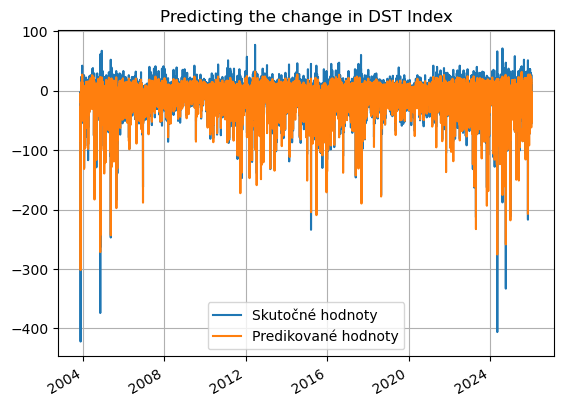

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9212542872150868
MCC=0.7632327370262199
Výkon NN:
MAE: 4.6168, MSE: 49.3865
Perzistentný model:
MAE: 5.2996, MSE: 68.9611
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 12.88%
MSE Improvement: 28.38%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 33s 38ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 32s 38ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 31s 37ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 30s 40ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 27s 40ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 26s 40ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 25s 40ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 24s 40ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 23s 40ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 22s 40ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 21s 40ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 19s 40ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 17s 40ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 16s 40ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 12s 39ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step 

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 35s 39ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 9s 41ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 8s 41ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 29s 39ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 29s 39ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step 

501/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 13:12 886ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 41s 46ms/step   

  5/896 ━━━━━━━━━━━━━━━━━━━━ 39s 45ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 35s 40ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 34s 40ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 34s 39ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 33s 39ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 31s 39ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 31s 38ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 30s 38ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 29s 38ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 25s 38ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 24s 38ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 22s 38ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 21s 38ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 20s 38ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 14s 38ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step

555/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step 

635/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

727/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 36s 39ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 28s 42ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 27s 42ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 26s 42ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 25s 41ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 25s 42ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 24s 41ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 23s 41ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 22s 41ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 21s 42ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 21s 42ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 21s 42ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 21s 42ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 21s 42ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 21s 42ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 21s 42ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 20s 42ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 20s 42ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 20s 42ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 19s 41ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 18s 41ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 16s 41ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 13s 40ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 11s 40ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step 

513/759 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step


Shapes LSTM:
train: (229338,) (229338,)
val:   (57321,) (57321,)
test:  (194182,) (194182,)
Global sigma (LSTM errors, scaled): 0.38532826
Shapes GP:
X_gp_train: (286659, 18)
y_gp_train: (286659,)
X_test_gp: (194182, 18)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 2.21**2 * RBF(length_scale=0.498) + WhiteKernel(noise_level=0.765)


Global sigma (LSTM errors): 8.478728
Hybrid prediction with smoothed, inflated interval ready.


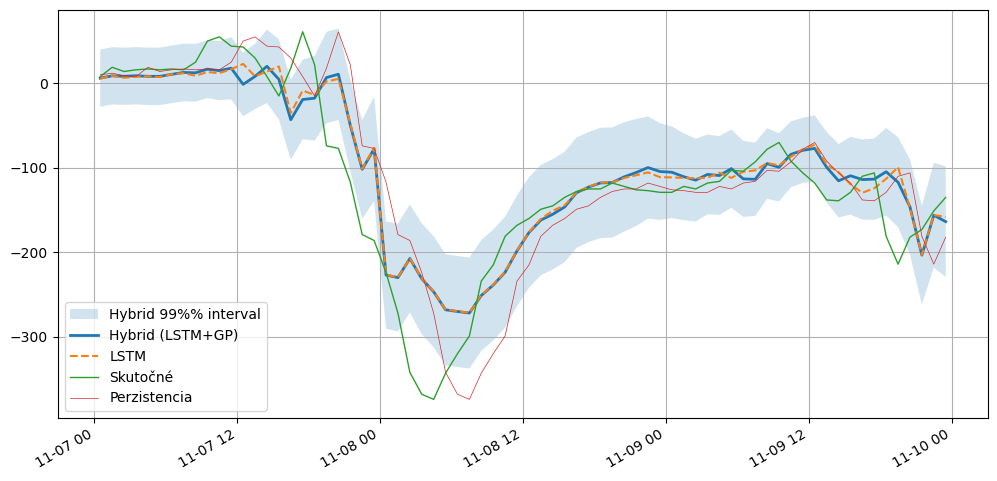

In [20]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})




start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [21]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 52.6968
MAE: 4.7790

--- Klasifikačné metriky (Prah: -19.3 nT) ---
Matthews Correlation Coefficient (MCC): 0.7562

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      145234 |        6812
Skutočná 1 |        8999 |       33132

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.94      0.96      0.95    152046
   Trieda 1 (Búrka)       0.83      0.79      0.81     42131

           accuracy                           0.92    194177
          macro avg       0.89      0.87      0.88    194177
       weighted avg       0.92      0.92      0.92    194177



In [22]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.9212522595364023
MCC=0.7632311251924137
Výkon NN:
MAE: 4.6168, MSE: 49.3865
Perzistentný model:
MAE: 5.2996, MSE: 68.9611
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 12.88%
MSE Improvement: 28.38%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9415    0.9590    0.9502    152046
           1     0.8414    0.7851    0.8122     42131

    accuracy                         0.9213    194177
   macro avg     0.8915    0.8720    0.8812    194177
weighted avg     0.9198    0.9213    0.9203    194177


===== LSTM+GP =====
ACC=0.918574290466945
MCC=0.7562143122848002
Výkon NN:
MAE: 4.7790, MSE: 52.6968
Perzistentný model:
MAE: 5.2996, MSE: 68.9611
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 9.82%
MSE Improvement: 23.58%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9417    0.9552    0.9484    152046
           1     0.8295    0.7864    0.8074     42131

  

/tmp/ipykernel_789456/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_789456/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
22,2026-04-27T03:55:26,LSTM,6.0,2.0,DST+2,OMNI2_all,-20.0,-20.0,0.937247,0.811525,"{""text"": "" precision recall f...",3.686464,30.729057,4.211529,43.255398,12.467320,28.959024
23,2026-04-27T03:55:26,LSTM+GP,6.0,2.0,DST+2,OMNI2_all,-20.0,-20.0,0.935842,0.807521,"{""text"": "" precision recall f...",3.834294,34.332140,4.211529,43.255398,8.957198,20.629235
24,2026-04-27T04:46:16,LSTM,12.0,3.0,DST+3,OMNI2_all,-20.0,-20.3,0.920956,0.761230,"{""text"": "" precision recall f...",4.667329,50.243068,5.299650,68.960383,11.931386,27.142127
25,2026-04-27T04:46:16,LSTM+GP,12.0,3.0,DST+3,OMNI2_all,-20.0,-20.3,0.913386,0.736647,"{""text"": "" precision recall f...",4.947679,56.162330,5.299650,68.960383,6.641403,18.558559
26,2026-04-27T05:01:23,LSTM,12.0,3.0,DST+3,OMNI2_all,-20.0,-20.3,0.920956,0.761230,"{""text"": "" precision recall f...",4.667329,50.243068,5.299650,68.960383,11.931386,27.142127
27,2026-04-27T05:01:24,LSTM+GP,12.0,3.0,DST+3,OMNI2_all,-20.0,-20.3,0.913386,0.736647,"{""text"": "" precision recall f...",4.947679,56.162330,5.299650,68.960383,6.641403,18.558559
28,2026-04-27T06:16:37,LSTM,18.0,3.0,DST+3,OMNI2_all,-20.0,-19.3,0.921252,0.763231,"{""text"": "" precision recall f...",4.616763,49.386512,5.299618,68.961051,12.884984,28.384920
29,2026-04-27T06:16:37,LSTM+GP,18.0,3.0,DST+3,OMNI2_all,-20.0,-19.3,0.918574,0.756214,"{""text"": "" precision recall f...",4.779049,52.696842,5.299618,68.961051,9.822765,23.584631
30,2026-04-27T06:30:25,LSTM,18.0,3.0,DST+3,OMNI2_all,-20.0,-19.3,0.921252,0.763231,"{""text"": "" precision recall f...",4.616763,49.386512,5.299618,68.961051,12.884984,28.384920
31,2026-04-27T06:30:25,LSTM+GP,18.0,3.0,DST+3,OMNI2_all,-20.0,-19.3,0.918574,0.756214,"{""text"": "" precision recall f...",4.779049,52.696842,5.299618,68.961051,9.822765,23.584631
